# Mean-Shift Clustering and Segmentation

In the first part of this task you will implement the *mean-shift* clustering algorithm in a general way (not specifically for anything to do with images, just simply for n-dimensional data points).

Then you will apply mean-shift for image segmentation, by clustering data points that represent pixels (e.g. the colors).

In [1]:
%%html
<!-- Add heading numbers -->
<style>
body {counter-reset: section;}
h2:before {counter-increment: section;
           content: counter(section) " ";}
</style>

In [2]:
# Some imports
%matplotlib notebook
import numpy as np
import matplotlib.pyplot as plt
import time
import imageio
from mpl_toolkits.mplot3d import Axes3D
import cv2
import os

## Recap from the lecture
The *mean-shift* algorithm clusters an $n$-dimensional data set (i.e., each data point is described by a feature vector of $n$ values) by associating each point with a peak in the estimated probability density of the dataset's distribution. Points associated with the "same" peak (up to some small threshold) become members of the same cluster.

For each point, mean-shift finds the associated peak by first defining a spherical window of radius $r$ centered on that point, and computing the **mean** of the points that lie within the window. The algorithm then **shifts** the window to be centered on that mean and repeats these steps until convergence, i.e., until the shift is smaller than a specified threshold (set this as 0.1). At each iteration the window shifts to a more densely populated portion of the data set until a peak is reached, where the data is approximately equally distributed in the window.

## Finding a peak from a query point
Implement the peak searching process as the function `find_peak(data, query, radius)` where

 * `data` is a $p \times n$ matrix containing $p$ data points; each point is defined by an $n$-dimensional row vector of feature values
 * `query` is the $n$-dimensional starting point from which we wish to compute a density peak
 * `radius` is the search window radius.

Return the peak as an $n$-dimensional vector.

**Hints:** You can use `np.linalg.norm` to compute the Euclidean norm of a vector. You can also index NumPy arrays with Boolean arrays, e.g. to select only rows that fulfil some criterion.

In [3]:
def find_peak(data, query, radius):
    # YOUR CODE HERE
    threshold = 1000000
    #print(data.shape)
    while threshold > 0.1:
        
        distance = np.array([np.linalg.norm(x-query) for x in data])
        idx = distance <= radius
        peak = np.mean(data[idx], axis = 0)
        threshold = np.linalg.norm(peak-query)
        query = peak
    
    return peak
        


You can use the synthetic dataset `gaussian_mixture_samples_3d.csv` to test your implementation. The data points in this file are 2000 samples from two 3D Gaussian distributions. The following plots only show the projection on the XY plane.

<IPython.core.display.Javascript object>


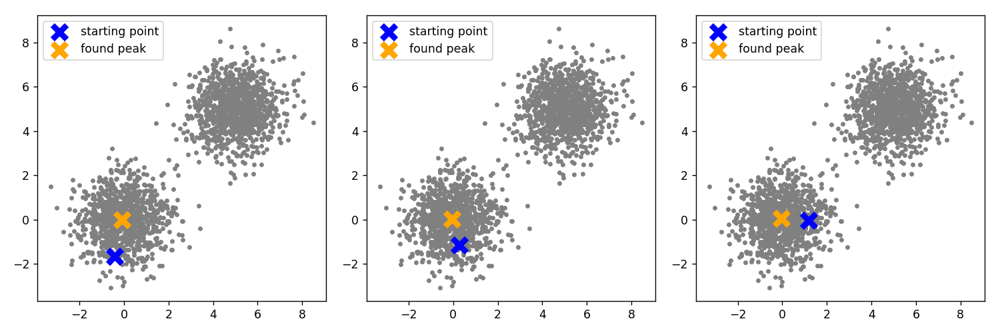

Found peak [-0.0872258  -0.00364086  0.01807252]
Found peak [-0.04665227  0.02658296  0.05947187]
Found peak [-0.03604118  0.0499105   0.04028733]


In [4]:
data = np.genfromtxt(f'gaussian_mixture_samples_3d.csv', delimiter=',')
point_ids = [0, 5, 1500]
radius = 2

fig, axes = plt.subplots(1, len(point_ids), figsize=(12,4))
for query, ax in zip(data, axes):
    peak = find_peak(data, query, radius)
    print('Found peak', peak)
    ax.scatter(data[:, 0], data[:, 1], marker='.', color='gray')
    ax.scatter(query[0], query[1], s=150, linewidth=5,
               color='blue', marker='x', label='starting point')
    ax.scatter(peak[0], peak[1], color='orange', marker='x',
               s=150, linewidth=5, label='found peak')
    ax.legend()
fig.tight_layout()

## Clustering all points
Implement `mean_shift(data, radius)`, which calls `find_peak` for each point and then assigns a label to each point according to its peak.
`mean_shift` should return two arrays: `peaks` and `labels`.

  * `peaks` is a matrix with $k$ rows, storing the found density peaks, where $k$ is the data-dependent number of clusters found. 
  * `labels` is a $p$-sized vector that has an entry for each data point, storing its associated cluster label (an integer)

Similar peaks within a distance of `radius`/2 should be considered the same and should be merged after each call to `find_peak`. More specifically, if the peak computed for a data point already exists in `peaks` (according to the distance threshold), then discard the newly computed peak and give the label of the already existing peak to the considered data point.

In [9]:
def mean_shift(data, radius):
    peaks = np.zeros_like(data)
    labels = np.full(len(data), fill_value=-1, dtype=int)
    exact_peaks = [find_peak(data, x, radius) for x in data]
    # YOUR CODE HERE
    cur_idx = 0
    for x in range(len(data)):
        exact_peak = find_peak(data, data[x], radius)
        if cur_idx == 0:
            peaks[cur_idx] = exact_peak
            labels[x] = cur_idx
            cur_idx += 1
        else:
            new_peak = True
            for i in range(cur_idx):
                print(" X ", exact_peak, peaks[i])
                dis = np.linalg.norm(exact_peak - peaks[i])
                print(" X ", exact_peak, peaks[i], dis)
                if (dis <= np.square(radius/2)):
                    labels[x] = cur_idx
                    new_peak = False
                    break
            
            if new_peak :
                peaks[cur_idx] = exact_peak
                cur_idx += 1
            
                    
    return peaks, labels

Now check the result of your implementation. The found peaks (cluster centers) are shown as black X marks. You can rotate the interactive 3D plots with the mouse (but it may be somewhat slow).

<IPython.core.display.Javascript object>


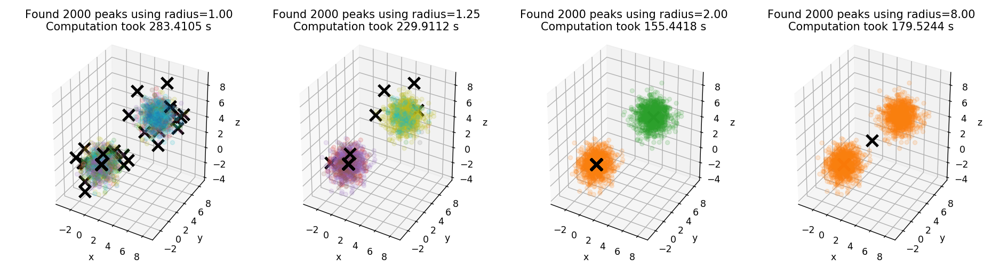

 X  [-0.04314581 -0.16080638  0.23470188] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.04314581 -0.16080638  0.23470188] [-0.2765442  -0.39244549  0.14538159] 0.3407485894205994
 X  [0.26479614 0.01426704 0.07885814] [-0.2765442  -0.39244549  0.14538159]
 X  [0.26479614 0.01426704 0.07885814] [-0.2765442  -0.39244549  0.14538159] 0.6803600594089644
 X  [0.26479614 0.01426704 0.07885814] [-0.04314581 -0.16080638  0.23470188]
 X  [0.26479614 0.01426704 0.07885814] [-0.04314581 -0.16080638  0.23470188] 0.38699639949231673
 X  [ 0.03828538 -0.02870737  0.43570939] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.03828538 -0.02870737  0.43570939] [-0.2765442  -0.39244549  0.14538159] 0.5618837222625166
 X  [ 0.03828538 -0.02870737  0.43570939] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.03828538 -0.02870737  0.43570939] [-0.04314581 -0.16080638  0.23470188] 0.25393937440265085
 X  [ 0.03828538 -0.02870737  0.43570939] [0.26479614 0.01426704 0.07885814]
 X  [ 0.03828538 -0.02870737  0.435709

 X  [-0.2859957  -0.13035443 -0.13990361] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.2859957  -0.13035443 -0.13990361] [-0.2765442  -0.39244549  0.14538159] 0.3875160685913267
 X  [-0.2859957  -0.13035443 -0.13990361] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.2859957  -0.13035443 -0.13990361] [-0.04314581 -0.16080638  0.23470188] 0.44747364908056775
 X  [-0.2859957  -0.13035443 -0.13990361] [0.26479614 0.01426704 0.07885814]
 X  [-0.2859957  -0.13035443 -0.13990361] [0.26479614 0.01426704 0.07885814] 0.6100358366711792
 X  [-0.2859957  -0.13035443 -0.13990361] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.2859957  -0.13035443 -0.13990361] [ 0.03828538 -0.02870737  0.43570939] 0.6684464621308394
 X  [-0.2859957  -0.13035443 -0.13990361] [-0.07101739  0.39054878  0.09516963]
 X  [-0.2859957  -0.13035443 -0.13990361] [-0.07101739  0.39054878  0.09516963] 0.6105859985187115
 X  [-0.2859957  -0.13035443 -0.13990361] [-0.19722492  0.3069117   0.60829956]
 X  [-0.2859957  -0.13035443 -

 X  [-0.17170251  0.01275143 -0.31871196] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.17170251  0.01275143 -0.31871196] [-0.2765442  -0.39244549  0.14538159] 0.6249473152083113
 X  [-0.17170251  0.01275143 -0.31871196] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.17170251  0.01275143 -0.31871196] [-0.04314581 -0.16080638  0.23470188] 0.5940673483556945
 X  [-0.17170251  0.01275143 -0.31871196] [0.26479614 0.01426704 0.07885814]
 X  [-0.17170251  0.01275143 -0.31871196] [0.26479614 0.01426704 0.07885814] 0.5904196395275942
 X  [-0.17170251  0.01275143 -0.31871196] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.17170251  0.01275143 -0.31871196] [ 0.03828538 -0.02870737  0.43570939] 0.7841972417936518
 X  [-0.17170251  0.01275143 -0.31871196] [-0.07101739  0.39054878  0.09516963]
 X  [-0.17170251  0.01275143 -0.31871196] [-0.07101739  0.39054878  0.09516963] 0.5693560439258913
 X  [-0.17170251  0.01275143 -0.31871196] [-0.19722492  0.3069117   0.60829956]
 X  [-0.17170251  0.01275143 -0

 X  [-0.13755959 -0.11594458 -0.28260793] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.13755959 -0.11594458 -0.28260793] [-0.2765442  -0.39244549  0.14538159] 0.5281519760324471
 X  [-0.13755959 -0.11594458 -0.28260793] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.13755959 -0.11594458 -0.28260793] [-0.04314581 -0.16080638  0.23470188] 0.5277650868440962
 X  [-0.13755959 -0.11594458 -0.28260793] [0.26479614 0.01426704 0.07885814]
 X  [-0.13755959 -0.11594458 -0.28260793] [0.26479614 0.01426704 0.07885814] 0.5563298671080077
 X  [-0.13755959 -0.11594458 -0.28260793] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.13755959 -0.11594458 -0.28260793] [ 0.03828538 -0.02870737  0.43570939] 0.7446553300556471
 X  [-0.13755959 -0.11594458 -0.28260793] [-0.07101739  0.39054878  0.09516963]
 X  [-0.13755959 -0.11594458 -0.28260793] [-0.07101739  0.39054878  0.09516963] 0.635357600436231
 X  [-0.13755959 -0.11594458 -0.28260793] [-0.19722492  0.3069117   0.60829956]
 X  [-0.13755959 -0.11594458 -0.

 X  [-0.21801246  0.00619712 -0.5084157 ] [ 0.03828538 -0.02870737  0.43570939] 0.9789173086319777
 X  [-0.21801246  0.00619712 -0.5084157 ] [-0.07101739  0.39054878  0.09516963]
 X  [-0.21801246  0.00619712 -0.5084157 ] [-0.07101739  0.39054878  0.09516963] 0.7305128426927906
 X  [-0.21801246  0.00619712 -0.5084157 ] [-0.19722492  0.3069117   0.60829956]
 X  [-0.21801246  0.00619712 -0.5084157 ] [-0.19722492  0.3069117   0.60829956] 1.1566824774225182
 X  [-0.21801246  0.00619712 -0.5084157 ] [0.04579834 0.51252156 0.42951918]
 X  [-0.21801246  0.00619712 -0.5084157 ] [0.04579834 0.51252156 0.42951918] 1.098035715021305
 X  [-0.21801246  0.00619712 -0.5084157 ] [-0.15936589  0.23893898 -0.22396296]
 X  [-0.21801246  0.00619712 -0.5084157 ] [-0.15936589  0.23893898 -0.22396296] 0.3721848431487647
 X  [-0.21801246  0.00619712 -0.5084157 ] [ 0.30389463  0.19665761 -0.50765168]
 X  [-0.21801246  0.00619712 -0.5084157 ] [ 0.30389463  0.19665761 -0.50765168] 0.5555742829244357
 X  [-0.21801

 X  [ 0.00757611 -0.04986208 -0.28717236] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.00757611 -0.04986208 -0.28717236] [-0.2765442  -0.39244549  0.14538159] 0.6206373087693802
 X  [ 0.00757611 -0.04986208 -0.28717236] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.00757611 -0.04986208 -0.28717236] [-0.04314581 -0.16080638  0.23470188] 0.5359422329144463
 X  [ 0.00757611 -0.04986208 -0.28717236] [0.26479614 0.01426704 0.07885814]
 X  [ 0.00757611 -0.04986208 -0.28717236] [0.26479614 0.01426704 0.07885814] 0.45194359827737834
 X  [ 0.00757611 -0.04986208 -0.28717236] [ 0.03828538 -0.02870737  0.43570939]
 X  [ 0.00757611 -0.04986208 -0.28717236] [ 0.03828538 -0.02870737  0.43570939] 0.7238429449212812
 X  [ 0.00757611 -0.04986208 -0.28717236] [-0.07101739  0.39054878  0.09516963]
 X  [ 0.00757611 -0.04986208 -0.28717236] [-0.07101739  0.39054878  0.09516963] 0.5884930525149685
 X  [ 0.00757611 -0.04986208 -0.28717236] [-0.19722492  0.3069117   0.60829956]
 X  [ 0.00757611 -0.04986208 -

 X  [-0.2745379  -0.13606492 -0.13028104] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.2745379  -0.13606492 -0.13028104] [-0.2765442  -0.39244549  0.14538159] 0.37646368719138684
 X  [-0.2745379  -0.13606492 -0.13028104] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.2745379  -0.13606492 -0.13028104] [-0.04314581 -0.16080638  0.23470188] 0.4328590669041651
 X  [-0.2745379  -0.13606492 -0.13028104] [0.26479614 0.01426704 0.07885814]
 X  [-0.2745379  -0.13606492 -0.13028104] [0.26479614 0.01426704 0.07885814] 0.5976789255097846
 X  [-0.2745379  -0.13606492 -0.13028104] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.2745379  -0.13606492 -0.13028104] [ 0.03828538 -0.02870737  0.43570939] 0.6555373491139967
 X  [-0.2745379  -0.13606492 -0.13028104] [-0.07101739  0.39054878  0.09516963]
 X  [-0.2745379  -0.13606492 -0.13028104] [-0.07101739  0.39054878  0.09516963] 0.6079231860583489
 X  [-0.2745379  -0.13606492 -0.13028104] [-0.19722492  0.3069117   0.60829956]
 X  [-0.2745379  -0.13606492 -

 X  [0.05269298 0.21535375 0.48672863] [-0.2765442  -0.39244549  0.14538159]
 X  [0.05269298 0.21535375 0.48672863] [-0.2765442  -0.39244549  0.14538159] 0.770931142998966
 X  [0.05269298 0.21535375 0.48672863] [-0.04314581 -0.16080638  0.23470188]
 X  [0.05269298 0.21535375 0.48672863] [-0.04314581 -0.16080638  0.23470188] 0.46281636919796243
 X  [0.05269298 0.21535375 0.48672863] [0.26479614 0.01426704 0.07885814]
 X  [0.05269298 0.21535375 0.48672863] [0.26479614 0.01426704 0.07885814] 0.5017787787266976
 X  [0.05269298 0.21535375 0.48672863] [ 0.03828538 -0.02870737  0.43570939]
 X  [0.05269298 0.21535375 0.48672863] [ 0.03828538 -0.02870737  0.43570939] 0.24975261248906136
 X  [-0.20609002 -0.28199058  0.06453019] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.20609002 -0.28199058  0.06453019] [-0.2765442  -0.39244549  0.14538159] 0.15395138052221252
 X  [ 0.14266618 -0.18546177  0.11872413] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.14266618 -0.18546177  0.11872413] [-0.2765442

 X  [ 0.03913635 -0.30950431 -0.05812654] [ 0.04360425  0.25486309 -0.56236092] 0.756824175509212
 X  [ 0.03913635 -0.30950431 -0.05812654] [-0.21801246  0.00619712 -0.5084157 ]
 X  [ 0.03913635 -0.30950431 -0.05812654] [-0.21801246  0.00619712 -0.5084157 ] 0.6070858495539151
 X  [ 0.03913635 -0.30950431 -0.05812654] [ 0.00757611 -0.04986208 -0.28717236]
 X  [ 0.03913635 -0.30950431 -0.05812654] [ 0.00757611 -0.04986208 -0.28717236] 0.3476666806584226
 X  [-0.25374947 -0.20753732  0.00090848] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.25374947 -0.20753732  0.00090848] [-0.2765442  -0.39244549  0.14538159] 0.23576071348241517
 X  [0.11543367 0.01027634 0.24049862] [-0.2765442  -0.39244549  0.14538159]
 X  [0.11543367 0.01027634 0.24049862] [-0.2765442  -0.39244549  0.14538159] 0.5699813744347314
 X  [0.11543367 0.01027634 0.24049862] [-0.04314581 -0.16080638  0.23470188]
 X  [0.11543367 0.01027634 0.24049862] [-0.04314581 -0.16080638  0.23470188] 0.23334598332424875
 X  [-0.26196384 

 X  [-0.36922727  0.14288045  0.09111325] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.36922727  0.14288045  0.09111325] [-0.2765442  -0.39244549  0.14538159] 0.5459936438056008
 X  [-0.36922727  0.14288045  0.09111325] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.36922727  0.14288045  0.09111325] [-0.04314581 -0.16080638  0.23470188] 0.468158626333161
 X  [-0.36922727  0.14288045  0.09111325] [0.26479614 0.01426704 0.07885814]
 X  [-0.36922727  0.14288045  0.09111325] [0.26479614 0.01426704 0.07885814] 0.6470527599021381
 X  [-0.36922727  0.14288045  0.09111325] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.36922727  0.14288045  0.09111325] [ 0.03828538 -0.02870737  0.43570939] 0.5605849057849137
 X  [-0.36922727  0.14288045  0.09111325] [-0.07101739  0.39054878  0.09516963]
 X  [-0.36922727  0.14288045  0.09111325] [-0.07101739  0.39054878  0.09516963] 0.3876663429809617
 X  [-0.36922727  0.14288045  0.09111325] [-0.19722492  0.3069117   0.60829956]
 X  [-0.36922727  0.14288045  0.

 X  [-0.32804025 -0.15966083  0.0336911 ] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.32804025 -0.15966083  0.0336911 ] [-0.2765442  -0.39244549  0.14538159] 0.2632780055565669
 X  [-0.32804025 -0.15966083  0.0336911 ] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.32804025 -0.15966083  0.0336911 ] [-0.04314581 -0.16080638  0.23470188] 0.3486710372673097
 X  [-0.32804025 -0.15966083  0.0336911 ] [0.26479614 0.01426704 0.07885814]
 X  [-0.32804025 -0.15966083  0.0336911 ] [0.26479614 0.01426704 0.07885814] 0.6194723160112127
 X  [-0.32804025 -0.15966083  0.0336911 ] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.32804025 -0.15966083  0.0336911 ] [ 0.03828538 -0.02870737  0.43570939] 0.5594300565018937
 X  [-0.32804025 -0.15966083  0.0336911 ] [-0.07101739  0.39054878  0.09516963]
 X  [-0.32804025 -0.15966083  0.0336911 ] [-0.07101739  0.39054878  0.09516963] 0.6103859288523775
 X  [-0.32804025 -0.15966083  0.0336911 ] [-0.19722492  0.3069117   0.60829956]
 X  [-0.32804025 -0.15966083  0

 X  [-0.25009422  0.2989262   0.1484717 ] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.25009422  0.2989262   0.1484717 ] [-0.2765442  -0.39244549  0.14538159] 0.6918843514017459
 X  [-0.25009422  0.2989262   0.1484717 ] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.25009422  0.2989262   0.1484717 ] [-0.04314581 -0.16080638  0.23470188] 0.5114854143039477
 X  [-0.25009422  0.2989262   0.1484717 ] [0.26479614 0.01426704 0.07885814]
 X  [-0.25009422  0.2989262   0.1484717 ] [0.26479614 0.01426704 0.07885814] 0.5924432167872906
 X  [-0.25009422  0.2989262   0.1484717 ] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.25009422  0.2989262   0.1484717 ] [ 0.03828538 -0.02870737  0.43570939] 0.5225055386242575
 X  [-0.25009422  0.2989262   0.1484717 ] [-0.07101739  0.39054878  0.09516963]
 X  [-0.25009422  0.2989262   0.1484717 ] [-0.07101739  0.39054878  0.09516963] 0.20809690516885482
 X  [-0.22540526  0.26984309  0.6044886 ] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.22540526  0.26984309  

 X  [-0.14448756  0.150378    0.5695307 ] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.14448756  0.150378    0.5695307 ] [-0.2765442  -0.39244549  0.14538159] 0.7014262314667243
 X  [-0.14448756  0.150378    0.5695307 ] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.14448756  0.150378    0.5695307 ] [-0.04314581 -0.16080638  0.23470188] 0.4682053021869802
 X  [-0.14448756  0.150378    0.5695307 ] [0.26479614 0.01426704 0.07885814]
 X  [-0.14448756  0.150378    0.5695307 ] [0.26479614 0.01426704 0.07885814] 0.6532984758258514
 X  [-0.14448756  0.150378    0.5695307 ] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.14448756  0.150378    0.5695307 ] [ 0.03828538 -0.02870737  0.43570939] 0.2887657539981214
 X  [-0.14448756  0.150378    0.5695307 ] [-0.07101739  0.39054878  0.09516963]
 X  [-0.14448756  0.150378    0.5695307 ] [-0.07101739  0.39054878  0.09516963] 0.5367478895132783
 X  [-0.14448756  0.150378    0.5695307 ] [-0.19722492  0.3069117   0.60829956]
 X  [-0.14448756  0.150378    0

 X  [-0.27491578  0.2642197   0.19945502] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.27491578  0.2642197   0.19945502] [-0.2765442  -0.39244549  0.14538159] 0.6588897914973616
 X  [-0.27491578  0.2642197   0.19945502] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.27491578  0.2642197   0.19945502] [-0.04314581 -0.16080638  0.23470188] 0.48539347619035317
 X  [-0.27491578  0.2642197   0.19945502] [0.26479614 0.01426704 0.07885814]
 X  [-0.27491578  0.2642197   0.19945502] [0.26479614 0.01426704 0.07885814] 0.6068845765266639
 X  [-0.27491578  0.2642197   0.19945502] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.27491578  0.2642197   0.19945502] [ 0.03828538 -0.02870737  0.43570939] 0.4896093966675092
 X  [-0.27491578  0.2642197   0.19945502] [-0.07101739  0.39054878  0.09516963]
 X  [-0.27491578  0.2642197   0.19945502] [-0.07101739  0.39054878  0.09516963] 0.26155120358334305
 X  [-0.27491578  0.2642197   0.19945502] [-0.19722492  0.3069117   0.60829956]
 X  [-0.27491578  0.2642197  

 X  [ 0.33871102  0.07733513 -0.29238925] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.33871102  0.07733513 -0.29238925] [-0.2765442  -0.39244549  0.14538159] 0.8893121663479957
 X  [ 0.33871102  0.07733513 -0.29238925] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.33871102  0.07733513 -0.29238925] [-0.04314581 -0.16080638  0.23470188] 0.6930736427498018
 X  [ 0.33871102  0.07733513 -0.29238925] [0.26479614 0.01426704 0.07885814]
 X  [ 0.33871102  0.07733513 -0.29238925] [0.26479614 0.01426704 0.07885814] 0.3837520283753722
 X  [ 0.33871102  0.07733513 -0.29238925] [ 0.03828538 -0.02870737  0.43570939]
 X  [ 0.33871102  0.07733513 -0.29238925] [ 0.03828538 -0.02870737  0.43570939] 0.7947504001851816
 X  [ 0.33871102  0.07733513 -0.29238925] [-0.07101739  0.39054878  0.09516963]
 X  [ 0.33871102  0.07733513 -0.29238925] [-0.07101739  0.39054878  0.09516963] 0.6451217293315071
 X  [ 0.33871102  0.07733513 -0.29238925] [-0.19722492  0.3069117   0.60829956]
 X  [ 0.33871102  0.07733513 -0

 X  [ 0.25018099  0.07110658 -0.11526696] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.25018099  0.07110658 -0.11526696] [-0.2765442  -0.39244549  0.14538159] 0.748503584320029
 X  [ 0.25018099  0.07110658 -0.11526696] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.25018099  0.07110658 -0.11526696] [-0.04314581 -0.16080638  0.23470188] 0.5121546856403538
 X  [ 0.25018099  0.07110658 -0.11526696] [0.26479614 0.01426704 0.07885814]
 X  [ 0.25018099  0.07110658 -0.11526696] [0.26479614 0.01426704 0.07885814] 0.20280259565562134
 X  [ 0.10208522 -0.08975455  0.25646646] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.10208522 -0.08975455  0.25646646] [-0.2765442  -0.39244549  0.14538159] 0.49731468051103866
 X  [ 0.10208522 -0.08975455  0.25646646] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.10208522 -0.08975455  0.25646646] [-0.04314581 -0.16080638  0.23470188] 0.1631383189623916
 X  [ 0.02826383  0.22540748 -0.29758641] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.02826383  0.22540748 -

 X  [-0.12444446 -0.0102977  -0.34483678] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.12444446 -0.0102977  -0.34483678] [-0.2765442  -0.39244549  0.14538159] 0.6399103975557825
 X  [-0.12444446 -0.0102977  -0.34483678] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.12444446 -0.0102977  -0.34483678] [-0.04314581 -0.16080638  0.23470188] 0.6042577206844043
 X  [-0.12444446 -0.0102977  -0.34483678] [0.26479614 0.01426704 0.07885814]
 X  [-0.12444446 -0.0102977  -0.34483678] [0.26479614 0.01426704 0.07885814] 0.5758724315148186
 X  [-0.12444446 -0.0102977  -0.34483678] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.12444446 -0.0102977  -0.34483678] [ 0.03828538 -0.02870737  0.43570939] 0.7975413723902752
 X  [-0.12444446 -0.0102977  -0.34483678] [-0.07101739  0.39054878  0.09516963]
 X  [-0.12444446 -0.0102977  -0.34483678] [-0.07101739  0.39054878  0.09516963] 0.5976102423298291
 X  [-0.12444446 -0.0102977  -0.34483678] [-0.19722492  0.3069117   0.60829956]
 X  [-0.12444446 -0.0102977  -0

 X  [-0.22787853  0.15645233 -0.18048044] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.22787853  0.15645233 -0.18048044] [-0.2765442  -0.39244549  0.14538159] 0.6401899919792711
 X  [-0.22787853  0.15645233 -0.18048044] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.22787853  0.15645233 -0.18048044] [-0.04314581 -0.16080638  0.23470188] 0.5542162248602058
 X  [-0.22787853  0.15645233 -0.18048044] [0.26479614 0.01426704 0.07885814]
 X  [-0.22787853  0.15645233 -0.18048044] [0.26479614 0.01426704 0.07885814] 0.57463160820725
 X  [-0.22787853  0.15645233 -0.18048044] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.22787853  0.15645233 -0.18048044] [ 0.03828538 -0.02870737  0.43570939] 0.6962881904693502
 X  [-0.22787853  0.15645233 -0.18048044] [-0.07101739  0.39054878  0.09516963]
 X  [-0.22787853  0.15645233 -0.18048044] [-0.07101739  0.39054878  0.09516963] 0.3941947860610184
 X  [-0.22787853  0.15645233 -0.18048044] [-0.19722492  0.3069117   0.60829956]
 X  [-0.22787853  0.15645233 -0.1

 X  [ 0.01329388 -0.0519294  -0.21846882] [-0.15936589  0.23893898 -0.22396296]
 X  [ 0.01329388 -0.0519294  -0.21846882] [-0.15936589  0.23893898 -0.22396296] 0.33829867754574705
 X  [ 0.01329388 -0.0519294  -0.21846882] [ 0.30389463  0.19665761 -0.50765168]
 X  [ 0.01329388 -0.0519294  -0.21846882] [ 0.30389463  0.19665761 -0.50765168] 0.47944866594152213
 X  [ 0.01329388 -0.0519294  -0.21846882] [-0.2859957  -0.13035443 -0.13990361]
 X  [ 0.01329388 -0.0519294  -0.21846882] [-0.2859957  -0.13035443 -0.13990361] 0.3192134556973559
 X  [ 0.01329388 -0.0519294  -0.21846882] [0.058421   0.3851361  0.84259851]
 X  [ 0.01329388 -0.0519294  -0.21846882] [0.058421   0.3851361  0.84259851] 1.1484452890764576
 X  [ 0.01329388 -0.0519294  -0.21846882] [-0.30182495  0.18823127  0.24153096]
 X  [ 0.01329388 -0.0519294  -0.21846882] [-0.30182495  0.18823127  0.24153096] 0.6071052825036118
 X  [ 0.01329388 -0.0519294  -0.21846882] [ 0.18001632  0.2088013  -0.17326424]
 X  [ 0.01329388 -0.0519294  

 X  [-0.34673597 -0.15016572 -0.04469722] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.34673597 -0.15016572 -0.04469722] [-0.2765442  -0.39244549  0.14538159] 0.3158422494199046
 X  [-0.34673597 -0.15016572 -0.04469722] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.34673597 -0.15016572 -0.04469722] [-0.04314581 -0.16080638  0.23470188] 0.4127275960953775
 X  [-0.34673597 -0.15016572 -0.04469722] [0.26479614 0.01426704 0.07885814]
 X  [-0.34673597 -0.15016572 -0.04469722] [0.26479614 0.01426704 0.07885814] 0.6451942174713692
 X  [-0.34673597 -0.15016572 -0.04469722] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.34673597 -0.15016572 -0.04469722] [ 0.03828538 -0.02870737  0.43570939] 0.6275221795708491
 X  [-0.34673597 -0.15016572 -0.04469722] [-0.07101739  0.39054878  0.09516963]
 X  [-0.34673597 -0.15016572 -0.04469722] [-0.07101739  0.39054878  0.09516963] 0.6228608588535444
 X  [-0.34673597 -0.15016572 -0.04469722] [-0.19722492  0.3069117   0.60829956]
 X  [-0.34673597 -0.15016572 -0

 X  [-0.0367365  -0.26745157 -0.07431611] [ 0.18001632  0.2088013  -0.17326424] 0.5325310480648634
 X  [-0.0367365  -0.26745157 -0.07431611] [ 0.04360425  0.25486309 -0.56236092]
 X  [-0.0367365  -0.26745157 -0.07431611] [ 0.04360425  0.25486309 -0.56236092] 0.71934343682295
 X  [-0.0367365  -0.26745157 -0.07431611] [-0.21801246  0.00619712 -0.5084157 ]
 X  [-0.0367365  -0.26745157 -0.07431611] [-0.21801246  0.00619712 -0.5084157 ] 0.5442306783722298
 X  [-0.0367365  -0.26745157 -0.07431611] [ 0.00757611 -0.04986208 -0.28717236]
 X  [-0.0367365  -0.26745157 -0.07431611] [ 0.00757611 -0.04986208 -0.28717236] 0.3075980758369295
 X  [-0.0367365  -0.26745157 -0.07431611] [ 0.03913635 -0.30950431 -0.05812654]
 X  [-0.0367365  -0.26745157 -0.07431611] [ 0.03913635 -0.30950431 -0.05812654] 0.08824525919031738
 X  [-0.1108906   0.21152762 -0.06786969] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.1108906   0.21152762 -0.06786969] [-0.2765442  -0.39244549  0.14538159] 0.661589555744663
 X  [-0.

 X  [ 0.40983081  0.07175812 -0.22932877] [ 0.00757611 -0.04986208 -0.28717236] 0.42420065794014655
 X  [ 0.40983081  0.07175812 -0.22932877] [ 0.03913635 -0.30950431 -0.05812654]
 X  [ 0.40983081  0.07175812 -0.22932877] [ 0.03913635 -0.30950431 -0.05812654] 0.5586462379882368
 X  [ 0.40983081  0.07175812 -0.22932877] [-0.47941245  0.08400631 -0.02733074]
 X  [ 0.40983081  0.07175812 -0.22932877] [-0.47941245  0.08400631 -0.02733074] 0.9119796059232664
 X  [2.23561235e-05 4.45140548e-01 6.50132367e-01] [-0.2765442  -0.39244549  0.14538159]
 X  [2.23561235e-05 4.45140548e-01 6.50132367e-01] [-0.2765442  -0.39244549  0.14538159] 1.016273964157829
 X  [2.23561235e-05 4.45140548e-01 6.50132367e-01] [-0.04314581 -0.16080638  0.23470188]
 X  [2.23561235e-05 4.45140548e-01 6.50132367e-01] [-0.04314581 -0.16080638  0.23470188] 0.7359467741540047
 X  [2.23561235e-05 4.45140548e-01 6.50132367e-01] [0.26479614 0.01426704 0.07885814]
 X  [2.23561235e-05 4.45140548e-01 6.50132367e-01] [0.26479614 

 X  [0.0610254  0.3520497  0.15879607] [-0.2765442  -0.39244549  0.14538159]
 X  [0.0610254  0.3520497  0.15879607] [-0.2765442  -0.39244549  0.14538159] 0.8175611667624825
 X  [0.0610254  0.3520497  0.15879607] [-0.04314581 -0.16080638  0.23470188]
 X  [0.0610254  0.3520497  0.15879607] [-0.04314581 -0.16080638  0.23470188] 0.528804959097771
 X  [0.0610254  0.3520497  0.15879607] [0.26479614 0.01426704 0.07885814]
 X  [0.0610254  0.3520497  0.15879607] [0.26479614 0.01426704 0.07885814] 0.40250429818172967
 X  [0.0610254  0.3520497  0.15879607] [ 0.03828538 -0.02870737  0.43570939]
 X  [0.0610254  0.3520497  0.15879607] [ 0.03828538 -0.02870737  0.43570939] 0.47135340909819845
 X  [0.0610254  0.3520497  0.15879607] [-0.07101739  0.39054878  0.09516963]
 X  [0.0610254  0.3520497  0.15879607] [-0.07101739  0.39054878  0.09516963] 0.15154471237598463
 X  [-0.086099   -0.28276663  0.14284873] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.086099   -0.28276663  0.14284873] [-0.2765442  -0.3

 X  [0.01211821 0.38878506 0.21176668] [-0.07101739  0.39054878  0.09516963] 0.1432114150537762
 X  [-0.26577284  0.04733841 -0.39269718] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.26577284  0.04733841 -0.39269718] [-0.2765442  -0.39244549  0.14538159] 0.6950213432082176
 X  [-0.26577284  0.04733841 -0.39269718] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.26577284  0.04733841 -0.39269718] [-0.04314581 -0.16080638  0.23470188] 0.6975074424252196
 X  [-0.26577284  0.04733841 -0.39269718] [0.26479614 0.01426704 0.07885814]
 X  [-0.26577284  0.04733841 -0.39269718] [0.26479614 0.01426704 0.07885814] 0.7106064865701643
 X  [-0.26577284  0.04733841 -0.39269718] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.26577284  0.04733841 -0.39269718] [ 0.03828538 -0.02870737  0.43570939] 0.8857154234164566
 X  [-0.26577284  0.04733841 -0.39269718] [-0.07101739  0.39054878  0.09516963]
 X  [-0.26577284  0.04733841 -0.39269718] [-0.07101739  0.39054878  0.09516963] 0.6274847249598159
 X  [-0.2657728

 X  [-0.17772385  0.08614785 -0.44536883] [-0.19722492  0.3069117   0.60829956] 1.0767237534395193
 X  [-0.17772385  0.08614785 -0.44536883] [0.04579834 0.51252156 0.42951918]
 X  [-0.17772385  0.08614785 -0.44536883] [0.04579834 0.51252156 0.42951918] 0.9985918838169191
 X  [-0.17772385  0.08614785 -0.44536883] [-0.15936589  0.23893898 -0.22396296]
 X  [-0.17772385  0.08614785 -0.44536883] [-0.15936589  0.23893898 -0.22396296] 0.2696343900557811
 X  [-0.17772385  0.08614785 -0.44536883] [ 0.30389463  0.19665761 -0.50765168]
 X  [-0.17772385  0.08614785 -0.44536883] [ 0.30389463  0.19665761 -0.50765168] 0.4980440884898095
 X  [-0.17772385  0.08614785 -0.44536883] [-0.2859957  -0.13035443 -0.13990361]
 X  [-0.17772385  0.08614785 -0.44536883] [-0.2859957  -0.13035443 -0.13990361] 0.3897499606816151
 X  [-0.17772385  0.08614785 -0.44536883] [0.058421   0.3851361  0.84259851]
 X  [-0.17772385  0.08614785 -0.44536883] [0.058421   0.3851361  0.84259851] 1.3431374566415306
 X  [-0.17772385  

 X  [ 0.14910307 -0.0751123  -0.12743008] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.14910307 -0.0751123  -0.12743008] [-0.2765442  -0.39244549  0.14538159] 0.5969105170966196
 X  [ 0.14910307 -0.0751123  -0.12743008] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.14910307 -0.0751123  -0.12743008] [-0.04314581 -0.16080638  0.23470188] 0.41885876718130444
 X  [ 0.14910307 -0.0751123  -0.12743008] [0.26479614 0.01426704 0.07885814]
 X  [ 0.14910307 -0.0751123  -0.12743008] [0.26479614 0.01426704 0.07885814] 0.2528406277865449
 X  [ 0.14910307 -0.0751123  -0.12743008] [ 0.03828538 -0.02870737  0.43570939]
 X  [ 0.14910307 -0.0751123  -0.12743008] [ 0.03828538 -0.02870737  0.43570939] 0.5758125068912869
 X  [ 0.14910307 -0.0751123  -0.12743008] [-0.07101739  0.39054878  0.09516963]
 X  [ 0.14910307 -0.0751123  -0.12743008] [-0.07101739  0.39054878  0.09516963] 0.5611095261769251
 X  [ 0.14910307 -0.0751123  -0.12743008] [-0.19722492  0.3069117   0.60829956]
 X  [ 0.14910307 -0.0751123  -

 X  [-0.19319959  0.20283257 -0.3506883 ] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.19319959  0.20283257 -0.3506883 ] [-0.2765442  -0.39244549  0.14538159] 0.7793507749585326
 X  [-0.19319959  0.20283257 -0.3506883 ] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.19319959  0.20283257 -0.3506883 ] [-0.04314581 -0.16080638  0.23470188] 0.7052879439823188
 X  [-0.19319959  0.20283257 -0.3506883 ] [0.26479614 0.01426704 0.07885814]
 X  [-0.19319959  0.20283257 -0.3506883 ] [0.26479614 0.01426704 0.07885814] 0.65561207390026
 X  [-0.19319959  0.20283257 -0.3506883 ] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.19319959  0.20283257 -0.3506883 ] [ 0.03828538 -0.02870737  0.43570939] 0.8518317650333492
 X  [-0.19319959  0.20283257 -0.3506883 ] [-0.07101739  0.39054878  0.09516963]
 X  [-0.19319959  0.20283257 -0.3506883 ] [-0.07101739  0.39054878  0.09516963] 0.4989540656626308
 X  [-0.19319959  0.20283257 -0.3506883 ] [-0.19722492  0.3069117   0.60829956]
 X  [-0.19319959  0.20283257 -0.3

 X  [-0.08244535 -0.1024236  -0.28204206] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.08244535 -0.1024236  -0.28204206] [-0.2765442  -0.39244549  0.14538159] 0.5517952875278107
 X  [-0.08244535 -0.1024236  -0.28204206] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.08244535 -0.1024236  -0.28204206] [-0.04314581 -0.16080638  0.23470188] 0.5215144306897425
 X  [-0.08244535 -0.1024236  -0.28204206] [0.26479614 0.01426704 0.07885814]
 X  [-0.08244535 -0.1024236  -0.28204206] [0.26479614 0.01426704 0.07885814] 0.5142395447248054
 X  [-0.08244535 -0.1024236  -0.28204206] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.08244535 -0.1024236  -0.28204206] [ 0.03828538 -0.02870737  0.43570939] 0.7315580167037362
 X  [-0.08244535 -0.1024236  -0.28204206] [-0.07101739  0.39054878  0.09516963]
 X  [-0.08244535 -0.1024236  -0.28204206] [-0.07101739  0.39054878  0.09516963] 0.620838970734942
 X  [-0.08244535 -0.1024236  -0.28204206] [-0.19722492  0.3069117   0.60829956]
 X  [-0.08244535 -0.1024236  -0.

 X  [ 0.01649198  0.10333791 -0.30479373] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.01649198  0.10333791 -0.30479373] [-0.2765442  -0.39244549  0.14538159] 0.7309782575041549
 X  [ 0.01649198  0.10333791 -0.30479373] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.01649198  0.10333791 -0.30479373] [-0.04314581 -0.16080638  0.23470188] 0.6036426015331299
 X  [ 0.01649198  0.10333791 -0.30479373] [0.26479614 0.01426704 0.07885814]
 X  [ 0.01649198  0.10333791 -0.30479373] [0.26479614 0.01426704 0.07885814] 0.46559352844708723
 X  [ 0.01649198  0.10333791 -0.30479373] [ 0.03828538 -0.02870737  0.43570939]
 X  [ 0.01649198  0.10333791 -0.30479373] [ 0.03828538 -0.02870737  0.43570939] 0.7524996886686142
 X  [ 0.01649198  0.10333791 -0.30479373] [-0.07101739  0.39054878  0.09516963]
 X  [ 0.01649198  0.10333791 -0.30479373] [-0.07101739  0.39054878  0.09516963] 0.5001186558022367
 X  [ 0.01649198  0.10333791 -0.30479373] [-0.19722492  0.3069117   0.60829956]
 X  [ 0.01649198  0.10333791 -

 X  [0.09804604 0.1946883  0.0473167 ] [0.26479614 0.01426704 0.07885814] 0.24769394034066866
 X  [-0.07180415 -0.12414554 -0.30470621] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.07180415 -0.12414554 -0.30470621] [-0.2765442  -0.39244549  0.14538159] 0.5625676701372841
 X  [-0.07180415 -0.12414554 -0.30470621] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.07180415 -0.12414554 -0.30470621] [-0.04314581 -0.16080638  0.23470188] 0.5414114953434888
 X  [-0.07180415 -0.12414554 -0.30470621] [0.26479614 0.01426704 0.07885814]
 X  [-0.07180415 -0.12414554 -0.30470621] [0.26479614 0.01426704 0.07885814] 0.5287526888311725
 X  [-0.07180415 -0.12414554 -0.30470621] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.07180415 -0.12414554 -0.30470621] [ 0.03828538 -0.02870737  0.43570939] 0.7546147434826357
 X  [-0.07180415 -0.12414554 -0.30470621] [-0.07101739  0.39054878  0.09516963]
 X  [-0.07180415 -0.12414554 -0.30470621] [-0.07101739  0.39054878  0.09516963] 0.6517756997536531
 X  [-0.07180415 

 X  [-0.18931087  0.16252903 -0.32869846] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.18931087  0.16252903 -0.32869846] [-0.2765442  -0.39244549  0.14538159] 0.7350906530891691
 X  [-0.18931087  0.16252903 -0.32869846] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.18931087  0.16252903 -0.32869846] [-0.04314581 -0.16080638  0.23470188] 0.6658302760248461
 X  [-0.18931087  0.16252903 -0.32869846] [0.26479614 0.01426704 0.07885814]
 X  [-0.18931087  0.16252903 -0.32869846] [0.26479614 0.01426704 0.07885814] 0.6279308691755655
 X  [-0.18931087  0.16252903 -0.32869846] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.18931087  0.16252903 -0.32869846] [ 0.03828538 -0.02870737  0.43570939] 0.8201772828544409
 X  [-0.18931087  0.16252903 -0.32869846] [-0.07101739  0.39054878  0.09516963]
 X  [-0.18931087  0.16252903 -0.32869846] [-0.07101739  0.39054878  0.09516963] 0.4956314345490666
 X  [-0.18931087  0.16252903 -0.32869846] [-0.19722492  0.3069117   0.60829956]
 X  [-0.18931087  0.16252903 -0

 X  [ 0.20026814 -0.12075278  0.06284327] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.20026814 -0.12075278  0.06284327] [-0.2765442  -0.39244549  0.14538159] 0.55495901398588
 X  [ 0.20026814 -0.12075278  0.06284327] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.20026814 -0.12075278  0.06284327] [-0.04314581 -0.16080638  0.23470188] 0.3006493317329206
 X  [ 0.20026814 -0.12075278  0.06284327] [0.26479614 0.01426704 0.07885814]
 X  [ 0.20026814 -0.12075278  0.06284327] [0.26479614 0.01426704 0.07885814] 0.15050146395030664
 X  [0.0246222  0.49026281 0.42992872] [-0.2765442  -0.39244549  0.14538159]
 X  [0.0246222  0.49026281 0.42992872] [-0.2765442  -0.39244549  0.14538159] 0.9751113800604847
 X  [0.0246222  0.49026281 0.42992872] [-0.04314581 -0.16080638  0.23470188]
 X  [0.0246222  0.49026281 0.42992872] [-0.04314581 -0.16080638  0.23470188] 0.6830791360927074
 X  [0.0246222  0.49026281 0.42992872] [0.26479614 0.01426704 0.07885814]
 X  [0.0246222  0.49026281 0.42992872] [0.26479614

 X  [-0.22160057  0.1460036  -0.23021032] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.22160057  0.1460036  -0.23021032] [-0.2765442  -0.39244549  0.14538159] 0.6587985362177274
 X  [-0.22160057  0.1460036  -0.23021032] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.22160057  0.1460036  -0.23021032] [-0.04314581 -0.16080638  0.23470188] 0.5849118058062752
 X  [-0.22160057  0.1460036  -0.23021032] [0.26479614 0.01426704 0.07885814]
 X  [-0.22160057  0.1460036  -0.23021032] [0.26479614 0.01426704 0.07885814] 0.5911510766800474
 X  [-0.22160057  0.1460036  -0.23021032] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.22160057  0.1460036  -0.23021032] [ 0.03828538 -0.02870737  0.43570939] 0.7358761373614673
 X  [-0.22160057  0.1460036  -0.23021032] [-0.07101739  0.39054878  0.09516963]
 X  [-0.22160057  0.1460036  -0.23021032] [-0.07101739  0.39054878  0.09516963] 0.4339928039926737
 X  [-0.22160057  0.1460036  -0.23021032] [-0.19722492  0.3069117   0.60829956]
 X  [-0.22160057  0.1460036  -0

 X  [-0.29033546 -0.12825257 -0.14197446] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.29033546 -0.12825257 -0.14197446] [-0.2765442  -0.39244549  0.14538159] 0.39059134240304394
 X  [-0.29033546 -0.12825257 -0.14197446] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.29033546 -0.12825257 -0.14197446] [-0.04314581 -0.16080638  0.23470188] 0.4517162142173363
 X  [-0.29033546 -0.12825257 -0.14197446] [0.26479614 0.01426704 0.07885814]
 X  [-0.29033546 -0.12825257 -0.14197446] [0.26479614 0.01426704 0.07885814] 0.6142067761101684
 X  [-0.29033546 -0.12825257 -0.14197446] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.29033546 -0.12825257 -0.14197446] [ 0.03828538 -0.02870737  0.43570939] 0.6720264383079643
 X  [-0.29033546 -0.12825257 -0.14197446] [-0.07101739  0.39054878  0.09516963]
 X  [-0.29033546 -0.12825257 -0.14197446] [-0.07101739  0.39054878  0.09516963] 0.6111403971630474
 X  [-0.29033546 -0.12825257 -0.14197446] [-0.19722492  0.3069117   0.60829956]
 X  [-0.29033546 -0.12825257 -

 X  [ 0.06436402  0.2150005  -0.24918276] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.06436402  0.2150005  -0.24918276] [-0.2765442  -0.39244549  0.14538159] 0.8005561038079262
 X  [ 0.06436402  0.2150005  -0.24918276] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.06436402  0.2150005  -0.24918276] [-0.04314581 -0.16080638  0.23470188] 0.6220398074122857
 X  [ 0.06436402  0.2150005  -0.24918276] [0.26479614 0.01426704 0.07885814]
 X  [ 0.06436402  0.2150005  -0.24918276] [0.26479614 0.01426704 0.07885814] 0.4336793667479779
 X  [ 0.06436402  0.2150005  -0.24918276] [ 0.03828538 -0.02870737  0.43570939]
 X  [ 0.06436402  0.2150005  -0.24918276] [ 0.03828538 -0.02870737  0.43570939] 0.7274275777984844
 X  [ 0.06436402  0.2150005  -0.24918276] [-0.07101739  0.39054878  0.09516963]
 X  [ 0.06436402  0.2150005  -0.24918276] [-0.07101739  0.39054878  0.09516963] 0.409541084392867
 X  [ 0.06436402  0.2150005  -0.24918276] [-0.19722492  0.3069117   0.60829956]
 X  [ 0.06436402  0.2150005  -0.

 X  [-0.15791961  0.36399666  0.64773059] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.15791961  0.36399666  0.64773059] [-0.2765442  -0.39244549  0.14538159] 0.9157680026990285
 X  [-0.15791961  0.36399666  0.64773059] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.15791961  0.36399666  0.64773059] [-0.04314581 -0.16080638  0.23470188] 0.6776311472153065
 X  [-0.15791961  0.36399666  0.64773059] [0.26479614 0.01426704 0.07885814]
 X  [-0.15791961  0.36399666  0.64773059] [0.26479614 0.01426704 0.07885814] 0.7903260578980494
 X  [-0.15791961  0.36399666  0.64773059] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.15791961  0.36399666  0.64773059] [ 0.03828538 -0.02870737  0.43570939] 0.4875098399654436
 X  [-0.15791961  0.36399666  0.64773059] [-0.07101739  0.39054878  0.09516963]
 X  [-0.15791961  0.36399666  0.64773059] [-0.07101739  0.39054878  0.09516963] 0.5599827027224158
 X  [-0.15791961  0.36399666  0.64773059] [-0.19722492  0.3069117   0.60829956]
 X  [-0.15791961  0.36399666  0

 X  [-0.34687174 -0.16907671  0.04306116] [ 0.30389463  0.19665761 -0.50765168] 0.9276546134969303
 X  [-0.34687174 -0.16907671  0.04306116] [-0.2859957  -0.13035443 -0.13990361]
 X  [-0.34687174 -0.16907671  0.04306116] [-0.2859957  -0.13035443 -0.13990361] 0.19667590943596122
 X  [ 0.11352553 -0.15815065  0.11644628] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.11352553 -0.15815065  0.11644628] [-0.2765442  -0.39244549  0.14538159] 0.4559448686603509
 X  [ 0.11352553 -0.15815065  0.11644628] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.11352553 -0.15815065  0.11644628] [-0.04314581 -0.16080638  0.23470188] 0.19630932441937707
 X  [-0.30549633 -0.13057043 -0.22986939] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.30549633 -0.13057043 -0.22986939] [-0.2765442  -0.39244549  0.14538159] 0.45850853021413823
 X  [-0.30549633 -0.13057043 -0.22986939] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.30549633 -0.13057043 -0.22986939] [-0.04314581 -0.16080638  0.23470188] 0.5343860759643358
 X 

 X  [-0.17883959  0.01729117 -0.40734288] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.17883959  0.01729117 -0.40734288] [-0.2765442  -0.39244549  0.14538159] 0.694935011202738
 X  [-0.17883959  0.01729117 -0.40734288] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.17883959  0.01729117 -0.40734288] [-0.04314581 -0.16080638  0.23470188] 0.6799654548776156
 X  [-0.17883959  0.01729117 -0.40734288] [0.26479614 0.01426704 0.07885814]
 X  [-0.17883959  0.01729117 -0.40734288] [0.26479614 0.01426704 0.07885814] 0.6581893653200045
 X  [-0.17883959  0.01729117 -0.40734288] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.17883959  0.01729117 -0.40734288] [ 0.03828538 -0.02870737  0.43570939] 0.8717776409395498
 X  [-0.17883959  0.01729117 -0.40734288] [-0.07101739  0.39054878  0.09516963]
 X  [-0.17883959  0.01729117 -0.40734288] [-0.07101739  0.39054878  0.09516963] 0.6351895040796954
 X  [-0.17883959  0.01729117 -0.40734288] [-0.19722492  0.3069117   0.60829956]
 X  [-0.17883959  0.01729117 -0.

 X  [ 0.21948696 -0.0178055  -0.30175668] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.21948696 -0.0178055  -0.30175668] [-0.2765442  -0.39244549  0.14538159] 0.7657249315212925
 X  [ 0.21948696 -0.0178055  -0.30175668] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.21948696 -0.0178055  -0.30175668] [-0.04314581 -0.16080638  0.23470188] 0.6141766929964434
 X  [ 0.21948696 -0.0178055  -0.30175668] [0.26479614 0.01426704 0.07885814]
 X  [ 0.21948696 -0.0178055  -0.30175668] [0.26479614 0.01426704 0.07885814] 0.38464166733553734
 X  [ 0.21948696 -0.0178055  -0.30175668] [ 0.03828538 -0.02870737  0.43570939]
 X  [ 0.21948696 -0.0178055  -0.30175668] [ 0.03828538 -0.02870737  0.43570939] 0.75947946957003
 X  [ 0.21948696 -0.0178055  -0.30175668] [-0.07101739  0.39054878  0.09516963]
 X  [ 0.21948696 -0.0178055  -0.30175668] [-0.07101739  0.39054878  0.09516963] 0.6392937489391289
 X  [ 0.21948696 -0.0178055  -0.30175668] [-0.19722492  0.3069117   0.60829956]
 X  [ 0.21948696 -0.0178055  -0.

 X  [-0.16869448 -0.17291152 -0.24261491] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.16869448 -0.17291152 -0.24261491] [-0.2765442  -0.39244549  0.14538159] 0.4586589282374142
 X  [-0.16869448 -0.17291152 -0.24261491] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.16869448 -0.17291152 -0.24261491] [-0.04314581 -0.16080638  0.23470188] 0.4937006395792296
 X  [-0.16869448 -0.17291152 -0.24261491] [0.26479614 0.01426704 0.07885814]
 X  [-0.16869448 -0.17291152 -0.24261491] [0.26479614 0.01426704 0.07885814] 0.5712222418877033
 X  [-0.16869448 -0.17291152 -0.24261491] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.16869448 -0.17291152 -0.24261491] [ 0.03828538 -0.02870737  0.43570939] 0.7237122042630914
 X  [-0.16869448 -0.17291152 -0.24261491] [-0.07101739  0.39054878  0.09516963]
 X  [-0.16869448 -0.17291152 -0.24261491] [-0.07101739  0.39054878  0.09516963] 0.6641737165666518
 X  [-0.16869448 -0.17291152 -0.24261491] [-0.19722492  0.3069117   0.60829956]
 X  [-0.16869448 -0.17291152 -0

 X  [ 0.24371028  0.07048294 -0.21077385] [ 0.03828538 -0.02870737  0.43570939]
 X  [ 0.24371028  0.07048294 -0.21077385] [ 0.03828538 -0.02870737  0.43570939] 0.685549915273432
 X  [ 0.24371028  0.07048294 -0.21077385] [-0.07101739  0.39054878  0.09516963]
 X  [ 0.24371028  0.07048294 -0.21077385] [-0.07101739  0.39054878  0.09516963] 0.5432283748602841
 X  [ 0.24371028  0.07048294 -0.21077385] [-0.19722492  0.3069117   0.60829956]
 X  [ 0.24371028  0.07048294 -0.21077385] [-0.19722492  0.3069117   0.60829956] 0.9597935504852708
 X  [ 0.24371028  0.07048294 -0.21077385] [0.04579834 0.51252156 0.42951918]
 X  [ 0.24371028  0.07048294 -0.21077385] [0.04579834 0.51252156 0.42951918] 0.8028340147017172
 X  [ 0.24371028  0.07048294 -0.21077385] [-0.15936589  0.23893898 -0.22396296]
 X  [ 0.24371028  0.07048294 -0.21077385] [-0.15936589  0.23893898 -0.22396296] 0.43706038953616166
 X  [ 0.24371028  0.07048294 -0.21077385] [ 0.30389463  0.19665761 -0.50765168]
 X  [ 0.24371028  0.07048294 -0

 X  [-0.07635039 -0.06239975 -0.38557955] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.07635039 -0.06239975 -0.38557955] [-0.2765442  -0.39244549  0.14538159] 0.656450676007989
 X  [-0.07635039 -0.06239975 -0.38557955] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.07635039 -0.06239975 -0.38557955] [-0.04314581 -0.16080638  0.23470188] 0.628916101918949
 X  [-0.07635039 -0.06239975 -0.38557955] [0.26479614 0.01426704 0.07885814]
 X  [-0.07635039 -0.06239975 -0.38557955] [0.26479614 0.01426704 0.07885814] 0.5813442350038095
 X  [-0.07635039 -0.06239975 -0.38557955] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.07635039 -0.06239975 -0.38557955] [ 0.03828538 -0.02870737  0.43570939] 0.8299349723322177
 X  [-0.07635039 -0.06239975 -0.38557955] [-0.07101739  0.39054878  0.09516963]
 X  [-0.07635039 -0.06239975 -0.38557955] [-0.07101739  0.39054878  0.09516963] 0.6605381063867425
 X  [-0.07635039 -0.06239975 -0.38557955] [-0.19722492  0.3069117   0.60829956]
 X  [-0.07635039 -0.06239975 -0.3

 X  [-0.22844692 -0.23094896 -0.17865735] [ 0.30389463  0.19665761 -0.50765168] 0.7579394200961888
 X  [-0.22844692 -0.23094896 -0.17865735] [-0.2859957  -0.13035443 -0.13990361]
 X  [-0.22844692 -0.23094896 -0.17865735] [-0.2859957  -0.13035443 -0.13990361] 0.12220054914435864
 X  [-0.40465578  0.08748558  0.06811848] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.40465578  0.08748558  0.06811848] [-0.2765442  -0.39244549  0.14538159] 0.5027086554078144
 X  [-0.40465578  0.08748558  0.06811848] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.40465578  0.08748558  0.06811848] [-0.04314581 -0.16080638  0.23470188] 0.4691357812241536
 X  [-0.40465578  0.08748558  0.06811848] [0.26479614 0.01426704 0.07885814]
 X  [-0.40465578  0.08748558  0.06811848] [0.26479614 0.01426704 0.07885814] 0.6735296266067522
 X  [-0.40465578  0.08748558  0.06811848] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.40465578  0.08748558  0.06811848] [ 0.03828538 -0.02870737  0.43570939] 0.5872143968509175
 X  [-0.404

 X  [-0.25737432  0.16962941 -0.06938809] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.25737432  0.16962941 -0.06938809] [-0.2765442  -0.39244549  0.14538159] 0.6020146913336495
 X  [-0.25737432  0.16962941 -0.06938809] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.25737432  0.16962941 -0.06938809] [-0.04314581 -0.16080638  0.23470188] 0.4975463538387232
 X  [-0.25737432  0.16962941 -0.06938809] [0.26479614 0.01426704 0.07885814]
 X  [-0.25737432  0.16962941 -0.06938809] [0.26479614 0.01426704 0.07885814] 0.5646028674074512
 X  [-0.25737432  0.16962941 -0.06938809] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.25737432  0.16962941 -0.06938809] [ 0.03828538 -0.02870737  0.43570939] 0.6179608415516519
 X  [-0.25737432  0.16962941 -0.06938809] [-0.07101739  0.39054878  0.09516963]
 X  [-0.25737432  0.16962941 -0.06938809] [-0.07101739  0.39054878  0.09516963] 0.33258611501937885
 X  [-0.25737432  0.16962941 -0.06938809] [-0.19722492  0.3069117   0.60829956]
 X  [-0.25737432  0.16962941 -

 X  [-0.19526765  0.02785469 -0.41469348] [-0.21801246  0.00619712 -0.5084157 ]
 X  [-0.19526765  0.02785469 -0.41469348] [-0.21801246  0.00619712 -0.5084157 ] 0.09884448148168588
 X  [-0.24038946 -0.29946264  0.15846893] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.24038946 -0.29946264  0.15846893] [-0.2765442  -0.39244549  0.14538159] 0.10061934700569504
 X  [-0.00921521  0.51987499  0.43687409] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.00921521  0.51987499  0.43687409] [-0.2765442  -0.39244549  0.14538159] 0.9943647792469605
 X  [-0.00921521  0.51987499  0.43687409] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.00921521  0.51987499  0.43687409] [-0.04314581 -0.16080638  0.23470188] 0.7108811476818152
 X  [-0.00921521  0.51987499  0.43687409] [0.26479614 0.01426704 0.07885814]
 X  [-0.00921521  0.51987499  0.43687409] [0.26479614 0.01426704 0.07885814] 0.6774193919819405
 X  [-0.00921521  0.51987499  0.43687409] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.00921521  0.51987499 

 X  [0.20656976 0.05157756 0.06408486] [-0.2765442  -0.39244549  0.14538159]
 X  [0.20656976 0.05157756 0.06408486] [-0.2765442  -0.39244549  0.14538159] 0.6611843362197377
 X  [0.20656976 0.05157756 0.06408486] [-0.04314581 -0.16080638  0.23470188]
 X  [0.20656976 0.05157756 0.06408486] [-0.04314581 -0.16080638  0.23470188] 0.36956050878249996
 X  [0.20656976 0.05157756 0.06408486] [0.26479614 0.01426704 0.07885814]
 X  [0.20656976 0.05157756 0.06408486] [0.26479614 0.01426704 0.07885814] 0.07071516747530812
 X  [-0.13367178 -0.28873912  0.17550509] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.13367178 -0.28873912  0.17550509] [-0.2765442  -0.39244549  0.14538159] 0.17909484386417118
 X  [-0.09810396 -0.16656009 -0.20120984] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.09810396 -0.16656009 -0.20120984] [-0.2765442  -0.39244549  0.14538159] 0.45054494976790693
 X  [-0.09810396 -0.16656009 -0.20120984] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.09810396 -0.16656009 -0.20120984] [-0

 X  [-0.28921574 -0.15068277 -0.0535088 ] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.28921574 -0.15068277 -0.0535088 ] [-0.2765442  -0.39244549  0.14538159] 0.31331640903693847
 X  [-0.28921574 -0.15068277 -0.0535088 ] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.28921574 -0.15068277 -0.0535088 ] [-0.04314581 -0.16080638  0.23470188] 0.379101960983137
 X  [-0.28921574 -0.15068277 -0.0535088 ] [0.26479614 0.01426704 0.07885814]
 X  [-0.28921574 -0.15068277 -0.0535088 ] [0.26479614 0.01426704 0.07885814] 0.5930080973129015
 X  [-0.28921574 -0.15068277 -0.0535088 ] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.28921574 -0.15068277 -0.0535088 ] [ 0.03828538 -0.02870737  0.43570939] 0.6012232723028513
 X  [-0.28921574 -0.15068277 -0.0535088 ] [-0.07101739  0.39054878  0.09516963]
 X  [-0.28921574 -0.15068277 -0.0535088 ] [-0.07101739  0.39054878  0.09516963] 0.6022021166594382
 X  [-0.28921574 -0.15068277 -0.0535088 ] [-0.19722492  0.3069117   0.60829956]
 X  [-0.28921574 -0.15068277 -0

 X  [-0.33633905 -0.19866168 -0.01310344] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.33633905 -0.19866168 -0.01310344] [-0.2765442  -0.39244549  0.14538159] 0.2573812185490889
 X  [-0.33633905 -0.19866168 -0.01310344] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.33633905 -0.19866168 -0.01310344] [-0.04314581 -0.16080638  0.23470188] 0.38574962699577553
 X  [-0.33633905 -0.19866168 -0.01310344] [0.26479614 0.01426704 0.07885814]
 X  [-0.33633905 -0.19866168 -0.01310344] [0.26479614 0.01426704 0.07885814] 0.6443283953831308
 X  [-0.33633905 -0.19866168 -0.01310344] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.33633905 -0.19866168 -0.01310344] [ 0.03828538 -0.02870737  0.43570939] 0.60881925560408
 X  [-0.33633905 -0.19866168 -0.01310344] [-0.07101739  0.39054878  0.09516963]
 X  [-0.33633905 -0.19866168 -0.01310344] [-0.07101739  0.39054878  0.09516963] 0.6552004392545631
 X  [-0.33633905 -0.19866168 -0.01310344] [-0.19722492  0.3069117   0.60829956]
 X  [-0.33633905 -0.19866168 -0.

 X  [-0.27336799 -0.20059984 -0.00164001] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.27336799 -0.20059984 -0.00164001] [-0.2765442  -0.39244549  0.14538159] 0.24172337806123348
 X  [0.04769972 0.54921924 0.38489245] [-0.2765442  -0.39244549  0.14538159]
 X  [0.04769972 0.54921924 0.38489245] [-0.2765442  -0.39244549  0.14538159] 1.0243202725113945
 X  [0.04769972 0.54921924 0.38489245] [-0.04314581 -0.16080638  0.23470188]
 X  [0.04769972 0.54921924 0.38489245] [-0.04314581 -0.16080638  0.23470188] 0.7314003595916133
 X  [0.04769972 0.54921924 0.38489245] [0.26479614 0.01426704 0.07885814]
 X  [0.04769972 0.54921924 0.38489245] [0.26479614 0.01426704 0.07885814] 0.6534230632854136
 X  [0.04769972 0.54921924 0.38489245] [ 0.03828538 -0.02870737  0.43570939]
 X  [0.04769972 0.54921924 0.38489245] [ 0.03828538 -0.02870737  0.43570939] 0.5802328392685812
 X  [0.04769972 0.54921924 0.38489245] [-0.07101739  0.39054878  0.09516963]
 X  [0.04769972 0.54921924 0.38489245] [-0.07101739  0.39

 X  [-0.22321008 -0.27257186  0.10928287] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.22321008 -0.27257186  0.10928287] [-0.2765442  -0.39244549  0.14538159] 0.13607841132288867
 X  [0.05345937 0.52542351 0.3381844 ] [-0.2765442  -0.39244549  0.14538159]
 X  [0.05345937 0.52542351 0.3381844 ] [-0.2765442  -0.39244549  0.14538159] 0.9942629355708579
 X  [0.05345937 0.52542351 0.3381844 ] [-0.04314581 -0.16080638  0.23470188]
 X  [0.05345937 0.52542351 0.3381844 ] [-0.04314581 -0.16080638  0.23470188] 0.7006801385681688
 X  [0.05345937 0.52542351 0.3381844 ] [0.26479614 0.01426704 0.07885814]
 X  [0.05345937 0.52542351 0.3381844 ] [0.26479614 0.01426704 0.07885814] 0.6108962928737897
 X  [0.05345937 0.52542351 0.3381844 ] [ 0.03828538 -0.02870737  0.43570939]
 X  [0.05345937 0.52542351 0.3381844 ] [ 0.03828538 -0.02870737  0.43570939] 0.5628520280984168
 X  [0.05345937 0.52542351 0.3381844 ] [-0.07101739  0.39054878  0.09516963]
 X  [0.05345937 0.52542351 0.3381844 ] [-0.07101739  0.39

 X  [0.01247582 0.3754659  0.72184155] [ 0.03828538 -0.02870737  0.43570939] 0.49587678068635593
 X  [0.01247582 0.3754659  0.72184155] [-0.07101739  0.39054878  0.09516963]
 X  [0.01247582 0.3754659  0.72184155] [-0.07101739  0.39054878  0.09516963] 0.6323893604341676
 X  [0.01247582 0.3754659  0.72184155] [-0.19722492  0.3069117   0.60829956]
 X  [0.01247582 0.3754659  0.72184155] [-0.19722492  0.3069117   0.60829956] 0.24812469279537705
 X  [ 0.10638197  0.25823268 -0.11353599] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.10638197  0.25823268 -0.11353599] [-0.2765442  -0.39244549  0.14538159] 0.7981559073650643
 X  [ 0.10638197  0.25823268 -0.11353599] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.10638197  0.25823268 -0.11353599] [-0.04314581 -0.16080638  0.23470188] 0.5649972632682534
 X  [ 0.10638197  0.25823268 -0.11353599] [0.26479614 0.01426704 0.07885814]
 X  [ 0.10638197  0.25823268 -0.11353599] [0.26479614 0.01426704 0.07885814] 0.3487546227615194
 X  [ 0.10638197  0.25823

 X  [0.17672965 0.06705826 0.14821473] [-0.2765442  -0.39244549  0.14538159]
 X  [0.17672965 0.06705826 0.14821473] [-0.2765442  -0.39244549  0.14538159] 0.6454524850940853
 X  [0.17672965 0.06705826 0.14821473] [-0.04314581 -0.16080638  0.23470188]
 X  [0.17672965 0.06705826 0.14821473] [-0.04314581 -0.16080638  0.23470188] 0.32824920333559576
 X  [0.17672965 0.06705826 0.14821473] [0.26479614 0.01426704 0.07885814]
 X  [0.17672965 0.06705826 0.14821473] [0.26479614 0.01426704 0.07885814] 0.12390704203106653
 X  [ 0.19381758  0.05371815 -0.42771949] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.19381758  0.05371815 -0.42771949] [-0.2765442  -0.39244549  0.14538159] 0.8653017060502984
 X  [ 0.19381758  0.05371815 -0.42771949] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.19381758  0.05371815 -0.42771949] [-0.04314581 -0.16080638  0.23470188] 0.7355096794986649
 X  [ 0.19381758  0.05371815 -0.42771949] [0.26479614 0.01426704 0.07885814]
 X  [ 0.19381758  0.05371815 -0.42771949] [0.26479

 X  [-0.10270525 -0.06783034 -0.31193103] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.10270525 -0.06783034 -0.31193103] [-0.2765442  -0.39244549  0.14538159] 0.5871369628568841
 X  [-0.10270525 -0.06783034 -0.31193103] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.10270525 -0.06783034 -0.31193103] [-0.04314581 -0.16080638  0.23470188] 0.5576732101216251
 X  [-0.10270525 -0.06783034 -0.31193103] [0.26479614 0.01426704 0.07885814]
 X  [-0.10270525 -0.06783034 -0.31193103] [0.26479614 0.01426704 0.07885814] 0.5426909085944654
 X  [-0.10270525 -0.06783034 -0.31193103] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.10270525 -0.06783034 -0.31193103] [ 0.03828538 -0.02870737  0.43570939] 0.7618235752050442
 X  [-0.10270525 -0.06783034 -0.31193103] [-0.07101739  0.39054878  0.09516963]
 X  [-0.10270525 -0.06783034 -0.31193103] [-0.07101739  0.39054878  0.09516963] 0.6138782386189892
 X  [-0.10270525 -0.06783034 -0.31193103] [-0.19722492  0.3069117   0.60829956]
 X  [-0.10270525 -0.06783034 -0

 X  [ 0.26888759  0.07471205 -0.03688688] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.26888759  0.07471205 -0.03688688] [-0.2765442  -0.39244549  0.14538159] 0.7409141624287159
 X  [ 0.26888759  0.07471205 -0.03688688] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.26888759  0.07471205 -0.03688688] [-0.04314581 -0.16080638  0.23470188] 0.47601914368048553
 X  [ 0.26888759  0.07471205 -0.03688688] [0.26479614 0.01426704 0.07885814]
 X  [ 0.26888759  0.07471205 -0.03688688] [0.26479614 0.01426704 0.07885814] 0.13064168528441464
 X  [ 0.11056498  0.05707553 -0.23702621] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.11056498  0.05707553 -0.23702621] [-0.2765442  -0.39244549  0.14538159] 0.705803373563994
 X  [ 0.11056498  0.05707553 -0.23702621] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.11056498  0.05707553 -0.23702621] [-0.04314581 -0.16080638  0.23470188] 0.5418735368464581
 X  [ 0.11056498  0.05707553 -0.23702621] [0.26479614 0.01426704 0.07885814]
 X  [ 0.11056498  0.05707553 -0.2

 X  [-0.29503937  0.10363432  0.20129219] [ 0.30389463  0.19665761 -0.50765168]
 X  [-0.29503937  0.10363432  0.20129219] [ 0.30389463  0.19665761 -0.50765168] 0.9327254039464312
 X  [-0.29503937  0.10363432  0.20129219] [-0.2859957  -0.13035443 -0.13990361]
 X  [-0.29503937  0.10363432  0.20129219] [-0.2859957  -0.13035443 -0.13990361] 0.4138201288131211
 X  [-0.29503937  0.10363432  0.20129219] [0.058421   0.3851361  0.84259851]
 X  [-0.29503937  0.10363432  0.20129219] [0.058421   0.3851361  0.84259851] 0.7845070227560876
 X  [-0.29503937  0.10363432  0.20129219] [-0.30182495  0.18823127  0.24153096]
 X  [-0.29503937  0.10363432  0.20129219] [-0.30182495  0.18823127  0.24153096] 0.09392468538466447
 X  [0.11575282 0.18395888 0.11191378] [-0.2765442  -0.39244549  0.14538159]
 X  [0.11575282 0.18395888 0.11191378] [-0.2765442  -0.39244549  0.14538159] 0.6980394263985867
 X  [0.11575282 0.18395888 0.11191378] [-0.04314581 -0.16080638  0.23470188]
 X  [0.11575282 0.18395888 0.11191378] 

 X  [-0.01395928 -0.25841668 -0.00625977] [-0.15936589  0.23893898 -0.22396296] 0.5620501829515752
 X  [-0.01395928 -0.25841668 -0.00625977] [ 0.30389463  0.19665761 -0.50765168]
 X  [-0.01395928 -0.25841668 -0.00625977] [ 0.30389463  0.19665761 -0.50765168] 0.7480090653747937
 X  [-0.01395928 -0.25841668 -0.00625977] [-0.2859957  -0.13035443 -0.13990361]
 X  [-0.01395928 -0.25841668 -0.00625977] [-0.2859957  -0.13035443 -0.13990361] 0.32903561167308737
 X  [-0.01395928 -0.25841668 -0.00625977] [0.058421   0.3851361  0.84259851]
 X  [-0.01395928 -0.25841668 -0.00625977] [0.058421   0.3851361  0.84259851] 1.06768883160818
 X  [-0.01395928 -0.25841668 -0.00625977] [-0.30182495  0.18823127  0.24153096]
 X  [-0.01395928 -0.25841668 -0.00625977] [-0.30182495  0.18823127  0.24153096] 0.5863115878687805
 X  [-0.01395928 -0.25841668 -0.00625977] [ 0.18001632  0.2088013  -0.17326424]
 X  [-0.01395928 -0.25841668 -0.00625977] [ 0.18001632  0.2088013  -0.17326424] 0.53273789884234
 X  [-0.0139592

 X  [-0.31852817 -0.21338871  0.0946997 ] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.31852817 -0.21338871  0.0946997 ] [-0.2765442  -0.39244549  0.14538159] 0.19076854909460553
 X  [-1.9576  -0.76045 -2.4439 ] [-0.2765442  -0.39244549  0.14538159]
 X  [-1.9576  -0.76045 -2.4439 ] [-0.2765442  -0.39244549  0.14538159] 3.1089797514407005
 X  [-1.9576  -0.76045 -2.4439 ] [-0.04314581 -0.16080638  0.23470188]
 X  [-1.9576  -0.76045 -2.4439 ] [-0.04314581 -0.16080638  0.23470188] 3.3465826397467056
 X  [-1.9576  -0.76045 -2.4439 ] [0.26479614 0.01426704 0.07885814]
 X  [-1.9576  -0.76045 -2.4439 ] [0.26479614 0.01426704 0.07885814] 3.450150681057684
 X  [-1.9576  -0.76045 -2.4439 ] [ 0.03828538 -0.02870737  0.43570939]
 X  [-1.9576  -0.76045 -2.4439 ] [ 0.03828538 -0.02870737  0.43570939] 3.579267520043775
 X  [-1.9576  -0.76045 -2.4439 ] [-0.07101739  0.39054878  0.09516963]
 X  [-1.9576  -0.76045 -2.4439 ] [-0.07101739  0.39054878  0.09516963] 3.36613528504765
 X  [-1.9576  -0.76045 -2

 X  [1.97115    1.85965    0.84797667] [0.10059624 0.25895855 0.48990298]
 X  [1.97115    1.85965    0.84797667] [0.10059624 0.25895855 0.48990298] 2.4878507275204806
 X  [1.97115    1.85965    0.84797667] [-3.0291   0.54058 -1.009  ]
 X  [1.97115    1.85965    0.84797667] [-3.0291   0.54058 -1.009  ] 5.4946162803188034
 X  [1.97115    1.85965    0.84797667] [ 1.5839 -2.089   2.9495]
 X  [1.97115    1.85965    0.84797667] [ 1.5839 -2.089   2.9495] 4.489788380931159
 X  [1.97115    1.85965    0.84797667] [-0.84911 -2.5339  -2.3789 ]
 X  [1.97115    1.85965    0.84797667] [-0.84911 -2.5339  -2.3789 ] 6.137579416347928
 X  [1.97115    1.85965    0.84797667] [-1.9576  -0.76045 -2.4439 ]
 X  [1.97115    1.85965    0.84797667] [-1.9576  -0.76045 -2.4439 ] 5.756427065554158
 X  [-0.03318716  0.41145196  0.55480839] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.03318716  0.41145196  0.55480839] [-0.2765442  -0.39244549  0.14538159] 0.9344003719825822
 X  [-0.03318716  0.41145196  0.55480839] [

 X  [0.04437994 0.36686907 0.60978895] [-0.2765442  -0.39244549  0.14538159]
 X  [0.04437994 0.36686907 0.60978895] [-0.2765442  -0.39244549  0.14538159] 0.9461633569108747
 X  [0.04437994 0.36686907 0.60978895] [-0.04314581 -0.16080638  0.23470188]
 X  [0.04437994 0.36686907 0.60978895] [-0.04314581 -0.16080638  0.23470188] 0.653293537953222
 X  [0.04437994 0.36686907 0.60978895] [0.26479614 0.01426704 0.07885814]
 X  [0.04437994 0.36686907 0.60978895] [0.26479614 0.01426704 0.07885814] 0.6743878854066315
 X  [0.04437994 0.36686907 0.60978895] [ 0.03828538 -0.02870737  0.43570939]
 X  [0.04437994 0.36686907 0.60978895] [ 0.03828538 -0.02870737  0.43570939] 0.4322285924954192
 X  [0.04437994 0.36686907 0.60978895] [-0.07101739  0.39054878  0.09516963]
 X  [0.04437994 0.36686907 0.60978895] [-0.07101739  0.39054878  0.09516963] 0.5279302190632525
 X  [0.04437994 0.36686907 0.60978895] [-0.19722492  0.3069117   0.60829956]
 X  [0.04437994 0.36686907 0.60978895] [-0.19722492  0.3069117   

 X  [0.0326724  0.45684847 0.29899675] [-0.2765442  -0.39244549  0.14538159]
 X  [0.0326724  0.45684847 0.29899675] [-0.2765442  -0.39244549  0.14538159] 0.916794823932632
 X  [0.0326724  0.45684847 0.29899675] [-0.04314581 -0.16080638  0.23470188]
 X  [0.0326724  0.45684847 0.29899675] [-0.04314581 -0.16080638  0.23470188] 0.6256035004725775
 X  [0.0326724  0.45684847 0.29899675] [0.26479614 0.01426704 0.07885814]
 X  [0.0326724  0.45684847 0.29899675] [0.26479614 0.01426704 0.07885814] 0.5460959231736254
 X  [0.0326724  0.45684847 0.29899675] [ 0.03828538 -0.02870737  0.43570939]
 X  [0.0326724  0.45684847 0.29899675] [ 0.03828538 -0.02870737  0.43570939] 0.5044663705698247
 X  [0.0326724  0.45684847 0.29899675] [-0.07101739  0.39054878  0.09516963]
 X  [0.0326724  0.45684847 0.29899675] [-0.07101739  0.39054878  0.09516963] 0.2381023203580479
 X  [0.14614765 0.01159675 0.21160084] [-0.2765442  -0.39244549  0.14538159]
 X  [0.14614765 0.01159675 0.21160084] [-0.2765442  -0.39244549  

 X  [ 0.23529532  0.06842209 -0.18736529] [-0.19722492  0.3069117   0.60829956]
 X  [ 0.23529532  0.06842209 -0.18736529] [-0.19722492  0.3069117   0.60829956] 0.9365007236361567
 X  [ 0.23529532  0.06842209 -0.18736529] [0.04579834 0.51252156 0.42951918]
 X  [ 0.23529532  0.06842209 -0.18736529] [0.04579834 0.51252156 0.42951918] 0.7833772453412485
 X  [ 0.23529532  0.06842209 -0.18736529] [-0.15936589  0.23893898 -0.22396296]
 X  [ 0.23529532  0.06842209 -0.18736529] [-0.15936589  0.23893898 -0.22396296] 0.43147753429521907
 X  [ 0.23529532  0.06842209 -0.18736529] [ 0.30389463  0.19665761 -0.50765168]
 X  [ 0.23529532  0.06842209 -0.18736529] [ 0.30389463  0.19665761 -0.50765168] 0.3517578478577715
 X  [ 0.23529532  0.06842209 -0.18736529] [-0.2859957  -0.13035443 -0.13990361]
 X  [ 0.23529532  0.06842209 -0.18736529] [-0.2859957  -0.13035443 -0.13990361] 0.5599187793136049
 X  [ 0.23529532  0.06842209 -0.18736529] [0.058421   0.3851361  0.84259851]
 X  [ 0.23529532  0.06842209 -0.1

 X  [-0.11794906  0.3079661  -0.21623622] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.11794906  0.3079661  -0.21623622] [-0.2765442  -0.39244549  0.14538159] 0.80404991319773
 X  [-0.11794906  0.3079661  -0.21623622] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.11794906  0.3079661  -0.21623622] [-0.04314581 -0.16080638  0.23470188] 0.6547429551834043
 X  [-0.11794906  0.3079661  -0.21623622] [0.26479614 0.01426704 0.07885814]
 X  [-0.11794906  0.3079661  -0.21623622] [0.26479614 0.01426704 0.07885814] 0.5655384230678732
 X  [-0.11794906  0.3079661  -0.21623622] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.11794906  0.3079661  -0.21623622] [ 0.03828538 -0.02870737  0.43570939] 0.7501941774051942
 X  [-0.11794906  0.3079661  -0.21623622] [-0.07101739  0.39054878  0.09516963]
 X  [-0.11794906  0.3079661  -0.21623622] [-0.07101739  0.39054878  0.09516963] 0.3255704014239253
 X  [-0.11794906  0.3079661  -0.21623622] [-0.19722492  0.3069117   0.60829956]
 X  [-0.11794906  0.3079661  -0.2

 X  [ 0.17304834 -0.09540533 -0.10461332] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.17304834 -0.09540533 -0.10461332] [-0.2765442  -0.39244549  0.14538159] 0.5940233684062729
 X  [ 0.17304834 -0.09540533 -0.10461332] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.17304834 -0.09540533 -0.10461332] [-0.04314581 -0.16080638  0.23470188] 0.40761748260000097
 X  [ 0.17304834 -0.09540533 -0.10461332] [0.26479614 0.01426704 0.07885814]
 X  [ 0.17304834 -0.09540533 -0.10461332] [0.26479614 0.01426704 0.07885814] 0.2326101163062659
 X  [ 0.18128758 -0.13547536  0.04445834] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.18128758 -0.13547536  0.04445834] [-0.2765442  -0.39244549  0.14538159] 0.5346298612735003
 X  [ 0.18128758 -0.13547536  0.04445834] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.18128758 -0.13547536  0.04445834] [-0.04314581 -0.16080638  0.23470188] 0.2953042677995373
 X  [ 0.18128758 -0.13547536  0.04445834] [0.26479614 0.01426704 0.07885814]
 X  [ 0.18128758 -0.13547536  0.0

 X  [-0.18971803 -0.15376973  0.19405161] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.18971803 -0.15376973  0.19405161] [-0.2765442  -0.39244549  0.14538159] 0.2585994386931254
 X  [-0.18971803 -0.15376973  0.19405161] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.18971803 -0.15376973  0.19405161] [-0.04314581 -0.16080638  0.23470188] 0.15226744789161017
 X  [ 0.21091562  0.08878187 -0.30035688] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.21091562  0.08878187 -0.30035688] [-0.2765442  -0.39244549  0.14538159] 0.8172390340336798
 X  [ 0.21091562  0.08878187 -0.30035688] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.21091562  0.08878187 -0.30035688] [-0.04314581 -0.16080638  0.23470188] 0.6427514164317373
 X  [ 0.21091562  0.08878187 -0.30035688] [0.26479614 0.01426704 0.07885814]
 X  [ 0.21091562  0.08878187 -0.30035688] [0.26479614 0.01426704 0.07885814] 0.39020456682589666
 X  [ 0.21091562  0.08878187 -0.30035688] [ 0.03828538 -0.02870737  0.43570939]
 X  [ 0.21091562  0.08878187 

 X  [-0.33824751  0.00578921 -0.07185125] [-0.07101739  0.39054878  0.09516963] 0.49734077210099825
 X  [-0.33824751  0.00578921 -0.07185125] [-0.19722492  0.3069117   0.60829956]
 X  [-0.33824751  0.00578921 -0.07185125] [-0.19722492  0.3069117   0.60829956] 0.7570780970268723
 X  [-0.33824751  0.00578921 -0.07185125] [0.04579834 0.51252156 0.42951918]
 X  [-0.33824751  0.00578921 -0.07185125] [0.04579834 0.51252156 0.42951918] 0.8097167422313887
 X  [-0.33824751  0.00578921 -0.07185125] [-0.15936589  0.23893898 -0.22396296]
 X  [-0.33824751  0.00578921 -0.07185125] [-0.15936589  0.23893898 -0.22396296] 0.33090092123487264
 X  [-0.33824751  0.00578921 -0.07185125] [ 0.30389463  0.19665761 -0.50765168]
 X  [-0.33824751  0.00578921 -0.07185125] [ 0.30389463  0.19665761 -0.50765168] 0.7991866397414097
 X  [-0.33824751  0.00578921 -0.07185125] [-0.2859957  -0.13035443 -0.13990361]
 X  [-0.33824751  0.00578921 -0.07185125] [-0.2859957  -0.13035443 -0.13990361] 0.16092378913969535
 X  [ 0.1

 X  [-0.07046341 -0.08980591 -0.3611253 ] [-0.15936589  0.23893898 -0.22396296] 0.3671380651579596
 X  [-0.07046341 -0.08980591 -0.3611253 ] [ 0.30389463  0.19665761 -0.50765168]
 X  [-0.07046341 -0.08980591 -0.3611253 ] [ 0.30389463  0.19665761 -0.50765168] 0.4936347450689094
 X  [-0.07046341 -0.08980591 -0.3611253 ] [-0.2859957  -0.13035443 -0.13990361]
 X  [-0.07046341 -0.08980591 -0.3611253 ] [-0.2859957  -0.13035443 -0.13990361] 0.31150825097347706
 X  [-0.07046341 -0.08980591 -0.3611253 ] [0.058421   0.3851361  0.84259851]
 X  [-0.07046341 -0.08980591 -0.3611253 ] [0.058421   0.3851361  0.84259851] 1.30043535290557
 X  [-0.07046341 -0.08980591 -0.3611253 ] [-0.30182495  0.18823127  0.24153096]
 X  [-0.07046341 -0.08980591 -0.3611253 ] [-0.30182495  0.18823127  0.24153096] 0.7028708324170506
 X  [-0.07046341 -0.08980591 -0.3611253 ] [ 0.18001632  0.2088013  -0.17326424]
 X  [-0.07046341 -0.08980591 -0.3611253 ] [ 0.18001632  0.2088013  -0.17326424] 0.43266400370470565
 X  [-0.0704

 X  [-0.02767331  0.32615361  0.68469097] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.02767331  0.32615361  0.68469097] [-0.2765442  -0.39244549  0.14538159] 0.9322960793166905
 X  [-0.02767331  0.32615361  0.68469097] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.02767331  0.32615361  0.68469097] [-0.04314581 -0.16080638  0.23470188] 0.6632191205557936
 X  [-0.02767331  0.32615361  0.68469097] [0.26479614 0.01426704 0.07885814]
 X  [-0.02767331  0.32615361  0.68469097] [0.26479614 0.01426704 0.07885814] 0.7415153537573602
 X  [-0.02767331  0.32615361  0.68469097] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.02767331  0.32615361  0.68469097] [ 0.03828538 -0.02870737  0.43570939] 0.43848453357186196
 X  [-0.02767331  0.32615361  0.68469097] [-0.07101739  0.39054878  0.09516963]
 X  [-0.02767331  0.32615361  0.68469097] [-0.07101739  0.39054878  0.09516963] 0.5946098301218632
 X  [-0.02767331  0.32615361  0.68469097] [-0.19722492  0.3069117   0.60829956]
 X  [-0.02767331  0.32615361  

 X  [-0.28756989 -0.1463969  -0.06880933] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.28756989 -0.1463969  -0.06880933] [-0.2765442  -0.39244549  0.14538159] 0.3264034690982792
 X  [-0.28756989 -0.1463969  -0.06880933] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.28756989 -0.1463969  -0.06880933] [-0.04314581 -0.16080638  0.23470188] 0.38996130520380323
 X  [-0.28756989 -0.1463969  -0.06880933] [0.26479614 0.01426704 0.07885814]
 X  [-0.28756989 -0.1463969  -0.06880933] [0.26479614 0.01426704 0.07885814] 0.5939080808672506
 X  [-0.28756989 -0.1463969  -0.06880933] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.28756989 -0.1463969  -0.06880933] [ 0.03828538 -0.02870737  0.43570939] 0.6120225685233
 X  [-0.28756989 -0.1463969  -0.06880933] [-0.07101739  0.39054878  0.09516963]
 X  [-0.28756989 -0.1463969  -0.06880933] [-0.07101739  0.39054878  0.09516963] 0.6017430998943506
 X  [-0.28756989 -0.1463969  -0.06880933] [-0.19722492  0.3069117   0.60829956]
 X  [-0.28756989 -0.1463969  -0.0

 X  [ 0.1295545  -0.09352248  0.27187667] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.1295545  -0.09352248  0.27187667] [-0.2765442  -0.39244549  0.14538159] 0.5198770290576777
 X  [ 0.1295545  -0.09352248  0.27187667] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.1295545  -0.09352248  0.27187667] [-0.04314581 -0.16080638  0.23470188] 0.1890356709204761
 X  [ 0.23977278  0.05654343 -0.14298484] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.23977278  0.05654343 -0.14298484] [-0.2765442  -0.39244549  0.14538159] 0.7425156378085105
 X  [ 0.23977278  0.05654343 -0.14298484] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.23977278  0.05654343 -0.14298484] [-0.04314581 -0.16080638  0.23470188] 0.5195489618214264
 X  [ 0.23977278  0.05654343 -0.14298484] [0.26479614 0.01426704 0.07885814]
 X  [ 0.23977278  0.05654343 -0.14298484] [0.26479614 0.01426704 0.07885814] 0.2272174502384235
 X  [ 0.05633161 -0.2498325   0.07847865] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.05633161 -0.2498325   0

 X  [-0.23194522 -0.28669025  0.16339847] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.23194522 -0.28669025  0.16339847] [-0.2765442  -0.39244549  0.14538159] 0.11618024146826252
 X  [0.01182552 0.36144665 0.70570956] [-0.2765442  -0.39244549  0.14538159]
 X  [0.01182552 0.36144665 0.70570956] [-0.2765442  -0.39244549  0.14538159] 0.9825873421514768
 X  [0.01182552 0.36144665 0.70570956] [-0.04314581 -0.16080638  0.23470188]
 X  [0.01182552 0.36144665 0.70570956] [-0.04314581 -0.16080638  0.23470188] 0.7054206583579768
 X  [0.01182552 0.36144665 0.70570956] [0.26479614 0.01426704 0.07885814]
 X  [0.01182552 0.36144665 0.70570956] [0.26479614 0.01426704 0.07885814] 0.7599148038899416
 X  [0.01182552 0.36144665 0.70570956] [ 0.03828538 -0.02870737  0.43570939]
 X  [0.01182552 0.36144665 0.70570956] [ 0.03828538 -0.02870737  0.43570939] 0.47520561200488876
 X  [0.01182552 0.36144665 0.70570956] [-0.07101739  0.39054878  0.09516963]
 X  [0.01182552 0.36144665 0.70570956] [-0.07101739  0.3

 X  [-0.30667689 -0.11460494  0.01258568] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.30667689 -0.11460494  0.01258568] [-0.2765442  -0.39244549  0.14538159] 0.30941575042988134
 X  [-0.30667689 -0.11460494  0.01258568] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.30667689 -0.11460494  0.01258568] [-0.04314581 -0.16080638  0.23470188] 0.3477338223064143
 X  [-0.30667689 -0.11460494  0.01258568] [0.26479614 0.01426704 0.07885814]
 X  [-0.30667689 -0.11460494  0.01258568] [0.26479614 0.01426704 0.07885814] 0.5895603809034773
 X  [-0.30667689 -0.11460494  0.01258568] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.30667689 -0.11460494  0.01258568] [ 0.03828538 -0.02870737  0.43570939] 0.5526400612012968
 X  [-0.30667689 -0.11460494  0.01258568] [-0.07101739  0.39054878  0.09516963]
 X  [-0.30667689 -0.11460494  0.01258568] [-0.07101739  0.39054878  0.09516963] 0.5635031427725131
 X  [-0.30667689 -0.11460494  0.01258568] [-0.19722492  0.3069117   0.60829956]
 X  [-0.30667689 -0.11460494  

 X  [-0.18465564 -0.20575418 -0.16983267] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.18465564 -0.20575418 -0.16983267] [-0.2765442  -0.39244549  0.14538159] 0.37769985705994774
 X  [-0.18465564 -0.20575418 -0.16983267] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.18465564 -0.20575418 -0.16983267] [-0.04314581 -0.16080638  0.23470188] 0.43092172851348903
 X  [-0.18465564 -0.20575418 -0.16983267] [0.26479614 0.01426704 0.07885814]
 X  [-0.18465564 -0.20575418 -0.16983267] [0.26479614 0.01426704 0.07885814] 0.5588052891914496
 X  [-0.18465564 -0.20575418 -0.16983267] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.18465564 -0.20575418 -0.16983267] [ 0.03828538 -0.02870737  0.43570939] 0.6691258872643504
 X  [-0.18465564 -0.20575418 -0.16983267] [-0.07101739  0.39054878  0.09516963]
 X  [-0.18465564 -0.20575418 -0.16983267] [-0.07101739  0.39054878  0.09516963] 0.6623572284081315
 X  [-0.18465564 -0.20575418 -0.16983267] [-0.19722492  0.3069117   0.60829956]
 X  [-0.18465564 -0.20575418 

 X  [-0.15791961  0.36399666  0.64773059] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.15791961  0.36399666  0.64773059] [-0.2765442  -0.39244549  0.14538159] 0.9157680026990285
 X  [-0.15791961  0.36399666  0.64773059] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.15791961  0.36399666  0.64773059] [-0.04314581 -0.16080638  0.23470188] 0.6776311472153065
 X  [-0.15791961  0.36399666  0.64773059] [0.26479614 0.01426704 0.07885814]
 X  [-0.15791961  0.36399666  0.64773059] [0.26479614 0.01426704 0.07885814] 0.7903260578980494
 X  [-0.15791961  0.36399666  0.64773059] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.15791961  0.36399666  0.64773059] [ 0.03828538 -0.02870737  0.43570939] 0.4875098399654436
 X  [-0.15791961  0.36399666  0.64773059] [-0.07101739  0.39054878  0.09516963]
 X  [-0.15791961  0.36399666  0.64773059] [-0.07101739  0.39054878  0.09516963] 0.5599827027224158
 X  [-0.15791961  0.36399666  0.64773059] [-0.19722492  0.3069117   0.60829956]
 X  [-0.15791961  0.36399666  0

 X  [-0.08168686 -0.14811209 -0.35168406] [-0.30182495  0.18823127  0.24153096]
 X  [-0.08168686 -0.14811209 -0.35168406] [-0.30182495  0.18823127  0.24153096] 0.7165833527928916
 X  [-0.08168686 -0.14811209 -0.35168406] [ 0.18001632  0.2088013  -0.17326424]
 X  [-0.08168686 -0.14811209 -0.35168406] [ 0.18001632  0.2088013  -0.17326424] 0.4771890183619267
 X  [-0.08168686 -0.14811209 -0.35168406] [ 0.04360425  0.25486309 -0.56236092]
 X  [-0.08168686 -0.14811209 -0.35168406] [ 0.04360425  0.25486309 -0.56236092] 0.47166895203914877
 X  [-0.08168686 -0.14811209 -0.35168406] [-0.21801246  0.00619712 -0.5084157 ]
 X  [-0.08168686 -0.14811209 -0.35168406] [-0.21801246  0.00619712 -0.5084157 ] 0.25876786662492307
 X  [-0.08168686 -0.14811209 -0.35168406] [ 0.00757611 -0.04986208 -0.28717236]
 X  [-0.08168686 -0.14811209 -0.35168406] [ 0.00757611 -0.04986208 -0.28717236] 0.1475896383648788
 X  [-0.06241537  0.47031046  0.41812218] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.06241537  0.470

 X  [-2.15248 -0.37854  1.57828] [1.97115    1.85965    0.84797667] 4.748385179371802
 X  [-2.15248 -0.37854  1.57828] [-0.09558482  0.11656031  0.0616168 ]
 X  [-2.15248 -0.37854  1.57828] [-0.09558482  0.11656031  0.0616168 ] 2.603115317280253
 X  [-0.13847164  0.41119542  0.61614892] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.13847164  0.41119542  0.61614892] [-0.2765442  -0.39244549  0.14538159] 0.941554357112167
 X  [-0.13847164  0.41119542  0.61614892] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.13847164  0.41119542  0.61614892] [-0.04314581 -0.16080638  0.23470188] 0.6941000703811421
 X  [-0.13847164  0.41119542  0.61614892] [0.26479614 0.01426704 0.07885814]
 X  [-0.13847164  0.41119542  0.61614892] [0.26479614 0.01426704 0.07885814] 0.7802938001829628
 X  [-0.13847164  0.41119542  0.61614892] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.13847164  0.41119542  0.61614892] [ 0.03828538 -0.02870737  0.43570939] 0.5072631739639836
 X  [-0.13847164  0.41119542  0.61614892] [-0

 X  [-0.28546274 -0.25256401  0.09498818] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.28546274 -0.25256401  0.09498818] [-0.2765442  -0.39244549  0.14538159] 0.14894919757547326
 X  [-0.14720129 -0.19813686  0.44329367] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.14720129 -0.19813686  0.44329367] [-0.2765442  -0.39244549  0.14538159] 0.37846668858048255
 X  [-0.14720129 -0.19813686  0.44329367] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.14720129 -0.19813686  0.44329367] [-0.04314581 -0.16080638  0.23470188] 0.23607549784355875
 X  [ 0.02171907 -0.01666629  0.36946369] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.02171907 -0.01666629  0.36946369] [-0.2765442  -0.39244549  0.14538159] 0.5295127625453331
 X  [ 0.02171907 -0.01666629  0.36946369] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.02171907 -0.01666629  0.36946369] [-0.04314581 -0.16080638  0.23470188] 0.20771268688936875
 X  [-0.22384335 -0.26831658  0.11485227] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.22384335 -0.2

 X  [-0.05325351 -0.34492146  0.23258993] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.05325351 -0.34492146  0.23258993] [-0.2765442  -0.39244549  0.14538159] 0.24438199899314164
 X  [ 0.10465908  0.02250844 -0.44203257] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.10465908  0.02250844 -0.44203257] [-0.2765442  -0.39244549  0.14538159] 0.8139767255984366
 X  [ 0.10465908  0.02250844 -0.44203257] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.10465908  0.02250844 -0.44203257] [-0.04314581 -0.16080638  0.23470188] 0.7165334102375622
 X  [ 0.10465908  0.02250844 -0.44203257] [0.26479614 0.01426704 0.07885814]
 X  [ 0.10465908  0.02250844 -0.44203257] [0.26479614 0.01426704 0.07885814] 0.5450127815603469
 X  [ 0.10465908  0.02250844 -0.44203257] [ 0.03828538 -0.02870737  0.43570939]
 X  [ 0.10465908  0.02250844 -0.44203257] [ 0.03828538 -0.02870737  0.43570939] 0.8817366247467469
 X  [ 0.10465908  0.02250844 -0.44203257] [-0.07101739  0.39054878  0.09516963]
 X  [ 0.10465908  0.02250844 -

 X  [-0.29762634 -0.1071282  -0.01133794] [-0.19722492  0.3069117   0.60829956] 0.751970820124755
 X  [-0.29762634 -0.1071282  -0.01133794] [0.04579834 0.51252156 0.42951918]
 X  [-0.29762634 -0.1071282  -0.01133794] [0.04579834 0.51252156 0.42951918] 0.8344227618267499
 X  [-0.29762634 -0.1071282  -0.01133794] [-0.15936589  0.23893898 -0.22396296]
 X  [-0.29762634 -0.1071282  -0.01133794] [-0.15936589  0.23893898 -0.22396296] 0.4290545903820165
 X  [-0.29762634 -0.1071282  -0.01133794] [ 0.30389463  0.19665761 -0.50765168]
 X  [-0.29762634 -0.1071282  -0.01133794] [ 0.30389463  0.19665761 -0.50765168] 0.8369233070727949
 X  [-0.29762634 -0.1071282  -0.01133794] [-0.2859957  -0.13035443 -0.13990361]
 X  [-0.29762634 -0.1071282  -0.01133794] [-0.2859957  -0.13035443 -0.13990361] 0.13116348717607226
 X  [-0.24796245 -0.29561408  0.12735357] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.24796245 -0.29561408  0.12735357] [-0.2765442  -0.39244549  0.14538159] 0.10255850741487703
 X  [-0.010

 X  [-0.16911965  0.31265257 -0.2902969 ] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.16911965  0.31265257 -0.2902969 ] [-0.2765442  -0.39244549  0.14538159] 0.8357745293858386
 X  [-0.16911965  0.31265257 -0.2902969 ] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.16911965  0.31265257 -0.2902969 ] [-0.04314581 -0.16080638  0.23470188] 0.7180922707545455
 X  [-0.16911965  0.31265257 -0.2902969 ] [0.26479614 0.01426704 0.07885814]
 X  [-0.16911965  0.31265257 -0.2902969 ] [0.26479614 0.01426704 0.07885814] 0.6431114083344428
 X  [-0.16911965  0.31265257 -0.2902969 ] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.16911965  0.31265257 -0.2902969 ] [ 0.03828538 -0.02870737  0.43570939] 0.8286305510433855
 X  [-0.16911965  0.31265257 -0.2902969 ] [-0.07101739  0.39054878  0.09516963]
 X  [-0.16911965  0.31265257 -0.2902969 ] [-0.07101739  0.39054878  0.09516963] 0.4053101560652656
 X  [-0.16911965  0.31265257 -0.2902969 ] [-0.19722492  0.3069117   0.60829956]
 X  [-0.16911965  0.31265257 -0

 X  [0.2435961  0.05545224 0.03173556] [-0.2765442  -0.39244549  0.14538159] 0.6957540740962616
 X  [0.2435961  0.05545224 0.03173556] [-0.04314581 -0.16080638  0.23470188]
 X  [0.2435961  0.05545224 0.03173556] [-0.04314581 -0.16080638  0.23470188] 0.41253368520000117
 X  [0.2435961  0.05545224 0.03173556] [0.26479614 0.01426704 0.07885814]
 X  [0.2435961  0.05545224 0.03173556] [0.26479614 0.01426704 0.07885814] 0.0660772349650088
 X  [-0.20747513  0.05208775 -0.37208745] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.20747513  0.05208775 -0.37208745] [-0.2765442  -0.39244549  0.14538159] 0.685678168532857
 X  [-0.20747513  0.05208775 -0.37208745] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.20747513  0.05208775 -0.37208745] [-0.04314581 -0.16080638  0.23470188] 0.6637178079702828
 X  [-0.20747513  0.05208775 -0.37208745] [0.26479614 0.01426704 0.07885814]
 X  [-0.20747513  0.05208775 -0.37208745] [0.26479614 0.01426704 0.07885814] 0.6540814036743707
 X  [-0.20747513  0.05208775 -0.3

 X  [-0.07761266  0.37701875  0.00847228] [0.26479614 0.01426704 0.07885814] 0.5037725283006158
 X  [-0.07761266  0.37701875  0.00847228] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.07761266  0.37701875  0.00847228] [ 0.03828538 -0.02870737  0.43570939] 0.600481129574984
 X  [-0.07761266  0.37701875  0.00847228] [-0.07101739  0.39054878  0.09516963]
 X  [-0.07761266  0.37701875  0.00847228] [-0.07101739  0.39054878  0.09516963] 0.08799426340282085
 X  [-0.28930711 -0.22026275  0.0606732 ] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.28930711 -0.22026275  0.0606732 ] [-0.2765442  -0.39244549  0.14538159] 0.19231562170329225
 X  [-0.38295292  0.21176768  0.12175048] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.38295292  0.21176768  0.12175048] [-0.2765442  -0.39244549  0.14538159] 0.6139664481290424
 X  [-0.38295292  0.21176768  0.12175048] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.38295292  0.21176768  0.12175048] [-0.04314581 -0.16080638  0.23470188] 0.5167575072369219
 X  [-0.

 X  [3.3437  0.62645 1.2796 ] [-0.04314581 -0.16080638  0.23470188]
 X  [3.3437  0.62645 1.2796 ] [-0.04314581 -0.16080638  0.23470188] 3.630744994284366
 X  [3.3437  0.62645 1.2796 ] [0.26479614 0.01426704 0.07885814]
 X  [3.3437  0.62645 1.2796 ] [0.26479614 0.01426704 0.07885814] 3.3609817003138756
 X  [3.3437  0.62645 1.2796 ] [ 0.03828538 -0.02870737  0.43570939]
 X  [3.3437  0.62645 1.2796 ] [ 0.03828538 -0.02870737  0.43570939] 3.4737801202163454
 X  [3.3437  0.62645 1.2796 ] [-0.07101739  0.39054878  0.09516963]
 X  [3.3437  0.62645 1.2796 ] [-0.07101739  0.39054878  0.09516963] 3.6219910985725785
 X  [3.3437  0.62645 1.2796 ] [-0.19722492  0.3069117   0.60829956]
 X  [3.3437  0.62645 1.2796 ] [-0.19722492  0.3069117   0.60829956] 3.618134645349987
 X  [3.3437  0.62645 1.2796 ] [0.04579834 0.51252156 0.42951918]
 X  [3.3437  0.62645 1.2796 ] [0.04579834 0.51252156 0.42951918] 3.4076050919947303
 X  [3.3437  0.62645 1.2796 ] [-0.15936589  0.23893898 -0.22396296]
 X  [3.3437  0.6

 X  [0.10428243 0.11518932 0.4856549 ] [-0.04314581 -0.16080638  0.23470188] 0.4011061321789315
 X  [0.10428243 0.11518932 0.4856549 ] [0.26479614 0.01426704 0.07885814]
 X  [0.10428243 0.11518932 0.4856549 ] [0.26479614 0.01426704 0.07885814] 0.4488135062443144
 X  [0.10428243 0.11518932 0.4856549 ] [ 0.03828538 -0.02870737  0.43570939]
 X  [0.10428243 0.11518932 0.4856549 ] [ 0.03828538 -0.02870737  0.43570939] 0.16600126701569837
 X  [ 0.00682769  0.30982932 -0.10232203] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.00682769  0.30982932 -0.10232203] [-0.2765442  -0.39244549  0.14538159] 0.7967726308993455
 X  [ 0.00682769  0.30982932 -0.10232203] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.00682769  0.30982932 -0.10232203] [-0.04314581 -0.16080638  0.23470188] 0.5810167222384289
 X  [ 0.00682769  0.30982932 -0.10232203] [0.26479614 0.01426704 0.07885814]
 X  [ 0.00682769  0.30982932 -0.10232203] [0.26479614 0.01426704 0.07885814] 0.43212387223506415
 X  [ 0.00682769  0.30982932 -0

 X  [ 3.4128  -0.39474  1.2059 ] [ 0.30389463  0.19665761 -0.50765168] 3.598791897061397
 X  [ 3.4128  -0.39474  1.2059 ] [-0.2859957  -0.13035443 -0.13990361]
 X  [ 3.4128  -0.39474  1.2059 ] [-0.2859957  -0.13035443 -0.13990361] 3.944892487208383
 X  [ 3.4128  -0.39474  1.2059 ] [0.058421   0.3851361  0.84259851]
 X  [ 3.4128  -0.39474  1.2059 ] [0.058421   0.3851361  0.84259851] 3.4629543965096747
 X  [ 3.4128  -0.39474  1.2059 ] [-0.30182495  0.18823127  0.24153096]
 X  [ 3.4128  -0.39474  1.2059 ] [-0.30182495  0.18823127  0.24153096] 3.8817910379080303
 X  [ 3.4128  -0.39474  1.2059 ] [ 0.18001632  0.2088013  -0.17326424]
 X  [ 3.4128  -0.39474  1.2059 ] [ 0.18001632  0.2088013  -0.17326424] 3.5661248436185615
 X  [ 3.4128  -0.39474  1.2059 ] [ 0.04360425  0.25486309 -0.56236092]
 X  [ 3.4128  -0.39474  1.2059 ] [ 0.04360425  0.25486309 -0.56236092] 3.860079126363809
 X  [ 3.4128  -0.39474  1.2059 ] [-0.21801246  0.00619712 -0.5084157 ]
 X  [ 3.4128  -0.39474  1.2059 ] [-0.218012

 X  [-0.20409347 -0.1202694  -0.25582016] [-0.07101739  0.39054878  0.09516963]
 X  [-0.20409347 -0.1202694  -0.25582016] [-0.07101739  0.39054878  0.09516963] 0.6339071688420564
 X  [-0.20409347 -0.1202694  -0.25582016] [-0.19722492  0.3069117   0.60829956]
 X  [-0.20409347 -0.1202694  -0.25582016] [-0.19722492  0.3069117   0.60829956] 0.9639677143965952
 X  [-0.20409347 -0.1202694  -0.25582016] [0.04579834 0.51252156 0.42951918]
 X  [-0.20409347 -0.1202694  -0.25582016] [0.04579834 0.51252156 0.42951918] 0.9656916364650328
 X  [-0.20409347 -0.1202694  -0.25582016] [-0.15936589  0.23893898 -0.22396296]
 X  [-0.20409347 -0.1202694  -0.25582016] [-0.15936589  0.23893898 -0.22396296] 0.36338147631518497
 X  [-0.20409347 -0.1202694  -0.25582016] [ 0.30389463  0.19665761 -0.50765168]
 X  [-0.20409347 -0.1202694  -0.25582016] [ 0.30389463  0.19665761 -0.50765168] 0.649548883551772
 X  [-0.20409347 -0.1202694  -0.25582016] [-0.2859957  -0.13035443 -0.13990361]
 X  [-0.20409347 -0.1202694  -0

 X  [-2.3702 -2.0321  1.2202] [-0.47941245  0.08400631 -0.02733074] 3.0998897407596098
 X  [-2.3702 -2.0321  1.2202] [ 0.40983081  0.07175812 -0.22932877]
 X  [-2.3702 -2.0321  1.2202] [ 0.40983081  0.07175812 -0.22932877] 3.7757017817636545
 X  [-2.3702 -2.0321  1.2202] [-0.46846454 -0.39536384  0.52291679]
 X  [-2.3702 -2.0321  1.2202] [-0.46846454 -0.39536384  0.52291679] 2.6041710565862632
 X  [-2.3702 -2.0321  1.2202] [1.83742   0.0145296 2.35376  ]
 X  [-2.3702 -2.0321  1.2202] [1.83742   0.0145296 2.35376  ] 4.814324153772382
 X  [-2.3702 -2.0321  1.2202] [0.10059624 0.25895855 0.48990298]
 X  [-2.3702 -2.0321  1.2202] [0.10059624 0.25895855 0.48990298] 3.447769870160352
 X  [-2.3702 -2.0321  1.2202] [-3.0291   0.54058 -1.009  ]
 X  [-2.3702 -2.0321  1.2202] [-3.0291   0.54058 -1.009  ] 3.467299270671627
 X  [-2.3702 -2.0321  1.2202] [ 1.5839 -2.089   2.9495]
 X  [-2.3702 -2.0321  1.2202] [ 1.5839 -2.089   2.9495] 4.316088844080947
 X  [-2.3702 -2.0321  1.2202] [-0.84911 -2.5339

 X  [-0.16317146 -0.22279526 -0.23018425] [0.26479614 0.01426704 0.07885814] 0.5786726180100326
 X  [-0.16317146 -0.22279526 -0.23018425] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.16317146 -0.22279526 -0.23018425] [ 0.03828538 -0.02870737  0.43570939] 0.7222667850844395
 X  [-0.16317146 -0.22279526 -0.23018425] [-0.07101739  0.39054878  0.09516963]
 X  [-0.16317146 -0.22279526 -0.23018425] [-0.07101739  0.39054878  0.09516963] 0.7003844946121954
 X  [-0.16317146 -0.22279526 -0.23018425] [-0.19722492  0.3069117   0.60829956]
 X  [-0.16317146 -0.22279526 -0.23018425] [-0.19722492  0.3069117   0.60829956] 0.9923730116750177
 X  [-0.16317146 -0.22279526 -0.23018425] [0.04579834 0.51252156 0.42951918]
 X  [-0.16317146 -0.22279526 -0.23018425] [0.04579834 0.51252156 0.42951918] 1.0097365137420284
 X  [-0.16317146 -0.22279526 -0.23018425] [-0.15936589  0.23893898 -0.22396296]
 X  [-0.16317146 -0.22279526 -0.23018425] [-0.15936589  0.23893898 -0.22396296] 0.4617918283726193
 X  [-0.1631714

 X  [-0.25392066  0.07102237 -0.42950556] [ 0.18001632  0.2088013  -0.17326424]
 X  [-0.25392066  0.07102237 -0.42950556] [ 0.18001632  0.2088013  -0.17326424] 0.5224403841660533
 X  [-0.25392066  0.07102237 -0.42950556] [ 0.04360425  0.25486309 -0.56236092]
 X  [-0.25392066  0.07102237 -0.42950556] [ 0.04360425  0.25486309 -0.56236092] 0.3741243570793111
 X  [-0.25392066  0.07102237 -0.42950556] [-0.21801246  0.00619712 -0.5084157 ]
 X  [-0.25392066  0.07102237 -0.42950556] [-0.21801246  0.00619712 -0.5084157 ] 0.10825213330772859
 X  [-0.16707795 -0.27807773 -0.13076397] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.16707795 -0.27807773 -0.13076397] [-0.2765442  -0.39244549  0.14538159] 0.3183068005916657
 X  [-0.16707795 -0.27807773 -0.13076397] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.16707795 -0.27807773 -0.13076397] [-0.04314581 -0.16080638  0.23470188] 0.4033324138109613
 X  [-0.16707795 -0.27807773 -0.13076397] [0.26479614 0.01426704 0.07885814]
 X  [-0.16707795 -0.2780777

 X  [ 0.08134692  0.10837095 -0.27687478] [-0.2859957  -0.13035443 -0.13990361] 0.4590114429956022
 X  [ 0.08134692  0.10837095 -0.27687478] [0.058421   0.3851361  0.84259851]
 X  [ 0.08134692  0.10837095 -0.27687478] [0.058421   0.3851361  0.84259851] 1.1534058198767732
 X  [ 0.08134692  0.10837095 -0.27687478] [-0.30182495  0.18823127  0.24153096]
 X  [ 0.08134692  0.10837095 -0.27687478] [-0.30182495  0.18823127  0.24153096] 0.6495712893558259
 X  [ 0.08134692  0.10837095 -0.27687478] [ 0.18001632  0.2088013  -0.17326424]
 X  [ 0.08134692  0.10837095 -0.27687478] [ 0.18001632  0.2088013  -0.17326424] 0.17480575633323814
 X  [ 0.20019259 -0.09574418  0.0830804 ] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.20019259 -0.09574418  0.0830804 ] [-0.2765442  -0.39244549  0.14538159] 0.56496997576889
 X  [ 0.20019259 -0.09574418  0.0830804 ] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.20019259 -0.09574418  0.0830804 ] [-0.04314581 -0.16080638  0.23470188] 0.2939995585893378
 X  [ 0.20019

 X  [-0.38666236  0.19788362  0.10319564] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.38666236  0.19788362  0.10319564] [-0.2765442  -0.39244549  0.14538159] 0.6019917927384153
 X  [-0.38666236  0.19788362  0.10319564] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.38666236  0.19788362  0.10319564] [-0.04314581 -0.16080638  0.23470188] 0.5137665073870966
 X  [-0.38666236  0.19788362  0.10319564] [0.26479614 0.01426704 0.07885814]
 X  [-0.38666236  0.19788362  0.10319564] [0.26479614 0.01426704 0.07885814] 0.6772780294881852
 X  [-0.38666236  0.19788362  0.10319564] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.38666236  0.19788362  0.10319564] [ 0.03828538 -0.02870737  0.43570939] 0.5852259823992575
 X  [-0.38666236  0.19788362  0.10319564] [-0.07101739  0.39054878  0.09516963]
 X  [-0.38666236  0.19788362  0.10319564] [-0.07101739  0.39054878  0.09516963] 0.36988650708913845
 X  [-0.38666236  0.19788362  0.10319564] [-0.19722492  0.3069117   0.60829956]
 X  [-0.38666236  0.19788362  

 X  [-0.05028215 -0.09590071 -0.29327764] [ 0.00757611 -0.04986208 -0.28717236]
 X  [-0.05028215 -0.09590071 -0.29327764] [ 0.00757611 -0.04986208 -0.28717236] 0.07419170064027193
 X  [1.97115    1.85965    0.84797667] [-0.2765442  -0.39244549  0.14538159]
 X  [1.97115    1.85965    0.84797667] [-0.2765442  -0.39244549  0.14538159] 3.2584817241699944
 X  [1.97115    1.85965    0.84797667] [-0.04314581 -0.16080638  0.23470188]
 X  [1.97115    1.85965    0.84797667] [-0.04314581 -0.16080638  0.23470188] 2.9181736649707504
 X  [1.97115    1.85965    0.84797667] [0.26479614 0.01426704 0.07885814]
 X  [1.97115    1.85965    0.84797667] [0.26479614 0.01426704 0.07885814] 2.628426351715415
 X  [1.97115    1.85965    0.84797667] [ 0.03828538 -0.02870737  0.43570939]
 X  [1.97115    1.85965    0.84797667] [ 0.03828538 -0.02870737  0.43570939] 2.7334636406899793
 X  [1.97115    1.85965    0.84797667] [-0.07101739  0.39054878  0.09516963]
 X  [1.97115    1.85965    0.84797667] [-0.07101739  0.390

 X  [-0.30077875 -0.19163128 -0.07632104] [ 0.30389463  0.19665761 -0.50765168] 0.8381194832156856
 X  [-0.30077875 -0.19163128 -0.07632104] [-0.2859957  -0.13035443 -0.13990361]
 X  [-0.30077875 -0.19163128 -0.07632104] [-0.2859957  -0.13035443 -0.13990361] 0.08953286230586388
 X  [-0.2553628  -0.13036733 -0.1566129 ] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.2553628  -0.13036733 -0.1566129 ] [-0.2765442  -0.39244549  0.14538159] 0.40041764101111793
 X  [-0.2553628  -0.13036733 -0.1566129 ] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.2553628  -0.13036733 -0.1566129 ] [-0.04314581 -0.16080638  0.23470188] 0.4461948488756024
 X  [-0.2553628  -0.13036733 -0.1566129 ] [0.26479614 0.01426704 0.07885814]
 X  [-0.2553628  -0.13036733 -0.1566129 ] [0.26479614 0.01426704 0.07885814] 0.5890085131943456
 X  [-0.2553628  -0.13036733 -0.1566129 ] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.2553628  -0.13036733 -0.1566129 ] [ 0.03828538 -0.02870737  0.43570939] 0.6688869070951702
 X  [-0.25

 X  [ 0.07263602 -0.01972412  0.33042446] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.07263602 -0.01972412  0.33042446] [-0.2765442  -0.39244549  0.14538159] 0.5432208651906009
 X  [ 0.07263602 -0.01972412  0.33042446] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.07263602 -0.01972412  0.33042446] [-0.04314581 -0.16080638  0.23470188] 0.20608844494045417
 X  [ 0.07738643 -0.24280957  0.11168139] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.07738643 -0.24280957  0.11168139] [-0.2765442  -0.39244549  0.14538159] 0.38573760805680746
 X  [ 0.07738643 -0.24280957  0.11168139] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.07738643 -0.24280957  0.11168139] [-0.04314581 -0.16080638  0.23470188] 0.19075267730192275
 X  [0.05385922 0.51480763 0.45375572] [-0.2765442  -0.39244549  0.14538159]
 X  [0.05385922 0.51480763 0.45375572] [-0.2765442  -0.39244549  0.14538159] 1.0135922435986686
 X  [0.05385922 0.51480763 0.45375572] [-0.04314581 -0.16080638  0.23470188]
 X  [0.05385922 0.51480763 0.45

 X  [0.08626809 0.46680265 0.47056691] [-0.2765442  -0.39244549  0.14538159]
 X  [0.08626809 0.46680265 0.47056691] [-0.2765442  -0.39244549  0.14538159] 0.9877679912368315
 X  [0.08626809 0.46680265 0.47056691] [-0.04314581 -0.16080638  0.23470188]
 X  [0.08626809 0.46680265 0.47056691] [-0.04314581 -0.16080638  0.23470188] 0.6828421165358358
 X  [0.08626809 0.46680265 0.47056691] [0.26479614 0.01426704 0.07885814]
 X  [0.08626809 0.46680265 0.47056691] [0.26479614 0.01426704 0.07885814] 0.6245770566796659
 X  [0.08626809 0.46680265 0.47056691] [ 0.03828538 -0.02870737  0.43570939]
 X  [0.08626809 0.46680265 0.47056691] [ 0.03828538 -0.02870737  0.43570939] 0.49904665205625215
 X  [0.08626809 0.46680265 0.47056691] [-0.07101739  0.39054878  0.09516963]
 X  [0.08626809 0.46680265 0.47056691] [-0.07101739  0.39054878  0.09516963] 0.4140971939076627
 X  [0.08626809 0.46680265 0.47056691] [-0.19722492  0.3069117   0.60829956]
 X  [0.08626809 0.46680265 0.47056691] [-0.19722492  0.3069117 

 X  [ 0.06364872  0.22568729 -0.25107979] [-0.2765442  -0.39244549  0.14538159] 0.8093213082639046
 X  [ 0.06364872  0.22568729 -0.25107979] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.06364872  0.22568729 -0.25107979] [-0.04314581 -0.16080638  0.23470188] 0.6298938418889812
 X  [ 0.06364872  0.22568729 -0.25107979] [0.26479614 0.01426704 0.07885814]
 X  [ 0.06364872  0.22568729 -0.25107979] [0.26479614 0.01426704 0.07885814] 0.4404745604000639
 X  [ 0.06364872  0.22568729 -0.25107979] [ 0.03828538 -0.02870737  0.43570939]
 X  [ 0.06364872  0.22568729 -0.25107979] [ 0.03828538 -0.02870737  0.43570939] 0.7328296581402022
 X  [ 0.06364872  0.22568729 -0.25107979] [-0.07101739  0.39054878  0.09516963]
 X  [ 0.06364872  0.22568729 -0.25107979] [-0.07101739  0.39054878  0.09516963] 0.4064516397052115
 X  [ 0.06364872  0.22568729 -0.25107979] [-0.19722492  0.3069117   0.60829956]
 X  [ 0.06364872  0.22568729 -0.25107979] [-0.19722492  0.3069117   0.60829956] 0.9017678836444063
 X  [ 0.0636

 X  [ 0.40836361  0.04849763 -0.27832135] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.40836361  0.04849763 -0.27832135] [-0.04314581 -0.16080638  0.23470188] 0.7147459403945656
 X  [ 0.40836361  0.04849763 -0.27832135] [0.26479614 0.01426704 0.07885814]
 X  [ 0.40836361  0.04849763 -0.27832135] [0.26479614 0.01426704 0.07885814] 0.38647191754866783
 X  [ 0.40836361  0.04849763 -0.27832135] [ 0.03828538 -0.02870737  0.43570939]
 X  [ 0.40836361  0.04849763 -0.27832135] [ 0.03828538 -0.02870737  0.43570939] 0.8079346519436703
 X  [ 0.40836361  0.04849763 -0.27832135] [-0.07101739  0.39054878  0.09516963]
 X  [ 0.40836361  0.04849763 -0.27832135] [-0.07101739  0.39054878  0.09516963] 0.6973526035352219
 X  [ 0.40836361  0.04849763 -0.27832135] [-0.19722492  0.3069117   0.60829956]
 X  [ 0.40836361  0.04849763 -0.27832135] [-0.19722492  0.3069117   0.60829956] 1.1043604195611878
 X  [ 0.40836361  0.04849763 -0.27832135] [0.04579834 0.51252156 0.42951918]
 X  [ 0.40836361  0.04849763 -0.2

 X  [-0.17243656  0.22196689  0.47280665] [-0.07101739  0.39054878  0.09516963] 0.4258114793782621
 X  [-0.17243656  0.22196689  0.47280665] [-0.19722492  0.3069117   0.60829956]
 X  [-0.17243656  0.22196689  0.47280665] [-0.19722492  0.3069117   0.60829956] 0.1618283411587393
 X  [-0.24571352 -0.03760367 -0.26616135] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.24571352 -0.03760367 -0.26616135] [-0.2765442  -0.39244549  0.14538159] 0.5442709287582082
 X  [-0.24571352 -0.03760367 -0.26616135] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.24571352 -0.03760367 -0.26616135] [-0.04314581 -0.16080638  0.23470188] 0.5541448952769653
 X  [-0.24571352 -0.03760367 -0.26616135] [0.26479614 0.01426704 0.07885814]
 X  [-0.24571352 -0.03760367 -0.26616135] [0.26479614 0.01426704 0.07885814] 0.6183438623655487
 X  [-0.24571352 -0.03760367 -0.26616135] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.24571352 -0.03760367 -0.26616135] [ 0.03828538 -0.02870737  0.43570939] 0.7572034481658428
 X  [-0.2457

 X  [-0.13089191  0.36892336  0.6382432 ] [-0.19722492  0.3069117   0.60829956] 0.09561451494488143
 X  [ 0.3486267   0.05702924 -0.24646726] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.3486267   0.05702924 -0.24646726] [-0.2765442  -0.39244549  0.14538159] 0.8639512184250783
 X  [ 0.3486267   0.05702924 -0.24646726] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.3486267   0.05702924 -0.24646726] [-0.04314581 -0.16080638  0.23470188] 0.6576182751171877
 X  [ 0.3486267   0.05702924 -0.24646726] [0.26479614 0.01426704 0.07885814]
 X  [ 0.3486267   0.05702924 -0.24646726] [0.26479614 0.01426704 0.07885814] 0.3386632361758478
 X  [ 0.3486267   0.05702924 -0.24646726] [ 0.03828538 -0.02870737  0.43570939]
 X  [ 0.3486267   0.05702924 -0.24646726] [ 0.03828538 -0.02870737  0.43570939] 0.7543391007400883
 X  [ 0.3486267   0.05702924 -0.24646726] [-0.07101739  0.39054878  0.09516963]
 X  [ 0.3486267   0.05702924 -0.24646726] [-0.07101739  0.39054878  0.09516963] 0.6356510163415762
 X  [ 0.348

 X  [-0.08315636  0.26542498  0.68410099] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.08315636  0.26542498  0.68410099] [-0.2765442  -0.39244549  0.14538159] 0.8720154805050638
 X  [-0.08315636  0.26542498  0.68410099] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.08315636  0.26542498  0.68410099] [-0.04314581 -0.16080638  0.23470188] 0.6206718732626952
 X  [-0.08315636  0.26542498  0.68410099] [0.26479614 0.01426704 0.07885814]
 X  [-0.08315636  0.26542498  0.68410099] [0.26479614 0.01426704 0.07885814] 0.7419367605769702
 X  [-0.08315636  0.26542498  0.68410099] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.08315636  0.26542498  0.68410099] [ 0.03828538 -0.02870737  0.43570939] 0.40368344465219363
 X  [-0.08315636  0.26542498  0.68410099] [-0.07101739  0.39054878  0.09516963]
 X  [-0.08315636  0.26542498  0.68410099] [-0.07101739  0.39054878  0.09516963] 0.6021988546388723
 X  [-0.08315636  0.26542498  0.68410099] [-0.19722492  0.3069117   0.60829956]
 X  [-0.08315636  0.26542498  

 X  [ 0.14465519  0.08647821 -0.29126245] [ 0.03828538 -0.02870737  0.43570939] 0.7436869659418069
 X  [ 0.14465519  0.08647821 -0.29126245] [-0.07101739  0.39054878  0.09516963]
 X  [ 0.14465519  0.08647821 -0.29126245] [-0.07101739  0.39054878  0.09516963] 0.5369388505422635
 X  [ 0.14465519  0.08647821 -0.29126245] [-0.19722492  0.3069117   0.60829956]
 X  [ 0.14465519  0.08647821 -0.29126245] [-0.19722492  0.3069117   0.60829956] 0.9872612281095478
 X  [ 0.14465519  0.08647821 -0.29126245] [0.04579834 0.51252156 0.42951918]
 X  [ 0.14465519  0.08647821 -0.29126245] [0.04579834 0.51252156 0.42951918] 0.8430965403088985
 X  [ 0.14465519  0.08647821 -0.29126245] [-0.15936589  0.23893898 -0.22396296]
 X  [ 0.14465519  0.08647821 -0.29126245] [-0.15936589  0.23893898 -0.22396296] 0.34670206528410163
 X  [ 0.14465519  0.08647821 -0.29126245] [ 0.30389463  0.19665761 -0.50765168]
 X  [ 0.14465519  0.08647821 -0.29126245] [ 0.30389463  0.19665761 -0.50765168] 0.2903807817981157
 X  [ 0.144

 X  [-0.1466245  -0.23186386 -0.20191336] [ 0.30389463  0.19665761 -0.50765168] 0.692873760637407
 X  [-0.1466245  -0.23186386 -0.20191336] [-0.2859957  -0.13035443 -0.13990361]
 X  [-0.1466245  -0.23186386 -0.20191336] [-0.2859957  -0.13035443 -0.13990361] 0.18323128923419416
 X  [-0.28649703  0.12594813 -0.08988378] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.28649703  0.12594813 -0.08988378] [-0.2765442  -0.39244549  0.14538159] 0.5693687706805548
 X  [-0.28649703  0.12594813 -0.08988378] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.28649703  0.12594813 -0.08988378] [-0.04314581 -0.16080638  0.23470188] 0.4967935345724283
 X  [-0.28649703  0.12594813 -0.08988378] [0.26479614 0.01426704 0.07885814]
 X  [-0.28649703  0.12594813 -0.08988378] [0.26479614 0.01426704 0.07885814] 0.5872568945504518
 X  [-0.28649703  0.12594813 -0.08988378] [ 0.03828538 -0.02870737  0.43570939]
 X  [-0.28649703  0.12594813 -0.08988378] [ 0.03828538 -0.02870737  0.43570939] 0.6369066793596144
 X  [-0.2864

 X  [-0.46056783  0.11678662  0.05836366] [ 0.00757611 -0.04986208 -0.28717236]
 X  [-0.46056783  0.11678662  0.05836366] [ 0.00757611 -0.04986208 -0.28717236] 0.6052484543441385
 X  [-0.46056783  0.11678662  0.05836366] [ 0.03913635 -0.30950431 -0.05812654]
 X  [-0.46056783  0.11678662  0.05836366] [ 0.03913635 -0.30950431 -0.05812654] 0.6670818532877079
 X  [-0.46056783  0.11678662  0.05836366] [-0.47941245  0.08400631 -0.02733074]
 X  [-0.46056783  0.11678662  0.05836366] [-0.47941245  0.08400631 -0.02733074] 0.09366535407033667
 X  [ 0.03175395 -0.22124796  0.14674281] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.03175395 -0.22124796  0.14674281] [-0.2765442  -0.39244549  0.14538159] 0.35264457757351114
 X  [ 0.03175395 -0.22124796  0.14674281] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.03175395 -0.22124796  0.14674281] [-0.04314581 -0.16080638  0.23470188] 0.13038388104225573
 X  [0.02801082 0.41316511 0.2183632 ] [-0.2765442  -0.39244549  0.14538159]
 X  [0.02801082 0.4131651

 X  [-0.23330653 -0.25456458  0.04199046] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.23330653 -0.25456458  0.04199046] [-0.2765442  -0.39244549  0.14538159] 0.17768051711486219
 X  [ 0.10339148  0.05529513 -0.24099838] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.10339148  0.05529513 -0.24099838] [-0.2765442  -0.39244549  0.14538159] 0.7029311951336018
 X  [ 0.10339148  0.05529513 -0.24099838] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.10339148  0.05529513 -0.24099838] [-0.04314581 -0.16080638  0.23470188] 0.542645167128696
 X  [ 0.10339148  0.05529513 -0.24099838] [0.26479614 0.01426704 0.07885814]
 X  [ 0.10339148  0.05529513 -0.24099838] [0.26479614 0.01426704 0.07885814] 0.360614703445206
 X  [ 0.10339148  0.05529513 -0.24099838] [ 0.03828538 -0.02870737  0.43570939]
 X  [ 0.10339148  0.05529513 -0.24099838] [ 0.03828538 -0.02870737  0.43570939] 0.6850026499452438
 X  [ 0.10339148  0.05529513 -0.24099838] [-0.07101739  0.39054878  0.09516963]
 X  [ 0.10339148  0.05529513 -0.

 X  [-0.09167525 -0.05516936 -0.31856439] [-0.15936589  0.23893898 -0.22396296] 0.3162770416814833
 X  [-0.09167525 -0.05516936 -0.31856439] [ 0.30389463  0.19665761 -0.50765168]
 X  [-0.09167525 -0.05516936 -0.31856439] [ 0.30389463  0.19665761 -0.50765168] 0.5056148271848194
 X  [-0.09167525 -0.05516936 -0.31856439] [-0.2859957  -0.13035443 -0.13990361]
 X  [-0.09167525 -0.05516936 -0.31856439] [-0.2859957  -0.13035443 -0.13990361] 0.27446840634123393
 X  [-0.09167525 -0.05516936 -0.31856439] [0.058421   0.3851361  0.84259851]
 X  [-0.09167525 -0.05516936 -0.31856439] [0.058421   0.3851361  0.84259851] 1.2508785115896248
 X  [-0.09167525 -0.05516936 -0.31856439] [-0.30182495  0.18823127  0.24153096]
 X  [-0.09167525 -0.05516936 -0.31856439] [-0.30182495  0.18823127  0.24153096] 0.6458432959843805
 X  [-0.09167525 -0.05516936 -0.31856439] [ 0.18001632  0.2088013  -0.17326424]
 X  [-0.09167525 -0.05516936 -0.31856439] [ 0.18001632  0.2088013  -0.17326424] 0.40572029288967293
 X  [-0.09

 X  [ 0.21417033  0.13873693 -0.17615955] [-0.2859957  -0.13035443 -0.13990361]
 X  [ 0.21417033  0.13873693 -0.17615955] [-0.2859957  -0.13035443 -0.13990361] 0.5691139750524875
 X  [ 0.21417033  0.13873693 -0.17615955] [0.058421   0.3851361  0.84259851]
 X  [ 0.21417033  0.13873693 -0.17615955] [0.058421   0.3851361  0.84259851] 1.0596406874062025
 X  [ 0.21417033  0.13873693 -0.17615955] [-0.30182495  0.18823127  0.24153096]
 X  [ 0.21417033  0.13873693 -0.17615955] [-0.30182495  0.18823127  0.24153096] 0.6657072823020029
 X  [ 0.21417033  0.13873693 -0.17615955] [ 0.18001632  0.2088013  -0.17326424]
 X  [ 0.21417033  0.13873693 -0.17615955] [ 0.18001632  0.2088013  -0.17326424] 0.07799932856155381
 X  [-0.28174599 -0.2127755   0.04246827] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.28174599 -0.2127755   0.04246827] [-0.2765442  -0.39244549  0.14538159] 0.20712197844400845
 X  [-0.32070104 -0.36693338  0.21491485] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.32070104 -0.36693338 

 X  [-0.18750206  0.27414891  0.45452288] [ 0.03828538 -0.02870737  0.43570939] 0.3782272309210962
 X  [-0.18750206  0.27414891  0.45452288] [-0.07101739  0.39054878  0.09516963]
 X  [-0.18750206  0.27414891  0.45452288] [-0.07101739  0.39054878  0.09516963] 0.395287702545783
 X  [-0.18750206  0.27414891  0.45452288] [-0.19722492  0.3069117   0.60829956]
 X  [-0.18750206  0.27414891  0.45452288] [-0.19722492  0.3069117   0.60829956] 0.15752840957433126
 X  [-0.13126285  0.15732901 -0.38224925] [-0.2765442  -0.39244549  0.14538159]
 X  [-0.13126285  0.15732901 -0.38224925] [-0.2765442  -0.39244549  0.14538159] 0.7757273893196455
 X  [-0.13126285  0.15732901 -0.38224925] [-0.04314581 -0.16080638  0.23470188]
 X  [-0.13126285  0.15732901 -0.38224925] [-0.04314581 -0.16080638  0.23470188] 0.6997166853642055
 X  [-0.13126285  0.15732901 -0.38224925] [0.26479614 0.01426704 0.07885814]
 X  [-0.13126285  0.15732901 -0.38224925] [0.26479614 0.01426704 0.07885814] 0.6244593482837006
 X  [-0.1312

 X  [ 0.00748773  0.18254174 -0.2655825 ] [-0.2765442  -0.39244549  0.14538159]
 X  [ 0.00748773  0.18254174 -0.2655825 ] [-0.2765442  -0.39244549  0.14538159] 0.7616928080865416
 X  [ 0.00748773  0.18254174 -0.2655825 ] [-0.04314581 -0.16080638  0.23470188]
 X  [ 0.00748773  0.18254174 -0.2655825 ] [-0.04314581 -0.16080638  0.23470188] 0.6088810588574419
 X  [ 0.00748773  0.18254174 -0.2655825 ] [0.26479614 0.01426704 0.07885814]
 X  [ 0.00748773  0.18254174 -0.2655825 ] [0.26479614 0.01426704 0.07885814] 0.4616961613997223
 X  [ 0.00748773  0.18254174 -0.2655825 ] [ 0.03828538 -0.02870737  0.43570939]
 X  [ 0.00748773  0.18254174 -0.2655825 ] [ 0.03828538 -0.02870737  0.43570939] 0.7330654746078086
 X  [ 0.00748773  0.18254174 -0.2655825 ] [-0.07101739  0.39054878  0.09516963]
 X  [ 0.00748773  0.18254174 -0.2655825 ] [-0.07101739  0.39054878  0.09516963] 0.4237594660689516
 X  [ 0.00748773  0.18254174 -0.2655825 ] [-0.19722492  0.3069117   0.60829956]
 X  [ 0.00748773  0.18254174 -0

 X  [-0.15225138 -0.23115815 -0.13044466] [-0.07101739  0.39054878  0.09516963]
 X  [-0.15225138 -0.23115815 -0.13044466] [-0.07101739  0.39054878  0.09516963] 0.6663484717128229
 X  [-0.15225138 -0.23115815 -0.13044466] [-0.19722492  0.3069117   0.60829956]
 X  [-0.15225138 -0.23115815 -0.13044466] [-0.19722492  0.3069117   0.60829956] 0.915032676814298
 X  [-0.15225138 -0.23115815 -0.13044466] [0.04579834 0.51252156 0.42951918]
 X  [-0.15225138 -0.23115815 -0.13044466] [0.04579834 0.51252156 0.42951918] 0.9517576968794395
 X  [-0.15225138 -0.23115815 -0.13044466] [-0.15936589  0.23893898 -0.22396296]
 X  [-0.15225138 -0.23115815 -0.13044466] [-0.15936589  0.23893898 -0.22396296] 0.47936165830889366
 X  [-0.15225138 -0.23115815 -0.13044466] [ 0.30389463  0.19665761 -0.50765168]
 X  [-0.15225138 -0.23115815 -0.13044466] [ 0.30389463  0.19665761 -0.50765168] 0.7303291334994365
 X  [-0.15225138 -0.23115815 -0.13044466] [-0.2859957  -0.13035443 -0.13990361]
 X  [-0.15225138 -0.23115815 -0

 X  [ 0.09984077 -0.0324804  -0.1431294 ] [-0.04314581 -0.16080638  0.23470188] 0.4238740331219204
 X  [ 0.09984077 -0.0324804  -0.1431294 ] [0.26479614 0.01426704 0.07885814]
 X  [ 0.09984077 -0.0324804  -0.1431294 ] [0.26479614 0.01426704 0.07885814] 0.28048897348609514
 X  [ 0.09984077 -0.0324804  -0.1431294 ] [ 0.03828538 -0.02870737  0.43570939]
 X  [ 0.09984077 -0.0324804  -0.1431294 ] [ 0.03828538 -0.02870737  0.43570939] 0.5821148041593066
 X  [ 0.09984077 -0.0324804  -0.1431294 ] [-0.07101739  0.39054878  0.09516963]
 X  [ 0.09984077 -0.0324804  -0.1431294 ] [-0.07101739  0.39054878  0.09516963] 0.5147160689354335
 X  [ 0.09984077 -0.0324804  -0.1431294 ] [-0.19722492  0.3069117   0.60829956]
 X  [ 0.09984077 -0.0324804  -0.1431294 ] [-0.19722492  0.3069117   0.60829956] 0.8764020196962374
 X  [ 0.09984077 -0.0324804  -0.1431294 ] [0.04579834 0.51252156 0.42951918]
 X  [ 0.09984077 -0.0324804  -0.1431294 ] [0.04579834 0.51252156 0.42951918] 0.7923850862876015
 X  [ 0.09984077 

 X  [5.05335263 4.56048368 4.86537158] [-0.07101739  0.39054878  0.09516963] 8.148763818286897
 X  [5.05335263 4.56048368 4.86537158] [-0.19722492  0.3069117   0.60829956]
 X  [5.05335263 4.56048368 4.86537158] [-0.19722492  0.3069117   0.60829956] 7.986494942665422
 X  [5.05335263 4.56048368 4.86537158] [0.04579834 0.51252156 0.42951918]
 X  [5.05335263 4.56048368 4.86537158] [0.04579834 0.51252156 0.42951918] 7.8191037736249145
 X  [5.05335263 4.56048368 4.86537158] [-0.15936589  0.23893898 -0.22396296]
 X  [5.05335263 4.56048368 4.86537158] [-0.15936589  0.23893898 -0.22396296] 8.470508192447818
 X  [5.05335263 4.56048368 4.86537158] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.05335263 4.56048368 4.86537158] [ 0.30389463  0.19665761 -0.50765168] 8.394623775248737
 X  [5.05335263 4.56048368 4.86537158] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.05335263 4.56048368 4.86537158] [-0.2859957  -0.13035443 -0.13990361] 8.692835126545702
 X  [5.05335263 4.56048368 4.86537158] [0.058421  

 X  [5.1079724  5.14794167 4.81030208] [-0.19722492  0.3069117   0.60829956]
 X  [5.1079724  5.14794167 4.81030208] [-0.19722492  0.3069117   0.60829956] 8.320908300608808
 X  [5.1079724  5.14794167 4.81030208] [0.04579834 0.51252156 0.42951918]
 X  [5.1079724  5.14794167 4.81030208] [0.04579834 0.51252156 0.42951918] 8.142725867640026
 X  [5.1079724  5.14794167 4.81030208] [-0.15936589  0.23893898 -0.22396296]
 X  [5.1079724  5.14794167 4.81030208] [-0.15936589  0.23893898 -0.22396296] 8.785612357636863
 X  [5.1079724  5.14794167 4.81030208] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.1079724  5.14794167 4.81030208] [ 0.30389463  0.19665761 -0.50765168] 8.710626228573975
 X  [5.1079724  5.14794167 4.81030208] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.1079724  5.14794167 4.81030208] [-0.2859957  -0.13035443 -0.13990361] 9.025510395904714
 X  [5.1079724  5.14794167 4.81030208] [0.058421   0.3851361  0.84259851]
 X  [5.1079724  5.14794167 4.81030208] [0.058421   0.3851361  0.84259851

 X  [5.19385503 4.57672275 5.04628307] [ 0.03828538 -0.02870737  0.43570939] 8.309468970045351
 X  [5.19385503 4.57672275 5.04628307] [-0.07101739  0.39054878  0.09516963]
 X  [5.19385503 4.57672275 5.04628307] [-0.07101739  0.39054878  0.09516963] 8.352033181841604
 X  [5.19385503 4.57672275 5.04628307] [-0.19722492  0.3069117   0.60829956]
 X  [5.19385503 4.57672275 5.04628307] [-0.19722492  0.3069117   0.60829956] 8.184786318166228
 X  [5.19385503 4.57672275 5.04628307] [0.04579834 0.51252156 0.42951918]
 X  [5.19385503 4.57672275 5.04628307] [0.04579834 0.51252156 0.42951918] 8.020893201512418
 X  [5.19385503 4.57672275 5.04628307] [-0.15936589  0.23893898 -0.22396296]
 X  [5.19385503 4.57672275 5.04628307] [-0.15936589  0.23893898 -0.22396296] 8.674608659921264
 X  [5.19385503 4.57672275 5.04628307] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.19385503 4.57672275 5.04628307] [ 0.30389463  0.19665761 -0.50765168] 8.599004278904085
 X  [5.19385503 4.57672275 5.04628307] [-0.2859957 

 X  [4.94994326 4.92988933 5.36504607] [5.05335263 4.56048368 4.86537158]
 X  [4.94994326 4.92988933 5.36504607] [5.05335263 4.56048368 4.86537158] 0.6299433474142565
 X  [4.94994326 4.92988933 5.36504607] [4.67928663 5.29860465 4.97770872]
 X  [4.94994326 4.92988933 5.36504607] [4.67928663 5.29860465 4.97770872] 0.5993631810119491
 X  [4.94994326 4.92988933 5.36504607] [5.1079724  5.14794167 4.81030208]
 X  [4.94994326 4.92988933 5.36504607] [5.1079724  5.14794167 4.81030208] 0.6166529976281789
 X  [4.94994326 4.92988933 5.36504607] [5.38075294 4.96198235 5.32400059]
 X  [4.94994326 4.92988933 5.36504607] [5.38075294 4.96198235 5.32400059] 0.433948933055749
 X  [5.09114302 4.79330465 5.39293488] [-0.2765442  -0.39244549  0.14538159]
 X  [5.09114302 4.79330465 5.39293488] [-0.2765442  -0.39244549  0.14538159] 9.12364434705758
 X  [5.09114302 4.79330465 5.39293488] [-0.04314581 -0.16080638  0.23470188]
 X  [5.09114302 4.79330465 5.39293488] [-0.04314581 -0.16080638  0.23470188] 8.804061

 X  [5.36968177 4.73456719 4.74868125] [-0.84911 -2.5339  -2.3789 ]
 X  [5.36968177 4.73456719 4.74868125] [-0.84911 -2.5339  -2.3789 ] 11.929224652931143
 X  [5.36968177 4.73456719 4.74868125] [-1.9576  -0.76045 -2.4439 ]
 X  [5.36968177 4.73456719 4.74868125] [-1.9576  -0.76045 -2.4439 ] 11.64549256484922
 X  [5.36968177 4.73456719 4.74868125] [1.97115    1.85965    0.84797667]
 X  [5.36968177 4.73456719 4.74868125] [1.97115    1.85965    0.84797667] 5.9186707357973685
 X  [5.36968177 4.73456719 4.74868125] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.36968177 4.73456719 4.74868125] [-0.09558482  0.11656031  0.0616168 ] 8.553578177376954
 X  [5.36968177 4.73456719 4.74868125] [-2.15248 -0.37854  1.57828]
 X  [5.36968177 4.73456719 4.74868125] [-2.15248 -0.37854  1.57828] 9.632145498457351
 X  [5.36968177 4.73456719 4.74868125] [3.3437  0.62645 1.2796 ]
 X  [5.36968177 4.73456719 4.74868125] [3.3437  0.62645 1.2796 ] 5.745933664869745
 X  [5.36968177 4.73456719 4.74868125] [ 3.4128  -

 X  [5.38325349 4.9268814  5.3619093 ] [ 0.00757611 -0.04986208 -0.28717236] 9.250838154499462
 X  [5.38325349 4.9268814  5.3619093 ] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.38325349 4.9268814  5.3619093 ] [ 0.03913635 -0.30950431 -0.05812654] 9.238837141332565
 X  [5.38325349 4.9268814  5.3619093 ] [-0.47941245  0.08400631 -0.02733074]
 X  [5.38325349 4.9268814  5.3619093 ] [-0.47941245  0.08400631 -0.02733074] 9.32031111100696
 X  [5.38325349 4.9268814  5.3619093 ] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.38325349 4.9268814  5.3619093 ] [ 0.40983081  0.07175812 -0.22932877] 8.9201512469337
 X  [5.38325349 4.9268814  5.3619093 ] [-0.46846454 -0.39536384  0.52291679]
 X  [5.38325349 4.9268814  5.3619093 ] [-0.46846454 -0.39536384  0.52291679] 9.272796056225296
 X  [5.38325349 4.9268814  5.3619093 ] [1.83742   0.0145296 2.35376  ]
 X  [5.38325349 4.9268814  5.3619093 ] [1.83742   0.0145296 2.35376  ] 6.764103600153523
 X  [5.38325349 4.9268814  5.3619093 ] [0.10059624 0.2589585

 X  [4.68765059 5.28530294 5.02287294] [-0.15936589  0.23893898 -0.22396296]
 X  [4.68765059 5.28530294 5.02287294] [-0.15936589  0.23893898 -0.22396296] 8.745778691630955
 X  [4.68765059 5.28530294 5.02287294] [ 0.30389463  0.19665761 -0.50765168]
 X  [4.68765059 5.28530294 5.02287294] [ 0.30389463  0.19665761 -0.50765168] 8.70047873777687
 X  [4.68765059 5.28530294 5.02287294] [-0.2859957  -0.13035443 -0.13990361]
 X  [4.68765059 5.28530294 5.02287294] [-0.2859957  -0.13035443 -0.13990361] 8.984473489008218
 X  [4.68765059 5.28530294 5.02287294] [0.058421   0.3851361  0.84259851]
 X  [4.68765059 5.28530294 5.02287294] [0.058421   0.3851361  0.84259851] 7.931966717945579
 X  [4.68765059 5.28530294 5.02287294] [-0.30182495  0.18823127  0.24153096]
 X  [4.68765059 5.28530294 5.02287294] [-0.30182495  0.18823127  0.24153096] 8.586980661852685
 X  [4.68765059 5.28530294 5.02287294] [ 0.18001632  0.2088013  -0.17326424]
 X  [4.68765059 5.28530294 5.02287294] [ 0.18001632  0.2088013  -0.173

 X  [5.00455652 5.22383804 4.74922446] [-2.15248 -0.37854  1.57828]
 X  [5.00455652 5.22383804 4.74922446] [-2.15248 -0.37854  1.57828] 9.626250581711503
 X  [5.00455652 5.22383804 4.74922446] [3.3437  0.62645 1.2796 ]
 X  [5.00455652 5.22383804 4.74922446] [3.3437  0.62645 1.2796 ] 5.9943903007240085
 X  [5.00455652 5.22383804 4.74922446] [ 3.4128  -0.39474  1.2059 ]
 X  [5.00455652 5.22383804 4.74922446] [ 3.4128  -0.39474  1.2059 ] 6.830611704623544
 X  [5.00455652 5.22383804 4.74922446] [-2.3702 -2.0321  1.2202]
 X  [5.00455652 5.22383804 4.74922446] [-2.3702 -2.0321  1.2202] 10.931133713410404
 X  [5.00455652 5.22383804 4.74922446] [ 1.80728333 -0.417887    2.27338333]
 X  [5.00455652 5.22383804 4.74922446] [ 1.80728333 -0.417887    2.27338333] 6.941282775883662
 X  [5.00455652 5.22383804 4.74922446] [-3.2854  1.4857 -1.7715]
 X  [5.00455652 5.22383804 4.74922446] [-3.2854  1.4857 -1.7715] 11.190035862422665
 X  [5.00455652 5.22383804 4.74922446] [5.38633386 4.83149788 4.73115344]

 X  [5.11434764 4.59936178 5.07658796] [1.83742   0.0145296 2.35376  ] 6.2588124267381255
 X  [5.11434764 4.59936178 5.07658796] [0.10059624 0.25895855 0.48990298]
 X  [5.11434764 4.59936178 5.07658796] [0.10059624 0.25895855 0.48990298] 8.063155856542885
 X  [5.11434764 4.59936178 5.07658796] [-3.0291   0.54058 -1.009  ]
 X  [5.11434764 4.59936178 5.07658796] [-3.0291   0.54058 -1.009  ] 10.946407166951841
 X  [5.11434764 4.59936178 5.07658796] [ 1.5839 -2.089   2.9495]
 X  [5.11434764 4.59936178 5.07658796] [ 1.5839 -2.089   2.9495] 7.856382567696242
 X  [5.11434764 4.59936178 5.07658796] [-0.84911 -2.5339  -2.3789 ]
 X  [5.11434764 4.59936178 5.07658796] [-0.84911 -2.5339  -2.3789 ] 11.917657126660233
 X  [5.11434764 4.59936178 5.07658796] [-1.9576  -0.76045 -2.4439 ]
 X  [5.11434764 4.59936178 5.07658796] [-1.9576  -0.76045 -2.4439 ] 11.631756742877908
 X  [5.11434764 4.59936178 5.07658796] [1.97115    1.85965    0.84797667]
 X  [5.11434764 4.59936178 5.07658796] [1.97115    1.8596

 X  [5.4208422  4.75717688 5.31129769] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.4208422  4.75717688 5.31129769] [ 0.30389463  0.19665761 -0.50765168] 8.991199042443586
 X  [5.4208422  4.75717688 5.31129769] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.4208422  4.75717688 5.31129769] [-0.2859957  -0.13035443 -0.13990361] 9.282863602422305
 X  [5.4208422  4.75717688 5.31129769] [0.058421   0.3851361  0.84259851]
 X  [5.4208422  4.75717688 5.31129769] [0.058421   0.3851361  0.84259851] 8.236478254434623
 X  [5.4208422  4.75717688 5.31129769] [-0.30182495  0.18823127  0.24153096]
 X  [5.4208422  4.75717688 5.31129769] [-0.30182495  0.18823127  0.24153096] 8.906554771549175
 X  [5.4208422  4.75717688 5.31129769] [ 0.18001632  0.2088013  -0.17326424]
 X  [5.4208422  4.75717688 5.31129769] [ 0.18001632  0.2088013  -0.17326424] 8.845020958048378
 X  [5.4208422  4.75717688 5.31129769] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.4208422  4.75717688 5.31129769] [ 0.04360425  0.25486309 -0.56

 X  [5.48843966 4.69068851 5.28226149] [-0.2765442  -0.39244549  0.14538159]
 X  [5.48843966 4.69068851 5.28226149] [-0.2765442  -0.39244549  0.14538159] 9.24450242958266
 X  [5.48843966 4.69068851 5.28226149] [-0.04314581 -0.16080638  0.23470188]
 X  [5.48843966 4.69068851 5.28226149] [-0.04314581 -0.16080638  0.23470188] 8.922628446077459
 X  [5.48843966 4.69068851 5.28226149] [0.26479614 0.01426704 0.07885814]
 X  [5.48843966 4.69068851 5.28226149] [0.26479614 0.01426704 0.07885814] 8.731023753858425
 X  [5.48843966 4.69068851 5.28226149] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.48843966 4.69068851 5.28226149] [ 0.03828538 -0.02870737  0.43570939] 8.68711380647729
 X  [5.48843966 4.69068851 5.28226149] [-0.07101739  0.39054878  0.09516963]
 X  [5.48843966 4.69068851 5.28226149] [-0.07101739  0.39054878  0.09516963] 8.735255360300357
 X  [5.48843966 4.69068851 5.28226149] [-0.19722492  0.3069117   0.60829956]
 X  [5.48843966 4.69068851 5.28226149] [-0.19722492  0.3069117   0.6082

 X  [5.3772023  4.74706667 4.54703908] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.3772023  4.74706667 4.54703908] [ 0.00757611 -0.04986208 -0.28717236] 8.672543519115079
 X  [5.3772023  4.74706667 4.54703908] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.3772023  4.74706667 4.54703908] [ 0.03913635 -0.30950431 -0.05812654] 8.675909661361377
 X  [5.3772023  4.74706667 4.54703908] [-0.47941245  0.08400631 -0.02733074]
 X  [5.3772023  4.74706667 4.54703908] [-0.47941245  0.08400631 -0.02733074] 8.773193685444186
 X  [5.3772023  4.74706667 4.54703908] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.3772023  4.74706667 4.54703908] [ 0.40983081  0.07175812 -0.22932877] 8.327483371084352
 X  [5.3772023  4.74706667 4.54703908] [-0.46846454 -0.39536384  0.52291679]
 X  [5.3772023  4.74706667 4.54703908] [-0.46846454 -0.39536384  0.52291679] 8.764129874604347
 X  [5.3772023  4.74706667 4.54703908] [1.83742   0.0145296 2.35376  ]
 X  [5.3772023  4.74706667 4.54703908] [1.83742   0.0145296 2.35376  

 X  [5.15009235 4.64692941 4.50906824] [5.04398541 4.73776    4.58581297]
 X  [5.15009235 4.64692941 4.50906824] [5.04398541 4.73776    4.58581297] 0.15936949154692678
 X  [5.38016433 4.99060585 5.30073801] [-0.2765442  -0.39244549  0.14538159]
 X  [5.38016433 4.99060585 5.30073801] [-0.2765442  -0.39244549  0.14538159] 9.356991656279236
 X  [5.38016433 4.99060585 5.30073801] [-0.04314581 -0.16080638  0.23470188]
 X  [5.38016433 4.99060585 5.30073801] [-0.04314581 -0.16080638  0.23470188] 9.034050189042642
 X  [5.38016433 4.99060585 5.30073801] [0.26479614 0.01426704 0.07885814]
 X  [5.38016433 4.99060585 5.30073801] [0.26479614 0.01426704 0.07885814] 8.843018095857575
 X  [5.38016433 4.99060585 5.30073801] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.38016433 4.99060585 5.30073801] [ 0.03828538 -0.02870737  0.43570939] 8.797595085594457
 X  [5.38016433 4.99060585 5.30073801] [-0.07101739  0.39054878  0.09516963]
 X  [5.38016433 4.99060585 5.30073801] [-0.07101739  0.39054878  0.095169

 X  [4.75288212 5.26212682 5.00607151] [1.83742   0.0145296 2.35376  ] 6.562922539935753
 X  [4.75288212 5.26212682 5.00607151] [0.10059624 0.25895855 0.48990298]
 X  [4.75288212 5.26212682 5.00607151] [0.10059624 0.25895855 0.48990298] 8.189702970599821
 X  [4.75288212 5.26212682 5.00607151] [-3.0291   0.54058 -1.009  ]
 X  [4.75288212 5.26212682 5.00607151] [-3.0291   0.54058 -1.009  ] 10.910239930654154
 X  [4.75288212 5.26212682 5.00607151] [ 1.5839 -2.089   2.9495]
 X  [4.75288212 5.26212682 5.00607151] [ 1.5839 -2.089   2.9495] 8.265046855525332
 X  [4.75288212 5.26212682 5.00607151] [-0.84911 -2.5339  -2.3789 ]
 X  [4.75288212 5.26212682 5.00607151] [-0.84911 -2.5339  -2.3789 ] 12.111901338554942
 X  [4.75288212 5.26212682 5.00607151] [-1.9576  -0.76045 -2.4439 ]
 X  [4.75288212 5.26212682 5.00607151] [-1.9576  -0.76045 -2.4439 ] 11.69632751327587
 X  [4.75288212 5.26212682 5.00607151] [1.97115    1.85965    0.84797667]
 X  [4.75288212 5.26212682 5.00607151] [1.97115    1.85965 

 X  [5.03892711 5.28319398 5.36477229] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.03892711 5.28319398 5.36477229] [ 0.30389463  0.19665761 -0.50765168] 9.098282701909554
 X  [5.03892711 5.28319398 5.36477229] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.03892711 5.28319398 5.36477229] [-0.2859957  -0.13035443 -0.13990361] 9.378846731358355
 X  [5.03892711 5.28319398 5.36477229] [0.058421   0.3851361  0.84259851]
 X  [5.03892711 5.28319398 5.36477229] [0.058421   0.3851361  0.84259851] 8.321446255506988
 X  [5.03892711 5.28319398 5.36477229] [-0.30182495  0.18823127  0.24153096]
 X  [5.03892711 5.28319398 5.36477229] [-0.30182495  0.18823127  0.24153096] 8.98498075786173
 X  [5.03892711 5.28319398 5.36477229] [ 0.18001632  0.2088013  -0.17326424]
 X  [5.03892711 5.28319398 5.36477229] [ 0.18001632  0.2088013  -0.17326424] 8.94585510800827
 X  [5.03892711 5.28319398 5.36477229] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.03892711 5.28319398 5.36477229] [ 0.04360425  0.25486309 -0.5623

 X  [4.65750787 4.74481517 4.98741798] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.65750787 4.74481517 4.98741798] [ 0.40983081  0.07175812 -0.22932877] 8.191133566656287
 X  [4.65750787 4.74481517 4.98741798] [-0.46846454 -0.39536384  0.52291679]
 X  [4.65750787 4.74481517 4.98741798] [-0.46846454 -0.39536384  0.52291679] 8.522253465971367
 X  [4.65750787 4.74481517 4.98741798] [1.83742   0.0145296 2.35376  ]
 X  [4.65750787 4.74481517 4.98741798] [1.83742   0.0145296 2.35376  ] 6.104477985036853
 X  [4.65750787 4.74481517 4.98741798] [0.10059624 0.25895855 0.48990298]
 X  [4.65750787 4.74481517 4.98741798] [0.10059624 0.25895855 0.48990298] 7.817671920373592
 X  [4.65750787 4.74481517 4.98741798] [-3.0291   0.54058 -1.009  ]
 X  [4.65750787 4.74481517 4.98741798] [-3.0291   0.54058 -1.009  ] 10.616805658317185
 X  [4.65750787 4.74481517 4.98741798] [ 1.5839 -2.089   2.9495]
 X  [4.65750787 4.74481517 4.98741798] [ 1.5839 -2.089   2.9495] 7.765385035509588
 X  [4.65750787 4.74481517 

 X  [5.0695924  4.54147485 4.62287544] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.0695924  4.54147485 4.62287544] [ 0.03913635 -0.30950431 -0.05812654] 8.411258310595567
 X  [5.0695924  4.54147485 4.62287544] [-0.47941245  0.08400631 -0.02733074]
 X  [5.0695924  4.54147485 4.62287544] [-0.47941245  0.08400631 -0.02733074] 8.502052581686538
 X  [5.0695924  4.54147485 4.62287544] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.0695924  4.54147485 4.62287544] [ 0.40983081  0.07175812 -0.22932877] 8.07685776490158
 X  [5.0695924  4.54147485 4.62287544] [-0.46846454 -0.39536384  0.52291679]
 X  [5.0695924  4.54147485 4.62287544] [-0.46846454 -0.39536384  0.52291679] 8.476562498911628
 X  [5.0695924  4.54147485 4.62287544] [1.83742   0.0145296 2.35376  ]
 X  [5.0695924  4.54147485 4.62287544] [1.83742   0.0145296 2.35376  ] 6.007416800321944
 X  [5.0695924  4.54147485 4.62287544] [0.10059624 0.25895855 0.48990298]
 X  [5.0695924  4.54147485 4.62287544] [0.10059624 0.25895855 0.48990298] 7.753

 X  [5.24445957 5.13424734 4.91248351] [-0.84911 -2.5339  -2.3789 ]
 X  [5.24445957 5.13424734 4.91248351] [-0.84911 -2.5339  -2.3789 ] 12.210501516832403
 X  [5.24445957 5.13424734 4.91248351] [-1.9576  -0.76045 -2.4439 ]
 X  [5.24445957 5.13424734 4.91248351] [-1.9576  -0.76045 -2.4439 ] 11.863114987430507
 X  [5.24445957 5.13424734 4.91248351] [1.97115    1.85965    0.84797667]
 X  [5.24445957 5.13424734 4.91248351] [1.97115    1.85965    0.84797667] 6.160986868750707
 X  [5.24445957 5.13424734 4.91248351] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.24445957 5.13424734 4.91248351] [-0.09558482  0.11656031  0.0616168 ] 8.78772810019693
 X  [5.24445957 5.13424734 4.91248351] [-2.15248 -0.37854  1.57828]
 X  [5.24445957 5.13424734 4.91248351] [-2.15248 -0.37854  1.57828] 9.809304377958759
 X  [5.24445957 5.13424734 4.91248351] [3.3437  0.62645 1.2796 ]
 X  [5.24445957 5.13424734 4.91248351] [3.3437  0.62645 1.2796 ] 6.093518394503067
 X  [5.24445957 5.13424734 4.91248351] [ 3.4128  -0

 X  [4.68932849 4.73780223 5.12955754] [ 0.40983081  0.07175812 -0.22932877] 8.294801415605358
 X  [4.68932849 4.73780223 5.12955754] [-0.46846454 -0.39536384  0.52291679]
 X  [4.68932849 4.73780223 5.12955754] [-0.46846454 -0.39536384  0.52291679] 8.612395826286605
 X  [4.68932849 4.73780223 5.12955754] [1.83742   0.0145296 2.35376  ]
 X  [4.68932849 4.73780223 5.12955754] [1.83742   0.0145296 2.35376  ] 6.176385546523097
 X  [4.68932849 4.73780223 5.12955754] [0.10059624 0.25895855 0.48990298]
 X  [4.68932849 4.73780223 5.12955754] [0.10059624 0.25895855 0.48990298] 7.91472670536584
 X  [4.68932849 4.73780223 5.12955754] [-3.0291   0.54058 -1.009  ]
 X  [4.68932849 4.73780223 5.12955754] [-3.0291   0.54058 -1.009  ] 10.71786833108122
 X  [4.68932849 4.73780223 5.12955754] [ 1.5839 -2.089   2.9495]
 X  [4.68932849 4.73780223 5.12955754] [ 1.5839 -2.089   2.9495] 7.810349912353581
 X  [4.68932849 4.73780223 5.12955754] [-0.84911 -2.5339  -2.3789 ]
 X  [4.68932849 4.73780223 5.12955754]

 X  [5.25689789 4.59332789 4.78654789] [0.058421   0.3851361  0.84259851]
 X  [5.25689789 4.59332789 4.78654789] [0.058421   0.3851361  0.84259851] 7.764520396431205
 X  [5.25689789 4.59332789 4.78654789] [-0.30182495  0.18823127  0.24153096]
 X  [5.25689789 4.59332789 4.78654789] [-0.30182495  0.18823127  0.24153096] 8.42386222906089
 X  [5.25689789 4.59332789 4.78654789] [ 0.18001632  0.2088013  -0.17326424]
 X  [5.25689789 4.59332789 4.78654789] [ 0.18001632  0.2088013  -0.17326424] 8.342573723562253
 X  [5.25689789 4.59332789 4.78654789] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.25689789 4.59332789 4.78654789] [ 0.04360425  0.25486309 -0.56236092] 8.63779676681422
 X  [5.25689789 4.59332789 4.78654789] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.25689789 4.59332789 4.78654789] [-0.21801246  0.00619712 -0.5084157 ] 8.89117830317864
 X  [5.25689789 4.59332789 4.78654789] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.25689789 4.59332789 4.78654789] [ 0.00757611 -0.04986208 -0.28717

 X  [5.37390428 4.87022032 4.60235455] [-0.2765442  -0.39244549  0.14538159]
 X  [5.37390428 4.87022032 4.60235455] [-0.2765442  -0.39244549  0.14538159] 8.915594614041476
 X  [5.37390428 4.87022032 4.60235455] [-0.04314581 -0.16080638  0.23470188]
 X  [5.37390428 4.87022032 4.60235455] [-0.04314581 -0.16080638  0.23470188] 8.58673692802975
 X  [5.37390428 4.87022032 4.60235455] [0.26479614 0.01426704 0.07885814]
 X  [5.37390428 4.87022032 4.60235455] [0.26479614 0.01426704 0.07885814] 8.375278382847167
 X  [5.37390428 4.87022032 4.60235455] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.37390428 4.87022032 4.60235455] [ 0.03828538 -0.02870737  0.43570939] 8.356389969801398
 X  [5.37390428 4.87022032 4.60235455] [-0.07101739  0.39054878  0.09516963]
 X  [5.37390428 4.87022032 4.60235455] [-0.07101739  0.39054878  0.09516963] 8.368353772062548
 X  [5.37390428 4.87022032 4.60235455] [-0.19722492  0.3069117   0.60829956]
 X  [5.37390428 4.87022032 4.60235455] [-0.19722492  0.3069117   0.608

 X  [2.3797 2.4478 5.7328] [-0.04314581 -0.16080638  0.23470188] 6.550121522825179
 X  [2.3797 2.4478 5.7328] [0.26479614 0.01426704 0.07885814]
 X  [2.3797 2.4478 5.7328] [0.26479614 0.01426704 0.07885814] 6.508606575342448
 X  [2.3797 2.4478 5.7328] [ 0.03828538 -0.02870737  0.43570939]
 X  [2.3797 2.4478 5.7328] [ 0.03828538 -0.02870737  0.43570939] 6.298768139961012
 X  [2.3797 2.4478 5.7328] [-0.07101739  0.39054878  0.09516963]
 X  [2.3797 2.4478 5.7328] [-0.07101739  0.39054878  0.09516963] 6.482374135212786
 X  [2.3797 2.4478 5.7328] [-0.19722492  0.3069117   0.60829956]
 X  [2.3797 2.4478 5.7328] [-0.19722492  0.3069117   0.60829956] 6.122454537580919
 X  [2.3797 2.4478 5.7328] [0.04579834 0.51252156 0.42951918]
 X  [2.3797 2.4478 5.7328] [0.04579834 0.51252156 0.42951918] 6.108779503255916
 X  [2.3797 2.4478 5.7328] [-0.15936589  0.23893898 -0.22396296]
 X  [2.3797 2.4478 5.7328] [-0.15936589  0.23893898 -0.22396296] 6.8417064783705355
 X  [2.3797 2.4478 5.7328] [ 0.30389463 

 X  [5.15578254 4.59754603 5.05374074] [-0.07101739  0.39054878  0.09516963] 8.34300250200359
 X  [5.15578254 4.59754603 5.05374074] [-0.19722492  0.3069117   0.60829956]
 X  [5.15578254 4.59754603 5.05374074] [-0.19722492  0.3069117   0.60829956] 8.174728079283883
 X  [5.15578254 4.59754603 5.05374074] [0.04579834 0.51252156 0.42951918]
 X  [5.15578254 4.59754603 5.05374074] [0.04579834 0.51252156 0.42951918] 8.0114161340529
 X  [5.15578254 4.59754603 5.05374074] [-0.15936589  0.23893898 -0.22396296]
 X  [5.15578254 4.59754603 5.05374074] [-0.15936589  0.23893898 -0.22396296] 8.666164929542772
 X  [5.15578254 4.59754603 5.05374074] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.15578254 4.59754603 5.05374074] [ 0.30389463  0.19665761 -0.50765168] 8.592887810266976
 X  [5.15578254 4.59754603 5.05374074] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.15578254 4.59754603 5.05374074] [-0.2859957  -0.13035443 -0.13990361] 8.884814844947059
 X  [5.15578254 4.59754603 5.05374074] [0.058421   0.3

 X  [4.61867966 5.12394463 5.00481073] [-3.2854  1.4857 -1.7715] 11.028584971136226
 X  [4.61867966 5.12394463 5.00481073] [5.38633386 4.83149788 4.73115344]
 X  [4.61867966 5.12394463 5.00481073] [5.38633386 4.83149788 4.73115344] 0.8658558709910801
 X  [4.61867966 5.12394463 5.00481073] [5.05335263 4.56048368 4.86537158]
 X  [4.61867966 5.12394463 5.00481073] [5.05335263 4.56048368 4.86537158] 0.7251704006493083
 X  [4.61867966 5.12394463 5.00481073] [4.67928663 5.29860465 4.97770872]
 X  [4.61867966 5.12394463 5.00481073] [4.67928663 5.29860465 4.97770872] 0.1868524701434166
 X  [4.97666103 4.75433077 4.65921846] [-0.2765442  -0.39244549  0.14538159]
 X  [4.97666103 4.75433077 4.65921846] [-0.2765442  -0.39244549  0.14538159] 8.629032058279824
 X  [4.97666103 4.75433077 4.65921846] [-0.04314581 -0.16080638  0.23470188]
 X  [4.97666103 4.75433077 4.65921846] [-0.04314581 -0.16080638  0.23470188] 8.302612889229366
 X  [4.97666103 4.75433077 4.65921846] [0.26479614 0.01426704 0.0788581

 X  [5.34781302 4.97042959 5.30445207] [1.97115    1.85965    0.84797667] 6.398357273265842
 X  [5.34781302 4.97042959 5.30445207] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.34781302 4.97042959 5.30445207] [-0.09558482  0.11656031  0.0616168 ] 8.982090441318567
 X  [5.34781302 4.97042959 5.30445207] [-2.15248 -0.37854  1.57828]
 X  [5.34781302 4.97042959 5.30445207] [-2.15248 -0.37854  1.57828] 9.937314993733313
 X  [5.34781302 4.97042959 5.30445207] [3.3437  0.62645 1.2796 ]
 X  [5.34781302 4.97042959 5.30445207] [3.3437  0.62645 1.2796 ] 6.251884661703097
 X  [5.34781302 4.97042959 5.30445207] [ 3.4128  -0.39474  1.2059 ]
 X  [5.34781302 4.97042959 5.30445207] [ 3.4128  -0.39474  1.2059 ] 7.023350279033167
 X  [5.34781302 4.97042959 5.30445207] [-2.3702 -2.0321  1.2202]
 X  [5.34781302 4.97042959 5.30445207] [-2.3702 -2.0321  1.2202] 11.193045185367797
 X  [5.34781302 4.97042959 5.30445207] [ 1.80728333 -0.417887    2.27338333]
 X  [5.34781302 4.97042959 5.30445207] [ 1.80728333 -0

 X  [4.80877349 5.30405301 4.79162229] [-0.30182495  0.18823127  0.24153096] 8.543604604219038
 X  [4.80877349 5.30405301 4.79162229] [ 0.18001632  0.2088013  -0.17326424]
 X  [4.80877349 5.30405301 4.79162229] [ 0.18001632  0.2088013  -0.17326424] 8.487466121845339
 X  [4.80877349 5.30405301 4.79162229] [ 0.04360425  0.25486309 -0.56236092]
 X  [4.80877349 5.30405301 4.79162229] [ 0.04360425  0.25486309 -0.56236092] 8.767342412713845
 X  [4.80877349 5.30405301 4.79162229] [-0.21801246  0.00619712 -0.5084157 ]
 X  [4.80877349 5.30405301 4.79162229] [-0.21801246  0.00619712 -0.5084157 ] 9.023649859412895
 X  [4.80877349 5.30405301 4.79162229] [ 0.00757611 -0.04986208 -0.28717236]
 X  [4.80877349 5.30405301 4.79162229] [ 0.00757611 -0.04986208 -0.28717236] 8.803979683041945
 X  [4.80877349 5.30405301 4.79162229] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.80877349 5.30405301 4.79162229] [ 0.03913635 -0.30950431 -0.05812654] 8.819383648882006
 X  [4.80877349 5.30405301 4.79162229] [-0.47

 X  [5.49205988 4.71537844 5.32770898] [3.3437  0.62645 1.2796 ] 6.141821579822029
 X  [5.49205988 4.71537844 5.32770898] [ 3.4128  -0.39474  1.2059 ]
 X  [5.49205988 4.71537844 5.32770898] [ 3.4128  -0.39474  1.2059 ] 6.886649507316114
 X  [5.49205988 4.71537844 5.32770898] [-2.3702 -2.0321  1.2202]
 X  [5.49205988 4.71537844 5.32770898] [-2.3702 -2.0321  1.2202] 11.14518845969932
 X  [5.49205988 4.71537844 5.32770898] [ 1.80728333 -0.417887    2.27338333]
 X  [5.49205988 4.71537844 5.32770898] [ 1.80728333 -0.417887    2.27338333] 7.018325831593919
 X  [5.49205988 4.71537844 5.32770898] [-3.2854  1.4857 -1.7715]
 X  [5.49205988 4.71537844 5.32770898] [-3.2854  1.4857 -1.7715] 11.74195013469857
 X  [5.49205988 4.71537844 5.32770898] [5.38633386 4.83149788 4.73115344]
 X  [5.49205988 4.71537844 5.32770898] [5.38633386 4.83149788 4.73115344] 0.6168794299076628
 X  [5.49205988 4.71537844 5.32770898] [5.05335263 4.56048368 4.86537158]
 X  [5.49205988 4.71537844 5.32770898] [5.05335263 4.5

 X  [5.15650957 4.57639947 5.02007713] [ 0.18001632  0.2088013  -0.17326424] 8.414998120568368
 X  [5.15650957 4.57639947 5.02007713] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.15650957 4.57639947 5.02007713] [ 0.04360425  0.25486309 -0.56236092] 8.716713375452082
 X  [5.15650957 4.57639947 5.02007713] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.15650957 4.57639947 5.02007713] [-0.21801246  0.00619712 -0.5084157 ] 8.963061394531813
 X  [5.15650957 4.57639947 5.02007713] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.15650957 4.57639947 5.02007713] [ 0.00757611 -0.04986208 -0.28717236] 8.722425631179371
 X  [5.15650957 4.57639947 5.02007713] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.15650957 4.57639947 5.02007713] [ 0.03913635 -0.30950431 -0.05812654] 8.709059472063021
 X  [5.15650957 4.57639947 5.02007713] [-0.47941245  0.08400631 -0.02733074]
 X  [5.15650957 4.57639947 5.02007713] [-0.47941245  0.08400631 -0.02733074] 8.798951046127959
 X  [5.15650957 4.57639947 5.02007713] [ 0.40

 X  [4.8308716  5.20975858 4.75677574] [-0.04314581 -0.16080638  0.23470188] 8.54682195982197
 X  [4.8308716  5.20975858 4.75677574] [0.26479614 0.01426704 0.07885814]
 X  [4.8308716  5.20975858 4.75677574] [0.26479614 0.01426704 0.07885814] 8.350155119396014
 X  [4.8308716  5.20975858 4.75677574] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.8308716  5.20975858 4.75677574] [ 0.03828538 -0.02870737  0.43570939] 8.31155957033807
 X  [4.8308716  5.20975858 4.75677574] [-0.07101739  0.39054878  0.09516963]
 X  [4.8308716  5.20975858 4.75677574] [-0.07101739  0.39054878  0.09516963] 8.305652904394245
 X  [4.8308716  5.20975858 4.75677574] [-0.19722492  0.3069117   0.60829956]
 X  [4.8308716  5.20975858 4.75677574] [-0.19722492  0.3069117   0.60829956] 8.156562803821668
 X  [4.8308716  5.20975858 4.75677574] [0.04579834 0.51252156 0.42951918]
 X  [4.8308716  5.20975858 4.75677574] [0.04579834 0.51252156 0.42951918] 7.980357824413446
 X  [4.8308716  5.20975858 4.75677574] [-0.15936589  0.2389

 X  [4.7243674  4.73174862 5.18324254] [-0.21801246  0.00619712 -0.5084157 ]
 X  [4.7243674  4.73174862 5.18324254] [-0.21801246  0.00619712 -0.5084157 ] 8.896793199759331
 X  [4.7243674  4.73174862 5.18324254] [ 0.00757611 -0.04986208 -0.28717236]
 X  [4.7243674  4.73174862 5.18324254] [ 0.00757611 -0.04986208 -0.28717236] 8.662410762107822
 X  [4.7243674  4.73174862 5.18324254] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.7243674  4.73174862 5.18324254] [ 0.03913635 -0.30950431 -0.05812654] 8.65087110743591
 X  [4.7243674  4.73174862 5.18324254] [-0.47941245  0.08400631 -0.02733074]
 X  [4.7243674  4.73174862 5.18324254] [-0.47941245  0.08400631 -0.02733074] 8.708094351012011
 X  [4.7243674  4.73174862 5.18324254] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.7243674  4.73174862 5.18324254] [ 0.40983081  0.07175812 -0.22932877] 8.344259439783507
 X  [4.7243674  4.73174862 5.18324254] [-0.46846454 -0.39536384  0.52291679]
 X  [4.7243674  4.73174862 5.18324254] [-0.46846454 -0.39536384 

 X  [4.87030109 4.65188424 4.81194783] [-0.47941245  0.08400631 -0.02733074]
 X  [4.87030109 4.65188424 4.81194783] [-0.47941245  0.08400631 -0.02733074] 8.538358198208742
 X  [4.87030109 4.65188424 4.81194783] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.87030109 4.65188424 4.81194783] [ 0.40983081  0.07175812 -0.22932877] 8.14173323154066
 X  [4.87030109 4.65188424 4.81194783] [-0.46846454 -0.39536384  0.52291679]
 X  [4.87030109 4.65188424 4.81194783] [-0.46846454 -0.39536384  0.52291679] 8.50722744292856
 X  [4.87030109 4.65188424 4.81194783] [1.83742   0.0145296 2.35376  ]
 X  [4.87030109 4.65188424 4.81194783] [1.83742   0.0145296 2.35376  ] 6.061857233967595
 X  [4.87030109 4.65188424 4.81194783] [0.10059624 0.25895855 0.48990298]
 X  [4.87030109 4.65188424 4.81194783] [0.10059624 0.25895855 0.48990298] 7.7928141277657055
 X  [4.87030109 4.65188424 4.81194783] [-3.0291   0.54058 -1.009  ]
 X  [4.87030109 4.65188424 4.81194783] [-3.0291   0.54058 -1.009  ] 10.638928220141738
 X  

 X  [5.02316168 5.20371257 5.43450539] [5.21126178 4.59144346 5.07232932] 0.7358169806453079
 X  [5.02316168 5.20371257 5.43450539] [5.11242622 5.30386768 5.2642872 ]
 X  [5.02316168 5.20371257 5.43450539] [5.11242622 5.30386768 5.2642872 ] 0.21673356428881993
 X  [5.01248832 4.64213198 5.02974772] [-0.2765442  -0.39244549  0.14538159]
 X  [5.01248832 4.64213198 5.02974772] [-0.2765442  -0.39244549  0.14538159] 8.78509349691027
 X  [5.01248832 4.64213198 5.02974772] [-0.04314581 -0.16080638  0.23470188]
 X  [5.01248832 4.64213198 5.02974772] [-0.04314581 -0.16080638  0.23470188] 8.462867002627208
 X  [5.01248832 4.64213198 5.02974772] [0.26479614 0.01426704 0.07885814]
 X  [5.01248832 4.64213198 5.02974772] [0.26479614 0.01426704 0.07885814] 8.274601053548155
 X  [5.01248832 4.64213198 5.02974772] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.01248832 4.64213198 5.02974772] [ 0.03828538 -0.02870737  0.43570939] 8.225850912906166
 X  [5.01248832 4.64213198 5.02974772] [-0.07101739  0.390

 X  [4.61368057 4.87751829 4.950192  ] [5.38633386 4.83149788 4.73115344]
 X  [4.61368057 4.87751829 4.950192  ] [5.38633386 4.83149788 4.73115344] 0.8044183467885344
 X  [4.61368057 4.87751829 4.950192  ] [5.05335263 4.56048368 4.86537158]
 X  [4.61368057 4.87751829 4.950192  ] [5.05335263 4.56048368 4.86537158] 0.5486501279094619
 X  [4.61368057 4.87751829 4.950192  ] [4.67928663 5.29860465 4.97770872]
 X  [4.61368057 4.87751829 4.950192  ] [4.67928663 5.29860465 4.97770872] 0.42705392135423814
 X  [4.61368057 4.87751829 4.950192  ] [5.1079724  5.14794167 4.81030208]
 X  [4.61368057 4.87751829 4.950192  ] [5.1079724  5.14794167 4.81030208] 0.5805363050009111
 X  [4.61368057 4.87751829 4.950192  ] [5.38075294 4.96198235 5.32400059]
 X  [4.61368057 4.87751829 4.950192  ] [5.38075294 4.96198235 5.32400059] 0.8574771482212399
 X  [4.61368057 4.87751829 4.950192  ] [4.94994326 4.92988933 5.36504607]
 X  [4.61368057 4.87751829 4.950192  ] [4.94994326 4.92988933 5.36504607] 0.53658104491575

 X  [4.8760408  5.34535517 5.18521954] [5.33860057 4.69663966 4.52386092]
 X  [4.8760408  5.34535517 5.18521954] [5.33860057 4.69663966 4.52386092] 1.0354653970070986
 X  [4.8760408  5.34535517 5.18521954] [5.39489037 4.58509519 4.83248663]
 X  [4.8760408  5.34535517 5.18521954] [5.39489037 4.58509519 4.83248663] 0.9857081852276456
 X  [4.8760408  5.34535517 5.18521954] [2.3797 2.4478 5.7328]
 X  [4.8760408  5.34535517 5.18521954] [2.3797 2.4478 5.7328] 3.86359777277649
 X  [4.8760408  5.34535517 5.18521954] [5.94214701 5.0179     5.56304872]
 X  [4.8760408  5.34535517 5.18521954] [5.94214701 5.0179     5.56304872] 1.177524613575209
 X  [4.8760408  5.34535517 5.18521954] [5.15340307 5.11179018 5.47528466]
 X  [4.8760408  5.34535517 5.18521954] [5.15340307 5.11179018 5.47528466] 0.4643492261925827
 X  [4.64688022 5.11215549 5.03019396] [-0.2765442  -0.39244549  0.14538159]
 X  [4.64688022 5.11215549 5.03019396] [-0.2765442  -0.39244549  0.14538159] 8.854497829686915
 X  [4.64688022 5.11

 X  [4.79764492 4.91401765 4.7788123 ] [3.3437  0.62645 1.2796 ] 5.722034504842325
 X  [4.79764492 4.91401765 4.7788123 ] [ 3.4128  -0.39474  1.2059 ]
 X  [4.79764492 4.91401765 4.7788123 ] [ 3.4128  -0.39474  1.2059 ] 6.5472441154071
 X  [4.79764492 4.91401765 4.7788123 ] [-2.3702 -2.0321  1.2202]
 X  [4.79764492 4.91401765 4.7788123 ] [-2.3702 -2.0321  1.2202] 10.59671046404452
 X  [4.79764492 4.91401765 4.7788123 ] [ 1.80728333 -0.417887    2.27338333]
 X  [4.79764492 4.91401765 4.7788123 ] [ 1.80728333 -0.417887    2.27338333] 6.606712033030694
 X  [4.79764492 4.91401765 4.7788123 ] [-3.2854  1.4857 -1.7715]
 X  [4.79764492 4.91401765 4.7788123 ] [-3.2854  1.4857 -1.7715] 10.954248869043479
 X  [4.79764492 4.91401765 4.7788123 ] [5.38633386 4.83149788 4.73115344]
 X  [4.79764492 4.91401765 4.7788123 ] [5.38633386 4.83149788 4.73115344] 0.5963518672089637
 X  [4.79764492 4.91401765 4.7788123 ] [5.05335263 4.56048368 4.86537158]
 X  [4.79764492 4.91401765 4.7788123 ] [5.05335263 4.56

 X  [5.38121886 4.91777314 5.321552  ] [-0.19722492  0.3069117   0.60829956]
 X  [5.38121886 4.91777314 5.321552  ] [-0.19722492  0.3069117   0.60829956] 8.636771783027749
 X  [5.38121886 4.91777314 5.321552  ] [0.04579834 0.51252156 0.42951918]
 X  [5.38121886 4.91777314 5.321552  ] [0.04579834 0.51252156 0.42951918] 8.473779480663724
 X  [5.38121886 4.91777314 5.321552  ] [-0.15936589  0.23893898 -0.22396296]
 X  [5.38121886 4.91777314 5.321552  ] [-0.15936589  0.23893898 -0.22396296] 9.129200655428393
 X  [5.38121886 4.91777314 5.321552  ] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.38121886 4.91777314 5.321552  ] [ 0.30389463  0.19665761 -0.50765168] 9.058022345004687
 X  [5.38121886 4.91777314 5.321552  ] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.38121886 4.91777314 5.321552  ] [-0.2859957  -0.13035443 -0.13990361] 9.350316048607336
 X  [5.38121886 4.91777314 5.321552  ] [0.058421   0.3851361  0.84259851]
 X  [5.38121886 4.91777314 5.321552  ] [0.058421   0.3851361  0.84259851

 X  [4.61479399 5.02982404 5.01497432] [-3.0291   0.54058 -1.009  ]
 X  [4.61479399 5.02982404 5.01497432] [-3.0291   0.54058 -1.009  ] 10.717774674406344
 X  [4.61479399 5.02982404 5.01497432] [ 1.5839 -2.089   2.9495]
 X  [4.61479399 5.02982404 5.01497432] [ 1.5839 -2.089   2.9495] 8.008130761439409
 X  [4.61479399 5.02982404 5.01497432] [-0.84911 -2.5339  -2.3789 ]
 X  [4.61479399 5.02982404 5.01497432] [-0.84911 -2.5339  -2.3789 ] 11.905189860979748
 X  [4.61479399 5.02982404 5.01497432] [-1.9576  -0.76045 -2.4439 ]
 X  [4.61479399 5.02982404 5.01497432] [-1.9576  -0.76045 -2.4439 ] 11.504713917556236
 X  [4.61479399 5.02982404 5.01497432] [1.97115    1.85965    0.84797667]
 X  [4.61479399 5.02982404 5.01497432] [1.97115    1.85965    0.84797667] 5.865383740709871
 X  [4.61479399 5.02982404 5.01497432] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.61479399 5.02982404 5.01497432] [-0.09558482  0.11656031  0.0616168 ] 8.418050830085408
 X  [4.61479399 5.02982404 5.01497432] [-2.15248 

 X  [5.06056154 4.68167363 4.5799533 ] [-0.04314581 -0.16080638  0.23470188]
 X  [5.06056154 4.68167363 4.5799533 ] [-0.04314581 -0.16080638  0.23470188] 8.269138475735128
 X  [5.06056154 4.68167363 4.5799533 ] [0.26479614 0.01426704 0.07885814]
 X  [5.06056154 4.68167363 4.5799533 ] [0.26479614 0.01426704 0.07885814] 8.064980324470564
 X  [5.06056154 4.68167363 4.5799533 ] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.06056154 4.68167363 4.5799533 ] [ 0.03828538 -0.02870737  0.43570939] 8.036523155883948
 X  [5.06056154 4.68167363 4.5799533 ] [-0.07101739  0.39054878  0.09516963]
 X  [5.06056154 4.68167363 4.5799533 ] [-0.07101739  0.39054878  0.09516963] 8.053579278384701
 X  [5.06056154 4.68167363 4.5799533 ] [-0.19722492  0.3069117   0.60829956]
 X  [5.06056154 4.68167363 4.5799533 ] [-0.19722492  0.3069117   0.60829956] 7.909291611857341
 X  [5.06056154 4.68167363 4.5799533 ] [0.04579834 0.51252156 0.42951918]
 X  [5.06056154 4.68167363 4.5799533 ] [0.04579834 0.51252156 0.42951918

 X  [4.71340722 4.72628167 5.14120889] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.71340722 4.72628167 5.14120889] [ 0.03913635 -0.30950431 -0.05812654] 8.616323894002605
 X  [4.71340722 4.72628167 5.14120889] [-0.47941245  0.08400631 -0.02733074]
 X  [4.71340722 4.72628167 5.14120889] [-0.47941245  0.08400631 -0.02733074] 8.673517078170567
 X  [4.71340722 4.72628167 5.14120889] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.71340722 4.72628167 5.14120889] [ 0.40983081  0.07175812 -0.22932877] 8.308311143757125
 X  [4.71340722 4.72628167 5.14120889] [-0.46846454 -0.39536384  0.52291679]
 X  [4.71340722 4.72628167 5.14120889] [-0.46846454 -0.39536384  0.52291679] 8.626219885387362
 X  [4.71340722 4.72628167 5.14120889] [1.83742   0.0145296 2.35376  ]
 X  [4.71340722 4.72628167 5.14120889] [1.83742   0.0145296 2.35376  ] 6.1839939641214885
 X  [4.71340722 4.72628167 5.14120889] [0.10059624 0.25895855 0.48990298]
 X  [4.71340722 4.72628167 5.14120889] [0.10059624 0.25895855 0.48990298] 7.9

 X  [4.80309895 4.7638801  5.17318325] [ 0.30389463  0.19665761 -0.50765168] 8.565876860231006
 X  [4.80309895 4.7638801  5.17318325] [-0.2859957  -0.13035443 -0.13990361]
 X  [4.80309895 4.7638801  5.17318325] [-0.2859957  -0.13035443 -0.13990361] 8.836362826720618
 X  [4.80309895 4.7638801  5.17318325] [0.058421   0.3851361  0.84259851]
 X  [4.80309895 4.7638801  5.17318325] [0.058421   0.3851361  0.84259851] 7.774273736473356
 X  [4.80309895 4.7638801  5.17318325] [-0.30182495  0.18823127  0.24153096]
 X  [4.80309895 4.7638801  5.17318325] [-0.30182495  0.18823127  0.24153096] 8.444998790042009
 X  [4.80309895 4.7638801  5.17318325] [ 0.18001632  0.2088013  -0.17326424]
 X  [4.80309895 4.7638801  5.17318325] [ 0.18001632  0.2088013  -0.17326424] 8.408694108454277
 X  [4.80309895 4.7638801  5.17318325] [ 0.04360425  0.25486309 -0.56236092]
 X  [4.80309895 4.7638801  5.17318325] [ 0.04360425  0.25486309 -0.56236092] 8.710940887009132
 X  [4.80309895 4.7638801  5.17318325] [-0.21801246

 X  [5.55325765 4.80915706 5.29649294] [ 3.4128  -0.39474  1.2059 ]
 X  [5.55325765 4.80915706 5.29649294] [ 3.4128  -0.39474  1.2059 ] 6.956655385175233
 X  [5.55325765 4.80915706 5.29649294] [-2.3702 -2.0321  1.2202]
 X  [5.55325765 4.80915706 5.29649294] [-2.3702 -2.0321  1.2202] 11.23388371721565
 X  [5.55325765 4.80915706 5.29649294] [ 1.80728333 -0.417887    2.27338333]
 X  [5.55325765 4.80915706 5.29649294] [ 1.80728333 -0.417887    2.27338333] 7.105878190132944
 X  [5.55325765 4.80915706 5.29649294] [-3.2854  1.4857 -1.7715]
 X  [5.55325765 4.80915706 5.29649294] [-3.2854  1.4857 -1.7715] 11.795073549591619
 X  [5.55325765 4.80915706 5.29649294] [5.38633386 4.83149788 4.73115344]
 X  [5.55325765 4.80915706 5.29649294] [5.38633386 4.83149788 4.73115344] 0.5898910194881469
 X  [5.55325765 4.80915706 5.29649294] [5.05335263 4.56048368 4.86537158]
 X  [5.55325765 4.80915706 5.29649294] [5.05335263 4.56048368 4.86537158] 0.705414134189011
 X  [5.55325765 4.80915706 5.29649294] [4.67

 X  [5.27518204 4.96624431 5.44327725] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.27518204 4.96624431 5.44327725] [ 0.04360425  0.25486309 -0.56236092] 9.25387534537023
 X  [5.27518204 4.96624431 5.44327725] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.27518204 4.96624431 5.44327725] [-0.21801246  0.00619712 -0.5084157 ] 9.497362941761542
 X  [5.27518204 4.96624431 5.44327725] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.27518204 4.96624431 5.44327725] [ 0.00757611 -0.04986208 -0.28717236] 9.259970207313424
 X  [5.27518204 4.96624431 5.44327725] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.27518204 4.96624431 5.44327725] [ 0.03913635 -0.30950431 -0.05812654] 9.247439726853061
 X  [5.27518204 4.96624431 5.44327725] [-0.47941245  0.08400631 -0.02733074]
 X  [5.27518204 4.96624431 5.44327725] [-0.47941245  0.08400631 -0.02733074] 9.320898953673376
 X  [5.27518204 4.96624431 5.44327725] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.27518204 4.96624431 5.44327725] [ 0.40983081  0.07175812 

 X  [4.66631802 5.20296105 4.99896802] [-2.3702 -2.0321  1.2202] 10.776724085357964
 X  [4.66631802 5.20296105 4.99896802] [ 1.80728333 -0.417887    2.27338333]
 X  [4.66631802 5.20296105 4.99896802] [ 1.80728333 -0.417887    2.27338333] 6.86999447031026
 X  [4.66631802 5.20296105 4.99896802] [-3.2854  1.4857 -1.7715]
 X  [4.66631802 5.20296105 4.99896802] [-3.2854  1.4857 -1.7715] 11.085444802226638
 X  [4.66631802 5.20296105 4.99896802] [5.38633386 4.83149788 4.73115344]
 X  [4.66631802 5.20296105 4.99896802] [5.38633386 4.83149788 4.73115344] 0.8533067101148838
 X  [4.66631802 5.20296105 4.99896802] [5.05335263 4.56048368 4.86537158]
 X  [4.66631802 5.20296105 4.99896802] [5.05335263 4.56048368 4.86537158] 0.7618536336075861
 X  [4.66631802 5.20296105 4.99896802] [4.67928663 5.29860465 4.97770872]
 X  [4.66631802 5.20296105 4.99896802] [4.67928663 5.29860465 4.97770872] 0.09883239222358545
 X  [5.23669489 5.18500227 5.176425  ] [-0.2765442  -0.39244549  0.14538159]
 X  [5.23669489 5

 X  [5.18798246 4.97879123 5.38715906] [0.058421   0.3851361  0.84259851] 8.250278712791623
 X  [5.18798246 4.97879123 5.38715906] [-0.30182495  0.18823127  0.24153096]
 X  [5.18798246 4.97879123 5.38715906] [-0.30182495  0.18823127  0.24153096] 8.919918084570135
 X  [5.18798246 4.97879123 5.38715906] [ 0.18001632  0.2088013  -0.17326424]
 X  [5.18798246 4.97879123 5.38715906] [ 0.18001632  0.2088013  -0.17326424] 8.874166777467599
 X  [5.18798246 4.97879123 5.38715906] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.18798246 4.97879123 5.38715906] [ 0.04360425  0.25486309 -0.56236092] 9.17479766613459
 X  [5.18798246 4.97879123 5.38715906] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.18798246 4.97879123 5.38715906] [-0.21801246  0.00619712 -0.5084157 ] 9.418560135084137
 X  [5.18798246 4.97879123 5.38715906] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.18798246 4.97879123 5.38715906] [ 0.00757611 -0.04986208 -0.28717236] 9.182701190590999
 X  [5.18798246 4.97879123 5.38715906] [ 0.039136

 X  [4.69715698 4.69181397 5.1522162 ] [ 3.4128  -0.39474  1.2059 ]
 X  [4.69715698 4.69181397 5.1522162 ] [ 3.4128  -0.39474  1.2059 ] 6.564755568451648
 X  [4.69715698 4.69181397 5.1522162 ] [-2.3702 -2.0321  1.2202]
 X  [4.69715698 4.69181397 5.1522162 ] [-2.3702 -2.0321  1.2202] 10.517571257806349
 X  [4.69715698 4.69181397 5.1522162 ] [ 1.80728333 -0.417887    2.27338333]
 X  [4.69715698 4.69181397 5.1522162 ] [ 1.80728333 -0.417887    2.27338333] 6.538202532799879
 X  [4.69715698 4.69181397 5.1522162 ] [-3.2854  1.4857 -1.7715]
 X  [4.69715698 4.69181397 5.1522162 ] [-3.2854  1.4857 -1.7715] 11.042564411872482
 X  [4.69715698 4.69181397 5.1522162 ] [5.38633386 4.83149788 4.73115344]
 X  [4.69715698 4.69181397 5.1522162 ] [5.38633386 4.83149788 4.73115344] 0.8196158960324081
 X  [4.69715698 4.69181397 5.1522162 ] [5.05335263 4.56048368 4.86537158]
 X  [4.69715698 4.69181397 5.1522162 ] [5.05335263 4.56048368 4.86537158] 0.4758180536763631
 X  [4.69715698 4.69181397 5.1522162 ] [4.

 X  [4.94241611 5.14888611 4.76229222] [0.26479614 0.01426704 0.07885814] 8.377290518177414
 X  [4.94241611 5.14888611 4.76229222] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.94241611 5.14888611 4.76229222] [ 0.03828538 -0.02870737  0.43570939] 8.341300343410065
 X  [4.94241611 5.14888611 4.76229222] [-0.07101739  0.39054878  0.09516963]
 X  [4.94241611 5.14888611 4.76229222] [-0.07101739  0.39054878  0.09516963] 8.340163237139407
 X  [4.94241611 5.14888611 4.76229222] [-0.19722492  0.3069117   0.60829956]
 X  [4.94241611 5.14888611 4.76229222] [-0.19722492  0.3069117   0.60829956] 8.192452697837558
 X  [4.94241611 5.14888611 4.76229222] [0.04579834 0.51252156 0.42951918]
 X  [4.94241611 5.14888611 4.76229222] [0.04579834 0.51252156 0.42951918] 8.015339297523223
 X  [4.94241611 5.14888611 4.76229222] [-0.15936589  0.23893898 -0.22396296]
 X  [4.94241611 5.14888611 4.76229222] [-0.15936589  0.23893898 -0.22396296] 8.66016750056206
 X  [4.94241611 5.14888611 4.76229222] [ 0.30389463  0.

 X  [5.30204301 5.08920806 4.89084946] [ 3.4128  -0.39474  1.2059 ] 6.871810392333054
 X  [5.30204301 5.08920806 4.89084946] [-2.3702 -2.0321  1.2202]
 X  [5.30204301 5.08920806 4.89084946] [-2.3702 -2.0321  1.2202] 11.092790849977781
 X  [5.30204301 5.08920806 4.89084946] [ 1.80728333 -0.417887    2.27338333]
 X  [5.30204301 5.08920806 4.89084946] [ 1.80728333 -0.417887    2.27338333] 7.027984788626486
 X  [5.30204301 5.08920806 4.89084946] [-3.2854  1.4857 -1.7715]
 X  [5.30204301 5.08920806 4.89084946] [-3.2854  1.4857 -1.7715] 11.450604708601249
 X  [5.30204301 5.08920806 4.89084946] [5.38633386 4.83149788 4.73115344]
 X  [5.30204301 5.08920806 4.89084946] [5.38633386 4.83149788 4.73115344] 0.31467809719748335
 X  [5.30204301 5.08920806 4.89084946] [5.05335263 4.56048368 4.86537158]
 X  [5.30204301 5.08920806 4.89084946] [5.05335263 4.56048368 4.86537158] 0.5848465589935481
 X  [5.30204301 5.08920806 4.89084946] [4.67928663 5.29860465 4.97770872]
 X  [5.30204301 5.08920806 4.890849

 X  [5.11276348 5.22147584 4.70463596] [-0.84911 -2.5339  -2.3789 ] 12.077510981866105
 X  [5.11276348 5.22147584 4.70463596] [-1.9576  -0.76045 -2.4439 ]
 X  [5.11276348 5.22147584 4.70463596] [-1.9576  -0.76045 -2.4439 ] 11.699360789037073
 X  [5.11276348 5.22147584 4.70463596] [1.97115    1.85965    0.84797667]
 X  [5.11276348 5.22147584 4.70463596] [1.97115    1.85965    0.84797667] 6.003784568156088
 X  [5.11276348 5.22147584 4.70463596] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.11276348 5.22147584 4.70463596] [-0.09558482  0.11656031  0.0616168 ] 8.64550065432503
 X  [5.11276348 5.22147584 4.70463596] [-2.15248 -0.37854  1.57828]
 X  [5.11276348 5.22147584 4.70463596] [-2.15248 -0.37854  1.57828] 9.691132125070059
 X  [5.11276348 5.22147584 4.70463596] [3.3437  0.62645 1.2796 ]
 X  [5.11276348 5.22147584 4.70463596] [3.3437  0.62645 1.2796 ] 5.997892913005231
 X  [5.11276348 5.22147584 4.70463596] [ 3.4128  -0.39474  1.2059 ]
 X  [5.11276348 5.22147584 4.70463596] [ 3.4128  -0

 X  [5.09840426 4.58111064 5.06992394] [-0.47941245  0.08400631 -0.02733074] 8.79306498030276
 X  [5.09840426 4.58111064 5.06992394] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.09840426 4.58111064 5.06992394] [ 0.40983081  0.07175812 -0.22932877] 8.390414785001193
 X  [5.09840426 4.58111064 5.06992394] [-0.46846454 -0.39536384  0.52291679]
 X  [5.09840426 4.58111064 5.06992394] [-0.46846454 -0.39536384  0.52291679] 8.742459627870753
 X  [5.09840426 4.58111064 5.06992394] [1.83742   0.0145296 2.35376  ]
 X  [5.09840426 4.58111064 5.06992394] [1.83742   0.0145296 2.35376  ] 6.234198201928837
 X  [5.09840426 4.58111064 5.06992394] [0.10059624 0.25895855 0.48990298]
 X  [5.09840426 4.58111064 5.06992394] [0.10059624 0.25895855 0.48990298] 8.039631554311047
 X  [5.09840426 4.58111064 5.06992394] [-3.0291   0.54058 -1.009  ]
 X  [5.09840426 4.58111064 5.06992394] [-3.0291   0.54058 -1.009  ] 10.92408025789805
 X  [5.09840426 4.58111064 5.06992394] [ 1.5839 -2.089   2.9495]
 X  [5.09840426 4

 X  [4.67989006 4.75639613 5.16855414] [-2.15248 -0.37854  1.57828] 9.270324594330068
 X  [4.67989006 4.75639613 5.16855414] [3.3437  0.62645 1.2796 ]
 X  [4.67989006 4.75639613 5.16855414] [3.3437  0.62645 1.2796 ] 5.828020526154674
 X  [4.67989006 4.75639613 5.16855414] [ 3.4128  -0.39474  1.2059 ]
 X  [4.67989006 4.75639613 5.16855414] [ 3.4128  -0.39474  1.2059 ] 6.621355490140305
 X  [4.67989006 4.75639613 5.16855414] [-2.3702 -2.0321  1.2202]
 X  [4.67989006 4.75639613 5.16855414] [-2.3702 -2.0321  1.2202] 10.553527844898378
 X  [4.67989006 4.75639613 5.16855414] [ 1.80728333 -0.417887    2.27338333]
 X  [4.67989006 4.75639613 5.16855414] [ 1.80728333 -0.417887    2.27338333] 6.588405674816657
 X  [4.67989006 4.75639613 5.16855414] [-3.2854  1.4857 -1.7715]
 X  [4.67989006 4.75639613 5.16855414] [-3.2854  1.4857 -1.7715] 11.05927892643861
 X  [4.67989006 4.75639613 5.16855414] [5.38633386 4.83149788 4.73115344]
 X  [4.67989006 4.75639613 5.16855414] [5.38633386 4.83149788 4.73115

 X  [5.09322557 4.67621648 4.5100375 ] [-0.46846454 -0.39536384  0.52291679] 8.517655503500135
 X  [5.09322557 4.67621648 4.5100375 ] [1.83742   0.0145296 2.35376  ]
 X  [5.09322557 4.67621648 4.5100375 ] [1.83742   0.0145296 2.35376  ] 6.081210989313454
 X  [5.09322557 4.67621648 4.5100375 ] [0.10059624 0.25895855 0.48990298]
 X  [5.09322557 4.67621648 4.5100375 ] [0.10059624 0.25895855 0.48990298] 7.784599970896445
 X  [5.09322557 4.67621648 4.5100375 ] [-3.0291   0.54058 -1.009  ]
 X  [5.09322557 4.67621648 4.5100375 ] [-3.0291   0.54058 -1.009  ] 10.65530087018171
 X  [5.09322557 4.67621648 4.5100375 ] [ 1.5839 -2.089   2.9495]
 X  [5.09322557 4.67621648 4.5100375 ] [ 1.5839 -2.089   2.9495] 7.779382830068416
 X  [5.09322557 4.67621648 4.5100375 ] [-0.84911 -2.5339  -2.3789 ]
 X  [5.09322557 4.67621648 4.5100375 ] [-0.84911 -2.5339  -2.3789 ] 11.608384534448565
 X  [5.09322557 4.67621648 4.5100375 ] [-1.9576  -0.76045 -2.4439 ]
 X  [5.09322557 4.67621648 4.5100375 ] [-1.9576  -0.76

 X  [5.47789568 4.63979676 4.98714919] [5.11242622 5.30386768 5.2642872 ] 0.8070709960748153
 X  [5.47789568 4.63979676 4.98714919] [5.48843966 4.69068851 5.28226149]
 X  [5.47789568 4.63979676 4.98714919] [5.48843966 4.69068851 5.28226149] 0.29965383064283935
 X  [5.47789568 4.63979676 4.98714919] [4.6456517  4.8981608  4.90263466]
 X  [5.47789568 4.63979676 4.98714919] [4.6456517  4.8981608  4.90263466] 0.8755139689191525
 X  [5.47789568 4.63979676 4.98714919] [5.15771347 4.92321036 5.0037342 ]
 X  [5.47789568 4.63979676 4.98714919] [5.15771347 4.92321036 5.0037342 ] 0.4279193596697043
 X  [5.47789568 4.63979676 4.98714919] [5.40994659 5.11630739 5.01895114]
 X  [5.47789568 4.63979676 4.98714919] [5.40994659 5.11630739 5.01895114] 0.4823803707584343
 X  [5.47789568 4.63979676 4.98714919] [5.33860057 4.69663966 4.52386092]
 X  [5.47789568 4.63979676 4.98714919] [5.33860057 4.69663966 4.52386092] 0.4871039530191878
 X  [5.47789568 4.63979676 4.98714919] [5.39489037 4.58509519 4.8324866

 X  [5.02967151 4.52662907 4.69760814] [1.83742   0.0145296 2.35376  ]
 X  [5.02967151 4.52662907 4.69760814] [1.83742   0.0145296 2.35376  ] 6.003593543850833
 X  [5.02967151 4.52662907 4.69760814] [0.10059624 0.25895855 0.48990298]
 X  [5.02967151 4.52662907 4.69760814] [0.10059624 0.25895855 0.48990298] 7.759740804300244
 X  [5.02967151 4.52662907 4.69760814] [-3.0291   0.54058 -1.009  ]
 X  [5.02967151 4.52662907 4.69760814] [-3.0291   0.54058 -1.009  ] 10.648838524525818
 X  [5.02967151 4.52662907 4.69760814] [ 1.5839 -2.089   2.9495]
 X  [5.02967151 4.52662907 4.69760814] [ 1.5839 -2.089   2.9495] 7.661316555697631
 X  [5.02967151 4.52662907 4.69760814] [-0.84911 -2.5339  -2.3789 ]
 X  [5.02967151 4.52662907 4.69760814] [-0.84911 -2.5339  -2.3789 ] 11.59690089012546
 X  [5.02967151 4.52662907 4.69760814] [-1.9576  -0.76045 -2.4439 ]
 X  [5.02967151 4.52662907 4.69760814] [-1.9576  -0.76045 -2.4439 ] 11.30381823872902
 X  [5.02967151 4.52662907 4.69760814] [1.97115    1.85965    0

 X  [5.05543403 4.76903979 4.58830262] [-0.07101739  0.39054878  0.09516963] 8.101847422712071
 X  [5.05543403 4.76903979 4.58830262] [-0.19722492  0.3069117   0.60829956]
 X  [5.05543403 4.76903979 4.58830262] [-0.19722492  0.3069117   0.60829956] 7.958733412950661
 X  [5.05543403 4.76903979 4.58830262] [0.04579834 0.51252156 0.42951918]
 X  [5.05543403 4.76903979 4.58830262] [0.04579834 0.51252156 0.42951918] 7.778809476168661
 X  [5.05543403 4.76903979 4.58830262] [-0.15936589  0.23893898 -0.22396296]
 X  [5.05543403 4.76903979 4.58830262] [-0.15936589  0.23893898 -0.22396296] 8.418660911411203
 X  [5.05543403 4.76903979 4.58830262] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.05543403 4.76903979 4.58830262] [ 0.30389463  0.19665761 -0.50765168] 8.333819998408414
 X  [5.05543403 4.76903979 4.58830262] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.05543403 4.76903979 4.58830262] [-0.2859957  -0.13035443 -0.13990361] 8.65395108814229
 X  [5.05543403 4.76903979 4.58830262] [0.058421   0

 X  [5.35175833 4.66671667 4.5324506 ] [-0.2765442  -0.39244549  0.14538159]
 X  [5.35175833 4.66671667 4.5324506 ] [-0.2765442  -0.39244549  0.14538159] 8.747530254216567
 X  [5.35175833 4.66671667 4.5324506 ] [-0.04314581 -0.16080638  0.23470188]
 X  [5.35175833 4.66671667 4.5324506 ] [-0.04314581 -0.16080638  0.23470188] 8.41906250400524
 X  [5.35175833 4.66671667 4.5324506 ] [0.26479614 0.01426704 0.07885814]
 X  [5.35175833 4.66671667 4.5324506 ] [0.26479614 0.01426704 0.07885814] 8.207128466754517
 X  [5.35175833 4.66671667 4.5324506 ] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.35175833 4.66671667 4.5324506 ] [ 0.03828538 -0.02870737  0.43570939] 8.189217920196668
 X  [5.35175833 4.66671667 4.5324506 ] [-0.07101739  0.39054878  0.09516963]
 X  [5.35175833 4.66671667 4.5324506 ] [-0.07101739  0.39054878  0.09516963] 8.208627815558945
 X  [5.35175833 4.66671667 4.5324506 ] [-0.19722492  0.3069117   0.60829956]
 X  [5.35175833 4.66671667 4.5324506 ] [-0.19722492  0.3069117   0.608

 X  [5.18287988 5.18723659 5.4726311 ] [0.04579834 0.51252156 0.42951918] 8.583445990858161
 X  [5.18287988 5.18723659 5.4726311 ] [-0.15936589  0.23893898 -0.22396296]
 X  [5.18287988 5.18723659 5.4726311 ] [-0.15936589  0.23893898 -0.22396296] 9.245346011291566
 X  [5.18287988 5.18723659 5.4726311 ] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.18287988 5.18723659 5.4726311 ] [ 0.30389463  0.19665761 -0.50765168] 9.19098241416293
 X  [5.18287988 5.18723659 5.4726311 ] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.18287988 5.18723659 5.4726311 ] [-0.2859957  -0.13035443 -0.13990361] 9.470265051013998
 X  [5.18287988 5.18723659 5.4726311 ] [0.058421   0.3851361  0.84259851]
 X  [5.18287988 5.18723659 5.4726311 ] [0.058421   0.3851361  0.84259851] 8.411744745748514
 X  [5.18287988 5.18723659 5.4726311 ] [-0.30182495  0.18823127  0.24153096]
 X  [5.18287988 5.18723659 5.4726311 ] [-0.30182495  0.18823127  0.24153096] 9.079452066146908
 X  [5.18287988 5.18723659 5.4726311 ] [ 0.18001632  0.

 X  [5.33646178 4.99663089 4.74739005] [0.10059624 0.25895855 0.48990298] 8.245363743774039
 X  [5.33646178 4.99663089 4.74739005] [-3.0291   0.54058 -1.009  ]
 X  [5.33646178 4.99663089 4.74739005] [-3.0291   0.54058 -1.009  ] 11.089411159585907
 X  [5.33646178 4.99663089 4.74739005] [ 1.5839 -2.089   2.9495]
 X  [5.33646178 4.99663089 4.74739005] [ 1.5839 -2.089   2.9495] 8.21707330282063
 X  [5.33646178 4.99663089 4.74739005] [-0.84911 -2.5339  -2.3789 ]
 X  [5.33646178 4.99663089 4.74739005] [-0.84911 -2.5339  -2.3789 ] 12.072870563505967
 X  [5.33646178 4.99663089 4.74739005] [-1.9576  -0.76045 -2.4439 ]
 X  [5.33646178 4.99663089 4.74739005] [-1.9576  -0.76045 -2.4439 ] 11.749977457157314
 X  [5.33646178 4.99663089 4.74739005] [1.97115    1.85965    0.84797667]
 X  [5.33646178 4.99663089 4.74739005] [1.97115    1.85965    0.84797667] 6.030870354630295
 X  [5.33646178 4.99663089 4.74739005] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.33646178 4.99663089 4.74739005] [-0.09558482  

 X  [5.38028629 5.03329829 5.16515714] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.38028629 5.03329829 5.16515714] [ 0.40983081  0.07175812 -0.22932877] 8.855664099758792
 X  [5.38028629 5.03329829 5.16515714] [-0.46846454 -0.39536384  0.52291679]
 X  [5.38028629 5.03329829 5.16515714] [-0.46846454 -0.39536384  0.52291679] 9.231936640275311
 X  [5.38028629 5.03329829 5.16515714] [1.83742   0.0145296 2.35376  ]
 X  [5.38028629 5.03329829 5.16515714] [1.83742   0.0145296 2.35376  ] 6.756026534437424
 X  [5.38028629 5.03329829 5.16515714] [0.10059624 0.25895855 0.48990298]
 X  [5.38028629 5.03329829 5.16515714] [0.10059624 0.25895855 0.48990298] 8.51630485092917
 X  [5.38028629 5.03329829 5.16515714] [-3.0291   0.54058 -1.009  ]
 X  [5.38028629 5.03329829 5.16515714] [-3.0291   0.54058 -1.009  ] 11.358807671663646
 X  [5.38028629 5.03329829 5.16515714] [ 1.5839 -2.089   2.9495]
 X  [5.38028629 5.03329829 5.16515714] [ 1.5839 -2.089   2.9495] 8.369517206849034
 X  [5.38028629 5.03329829 5

 X  [4.70325852 5.23067045 5.01996648] [-0.21801246  0.00619712 -0.5084157 ] 9.05963791926825
 X  [4.70325852 5.23067045 5.01996648] [ 0.00757611 -0.04986208 -0.28717236]
 X  [4.70325852 5.23067045 5.01996648] [ 0.00757611 -0.04986208 -0.28717236] 8.837374035739911
 X  [4.70325852 5.23067045 5.01996648] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.70325852 5.23067045 5.01996648] [ 0.03913635 -0.30950431 -0.05812654] 8.84503254409858
 X  [4.70325852 5.23067045 5.01996648] [-0.47941245  0.08400631 -0.02733074]
 X  [4.70325852 5.23067045 5.01996648] [-0.47941245  0.08400631 -0.02733074] 8.878256552019604
 X  [4.70325852 5.23067045 5.01996648] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.70325852 5.23067045 5.01996648] [ 0.40983081  0.07175812 -0.22932877] 8.52073931806715
 X  [4.70325852 5.23067045 5.01996648] [-0.46846454 -0.39536384  0.52291679]
 X  [4.70325852 5.23067045 5.01996648] [-0.46846454 -0.39536384  0.52291679] 8.866929409894054
 X  [4.70325852 5.23067045 5.01996648] [1.83742 

 X  [5.01250056 4.93809385 5.4461514 ] [5.1079724  5.14794167 4.81030208]
 X  [5.01250056 4.93809385 5.4461514 ] [5.1079724  5.14794167 4.81030208] 0.6763544374830298
 X  [5.01250056 4.93809385 5.4461514 ] [5.38075294 4.96198235 5.32400059]
 X  [5.01250056 4.93809385 5.4461514 ] [5.38075294 4.96198235 5.32400059] 0.3887175035567827
 X  [5.01250056 4.93809385 5.4461514 ] [4.94994326 4.92988933 5.36504607]
 X  [5.01250056 4.93809385 5.4461514 ] [4.94994326 4.92988933 5.36504607] 0.10275604379693748
 X  [5.11039939 4.64907576 4.46928061] [-0.2765442  -0.39244549  0.14538159]
 X  [5.11039939 4.64907576 4.46928061] [-0.2765442  -0.39244549  0.14538159] 8.551736691018357
 X  [5.11039939 4.64907576 4.46928061] [-0.04314581 -0.16080638  0.23470188]
 X  [5.11039939 4.64907576 4.46928061] [-0.04314581 -0.16080638  0.23470188] 8.223481700574396
 X  [5.11039939 4.64907576 4.46928061] [0.26479614 0.01426704 0.07885814]
 X  [5.11039939 4.64907576 4.46928061] [0.26479614 0.01426704 0.07885814] 8.0148

 X  [5.2585199  4.59808325 4.69200052] [1.83742   0.0145296 2.35376  ]
 X  [5.2585199  4.59808325 4.69200052] [1.83742   0.0145296 2.35376  ] 6.179017500055348
 X  [5.2585199  4.59808325 4.69200052] [0.10059624 0.25895855 0.48990298]
 X  [5.2585199  4.59808325 4.69200052] [0.10059624 0.25895855 0.48990298] 7.9429089928342105
 X  [5.2585199  4.59808325 4.69200052] [-3.0291   0.54058 -1.009  ]
 X  [5.2585199  4.59808325 4.69200052] [-3.0291   0.54058 -1.009  ] 10.846630033807825
 X  [5.2585199  4.59808325 4.69200052] [ 1.5839 -2.089   2.9495]
 X  [5.2585199  4.59808325 4.69200052] [ 1.5839 -2.089   2.9495] 7.8266354066973065
 X  [5.2585199  4.59808325 4.69200052] [-0.84911 -2.5339  -2.3789 ]
 X  [5.2585199  4.59808325 4.69200052] [-0.84911 -2.5339  -2.3789 ] 11.754401821197433
 X  [5.2585199  4.59808325 4.69200052] [-1.9576  -0.76045 -2.4439 ]
 X  [5.2585199  4.59808325 4.69200052] [-1.9576  -0.76045 -2.4439 ] 11.476381885184479
 X  [5.2585199  4.59808325 4.69200052] [1.97115    1.85965 

 X  [4.74564713 5.1906046  4.79719828] [ 3.4128  -0.39474  1.2059 ] 6.772737928174252
 X  [4.74564713 5.1906046  4.79719828] [-2.3702 -2.0321  1.2202]
 X  [4.74564713 5.1906046  4.79719828] [-2.3702 -2.0321  1.2202] 10.751635163917724
 X  [4.74564713 5.1906046  4.79719828] [ 1.80728333 -0.417887    2.27338333]
 X  [4.74564713 5.1906046  4.79719828] [ 1.80728333 -0.417887    2.27338333] 6.816069369235981
 X  [4.74564713 5.1906046  4.79719828] [-3.2854  1.4857 -1.7715]
 X  [4.74564713 5.1906046  4.79719828] [-3.2854  1.4857 -1.7715] 11.01688853825929
 X  [4.74564713 5.1906046  4.79719828] [5.38633386 4.83149788 4.73115344]
 X  [4.74564713 5.1906046  4.79719828] [5.38633386 4.83149788 4.73115344] 0.7374273159115492
 X  [4.74564713 5.1906046  4.79719828] [5.05335263 4.56048368 4.86537158]
 X  [4.74564713 5.1906046  4.79719828] [5.05335263 4.56048368 4.86537158] 0.7045442802028912
 X  [4.74564713 5.1906046  4.79719828] [4.67928663 5.29860465 4.97770872]
 X  [4.74564713 5.1906046  4.79719828

 X  [4.81383976 5.36611265 4.78596928] [1.97115    1.85965    0.84797667]
 X  [4.81383976 5.36611265 4.78596928] [1.97115    1.85965    0.84797667] 5.990321459328589
 X  [4.81383976 5.36611265 4.78596928] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.81383976 5.36611265 4.78596928] [-0.09558482  0.11656031  0.0616168 ] 8.601148519088113
 X  [4.81383976 5.36611265 4.78596928] [-2.15248 -0.37854  1.57828]
 X  [4.81383976 5.36611265 4.78596928] [-2.15248 -0.37854  1.57828] 9.582270897844992
 X  [4.81383976 5.36611265 4.78596928] [3.3437  0.62645 1.2796 ]
 X  [4.81383976 5.36611265 4.78596928] [3.3437  0.62645 1.2796 ] 6.076210863693278
 X  [4.81383976 5.36611265 4.78596928] [ 3.4128  -0.39474  1.2059 ]
 X  [4.81383976 5.36611265 4.78596928] [ 3.4128  -0.39474  1.2059 ] 6.925837977981332
 X  [4.81383976 5.36611265 4.78596928] [-2.3702 -2.0321  1.2202]
 X  [4.81383976 5.36611265 4.78596928] [-2.3702 -2.0321  1.2202] 10.911401753235738
 X  [4.81383976 5.36611265 4.78596928] [ 1.80728333 -0.41

 X  [4.69047514 4.71980055 5.14151602] [ 0.40983081  0.07175812 -0.22932877] 8.293020440862568
 X  [4.69047514 4.71980055 5.14151602] [-0.46846454 -0.39536384  0.52291679]
 X  [4.69047514 4.71980055 5.14151602] [-0.46846454 -0.39536384  0.52291679] 8.60877599754427
 X  [4.69047514 4.71980055 5.14151602] [1.83742   0.0145296 2.35376  ]
 X  [4.69047514 4.71980055 5.14151602] [1.83742   0.0145296 2.35376  ] 6.1685559084946116
 X  [4.69047514 4.71980055 5.14151602] [0.10059624 0.25895855 0.48990298]
 X  [4.69047514 4.71980055 5.14151602] [0.10059624 0.25895855 0.48990298] 7.912243898053481
 X  [4.69047514 4.71980055 5.14151602] [-3.0291   0.54058 -1.009  ]
 X  [4.69047514 4.71980055 5.14151602] [-3.0291   0.54058 -1.009  ] 10.718515385888535
 X  [4.69047514 4.71980055 5.14151602] [ 1.5839 -2.089   2.9495]
 X  [4.69047514 4.71980055 5.14151602] [ 1.5839 -2.089   2.9495] 7.798429860777862
 X  [4.69047514 4.71980055 5.14151602] [-0.84911 -2.5339  -2.3789 ]
 X  [4.69047514 4.71980055 5.1415160

 X  [4.65284333 4.74028833 5.06123889] [-2.15248 -0.37854  1.57828]
 X  [4.65284333 4.74028833 5.06123889] [-2.15248 -0.37854  1.57828] 9.200316940140558
 X  [4.65284333 4.74028833 5.06123889] [3.3437  0.62645 1.2796 ]
 X  [4.65284333 4.74028833 5.06123889] [3.3437  0.62645 1.2796 ] 5.739191126454204
 X  [4.65284333 4.74028833 5.06123889] [ 3.4128  -0.39474  1.2059 ]
 X  [4.65284333 4.74028833 5.06123889] [ 3.4128  -0.39474  1.2059 ] 6.53986707822564
 X  [4.65284333 4.74028833 5.06123889] [-2.3702 -2.0321  1.2202]
 X  [4.65284333 4.74028833 5.06123889] [-2.3702 -2.0321  1.2202] 10.485321222800186
 X  [4.65284333 4.74028833 5.06123889] [ 1.80728333 -0.417887    2.27338333]
 X  [4.65284333 4.74028833 5.06123889] [ 1.80728333 -0.417887    2.27338333] 6.517370871881576
 X  [4.65284333 4.74028833 5.06123889] [-3.2854  1.4857 -1.7715]
 X  [4.65284333 4.74028833 5.06123889] [-3.2854  1.4857 -1.7715] 10.967879155170115
 X  [4.65284333 4.74028833 5.06123889] [5.38633386 4.83149788 4.73115344]
 

 X  [4.76301488 5.27248155 4.83295417] [ 0.18001632  0.2088013  -0.17326424]
 X  [4.76301488 5.27248155 4.83295417] [ 0.18001632  0.2088013  -0.17326424] 8.467995992735014
 X  [4.76301488 5.27248155 4.83295417] [ 0.04360425  0.25486309 -0.56236092]
 X  [4.76301488 5.27248155 4.83295417] [ 0.04360425  0.25486309 -0.56236092] 8.74978608652224
 X  [4.76301488 5.27248155 4.83295417] [-0.21801246  0.00619712 -0.5084157 ]
 X  [4.76301488 5.27248155 4.83295417] [-0.21801246  0.00619712 -0.5084157 ] 9.004144441082182
 X  [4.76301488 5.27248155 4.83295417] [ 0.00757611 -0.04986208 -0.28717236]
 X  [4.76301488 5.27248155 4.83295417] [ 0.00757611 -0.04986208 -0.28717236] 8.78391913000503
 X  [4.76301488 5.27248155 4.83295417] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.76301488 5.27248155 4.83295417] [ 0.03913635 -0.30950431 -0.05812654] 8.797514701157148
 X  [4.76301488 5.27248155 4.83295417] [-0.47941245  0.08400631 -0.02733074]
 X  [4.76301488 5.27248155 4.83295417] [-0.47941245  0.08400631 -

 X  [5.29408294 4.84912941 5.33821235] [ 3.4128  -0.39474  1.2059 ] 6.9363821473930765
 X  [5.29408294 4.84912941 5.33821235] [-2.3702 -2.0321  1.2202]
 X  [5.29408294 4.84912941 5.33821235] [-2.3702 -2.0321  1.2202] 11.092816457452113
 X  [5.29408294 4.84912941 5.33821235] [ 1.80728333 -0.417887    2.27338333]
 X  [5.29408294 4.84912941 5.33821235] [ 1.80728333 -0.417887    2.27338333] 7.020855382820829
 X  [5.29408294 4.84912941 5.33821235] [-3.2854  1.4857 -1.7715]
 X  [5.29408294 4.84912941 5.33821235] [-3.2854  1.4857 -1.7715] 11.639080491491855
 X  [5.29408294 4.84912941 5.33821235] [5.38633386 4.83149788 4.73115344]
 X  [5.29408294 4.84912941 5.33821235] [5.38633386 4.83149788 4.73115344] 0.6142813916011798
 X  [5.29408294 4.84912941 5.33821235] [5.05335263 4.56048368 4.86537158]
 X  [5.29408294 4.84912941 5.33821235] [5.05335263 4.56048368 4.86537158] 0.6040246977941088
 X  [5.29408294 4.84912941 5.33821235] [4.67928663 5.29860465 4.97770872]
 X  [5.29408294 4.84912941 5.338212

 X  [4.85159554 4.93084109 4.68116436] [-0.15936589  0.23893898 -0.22396296] 8.437058365826793
 X  [4.85159554 4.93084109 4.68116436] [ 0.30389463  0.19665761 -0.50765168]
 X  [4.85159554 4.93084109 4.68116436] [ 0.30389463  0.19665761 -0.50765168] 8.367669254564031
 X  [4.85159554 4.93084109 4.68116436] [-0.2859957  -0.13035443 -0.13990361]
 X  [4.85159554 4.93084109 4.68116436] [-0.2859957  -0.13035443 -0.13990361] 8.674862547216899
 X  [4.85159554 4.93084109 4.68116436] [0.058421   0.3851361  0.84259851]
 X  [4.85159554 4.93084109 4.68116436] [0.058421   0.3851361  0.84259851] 7.640192658305629
 X  [4.85159554 4.93084109 4.68116436] [-0.30182495  0.18823127  0.24153096]
 X  [4.85159554 4.93084109 4.68116436] [-0.30182495  0.18823127  0.24153096] 8.292191228104654
 X  [4.85159554 4.93084109 4.68116436] [ 0.18001632  0.2088013  -0.17326424]
 X  [4.85159554 4.93084109 4.68116436] [ 0.18001632  0.2088013  -0.17326424] 8.227198135329916
 X  [4.85159554 4.93084109 4.68116436] [ 0.04360425

 X  [4.95032294 5.22664765 5.38395412] [0.26479614 0.01426704 0.07885814] 8.790171576833353
 X  [4.95032294 5.22664765 5.38395412] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.95032294 5.22664765 5.38395412] [ 0.03828538 -0.02870737  0.43570939] 8.731093584108567
 X  [4.95032294 5.22664765 5.38395412] [-0.07101739  0.39054878  0.09516963]
 X  [4.95032294 5.22664765 5.38395412] [-0.07101739  0.39054878  0.09516963] 8.750597249884898
 X  [4.95032294 5.22664765 5.38395412] [-0.19722492  0.3069117   0.60829956]
 X  [4.95032294 5.22664765 5.38395412] [-0.19722492  0.3069117   0.60829956] 8.573676415237196
 X  [4.95032294 5.22664765 5.38395412] [0.04579834 0.51252156 0.42951918]
 X  [4.95032294 5.22664765 5.38395412] [0.04579834 0.51252156 0.42951918] 8.41568605917196
 X  [4.95032294 5.22664765 5.38395412] [-0.15936589  0.23893898 -0.22396296]
 X  [4.95032294 5.22664765 5.38395412] [-0.15936589  0.23893898 -0.22396296] 9.079366256808287
 X  [4.95032294 5.22664765 5.38395412] [ 0.30389463  0.

 X  [4.95396646 5.32371951 5.23447195] [-0.46846454 -0.39536384  0.52291679]
 X  [4.95396646 5.32371951 5.23447195] [-0.46846454 -0.39536384  0.52291679] 9.182016355839373
 X  [4.95396646 5.32371951 5.23447195] [1.83742   0.0145296 2.35376  ]
 X  [4.95396646 5.32371951 5.23447195] [1.83742   0.0145296 2.35376  ] 6.796974380433961
 X  [4.95396646 5.32371951 5.23447195] [0.10059624 0.25895855 0.48990298]
 X  [4.95396646 5.32371951 5.23447195] [0.10059624 0.25895855 0.48990298] 8.46864456620766
 X  [4.95396646 5.32371951 5.23447195] [-3.0291   0.54058 -1.009  ]
 X  [4.95396646 5.32371951 5.23447195] [-3.0291   0.54058 -1.009  ] 11.206637129758525
 X  [4.95396646 5.32371951 5.23447195] [ 1.5839 -2.089   2.9495]
 X  [4.95396646 5.32371951 5.23447195] [ 1.5839 -2.089   2.9495] 8.457355103823549
 X  [4.95396646 5.32371951 5.23447195] [-0.84911 -2.5339  -2.3789 ]
 X  [4.95396646 5.32371951 5.23447195] [-0.84911 -2.5339  -2.3789 ] 12.384720961987089
 X  [4.95396646 5.32371951 5.23447195] [-1.95

 X  [4.80475614 5.35796433 5.21156608] [-0.84911 -2.5339  -2.3789 ]
 X  [4.80475614 5.35796433 5.21156608] [-0.84911 -2.5339  -2.3789 ] 12.323266621983057
 X  [4.80475614 5.35796433 5.21156608] [-1.9576  -0.76045 -2.4439 ]
 X  [4.80475614 5.35796433 5.21156608] [-1.9576  -0.76045 -2.4439 ] 11.906746632997704
 X  [4.80475614 5.35796433 5.21156608] [1.97115    1.85965    0.84797667]
 X  [4.80475614 5.35796433 5.21156608] [1.97115    1.85965    0.84797667] 6.26964428632199
 X  [4.80475614 5.35796433 5.21156608] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.80475614 5.35796433 5.21156608] [-0.09558482  0.11656031  0.0616168 ] 8.832193116952135
 X  [4.80475614 5.35796433 5.21156608] [-2.15248 -0.37854  1.57828]
 X  [4.80475614 5.35796433 5.21156608] [-2.15248 -0.37854  1.57828] 9.721696578508448
 X  [4.80475614 5.35796433 5.21156608] [3.3437  0.62645 1.2796 ]
 X  [4.80475614 5.35796433 5.21156608] [3.3437  0.62645 1.2796 ] 6.323153496906676
 X  [4.80475614 5.35796433 5.21156608] [ 3.4128  -0

 X  [5.41817657 4.90005886 5.26513429] [-0.04314581 -0.16080638  0.23470188]
 X  [5.41817657 4.90005886 5.26513429] [-0.04314581 -0.16080638  0.23470188] 8.9857470046877
 X  [5.41817657 4.90005886 5.26513429] [0.26479614 0.01426704 0.07885814]
 X  [5.41817657 4.90005886 5.26513429] [0.26479614 0.01426704 0.07885814] 8.7935062310527
 X  [5.41817657 4.90005886 5.26513429] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.41817657 4.90005886 5.26513429] [ 0.03828538 -0.02870737  0.43570939] 8.74981774140523
 X  [5.41817657 4.90005886 5.26513429] [-0.07101739  0.39054878  0.09516963]
 X  [5.41817657 4.90005886 5.26513429] [-0.07101739  0.39054878  0.09516963] 8.786095032785573
 X  [5.41817657 4.90005886 5.26513429] [-0.19722492  0.3069117   0.60829956]
 X  [5.41817657 4.90005886 5.26513429] [-0.19722492  0.3069117   0.60829956] 8.620663804392244
 X  [5.41817657 4.90005886 5.26513429] [0.04579834 0.51252156 0.42951918]
 X  [5.41817657 4.90005886 5.26513429] [0.04579834 0.51252156 0.42951918] 8.4

 X  [5.14491739 4.58024185 5.05752826] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.14491739 4.58024185 5.05752826] [-0.21801246  0.00619712 -0.5084157 ] 8.981237885357586
 X  [5.14491739 4.58024185 5.05752826] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.14491739 4.58024185 5.05752826] [ 0.00757611 -0.04986208 -0.28717236] 8.740478395630264
 X  [5.14491739 4.58024185 5.05752826] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.14491739 4.58024185 5.05752826] [ 0.03913635 -0.30950431 -0.05812654] 8.726313168928225
 X  [5.14491739 4.58024185 5.05752826] [-0.47941245  0.08400631 -0.02733074]
 X  [5.14491739 4.58024185 5.05752826] [-0.47941245  0.08400631 -0.02733074] 8.815044594936822
 X  [5.14491739 4.58024185 5.05752826] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.14491739 4.58024185 5.05752826] [ 0.40983081  0.07175812 -0.22932877] 8.40822975753559
 X  [5.14491739 4.58024185 5.05752826] [-0.46846454 -0.39536384  0.52291679]
 X  [5.14491739 4.58024185 5.05752826] [-0.46846454 -0.39536384 

 X  [4.9371071  4.72642896 5.23420929] [-3.0291   0.54058 -1.009  ] 10.952600119860683
 X  [4.9371071  4.72642896 5.23420929] [ 1.5839 -2.089   2.9495]
 X  [4.9371071  4.72642896 5.23420929] [ 1.5839 -2.089   2.9495] 7.931832471242057
 X  [4.9371071  4.72642896 5.23420929] [-0.84911 -2.5339  -2.3789 ]
 X  [4.9371071  4.72642896 5.23420929] [-0.84911 -2.5339  -2.3789 ] 12.00633657953435
 X  [4.9371071  4.72642896 5.23420929] [-1.9576  -0.76045 -2.4439 ]
 X  [4.9371071  4.72642896 5.23420929] [-1.9576  -0.76045 -2.4439 ] 11.687437231990891
 X  [4.9371071  4.72642896 5.23420929] [1.97115    1.85965    0.84797667]
 X  [4.9371071  4.72642896 5.23420929] [1.97115    1.85965    0.84797667] 6.021159338523884
 X  [4.9371071  4.72642896 5.23420929] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.9371071  4.72642896 5.23420929] [-0.09558482  0.11656031  0.0616168 ] 8.563561764717782
 X  [4.9371071  4.72642896 5.23420929] [-2.15248 -0.37854  1.57828]
 X  [4.9371071  4.72642896 5.23420929] [-2.15248 -

 X  [4.97592857 5.13761548 5.44658333] [-0.2765442  -0.39244549  0.14538159] 9.288314398937812
 X  [4.97592857 5.13761548 5.44658333] [-0.04314581 -0.16080638  0.23470188]
 X  [4.97592857 5.13761548 5.44658333] [-0.04314581 -0.16080638  0.23470188] 8.968170941535401
 X  [4.97592857 5.13761548 5.44658333] [0.26479614 0.01426704 0.07885814]
 X  [4.97592857 5.13761548 5.44658333] [0.26479614 0.01426704 0.07885814] 8.789535923848824
 X  [4.97592857 5.13761548 5.44658333] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.97592857 5.13761548 5.44658333] [ 0.03828538 -0.02870737  0.43570939] 8.728119479338922
 X  [4.97592857 5.13761548 5.44658333] [-0.07101739  0.39054878  0.09516963]
 X  [4.97592857 5.13761548 5.44658333] [-0.07101739  0.39054878  0.09516963] 8.754652150693975
 X  [4.97592857 5.13761548 5.44658333] [-0.19722492  0.3069117   0.60829956]
 X  [4.97592857 5.13761548 5.44658333] [-0.19722492  0.3069117   0.60829956] 8.573576029795072
 X  [4.97592857 5.13761548 5.44658333] [0.04579834 

 X  [4.71663536 4.72183425 5.14012541] [ 1.80728333 -0.417887    2.27338333]
 X  [4.71663536 4.72183425 5.14012541] [ 1.80728333 -0.417887    2.27338333] 6.565003727293496
 X  [4.71663536 4.72183425 5.14012541] [-3.2854  1.4857 -1.7715]
 X  [4.71663536 4.72183425 5.14012541] [-3.2854  1.4857 -1.7715] 11.057834357046415
 X  [4.71663536 4.72183425 5.14012541] [5.38633386 4.83149788 4.73115344]
 X  [4.71663536 4.72183425 5.14012541] [5.38633386 4.83149788 4.73115344] 0.7923258631897525
 X  [4.71663536 4.72183425 5.14012541] [5.05335263 4.56048368 4.86537158]
 X  [4.71663536 4.72183425 5.14012541] [5.05335263 4.56048368 4.86537158] 0.46357545024420427
 X  [4.71663536 4.72183425 5.14012541] [4.67928663 5.29860465 4.97770872]
 X  [4.71663536 4.72183425 5.14012541] [4.67928663 5.29860465 4.97770872] 0.6003650563671342
 X  [4.71663536 4.72183425 5.14012541] [5.1079724  5.14794167 4.81030208]
 X  [4.71663536 4.72183425 5.14012541] [5.1079724  5.14794167 4.81030208] 0.6659546778920732
 X  [4.716

 X  [5.37847955 4.91237102 5.31099659] [0.10059624 0.25895855 0.48990298] 8.529551182030241
 X  [5.37847955 4.91237102 5.31099659] [-3.0291   0.54058 -1.009  ]
 X  [5.37847955 4.91237102 5.31099659] [-3.0291   0.54058 -1.009  ] 11.390448080240171
 X  [5.37847955 4.91237102 5.31099659] [ 1.5839 -2.089   2.9495]
 X  [5.37847955 4.91237102 5.31099659] [ 1.5839 -2.089   2.9495] 8.306304609966002
 X  [5.37847955 4.91237102 5.31099659] [-0.84911 -2.5339  -2.3789 ]
 X  [5.37847955 4.91237102 5.31099659] [-0.84911 -2.5339  -2.3789 ] 12.384035419419549
 X  [5.37847955 4.91237102 5.31099659] [-1.9576  -0.76045 -2.4439 ]
 X  [5.37847955 4.91237102 5.31099659] [-1.9576  -0.76045 -2.4439 ] 12.088729568851582
 X  [5.37847955 4.91237102 5.31099659] [1.97115    1.85965    0.84797667]
 X  [5.37847955 4.91237102 5.31099659] [1.97115    1.85965    0.84797667] 6.391208580394901
 X  [5.37847955 4.91237102 5.31099659] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.37847955 4.91237102 5.31099659] [-0.09558482 

 X  [4.72608333 5.03797688 4.94315323] [ 3.4128  -0.39474  1.2059 ]
 X  [4.72608333 5.03797688 4.94315323] [ 3.4128  -0.39474  1.2059 ] 6.723554677723831
 X  [4.72608333 5.03797688 4.94315323] [-2.3702 -2.0321  1.2202]
 X  [4.72608333 5.03797688 4.94315323] [-2.3702 -2.0321  1.2202] 10.686608675436974
 X  [4.72608333 5.03797688 4.94315323] [ 1.80728333 -0.417887    2.27338333]
 X  [4.72608333 5.03797688 4.94315323] [ 1.80728333 -0.417887    2.27338333] 6.7389550684521895
 X  [4.72608333 5.03797688 4.94315323] [-3.2854  1.4857 -1.7715]
 X  [4.72608333 5.03797688 4.94315323] [-3.2854  1.4857 -1.7715] 11.040339858333901
 X  [4.72608333 5.03797688 4.94315323] [5.38633386 4.83149788 4.73115344]
 X  [4.72608333 5.03797688 4.94315323] [5.38633386 4.83149788 4.73115344] 0.7235386979174951
 X  [4.72608333 5.03797688 4.94315323] [5.05335263 4.56048368 4.86537158]
 X  [4.72608333 5.03797688 4.94315323] [5.05335263 4.56048368 4.86537158] 0.584084695768103
 X  [4.72608333 5.03797688 4.94315323] [4.

 X  [4.76311387 5.20568382 4.79864335] [-0.21801246  0.00619712 -0.5084157 ]
 X  [4.76311387 5.20568382 4.79864335] [-0.21801246  0.00619712 -0.5084157 ] 8.94489559705047
 X  [4.76311387 5.20568382 4.79864335] [ 0.00757611 -0.04986208 -0.28717236]
 X  [4.76311387 5.20568382 4.79864335] [ 0.00757611 -0.04986208 -0.28717236] 8.72361298826985
 X  [4.76311387 5.20568382 4.79864335] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.76311387 5.20568382 4.79864335] [ 0.03913635 -0.30950431 -0.05812654] 8.736216425243638
 X  [4.76311387 5.20568382 4.79864335] [-0.47941245  0.08400631 -0.02733074]
 X  [4.76311387 5.20568382 4.79864335] [-0.47941245  0.08400631 -0.02733074] 8.77528852125539
 X  [4.76311387 5.20568382 4.79864335] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.76311387 5.20568382 4.79864335] [ 0.40983081  0.07175812 -0.22932877] 8.401712329539174
 X  [4.76311387 5.20568382 4.79864335] [-0.46846454 -0.39536384  0.52291679]
 X  [4.76311387 5.20568382 4.79864335] [-0.46846454 -0.39536384  0

 X  [4.69715698 4.69181397 5.1522162 ] [4.67928663 5.29860465 4.97770872] 0.6316384608763533
 X  [4.69715698 4.69181397 5.1522162 ] [5.1079724  5.14794167 4.81030208]
 X  [4.69715698 4.69181397 5.1522162 ] [5.1079724  5.14794167 4.81030208] 0.7026571326338437
 X  [4.69715698 4.69181397 5.1522162 ] [5.38075294 4.96198235 5.32400059]
 X  [4.69715698 4.69181397 5.1522162 ] [5.38075294 4.96198235 5.32400059] 0.7548538046582731
 X  [4.69715698 4.69181397 5.1522162 ] [4.94994326 4.92988933 5.36504607]
 X  [4.69715698 4.69181397 5.1522162 ] [4.94994326 4.92988933 5.36504607] 0.40728040665719883
 X  [4.69715698 4.69181397 5.1522162 ] [5.04398541 4.73776    4.58581297]
 X  [4.69715698 4.69181397 5.1522162 ] [5.04398541 4.73776    4.58581297] 0.6657429002776546
 X  [4.69715698 4.69181397 5.1522162 ] [4.69715698 4.69181397 5.1522162 ]
 X  [4.69715698 4.69181397 5.1522162 ] [4.69715698 4.69181397 5.1522162 ] 0.0
 X  [4.80397842 4.69890316 5.01216368] [-0.2765442  -0.39244549  0.14538159]
 X  [4.80

 X  [5.35469581 4.92647725 5.36612096] [-0.84911 -2.5339  -2.3789 ]
 X  [5.35469581 4.92647725 5.36612096] [-0.84911 -2.5339  -2.3789 ] 12.414901723114667
 X  [5.35469581 4.92647725 5.36612096] [-1.9576  -0.76045 -2.4439 ]
 X  [5.35469581 4.92647725 5.36612096] [-1.9576  -0.76045 -2.4439 ] 12.116403709464294
 X  [5.35469581 4.92647725 5.36612096] [1.97115    1.85965    0.84797667]
 X  [5.35469581 4.92647725 5.36612096] [1.97115    1.85965    0.84797667] 6.423973803596142
 X  [5.35469581 4.92647725 5.36612096] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.35469581 4.92647725 5.36612096] [-0.09558482  0.11656031  0.0616168 ] 8.998812381007744
 X  [5.35469581 4.92647725 5.36612096] [-2.15248 -0.37854  1.57828]
 X  [5.35469581 4.92647725 5.36612096] [-2.15248 -0.37854  1.57828] 9.942265120024691
 X  [5.35469581 4.92647725 5.36612096] [3.3437  0.62645 1.2796 ]
 X  [5.35469581 4.92647725 5.36612096] [3.3437  0.62645 1.2796 ] 6.263704334841557
 X  [5.35469581 4.92647725 5.36612096] [ 3.4128  -

 X  [5.11773211 5.14670632 4.81296579] [1.97115    1.85965    0.84797667] 6.035466586131661
 X  [5.11773211 5.14670632 4.81296579] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.11773211 5.14670632 4.81296579] [-0.09558482  0.11656031  0.0616168 ] 8.663507342288556
 X  [5.11773211 5.14670632 4.81296579] [-2.15248 -0.37854  1.57828]
 X  [5.11773211 5.14670632 4.81296579] [-2.15248 -0.37854  1.57828] 9.687493125792818
 X  [5.11773211 5.14670632 4.81296579] [3.3437  0.62645 1.2796 ]
 X  [5.11773211 5.14670632 4.81296579] [3.3437  0.62645 1.2796 ] 6.0053793279993615
 X  [5.11773211 5.14670632 4.81296579] [ 3.4128  -0.39474  1.2059 ]
 X  [5.11773211 5.14670632 4.81296579] [ 3.4128  -0.39474  1.2059 ] 6.828275357945461
 X  [5.11773211 5.14670632 4.81296579] [-2.3702 -2.0321  1.2202]
 X  [5.11773211 5.14670632 4.81296579] [-2.3702 -2.0321  1.2202] 10.977811865333733
 X  [5.11773211 5.14670632 4.81296579] [ 1.80728333 -0.417887    2.27338333]
 X  [5.11773211 5.14670632 4.81296579] [ 1.80728333 -

 X  [4.69621576 4.7593962  5.02459837] [ 1.5839 -2.089   2.9495]
 X  [4.69621576 4.7593962  5.02459837] [ 1.5839 -2.089   2.9495] 7.803401379613412
 X  [4.69621576 4.7593962  5.02459837] [-0.84911 -2.5339  -2.3789 ]
 X  [4.69621576 4.7593962  5.02459837] [-0.84911 -2.5339  -2.3789 ] 11.779414047389324
 X  [4.69621576 4.7593962  5.02459837] [-1.9576  -0.76045 -2.4439 ]
 X  [4.69621576 4.7593962  5.02459837] [-1.9576  -0.76045 -2.4439 ] 11.424554000023385
 X  [4.69621576 4.7593962  5.02459837] [1.97115    1.85965    0.84797667]
 X  [4.69621576 4.7593962  5.02459837] [1.97115    1.85965    0.84797667] 5.76876765430764
 X  [4.69621576 4.7593962  5.02459837] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.69621576 4.7593962  5.02459837] [-0.09558482  0.11656031  0.0616168 ] 8.315555542089262
 X  [4.69621576 4.7593962  5.02459837] [-2.15248 -0.37854  1.57828]
 X  [4.69621576 4.7593962  5.02459837] [-2.15248 -0.37854  1.57828] 9.229308331611211
 X  [4.69621576 4.7593962  5.02459837] [3.3437  0.6

 X  [5.2866497  4.54909641 4.62474251] [-0.07101739  0.39054878  0.09516963]
 X  [5.2866497  4.54909641 4.62474251] [-0.07101739  0.39054878  0.09516963] 8.155681789499678
 X  [5.2866497  4.54909641 4.62474251] [-0.19722492  0.3069117   0.60829956]
 X  [5.2866497  4.54909641 4.62474251] [-0.19722492  0.3069117   0.60829956] 8.012541793852144
 X  [5.2866497  4.54909641 4.62474251] [0.04579834 0.51252156 0.42951918]
 X  [5.2866497  4.54909641 4.62474251] [0.04579834 0.51252156 0.42951918] 7.833285280755461
 X  [5.2866497  4.54909641 4.62474251] [-0.15936589  0.23893898 -0.22396296]
 X  [5.2866497  4.54909641 4.62474251] [-0.15936589  0.23893898 -0.22396296] 8.470329841016076
 X  [5.2866497  4.54909641 4.62474251] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.2866497  4.54909641 4.62474251] [ 0.30389463  0.19665761 -0.50765168] 8.373353081194766
 X  [5.2866497  4.54909641 4.62474251] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.2866497  4.54909641 4.62474251] [-0.2859957  -0.13035443 -0.13

 X  [5.23341323 4.7100037  5.20760582] [-0.2859957  -0.13035443 -0.13990361] 9.08233443985995
 X  [5.23341323 4.7100037  5.20760582] [0.058421   0.3851361  0.84259851]
 X  [5.23341323 4.7100037  5.20760582] [0.058421   0.3851361  0.84259851] 8.033574123419983
 X  [5.23341323 4.7100037  5.20760582] [-0.30182495  0.18823127  0.24153096]
 X  [5.23341323 4.7100037  5.20760582] [-0.30182495  0.18823127  0.24153096] 8.703285995519183
 X  [5.23341323 4.7100037  5.20760582] [ 0.18001632  0.2088013  -0.17326424]
 X  [5.23341323 4.7100037  5.20760582] [ 0.18001632  0.2088013  -0.17326424] 8.645889539255242
 X  [5.23341323 4.7100037  5.20760582] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.23341323 4.7100037  5.20760582] [ 0.04360425  0.25486309 -0.56236092] 8.948458598137327
 X  [5.23341323 4.7100037  5.20760582] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.23341323 4.7100037  5.20760582] [-0.21801246  0.00619712 -0.5084157 ] 9.193298670135013
 X  [5.23341323 4.7100037  5.20760582] [ 0.00757611 

 X  [5.32364569 5.00303401 4.78285787] [ 1.80728333 -0.417887    2.27338333] 6.931713441042918
 X  [5.32364569 5.00303401 4.78285787] [-3.2854  1.4857 -1.7715]
 X  [5.32364569 5.00303401 4.78285787] [-3.2854  1.4857 -1.7715] 11.37747393810585
 X  [5.32364569 5.00303401 4.78285787] [5.38633386 4.83149788 4.73115344]
 X  [5.32364569 5.00303401 4.78285787] [5.38633386 4.83149788 4.73115344] 0.1898099002494655
 X  [5.08359022 4.70526957 4.57164565] [-0.2765442  -0.39244549  0.14538159]
 X  [5.08359022 4.70526957 4.57164565] [-0.2765442  -0.39244549  0.14538159] 8.620298907860812
 X  [5.08359022 4.70526957 4.57164565] [-0.04314581 -0.16080638  0.23470188]
 X  [5.08359022 4.70526957 4.57164565] [-0.04314581 -0.16080638  0.23470188] 8.292840202708376
 X  [5.08359022 4.70526957 4.57164565] [0.26479614 0.01426704 0.07885814]
 X  [5.08359022 4.70526957 4.57164565] [0.26479614 0.01426704 0.07885814] 8.08773272966668
 X  [5.08359022 4.70526957 4.57164565] [ 0.03828538 -0.02870737  0.43570939]
 X  

 X  [5.37364759 4.96836024 5.35078916] [-0.19722492  0.3069117   0.60829956] 8.674959979731508
 X  [5.37364759 4.96836024 5.35078916] [0.04579834 0.51252156 0.42951918]
 X  [5.37364759 4.96836024 5.35078916] [0.04579834 0.51252156 0.42951918] 8.512307216000883
 X  [5.37364759 4.96836024 5.35078916] [-0.15936589  0.23893898 -0.22396296]
 X  [5.37364759 4.96836024 5.35078916] [-0.15936589  0.23893898 -0.22396296] 9.168398157330145
 X  [5.37364759 4.96836024 5.35078916] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.37364759 4.96836024 5.35078916] [ 0.30389463  0.19665761 -0.50765168] 9.099058753053828
 X  [5.37364759 4.96836024 5.35078916] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.37364759 4.96836024 5.35078916] [-0.2859957  -0.13035443 -0.13990361] 9.390216213034115
 X  [5.37364759 4.96836024 5.35078916] [0.058421   0.3851361  0.84259851]
 X  [5.37364759 4.96836024 5.35078916] [0.058421   0.3851361  0.84259851] 8.341544232142393
 X  [5.37364759 4.96836024 5.35078916] [-0.30182495  0.18

 X  [5.35290428 4.80167968 4.59024332] [-0.2765442  -0.39244549  0.14538159] 8.855869361919389
 X  [5.35290428 4.80167968 4.59024332] [-0.04314581 -0.16080638  0.23470188]
 X  [5.35290428 4.80167968 4.59024332] [-0.04314581 -0.16080638  0.23470188] 8.527271872107518
 X  [5.35290428 4.80167968 4.59024332] [0.26479614 0.01426704 0.07885814]
 X  [5.35290428 4.80167968 4.59024332] [0.26479614 0.01426704 0.07885814] 8.316294874002082
 X  [5.35290428 4.80167968 4.59024332] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.35290428 4.80167968 4.59024332] [ 0.03828538 -0.02870737  0.43570939] 8.296864778058964
 X  [5.35290428 4.80167968 4.59024332] [-0.07101739  0.39054878  0.09516963]
 X  [5.35290428 4.80167968 4.59024332] [-0.07101739  0.39054878  0.09516963] 8.31159969059047
 X  [5.35290428 4.80167968 4.59024332] [-0.19722492  0.3069117   0.60829956]
 X  [5.35290428 4.80167968 4.59024332] [-0.19722492  0.3069117   0.60829956] 8.176964560052493
 X  [5.35290428 4.80167968 4.59024332] [0.04579834 0

 X  [4.9603515  5.33477006 5.22546946] [ 0.04360425  0.25486309 -0.56236092] 9.13667547965393
 X  [4.9603515  5.33477006 5.22546946] [-0.21801246  0.00619712 -0.5084157 ]
 X  [4.9603515  5.33477006 5.22546946] [-0.21801246  0.00619712 -0.5084157 ] 9.385445216320612
 X  [4.9603515  5.33477006 5.22546946] [ 0.00757611 -0.04986208 -0.28717236]
 X  [4.9603515  5.33477006 5.22546946] [ 0.00757611 -0.04986208 -0.28717236] 9.160429422468429
 X  [4.9603515  5.33477006 5.22546946] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.9603515  5.33477006 5.22546946] [ 0.03913635 -0.30950431 -0.05812654] 9.164746496038202
 X  [4.9603515  5.33477006 5.22546946] [-0.47941245  0.08400631 -0.02733074]
 X  [4.9603515  5.33477006 5.22546946] [-0.47941245  0.08400631 -0.02733074] 9.206164330678927
 X  [4.9603515  5.33477006 5.22546946] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.9603515  5.33477006 5.22546946] [ 0.40983081  0.07175812 -0.22932877] 8.840891181037701
 X  [4.9603515  5.33477006 5.22546946] [-0.468

 X  [4.63769483 4.80550057 4.94855747] [ 1.80728333 -0.417887    2.27338333]
 X  [4.63769483 4.80550057 4.94855747] [ 1.80728333 -0.417887    2.27338333] 6.515486447742506
 X  [4.63769483 4.80550057 4.94855747] [-3.2854  1.4857 -1.7715]
 X  [4.63769483 4.80550057 4.94855747] [-3.2854  1.4857 -1.7715] 10.906680517915692
 X  [4.63769483 4.80550057 4.94855747] [5.38633386 4.83149788 4.73115344]
 X  [4.63769483 4.80550057 4.94855747] [5.38633386 4.83149788 4.73115344] 0.7800004985543265
 X  [4.63769483 4.80550057 4.94855747] [5.05335263 4.56048368 4.86537158]
 X  [4.63769483 4.80550057 4.94855747] [5.05335263 4.56048368 4.86537158] 0.4896167678214966
 X  [4.63769483 4.80550057 4.94855747] [4.67928663 5.29860465 4.97770872]
 X  [4.63769483 4.80550057 4.94855747] [4.67928663 5.29860465 4.97770872] 0.4957129244056059
 X  [4.63769483 4.80550057 4.94855747] [5.1079724  5.14794167 4.81030208]
 X  [4.63769483 4.80550057 4.94855747] [5.1079724  5.14794167 4.81030208] 0.5979476941564835
 X  [4.6376

 X  [5.3944848  4.7004076  4.57068713] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.3944848  4.7004076  4.57068713] [ 0.40983081  0.07175812 -0.22932877] 8.325342275552485
 X  [5.3944848  4.7004076  4.57068713] [-0.46846454 -0.39536384  0.52291679]
 X  [5.3944848  4.7004076  4.57068713] [-0.46846454 -0.39536384  0.52291679] 8.75930968774556
 X  [5.3944848  4.7004076  4.57068713] [1.83742   0.0145296 2.35376  ]
 X  [5.3944848  4.7004076  4.57068713] [1.83742   0.0145296 2.35376  ] 6.286885439597111
 X  [5.3944848  4.7004076  4.57068713] [0.10059624 0.25895855 0.48990298]
 X  [5.3944848  4.7004076  4.57068713] [0.10059624 0.25895855 0.48990298] 8.025242985610257
 X  [5.3944848  4.7004076  4.57068713] [-3.0291   0.54058 -1.009  ]
 X  [5.3944848  4.7004076  4.57068713] [-3.0291   0.54058 -1.009  ] 10.926749516855152
 X  [5.3944848  4.7004076  4.57068713] [ 1.5839 -2.089   2.9495]
 X  [5.3944848  4.7004076  4.57068713] [ 1.5839 -2.089   2.9495] 7.95266369200379
 X  [5.3944848  4.7004076  4.

 X  [4.69390333 4.73122444 5.14054056] [-0.2765442  -0.39244549  0.14538159]
 X  [4.69390333 4.73122444 5.14054056] [-0.2765442  -0.39244549  0.14538159] 8.712574551709055
 X  [4.69390333 4.73122444 5.14054056] [-0.04314581 -0.16080638  0.23470188]
 X  [4.69390333 4.73122444 5.14054056] [-0.04314581 -0.16080638  0.23470188] 8.392785784755517
 X  [4.69390333 4.73122444 5.14054056] [0.26479614 0.01426704 0.07885814]
 X  [4.69390333 4.73122444 5.14054056] [0.26479614 0.01426704 0.07885814] 8.215065829329188
 X  [4.69390333 4.73122444 5.14054056] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.69390333 4.73122444 5.14054056] [ 0.03828538 -0.02870737  0.43570939] 8.152739762764096
 X  [4.69390333 4.73122444 5.14054056] [-0.07101739  0.39054878  0.09516963]
 X  [4.69390333 4.73122444 5.14054056] [-0.07101739  0.39054878  0.09516963] 8.185456762255212
 X  [4.69390333 4.73122444 5.14054056] [-0.19722492  0.3069117   0.60829956]
 X  [4.69390333 4.73122444 5.14054056] [-0.19722492  0.3069117   0.60

 X  [4.7699073  5.27142865 4.99171629] [-0.2859957  -0.13035443 -0.13990361] 9.004162285095527
 X  [4.7699073  5.27142865 4.99171629] [0.058421   0.3851361  0.84259851]
 X  [4.7699073  5.27142865 4.99171629] [0.058421   0.3851361  0.84259851] 7.9554469704312645
 X  [4.7699073  5.27142865 4.99171629] [-0.30182495  0.18823127  0.24153096]
 X  [4.7699073  5.27142865 4.99171629] [-0.30182495  0.18823127  0.24153096] 8.609623937130978
 X  [4.7699073  5.27142865 4.99171629] [ 0.18001632  0.2088013  -0.17326424]
 X  [4.7699073  5.27142865 4.99171629] [ 0.18001632  0.2088013  -0.17326424] 8.565881085830933
 X  [4.7699073  5.27142865 4.99171629] [ 0.04360425  0.25486309 -0.56236092]
 X  [4.7699073  5.27142865 4.99171629] [ 0.04360425  0.25486309 -0.56236092] 8.851646414754017
 X  [4.7699073  5.27142865 4.99171629] [-0.21801246  0.00619712 -0.5084157 ]
 X  [4.7699073  5.27142865 4.99171629] [-0.21801246  0.00619712 -0.5084157 ] 9.10238752194883
 X  [4.7699073  5.27142865 4.99171629] [ 0.00757611

 X  [5.90203197 5.02903197 5.57670328] [-0.2765442  -0.39244549  0.14538159]
 X  [5.90203197 5.02903197 5.57670328] [-0.2765442  -0.39244549  0.14538159] 9.852232057109976
 X  [5.90203197 5.02903197 5.57670328] [-0.04314581 -0.16080638  0.23470188]
 X  [5.90203197 5.02903197 5.57670328] [-0.04314581 -0.16080638  0.23470188] 9.529771233084709
 X  [5.90203197 5.02903197 5.57670328] [0.26479614 0.01426704 0.07885814]
 X  [5.90203197 5.02903197 5.57670328] [0.26479614 0.01426704 0.07885814] 9.335555486569362
 X  [5.90203197 5.02903197 5.57670328] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.90203197 5.02903197 5.57670328] [ 0.03828538 -0.02870737  0.43570939] 9.294841006326859
 X  [5.90203197 5.02903197 5.57670328] [-0.07101739  0.39054878  0.09516963]
 X  [5.90203197 5.02903197 5.57670328] [-0.07101739  0.39054878  0.09516963] 9.340238537646712
 X  [5.90203197 5.02903197 5.57670328] [-0.19722492  0.3069117   0.60829956]
 X  [5.90203197 5.02903197 5.57670328] [-0.19722492  0.3069117   0.60

 X  [4.83735183 4.92206649 4.7644377 ] [ 0.18001632  0.2088013  -0.17326424] 8.263567219931698
 X  [4.83735183 4.92206649 4.7644377 ] [ 0.04360425  0.25486309 -0.56236092]
 X  [4.83735183 4.92206649 4.7644377 ] [ 0.04360425  0.25486309 -0.56236092] 8.55205162329929
 X  [4.83735183 4.92206649 4.7644377 ] [-0.21801246  0.00619712 -0.5084157 ]
 X  [4.83735183 4.92206649 4.7644377 ] [-0.21801246  0.00619712 -0.5084157 ] 8.804854500203618
 X  [4.83735183 4.92206649 4.7644377 ] [ 0.00757611 -0.04986208 -0.28717236]
 X  [4.83735183 4.92206649 4.7644377 ] [ 0.00757611 -0.04986208 -0.28717236] 8.57703745200561
 X  [4.83735183 4.92206649 4.7644377 ] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.83735183 4.92206649 4.7644377 ] [ 0.03913635 -0.30950431 -0.05812654] 8.58191882022693
 X  [4.83735183 4.92206649 4.7644377 ] [-0.47941245  0.08400631 -0.02733074]
 X  [4.83735183 4.92206649 4.7644377 ] [-0.47941245  0.08400631 -0.02733074] 8.639204447571284
 X  [4.83735183 4.92206649 4.7644377 ] [ 0.40983

 X  [5.49328208 4.83593526 5.30644682] [1.97115    1.85965    0.84797667] 6.414175275157492
 X  [5.49328208 4.83593526 5.30644682] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.49328208 4.83593526 5.30644682] [-0.09558482  0.11656031  0.0616168 ] 9.000898574842148
 X  [5.49328208 4.83593526 5.30644682] [-2.15248 -0.37854  1.57828]
 X  [5.49328208 4.83593526 5.30644682] [-2.15248 -0.37854  1.57828] 9.977357259327196
 X  [5.49328208 4.83593526 5.30644682] [3.3437  0.62645 1.2796 ]
 X  [5.49328208 4.83593526 5.30644682] [3.3437  0.62645 1.2796 ] 6.2093449409760915
 X  [5.49328208 4.83593526 5.30644682] [ 3.4128  -0.39474  1.2059 ]
 X  [5.49328208 4.83593526 5.30644682] [ 3.4128  -0.39474  1.2059 ] 6.964399011794468
 X  [5.49328208 4.83593526 5.30644682] [-2.3702 -2.0321  1.2202]
 X  [5.49328208 4.83593526 5.30644682] [-2.3702 -2.0321  1.2202] 11.211675693302553
 X  [5.49328208 4.83593526 5.30644682] [ 1.80728333 -0.417887    2.27338333]
 X  [5.49328208 4.83593526 5.30644682] [ 1.80728333 -

 X  [5.32074651 5.02974767 5.28037384] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.32074651 5.02974767 5.28037384] [ 0.40983081  0.07175812 -0.22932877] 8.891320273212989
 X  [5.32074651 5.02974767 5.28037384] [-0.46846454 -0.39536384  0.52291679]
 X  [5.32074651 5.02974767 5.28037384] [-0.46846454 -0.39536384  0.52291679] 9.2509565472756
 X  [5.32074651 5.02974767 5.28037384] [1.83742   0.0145296 2.35376  ]
 X  [5.32074651 5.02974767 5.28037384] [1.83742   0.0145296 2.35376  ] 6.771339931854691
 X  [5.32074651 5.02974767 5.28037384] [0.10059624 0.25895855 0.48990298]
 X  [5.32074651 5.02974767 5.28037384] [0.10059624 0.25895855 0.48990298] 8.541604573888547
 X  [5.32074651 5.02974767 5.28037384] [-3.0291   0.54058 -1.009  ]
 X  [5.32074651 5.02974767 5.28037384] [-3.0291   0.54058 -1.009  ] 11.376677302312947
 X  [5.32074651 5.02974767 5.28037384] [ 1.5839 -2.089   2.9495]
 X  [5.32074651 5.02974767 5.28037384] [ 1.5839 -2.089   2.9495] 8.370995349926602
 X  [5.32074651 5.02974767 5.

 X  [5.38121886 4.91777314 5.321552  ] [ 0.18001632  0.2088013  -0.17326424] 8.91178596553857
 X  [5.38121886 4.91777314 5.321552  ] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.38121886 4.91777314 5.321552  ] [ 0.04360425  0.25486309 -0.56236092] 9.211584613639767
 X  [5.38121886 4.91777314 5.321552  ] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.38121886 4.91777314 5.321552  ] [-0.21801246  0.00619712 -0.5084157 ] 9.458514353280078
 X  [5.38121886 4.91777314 5.321552  ] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.38121886 4.91777314 5.321552  ] [ 0.00757611 -0.04986208 -0.28717236] 9.220153201807822
 X  [5.38121886 4.91777314 5.321552  ] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.38121886 4.91777314 5.321552  ] [ 0.03913635 -0.30950431 -0.05812654] 9.208866174723283
 X  [5.38121886 4.91777314 5.321552  ] [-0.47941245  0.08400631 -0.02733074]
 X  [5.38121886 4.91777314 5.321552  ] [-0.47941245  0.08400631 -0.02733074] 9.291008968578309
 X  [5.38121886 4.91777314 5.321552  ] [ 0.409

 X  [4.92666236 5.20500843 4.7664573 ] [0.04579834 0.51252156 0.42951918]
 X  [4.92666236 5.20500843 4.7664573 ] [0.04579834 0.51252156 0.42951918] 8.040603138529375
 X  [4.92666236 5.20500843 4.7664573 ] [-0.15936589  0.23893898 -0.22396296]
 X  [4.92666236 5.20500843 4.7664573 ] [-0.15936589  0.23893898 -0.22396296] 8.685264733514877
 X  [4.92666236 5.20500843 4.7664573 ] [ 0.30389463  0.19665761 -0.50765168]
 X  [4.92666236 5.20500843 4.7664573 ] [ 0.30389463  0.19665761 -0.50765168] 8.617991937187908
 X  [4.92666236 5.20500843 4.7664573 ] [-0.2859957  -0.13035443 -0.13990361]
 X  [4.92666236 5.20500843 4.7664573 ] [-0.2859957  -0.13035443 -0.13990361] 8.92806128281485
 X  [4.92666236 5.20500843 4.7664573 ] [0.058421   0.3851361  0.84259851]
 X  [4.92666236 5.20500843 4.7664573 ] [0.058421   0.3851361  0.84259851] 7.894783787545143
 X  [4.92666236 5.20500843 4.7664573 ] [-0.30182495  0.18823127  0.24153096]
 X  [4.92666236 5.20500843 4.7664573 ] [-0.30182495  0.18823127  0.24153096]

 X  [5.1217582  5.15999048 4.81450529] [-2.15248 -0.37854  1.57828] 9.698608940232997
 X  [5.1217582  5.15999048 4.81450529] [3.3437  0.62645 1.2796 ]
 X  [5.1217582  5.15999048 4.81450529] [3.3437  0.62645 1.2796 ] 6.017477514040654
 X  [5.1217582  5.15999048 4.81450529] [ 3.4128  -0.39474  1.2059 ]
 X  [5.1217582  5.15999048 4.81450529] [ 3.4128  -0.39474  1.2059 ] 6.840877205618789
 X  [5.1217582  5.15999048 4.81450529] [-2.3702 -2.0321  1.2202]
 X  [5.1217582  5.15999048 4.81450529] [-2.3702 -2.0321  1.2202] 10.989751299691072
 X  [5.1217582  5.15999048 4.81450529] [ 1.80728333 -0.417887    2.27338333]
 X  [5.1217582  5.15999048 4.81450529] [ 1.80728333 -0.417887    2.27338333] 6.9681964375249485
 X  [5.1217582  5.15999048 4.81450529] [-3.2854  1.4857 -1.7715]
 X  [5.1217582  5.15999048 4.81450529] [-3.2854  1.4857 -1.7715] 11.294077439711218
 X  [5.1217582  5.15999048 4.81450529] [5.38633386 4.83149788 4.73115344]
 X  [5.1217582  5.15999048 4.81450529] [5.38633386 4.83149788 4.731

 X  [4.70293631 5.24776872 5.02933631] [-1.9576  -0.76045 -2.4439 ] 11.675217218140007
 X  [4.70293631 5.24776872 5.02933631] [1.97115    1.85965    0.84797667]
 X  [4.70293631 5.24776872 5.02933631] [1.97115    1.85965    0.84797667] 6.035376821483024
 X  [4.70293631 5.24776872 5.02933631] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.70293631 5.24776872 5.02933631] [-0.09558482  0.11656031  0.0616168 ] 8.604263011028875
 X  [4.70293631 5.24776872 5.02933631] [-2.15248 -0.37854  1.57828]
 X  [4.70293631 5.24776872 5.02933631] [-2.15248 -0.37854  1.57828] 9.516400173088686
 X  [4.70293631 5.24776872 5.02933631] [3.3437  0.62645 1.2796 ]
 X  [4.70293631 5.24776872 5.02933631] [3.3437  0.62645 1.2796 ] 6.10447642607056
 X  [4.70293631 5.24776872 5.02933631] [ 3.4128  -0.39474  1.2059 ]
 X  [4.70293631 5.24776872 5.02933631] [ 3.4128  -0.39474  1.2059 ] 6.9369317096207785
 X  [4.70293631 5.24776872 5.02933631] [-2.3702 -2.0321  1.2202]
 X  [4.70293631 5.24776872 5.02933631] [-2.3702 -2.032

 X  [5.09840426 4.58111064 5.06992394] [-0.04314581 -0.16080638  0.23470188] 8.50298102783489
 X  [5.09840426 4.58111064 5.06992394] [0.26479614 0.01426704 0.07885814]
 X  [5.09840426 4.58111064 5.06992394] [0.26479614 0.01426704 0.07885814] 8.314479278206287
 X  [5.09840426 4.58111064 5.06992394] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.09840426 4.58111064 5.06992394] [ 0.03828538 -0.02870737  0.43570939] 8.266266962629357
 X  [5.09840426 4.58111064 5.06992394] [-0.07101739  0.39054878  0.09516963]
 X  [5.09840426 4.58111064 5.06992394] [-0.07101739  0.39054878  0.09516963] 8.308544345994216
 X  [5.09840426 4.58111064 5.06992394] [-0.19722492  0.3069117   0.60829956]
 X  [5.09840426 4.58111064 5.06992394] [-0.19722492  0.3069117   0.60829956] 8.137478543584674
 X  [5.09840426 4.58111064 5.06992394] [0.04579834 0.51252156 0.42951918]
 X  [5.09840426 4.58111064 5.06992394] [0.04579834 0.51252156 0.42951918] 7.975938809860733
 X  [5.09840426 4.58111064 5.06992394] [-0.15936589  0.238

 X  [5.30709946 5.11729293 4.93025978] [0.10059624 0.25895855 0.48990298]
 X  [5.30709946 5.11729293 4.93025978] [0.10059624 0.25895855 0.48990298] 8.392130671697352
 X  [5.30709946 5.11729293 4.93025978] [-3.0291   0.54058 -1.009  ]
 X  [5.30709946 5.11729293 4.93025978] [-3.0291   0.54058 -1.009  ] 11.212195566954444
 X  [5.30709946 5.11729293 4.93025978] [ 1.5839 -2.089   2.9495]
 X  [5.30709946 5.11729293 4.93025978] [ 1.5839 -2.089   2.9495] 8.349627618722979
 X  [5.30709946 5.11729293 4.93025978] [-0.84911 -2.5339  -2.3789 ]
 X  [5.30709946 5.11729293 4.93025978] [-0.84911 -2.5339  -2.3789 ] 12.241874240717367
 X  [5.30709946 5.11729293 4.93025978] [-1.9576  -0.76045 -2.4439 ]
 X  [5.30709946 5.11729293 4.93025978] [-1.9576  -0.76045 -2.4439 ] 11.903862931856098
 X  [5.30709946 5.11729293 4.93025978] [1.97115    1.85965    0.84797667]
 X  [5.30709946 5.11729293 4.93025978] [1.97115    1.85965    0.84797667] 6.19724387979948
 X  [5.30709946 5.11729293 4.93025978] [-0.09558482  0.1

 X  [5.07214345 5.21597798 5.37900536] [ 0.00757611 -0.04986208 -0.28717236] 9.245781947760712
 X  [5.07214345 5.21597798 5.37900536] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.07214345 5.21597798 5.37900536] [ 0.03913635 -0.30950431 -0.05812654] 9.242538515136914
 X  [5.07214345 5.21597798 5.37900536] [-0.47941245  0.08400631 -0.02733074]
 X  [5.07214345 5.21597798 5.37900536] [-0.47941245  0.08400631 -0.02733074] 9.294373356444131
 X  [5.07214345 5.21597798 5.37900536] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.07214345 5.21597798 5.37900536] [ 0.40983081  0.07175812 -0.22932877] 8.924884801247678
 X  [5.07214345 5.21597798 5.37900536] [-0.46846454 -0.39536384  0.52291679]
 X  [5.07214345 5.21597798 5.37900536] [-0.46846454 -0.39536384  0.52291679] 9.261052316963495
 X  [5.07214345 5.21597798 5.37900536] [1.83742   0.0145296 2.35376  ]
 X  [5.07214345 5.21597798 5.37900536] [1.83742   0.0145296 2.35376  ] 6.8315891631795544
 X  [5.07214345 5.21597798 5.37900536] [0.10059624 0.258

 X  [4.70165222 4.73408111 5.13480444] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.70165222 4.73408111 5.13480444] [ 0.03828538 -0.02870737  0.43570939] 8.155528106074236
 X  [4.70165222 4.73408111 5.13480444] [-0.07101739  0.39054878  0.09516963]
 X  [4.70165222 4.73408111 5.13480444] [-0.07101739  0.39054878  0.09516963] 8.187952571219526
 X  [4.70165222 4.73408111 5.13480444] [-0.19722492  0.3069117   0.60829956]
 X  [4.70165222 4.73408111 5.13480444] [-0.19722492  0.3069117   0.60829956] 8.005502655278907
 X  [4.70165222 4.73408111 5.13480444] [0.04579834 0.51252156 0.42951918]
 X  [4.70165222 4.73408111 5.13480444] [0.04579834 0.51252156 0.42951918] 7.8510031082711444
 X  [4.70165222 4.73408111 5.13480444] [-0.15936589  0.23893898 -0.22396296]
 X  [4.70165222 4.73408111 5.13480444] [-0.15936589  0.23893898 -0.22396296] 8.517757212856345
 X  [4.70165222 4.73408111 5.13480444] [ 0.30389463  0.19665761 -0.50765168]
 X  [4.70165222 4.73408111 5.13480444] [ 0.30389463  0.19665761 -0.5

 X  [5.06607322 4.68155738 4.57936831] [3.3437  0.62645 1.2796 ] 5.504446950934822
 X  [5.06607322 4.68155738 4.57936831] [ 3.4128  -0.39474  1.2059 ]
 X  [5.06607322 4.68155738 4.57936831] [ 3.4128  -0.39474  1.2059 ] 6.315251050056248
 X  [5.06607322 4.68155738 4.57936831] [-2.3702 -2.0321  1.2202]
 X  [5.06607322 4.68155738 4.57936831] [-2.3702 -2.0321  1.2202] 10.566710299196467
 X  [5.06607322 4.68155738 4.57936831] [ 1.80728333 -0.417887    2.27338333]
 X  [5.06607322 4.68155738 4.57936831] [ 1.80728333 -0.417887    2.27338333] 6.4762343379953125
 X  [5.06607322 4.68155738 4.57936831] [-3.2854  1.4857 -1.7715]
 X  [5.06607322 4.68155738 4.57936831] [-3.2854  1.4857 -1.7715] 10.967868417639453
 X  [5.06607322 4.68155738 4.57936831] [5.38633386 4.83149788 4.73115344]
 X  [5.06607322 4.68155738 4.57936831] [5.38633386 4.83149788 4.73115344] 0.38482172320340347
 X  [5.06607322 4.68155738 4.57936831] [5.05335263 4.56048368 4.86537158]
 X  [5.06607322 4.68155738 4.57936831] [5.05335263

 X  [4.86915789 5.24750936 4.79363801] [1.83742   0.0145296 2.35376  ]
 X  [4.86915789 5.24750936 4.79363801] [1.83742   0.0145296 2.35376  ] 6.521389154822438
 X  [4.86915789 5.24750936 4.79363801] [0.10059624 0.25895855 0.48990298]
 X  [4.86915789 5.24750936 4.79363801] [0.10059624 0.25895855 0.48990298] 8.133077804276462
 X  [4.86915789 5.24750936 4.79363801] [-3.0291   0.54058 -1.009  ]
 X  [4.86915789 5.24750936 4.79363801] [-3.0291   0.54058 -1.009  ] 10.872362651960799
 X  [4.86915789 5.24750936 4.79363801] [ 1.5839 -2.089   2.9495]
 X  [4.86915789 5.24750936 4.79363801] [ 1.5839 -2.089   2.9495] 8.247310712130838
 X  [4.86915789 5.24750936 4.79363801] [-0.84911 -2.5339  -2.3789 ]
 X  [4.86915789 5.24750936 4.79363801] [-0.84911 -2.5339  -2.3789 ] 12.028891088630342
 X  [4.86915789 5.24750936 4.79363801] [-1.9576  -0.76045 -2.4439 ]
 X  [4.86915789 5.24750936 4.79363801] [-1.9576  -0.76045 -2.4439 ] 11.622484908837533
 X  [4.86915789 5.24750936 4.79363801] [1.97115    1.85965   

 X  [4.6407352  5.06354804 5.07909721] [-2.15248 -0.37854  1.57828] 9.381887661538661
 X  [4.6407352  5.06354804 5.07909721] [3.3437  0.62645 1.2796 ]
 X  [4.6407352  5.06354804 5.07909721] [3.3437  0.62645 1.2796 ] 5.9838380977774115
 X  [4.6407352  5.06354804 5.07909721] [ 3.4128  -0.39474  1.2059 ]
 X  [4.6407352  5.06354804 5.07909721] [ 3.4128  -0.39474  1.2059 ] 6.804585940766548
 X  [4.6407352  5.06354804 5.07909721] [-2.3702 -2.0321  1.2202]
 X  [4.6407352  5.06354804 5.07909721] [-2.3702 -2.0321  1.2202] 10.695443943193316
 X  [4.6407352  5.06354804 5.07909721] [ 1.80728333 -0.417887    2.27338333]
 X  [4.6407352  5.06354804 5.07909721] [ 1.80728333 -0.417887    2.27338333] 6.7783928732259024
 X  [4.6407352  5.06354804 5.07909721] [-3.2854  1.4857 -1.7715]
 X  [4.6407352  5.06354804 5.07909721] [-3.2854  1.4857 -1.7715] 11.070469631286741
 X  [4.6407352  5.06354804 5.07909721] [5.38633386 4.83149788 4.73115344]
 X  [4.6407352  5.06354804 5.07909721] [5.38633386 4.83149788 4.73

 X  [5.11595366 4.65039451 4.46789451] [4.67928663 5.29860465 4.97770872] 0.9331479021717715
 X  [5.11595366 4.65039451 4.46789451] [5.1079724  5.14794167 4.81030208]
 X  [5.11595366 4.65039451 4.46789451] [5.1079724  5.14794167 4.81030208] 0.6040362706409627
 X  [5.11595366 4.65039451 4.46789451] [5.38075294 4.96198235 5.32400059]
 X  [5.11595366 4.65039451 4.46789451] [5.38075294 4.96198235 5.32400059] 0.9487482574530974
 X  [5.11595366 4.65039451 4.46789451] [4.94994326 4.92988933 5.36504607]
 X  [5.11595366 4.65039451 4.46789451] [4.94994326 4.92988933 5.36504607] 0.9542314796920112
 X  [5.11595366 4.65039451 4.46789451] [5.04398541 4.73776    4.58581297]
 X  [5.11595366 4.65039451 4.46789451] [5.04398541 4.73776    4.58581297] 0.16345311655137212
 X  [4.99259506 5.20418519 5.45030617] [-0.2765442  -0.39244549  0.14538159]
 X  [4.99259506 5.20418519 5.45030617] [-0.2765442  -0.39244549  0.14538159] 9.339610711849815
 X  [4.99259506 5.20418519 5.45030617] [-0.04314581 -0.16080638  0

 X  [5.01851751 5.07692034 5.45393503] [ 0.18001632  0.2088013  -0.17326424] 8.875530875682268
 X  [5.01851751 5.07692034 5.45393503] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.01851751 5.07692034 5.45393503] [ 0.04360425  0.25486309 -0.56236092] 9.175936738244047
 X  [5.01851751 5.07692034 5.45393503] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.01851751 5.07692034 5.45393503] [-0.21801246  0.00619712 -0.5084157 ] 9.417170825782256
 X  [5.01851751 5.07692034 5.45393503] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.01851751 5.07692034 5.45393503] [ 0.00757611 -0.04986208 -0.28717236] 9.18442953105685
 X  [5.01851751 5.07692034 5.45393503] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.01851751 5.07692034 5.45393503] [ 0.03913635 -0.30950431 -0.05812654] 9.175545213241023
 X  [5.01851751 5.07692034 5.45393503] [-0.47941245  0.08400631 -0.02733074]
 X  [5.01851751 5.07692034 5.45393503] [-0.47941245  0.08400631 -0.02733074] 9.230422459803538
 X  [5.01851751 5.07692034 5.45393503] [ 0.409

 X  [5.4687931  4.8338046  5.28782701] [-0.07101739  0.39054878  0.09516963] 8.79748334175764
 X  [5.4687931  4.8338046  5.28782701] [-0.19722492  0.3069117   0.60829956]
 X  [5.4687931  4.8338046  5.28782701] [-0.19722492  0.3069117   0.60829956] 8.63101945124394
 X  [5.4687931  4.8338046  5.28782701] [0.04579834 0.51252156 0.42951918]
 X  [5.4687931  4.8338046  5.28782701] [0.04579834 0.51252156 0.42951918] 8.466729844226407
 X  [5.4687931  4.8338046  5.28782701] [-0.15936589  0.23893898 -0.22396296]
 X  [5.4687931  4.8338046  5.28782701] [-0.15936589  0.23893898 -0.22396296] 9.119692558456533
 X  [5.4687931  4.8338046  5.28782701] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.4687931  4.8338046  5.28782701] [ 0.30389463  0.19665761 -0.50765168] 9.042504175716596
 X  [5.4687931  4.8338046  5.28782701] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.4687931  4.8338046  5.28782701] [-0.2859957  -0.13035443 -0.13990361] 9.339203859283838
 X  [5.4687931  4.8338046  5.28782701] [0.058421   0.

 X  [5.01713473 5.28408683 5.36217485] [-0.2765442  -0.39244549  0.14538159]
 X  [5.01713473 5.28408683 5.36217485] [-0.2765442  -0.39244549  0.14538159] 9.352057935281538
 X  [5.01713473 5.28408683 5.36217485] [-0.04314581 -0.16080638  0.23470188]
 X  [5.01713473 5.28408683 5.36217485] [-0.04314581 -0.16080638  0.23470188] 9.030187161873585
 X  [5.01713473 5.28408683 5.36217485] [0.26479614 0.01426704 0.07885814]
 X  [5.01713473 5.28408683 5.36217485] [0.26479614 0.01426704 0.07885814] 8.846985822445655
 X  [5.01713473 5.28408683 5.36217485] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.01713473 5.28408683 5.36217485] [ 0.03828538 -0.02870737  0.43570939] 8.791176536202045
 X  [5.01713473 5.28408683 5.36217485] [-0.07101739  0.39054878  0.09516963]
 X  [5.01713473 5.28408683 5.36217485] [-0.07101739  0.39054878  0.09516963] 8.80780054850703
 X  [5.01713473 5.28408683 5.36217485] [-0.19722492  0.3069117   0.60829956]
 X  [5.01713473 5.28408683 5.36217485] [-0.19722492  0.3069117   0.608

 X  [5.08791755 4.7429617  4.58095851] [1.97115    1.85965    0.84797667]
 X  [5.08791755 4.7429617  4.58095851] [1.97115    1.85965    0.84797667] 5.653572304275891
 X  [5.08791755 4.7429617  4.58095851] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.08791755 4.7429617  4.58095851] [-0.09558482  0.11656031  0.0616168 ] 8.288349427827471
 X  [5.08791755 4.7429617  4.58095851] [-2.15248 -0.37854  1.57828]
 X  [5.08791755 4.7429617  4.58095851] [-2.15248 -0.37854  1.57828] 9.363184001791636
 X  [5.08791755 4.7429617  4.58095851] [3.3437  0.62645 1.2796 ]
 X  [5.08791755 4.7429617  4.58095851] [3.3437  0.62645 1.2796 ] 5.557601234559671
 X  [5.08791755 4.7429617  4.58095851] [ 3.4128  -0.39474  1.2059 ]
 X  [5.08791755 4.7429617  4.58095851] [ 3.4128  -0.39474  1.2059 ] 6.371264987997885
 X  [5.08791755 4.7429617  4.58095851] [-2.3702 -2.0321  1.2202]
 X  [5.08791755 4.7429617  4.58095851] [-2.3702 -2.0321  1.2202] 10.621660711568964
 X  [5.08791755 4.7429617  4.58095851] [ 1.80728333 -0.41

 X  [5.31862    4.98465882 5.33957706] [-0.46846454 -0.39536384  0.52291679]
 X  [5.31862    4.98465882 5.33957706] [-0.46846454 -0.39536384  0.52291679] 9.253929296086149
 X  [5.31862    4.98465882 5.33957706] [1.83742   0.0145296 2.35376  ]
 X  [5.31862    4.98465882 5.33957706] [1.83742   0.0145296 2.35376  ] 6.7628427046134005
 X  [5.31862    4.98465882 5.33957706] [0.10059624 0.25895855 0.48990298]
 X  [5.31862    4.98465882 5.33957706] [0.10059624 0.25895855 0.48990298] 8.548646304547649
 X  [5.31862    4.98465882 5.33957706] [-3.0291   0.54058 -1.009  ]
 X  [5.31862    4.98465882 5.33957706] [-3.0291   0.54058 -1.009  ] 11.390289568749472
 X  [5.31862    4.98465882 5.33957706] [ 1.5839 -2.089   2.9495]
 X  [5.31862    4.98465882 5.33957706] [ 1.5839 -2.089   2.9495] 8.34848794556296
 X  [5.31862    4.98465882 5.33957706] [-0.84911 -2.5339  -2.3789 ]
 X  [5.31862    4.98465882 5.33957706] [-0.84911 -2.5339  -2.3789 ] 12.415494683795615
 X  [5.31862    4.98465882 5.33957706] [-1.9

 X  [5.33774895 4.63738474 4.94772526] [ 0.18001632  0.2088013  -0.17326424] 8.511115704800151
 X  [5.33774895 4.63738474 4.94772526] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.33774895 4.63738474 4.94772526] [ 0.04360425  0.25486309 -0.56236092] 8.808831579506395
 X  [5.33774895 4.63738474 4.94772526] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.33774895 4.63738474 4.94772526] [-0.21801246  0.00619712 -0.5084157 ] 9.060014226316103
 X  [5.33774895 4.63738474 4.94772526] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.33774895 4.63738474 4.94772526] [ 0.00757611 -0.04986208 -0.28717236] 8.819590600281849
 X  [5.33774895 4.63738474 4.94772526] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.33774895 4.63738474 4.94772526] [ 0.03913635 -0.30950431 -0.05812654] 8.809401734609352
 X  [5.33774895 4.63738474 4.94772526] [-0.47941245  0.08400631 -0.02733074]
 X  [5.33774895 4.63738474 4.94772526] [-0.47941245  0.08400631 -0.02733074] 8.906391190249728
 X  [5.33774895 4.63738474 4.94772526] [ 0.40

 X  [5.05080514 4.66151257 4.55369314] [-0.2765442  -0.39244549  0.14538159]
 X  [5.05080514 4.66151257 4.55369314] [-0.2765442  -0.39244549  0.14538159] 8.564832386619408
 X  [5.05080514 4.66151257 4.55369314] [-0.04314581 -0.16080638  0.23470188]
 X  [5.05080514 4.66151257 4.55369314] [-0.04314581 -0.16080638  0.23470188] 8.237522798386236
 X  [5.05080514 4.66151257 4.55369314] [0.26479614 0.01426704 0.07885814]
 X  [5.05080514 4.66151257 4.55369314] [0.26479614 0.01426704 0.07885814] 8.032865088648096
 X  [5.05080514 4.66151257 4.55369314] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.05080514 4.66151257 4.55369314] [ 0.03828538 -0.02870737  0.43570939] 8.00508011171311
 X  [5.05080514 4.66151257 4.55369314] [-0.07101739  0.39054878  0.09516963]
 X  [5.05080514 4.66151257 4.55369314] [-0.07101739  0.39054878  0.09516963] 8.022009074464478
 X  [5.05080514 4.66151257 4.55369314] [-0.19722492  0.3069117   0.60829956]
 X  [5.05080514 4.66151257 4.55369314] [-0.19722492  0.3069117   0.608

 X  [4.61647784 4.88792727 4.97721477] [4.6456517  4.8981608  4.90263466] 0.08073433381712937
 X  [5.31966722 5.06856    5.19611778] [-0.2765442  -0.39244549  0.14538159]
 X  [5.31966722 5.06856    5.19611778] [-0.2765442  -0.39244549  0.14538159] 9.30860350600607
 X  [5.31966722 5.06856    5.19611778] [-0.04314581 -0.16080638  0.23470188]
 X  [5.31966722 5.06856    5.19611778] [-0.04314581 -0.16080638  0.23470188] 8.98452469563196
 X  [5.31966722 5.06856    5.19611778] [0.26479614 0.01426704 0.07885814]
 X  [5.31966722 5.06856    5.19611778] [0.26479614 0.01426704 0.07885814] 8.791128778958377
 X  [5.31966722 5.06856    5.19611778] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.31966722 5.06856    5.19611778] [ 0.03828538 -0.02870737  0.43570939] 8.748520832305475
 X  [5.31966722 5.06856    5.19611778] [-0.07101739  0.39054878  0.09516963]
 X  [5.31966722 5.06856    5.19611778] [-0.07101739  0.39054878  0.09516963] 8.7728525275538
 X  [5.31966722 5.06856    5.19611778] [-0.19722492  0.3

 X  [5.26557471 4.87792059 5.32122412] [-0.84911 -2.5339  -2.3789 ] 12.31325971916901
 X  [5.26557471 4.87792059 5.32122412] [-1.9576  -0.76045 -2.4439 ]
 X  [5.26557471 4.87792059 5.32122412] [-1.9576  -0.76045 -2.4439 ] 12.010937860318796
 X  [5.26557471 4.87792059 5.32122412] [1.97115    1.85965    0.84797667]
 X  [5.26557471 4.87792059 5.32122412] [1.97115    1.85965    0.84797667] 6.322431039104883
 X  [5.26557471 4.87792059 5.32122412] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.26557471 4.87792059 5.32122412] [-0.09558482  0.11656031  0.0616168 ] 8.89247166692787
 X  [5.26557471 4.87792059 5.32122412] [-2.15248 -0.37854  1.57828]
 X  [5.26557471 4.87792059 5.32122412] [-2.15248 -0.37854  1.57828] 9.831965429300643
 X  [5.26557471 4.87792059 5.32122412] [3.3437  0.62645 1.2796 ]
 X  [5.26557471 4.87792059 5.32122412] [3.3437  0.62645 1.2796 ] 6.172789487426776
 X  [5.26557471 4.87792059 5.32122412] [ 3.4128  -0.39474  1.2059 ]
 X  [5.26557471 4.87792059 5.32122412] [ 3.4128  -0.

 X  [5.13059816 5.2551227  5.38705767] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.13059816 5.2551227  5.38705767] [ 0.04360425  0.25486309 -0.56236092] 9.288470526841687
 X  [5.13059816 5.2551227  5.38705767] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.13059816 5.2551227  5.38705767] [-0.21801246  0.00619712 -0.5084157 ] 9.534959966311064
 X  [5.13059816 5.2551227  5.38705767] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.13059816 5.2551227  5.38705767] [ 0.00757611 -0.04986208 -0.28717236] 9.305111761198953
 X  [5.13059816 5.2551227  5.38705767] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.13059816 5.2551227  5.38705767] [ 0.03913635 -0.30950431 -0.05812654] 9.302585023881074
 X  [5.13059816 5.2551227  5.38705767] [-0.47941245  0.08400631 -0.02733074]
 X  [5.13059816 5.2551227  5.38705767] [-0.47941245  0.08400631 -0.02733074] 9.355654202981825
 X  [5.13059816 5.2551227  5.38705767] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.13059816 5.2551227  5.38705767] [ 0.40983081  0.07175812

 X  [4.9832352  5.05670503 5.43686034] [-0.47941245  0.08400631 -0.02733074] 9.188342392285293
 X  [4.9832352  5.05670503 5.43686034] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.9832352  5.05670503 5.43686034] [ 0.40983081  0.07175812 -0.22932877] 8.82447858256097
 X  [4.9832352  5.05670503 5.43686034] [-0.46846454 -0.39536384  0.52291679]
 X  [4.9832352  5.05670503 5.43686034] [-0.46846454 -0.39536384  0.52291679] 9.142916714802272
 X  [4.9832352  5.05670503 5.43686034] [1.83742   0.0145296 2.35376  ]
 X  [4.9832352  5.05670503 5.43686034] [1.83742   0.0145296 2.35376  ] 6.695161982160383
 X  [4.9832352  5.05670503 5.43686034] [0.10059624 0.25895855 0.48990298]
 X  [4.9832352  5.05670503 5.43686034] [0.10059624 0.25895855 0.48990298] 8.445763520550468
 X  [4.9832352  5.05670503 5.43686034] [-3.0291   0.54058 -1.009  ]
 X  [4.9832352  5.05670503 5.43686034] [-3.0291   0.54058 -1.009  ] 11.231296274887859
 X  [4.9832352  5.05670503 5.43686034] [ 1.5839 -2.089   2.9495]
 X  [4.9832352  

 X  [5.30390942 4.92587539 4.71606545] [-0.15936589  0.23893898 -0.22396296]
 X  [5.30390942 4.92587539 4.71606545] [-0.15936589  0.23893898 -0.22396296] 8.730328213237398
 X  [5.30390942 4.92587539 4.71606545] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.30390942 4.92587539 4.71606545] [ 0.30389463  0.19665761 -0.50765168] 8.640189202464807
 X  [5.30390942 4.92587539 4.71606545] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.30390942 4.92587539 4.71606545] [-0.2859957  -0.13035443 -0.13990361] 8.966210725757039
 X  [5.30390942 4.92587539 4.71606545] [0.058421   0.3851361  0.84259851]
 X  [5.30390942 4.92587539 4.71606545] [0.058421   0.3851361  0.84259851] 7.945892540246145
 X  [5.30390942 4.92587539 4.71606545] [-0.30182495  0.18823127  0.24153096]
 X  [5.30390942 4.92587539 4.71606545] [-0.30182495  0.18823127  0.24153096] 8.595986769496383
 X  [5.30390942 4.92587539 4.71606545] [ 0.18001632  0.2088013  -0.17326424]
 X  [5.30390942 4.92587539 4.71606545] [ 0.18001632  0.2088013  -0.17

 X  [4.9603515  5.33477006 5.22546946] [4.69715698 4.69181397 5.1522162 ] 0.698591390020779
 X  [4.9603515  5.33477006 5.22546946] [4.74711453 5.13444804 4.79511844]
 X  [4.9603515  5.33477006 5.22546946] [4.74711453 5.13444804 4.79511844] 0.5203853581112964
 X  [4.9603515  5.33477006 5.22546946] [5.21126178 4.59144346 5.07232932]
 X  [4.9603515  5.33477006 5.22546946] [5.21126178 4.59144346 5.07232932] 0.7993386728726429
 X  [4.9603515  5.33477006 5.22546946] [5.11242622 5.30386768 5.2642872 ]
 X  [4.9603515  5.33477006 5.22546946] [5.11242622 5.30386768 5.2642872 ] 0.15996404159382063
 X  [4.86346344 4.73613925 4.74224677] [-0.2765442  -0.39244549  0.14538159]
 X  [4.86346344 4.73613925 4.74224677] [-0.2765442  -0.39244549  0.14538159] 8.593790166806459
 X  [4.86346344 4.73613925 4.74224677] [-0.04314581 -0.16080638  0.23470188]
 X  [4.86346344 4.73613925 4.74224677] [-0.04314581 -0.16080638  0.23470188] 8.268787803297995
 X  [4.86346344 4.73613925 4.74224677] [0.26479614 0.01426704 

 X  [4.94153373 5.3093645  5.22418107] [-0.84911 -2.5339  -2.3789 ] 12.363462073193514
 X  [4.94153373 5.3093645  5.22418107] [-1.9576  -0.76045 -2.4439 ]
 X  [4.94153373 5.3093645  5.22418107] [-1.9576  -0.76045 -2.4439 ] 11.968298184933456
 X  [4.94153373 5.3093645  5.22418107] [1.97115    1.85965    0.84797667]
 X  [4.94153373 5.3093645  5.22418107] [1.97115    1.85965    0.84797667] 6.314655535997898
 X  [4.94153373 5.3093645  5.22418107] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.94153373 5.3093645  5.22418107] [-0.09558482  0.11656031  0.0616168 ] 8.88762332846827
 X  [4.94153373 5.3093645  5.22418107] [-2.15248 -0.37854  1.57828]
 X  [4.94153373 5.3093645  5.22418107] [-2.15248 -0.37854  1.57828] 9.796421944477755
 X  [4.94153373 5.3093645  5.22418107] [3.3437  0.62645 1.2796 ]
 X  [4.94153373 5.3093645  5.22418107] [3.3437  0.62645 1.2796 ] 6.327912814458394
 X  [4.94153373 5.3093645  5.22418107] [ 3.4128  -0.39474  1.2059 ]
 X  [4.94153373 5.3093645  5.22418107] [ 3.4128  -0

 X  [5.4085522  4.94143022 5.07615714] [ 0.04360425  0.25486309 -0.56236092] 9.085123217490027
 X  [5.4085522  4.94143022 5.07615714] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.4085522  4.94143022 5.07615714] [-0.21801246  0.00619712 -0.5084157 ] 9.338212326214862
 X  [5.4085522  4.94143022 5.07615714] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.4085522  4.94143022 5.07615714] [ 0.00757611 -0.04986208 -0.28717236] 9.102134085728572
 X  [5.4085522  4.94143022 5.07615714] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.4085522  4.94143022 5.07615714] [ 0.03913635 -0.30950431 -0.05812654] 9.097461671508189
 X  [5.4085522  4.94143022 5.07615714] [-0.47941245  0.08400631 -0.02733074]
 X  [5.4085522  4.94143022 5.07615714] [-0.47941245  0.08400631 -0.02733074] 9.181954219059891
 X  [5.4085522  4.94143022 5.07615714] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.4085522  4.94143022 5.07615714] [ 0.40983081  0.07175812 -0.22932877] 8.766361992095547
 X  [5.4085522  4.94143022 5.07615714] [-0.46

 X  [5.08106701 4.93086082 4.96619588] [ 1.80728333 -0.417887    2.27338333]
 X  [5.08106701 4.93086082 4.96619588] [ 1.80728333 -0.417887    2.27338333] 6.824807854278159
 X  [5.08106701 4.93086082 4.96619588] [-3.2854  1.4857 -1.7715]
 X  [5.08106701 4.93086082 4.96619588] [-3.2854  1.4857 -1.7715] 11.281110276222352
 X  [5.08106701 4.93086082 4.96619588] [5.38633386 4.83149788 4.73115344]
 X  [5.08106701 4.93086082 4.96619588] [5.38633386 4.83149788 4.73115344] 0.39787660440566175
 X  [5.08106701 4.93086082 4.96619588] [5.05335263 4.56048368 4.86537158]
 X  [5.08106701 4.93086082 4.96619588] [5.05335263 4.56048368 4.86537158] 0.3848543256236604
 X  [5.08106701 4.93086082 4.96619588] [4.67928663 5.29860465 4.97770872]
 X  [5.08106701 4.93086082 4.96619588] [4.67928663 5.29860465 4.97770872] 0.5447894484527864
 X  [5.08106701 4.93086082 4.96619588] [5.1079724  5.14794167 4.81030208]
 X  [5.08106701 4.93086082 4.96619588] [5.1079724  5.14794167 4.81030208] 0.26860913309640344
 X  [5.08

 X  [5.38590511 4.91783068 5.31400227] [1.83742   0.0145296 2.35376  ] 6.737740156306103
 X  [5.38590511 4.91783068 5.31400227] [0.10059624 0.25895855 0.48990298]
 X  [5.38590511 4.91783068 5.31400227] [0.10059624 0.25895855 0.48990298] 8.538823885688481
 X  [5.38590511 4.91783068 5.31400227] [-3.0291   0.54058 -1.009  ]
 X  [5.38590511 4.91783068 5.31400227] [-3.0291   0.54058 -1.009  ] 11.39969264212497
 X  [5.38590511 4.91783068 5.31400227] [ 1.5839 -2.089   2.9495]
 X  [5.38590511 4.91783068 5.31400227] [ 1.5839 -2.089   2.9495] 8.31515424303832
 X  [5.38590511 4.91783068 5.31400227] [-0.84911 -2.5339  -2.3789 ]
 X  [5.38590511 4.91783068 5.31400227] [-0.84911 -2.5339  -2.3789 ] 12.392919308998861
 X  [5.38590511 4.91783068 5.31400227] [-1.9576  -0.76045 -2.4439 ]
 X  [5.38590511 4.91783068 5.31400227] [-1.9576  -0.76045 -2.4439 ] 12.09772650247558
 X  [5.38590511 4.91783068 5.31400227] [1.97115    1.85965    0.84797667]
 X  [5.38590511 4.91783068 5.31400227] [1.97115    1.85965   

 X  [4.87759257 4.63284514 4.65420286] [-0.30182495  0.18823127  0.24153096]
 X  [4.87759257 4.63284514 4.65420286] [-0.30182495  0.18823127  0.24153096] 8.127277009653104
 X  [4.87759257 4.63284514 4.65420286] [ 0.18001632  0.2088013  -0.17326424]
 X  [4.87759257 4.63284514 4.65420286] [ 0.18001632  0.2088013  -0.17326424] 8.058773174357496
 X  [4.87759257 4.63284514 4.65420286] [ 0.04360425  0.25486309 -0.56236092]
 X  [4.87759257 4.63284514 4.65420286] [ 0.04360425  0.25486309 -0.56236092] 8.351449429657299
 X  [4.87759257 4.63284514 4.65420286] [-0.21801246  0.00619712 -0.5084157 ]
 X  [4.87759257 4.63284514 4.65420286] [-0.21801246  0.00619712 -0.5084157 ] 8.603702281287225
 X  [4.87759257 4.63284514 4.65420286] [ 0.00757611 -0.04986208 -0.28717236]
 X  [4.87759257 4.63284514 4.65420286] [ 0.00757611 -0.04986208 -0.28717236] 8.370304435312836
 X  [4.87759257 4.63284514 4.65420286] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.87759257 4.63284514 4.65420286] [ 0.03913635 -0.30950431

 X  [4.65354598 4.80492816 4.95619598] [-0.07101739  0.39054878  0.09516963]
 X  [4.65354598 4.80492816 4.95619598] [-0.07101739  0.39054878  0.09516963] 8.089364708147885
 X  [4.65354598 4.80492816 4.95619598] [-0.19722492  0.3069117   0.60829956]
 X  [4.65354598 4.80492816 4.95619598] [-0.19722492  0.3069117   0.60829956] 7.916207025757314
 X  [4.65354598 4.80492816 4.95619598] [0.04579834 0.51252156 0.42951918]
 X  [4.65354598 4.80492816 4.95619598] [0.04579834 0.51252156 0.42951918] 7.755442960223331
 X  [4.65354598 4.80492816 4.95619598] [-0.15936589  0.23893898 -0.22396296]
 X  [4.65354598 4.80492816 4.95619598] [-0.15936589  0.23893898 -0.22396296] 8.417031806405534
 X  [4.65354598 4.80492816 4.95619598] [ 0.30389463  0.19665761 -0.50765168]
 X  [4.65354598 4.80492816 4.95619598] [ 0.30389463  0.19665761 -0.50765168] 8.367153374988881
 X  [4.65354598 4.80492816 4.95619598] [-0.2859957  -0.13035443 -0.13990361]
 X  [4.65354598 4.80492816 4.95619598] [-0.2859957  -0.13035443 -0.13

 X  [4.6556625  5.15884875 5.25932438] [-0.84911 -2.5339  -2.3789 ]
 X  [4.6556625  5.15884875 5.25932438] [-0.84911 -2.5339  -2.3789 ] 12.158263659348194
 X  [4.6556625  5.15884875 5.25932438] [-1.9576  -0.76045 -2.4439 ]
 X  [4.6556625  5.15884875 5.25932438] [-1.9576  -0.76045 -2.4439 ] 11.752148925079698
 X  [4.6556625  5.15884875 5.25932438] [1.97115    1.85965    0.84797667]
 X  [4.6556625  5.15884875 5.25932438] [1.97115    1.85965    0.84797667] 6.127912234886818
 X  [4.6556625  5.15884875 5.25932438] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.6556625  5.15884875 5.25932438] [-0.09558482  0.11656031  0.0616168 ] 8.66113086667252
 X  [4.6556625  5.15884875 5.25932438] [-2.15248 -0.37854  1.57828]
 X  [4.6556625  5.15884875 5.25932438] [-2.15248 -0.37854  1.57828] 9.516489171940036
 X  [4.6556625  5.15884875 5.25932438] [3.3437  0.62645 1.2796 ]
 X  [4.6556625  5.15884875 5.25932438] [3.3437  0.62645 1.2796 ] 6.172689051894396
 X  [4.6556625  5.15884875 5.25932438] [ 3.4128  -0

 X  [5.30354293 5.00717929 4.81968838] [-1.9576  -0.76045 -2.4439 ] 11.779196089296954
 X  [5.30354293 5.00717929 4.81968838] [1.97115    1.85965    0.84797667]
 X  [5.30354293 5.00717929 4.81968838] [1.97115    1.85965    0.84797667] 6.065169185551925
 X  [5.30354293 5.00717929 4.81968838] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.30354293 5.00717929 4.81968838] [-0.09558482  0.11656031  0.0616168 ] 8.701033256729318
 X  [5.30354293 5.00717929 4.81968838] [-2.15248 -0.37854  1.57828]
 X  [5.30354293 5.00717929 4.81968838] [-2.15248 -0.37854  1.57828] 9.752178143122206
 X  [5.30354293 5.00717929 4.81968838] [3.3437  0.62645 1.2796 ]
 X  [5.30354293 5.00717929 4.81968838] [3.3437  0.62645 1.2796 ] 5.963555919987314
 X  [5.30354293 5.00717929 4.81968838] [ 3.4128  -0.39474  1.2059 ]
 X  [5.30354293 5.00717929 4.81968838] [ 3.4128  -0.39474  1.2059 ] 6.7686857923202615
 X  [5.30354293 5.00717929 4.81968838] [-2.3702 -2.0321  1.2202]
 X  [5.30354293 5.00717929 4.81968838] [-2.3702 -2.03

 X  [5.39395722 4.73327219 4.71322513] [ 1.5839 -2.089   2.9495]
 X  [5.39395722 4.73327219 4.71322513] [ 1.5839 -2.089   2.9495] 8.010659163259891
 X  [5.39395722 4.73327219 4.71322513] [-0.84911 -2.5339  -2.3789 ]
 X  [5.39395722 4.73327219 4.71322513] [-0.84911 -2.5339  -2.3789 ] 11.919979819263343
 X  [5.39395722 4.73327219 4.71322513] [-1.9576  -0.76045 -2.4439 ]
 X  [5.39395722 4.73327219 4.71322513] [-1.9576  -0.76045 -2.4439 ] 11.638333955327763
 X  [5.39395722 4.73327219 4.71322513] [1.97115    1.85965    0.84797667]
 X  [5.39395722 4.73327219 4.71322513] [1.97115    1.85965    0.84797667] 5.908761247274205
 X  [5.39395722 4.73327219 4.71322513] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.39395722 4.73327219 4.71322513] [-0.09558482  0.11656031  0.0616168 ] 8.549067817337098
 X  [5.39395722 4.73327219 4.71322513] [-2.15248 -0.37854  1.57828]
 X  [5.39395722 4.73327219 4.71322513] [-2.15248 -0.37854  1.57828] 9.638839120292227
 X  [5.39395722 4.73327219 4.71322513] [3.3437  0.

 X  [4.6427679  5.06641296 5.29262531] [4.6556625  5.15884875 5.25932438]
 X  [4.6427679  5.06641296 5.29262531] [4.6556625  5.15884875 5.25932438] 0.09909388267650622
 X  [4.75820185 5.44355    4.85623272] [-0.2765442  -0.39244549  0.14538159]
 X  [4.75820185 5.44355    4.85623272] [-0.2765442  -0.39244549  0.14538159] 9.033251322035651
 X  [4.75820185 5.44355    4.85623272] [-0.04314581 -0.16080638  0.23470188]
 X  [4.75820185 5.44355    4.85623272] [-0.04314581 -0.16080638  0.23470188] 8.70748511418027
 X  [4.75820185 5.44355    4.85623272] [0.26479614 0.01426704 0.07885814]
 X  [4.75820185 5.44355    4.85623272] [0.26479614 0.01426704 0.07885814] 8.51417149307202
 X  [4.75820185 5.44355    4.85623272] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.75820185 5.44355    4.85623272] [ 0.03828538 -0.02870737  0.43570939] 8.471377611197356
 X  [4.75820185 5.44355    4.85623272] [-0.07101739  0.39054878  0.09516963]
 X  [4.75820185 5.44355    4.85623272] [-0.07101739  0.39054878  0.09516963

 X  [4.63173804 4.9314212  5.03207446] [ 0.03828538 -0.02870737  0.43570939] 8.1749161781739
 X  [4.63173804 4.9314212  5.03207446] [-0.07101739  0.39054878  0.09516963]
 X  [4.63173804 4.9314212  5.03207446] [-0.07101739  0.39054878  0.09516963] 8.191975349957291
 X  [4.63173804 4.9314212  5.03207446] [-0.19722492  0.3069117   0.60829956]
 X  [4.63173804 4.9314212  5.03207446] [-0.19722492  0.3069117   0.60829956] 8.017153843914873
 X  [4.63173804 4.9314212  5.03207446] [0.04579834 0.51252156 0.42951918]
 X  [4.63173804 4.9314212  5.03207446] [0.04579834 0.51252156 0.42951918] 7.857546181637976
 X  [4.63173804 4.9314212  5.03207446] [-0.15936589  0.23893898 -0.22396296]
 X  [4.63173804 4.9314212  5.03207446] [-0.15936589  0.23893898 -0.22396296] 8.520563100385532
 X  [4.63173804 4.9314212  5.03207446] [ 0.30389463  0.19665761 -0.50765168]
 X  [4.63173804 4.9314212  5.03207446] [ 0.30389463  0.19665761 -0.50765168] 8.475658119724695
 X  [4.63173804 4.9314212  5.03207446] [-0.2859957  -

 X  [4.75057717 4.70923533 5.13258261] [5.38075294 4.96198235 5.32400059] 0.7054384453095361
 X  [4.75057717 4.70923533 5.13258261] [4.94994326 4.92988933 5.36504607]
 X  [4.75057717 4.70923533 5.13258261] [4.94994326 4.92988933 5.36504607] 0.3774576570990716
 X  [4.75057717 4.70923533 5.13258261] [5.04398541 4.73776    4.58581297]
 X  [4.75057717 4.70923533 5.13258261] [5.04398541 4.73776    4.58581297] 0.6211755644563214
 X  [4.75057717 4.70923533 5.13258261] [4.69715698 4.69181397 5.1522162 ]
 X  [4.75057717 4.70923533 5.13258261] [4.69715698 4.69181397 5.1522162 ] 0.059520572018757295
 X  [4.63861801 5.1938323  5.13299193] [-0.2765442  -0.39244549  0.14538159]
 X  [4.63861801 5.1938323  5.13299193] [-0.2765442  -0.39244549  0.14538159] 8.95776623418642
 X  [4.63861801 5.1938323  5.13299193] [-0.04314581 -0.16080638  0.23470188]
 X  [4.63861801 5.1938323  5.13299193] [-0.04314581 -0.16080638  0.23470188] 8.636221000753364
 X  [4.63861801 5.1938323  5.13299193] [0.26479614 0.01426704

 X  [4.70904444 4.73494111 5.12406667] [-2.3702 -2.0321  1.2202]
 X  [4.70904444 4.73494111 5.12406667] [-2.3702 -2.0321  1.2202] 10.542709436135311
 X  [4.70904444 4.73494111 5.12406667] [ 1.80728333 -0.417887    2.27338333]
 X  [4.70904444 4.73494111 5.12406667] [ 1.80728333 -0.417887    2.27338333] 6.564925784466886
 X  [4.70904444 4.73494111 5.12406667] [-3.2854  1.4857 -1.7715]
 X  [4.70904444 4.73494111 5.12406667] [-3.2854  1.4857 -1.7715] 11.046155413893452
 X  [4.70904444 4.73494111 5.12406667] [5.38633386 4.83149788 4.73115344]
 X  [4.70904444 4.73494111 5.12406667] [5.38633386 4.83149788 4.73115344] 0.7889391423857546
 X  [4.70904444 4.73494111 5.12406667] [5.05335263 4.56048368 4.86537158]
 X  [4.70904444 4.73494111 5.12406667] [5.05335263 4.56048368 4.86537158] 0.4646575835372929
 X  [4.70904444 4.73494111 5.12406667] [4.67928663 5.29860465 4.97770872]
 X  [4.70904444 4.73494111 5.12406667] [4.67928663 5.29860465 4.97770872] 0.5831147076766764
 X  [4.70904444 4.73494111 5.

 X  [4.73648218 5.35883448 4.94151264] [ 0.00757611 -0.04986208 -0.28717236] 8.885701889634259
 X  [4.73648218 5.35883448 4.94151264] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.73648218 5.35883448 4.94151264] [ 0.03913635 -0.30950431 -0.05812654] 8.898961426384721
 X  [4.73648218 5.35883448 4.94151264] [-0.47941245  0.08400631 -0.02733074]
 X  [4.73648218 5.35883448 4.94151264] [-0.47941245  0.08400631 -0.02733074] 8.928537037620409
 X  [4.73648218 5.35883448 4.94151264] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.73648218 5.35883448 4.94151264] [ 0.40983081  0.07175812 -0.22932877] 8.56800381863874
 X  [4.73648218 5.35883448 4.94151264] [-0.46846454 -0.39536384  0.52291679]
 X  [4.73648218 5.35883448 4.94151264] [-0.46846454 -0.39536384  0.52291679] 8.928956154286176
 X  [4.73648218 5.35883448 4.94151264] [1.83742   0.0145296 2.35376  ]
 X  [4.73648218 5.35883448 4.94151264] [1.83742   0.0145296 2.35376  ] 6.607769666907784
 X  [4.73648218 5.35883448 4.94151264] [0.10059624 0.25895

 X  [4.62007931 4.86607931 4.88104885] [0.058421   0.3851361  0.84259851]
 X  [4.62007931 4.86607931 4.88104885] [0.058421   0.3851361  0.84259851] 7.562847333261147
 X  [4.62007931 4.86607931 4.88104885] [-0.30182495  0.18823127  0.24153096]
 X  [4.62007931 4.86607931 4.88104885] [-0.30182495  0.18823127  0.24153096] 8.22389993089129
 X  [4.62007931 4.86607931 4.88104885] [ 0.18001632  0.2088013  -0.17326424]
 X  [4.62007931 4.86607931 4.88104885] [ 0.18001632  0.2088013  -0.17326424] 8.182327210690792
 X  [4.62007931 4.86607931 4.88104885] [ 0.04360425  0.25486309 -0.56236092]
 X  [4.62007931 4.86607931 4.88104885] [ 0.04360425  0.25486309 -0.56236092] 8.475738842590813
 X  [4.62007931 4.86607931 4.88104885] [-0.21801246  0.00619712 -0.5084157 ]
 X  [4.62007931 4.86607931 4.88104885] [-0.21801246  0.00619712 -0.5084157 ] 8.721921522461702
 X  [4.62007931 4.86607931 4.88104885] [ 0.00757611 -0.04986208 -0.28717236]
 X  [4.62007931 4.86607931 4.88104885] [ 0.00757611 -0.04986208 -0.287

 X  [4.97592857 5.13761548 5.44658333] [-2.15248 -0.37854  1.57828] 9.808463216906118
 X  [4.97592857 5.13761548 5.44658333] [3.3437  0.62645 1.2796 ]
 X  [4.97592857 5.13761548 5.44658333] [3.3437  0.62645 1.2796 ] 6.354410607069581
 X  [4.97592857 5.13761548 5.44658333] [ 3.4128  -0.39474  1.2059 ]
 X  [4.97592857 5.13761548 5.44658333] [ 3.4128  -0.39474  1.2059 ] 7.143789133181508
 X  [4.97592857 5.13761548 5.44658333] [-2.3702 -2.0321  1.2202]
 X  [4.97592857 5.13761548 5.44658333] [-2.3702 -2.0321  1.2202] 11.101024325608977
 X  [4.97592857 5.13761548 5.44658333] [ 1.80728333 -0.417887    2.27338333]
 X  [4.97592857 5.13761548 5.44658333] [ 1.80728333 -0.417887    2.27338333] 7.139546109372931
 X  [4.97592857 5.13761548 5.44658333] [-3.2854  1.4857 -1.7715]
 X  [4.97592857 5.13761548 5.44658333] [-3.2854  1.4857 -1.7715] 11.562299227112486
 X  [4.97592857 5.13761548 5.44658333] [5.38633386 4.83149788 4.73115344]
 X  [4.97592857 5.13761548 5.44658333] [5.38633386 4.83149788 4.7311

 X  [4.70756127 5.28415376 4.98361561] [-0.04314581 -0.16080638  0.23470188]
 X  [4.70756127 5.28415376 4.98361561] [-0.04314581 -0.16080638  0.23470188] 8.646906394746784
 X  [4.70756127 5.28415376 4.98361561] [0.26479614 0.01426704 0.07885814]
 X  [4.70756127 5.28415376 4.98361561] [0.26479614 0.01426704 0.07885814] 8.459699395259515
 X  [4.70756127 5.28415376 4.98361561] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.70756127 5.28415376 4.98361561] [ 0.03828538 -0.02870737  0.43570939] 8.409047603642277
 X  [4.70756127 5.28415376 4.98361561] [-0.07101739  0.39054878  0.09516963]
 X  [4.70756127 5.28415376 4.98361561] [-0.07101739  0.39054878  0.09516963] 8.407085563436478
 X  [4.70756127 5.28415376 4.98361561] [-0.19722492  0.3069117   0.60829956]
 X  [4.70756127 5.28415376 4.98361561] [-0.19722492  0.3069117   0.60829956] 8.244589537125657
 X  [4.70756127 5.28415376 4.98361561] [0.04579834 0.51252156 0.42951918]
 X  [4.70756127 5.28415376 4.98361561] [0.04579834 0.51252156 0.42951918

 X  [4.71602883 5.18185276 5.29419571] [ 0.00757611 -0.04986208 -0.28717236]
 X  [4.71602883 5.18185276 5.29419571] [ 0.00757611 -0.04986208 -0.28717236] 8.98287463768726
 X  [4.71602883 5.18185276 5.29419571] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.71602883 5.18185276 5.29419571] [ 0.03913635 -0.30950431 -0.05812654] 8.981964103736512
 X  [4.71602883 5.18185276 5.29419571] [-0.47941245  0.08400631 -0.02733074]
 X  [4.71602883 5.18185276 5.29419571] [-0.47941245  0.08400631 -0.02733074] 9.016612016622352
 X  [4.71602883 5.18185276 5.29419571] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.71602883 5.18185276 5.29419571] [ 0.40983081  0.07175812 -0.22932877] 8.66981725441949
 X  [4.71602883 5.18185276 5.29419571] [-0.46846454 -0.39536384  0.52291679]
 X  [4.71602883 5.18185276 5.29419571] [-0.46846454 -0.39536384  0.52291679] 8.986068049831337
 X  [4.71602883 5.18185276 5.29419571] [1.83742   0.0145296 2.35376  ]
 X  [4.71602883 5.18185276 5.29419571] [1.83742   0.0145296 2.35376  ] 

 X  [5.04456465 4.64723434 5.04536717] [ 1.5839 -2.089   2.9495] 7.8578439871529895
 X  [5.04456465 4.64723434 5.04536717] [-0.84911 -2.5339  -2.3789 ]
 X  [5.04456465 4.64723434 5.04536717] [-0.84911 -2.5339  -2.3789 ] 11.892175340696493
 X  [5.04456465 4.64723434 5.04536717] [-1.9576  -0.76045 -2.4439 ]
 X  [5.04456465 4.64723434 5.04536717] [-1.9576  -0.76045 -2.4439 ] 11.591483186537644
 X  [5.04456465 4.64723434 5.04536717] [1.97115    1.85965    0.84797667]
 X  [5.04456465 4.64723434 5.04536717] [1.97115    1.85965    0.84797667] 5.902083624683054
 X  [5.04456465 4.64723434 5.04536717] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.04456465 4.64723434 5.04536717] [-0.09558482  0.11656031  0.0616168 ] 8.47265669965939
 X  [5.04456465 4.64723434 5.04536717] [-2.15248 -0.37854  1.57828]
 X  [5.04456465 4.64723434 5.04536717] [-2.15248 -0.37854  1.57828] 9.438037552935153
 X  [5.04456465 4.64723434 5.04536717] [3.3437  0.62645 1.2796 ]
 X  [5.04456465 4.64723434 5.04536717] [3.3437  0.

 X  [4.60182849 4.8496686  4.92260174] [1.97115    1.85965    0.84797667] 5.697653033284282
 X  [4.60182849 4.8496686  4.92260174] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.60182849 4.8496686  4.92260174] [-0.09558482  0.11656031  0.0616168 ] 8.252101586325741
 X  [4.60182849 4.8496686  4.92260174] [-2.15248 -0.37854  1.57828]
 X  [4.60182849 4.8496686  4.92260174] [-2.15248 -0.37854  1.57828] 9.172749658552737
 X  [4.60182849 4.8496686  4.92260174] [3.3437  0.62645 1.2796 ]
 X  [4.60182849 4.8496686  4.92260174] [3.3437  0.62645 1.2796 ] 5.717510330910451
 X  [4.60182849 4.8496686  4.92260174] [ 3.4128  -0.39474  1.2059 ]
 X  [4.60182849 4.8496686  4.92260174] [ 3.4128  -0.39474  1.2059 ] 6.5369321714344855
 X  [4.60182849 4.8496686  4.92260174] [-2.3702 -2.0321  1.2202]
 X  [4.60182849 4.8496686  4.92260174] [-2.3702 -2.0321  1.2202] 10.472616628426074
 X  [4.60182849 4.8496686  4.92260174] [ 1.80728333 -0.417887    2.27338333]
 X  [4.60182849 4.8496686  4.92260174] [ 1.80728333 -

 X  [4.68006975 5.29360247 4.78971235] [-0.21801246  0.00619712 -0.5084157 ]
 X  [4.68006975 5.29360247 4.78971235] [-0.21801246  0.00619712 -0.5084157 ] 8.945279509356117
 X  [4.68006975 5.29360247 4.78971235] [ 0.00757611 -0.04986208 -0.28717236]
 X  [4.68006975 5.29360247 4.78971235] [ 0.00757611 -0.04986208 -0.28717236] 8.726944974398913
 X  [4.68006975 5.29360247 4.78971235] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.68006975 5.29360247 4.78971235] [ 0.03913635 -0.30950431 -0.05812654] 8.742688959367099
 X  [4.68006975 5.29360247 4.78971235] [-0.47941245  0.08400631 -0.02733074]
 X  [4.68006975 5.29360247 4.78971235] [-0.47941245  0.08400631 -0.02733074] 8.772915867149347
 X  [4.68006975 5.29360247 4.78971235] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.68006975 5.29360247 4.78971235] [ 0.40983081  0.07175812 -0.22932877] 8.40793510286351
 X  [4.68006975 5.29360247 4.78971235] [-0.46846454 -0.39536384  0.52291679]
 X  [4.68006975 5.29360247 4.78971235] [-0.46846454 -0.39536384 

 X  [4.70249314 5.19216629 5.02602343] [ 0.04360425  0.25486309 -0.56236092]
 X  [4.70249314 5.19216629 5.02602343] [ 0.04360425  0.25486309 -0.56236092] 8.792738377607076
 X  [4.70249314 5.19216629 5.02602343] [-0.21801246  0.00619712 -0.5084157 ]
 X  [4.70249314 5.19216629 5.02602343] [-0.21801246  0.00619712 -0.5084157 ] 9.040778067441295
 X  [4.70249314 5.19216629 5.02602343] [ 0.00757611 -0.04986208 -0.28717236]
 X  [4.70249314 5.19216629 5.02602343] [ 0.00757611 -0.04986208 -0.28717236] 8.81766164353054
 X  [4.70249314 5.19216629 5.02602343] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.70249314 5.19216629 5.02602343] [ 0.03913635 -0.30950431 -0.05812654] 8.824049907765549
 X  [4.70249314 5.19216629 5.02602343] [-0.47941245  0.08400631 -0.02733074]
 X  [4.70249314 5.19216629 5.02602343] [-0.47941245  0.08400631 -0.02733074] 8.858997247963211
 X  [4.70249314 5.19216629 5.02602343] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.70249314 5.19216629 5.02602343] [ 0.40983081  0.07175812 

 X  [5.31706513 4.99279128 4.74974923] [ 0.18001632  0.2088013  -0.17326424] 8.573907637374933
 X  [5.31706513 4.99279128 4.74974923] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.31706513 4.99279128 4.74974923] [ 0.04360425  0.25486309 -0.56236092] 8.858660588736958
 X  [5.31706513 4.99279128 4.74974923] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.31706513 4.99279128 4.74974923] [-0.21801246  0.00619712 -0.5084157 ] 9.118744633801752
 X  [5.31706513 4.99279128 4.74974923] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.31706513 4.99279128 4.74974923] [ 0.00757611 -0.04986208 -0.28717236] 8.88760967358147
 X  [5.31706513 4.99279128 4.74974923] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.31706513 4.99279128 4.74974923] [ 0.03913635 -0.30950431 -0.05812654] 8.893061346047748
 X  [5.31706513 4.99279128 4.74974923] [-0.47941245  0.08400631 -0.02733074]
 X  [5.31706513 4.99279128 4.74974923] [-0.47941245  0.08400631 -0.02733074] 8.973060528236724
 X  [5.31706513 4.99279128 4.74974923] [ 0.409

 X  [4.72576133 4.74259227 4.96132983] [0.26479614 0.01426704 0.07885814]
 X  [4.72576133 4.74259227 4.96132983] [0.26479614 0.01426704 0.07885814] 8.12993233003467
 X  [4.72576133 4.74259227 4.96132983] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.72576133 4.74259227 4.96132983] [ 0.03828538 -0.02870737  0.43570939] 8.07582635369135
 X  [4.72576133 4.74259227 4.96132983] [-0.07101739  0.39054878  0.09516963]
 X  [4.72576133 4.74259227 4.96132983] [-0.07101739  0.39054878  0.09516963] 8.101165569733356
 X  [4.72576133 4.74259227 4.96132983] [-0.19722492  0.3069117   0.60829956]
 X  [4.72576133 4.74259227 4.96132983] [-0.19722492  0.3069117   0.60829956] 7.928425333382145
 X  [4.72576133 4.74259227 4.96132983] [0.04579834 0.51252156 0.42951918]
 X  [4.72576133 4.74259227 4.96132983] [0.04579834 0.51252156 0.42951918] 7.767422963791124
 X  [4.72576133 4.74259227 4.96132983] [-0.15936589  0.23893898 -0.22396296]
 X  [4.72576133 4.74259227 4.96132983] [-0.15936589  0.23893898 -0.22396296] 

 X  [4.69195879 5.38650424 5.08624303] [ 1.5839 -2.089   2.9495] 8.37310359932098
 X  [4.69195879 5.38650424 5.08624303] [-0.84911 -2.5339  -2.3789 ]
 X  [4.69195879 5.38650424 5.08624303] [-0.84911 -2.5339  -2.3789 ] 12.213296325656653
 X  [4.69195879 5.38650424 5.08624303] [-1.9576  -0.76045 -2.4439 ]
 X  [4.69195879 5.38650424 5.08624303] [-1.9576  -0.76045 -2.4439 ] 11.777297338045544
 X  [4.69195879 5.38650424 5.08624303] [1.97115    1.85965    0.84797667]
 X  [4.69195879 5.38650424 5.08624303] [1.97115    1.85965    0.84797667] 6.148528529382922
 X  [4.69195879 5.38650424 5.08624303] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.69195879 5.38650424 5.08624303] [-0.09558482  0.11656031  0.0616168 ] 8.71434172203763
 X  [4.69195879 5.38650424 5.08624303] [-2.15248 -0.37854  1.57828]
 X  [4.69195879 5.38650424 5.08624303] [-2.15248 -0.37854  1.57828] 9.611861529386559
 X  [4.69195879 5.38650424 5.08624303] [3.3437  0.62645 1.2796 ]
 X  [4.69195879 5.38650424 5.08624303] [3.3437  0.62

 X  [5.48023989 4.81250393 5.2455809 ] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.48023989 4.81250393 5.2455809 ] [ 0.03828538 -0.02870737  0.43570939] 8.72851989759119
 X  [5.48023989 4.81250393 5.2455809 ] [-0.07101739  0.39054878  0.09516963]
 X  [5.48023989 4.81250393 5.2455809 ] [-0.07101739  0.39054878  0.09516963] 8.769086661398287
 X  [5.48023989 4.81250393 5.2455809 ] [-0.19722492  0.3069117   0.60829956]
 X  [5.48023989 4.81250393 5.2455809 ] [-0.19722492  0.3069117   0.60829956] 8.604553810226939
 X  [5.48023989 4.81250393 5.2455809 ] [0.04579834 0.51252156 0.42951918]
 X  [5.48023989 4.81250393 5.2455809 ] [0.04579834 0.51252156 0.42951918] 8.439043416942067
 X  [5.48023989 4.81250393 5.2455809 ] [-0.15936589  0.23893898 -0.22396296]
 X  [5.48023989 4.81250393 5.2455809 ] [-0.15936589  0.23893898 -0.22396296] 9.090575322686817
 X  [5.48023989 4.81250393 5.2455809 ] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.48023989 4.81250393 5.2455809 ] [ 0.30389463  0.19665761 -0.507

 X  [5.45745895 4.70980579 5.05219211] [-0.84911 -2.5339  -2.3789 ]
 X  [5.45745895 4.70980579 5.05219211] [-0.84911 -2.5339  -2.3789 ] 12.143525654819967
 X  [5.45745895 4.70980579 5.05219211] [-1.9576  -0.76045 -2.4439 ]
 X  [5.45745895 4.70980579 5.05219211] [-1.9576  -0.76045 -2.4439 ] 11.878476099475366
 X  [5.45745895 4.70980579 5.05219211] [1.97115    1.85965    0.84797667]
 X  [5.45745895 4.70980579 5.05219211] [1.97115    1.85965    0.84797667] 6.1606140566427765
 X  [5.45745895 4.70980579 5.05219211] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.45745895 4.70980579 5.05219211] [-0.09558482  0.11656031  0.0616168 ] 8.765845141497863
 X  [5.45745895 4.70980579 5.05219211] [-2.15248 -0.37854  1.57828]
 X  [5.45745895 4.70980579 5.05219211] [-2.15248 -0.37854  1.57828] 9.791348169226918
 X  [5.45745895 4.70980579 5.05219211] [3.3437  0.62645 1.2796 ]
 X  [5.45745895 4.70980579 5.05219211] [3.3437  0.62645 1.2796 ] 5.947623271837435
 X  [5.45745895 4.70980579 5.05219211] [ 3.4128  

 X  [5.19051726 5.0498     4.80868376] [-0.15936589  0.23893898 -0.22396296]
 X  [5.19051726 5.0498     4.80868376] [-0.15936589  0.23893898 -0.22396296] 8.78027143132783
 X  [5.19051726 5.0498     4.80868376] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.19051726 5.0498     4.80868376] [ 0.30389463  0.19665761 -0.50765168] 8.70031575987983
 X  [5.19051726 5.0498     4.80868376] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.19051726 5.0498     4.80868376] [-0.2859957  -0.13035443 -0.13990361] 9.017466996228416
 X  [5.19051726 5.0498     4.80868376] [0.058421   0.3851361  0.84259851]
 X  [5.19051726 5.0498     4.80868376] [0.058421   0.3851361  0.84259851] 7.989201056890057
 X  [5.19051726 5.0498     4.80868376] [-0.30182495  0.18823127  0.24153096]
 X  [5.19051726 5.0498     4.80868376] [-0.30182495  0.18823127  0.24153096] 8.640576259654658
 X  [5.19051726 5.0498     4.80868376] [ 0.18001632  0.2088013  -0.17326424]
 X  [5.19051726 5.0498     4.80868376] [ 0.18001632  0.2088013  -0.1732

 X  [4.61848011 4.86090398 4.88815511] [4.94994326 4.92988933 5.36504607]
 X  [4.61848011 4.86090398 4.88815511] [4.94994326 4.92988933 5.36504607] 0.5848519269596276
 X  [4.61848011 4.86090398 4.88815511] [5.04398541 4.73776    4.58581297]
 X  [4.61848011 4.86090398 4.88815511] [5.04398541 4.73776    4.58581297] 0.5363114416856348
 X  [4.61848011 4.86090398 4.88815511] [4.69715698 4.69181397 5.1522162 ]
 X  [4.61848011 4.86090398 4.88815511] [4.69715698 4.69181397 5.1522162 ] 0.32327966141101283
 X  [4.61848011 4.86090398 4.88815511] [4.74711453 5.13444804 4.79511844]
 X  [4.61848011 4.86090398 4.88815511] [4.74711453 5.13444804 4.79511844] 0.3162736031900776
 X  [4.61848011 4.86090398 4.88815511] [5.21126178 4.59144346 5.07232932]
 X  [4.61848011 4.86090398 4.88815511] [5.21126178 4.59144346 5.07232932] 0.676697284577592
 X  [4.61848011 4.86090398 4.88815511] [5.11242622 5.30386768 5.2642872 ]
 X  [4.61848011 4.86090398 4.88815511] [5.11242622 5.30386768 5.2642872 ] 0.762676171621608

 X  [4.84779425 5.22581322 4.81432529] [5.05335263 4.56048368 4.86537158] 0.6982287304270172
 X  [4.84779425 5.22581322 4.81432529] [4.67928663 5.29860465 4.97770872]
 X  [4.84779425 5.22581322 4.81432529] [4.67928663 5.29860465 4.97770872] 0.24573880182681537
 X  [5.32863684 4.58118421 4.77167105] [-0.2765442  -0.39244549  0.14538159]
 X  [5.32863684 4.58118421 4.77167105] [-0.2765442  -0.39244549  0.14538159] 8.806679343560157
 X  [5.32863684 4.58118421 4.77167105] [-0.04314581 -0.16080638  0.23470188]
 X  [5.32863684 4.58118421 4.77167105] [-0.04314581 -0.16080638  0.23470188] 8.480955891908241
 X  [5.32863684 4.58118421 4.77167105] [0.26479614 0.01426704 0.07885814]
 X  [5.32863684 4.58118421 4.77167105] [0.26479614 0.01426704 0.07885814] 8.27778401248922
 X  [5.32863684 4.58118421 4.77167105] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.32863684 4.58118421 4.77167105] [ 0.03828538 -0.02870737  0.43570939] 8.248604878998961
 X  [5.32863684 4.58118421 4.77167105] [-0.07101739  0.390

 X  [4.62796167 4.72486333 5.07584111] [-0.21801246  0.00619712 -0.5084157 ] 8.771157290946826
 X  [4.62796167 4.72486333 5.07584111] [ 0.00757611 -0.04986208 -0.28717236]
 X  [4.62796167 4.72486333 5.07584111] [ 0.00757611 -0.04986208 -0.28717236] 8.53861106938539
 X  [4.62796167 4.72486333 5.07584111] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.62796167 4.72486333 5.07584111] [ 0.03913635 -0.30950431 -0.05812654] 8.529935471780133
 X  [4.62796167 4.72486333 5.07584111] [-0.47941245  0.08400631 -0.02733074]
 X  [4.62796167 4.72486333 5.07584111] [-0.47941245  0.08400631 -0.02733074] 8.582842605771948
 X  [4.62796167 4.72486333 5.07584111] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.62796167 4.72486333 5.07584111] [ 0.40983081  0.07175812 -0.22932877] 8.221243424939074
 X  [4.62796167 4.72486333 5.07584111] [-0.46846454 -0.39536384  0.52291679]
 X  [4.62796167 4.72486333 5.07584111] [-0.46846454 -0.39536384  0.52291679] 8.539286047794363
 X  [4.62796167 4.72486333 5.07584111] [1.8374

 X  [4.77459643 5.37599167 5.18754464] [-0.15936589  0.23893898 -0.22396296]
 X  [4.77459643 5.37599167 5.18754464] [-0.15936589  0.23893898 -0.22396296] 8.94526181740979
 X  [4.77459643 5.37599167 5.18754464] [ 0.30389463  0.19665761 -0.50765168]
 X  [4.77459643 5.37599167 5.18754464] [ 0.30389463  0.19665761 -0.50765168] 8.90213104110255
 X  [4.77459643 5.37599167 5.18754464] [-0.2859957  -0.13035443 -0.13990361]
 X  [4.77459643 5.37599167 5.18754464] [-0.2859957  -0.13035443 -0.13990361] 9.182110046702984
 X  [4.77459643 5.37599167 5.18754464] [0.058421   0.3851361  0.84259851]
 X  [4.77459643 5.37599167 5.18754464] [0.058421   0.3851361  0.84259851] 8.125854225978756
 X  [4.77459643 5.37599167 5.18754464] [-0.30182495  0.18823127  0.24153096]
 X  [4.77459643 5.37599167 5.18754464] [-0.30182495  0.18823127  0.24153096] 8.783277479114423
 X  [4.77459643 5.37599167 5.18754464] [ 0.18001632  0.2088013  -0.17326424]
 X  [4.77459643 5.37599167 5.18754464] [ 0.18001632  0.2088013  -0.1732

 X  [4.69534011 4.74181186 5.12280734] [3.3437  0.62645 1.2796 ] 5.790801064093661
 X  [4.69534011 4.74181186 5.12280734] [ 3.4128  -0.39474  1.2059 ]
 X  [4.69534011 4.74181186 5.12280734] [ 3.4128  -0.39474  1.2059 ] 6.5856842729983995
 X  [4.69534011 4.74181186 5.12280734] [-2.3702 -2.0321  1.2202]
 X  [4.69534011 4.74181186 5.12280734] [-2.3702 -2.0321  1.2202] 10.537460942820369
 X  [4.69534011 4.74181186 5.12280734] [ 1.80728333 -0.417887    2.27338333]
 X  [4.69534011 4.74181186 5.12280734] [ 1.80728333 -0.417887    2.27338333] 6.563732286593988
 X  [4.69534011 4.74181186 5.12280734] [-3.2854  1.4857 -1.7715]
 X  [4.69534011 4.74181186 5.12280734] [-3.2854  1.4857 -1.7715] 11.037479376512781
 X  [4.69534011 4.74181186 5.12280734] [5.38633386 4.83149788 4.73115344]
 X  [4.69534011 4.74181186 5.12280734] [5.38633386 4.83149788 4.73115344] 0.7993176624346775
 X  [4.69534011 4.74181186 5.12280734] [5.05335263 4.56048368 4.86537158]
 X  [4.69534011 4.74181186 5.12280734] [5.05335263 

 X  [4.81191437 5.2819521  4.79551856] [1.97115    1.85965    0.84797667] 5.946863111783772
 X  [4.81191437 5.2819521  4.79551856] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.81191437 5.2819521  4.79551856] [-0.09558482  0.11656031  0.0616168 ] 8.554218056558447
 X  [4.81191437 5.2819521  4.79551856] [-2.15248 -0.37854  1.57828]
 X  [4.81191437 5.2819521  4.79551856] [-2.15248 -0.37854  1.57828] 9.533865097407098
 X  [4.81191437 5.2819521  4.79551856] [3.3437  0.62645 1.2796 ]
 X  [4.81191437 5.2819521  4.79551856] [3.3437  0.62645 1.2796 ] 6.015898648149502
 X  [4.81191437 5.2819521  4.79551856] [ 3.4128  -0.39474  1.2059 ]
 X  [4.81191437 5.2819521  4.79551856] [ 3.4128  -0.39474  1.2059 ] 6.860591490637233
 X  [4.81191437 5.2819521  4.79551856] [-2.3702 -2.0321  1.2202]
 X  [4.81191437 5.2819521  4.79551856] [-2.3702 -2.0321  1.2202] 10.85638188937988
 X  [4.81191437 5.2819521  4.79551856] [ 1.80728333 -0.417887    2.27338333]
 X  [4.81191437 5.2819521  4.79551856] [ 1.80728333 -0.

 X  [4.83869075 5.30055491 4.96285491] [-0.2765442  -0.39244549  0.14538159]
 X  [4.83869075 5.30055491 4.96285491] [-0.2765442  -0.39244549  0.14538159] 9.043446874405538
 X  [4.83869075 5.30055491 4.96285491] [-0.04314581 -0.16080638  0.23470188]
 X  [4.83869075 5.30055491 4.96285491] [-0.04314581 -0.16080638  0.23470188] 8.718613790977457
 X  [4.83869075 5.30055491 4.96285491] [0.26479614 0.01426704 0.07885814]
 X  [4.83869075 5.30055491 4.96285491] [0.26479614 0.01426704 0.07885814] 8.527530469003068
 X  [4.83869075 5.30055491 4.96285491] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.83869075 5.30055491 4.96285491] [ 0.03828538 -0.02870737  0.43570939] 8.481743614069222
 X  [4.83869075 5.30055491 4.96285491] [-0.07101739  0.39054878  0.09516963]
 X  [4.83869075 5.30055491 4.96285491] [-0.07101739  0.39054878  0.09516963] 8.479843995172804
 X  [4.83869075 5.30055491 4.96285491] [-0.19722492  0.3069117   0.60829956]
 X  [4.83869075 5.30055491 4.96285491] [-0.19722492  0.3069117   0.60

 X  [4.85490642 4.64814225 4.84019947] [0.26479614 0.01426704 0.07885814] 8.075412250642028
 X  [4.85490642 4.64814225 4.84019947] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.85490642 4.64814225 4.84019947] [ 0.03828538 -0.02870737  0.43570939] 8.029464073330525
 X  [4.85490642 4.64814225 4.84019947] [-0.07101739  0.39054878  0.09516963]
 X  [4.85490642 4.64814225 4.84019947] [-0.07101739  0.39054878  0.09516963] 8.056496479334953
 X  [4.85490642 4.64814225 4.84019947] [-0.19722492  0.3069117   0.60829956]
 X  [4.85490642 4.64814225 4.84019947] [-0.19722492  0.3069117   0.60829956] 7.891722914069649
 X  [4.85490642 4.64814225 4.84019947] [0.04579834 0.51252156 0.42951918]
 X  [4.85490642 4.64814225 4.84019947] [0.04579834 0.51252156 0.42951918] 7.725605446051508
 X  [4.85490642 4.64814225 4.84019947] [-0.15936589  0.23893898 -0.22396296]
 X  [4.85490642 4.64814225 4.84019947] [-0.15936589  0.23893898 -0.22396296] 8.380318684590224
 X  [4.85490642 4.64814225 4.84019947] [ 0.30389463  0

 X  [5.3847875  4.70939286 4.56251548] [ 1.5839 -2.089   2.9495] 7.954037349304896
 X  [5.3847875  4.70939286 4.56251548] [-0.84911 -2.5339  -2.3789 ]
 X  [5.3847875  4.70939286 4.56251548] [-0.84911 -2.5339  -2.3789 ] 11.811435910503839
 X  [5.3847875  4.70939286 4.56251548] [-1.9576  -0.76045 -2.4439 ]
 X  [5.3847875  4.70939286 4.56251548] [-1.9576  -0.76045 -2.4439 ] 11.529080314881774
 X  [5.3847875  4.70939286 4.56251548] [1.97115    1.85965    0.84797667]
 X  [5.3847875  4.70939286 4.56251548] [1.97115    1.85965    0.84797667] 5.794113728664769
 X  [5.3847875  4.70939286 4.56251548] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.3847875  4.70939286 4.56251548] [-0.09558482  0.11656031  0.0616168 ] 8.449063883836113
 X  [5.3847875  4.70939286 4.56251548] [-2.15248 -0.37854  1.57828]
 X  [5.3847875  4.70939286 4.56251548] [-2.15248 -0.37854  1.57828] 9.570952068770586
 X  [5.3847875  4.70939286 4.56251548] [3.3437  0.62645 1.2796 ]
 X  [5.3847875  4.70939286 4.56251548] [3.3437  0.

 X  [4.68786171 4.70828    5.19794914] [-0.07101739  0.39054878  0.09516963]
 X  [4.68786171 4.70828    5.19794914] [-0.07101739  0.39054878  0.09516963] 8.205369697996295
 X  [4.68786171 4.70828    5.19794914] [-0.19722492  0.3069117   0.60829956]
 X  [4.68786171 4.70828    5.19794914] [-0.19722492  0.3069117   0.60829956] 8.018790287582963
 X  [4.68786171 4.70828    5.19794914] [0.04579834 0.51252156 0.42951918]
 X  [4.68786171 4.70828    5.19794914] [0.04579834 0.51252156 0.42951918] 7.867087487634973
 X  [4.68786171 4.70828    5.19794914] [-0.15936589  0.23893898 -0.22396296]
 X  [4.68786171 4.70828    5.19794914] [-0.15936589  0.23893898 -0.22396296] 8.536261208960168
 X  [4.68786171 4.70828    5.19794914] [ 0.30389463  0.19665761 -0.50765168]
 X  [4.68786171 4.70828    5.19794914] [ 0.30389463  0.19665761 -0.50765168] 8.492807828211811
 X  [4.68786171 4.70828    5.19794914] [-0.2859957  -0.13035443 -0.13990361]
 X  [4.68786171 4.70828    5.19794914] [-0.2859957  -0.13035443 -0.13

 X  [4.98961607 5.13399286 5.4556381 ] [-0.2765442  -0.39244549  0.14538159]
 X  [4.98961607 5.13399286 5.4556381 ] [-0.2765442  -0.39244549  0.14538159] 9.299074626335411
 X  [4.98961607 5.13399286 5.4556381 ] [-0.04314581 -0.16080638  0.23470188]
 X  [4.98961607 5.13399286 5.4556381 ] [-0.04314581 -0.16080638  0.23470188] 8.978962413379596
 X  [4.98961607 5.13399286 5.4556381 ] [0.26479614 0.01426704 0.07885814]
 X  [4.98961607 5.13399286 5.4556381 ] [0.26479614 0.01426704 0.07885814] 8.800299911631326
 X  [4.98961607 5.13399286 5.4556381 ] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.98961607 5.13399286 5.4556381 ] [ 0.03828538 -0.02870737  0.43570939] 8.73892632933552
 X  [4.98961607 5.13399286 5.4556381 ] [-0.07101739  0.39054878  0.09516963]
 X  [4.98961607 5.13399286 5.4556381 ] [-0.07101739  0.39054878  0.09516963] 8.766121993813082
 X  [4.98961607 5.13399286 5.4556381 ] [-0.19722492  0.3069117   0.60829956]
 X  [4.98961607 5.13399286 5.4556381 ] [-0.19722492  0.3069117   0.608

 X  [5.04848957 5.32398834 5.2526092 ] [-1.9576  -0.76045 -2.4439 ]
 X  [5.04848957 5.32398834 5.2526092 ] [-1.9576  -0.76045 -2.4439 ] 12.055784293467628
 X  [5.04848957 5.32398834 5.2526092 ] [1.97115    1.85965    0.84797667]
 X  [5.04848957 5.32398834 5.2526092 ] [1.97115    1.85965    0.84797667] 6.3931562444891386
 X  [5.04848957 5.32398834 5.2526092 ] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.04848957 5.32398834 5.2526092 ] [-0.09558482  0.11656031  0.0616168 ] 8.973584023743156
 X  [5.04848957 5.32398834 5.2526092 ] [-2.15248 -0.37854  1.57828]
 X  [5.04848957 5.32398834 5.2526092 ] [-2.15248 -0.37854  1.57828] 9.893103019432765
 X  [5.04848957 5.32398834 5.2526092 ] [3.3437  0.62645 1.2796 ]
 X  [5.04848957 5.32398834 5.2526092 ] [3.3437  0.62645 1.2796 ] 6.384197372563581
 X  [5.04848957 5.32398834 5.2526092 ] [ 3.4128  -0.39474  1.2059 ]
 X  [5.04848957 5.32398834 5.2526092 ] [ 3.4128  -0.39474  1.2059 ] 7.194107978606919
 X  [5.04848957 5.32398834 5.2526092 ] [-2.3702 -2

 X  [5.38927811 4.73564615 4.53347811] [-0.07101739  0.39054878  0.09516963] 8.270022982956554
 X  [5.38927811 4.73564615 4.53347811] [-0.19722492  0.3069117   0.60829956]
 X  [5.38927811 4.73564615 4.53347811] [-0.19722492  0.3069117   0.60829956] 8.138165124417753
 X  [5.38927811 4.73564615 4.53347811] [0.04579834 0.51252156 0.42951918]
 X  [5.38927811 4.73564615 4.53347811] [0.04579834 0.51252156 0.42951918] 7.951731647855574
 X  [5.38927811 4.73564615 4.53347811] [-0.15936589  0.23893898 -0.22396296]
 X  [5.38927811 4.73564615 4.53347811] [-0.15936589  0.23893898 -0.22396296] 8.581437588300446
 X  [5.38927811 4.73564615 4.53347811] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.38927811 4.73564615 4.53347811] [ 0.30389463  0.19665761 -0.50765168] 8.478002813342126
 X  [5.38927811 4.73564615 4.53347811] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.38927811 4.73564615 4.53347811] [-0.2859957  -0.13035443 -0.13990361] 8.816302577030271
 X  [5.38927811 4.73564615 4.53347811] [0.058421   

 X  [4.7585908  5.21338957 5.22053497] [5.38075294 4.96198235 5.32400059] 0.6789671982726366
 X  [4.7585908  5.21338957 5.22053497] [4.94994326 4.92988933 5.36504607]
 X  [4.7585908  5.21338957 5.22053497] [4.94994326 4.92988933 5.36504607] 0.37131066575962857
 X  [4.7585908  5.21338957 5.22053497] [5.04398541 4.73776    4.58581297]
 X  [4.7585908  5.21338957 5.22053497] [5.04398541 4.73776    4.58581297] 0.8429386592345463
 X  [4.7585908  5.21338957 5.22053497] [4.69715698 4.69181397 5.1522162 ]
 X  [4.7585908  5.21338957 5.22053497] [4.69715698 4.69181397 5.1522162 ] 0.5296061540355748
 X  [4.7585908  5.21338957 5.22053497] [4.74711453 5.13444804 4.79511844]
 X  [4.7585908  5.21338957 5.22053497] [4.74711453 5.13444804 4.79511844] 0.4328310251921546
 X  [4.7585908  5.21338957 5.22053497] [5.21126178 4.59144346 5.07232932]
 X  [4.7585908  5.21338957 5.22053497] [5.21126178 4.59144346 5.07232932] 0.7833855392847706
 X  [4.7585908  5.21338957 5.22053497] [5.11242622 5.30386768 5.2642872

 X  [4.68212889 4.74482167 5.16110611] [-0.30182495  0.18823127  0.24153096] 8.354910625446404
 X  [4.68212889 4.74482167 5.16110611] [ 0.18001632  0.2088013  -0.17326424]
 X  [4.68212889 4.74482167 5.16110611] [ 0.18001632  0.2088013  -0.17326424] 8.32466247570117
 X  [4.68212889 4.74482167 5.16110611] [ 0.04360425  0.25486309 -0.56236092]
 X  [4.68212889 4.74482167 5.16110611] [ 0.04360425  0.25486309 -0.56236092] 8.627497533620058
 X  [4.68212889 4.74482167 5.16110611] [-0.21801246  0.00619712 -0.5084157 ]
 X  [4.68212889 4.74482167 5.16110611] [-0.21801246  0.00619712 -0.5084157 ] 8.866195656608395
 X  [4.68212889 4.74482167 5.16110611] [ 0.00757611 -0.04986208 -0.28717236]
 X  [4.68212889 4.74482167 5.16110611] [ 0.00757611 -0.04986208 -0.28717236] 8.632738513951583
 X  [4.68212889 4.74482167 5.16110611] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.68212889 4.74482167 5.16110611] [ 0.03913635 -0.30950431 -0.05812654] 8.622295530534881
 X  [4.68212889 4.74482167 5.16110611] [-0.479

 X  [5.52013391 4.72178161 5.20920115] [0.10059624 0.25895855 0.48990298] 8.45931163511562
 X  [5.52013391 4.72178161 5.20920115] [-3.0291   0.54058 -1.009  ]
 X  [5.52013391 4.72178161 5.20920115] [-3.0291   0.54058 -1.009  ] 11.368283636764843
 X  [5.52013391 4.72178161 5.20920115] [ 1.5839 -2.089   2.9495]
 X  [5.52013391 4.72178161 5.20920115] [ 1.5839 -2.089   2.9495] 8.184554526162021
 X  [5.52013391 4.72178161 5.20920115] [-0.84911 -2.5339  -2.3789 ]
 X  [5.52013391 4.72178161 5.20920115] [-0.84911 -2.5339  -2.3789 ] 12.279717530468956
 X  [5.52013391 4.72178161 5.20920115] [-1.9576  -0.76045 -2.4439 ]
 X  [5.52013391 4.72178161 5.20920115] [-1.9576  -0.76045 -2.4439 ] 12.02253405151079
 X  [5.52013391 4.72178161 5.20920115] [1.97115    1.85965    0.84797667]
 X  [5.52013391 4.72178161 5.20920115] [1.97115    1.85965    0.84797667] 6.309307657496025
 X  [5.52013391 4.72178161 5.20920115] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.52013391 4.72178161 5.20920115] [-0.09558482  0

 X  [4.68181732 5.18087207 5.01214246] [3.3437  0.62645 1.2796 ] 6.038641529694724
 X  [4.68181732 5.18087207 5.01214246] [ 3.4128  -0.39474  1.2059 ]
 X  [4.68181732 5.18087207 5.01214246] [ 3.4128  -0.39474  1.2059 ] 6.869158356483665
 X  [4.68181732 5.18087207 5.01214246] [-2.3702 -2.0321  1.2202]
 X  [4.68181732 5.18087207 5.01214246] [-2.3702 -2.0321  1.2202] 10.776675828146168
 X  [4.68181732 5.18087207 5.01214246] [ 1.80728333 -0.417887    2.27338333]
 X  [4.68181732 5.18087207 5.01214246] [ 1.80728333 -0.417887    2.27338333] 6.863661578615102
 X  [4.68181732 5.18087207 5.01214246] [-3.2854  1.4857 -1.7715]
 X  [4.68181732 5.18087207 5.01214246] [-3.2854  1.4857 -1.7715] 11.097236295742885
 X  [4.68181732 5.18087207 5.01214246] [5.38633386 4.83149788 4.73115344]
 X  [4.68181732 5.18087207 5.01214246] [5.38633386 4.83149788 4.73115344] 0.835081259274288
 X  [4.68181732 5.18087207 5.01214246] [5.05335263 4.56048368 4.86537158]
 X  [4.68181732 5.18087207 5.01214246] [5.05335263 4.

 X  [5.23088802 4.86198623 5.36767904] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.23088802 4.86198623 5.36767904] [ 0.03913635 -0.30950431 -0.05812654] 9.118002302411492
 X  [5.23088802 4.86198623 5.36767904] [-0.47941245  0.08400631 -0.02733074]
 X  [5.23088802 4.86198623 5.36767904] [-0.47941245  0.08400631 -0.02733074] 9.1947133787096
 X  [5.23088802 4.86198623 5.36767904] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.23088802 4.86198623 5.36767904] [ 0.40983081  0.07175812 -0.22932877] 8.804281592478803
 X  [5.23088802 4.86198623 5.36767904] [-0.46846454 -0.39536384  0.52291679]
 X  [5.23088802 4.86198623 5.36767904] [-0.46846454 -0.39536384  0.52291679] 9.142979306370066
 X  [5.23088802 4.86198623 5.36767904] [1.83742   0.0145296 2.35376  ]
 X  [5.23088802 4.86198623 5.36767904] [1.83742   0.0145296 2.35376  ] 6.6405699286084845
 X  [5.23088802 4.86198623 5.36767904] [0.10059624 0.25895855 0.48990298]
 X  [5.23088802 4.86198623 5.36767904] [0.10059624 0.25895855 0.48990298] 8.443

 X  [5.1378526  4.62421302 5.12700208] [5.21126178 4.59144346 5.07232932]
 X  [5.1378526  4.62421302 5.12700208] [5.21126178 4.59144346 5.07232932] 0.09722069040801697
 X  [4.98961607 5.13399286 5.4556381 ] [-0.2765442  -0.39244549  0.14538159]
 X  [4.98961607 5.13399286 5.4556381 ] [-0.2765442  -0.39244549  0.14538159] 9.299074626335411
 X  [4.98961607 5.13399286 5.4556381 ] [-0.04314581 -0.16080638  0.23470188]
 X  [4.98961607 5.13399286 5.4556381 ] [-0.04314581 -0.16080638  0.23470188] 8.978962413379596
 X  [4.98961607 5.13399286 5.4556381 ] [0.26479614 0.01426704 0.07885814]
 X  [4.98961607 5.13399286 5.4556381 ] [0.26479614 0.01426704 0.07885814] 8.800299911631326
 X  [4.98961607 5.13399286 5.4556381 ] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.98961607 5.13399286 5.4556381 ] [ 0.03828538 -0.02870737  0.43570939] 8.73892632933552
 X  [4.98961607 5.13399286 5.4556381 ] [-0.07101739  0.39054878  0.09516963]
 X  [4.98961607 5.13399286 5.4556381 ] [-0.07101739  0.39054878  0.0951696

 X  [4.71096404 4.73183876 5.14548989] [ 3.4128  -0.39474  1.2059 ]
 X  [4.71096404 4.73183876 5.14548989] [ 3.4128  -0.39474  1.2059 ] 6.59449832772292
 X  [4.71096404 4.73183876 5.14548989] [-2.3702 -2.0321  1.2202]
 X  [4.71096404 4.73183876 5.14548989] [-2.3702 -2.0321  1.2202] 10.549959835808256
 X  [4.71096404 4.73183876 5.14548989] [ 1.80728333 -0.417887    2.27338333]
 X  [4.71096404 4.73183876 5.14548989] [ 1.80728333 -0.417887    2.27338333] 6.572673214084279
 X  [4.71096404 4.73183876 5.14548989] [-3.2854  1.4857 -1.7715]
 X  [4.71096404 4.73183876 5.14548989] [-3.2854  1.4857 -1.7715] 11.060018260402003
 X  [4.71096404 4.73183876 5.14548989] [5.38633386 4.83149788 4.73115344]
 X  [4.71096404 4.73183876 5.14548989] [5.38633386 4.83149788 4.73115344] 0.7985806302631137
 X  [4.71096404 4.73183876 5.14548989] [5.05335263 4.56048368 4.86537158]
 X  [4.71096404 4.73183876 5.14548989] [5.05335263 4.56048368 4.86537158] 0.47440359875124505
 X  [4.71096404 4.73183876 5.14548989] [4.

 X  [5.24403834 4.58992539 5.07755699] [ 0.40983081  0.07175812 -0.22932877] 8.482124402755566
 X  [5.24403834 4.58992539 5.07755699] [-0.46846454 -0.39536384  0.52291679]
 X  [5.24403834 4.58992539 5.07755699] [-0.46846454 -0.39536384  0.52291679] 8.844803288000227
 X  [5.24403834 4.58992539 5.07755699] [1.83742   0.0145296 2.35376  ]
 X  [5.24403834 4.58992539 5.07755699] [1.83742   0.0145296 2.35376  ] 6.32126294494781
 X  [5.24403834 4.58992539 5.07755699] [0.10059624 0.25895855 0.48990298]
 X  [5.24403834 4.58992539 5.07755699] [0.10059624 0.25895855 0.48990298] 8.139953299022276
 X  [5.24403834 4.58992539 5.07755699] [-3.0291   0.54058 -1.009  ]
 X  [5.24403834 4.58992539 5.07755699] [-3.0291   0.54058 -1.009  ] 11.040298553604268
 X  [5.24403834 4.58992539 5.07755699] [ 1.5839 -2.089   2.9495]
 X  [5.24403834 4.58992539 5.07755699] [ 1.5839 -2.089   2.9495] 7.907798910066383
 X  [5.24403834 4.58992539 5.07755699] [-0.84911 -2.5339  -2.3789 ]
 X  [5.24403834 4.58992539 5.07755699

 X  [4.87261141 4.65312609 4.78712337] [-0.84911 -2.5339  -2.3789 ] 11.650893993004514
 X  [4.87261141 4.65312609 4.78712337] [-1.9576  -0.76045 -2.4439 ]
 X  [4.87261141 4.65312609 4.78712337] [-1.9576  -0.76045 -2.4439 ] 11.324587982232961
 X  [4.87261141 4.65312609 4.78712337] [1.97115    1.85965    0.84797667]
 X  [4.87261141 4.65312609 4.78712337] [1.97115    1.85965    0.84797667] 5.633725563668743
 X  [4.87261141 4.65312609 4.78712337] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.87261141 4.65312609 4.78712337] [-0.09558482  0.11656031  0.0616168 ] 8.221545794044562
 X  [4.87261141 4.65312609 4.78712337] [-2.15248 -0.37854  1.57828]
 X  [4.87261141 4.65312609 4.78712337] [-2.15248 -0.37854  1.57828] 9.21771385662672
 X  [4.87261141 4.65312609 4.78712337] [3.3437  0.62645 1.2796 ]
 X  [4.87261141 4.65312609 4.78712337] [3.3437  0.62645 1.2796 ] 5.5546746625025865
 X  [4.87261141 4.65312609 4.78712337] [ 3.4128  -0.39474  1.2059 ]
 X  [4.87261141 4.65312609 4.78712337] [ 3.4128  -

 X  [4.70165222 4.73408111 5.13480444] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.70165222 4.73408111 5.13480444] [-0.09558482  0.11656031  0.0616168 ] 8.37091479528812
 X  [4.70165222 4.73408111 5.13480444] [-2.15248 -0.37854  1.57828]
 X  [4.70165222 4.73408111 5.13480444] [-2.15248 -0.37854  1.57828] 9.261041478657505
 X  [4.70165222 4.73408111 5.13480444] [3.3437  0.62645 1.2796 ]
 X  [4.70165222 4.73408111 5.13480444] [3.3437  0.62645 1.2796 ] 5.794762194540029
 X  [4.70165222 4.73408111 5.13480444] [ 3.4128  -0.39474  1.2059 ]
 X  [4.70165222 4.73408111 5.13480444] [ 3.4128  -0.39474  1.2059 ] 6.588037353725424
 X  [4.70165222 4.73408111 5.13480444] [-2.3702 -2.0321  1.2202]
 X  [4.70165222 4.73408111 5.13480444] [-2.3702 -2.0321  1.2202] 10.54117776331328
 X  [4.70165222 4.73408111 5.13480444] [ 1.80728333 -0.417887    2.27338333]
 X  [4.70165222 4.73408111 5.13480444] [ 1.80728333 -0.417887    2.27338333] 6.565658950782171
 X  [4.70165222 4.73408111 5.13480444] [-3.2854  1.48

 X  [5.20507834 4.57337261 4.45050191] [4.69715698 4.69181397 5.1522162 ]
 X  [5.20507834 4.57337261 4.45050191] [4.69715698 4.69181397 5.1522162 ] 0.8743085316056417
 X  [5.20507834 4.57337261 4.45050191] [4.74711453 5.13444804 4.79511844]
 X  [5.20507834 4.57337261 4.45050191] [4.74711453 5.13444804 4.79511844] 0.8020580093499421
 X  [5.20507834 4.57337261 4.45050191] [5.21126178 4.59144346 5.07232932]
 X  [5.20507834 4.57337261 4.45050191] [5.21126178 4.59144346 5.07232932] 0.6221206605658671
 X  [5.20507834 4.57337261 4.45050191] [5.11242622 5.30386768 5.2642872 ]
 X  [5.20507834 4.57337261 4.45050191] [5.11242622 5.30386768 5.2642872 ] 1.097476174924122
 X  [5.20507834 4.57337261 4.45050191] [5.48843966 4.69068851 5.28226149]
 X  [5.20507834 4.57337261 4.45050191] [5.48843966 4.69068851 5.28226149] 0.8864991011662245
 X  [5.20507834 4.57337261 4.45050191] [4.6456517  4.8981608  4.90263466]
 X  [5.20507834 4.57337261 4.45050191] [4.6456517  4.8981608  4.90263466] 0.78922085083036
 

 X  [5.31442373 4.8093226  5.30251864] [ 1.5839 -2.089   2.9495] 8.187817701234746
 X  [5.31442373 4.8093226  5.30251864] [-0.84911 -2.5339  -2.3789 ]
 X  [5.31442373 4.8093226  5.30251864] [-0.84911 -2.5339  -2.3789 ] 12.28479786354707
 X  [5.31442373 4.8093226  5.30251864] [-1.9576  -0.76045 -2.4439 ]
 X  [5.31442373 4.8093226  5.30251864] [-1.9576  -0.76045 -2.4439 ] 11.996320174316471
 X  [5.31442373 4.8093226  5.30251864] [1.97115    1.85965    0.84797667]
 X  [5.31442373 4.8093226  5.30251864] [1.97115    1.85965    0.84797667] 6.30245919421368
 X  [5.31442373 4.8093226  5.30251864] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.31442373 4.8093226  5.30251864] [-0.09558482  0.11656031  0.0616168 ] 8.874528865668955
 X  [5.31442373 4.8093226  5.30251864] [-2.15248 -0.37854  1.57828]
 X  [5.31442373 4.8093226  5.30251864] [-2.15248 -0.37854  1.57828] 9.825401931630715
 X  [5.31442373 4.8093226  5.30251864] [3.3437  0.62645 1.2796 ]
 X  [5.31442373 4.8093226  5.30251864] [3.3437  0.62

 X  [5.03100259 4.68185596 5.1167715 ] [5.38633386 4.83149788 4.73115344]
 X  [5.03100259 4.68185596 5.1167715 ] [5.38633386 4.83149788 4.73115344] 0.5453020349055492
 X  [5.03100259 4.68185596 5.1167715 ] [5.05335263 4.56048368 4.86537158]
 X  [5.03100259 4.68185596 5.1167715 ] [5.05335263 4.56048368 4.86537158] 0.280058341983377
 X  [5.03100259 4.68185596 5.1167715 ] [4.67928663 5.29860465 4.97770872]
 X  [5.03100259 4.68185596 5.1167715 ] [4.67928663 5.29860465 4.97770872] 0.7234787664807589
 X  [5.03100259 4.68185596 5.1167715 ] [5.1079724  5.14794167 4.81030208]
 X  [5.03100259 4.68185596 5.1167715 ] [5.1079724  5.14794167 4.81030208] 0.5631018941165068
 X  [5.03100259 4.68185596 5.1167715 ] [5.38075294 4.96198235 5.32400059]
 X  [5.03100259 4.68185596 5.1167715 ] [5.38075294 4.96198235 5.32400059] 0.4937003123849933
 X  [5.03100259 4.68185596 5.1167715 ] [4.94994326 4.92988933 5.36504607]
 X  [5.03100259 4.68185596 5.1167715 ] [4.94994326 4.92988933 5.36504607] 0.3601824900995012

 X  [4.75737345 5.30781977 5.04158023] [-0.15936589  0.23893898 -0.22396296]
 X  [4.75737345 5.30781977 5.04158023] [-0.15936589  0.23893898 -0.22396296] 8.808735620312
 X  [4.75737345 5.30781977 5.04158023] [ 0.30389463  0.19665761 -0.50765168]
 X  [4.75737345 5.30781977 5.04158023] [ 0.30389463  0.19665761 -0.50765168] 8.76078917989814
 X  [4.75737345 5.30781977 5.04158023] [-0.2859957  -0.13035443 -0.13990361]
 X  [4.75737345 5.30781977 5.04158023] [-0.2859957  -0.13035443 -0.13990361] 9.04749057788772
 X  [4.75737345 5.30781977 5.04158023] [0.058421   0.3851361  0.84259851]
 X  [4.75737345 5.30781977 5.04158023] [0.058421   0.3851361  0.84259851] 7.996525254196012
 X  [4.75737345 5.30781977 5.04158023] [-0.30182495  0.18823127  0.24153096]
 X  [4.75737345 5.30781977 5.04158023] [-0.30182495  0.18823127  0.24153096] 8.65136681674282
 X  [4.75737345 5.30781977 5.04158023] [ 0.18001632  0.2088013  -0.17326424]
 X  [4.75737345 5.30781977 5.04158023] [ 0.18001632  0.2088013  -0.17326424

 X  [5.27688478 5.10672391 4.83449239] [ 0.04360425  0.25486309 -0.56236092] 8.947279152250612
 X  [5.27688478 5.10672391 4.83449239] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.27688478 5.10672391 4.83449239] [-0.21801246  0.00619712 -0.5084157 ] 9.20629872206198
 X  [5.27688478 5.10672391 4.83449239] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.27688478 5.10672391 4.83449239] [ 0.00757611 -0.04986208 -0.28717236] 8.977050899437227
 X  [5.27688478 5.10672391 4.83449239] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.27688478 5.10672391 4.83449239] [ 0.03913635 -0.30950431 -0.05812654] 8.983721765428616
 X  [5.27688478 5.10672391 4.83449239] [-0.47941245  0.08400631 -0.02733074]
 X  [5.27688478 5.10672391 4.83449239] [-0.47941245  0.08400631 -0.02733074] 9.055383707449963
 X  [5.27688478 5.10672391 4.83449239] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.27688478 5.10672391 4.83449239] [ 0.40983081  0.07175812 -0.22932877] 8.641838901398355
 X  [5.27688478 5.10672391 4.83449239] [-0.468

 X  [5.30902431 5.11041381 5.02967403] [0.058421   0.3851361  0.84259851]
 X  [5.30902431 5.11041381 5.02967403] [0.058421   0.3851361  0.84259851] 8.21149718645086
 X  [5.30902431 5.11041381 5.02967403] [-0.30182495  0.18823127  0.24153096]
 X  [5.30902431 5.11041381 5.02967403] [-0.30182495  0.18823127  0.24153096] 8.867684278125184
 X  [5.30902431 5.11041381 5.02967403] [ 0.18001632  0.2088013  -0.17326424]
 X  [5.30902431 5.11041381 5.02967403] [ 0.18001632  0.2088013  -0.17326424] 8.797902862788513
 X  [5.30902431 5.11041381 5.02967403] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.30902431 5.11041381 5.02967403] [ 0.04360425  0.25486309 -0.56236092] 9.086906851111644
 X  [5.30902431 5.11041381 5.02967403] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.30902431 5.11041381 5.02967403] [-0.21801246  0.00619712 -0.5084157 ] 9.341927070944294
 X  [5.30902431 5.11041381 5.02967403] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.30902431 5.11041381 5.02967403] [ 0.00757611 -0.04986208 -0.287

 X  [5.39684205 4.88851307 5.30761136] [0.10059624 0.25895855 0.48990298] 8.526037102473198
 X  [5.39684205 4.88851307 5.30761136] [-3.0291   0.54058 -1.009  ]
 X  [5.39684205 4.88851307 5.30761136] [-3.0291   0.54058 -1.009  ] 11.39300664609513
 X  [5.39684205 4.88851307 5.30761136] [ 1.5839 -2.089   2.9495]
 X  [5.39684205 4.88851307 5.30761136] [ 1.5839 -2.089   2.9495] 8.293666551167473
 X  [5.39684205 4.88851307 5.30761136] [-0.84911 -2.5339  -2.3789 ]
 X  [5.39684205 4.88851307 5.30761136] [-0.84911 -2.5339  -2.3789 ] 12.376857018328405
 X  [5.39684205 4.88851307 5.30761136] [-1.9576  -0.76045 -2.4439 ]
 X  [5.39684205 4.88851307 5.30761136] [-1.9576  -0.76045 -2.4439 ] 12.08654334233802
 X  [5.39684205 4.88851307 5.30761136] [1.97115    1.85965    0.84797667]
 X  [5.39684205 4.88851307 5.30761136] [1.97115    1.85965    0.84797667] 6.3873092227089145
 X  [5.39684205 4.88851307 5.30761136] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.39684205 4.88851307 5.30761136] [-0.09558482  

 X  [5.21126178 4.59144346 5.07232932] [0.058421   0.3851361  0.84259851] 7.882601881785989
 X  [5.21126178 4.59144346 5.07232932] [-0.30182495  0.18823127  0.24153096]
 X  [5.21126178 4.59144346 5.07232932] [-0.30182495  0.18823127  0.24153096] 8.550965770774763
 X  [5.21126178 4.59144346 5.07232932] [ 0.18001632  0.2088013  -0.17326424]
 X  [5.21126178 4.59144346 5.07232932] [ 0.18001632  0.2088013  -0.17326424] 8.487475176463583
 X  [5.21126178 4.59144346 5.07232932] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.21126178 4.59144346 5.07232932] [ 0.04360425  0.25486309 -0.56236092] 8.789786555901872
 X  [5.21126178 4.59144346 5.07232932] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.21126178 4.59144346 5.07232932] [-0.21801246  0.00619712 -0.5084157 ] 9.035829664062495
 X  [5.21126178 4.59144346 5.07232932] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.21126178 4.59144346 5.07232932] [ 0.00757611 -0.04986208 -0.28717236] 8.794561951161722
 X  [5.21126178 4.59144346 5.07232932] [ 0.03913

 X  [5.16078333 5.15118978 4.80591129] [ 0.40983081  0.07175812 -0.22932877] 8.586373991264335
 X  [5.16078333 5.15118978 4.80591129] [-0.46846454 -0.39536384  0.52291679]
 X  [5.16078333 5.15118978 4.80591129] [-0.46846454 -0.39536384  0.52291679] 8.988700160196178
 X  [5.16078333 5.15118978 4.80591129] [1.83742   0.0145296 2.35376  ]
 X  [5.16078333 5.15118978 4.80591129] [1.83742   0.0145296 2.35376  ] 6.591135535822872
 X  [5.16078333 5.15118978 4.80591129] [0.10059624 0.25895855 0.48990298]
 X  [5.16078333 5.15118978 4.80591129] [0.10059624 0.25895855 0.48990298] 8.256351951712139
 X  [5.16078333 5.15118978 4.80591129] [-3.0291   0.54058 -1.009  ]
 X  [5.16078333 5.15118978 4.80591129] [-3.0291   0.54058 -1.009  ] 11.051927656159089
 X  [5.16078333 5.15118978 4.80591129] [ 1.5839 -2.089   2.9495]
 X  [5.16078333 5.15118978 4.80591129] [ 1.5839 -2.089   2.9495] 8.286175558190568
 X  [5.16078333 5.15118978 4.80591129] [-0.84911 -2.5339  -2.3789 ]
 X  [5.16078333 5.15118978 4.8059112

 X  [5.38575511 4.91603523 5.31876023] [-0.04314581 -0.16080638  0.23470188]
 X  [5.38575511 4.91603523 5.31876023] [-0.04314581 -0.16080638  0.23470188] 9.005272631279452
 X  [5.38575511 4.91603523 5.31876023] [0.26479614 0.01426704 0.07885814]
 X  [5.38575511 4.91603523 5.31876023] [0.26479614 0.01426704 0.07885814] 8.815221272298187
 X  [5.38575511 4.91603523 5.31876023] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.38575511 4.91603523 5.31876023] [ 0.03828538 -0.02870737  0.43570939] 8.76869986463671
 X  [5.38575511 4.91603523 5.31876023] [-0.07101739  0.39054878  0.09516963]
 X  [5.38575511 4.91603523 5.31876023] [-0.07101739  0.39054878  0.09516963] 8.805810148428005
 X  [5.38575511 4.91603523 5.31876023] [-0.19722492  0.3069117   0.60829956]
 X  [5.38575511 4.91603523 5.31876023] [-0.19722492  0.3069117   0.60829956] 8.637252195723303
 X  [5.38575511 4.91603523 5.31876023] [0.04579834 0.51252156 0.42951918]
 X  [5.38575511 4.91603523 5.31876023] [0.04579834 0.51252156 0.42951918]

 X  [4.67816629 4.706412   5.17851943] [-2.3702 -2.0321  1.2202]
 X  [4.67816629 4.706412   5.17851943] [-2.3702 -2.0321  1.2202] 10.524034586143463
 X  [4.67816629 4.706412   5.17851943] [ 1.80728333 -0.417887    2.27338333]
 X  [4.67816629 4.706412   5.17851943] [ 1.80728333 -0.417887    2.27338333] 6.552879130544666
 X  [4.67816629 4.706412   5.17851943] [-3.2854  1.4857 -1.7715]
 X  [4.67816629 4.706412   5.17851943] [-3.2854  1.4857 -1.7715] 11.049621886355636
 X  [4.67816629 4.706412   5.17851943] [5.38633386 4.83149788 4.73115344]
 X  [4.67816629 4.706412   5.17851943] [5.38633386 4.83149788 4.73115344] 0.846926279838027
 X  [4.67816629 4.706412   5.17851943] [5.05335263 4.56048368 4.86537158]
 X  [4.67816629 4.706412   5.17851943] [5.05335263 4.56048368 4.86537158] 0.5100210223084957
 X  [4.67816629 4.706412   5.17851943] [4.67928663 5.29860465 4.97770872]
 X  [4.67816629 4.706412   5.17851943] [4.67928663 5.29860465 4.97770872] 0.62531458607744
 X  [4.67816629 4.706412   5.178

 X  [4.75352139 5.3738341  4.87771329] [-0.2765442  -0.39244549  0.14538159]
 X  [4.75352139 5.3738341  4.87771329] [-0.2765442  -0.39244549  0.14538159] 8.997027480378739
 X  [4.75352139 5.3738341  4.87771329] [-0.04314581 -0.16080638  0.23470188]
 X  [4.75352139 5.3738341  4.87771329] [-0.04314581 -0.16080638  0.23470188] 8.671667453755946
 X  [4.75352139 5.3738341  4.87771329] [0.26479614 0.01426704 0.07885814]
 X  [4.75352139 5.3738341  4.87771329] [0.26479614 0.01426704 0.07885814] 8.479541513462664
 X  [4.75352139 5.3738341  4.87771329] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.75352139 5.3738341  4.87771329] [ 0.03828538 -0.02870737  0.43570939] 8.435182487926612
 X  [4.75352139 5.3738341  4.87771329] [-0.07101739  0.39054878  0.09516963]
 X  [4.75352139 5.3738341  4.87771329] [-0.07101739  0.39054878  0.09516963] 8.425083432367774
 X  [4.75352139 5.3738341  4.87771329] [-0.19722492  0.3069117   0.60829956]
 X  [4.75352139 5.3738341  4.87771329] [-0.19722492  0.3069117   0.60

 X  [5.25315714 5.19923257 5.15515429] [5.38075294 4.96198235 5.32400059]
 X  [5.25315714 5.19923257 5.15515429] [5.38075294 4.96198235 5.32400059] 0.3179267648312687
 X  [5.25315714 5.19923257 5.15515429] [4.94994326 4.92988933 5.36504607]
 X  [5.25315714 5.19923257 5.15515429] [4.94994326 4.92988933 5.36504607] 0.45666070958620153
 X  [5.25315714 5.19923257 5.15515429] [5.04398541 4.73776    4.58581297]
 X  [5.25315714 5.19923257 5.15515429] [5.04398541 4.73776    4.58581297] 0.7621412469637628
 X  [5.25315714 5.19923257 5.15515429] [4.69715698 4.69181397 5.1522162 ]
 X  [5.25315714 5.19923257 5.15515429] [4.69715698 4.69181397 5.1522162 ] 0.7527406263000819
 X  [5.25315714 5.19923257 5.15515429] [4.74711453 5.13444804 4.79511844]
 X  [5.25315714 5.19923257 5.15515429] [4.74711453 5.13444804 4.79511844] 0.6244213153850809
 X  [5.25315714 5.19923257 5.15515429] [5.21126178 4.59144346 5.07232932]
 X  [5.25315714 5.19923257 5.15515429] [5.21126178 4.59144346 5.07232932] 0.61483559258895

 X  [5.2696407  4.65083769 4.71632814] [1.97115    1.85965    0.84797667] 5.799561428244935
 X  [5.2696407  4.65083769 4.71632814] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.2696407  4.65083769 4.71632814] [-0.09558482  0.11656031  0.0616168 ] 8.426841281048292
 X  [5.2696407  4.65083769 4.71632814] [-2.15248 -0.37854  1.57828]
 X  [5.2696407  4.65083769 4.71632814] [-2.15248 -0.37854  1.57828] 9.49894003581229
 X  [5.2696407  4.65083769 4.71632814] [3.3437  0.62645 1.2796 ]
 X  [5.2696407  4.65083769 4.71632814] [3.3437  0.62645 1.2796 ] 5.631699936382846
 X  [5.2696407  4.65083769 4.71632814] [ 3.4128  -0.39474  1.2059 ]
 X  [5.2696407  4.65083769 4.71632814] [ 3.4128  -0.39474  1.2059 ] 6.420967009679207
 X  [5.2696407  4.65083769 4.71632814] [-2.3702 -2.0321  1.2202]
 X  [5.2696407  4.65083769 4.71632814] [-2.3702 -2.0321  1.2202] 10.7355360415279
 X  [5.2696407  4.65083769 4.71632814] [ 1.80728333 -0.417887    2.27338333]
 X  [5.2696407  4.65083769 4.71632814] [ 1.80728333 -0.41

 X  [4.69192561 5.28427561 5.17906341] [4.67928663 5.29860465 4.97770872] 0.2022591851224904
 X  [5.39705819 4.68357119 4.65239266] [-0.2765442  -0.39244549  0.14538159]
 X  [5.39705819 4.68357119 4.65239266] [-0.2765442  -0.39244549  0.14538159] 8.846968865258836
 X  [5.39705819 4.68357119 4.65239266] [-0.04314581 -0.16080638  0.23470188]
 X  [5.39705819 4.68357119 4.65239266] [-0.04314581 -0.16080638  0.23470188] 8.519378223904727
 X  [5.39705819 4.68357119 4.65239266] [0.26479614 0.01426704 0.07885814]
 X  [5.39705819 4.68357119 4.65239266] [0.26479614 0.01426704 0.07885814] 8.310218587599909
 X  [5.39705819 4.68357119 4.65239266] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.39705819 4.68357119 4.65239266] [ 0.03828538 -0.02870737  0.43570939] 8.28869307775155
 X  [5.39705819 4.68357119 4.65239266] [-0.07101739  0.39054878  0.09516963]
 X  [5.39705819 4.68357119 4.65239266] [-0.07101739  0.39054878  0.09516963] 8.31253111662158
 X  [5.39705819 4.68357119 4.65239266] [-0.19722492  0.

 X  [4.67318343 5.23205858 4.79359704] [4.67928663 5.29860465 4.97770872]
 X  [4.67318343 5.23205858 4.79359704] [4.67928663 5.29860465 4.97770872] 0.19586408332270872
 X  [4.67689758 5.40925152 4.9905097 ] [-0.2765442  -0.39244549  0.14538159]
 X  [4.67689758 5.40925152 4.9905097 ] [-0.2765442  -0.39244549  0.14538159] 9.037230764246122
 X  [4.67689758 5.40925152 4.9905097 ] [-0.04314581 -0.16080638  0.23470188]
 X  [4.67689758 5.40925152 4.9905097 ] [-0.04314581 -0.16080638  0.23470188] 8.713326715543928
 X  [4.67689758 5.40925152 4.9905097 ] [0.26479614 0.01426704 0.07885814]
 X  [4.67689758 5.40925152 4.9905097 ] [0.26479614 0.01426704 0.07885814] 8.526242877414871
 X  [4.67689758 5.40925152 4.9905097 ] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.67689758 5.40925152 4.9905097 ] [ 0.03828538 -0.02870737  0.43570939] 8.475513300521968
 X  [4.67689758 5.40925152 4.9905097 ] [-0.07101739  0.39054878  0.09516963]
 X  [4.67689758 5.40925152 4.9905097 ] [-0.07101739  0.39054878  0.095169

 X  [4.96816753 4.62897268 4.98770464] [-3.2854  1.4857 -1.7715] 11.12152810544365
 X  [4.96816753 4.62897268 4.98770464] [5.38633386 4.83149788 4.73115344]
 X  [4.96816753 4.62897268 4.98770464] [5.38633386 4.83149788 4.73115344] 0.5307523539977642
 X  [4.96816753 4.62897268 4.98770464] [5.05335263 4.56048368 4.86537158]
 X  [4.96816753 4.62897268 4.98770464] [5.05335263 4.56048368 4.86537158] 0.16405067045456792
 X  [4.76988418 5.27422712 5.0387113 ] [-0.2765442  -0.39244549  0.14538159]
 X  [4.76988418 5.27422712 5.0387113 ] [-0.2765442  -0.39244549  0.14538159] 9.028969678181673
 X  [4.76988418 5.27422712 5.0387113 ] [-0.04314581 -0.16080638  0.23470188]
 X  [4.76988418 5.27422712 5.0387113 ] [-0.04314581 -0.16080638  0.23470188] 8.70536347702697
 X  [4.76988418 5.27422712 5.0387113 ] [0.26479614 0.01426704 0.07885814]
 X  [4.76988418 5.27422712 5.0387113 ] [0.26479614 0.01426704 0.07885814] 8.518400182464358
 X  [4.76988418 5.27422712 5.0387113 ] [ 0.03828538 -0.02870737  0.435709

 X  [4.77628525 5.25868306 5.00846011] [ 1.80728333 -0.417887    2.27338333]
 X  [4.77628525 5.25868306 5.00846011] [ 1.80728333 -0.417887    2.27338333] 6.965562789505156
 X  [4.77628525 5.25868306 5.00846011] [-3.2854  1.4857 -1.7715]
 X  [4.77628525 5.25868306 5.00846011] [-3.2854  1.4857 -1.7715] 11.18901377510182
 X  [4.77628525 5.25868306 5.00846011] [5.38633386 4.83149788 4.73115344]
 X  [4.77628525 5.25868306 5.00846011] [5.38633386 4.83149788 4.73115344] 0.7946983571557068
 X  [4.77628525 5.25868306 5.00846011] [5.05335263 4.56048368 4.86537158]
 X  [4.77628525 5.25868306 5.00846011] [5.05335263 4.56048368 4.86537158] 0.7646718461058851
 X  [4.77628525 5.25868306 5.00846011] [4.67928663 5.29860465 4.97770872]
 X  [4.77628525 5.25868306 5.00846011] [4.67928663 5.29860465 4.97770872] 0.10930742523336366
 X  [4.65753978 4.74874088 5.06396685] [-0.2765442  -0.39244549  0.14538159]
 X  [4.65753978 4.74874088 5.06396685] [-0.2765442  -0.39244549  0.14538159] 8.658490801612325
 X  [4

 X  [4.79512222 5.34508951 4.76608827] [-0.2765442  -0.39244549  0.14538159]
 X  [4.79512222 5.34508951 4.76608827] [-0.2765442  -0.39244549  0.14538159] 8.943826827411906
 X  [4.79512222 5.34508951 4.76608827] [-0.04314581 -0.16080638  0.23470188]
 X  [4.79512222 5.34508951 4.76608827] [-0.04314581 -0.16080638  0.23470188] 8.617261144521558
 X  [4.79512222 5.34508951 4.76608827] [0.26479614 0.01426704 0.07885814]
 X  [4.79512222 5.34508951 4.76608827] [0.26479614 0.01426704 0.07885814] 8.420905468346154
 X  [4.79512222 5.34508951 4.76608827] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.79512222 5.34508951 4.76608827] [ 0.03828538 -0.02870737  0.43570939] 8.381967000594097
 X  [4.79512222 5.34508951 4.76608827] [-0.07101739  0.39054878  0.09516963]
 X  [4.79512222 5.34508951 4.76608827] [-0.07101739  0.39054878  0.09516963] 8.369245449420625
 X  [4.79512222 5.34508951 4.76608827] [-0.19722492  0.3069117   0.60829956]
 X  [4.79512222 5.34508951 4.76608827] [-0.19722492  0.3069117   0.60

 X  [5.30914892 4.58856022 4.9581    ] [ 0.03913635 -0.30950431 -0.05812654] 8.77078088191192
 X  [5.30914892 4.58856022 4.9581    ] [-0.47941245  0.08400631 -0.02733074]
 X  [5.30914892 4.58856022 4.9581    ] [-0.47941245  0.08400631 -0.02733074] 8.868650873376943
 X  [5.30914892 4.58856022 4.9581    ] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.30914892 4.58856022 4.9581    ] [ 0.40983081  0.07175812 -0.22932877] 8.444775682859435
 X  [5.30914892 4.58856022 4.9581    ] [-0.46846454 -0.39536384  0.52291679]
 X  [5.30914892 4.58856022 4.9581    ] [-0.46846454 -0.39536384  0.52291679] 8.825597225111453
 X  [5.30914892 4.58856022 4.9581    ] [1.83742   0.0145296 2.35376  ]
 X  [5.30914892 4.58856022 4.9581    ] [1.83742   0.0145296 2.35376  ] 6.305334616803796
 X  [5.30914892 4.58856022 4.9581    ] [0.10059624 0.25895855 0.48990298]
 X  [5.30914892 4.58856022 4.9581    ] [0.10059624 0.25895855 0.48990298] 8.114139276312093
 X  [5.30914892 4.58856022 4.9581    ] [-3.0291   0.54058 -1.009

 X  [5.14667134 5.17829451 5.40462927] [ 0.03828538 -0.02870737  0.43570939] 8.826020644684581
 X  [5.14667134 5.17829451 5.40462927] [-0.07101739  0.39054878  0.09516963]
 X  [5.14667134 5.17829451 5.40462927] [-0.07101739  0.39054878  0.09516963] 8.850827444049257
 X  [5.14667134 5.17829451 5.40462927] [-0.19722492  0.3069117   0.60829956]
 X  [5.14667134 5.17829451 5.40462927] [-0.19722492  0.3069117   0.60829956] 8.677117982093517
 X  [5.14667134 5.17829451 5.40462927] [0.04579834 0.51252156 0.42951918]
 X  [5.14667134 5.17829451 5.40462927] [0.04579834 0.51252156 0.42951918] 8.517045437088727
 X  [5.14667134 5.17829451 5.40462927] [-0.15936589  0.23893898 -0.22396296]
 X  [5.14667134 5.17829451 5.40462927] [-0.15936589  0.23893898 -0.22396296] 9.17781644087005
 X  [5.14667134 5.17829451 5.40462927] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.14667134 5.17829451 5.40462927] [ 0.30389463  0.19665761 -0.50765168] 9.122733065876968
 X  [5.14667134 5.17829451 5.40462927] [-0.2859957  

 X  [4.71642651 5.22179639 5.11511687] [ 0.00757611 -0.04986208 -0.28717236] 8.896537751680826
 X  [4.71642651 5.22179639 5.11511687] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.71642651 5.22179639 5.11511687] [ 0.03913635 -0.30950431 -0.05812654] 8.901391907556912
 X  [4.71642651 5.22179639 5.11511687] [-0.47941245  0.08400631 -0.02733074]
 X  [4.71642651 5.22179639 5.11511687] [-0.47941245  0.08400631 -0.02733074] 8.935233443385208
 X  [4.71642651 5.22179639 5.11511687] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.71642651 5.22179639 5.11511687] [ 0.40983081  0.07175812 -0.22932877] 8.580953311261563
 X  [4.71642651 5.22179639 5.11511687] [-0.46846454 -0.39536384  0.52291679]
 X  [4.71642651 5.22179639 5.11511687] [-0.46846454 -0.39536384  0.52291679] 8.917616590674749
 X  [4.71642651 5.22179639 5.11511687] [1.83742   0.0145296 2.35376  ]
 X  [4.71642651 5.22179639 5.11511687] [1.83742   0.0145296 2.35376  ] 6.559679686315697
 X  [4.71642651 5.22179639 5.11511687] [0.10059624 0.2589

 X  [5.39488427 5.10652697 4.98066067] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.39488427 5.10652697 4.98066067] [ 0.03913635 -0.30950431 -0.05812654] 9.132732728950925
 X  [5.39488427 5.10652697 4.98066067] [-0.47941245  0.08400631 -0.02733074]
 X  [5.39488427 5.10652697 4.98066067] [-0.47941245  0.08400631 -0.02733074] 9.209400288615834
 X  [5.39488427 5.10652697 4.98066067] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.39488427 5.10652697 4.98066067] [ 0.40983081  0.07175812 -0.22932877] 8.794523595549403
 X  [5.39488427 5.10652697 4.98066067] [-0.46846454 -0.39536384  0.52291679]
 X  [5.39488427 5.10652697 4.98066067] [-0.46846454 -0.39536384  0.52291679] 9.19353806686633
 X  [5.39488427 5.10652697 4.98066067] [1.83742   0.0145296 2.35376  ]
 X  [5.39488427 5.10652697 4.98066067] [1.83742   0.0145296 2.35376  ] 6.7442268912116585
 X  [5.39488427 5.10652697 4.98066067] [0.10059624 0.25895855 0.48990298]
 X  [5.39488427 5.10652697 4.98066067] [0.10059624 0.25895855 0.48990298] 8.46

 X  [4.68932849 4.73780223 5.12955754] [0.26479614 0.01426704 0.07885814]
 X  [4.68932849 4.73780223 5.12955754] [0.26479614 0.01426704 0.07885814] 8.209618488868873
 X  [4.68932849 4.73780223 5.12955754] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.68932849 4.73780223 5.12955754] [ 0.03828538 -0.02870737  0.43570939] 8.147639305203871
 X  [4.68932849 4.73780223 5.12955754] [-0.07101739  0.39054878  0.09516963]
 X  [4.68932849 4.73780223 5.12955754] [-0.07101739  0.39054878  0.09516963] 8.179521200276717
 X  [4.68932849 4.73780223 5.12955754] [-0.19722492  0.3069117   0.60829956]
 X  [4.68932849 4.73780223 5.12955754] [-0.19722492  0.3069117   0.60829956] 7.997060019710775
 X  [4.68932849 4.73780223 5.12955754] [0.04579834 0.51252156 0.42951918]
 X  [4.68932849 4.73780223 5.12955754] [0.04579834 0.51252156 0.42951918] 7.842558869516586
 X  [4.68932849 4.73780223 5.12955754] [-0.15936589  0.23893898 -0.22396296]
 X  [4.68932849 4.73780223 5.12955754] [-0.15936589  0.23893898 -0.22396296

 X  [5.12681146 4.56991094 4.98651406] [0.058421   0.3851361  0.84259851] 7.7700037591828846
 X  [5.12681146 4.56991094 4.98651406] [-0.30182495  0.18823127  0.24153096]
 X  [5.12681146 4.56991094 4.98651406] [-0.30182495  0.18823127  0.24153096] 8.437065519804527
 X  [5.12681146 4.56991094 4.98651406] [ 0.18001632  0.2088013  -0.17326424]
 X  [5.12681146 4.56991094 4.98651406] [ 0.18001632  0.2088013  -0.17326424] 8.373372766134322
 X  [5.12681146 4.56991094 4.98651406] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.12681146 4.56991094 4.98651406] [ 0.04360425  0.25486309 -0.56236092] 8.674597801060647
 X  [5.12681146 4.56991094 4.98651406] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.12681146 4.56991094 4.98651406] [-0.21801246  0.00619712 -0.5084157 ] 8.921259980295762
 X  [5.12681146 4.56991094 4.98651406] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.12681146 4.56991094 4.98651406] [ 0.00757611 -0.04986208 -0.28717236] 8.681050731448275
 X  [5.12681146 4.56991094 4.98651406] [ 0.0391

 X  [4.82780725 4.99777876 4.89529378] [-0.47941245  0.08400631 -0.02733074] 8.748941239172797
 X  [4.82780725 4.99777876 4.89529378] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.82780725 4.99777876 4.89529378] [ 0.40983081  0.07175812 -0.22932877] 8.369345936758172
 X  [4.82780725 4.99777876 4.89529378] [-0.46846454 -0.39536384  0.52291679]
 X  [4.82780725 4.99777876 4.89529378] [-0.46846454 -0.39536384  0.52291679] 8.732362938615346
 X  [4.82780725 4.99777876 4.89529378] [1.83742   0.0145296 2.35376  ]
 X  [4.82780725 4.99777876 4.89529378] [1.83742   0.0145296 2.35376  ] 6.343073549213006
 X  [4.82780725 4.99777876 4.89529378] [0.10059624 0.25895855 0.48990298]
 X  [4.82780725 4.99777876 4.89529378] [0.10059624 0.25895855 0.48990298] 8.013139770469605
 X  [4.82780725 4.99777876 4.89529378] [-3.0291   0.54058 -1.009  ]
 X  [4.82780725 4.99777876 4.89529378] [-3.0291   0.54058 -1.009  ] 10.791584564816949
 X  [4.82780725 4.99777876 4.89529378] [ 1.5839 -2.089   2.9495]
 X  [4.82780725

 X  [4.61187684 4.80417175 4.88318249] [-0.15936589  0.23893898 -0.22396296] 8.34799628608135
 X  [4.61187684 4.80417175 4.88318249] [ 0.30389463  0.19665761 -0.50765168]
 X  [4.61187684 4.80417175 4.88318249] [ 0.30389463  0.19665761 -0.50765168] 8.297529169930616
 X  [4.61187684 4.80417175 4.88318249] [-0.2859957  -0.13035443 -0.13990361]
 X  [4.61187684 4.80417175 4.88318249] [-0.2859957  -0.13035443 -0.13990361] 8.577301320303649
 X  [4.61187684 4.80417175 4.88318249] [0.058421   0.3851361  0.84259851]
 X  [4.61187684 4.80417175 4.88318249] [0.058421   0.3851361  0.84259851] 7.522509889932831
 X  [4.61187684 4.80417175 4.88318249] [-0.30182495  0.18823127  0.24153096]
 X  [4.61187684 4.80417175 4.88318249] [-0.30182495  0.18823127  0.24153096] 8.185126794310959
 X  [4.61187684 4.80417175 4.88318249] [ 0.18001632  0.2088013  -0.17326424]
 X  [4.61187684 4.80417175 4.88318249] [ 0.18001632  0.2088013  -0.17326424] 8.144106498186822
 X  [4.61187684 4.80417175 4.88318249] [ 0.04360425 

 X  [5.16769212 4.56519758 4.53783697] [ 0.40983081  0.07175812 -0.22932877] 8.09654935931762
 X  [5.16769212 4.56519758 4.53783697] [-0.46846454 -0.39536384  0.52291679]
 X  [5.16769212 4.56519758 4.53783697] [-0.46846454 -0.39536384  0.52291679] 8.51428302694709
 X  [5.16769212 4.56519758 4.53783697] [1.83742   0.0145296 2.35376  ]
 X  [5.16769212 4.56519758 4.53783697] [1.83742   0.0145296 2.35376  ] 6.047270759315224
 X  [5.16769212 4.56519758 4.53783697] [0.10059624 0.25895855 0.48990298]
 X  [5.16769212 4.56519758 4.53783697] [0.10059624 0.25895855 0.48990298] 7.784916489219643
 X  [5.16769212 4.56519758 4.53783697] [-3.0291   0.54058 -1.009  ]
 X  [5.16769212 4.56519758 4.53783697] [-3.0291   0.54058 -1.009  ] 10.684210222466563
 X  [5.16769212 4.56519758 4.53783697] [ 1.5839 -2.089   2.9495]
 X  [5.16769212 4.56519758 4.53783697] [ 1.5839 -2.089   2.9495] 7.722999784707121
 X  [5.16769212 4.56519758 4.53783697] [-0.84911 -2.5339  -2.3789 ]
 X  [5.16769212 4.56519758 4.53783697]

 X  [5.35305872 4.91357151 5.31677093] [-0.2765442  -0.39244549  0.14538159]
 X  [5.35305872 4.91357151 5.31677093] [-0.2765442  -0.39244549  0.14538159] 9.305348630020735
 X  [5.35305872 4.91357151 5.31677093] [-0.04314581 -0.16080638  0.23470188]
 X  [5.35305872 4.91357151 5.31677093] [-0.04314581 -0.16080638  0.23470188] 8.98308188203299
 X  [5.35305872 4.91357151 5.31677093] [0.26479614 0.01426704 0.07885814]
 X  [5.35305872 4.91357151 5.31677093] [0.26479614 0.01426704 0.07885814] 8.793709730254756
 X  [5.35305872 4.91357151 5.31677093] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.35305872 4.91357151 5.31677093] [ 0.03828538 -0.02870737  0.43570939] 8.746296238996761
 X  [5.35305872 4.91357151 5.31677093] [-0.07101739  0.39054878  0.09516963]
 X  [5.35305872 4.91357151 5.31677093] [-0.07101739  0.39054878  0.09516963] 8.783134766589797
 X  [5.35305872 4.91357151 5.31677093] [-0.19722492  0.3069117   0.60829956]
 X  [5.35305872 4.91357151 5.31677093] [-0.19722492  0.3069117   0.608

 X  [5.17802061 5.20683818 5.39355758] [5.05335263 4.56048368 4.86537158] 0.8439767103809187
 X  [5.17802061 5.20683818 5.39355758] [4.67928663 5.29860465 4.97770872]
 X  [5.17802061 5.20683818 5.39355758] [4.67928663 5.29860465 4.97770872] 0.6558101370992483
 X  [5.17802061 5.20683818 5.39355758] [5.1079724  5.14794167 4.81030208]
 X  [5.17802061 5.20683818 5.39355758] [5.1079724  5.14794167 4.81030208] 0.5903918365764226
 X  [5.17802061 5.20683818 5.39355758] [5.38075294 4.96198235 5.32400059]
 X  [5.17802061 5.20683818 5.39355758] [5.38075294 4.96198235 5.32400059] 0.32541197142968026
 X  [5.17802061 5.20683818 5.39355758] [4.94994326 4.92988933 5.36504607]
 X  [5.17802061 5.20683818 5.39355758] [4.94994326 4.92988933 5.36504607] 0.35990672602447027
 X  [5.17802061 5.20683818 5.39355758] [5.04398541 4.73776    4.58581297]
 X  [5.17802061 5.20683818 5.39355758] [5.04398541 4.73776    4.58581297] 0.9436371755077209
 X  [5.17802061 5.20683818 5.39355758] [4.69715698 4.69181397 5.152216

 X  [5.21221429 5.04430635 4.64347196] [0.04579834 0.51252156 0.42951918] 8.06140962160484
 X  [5.21221429 5.04430635 4.64347196] [-0.15936589  0.23893898 -0.22396296]
 X  [5.21221429 5.04430635 4.64347196] [-0.15936589  0.23893898 -0.22396296] 8.696973714524482
 X  [5.21221429 5.04430635 4.64347196] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.21221429 5.04430635 4.64347196] [ 0.30389463  0.19665761 -0.50765168] 8.60960945378714
 X  [5.21221429 5.04430635 4.64347196] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.21221429 5.04430635 4.64347196] [-0.2859957  -0.13035443 -0.13990361] 8.93801482693449
 X  [5.21221429 5.04430635 4.64347196] [0.058421   0.3851361  0.84259851]
 X  [5.21221429 5.04430635 4.64347196] [0.058421   0.3851361  0.84259851] 7.9193491931245665
 X  [5.21221429 5.04430635 4.64347196] [-0.30182495  0.18823127  0.24153096]
 X  [5.21221429 5.04430635 4.64347196] [-0.30182495  0.18823127  0.24153096] 8.565230784532911
 X  [5.21221429 5.04430635 4.64347196] [ 0.18001632  0.2

 X  [4.64455731 5.11013626 5.11509883] [ 1.80728333 -0.417887    2.27338333] 6.832606509818907
 X  [4.64455731 5.11013626 5.11509883] [-3.2854  1.4857 -1.7715]
 X  [4.64455731 5.11013626 5.11509883] [-3.2854  1.4857 -1.7715] 11.110625750685395
 X  [4.64455731 5.11013626 5.11509883] [5.38633386 4.83149788 4.73115344]
 X  [4.64455731 5.11013626 5.11509883] [5.38633386 4.83149788 4.73115344] 0.8805031860243262
 X  [4.64455731 5.11013626 5.11509883] [5.05335263 4.56048368 4.86537158]
 X  [4.64455731 5.11013626 5.11509883] [5.05335263 4.56048368 4.86537158] 0.7291057990650025
 X  [4.64455731 5.11013626 5.11509883] [4.67928663 5.29860465 4.97770872]
 X  [4.64455731 5.11013626 5.11509883] [4.67928663 5.29860465 4.97770872] 0.2358018303374754
 X  [4.6356232  4.99070773 4.98429503] [-0.2765442  -0.39244549  0.14538159]
 X  [4.6356232  4.99070773 4.98429503] [-0.2765442  -0.39244549  0.14538159] 8.747731732115383
 X  [4.6356232  4.99070773 4.98429503] [-0.04314581 -0.16080638  0.23470188]
 X  [4

 X  [5.57502529 4.77614294 5.25006647] [-0.47941245  0.08400631 -0.02733074]
 X  [5.57502529 4.77614294 5.25006647] [-0.47941245  0.08400631 -0.02733074] 9.301789282592685
 X  [5.57502529 4.77614294 5.25006647] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.57502529 4.77614294 5.25006647] [ 0.40983081  0.07175812 -0.22932877] 8.878864946508685
 X  [5.57502529 4.77614294 5.25006647] [-0.46846454 -0.39536384  0.52291679]
 X  [5.57502529 4.77614294 5.25006647] [-0.46846454 -0.39536384  0.52291679] 9.252793945659517
 X  [5.57502529 4.77614294 5.25006647] [1.83742   0.0145296 2.35376  ]
 X  [5.57502529 4.77614294 5.25006647] [1.83742   0.0145296 2.35376  ] 6.710532476417748
 X  [5.57502529 4.77614294 5.25006647] [0.10059624 0.25895855 0.48990298]
 X  [5.57502529 4.77614294 5.25006647] [0.10059624 0.25895855 0.48990298] 8.545963063575671
 X  [5.57502529 4.77614294 5.25006647] [-3.0291   0.54058 -1.009  ]
 X  [5.57502529 4.77614294 5.25006647] [-3.0291   0.54058 -1.009  ] 11.451937765670246
 X 

 X  [4.76718187 5.24547418 5.02079231] [-0.19722492  0.3069117   0.60829956] 8.27676424561913
 X  [4.76718187 5.24547418 5.02079231] [0.04579834 0.51252156 0.42951918]
 X  [4.76718187 5.24547418 5.02079231] [0.04579834 0.51252156 0.42951918] 8.109999493508957
 X  [4.76718187 5.24547418 5.02079231] [-0.15936589  0.23893898 -0.22396296]
 X  [4.76718187 5.24547418 5.02079231] [-0.15936589  0.23893898 -0.22396296] 8.766055286017142
 X  [4.76718187 5.24547418 5.02079231] [ 0.30389463  0.19665761 -0.50765168]
 X  [4.76718187 5.24547418 5.02079231] [ 0.30389463  0.19665761 -0.50765168] 8.7163739412705
 X  [4.76718187 5.24547418 5.02079231] [-0.2859957  -0.13035443 -0.13990361]
 X  [4.76718187 5.24547418 5.02079231] [-0.2859957  -0.13035443 -0.13990361] 9.00371695937814
 X  [4.76718187 5.24547418 5.02079231] [0.058421   0.3851361  0.84259851]
 X  [4.76718187 5.24547418 5.02079231] [0.058421   0.3851361  0.84259851] 7.953151487140288
 X  [4.76718187 5.24547418 5.02079231] [-0.30182495  0.188231

 X  [4.72112701 5.33164023 4.95233161] [-0.2765442  -0.39244549  0.14538159]
 X  [4.72112701 5.33164023 4.95233161] [-0.2765442  -0.39244549  0.14538159] 8.991587362782074
 X  [4.72112701 5.33164023 4.95233161] [-0.04314581 -0.16080638  0.23470188]
 X  [4.72112701 5.33164023 4.95233161] [-0.04314581 -0.16080638  0.23470188] 8.667254206691084
 X  [4.72112701 5.33164023 4.95233161] [0.26479614 0.01426704 0.07885814]
 X  [4.72112701 5.33164023 4.95233161] [0.26479614 0.01426704 0.07885814] 8.47844833404875
 X  [4.72112701 5.33164023 4.95233161] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.72112701 5.33164023 4.95233161] [ 0.03828538 -0.02870737  0.43570939] 8.429840350809123
 X  [4.72112701 5.33164023 4.95233161] [-0.07101739  0.39054878  0.09516963]
 X  [4.72112701 5.33164023 4.95233161] [-0.07101739  0.39054878  0.09516963] 8.424432032803528
 X  [4.72112701 5.33164023 4.95233161] [-0.19722492  0.3069117   0.60829956]
 X  [4.72112701 5.33164023 4.95233161] [-0.19722492  0.3069117   0.608

 X  [5.31677846 4.93512051 4.78426615] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.31677846 4.93512051 4.78426615] [-0.09558482  0.11656031  0.0616168 ] 8.649602053695007
 X  [5.31677846 4.93512051 4.78426615] [-2.15248 -0.37854  1.57828]
 X  [5.31677846 4.93512051 4.78426615] [-2.15248 -0.37854  1.57828] 9.71098127016138
 X  [5.31677846 4.93512051 4.78426615] [3.3437  0.62645 1.2796 ]
 X  [5.31677846 4.93512051 4.78426615] [3.3437  0.62645 1.2796 ] 5.894095779112414
 X  [5.31677846 4.93512051 4.78426615] [ 3.4128  -0.39474  1.2059 ]
 X  [5.31677846 4.93512051 4.78426615] [ 3.4128  -0.39474  1.2059 ] 6.696062380169217
 X  [5.31677846 4.93512051 4.78426615] [-2.3702 -2.0321  1.2202]
 X  [5.31677846 4.93512051 4.78426615] [-2.3702 -2.0321  1.2202] 10.96970223348906
 X  [5.31677846 4.93512051 4.78426615] [ 1.80728333 -0.417887    2.27338333]
 X  [5.31677846 4.93512051 4.78426615] [ 1.80728333 -0.417887    2.27338333] 6.875738362209169
 X  [5.31677846 4.93512051 4.78426615] [-3.2854  1.48

 X  [5.12637474 5.12696443 4.81730052] [0.26479614 0.01426704 0.07885814] 8.498673855897989
 X  [5.12637474 5.12696443 4.81730052] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.12637474 5.12696443 4.81730052] [ 0.03828538 -0.02870737  0.43570939] 8.465692282364506
 X  [5.12637474 5.12696443 4.81730052] [-0.07101739  0.39054878  0.09516963]
 X  [5.12637474 5.12696443 4.81730052] [-0.07101739  0.39054878  0.09516963] 8.470244283235006
 X  [5.12637474 5.12696443 4.81730052] [-0.19722492  0.3069117   0.60829956]
 X  [5.12637474 5.12696443 4.81730052] [-0.19722492  0.3069117   0.60829956] 8.324020110446865
 X  [5.12637474 5.12696443 4.81730052] [0.04579834 0.51252156 0.42951918]
 X  [5.12637474 5.12696443 4.81730052] [0.04579834 0.51252156 0.42951918] 8.14603981256899
 X  [5.12637474 5.12696443 4.81730052] [-0.15936589  0.23893898 -0.22396296]
 X  [5.12637474 5.12696443 4.81730052] [-0.15936589  0.23893898 -0.22396296] 8.788980843446081
 X  [5.12637474 5.12696443 4.81730052] [ 0.30389463  0.

 X  [4.59502254 4.83064798 4.91286243] [-3.0291   0.54058 -1.009  ] 10.564108216761246
 X  [4.59502254 4.83064798 4.91286243] [ 1.5839 -2.089   2.9495]
 X  [4.59502254 4.83064798 4.91286243] [ 1.5839 -2.089   2.9495] 7.797639329802954
 X  [4.59502254 4.83064798 4.91286243] [-0.84911 -2.5339  -2.3789 ]
 X  [4.59502254 4.83064798 4.91286243] [-0.84911 -2.5339  -2.3789 ] 11.706619723729863
 X  [4.59502254 4.83064798 4.91286243] [-1.9576  -0.76045 -2.4439 ]
 X  [4.59502254 4.83064798 4.91286243] [-1.9576  -0.76045 -2.4439 ] 11.327806151280976
 X  [4.59502254 4.83064798 4.91286243] [1.97115    1.85965    0.84797667]
 X  [4.59502254 4.83064798 4.91286243] [1.97115    1.85965    0.84797667] 5.677572751889599
 X  [4.59502254 4.83064798 4.91286243] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.59502254 4.83064798 4.91286243] [-0.09558482  0.11656031  0.0616168 ] 8.231585761788024
 X  [4.59502254 4.83064798 4.91286243] [-2.15248 -0.37854  1.57828]
 X  [4.59502254 4.83064798 4.91286243] [-2.15248 

 X  [4.83240317 4.73451164 4.8819328 ] [4.94994326 4.92988933 5.36504607] 0.5342158144524629
 X  [4.83240317 4.73451164 4.8819328 ] [5.04398541 4.73776    4.58581297]
 X  [4.83240317 4.73451164 4.8819328 ] [5.04398541 4.73776    4.58581297] 0.36395679235029016
 X  [4.83240317 4.73451164 4.8819328 ] [4.69715698 4.69181397 5.1522162 ]
 X  [4.83240317 4.73451164 4.8819328 ] [4.69715698 4.69181397 5.1522162 ] 0.30523390744095225
 X  [4.83240317 4.73451164 4.8819328 ] [4.74711453 5.13444804 4.79511844]
 X  [4.83240317 4.73451164 4.8819328 ] [4.74711453 5.13444804 4.79511844] 0.4180430790372177
 X  [4.83240317 4.73451164 4.8819328 ] [5.21126178 4.59144346 5.07232932]
 X  [4.83240317 4.73451164 4.8819328 ] [5.21126178 4.59144346 5.07232932] 0.447496571402564
 X  [4.83240317 4.73451164 4.8819328 ] [5.11242622 5.30386768 5.2642872 ]
 X  [4.83240317 4.73451164 4.8819328 ] [5.11242622 5.30386768 5.2642872 ] 0.7407928788052919
 X  [4.83240317 4.73451164 4.8819328 ] [5.48843966 4.69068851 5.2822614

 X  [4.69794943 4.69275284 5.17101136] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.69794943 4.69275284 5.17101136] [ 0.03913635 -0.30950431 -0.05812654] 8.606451016856088
 X  [4.69794943 4.69275284 5.17101136] [-0.47941245  0.08400631 -0.02733074]
 X  [4.69794943 4.69275284 5.17101136] [-0.47941245  0.08400631 -0.02733074] 8.664201131217661
 X  [4.69794943 4.69275284 5.17101136] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.69794943 4.69275284 5.17101136] [ 0.40983081  0.07175812 -0.22932877] 8.300917239551216
 X  [4.69794943 4.69275284 5.17101136] [-0.46846454 -0.39536384  0.52291679]
 X  [4.69794943 4.69275284 5.17101136] [-0.46846454 -0.39536384  0.52291679] 8.613103261667662
 X  [4.69794943 4.69275284 5.17101136] [1.83742   0.0145296 2.35376  ]
 X  [4.69794943 4.69275284 5.17101136] [1.83742   0.0145296 2.35376  ] 6.1648444074437885
 X  [4.69794943 4.69275284 5.17101136] [0.10059624 0.25895855 0.48990298]
 X  [4.69794943 4.69275284 5.17101136] [0.10059624 0.25895855 0.48990298] 7.9

 X  [4.58340114 4.83734545 4.9383517 ] [5.1079724  5.14794167 4.81030208]
 X  [4.58340114 4.83734545 4.9383517 ] [5.1079724  5.14794167 4.81030208] 0.6229299468947019
 X  [4.58340114 4.83734545 4.9383517 ] [5.38075294 4.96198235 5.32400059]
 X  [4.58340114 4.83734545 4.9383517 ] [5.38075294 4.96198235 5.32400059] 0.8944435804293139
 X  [4.58340114 4.83734545 4.9383517 ] [4.94994326 4.92988933 5.36504607]
 X  [4.58340114 4.83734545 4.9383517 ] [4.94994326 4.92988933 5.36504607] 0.5700750605548719
 X  [4.58340114 4.83734545 4.9383517 ] [5.04398541 4.73776    4.58581297]
 X  [4.58340114 4.83734545 4.9383517 ] [5.04398541 4.73776    4.58581297] 0.5885054705816246
 X  [4.58340114 4.83734545 4.9383517 ] [4.69715698 4.69181397 5.1522162 ]
 X  [4.58340114 4.83734545 4.9383517 ] [4.69715698 4.69181397 5.1522162 ] 0.28259127660096145
 X  [4.58340114 4.83734545 4.9383517 ] [4.74711453 5.13444804 4.79511844]
 X  [4.58340114 4.83734545 4.9383517 ] [4.74711453 5.13444804 4.79511844] 0.36822247626317

 X  [5.18864118 5.00811059 5.42367647] [-0.21801246  0.00619712 -0.5084157 ] 9.457312484459178
 X  [5.18864118 5.00811059 5.42367647] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.18864118 5.00811059 5.42367647] [ 0.00757611 -0.04986208 -0.28717236] 9.22173070201601
 X  [5.18864118 5.00811059 5.42367647] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.18864118 5.00811059 5.42367647] [ 0.03913635 -0.30950431 -0.05812654] 9.211112438818601
 X  [5.18864118 5.00811059 5.42367647] [-0.47941245  0.08400631 -0.02733074]
 X  [5.18864118 5.00811059 5.42367647] [-0.47941245  0.08400631 -0.02733074] 9.278314202438699
 X  [5.18864118 5.00811059 5.42367647] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.18864118 5.00811059 5.42367647] [ 0.40983081  0.07175812 -0.22932877] 8.897250833214917
 X  [5.18864118 5.00811059 5.42367647] [-0.46846454 -0.39536384  0.52291679]
 X  [5.18864118 5.00811059 5.42367647] [-0.46846454 -0.39536384  0.52291679] 9.231350192140948
 X  [5.18864118 5.00811059 5.42367647] [1.8374

 X  [5.41115956 4.68050765 5.22061038] [5.11242622 5.30386768 5.2642872 ]
 X  [5.41115956 4.68050765 5.22061038] [5.11242622 5.30386768 5.2642872 ] 0.6926232776092954
 X  [5.41115956 4.68050765 5.22061038] [5.48843966 4.69068851 5.28226149]
 X  [5.41115956 4.68050765 5.22061038] [5.48843966 4.69068851 5.28226149] 0.09938169885613256
 X  [5.30910052 4.6248433  4.96013918] [-0.2765442  -0.39244549  0.14538159]
 X  [5.30910052 4.6248433  4.96013918] [-0.2765442  -0.39244549  0.14538159] 8.919333172247422
 X  [5.30910052 4.6248433  4.96013918] [-0.04314581 -0.16080638  0.23470188]
 X  [5.30910052 4.6248433  4.96013918] [-0.04314581 -0.16080638  0.23470188] 8.595274350122253
 X  [5.30910052 4.6248433  4.96013918] [0.26479614 0.01426704 0.07885814]
 X  [5.30910052 4.6248433  4.96013918] [0.26479614 0.01426704 0.07885814] 8.398173887333533
 X  [5.30910052 4.6248433  4.96013918] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.30910052 4.6248433  4.96013918] [ 0.03828538 -0.02870737  0.43570939] 8

 X  [5.32520802 4.58143583 4.95455294] [-3.2854  1.4857 -1.7715]
 X  [5.32520802 4.58143583 4.95455294] [-3.2854  1.4857 -1.7715] 11.356317140153042
 X  [5.32520802 4.58143583 4.95455294] [5.38633386 4.83149788 4.73115344]
 X  [5.32520802 4.58143583 4.95455294] [5.38633386 4.83149788 4.73115344] 0.3408441537691937
 X  [5.32520802 4.58143583 4.95455294] [5.05335263 4.56048368 4.86537158]
 X  [5.32520802 4.58143583 4.95455294] [5.05335263 4.56048368 4.86537158] 0.28687568859122087
 X  [5.32520802 4.58143583 4.95455294] [4.67928663 5.29860465 4.97770872]
 X  [5.32520802 4.58143583 4.95455294] [4.67928663 5.29860465 4.97770872] 0.9654438131524393
 X  [5.32520802 4.58143583 4.95455294] [5.1079724  5.14794167 4.81030208]
 X  [5.32520802 4.58143583 4.95455294] [5.1079724  5.14794167 4.81030208] 0.6236413161821497
 X  [5.32520802 4.58143583 4.95455294] [5.38075294 4.96198235 5.32400059]
 X  [5.32520802 4.58143583 4.95455294] [5.38075294 4.96198235 5.32400059] 0.5332845947603102
 X  [5.32520802

 X  [4.84032281 5.28902515 5.18229064] [ 0.30389463  0.19665761 -0.50765168] 8.881825907211374
 X  [4.84032281 5.28902515 5.18229064] [-0.2859957  -0.13035443 -0.13990361]
 X  [4.84032281 5.28902515 5.18229064] [-0.2859957  -0.13035443 -0.13990361] 9.163763860529807
 X  [4.84032281 5.28902515 5.18229064] [0.058421   0.3851361  0.84259851]
 X  [4.84032281 5.28902515 5.18229064] [0.058421   0.3851361  0.84259851] 8.108491877269069
 X  [4.84032281 5.28902515 5.18229064] [-0.30182495  0.18823127  0.24153096]
 X  [4.84032281 5.28902515 5.18229064] [-0.30182495  0.18823127  0.24153096] 8.767604458949297
 X  [4.84032281 5.28902515 5.18229064] [ 0.18001632  0.2088013  -0.17326424]
 X  [4.84032281 5.28902515 5.18229064] [ 0.18001632  0.2088013  -0.17326424] 8.729782295434132
 X  [4.84032281 5.28902515 5.18229064] [ 0.04360425  0.25486309 -0.56236092]
 X  [4.84032281 5.28902515 5.18229064] [ 0.04360425  0.25486309 -0.56236092] 9.019551989644523
 X  [4.84032281 5.28902515 5.18229064] [-0.21801246

 X  [4.91965342 5.24196211 5.28126087] [-3.0291   0.54058 -1.009  ] 11.173766439258051
 X  [4.91965342 5.24196211 5.28126087] [ 1.5839 -2.089   2.9495]
 X  [4.91965342 5.24196211 5.28126087] [ 1.5839 -2.089   2.9495] 8.384948723209407
 X  [4.91965342 5.24196211 5.28126087] [-0.84911 -2.5339  -2.3789 ]
 X  [4.91965342 5.24196211 5.28126087] [-0.84911 -2.5339  -2.3789 ] 12.345878967528563
 X  [4.91965342 5.24196211 5.28126087] [-1.9576  -0.76045 -2.4439 ]
 X  [4.91965342 5.24196211 5.28126087] [-1.9576  -0.76045 -2.4439 ] 11.958414450523694
 X  [4.91965342 5.24196211 5.28126087] [1.97115    1.85965    0.84797667]
 X  [4.91965342 5.24196211 5.28126087] [1.97115    1.85965    0.84797667] 6.307750505556632
 X  [4.91965342 5.24196211 5.28126087] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.91965342 5.24196211 5.28126087] [-0.09558482  0.11656031  0.0616168 ] 8.86944431496136
 X  [4.91965342 5.24196211 5.28126087] [-2.15248 -0.37854  1.57828]
 X  [4.91965342 5.24196211 5.28126087] [-2.15248 -

 X  [5.27898316 4.98213724 4.75080459] [ 0.03828538 -0.02870737  0.43570939] 8.437625468186178
 X  [5.27898316 4.98213724 4.75080459] [-0.07101739  0.39054878  0.09516963]
 X  [5.27898316 4.98213724 4.75080459] [-0.07101739  0.39054878  0.09516963] 8.448676071071143
 X  [5.27898316 4.98213724 4.75080459] [-0.19722492  0.3069117   0.60829956]
 X  [5.27898316 4.98213724 4.75080459] [-0.19722492  0.3069117   0.60829956] 8.307041401671036
 X  [5.27898316 4.98213724 4.75080459] [0.04579834 0.51252156 0.42951918]
 X  [5.27898316 4.98213724 4.75080459] [0.04579834 0.51252156 0.42951918] 8.126327297786396
 X  [5.27898316 4.98213724 4.75080459] [-0.15936589  0.23893898 -0.22396296]
 X  [5.27898316 4.98213724 4.75080459] [-0.15936589  0.23893898 -0.22396296] 8.764809317664026
 X  [5.27898316 4.98213724 4.75080459] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.27898316 4.98213724 4.75080459] [ 0.30389463  0.19665761 -0.50765168] 8.677769511111293
 X  [5.27898316 4.98213724 4.75080459] [-0.2859957 

 X  [4.668175   4.92947174 5.10229511] [-0.84911 -2.5339  -2.3789 ] 11.921016388800396
 X  [4.668175   4.92947174 5.10229511] [-1.9576  -0.76045 -2.4439 ]
 X  [4.668175   4.92947174 5.10229511] [-1.9576  -0.76045 -2.4439 ] 11.542147303104233
 X  [4.668175   4.92947174 5.10229511] [1.97115    1.85965    0.84797667]
 X  [4.668175   4.92947174 5.10229511] [1.97115    1.85965    0.84797667] 5.8988960634046395
 X  [4.668175   4.92947174 5.10229511] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.668175   4.92947174 5.10229511] [-0.09558482  0.11656031  0.0616168 ] 8.441916956769292
 X  [4.668175   4.92947174 5.10229511] [-2.15248 -0.37854  1.57828]
 X  [4.668175   4.92947174 5.10229511] [-2.15248 -0.37854  1.57828] 9.333541971732208
 X  [4.668175   4.92947174 5.10229511] [3.3437  0.62645 1.2796 ]
 X  [4.668175   4.92947174 5.10229511] [3.3437  0.62645 1.2796 ] 5.906202503055562
 X  [4.668175   4.92947174 5.10229511] [ 3.4128  -0.39474  1.2059 ]
 X  [4.668175   4.92947174 5.10229511] [ 3.4128  

 X  [4.69138    4.73422833 5.13373611] [5.04398541 4.73776    4.58581297] 0.6515848447421863
 X  [4.69138    4.73422833 5.13373611] [4.69715698 4.69181397 5.1522162 ]
 X  [4.69138    4.73422833 5.13373611] [4.69715698 4.69181397 5.1522162 ] 0.0466247335383979
 X  [4.59830057 4.867396   4.96002457] [-0.2765442  -0.39244549  0.14538159]
 X  [4.59830057 4.867396   4.96002457] [-0.2765442  -0.39244549  0.14538159] 8.637756134211214
 X  [4.59830057 4.867396   4.96002457] [-0.04314581 -0.16080638  0.23470188]
 X  [4.59830057 4.867396   4.96002457] [-0.04314581 -0.16080638  0.23470188] 8.31591956241692
 X  [4.59830057 4.867396   4.96002457] [0.26479614 0.01426704 0.07885814]
 X  [4.59830057 4.867396   4.96002457] [0.26479614 0.01426704 0.07885814] 8.133751109438572
 X  [4.59830057 4.867396   4.96002457] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.59830057 4.867396   4.96002457] [ 0.03828538 -0.02870737  0.43570939] 8.076818343463861
 X  [4.59830057 4.867396   4.96002457] [-0.07101739  0.3905

 X  [5.10568333 4.48901346 4.55237179] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.10568333 4.48901346 4.55237179] [ 0.40983081  0.07175812 -0.22932877] 8.026695204399308
 X  [5.10568333 4.48901346 4.55237179] [-0.46846454 -0.39536384  0.52291679]
 X  [5.10568333 4.48901346 4.55237179] [-0.46846454 -0.39536384  0.52291679] 8.43592162826026
 X  [5.10568333 4.48901346 4.55237179] [1.83742   0.0145296 2.35376  ]
 X  [5.10568333 4.48901346 4.55237179] [1.83742   0.0145296 2.35376  ] 5.961245244722669
 X  [5.10568333 4.48901346 4.55237179] [0.10059624 0.25895855 0.48990298]
 X  [5.10568333 4.48901346 4.55237179] [0.10059624 0.25895855 0.48990298] 7.710247348897568
 X  [5.10568333 4.48901346 4.55237179] [-3.0291   0.54058 -1.009  ]
 X  [5.10568333 4.48901346 4.55237179] [-3.0291   0.54058 -1.009  ] 10.61572809190542
 X  [5.10568333 4.48901346 4.55237179] [ 1.5839 -2.089   2.9495]
 X  [5.10568333 4.48901346 4.55237179] [ 1.5839 -2.089   2.9495] 7.631671962153588
 X  [5.10568333 4.48901346 4.

 X  [5.28830625 4.94076406 4.7113776 ] [ 0.18001632  0.2088013  -0.17326424]
 X  [5.28830625 4.94076406 4.7113776 ] [ 0.18001632  0.2088013  -0.17326424] 8.505634807321284
 X  [5.28830625 4.94076406 4.7113776 ] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.28830625 4.94076406 4.7113776 ] [ 0.04360425  0.25486309 -0.56236092] 8.790727216782885
 X  [5.28830625 4.94076406 4.7113776 ] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.28830625 4.94076406 4.7113776 ] [-0.21801246  0.00619712 -0.5084157 ] 9.050731395690953
 X  [5.28830625 4.94076406 4.7113776 ] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.28830625 4.94076406 4.7113776 ] [ 0.00757611 -0.04986208 -0.28717236] 8.81918147470207
 X  [5.28830625 4.94076406 4.7113776 ] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.28830625 4.94076406 4.7113776 ] [ 0.03913635 -0.30950431 -0.05812654] 8.824243443382224
 X  [5.28830625 4.94076406 4.7113776 ] [-0.47941245  0.08400631 -0.02733074]
 X  [5.28830625 4.94076406 4.7113776 ] [-0.47941245  0.08400631 

 X  [4.96382216 5.11482    4.75306432] [-0.30182495  0.18823127  0.24153096] 8.506012538181047
 X  [4.96382216 5.11482    4.75306432] [ 0.18001632  0.2088013  -0.17326424]
 X  [4.96382216 5.11482    4.75306432] [ 0.18001632  0.2088013  -0.17326424] 8.439344221022532
 X  [4.96382216 5.11482    4.75306432] [ 0.04360425  0.25486309 -0.56236092]
 X  [4.96382216 5.11482    4.75306432] [ 0.04360425  0.25486309 -0.56236092] 8.722469316881705
 X  [4.96382216 5.11482    4.75306432] [-0.21801246  0.00619712 -0.5084157 ]
 X  [4.96382216 5.11482    4.75306432] [-0.21801246  0.00619712 -0.5084157 ] 8.979566239206628
 X  [4.96382216 5.11482    4.75306432] [ 0.00757611 -0.04986208 -0.28717236]
 X  [4.96382216 5.11482    4.75306432] [ 0.00757611 -0.04986208 -0.28717236] 8.754558914500661
 X  [4.96382216 5.11482    4.75306432] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.96382216 5.11482    4.75306432] [ 0.03913635 -0.30950431 -0.05812654] 8.764894868065568
 X  [4.96382216 5.11482    4.75306432] [-0.47

 X  [5.10212247 4.72117528 4.50678034] [0.04579834 0.51252156 0.42951918] 7.73971823709747
 X  [5.10212247 4.72117528 4.50678034] [-0.15936589  0.23893898 -0.22396296]
 X  [5.10212247 4.72117528 4.50678034] [-0.15936589  0.23893898 -0.22396296] 8.375776630127334
 X  [5.10212247 4.72117528 4.50678034] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.10212247 4.72117528 4.50678034] [ 0.30389463  0.19665761 -0.50765168] 8.284852388732586
 X  [5.10212247 4.72117528 4.50678034] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.10212247 4.72117528 4.50678034] [-0.2859957  -0.13035443 -0.13990361] 8.611668228267611
 X  [5.10212247 4.72117528 4.50678034] [0.058421   0.3851361  0.84259851]
 X  [5.10212247 4.72117528 4.50678034] [0.058421   0.3851361  0.84259851] 7.593838871689491
 X  [5.10212247 4.72117528 4.50678034] [-0.30182495  0.18823127  0.24153096]
 X  [5.10212247 4.72117528 4.50678034] [-0.30182495  0.18823127  0.24153096] 8.24272900027897
 X  [5.10212247 4.72117528 4.50678034] [ 0.18001632  0.2

 X  [5.31584969 5.04634233 5.46570859] [-0.2765442  -0.39244549  0.14538159]
 X  [5.31584969 5.04634233 5.46570859] [-0.2765442  -0.39244549  0.14538159] 9.442518824184045
 X  [5.31584969 5.04634233 5.46570859] [-0.04314581 -0.16080638  0.23470188]
 X  [5.31584969 5.04634233 5.46570859] [-0.04314581 -0.16080638  0.23470188] 9.121220402701454
 X  [5.31584969 5.04634233 5.46570859] [0.26479614 0.01426704 0.07885814]
 X  [5.31584969 5.04634233 5.46570859] [0.26479614 0.01426704 0.07885814] 8.936055142920011
 X  [5.31584969 5.04634233 5.46570859] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.31584969 5.04634233 5.46570859] [ 0.03828538 -0.02870737  0.43570939] 8.883113554580605
 X  [5.31584969 5.04634233 5.46570859] [-0.07101739  0.39054878  0.09516963]
 X  [5.31584969 5.04634233 5.46570859] [-0.07101739  0.39054878  0.09516963] 8.918376487558334
 X  [5.31584969 5.04634233 5.46570859] [-0.19722492  0.3069117   0.60829956]
 X  [5.31584969 5.04634233 5.46570859] [-0.19722492  0.3069117   0.60

 X  [5.35501287 4.62941287 4.57660058] [1.83742   0.0145296 2.35376  ] 6.213825503421714
 X  [5.35501287 4.62941287 4.57660058] [0.10059624 0.25895855 0.48990298]
 X  [5.35501287 4.62941287 4.57660058] [0.10059624 0.25895855 0.48990298] 7.963093761411022
 X  [5.35501287 4.62941287 4.57660058] [-3.0291   0.54058 -1.009  ]
 X  [5.35501287 4.62941287 4.57660058] [-3.0291   0.54058 -1.009  ] 10.872480702959583
 X  [5.35501287 4.62941287 4.57660058] [ 1.5839 -2.089   2.9495]
 X  [5.35501287 4.62941287 4.57660058] [ 1.5839 -2.089   2.9495] 7.874377434987196
 X  [5.35501287 4.62941287 4.57660058] [-0.84911 -2.5339  -2.3789 ]
 X  [5.35501287 4.62941287 4.57660058] [-0.84911 -2.5339  -2.3789 ] 11.75513420273319
 X  [5.35501287 4.62941287 4.57660058] [-1.9576  -0.76045 -2.4439 ]
 X  [5.35501287 4.62941287 4.57660058] [-1.9576  -0.76045 -2.4439 ] 11.480956279448556
 X  [5.35501287 4.62941287 4.57660058] [1.97115    1.85965    0.84797667]
 X  [5.35501287 4.62941287 4.57660058] [1.97115    1.85965 

 X  [5.41473121 4.93008439 5.31910058] [-2.3702 -2.0321  1.2202] 11.21954328287755
 X  [5.41473121 4.93008439 5.31910058] [ 1.80728333 -0.417887    2.27338333]
 X  [5.41473121 4.93008439 5.31910058] [ 1.80728333 -0.417887    2.27338333] 7.133783832336567
 X  [5.41473121 4.93008439 5.31910058] [-3.2854  1.4857 -1.7715]
 X  [5.41473121 4.93008439 5.31910058] [-3.2854  1.4857 -1.7715] 11.740216503242612
 X  [5.41473121 4.93008439 5.31910058] [5.38633386 4.83149788 4.73115344]
 X  [5.41473121 4.93008439 5.31910058] [5.38633386 4.83149788 4.73115344] 0.5968312554952356
 X  [5.41473121 4.93008439 5.31910058] [5.05335263 4.56048368 4.86537158]
 X  [5.41473121 4.93008439 5.31910058] [5.05335263 4.56048368 4.86537158] 0.6878002386872211
 X  [5.41473121 4.93008439 5.31910058] [4.67928663 5.29860465 4.97770872]
 X  [5.41473121 4.93008439 5.31910058] [4.67928663 5.29860465 4.97770872] 0.890637030306523
 X  [5.41473121 4.93008439 5.31910058] [5.1079724  5.14794167 4.81030208]
 X  [5.41473121 4.9300

 X  [5.39323011 4.91375455 5.30647557] [0.10059624 0.25895855 0.48990298] 8.536888807480215
 X  [5.39323011 4.91375455 5.30647557] [-3.0291   0.54058 -1.009  ]
 X  [5.39323011 4.91375455 5.30647557] [-3.0291   0.54058 -1.009  ] 11.39936541217883
 X  [5.39323011 4.91375455 5.30647557] [ 1.5839 -2.089   2.9495]
 X  [5.39323011 4.91375455 5.30647557] [ 1.5839 -2.089   2.9495] 8.312935761062224
 X  [5.39323011 4.91375455 5.30647557] [-0.84911 -2.5339  -2.3789 ]
 X  [5.39323011 4.91375455 5.30647557] [-0.84911 -2.5339  -2.3789 ] 12.389486105030727
 X  [5.39323011 4.91375455 5.30647557] [-1.9576  -0.76045 -2.4439 ]
 X  [5.39323011 4.91375455 5.30647557] [-1.9576  -0.76045 -2.4439 ] 12.095438066935396
 X  [5.39323011 4.91375455 5.30647557] [1.97115    1.85965    0.84797667]
 X  [5.39323011 4.91375455 5.30647557] [1.97115    1.85965    0.84797667] 6.396592790972661
 X  [5.39323011 4.91375455 5.30647557] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.39323011 4.91375455 5.30647557] [-0.09558482  

 X  [5.04396183 4.71370108 4.65620914] [ 0.00757611 -0.04986208 -0.28717236] 8.514325323829926
 X  [5.04396183 4.71370108 4.65620914] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.04396183 4.71370108 4.65620914] [ 0.03913635 -0.30950431 -0.05812654] 8.515035599291997
 X  [5.04396183 4.71370108 4.65620914] [-0.47941245  0.08400631 -0.02733074]
 X  [5.04396183 4.71370108 4.65620914] [-0.47941245  0.08400631 -0.02733074] 8.595189516185314
 X  [5.04396183 4.71370108 4.65620914] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.04396183 4.71370108 4.65620914] [ 0.40983081  0.07175812 -0.22932877] 8.178709268404106
 X  [5.04396183 4.71370108 4.65620914] [-0.46846454 -0.39536384  0.52291679]
 X  [5.04396183 4.71370108 4.65620914] [-0.46846454 -0.39536384  0.52291679] 8.577499307196108
 X  [5.04396183 4.71370108 4.65620914] [1.83742   0.0145296 2.35376  ]
 X  [5.04396183 4.71370108 4.65620914] [1.83742   0.0145296 2.35376  ] 6.137213951762991
 X  [5.04396183 4.71370108 4.65620914] [0.10059624 0.2589

 X  [4.70327717 4.7111163  5.098325  ] [ 0.04360425  0.25486309 -0.56236092] 8.5798665224812
 X  [4.70327717 4.7111163  5.098325  ] [-0.21801246  0.00619712 -0.5084157 ]
 X  [4.70327717 4.7111163  5.098325  ] [-0.21801246  0.00619712 -0.5084157 ] 8.819914823258344
 X  [4.70327717 4.7111163  5.098325  ] [ 0.00757611 -0.04986208 -0.28717236]
 X  [4.70327717 4.7111163  5.098325  ] [ 0.00757611 -0.04986208 -0.28717236] 8.586041317748288
 X  [4.70327717 4.7111163  5.098325  ] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.70327717 4.7111163  5.098325  ] [ 0.03913635 -0.30950431 -0.05812654] 8.576119951198793
 X  [4.70327717 4.7111163  5.098325  ] [-0.47941245  0.08400631 -0.02733074]
 X  [4.70327717 4.7111163  5.098325  ] [-0.47941245  0.08400631 -0.02733074] 8.633815227204808
 X  [4.70327717 4.7111163  5.098325  ] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.70327717 4.7111163  5.098325  ] [ 0.40983081  0.07175812 -0.22932877] 8.266874903464672
 X  [4.70327717 4.7111163  5.098325  ] [-0.4684

 X  [5.5737185  4.75489075 5.11280809] [-2.3702 -2.0321  1.2202] 11.14995436361104
 X  [5.5737185  4.75489075 5.11280809] [ 1.80728333 -0.417887    2.27338333]
 X  [5.5737185  4.75489075 5.11280809] [ 1.80728333 -0.417887    2.27338333] 7.000428306301265
 X  [5.5737185  4.75489075 5.11280809] [-3.2854  1.4857 -1.7715]
 X  [5.5737185  4.75489075 5.11280809] [-3.2854  1.4857 -1.7715] 11.686115121263766
 X  [5.5737185  4.75489075 5.11280809] [5.38633386 4.83149788 4.73115344]
 X  [5.5737185  4.75489075 5.11280809] [5.38633386 4.83149788 4.73115344] 0.4320207499870477
 X  [5.5737185  4.75489075 5.11280809] [5.05335263 4.56048368 4.86537158]
 X  [5.5737185  4.75489075 5.11280809] [5.05335263 4.56048368 4.86537158] 0.6081114782935575
 X  [5.5737185  4.75489075 5.11280809] [4.67928663 5.29860465 4.97770872]
 X  [5.5737185  4.75489075 5.11280809] [4.67928663 5.29860465 4.97770872] 1.0554075106737606
 X  [5.5737185  4.75489075 5.11280809] [5.1079724  5.14794167 4.81030208]
 X  [5.5737185  4.754

 X  [4.65401222 4.77248    5.02166444] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.65401222 4.77248    5.02166444] [ 0.03913635 -0.30950431 -0.05812654] 8.539784554819938
 X  [4.65401222 4.77248    5.02166444] [-0.47941245  0.08400631 -0.02733074]
 X  [4.65401222 4.77248    5.02166444] [-0.47941245  0.08400631 -0.02733074] 8.592216638048146
 X  [4.65401222 4.77248    5.02166444] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.65401222 4.77248    5.02166444] [ 0.40983081  0.07175812 -0.22932877] 8.226955191672133
 X  [4.65401222 4.77248    5.02166444] [-0.46846454 -0.39536384  0.52291679]
 X  [4.65401222 4.77248    5.02166444] [-0.46846454 -0.39536384  0.52291679] 8.554829544699452
 X  [4.65401222 4.77248    5.02166444] [1.83742   0.0145296 2.35376  ]
 X  [4.65401222 4.77248    5.02166444] [1.83742   0.0145296 2.35376  ] 6.139136574456484
 X  [4.65401222 4.77248    5.02166444] [0.10059624 0.25895855 0.48990298]
 X  [4.65401222 4.77248    5.02166444] [0.10059624 0.25895855 0.48990298] 7.85

 X  [6.319425  7.1779    3.9274125] [5.48843966 4.69068851 5.28226149] 2.9516729930142733
 X  [6.319425  7.1779    3.9274125] [4.6456517  4.8981608  4.90263466]
 X  [6.319425  7.1779    3.9274125] [4.6456517  4.8981608  4.90263466] 2.9916193181787434
 X  [6.319425  7.1779    3.9274125] [5.15771347 4.92321036 5.0037342 ]
 X  [6.319425  7.1779    3.9274125] [5.15771347 4.92321036 5.0037342 ] 2.755298065766428
 X  [6.319425  7.1779    3.9274125] [5.40994659 5.11630739 5.01895114]
 X  [6.319425  7.1779    3.9274125] [5.40994659 5.11630739 5.01895114] 2.5037515203943737
 X  [6.319425  7.1779    3.9274125] [5.33860057 4.69663966 4.52386092]
 X  [6.319425  7.1779    3.9274125] [5.33860057 4.69663966 4.52386092] 2.733938581831388
 X  [6.319425  7.1779    3.9274125] [5.39489037 4.58509519 4.83248663]
 X  [6.319425  7.1779    3.9274125] [5.39489037 4.58509519 4.83248663] 2.8976818759399134
 X  [6.319425  7.1779    3.9274125] [2.3797 2.4478 5.7328]
 X  [6.319425  7.1779    3.9274125] [2.3797 2.44

 X  [4.84666488 5.21453512 5.29888571] [-0.15936589  0.23893898 -0.22396296] 8.962073335743913
 X  [4.84666488 5.21453512 5.29888571] [ 0.30389463  0.19665761 -0.50765168]
 X  [4.84666488 5.21453512 5.29888571] [ 0.30389463  0.19665761 -0.50765168] 8.918056561544134
 X  [4.84666488 5.21453512 5.29888571] [-0.2859957  -0.13035443 -0.13990361]
 X  [4.84666488 5.21453512 5.29888571] [-0.2859957  -0.13035443 -0.13990361] 9.191979016564284
 X  [4.84666488 5.21453512 5.29888571] [0.058421   0.3851361  0.84259851]
 X  [4.84666488 5.21453512 5.29888571] [0.058421   0.3851361  0.84259851] 8.130736131402275
 X  [4.84666488 5.21453512 5.29888571] [-0.30182495  0.18823127  0.24153096]
 X  [4.84666488 5.21453512 5.29888571] [-0.30182495  0.18823127  0.24153096] 8.794743601252963
 X  [4.84666488 5.21453512 5.29888571] [ 0.18001632  0.2088013  -0.17326424]
 X  [4.84666488 5.21453512 5.29888571] [ 0.18001632  0.2088013  -0.17326424] 8.762385800609588
 X  [4.84666488 5.21453512 5.29888571] [ 0.04360425

 X  [4.76961842 4.73907789 5.10192895] [-0.46846454 -0.39536384  0.52291679] 8.64681197412332
 X  [4.76961842 4.73907789 5.10192895] [1.83742   0.0145296 2.35376  ]
 X  [4.76961842 4.73907789 5.10192895] [1.83742   0.0145296 2.35376  ] 6.202545987979808
 X  [4.76961842 4.73907789 5.10192895] [0.10059624 0.25895855 0.48990298]
 X  [4.76961842 4.73907789 5.10192895] [0.10059624 0.25895855 0.48990298] 7.946195374665542
 X  [4.76961842 4.73907789 5.10192895] [-3.0291   0.54058 -1.009  ]
 X  [4.76961842 4.73907789 5.10192895] [-3.0291   0.54058 -1.009  ] 10.760615511333942
 X  [4.76961842 4.73907789 5.10192895] [ 1.5839 -2.089   2.9495]
 X  [4.76961842 4.73907789 5.10192895] [ 1.5839 -2.089   2.9495] 7.8360959647197745
 X  [4.76961842 4.73907789 5.10192895] [-0.84911 -2.5339  -2.3789 ]
 X  [4.76961842 4.73907789 5.10192895] [-0.84911 -2.5339  -2.3789 ] 11.850279248467551
 X  [4.76961842 4.73907789 5.10192895] [-1.9576  -0.76045 -2.4439 ]
 X  [4.76961842 4.73907789 5.10192895] [-1.9576  -0.7

 X  [4.74098914 5.30007314 5.04501829] [-0.2859957  -0.13035443 -0.13990361] 9.035681230214301
 X  [4.74098914 5.30007314 5.04501829] [0.058421   0.3851361  0.84259851]
 X  [4.74098914 5.30007314 5.04501829] [0.058421   0.3851361  0.84259851] 7.983945300519238
 X  [4.74098914 5.30007314 5.04501829] [-0.30182495  0.18823127  0.24153096]
 X  [4.74098914 5.30007314 5.04501829] [-0.30182495  0.18823127  0.24153096] 8.639119849538679
 X  [4.74098914 5.30007314 5.04501829] [ 0.18001632  0.2088013  -0.17326424]
 X  [4.74098914 5.30007314 5.04501829] [ 0.18001632  0.2088013  -0.17326424] 8.599650837390454
 X  [4.74098914 5.30007314 5.04501829] [ 0.04360425  0.25486309 -0.56236092]
 X  [4.74098914 5.30007314 5.04501829] [ 0.04360425  0.25486309 -0.56236092] 8.88607173347273
 X  [4.74098914 5.30007314 5.04501829] [-0.21801246  0.00619712 -0.5084157 ]
 X  [4.74098914 5.30007314 5.04501829] [-0.21801246  0.00619712 -0.5084157 ] 9.13550487372027
 X  [4.74098914 5.30007314 5.04501829] [ 0.00757611 -

 X  [4.6149983  5.00915227 4.8623767 ] [4.74711453 5.13444804 4.79511844] 0.1941066803060378
 X  [5.3508516  4.73113457 4.8166617 ] [-0.2765442  -0.39244549  0.14538159]
 X  [5.3508516  4.73113457 4.8166617 ] [-0.2765442  -0.39244549  0.14538159] 8.929698424890647
 X  [5.3508516  4.73113457 4.8166617 ] [-0.04314581 -0.16080638  0.23470188]
 X  [5.3508516  4.73113457 4.8166617 ] [-0.04314581 -0.16080638  0.23470188] 8.603525444298349
 X  [5.3508516  4.73113457 4.8166617 ] [0.26479614 0.01426704 0.07885814]
 X  [5.3508516  4.73113457 4.8166617 ] [0.26479614 0.01426704 0.07885814] 8.400213214908185
 X  [5.3508516  4.73113457 4.8166617 ] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.3508516  4.73113457 4.8166617 ] [ 0.03828538 -0.02870737  0.43570939] 8.370913822640372
 X  [5.3508516  4.73113457 4.8166617 ] [-0.07101739  0.39054878  0.09516963]
 X  [5.3508516  4.73113457 4.8166617 ] [-0.07101739  0.39054878  0.09516963] 8.398204309948907
 X  [5.3508516  4.73113457 4.8166617 ] [-0.19722492  

 X  [5.42984076 4.90110978 5.1054913 ] [3.3437  0.62645 1.2796 ]
 X  [5.42984076 4.90110978 5.1054913 ] [3.3437  0.62645 1.2796 ] 6.104272585975991
 X  [5.42984076 4.90110978 5.1054913 ] [ 3.4128  -0.39474  1.2059 ]
 X  [5.42984076 4.90110978 5.1054913 ] [ 3.4128  -0.39474  1.2059 ] 6.8790472226836075
 X  [5.42984076 4.90110978 5.1054913 ] [-2.3702 -2.0321  1.2202]
 X  [5.42984076 4.90110978 5.1054913 ] [-2.3702 -2.0321  1.2202] 11.135776680614983
 X  [5.42984076 4.90110978 5.1054913 ] [ 1.80728333 -0.417887    2.27338333]
 X  [5.42984076 4.90110978 5.1054913 ] [ 1.80728333 -0.417887    2.27338333] 7.031037238465136
 X  [5.42984076 4.90110978 5.1054913 ] [-3.2854  1.4857 -1.7715]
 X  [5.42984076 4.90110978 5.1054913 ] [-3.2854  1.4857 -1.7715] 11.615225133553682
 X  [5.42984076 4.90110978 5.1054913 ] [5.38633386 4.83149788 4.73115344]
 X  [5.42984076 4.90110978 5.1054913 ] [5.38633386 4.83149788 4.73115344] 0.383232963109486
 X  [5.42984076 4.90110978 5.1054913 ] [5.05335263 4.56048368

 X  [5.12797892 4.5622988  4.55090361] [-0.15936589  0.23893898 -0.22396296]
 X  [5.12797892 4.5622988  4.55090361] [-0.15936589  0.23893898 -0.22396296] 8.33347502325894
 X  [5.12797892 4.5622988  4.55090361] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.12797892 4.5622988  4.55090361] [ 0.30389463  0.19665761 -0.50765168] 8.241334472743842
 X  [5.12797892 4.5622988  4.55090361] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.12797892 4.5622988  4.55090361] [-0.2859957  -0.13035443 -0.13990361] 8.563631697384878
 X  [5.12797892 4.5622988  4.55090361] [0.058421   0.3851361  0.84259851]
 X  [5.12797892 4.5622988  4.55090361] [0.058421   0.3851361  0.84259851] 7.543250785959406
 X  [5.12797892 4.5622988  4.55090361] [-0.30182495  0.18823127  0.24153096]
 X  [5.12797892 4.5622988  4.55090361] [-0.30182495  0.18823127  0.24153096] 8.196702348424642
 X  [5.12797892 4.5622988  4.55090361] [ 0.18001632  0.2088013  -0.17326424]
 X  [5.12797892 4.5622988  4.55090361] [ 0.18001632  0.2088013  -0.173

 X  [5.45646743 4.82665429 5.28556343] [0.26479614 0.01426704 0.07885814] 8.787622076411491
 X  [5.45646743 4.82665429 5.28556343] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.45646743 4.82665429 5.28556343] [ 0.03828538 -0.02870737  0.43570939] 8.7437015986411
 X  [5.45646743 4.82665429 5.28556343] [-0.07101739  0.39054878  0.09516963]
 X  [5.45646743 4.82665429 5.28556343] [-0.07101739  0.39054878  0.09516963] 8.78477706967019
 X  [5.45646743 4.82665429 5.28556343] [-0.19722492  0.3069117   0.60829956]
 X  [5.45646743 4.82665429 5.28556343] [-0.19722492  0.3069117   0.60829956] 8.617952631500131
 X  [5.45646743 4.82665429 5.28556343] [0.04579834 0.51252156 0.42951918]
 X  [5.45646743 4.82665429 5.28556343] [0.04579834 0.51252156 0.42951918] 8.453889452696364
 X  [5.45646743 4.82665429 5.28556343] [-0.15936589  0.23893898 -0.22396296]
 X  [5.45646743 4.82665429 5.28556343] [-0.15936589  0.23893898 -0.22396296] 9.107117907730924
 X  [5.45646743 4.82665429 5.28556343] [ 0.30389463  0.19

 X  [4.63257814 4.95812514 4.95069508] [3.3437  0.62645 1.2796 ]
 X  [4.63257814 4.95812514 4.95069508] [3.3437  0.62645 1.2796 ] 5.822504225426481
 X  [4.63257814 4.95812514 4.95069508] [ 3.4128  -0.39474  1.2059 ]
 X  [4.63257814 4.95812514 4.95069508] [ 3.4128  -0.39474  1.2059 ] 6.645638727208234
 X  [4.63257814 4.95812514 4.95069508] [-2.3702 -2.0321  1.2202]
 X  [4.63257814 4.95812514 4.95069508] [-2.3702 -2.0321  1.2202] 10.574438175347595
 X  [4.63257814 4.95812514 4.95069508] [ 1.80728333 -0.417887    2.27338333]
 X  [4.63257814 4.95812514 4.95069508] [ 1.80728333 -0.417887    2.27338333] 6.637152661245925
 X  [4.63257814 4.95812514 4.95069508] [-3.2854  1.4857 -1.7715]
 X  [4.63257814 4.95812514 4.95069508] [-3.2854  1.4857 -1.7715] 10.951713149448377
 X  [4.63257814 4.95812514 4.95069508] [5.38633386 4.83149788 4.73115344]
 X  [4.63257814 4.95812514 4.95069508] [5.38633386 4.83149788 4.73115344] 0.7952236667169318
 X  [4.63257814 4.95812514 4.95069508] [5.05335263 4.56048368

 X  [5.14054518 5.25090482 5.27576145] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.14054518 5.25090482 5.27576145] [-0.2859957  -0.13035443 -0.13990361] 9.366681644626887
 X  [5.14054518 5.25090482 5.27576145] [0.058421   0.3851361  0.84259851]
 X  [5.14054518 5.25090482 5.27576145] [0.058421   0.3851361  0.84259851] 8.316046240490678
 X  [5.14054518 5.25090482 5.27576145] [-0.30182495  0.18823127  0.24153096]
 X  [5.14054518 5.25090482 5.27576145] [-0.30182495  0.18823127  0.24153096] 8.977390081099683
 X  [5.14054518 5.25090482 5.27576145] [ 0.18001632  0.2088013  -0.17326424]
 X  [5.14054518 5.25090482 5.27576145] [ 0.18001632  0.2088013  -0.17326424] 8.928691692331073
 X  [5.14054518 5.25090482 5.27576145] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.14054518 5.25090482 5.27576145] [ 0.04360425  0.25486309 -0.56236092] 9.220786981430072
 X  [5.14054518 5.25090482 5.27576145] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.14054518 5.25090482 5.27576145] [-0.21801246  0.00619712 -0.50

 X  [4.60805    4.90183372 4.8469843 ] [ 0.04360425  0.25486309 -0.56236092] 8.46696620827392
 X  [4.60805    4.90183372 4.8469843 ] [-0.21801246  0.00619712 -0.5084157 ]
 X  [4.60805    4.90183372 4.8469843 ] [-0.21801246  0.00619712 -0.5084157 ] 8.714266796512458
 X  [4.60805    4.90183372 4.8469843 ] [ 0.00757611 -0.04986208 -0.28717236]
 X  [4.60805    4.90183372 4.8469843 ] [ 0.00757611 -0.04986208 -0.28717236] 8.487827518766341
 X  [4.60805    4.90183372 4.8469843 ] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.60805    4.90183372 4.8469843 ] [ 0.03913635 -0.30950431 -0.05812654] 8.490767241044908
 X  [4.60805    4.90183372 4.8469843 ] [-0.47941245  0.08400631 -0.02733074]
 X  [4.60805    4.90183372 4.8469843 ] [-0.47941245  0.08400631 -0.02733074] 8.535378272241744
 X  [4.60805    4.90183372 4.8469843 ] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.60805    4.90183372 4.8469843 ] [ 0.40983081  0.07175812 -0.22932877] 8.168453282124357
 X  [4.60805    4.90183372 4.8469843 ] [-0.468

 X  [5.20129888 5.14591285 5.20673464] [ 0.00757611 -0.04986208 -0.28717236] 9.173540618681926
 X  [5.20129888 5.14591285 5.20673464] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.20129888 5.14591285 5.20673464] [ 0.03913635 -0.30950431 -0.05812654] 9.17214596227781
 X  [5.20129888 5.14591285 5.20673464] [-0.47941245  0.08400631 -0.02733074]
 X  [5.20129888 5.14591285 5.20673464] [-0.47941245  0.08400631 -0.02733074] 9.23519460550332
 X  [5.20129888 5.14591285 5.20673464] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.20129888 5.14591285 5.20673464] [ 0.40983081  0.07175812 -0.22932877] 8.846242015783746
 X  [5.20129888 5.14591285 5.20673464] [-0.46846454 -0.39536384  0.52291679]
 X  [5.20129888 5.14591285 5.20673464] [-0.46846454 -0.39536384  0.52291679] 9.208154765195037
 X  [5.20129888 5.14591285 5.20673464] [1.83742   0.0145296 2.35376  ]
 X  [5.20129888 5.14591285 5.20673464] [1.83742   0.0145296 2.35376  ] 6.766552997336499
 X  [5.20129888 5.14591285 5.20673464] [0.10059624 0.258958

 X  [4.67816629 4.706412   5.17851943] [-3.2854  1.4857 -1.7715] 11.049621886355636
 X  [4.67816629 4.706412   5.17851943] [5.38633386 4.83149788 4.73115344]
 X  [4.67816629 4.706412   5.17851943] [5.38633386 4.83149788 4.73115344] 0.846926279838027
 X  [4.67816629 4.706412   5.17851943] [5.05335263 4.56048368 4.86537158]
 X  [4.67816629 4.706412   5.17851943] [5.05335263 4.56048368 4.86537158] 0.5100210223084957
 X  [4.67816629 4.706412   5.17851943] [4.67928663 5.29860465 4.97770872]
 X  [4.67816629 4.706412   5.17851943] [4.67928663 5.29860465 4.97770872] 0.62531458607744
 X  [4.67816629 4.706412   5.17851943] [5.1079724  5.14794167 4.81030208]
 X  [4.67816629 4.706412   5.17851943] [5.1079724  5.14794167 4.81030208] 0.71782013915509
 X  [4.67816629 4.706412   5.17851943] [5.38075294 4.96198235 5.32400059]
 X  [4.67816629 4.706412   5.17851943] [5.38075294 4.96198235 5.32400059] 0.7616488571206302
 X  [4.67816629 4.706412   5.17851943] [4.94994326 4.92988933 5.36504607]
 X  [4.67816

 X  [5.42653871 5.03075914 4.99200699] [4.94994326 4.92988933 5.36504607]
 X  [5.42653871 5.03075914 4.99200699] [4.94994326 4.92988933 5.36504607] 0.6135764804473104
 X  [5.42653871 5.03075914 4.99200699] [5.04398541 4.73776    4.58581297]
 X  [5.42653871 5.03075914 4.99200699] [5.04398541 4.73776    4.58581297] 0.6302294069473695
 X  [5.42653871 5.03075914 4.99200699] [4.69715698 4.69181397 5.1522162 ]
 X  [5.42653871 5.03075914 4.99200699] [4.69715698 4.69181397 5.1522162 ] 0.8200905589841476
 X  [5.42653871 5.03075914 4.99200699] [4.74711453 5.13444804 4.79511844]
 X  [5.42653871 5.03075914 4.99200699] [4.74711453 5.13444804 4.79511844] 0.7149361608090515
 X  [5.42653871 5.03075914 4.99200699] [5.21126178 4.59144346 5.07232932]
 X  [5.42653871 5.03075914 4.99200699] [5.21126178 4.59144346 5.07232932] 0.4957762636350346
 X  [5.42653871 5.03075914 4.99200699] [5.11242622 5.30386768 5.2642872 ]
 X  [5.42653871 5.03075914 4.99200699] [5.11242622 5.30386768 5.2642872 ] 0.497384603024678

 X  [5.44484633 4.82336102 5.27246554] [-3.0291   0.54058 -1.009  ]
 X  [5.44484633 4.82336102 5.27246554] [-3.0291   0.54058 -1.009  ] 11.38449774441734
 X  [5.44484633 4.82336102 5.27246554] [ 1.5839 -2.089   2.9495]
 X  [5.44484633 4.82336102 5.27246554] [ 1.5839 -2.089   2.9495] 8.2512914297518
 X  [5.44484633 4.82336102 5.27246554] [-0.84911 -2.5339  -2.3789 ]
 X  [5.44484633 4.82336102 5.27246554] [-0.84911 -2.5339  -2.3789 ] 12.34044450183474
 X  [5.44484633 4.82336102 5.27246554] [-1.9576  -0.76045 -2.4439 ]
 X  [5.44484633 4.82336102 5.27246554] [-1.9576  -0.76045 -2.4439 ] 12.063061560133413
 X  [5.44484633 4.82336102 5.27246554] [1.97115    1.85965    0.84797667]
 X  [5.44484633 4.82336102 5.27246554] [1.97115    1.85965    0.84797667] 6.358164116331243
 X  [5.44484633 4.82336102 5.27246554] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.44484633 4.82336102 5.27246554] [-0.09558482  0.11656031  0.0616168 ] 8.944456093309817
 X  [5.44484633 4.82336102 5.27246554] [-2.15248 -0.3

 X  [4.61241304 4.81256957 5.0233288 ] [4.69715698 4.69181397 5.1522162 ] 0.19589642926483755
 X  [5.3946237  4.90469595 5.29407861] [-0.2765442  -0.39244549  0.14538159]
 X  [5.3946237  4.90469595 5.29407861] [-0.2765442  -0.39244549  0.14538159] 9.312944421598413
 X  [5.3946237  4.90469595 5.29407861] [-0.04314581 -0.16080638  0.23470188]
 X  [5.3946237  4.90469595 5.29407861] [-0.04314581 -0.16080638  0.23470188] 8.990325021698439
 X  [5.3946237  4.90469595 5.29407861] [0.26479614 0.01426704 0.07885814]
 X  [5.3946237  4.90469595 5.29407861] [0.26479614 0.01426704 0.07885814] 8.799428978808251
 X  [5.3946237  4.90469595 5.29407861] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.3946237  4.90469595 5.29407861] [ 0.03828538 -0.02870737  0.43570939] 8.754003654467674
 X  [5.3946237  4.90469595 5.29407861] [-0.07101739  0.39054878  0.09516963]
 X  [5.3946237  4.90469595 5.29407861] [-0.07101739  0.39054878  0.09516963] 8.790870931647923
 X  [5.3946237  4.90469595 5.29407861] [-0.19722492 

 X  [5.36095056 4.7555736  4.56883989] [ 1.80728333 -0.417887    2.27338333]
 X  [5.36095056 4.7555736  4.56883989] [ 1.80728333 -0.417887    2.27338333] 6.682990804768688
 X  [5.36095056 4.7555736  4.56883989] [-3.2854  1.4857 -1.7715]
 X  [5.36095056 4.7555736  4.56883989] [-3.2854  1.4857 -1.7715] 11.209431799109609
 X  [5.36095056 4.7555736  4.56883989] [5.38633386 4.83149788 4.73115344]
 X  [5.36095056 4.7555736  4.56883989] [5.38633386 4.83149788 4.73115344] 0.18098203910405244
 X  [4.92199821 5.3336131  5.21182619] [-0.2765442  -0.39244549  0.14538159]
 X  [4.92199821 5.3336131  5.21182619] [-0.2765442  -0.39244549  0.14538159] 9.245617934530333
 X  [4.92199821 5.3336131  5.21182619] [-0.04314581 -0.16080638  0.23470188]
 X  [4.92199821 5.3336131  5.21182619] [-0.04314581 -0.16080638  0.23470188] 8.922615473836677
 X  [4.92199821 5.3336131  5.21182619] [0.26479614 0.01426704 0.07885814]
 X  [4.92199821 5.3336131  5.21182619] [0.26479614 0.01426704 0.07885814] 8.736837794361863
 

 X  [5.04029281 5.25949281 5.36468263] [ 1.5839 -2.089   2.9495] 8.472314033911115
 X  [5.04029281 5.25949281 5.36468263] [-0.84911 -2.5339  -2.3789 ]
 X  [5.04029281 5.25949281 5.36468263] [-0.84911 -2.5339  -2.3789 ] 12.465356356314809
 X  [5.04029281 5.25949281 5.36468263] [-1.9576  -0.76045 -2.4439 ]
 X  [5.04029281 5.25949281 5.36468263] [-1.9576  -0.76045 -2.4439 ] 12.090664915261872
 X  [5.04029281 5.25949281 5.36468263] [1.97115    1.85965    0.84797667]
 X  [5.04029281 5.25949281 5.36468263] [1.97115    1.85965    0.84797667] 6.432666754883422
 X  [5.04029281 5.25949281 5.36468263] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.04029281 5.25949281 5.36468263] [-0.09558482  0.11656031  0.0616168 ] 8.997194069055931
 X  [5.04029281 5.25949281 5.36468263] [-2.15248 -0.37854  1.57828]
 X  [5.04029281 5.25949281 5.36468263] [-2.15248 -0.37854  1.57828] 9.892433456302836
 X  [5.04029281 5.25949281 5.36468263] [3.3437  0.62645 1.2796 ]
 X  [5.04029281 5.25949281 5.36468263] [3.3437  0.

 X  [5.06352965 4.65785814 4.53832326] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.06352965 4.65785814 4.53832326] [ 0.00757611 -0.04986208 -0.28717236] 8.426784905659208
 X  [5.06352965 4.65785814 4.53832326] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.06352965 4.65785814 4.53832326] [ 0.03913635 -0.30950431 -0.05812654] 8.428912647712615
 X  [5.06352965 4.65785814 4.53832326] [-0.47941245  0.08400631 -0.02733074]
 X  [5.06352965 4.65785814 4.53832326] [-0.47941245  0.08400631 -0.02733074] 8.514077993861239
 X  [5.06352965 4.65785814 4.53832326] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.06352965 4.65785814 4.53832326] [ 0.40983081  0.07175812 -0.22932877] 8.088246538738563
 X  [5.06352965 4.65785814 4.53832326] [-0.46846454 -0.39536384  0.52291679]
 X  [5.06352965 4.65785814 4.53832326] [-0.46846454 -0.39536384  0.52291679] 8.500676510566626
 X  [5.06352965 4.65785814 4.53832326] [1.83742   0.0145296 2.35376  ]
 X  [5.06352965 4.65785814 4.53832326] [1.83742   0.0145296 2.35376  

 X  [4.6524904  4.80413051 4.89042373] [-0.84911 -2.5339  -2.3789 ]
 X  [4.6524904  4.80413051 4.89042373] [-0.84911 -2.5339  -2.3789 ] 11.70287854030553
 X  [4.6524904  4.80413051 4.89042373] [-1.9576  -0.76045 -2.4439 ]
 X  [4.6524904  4.80413051 4.89042373] [-1.9576  -0.76045 -2.4439 ] 11.333585303457715
 X  [4.6524904  4.80413051 4.89042373] [1.97115    1.85965    0.84797667]
 X  [4.6524904  4.80413051 4.89042373] [1.97115    1.85965    0.84797667] 5.674586331309163
 X  [4.6524904  4.80413051 4.89042373] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.6524904  4.80413051 4.89042373] [-0.09558482  0.11656031  0.0616168 ] 8.236195057080463
 X  [4.6524904  4.80413051 4.89042373] [-2.15248 -0.37854  1.57828]
 X  [4.6524904  4.80413051 4.89042373] [-2.15248 -0.37854  1.57828] 9.172676368601117
 X  [4.6524904  4.80413051 4.89042373] [3.3437  0.62645 1.2796 ]
 X  [4.6524904  4.80413051 4.89042373] [3.3437  0.62645 1.2796 ] 5.674856362125189
 X  [4.6524904  4.80413051 4.89042373] [ 3.4128  -0

 X  [4.78948765 5.33526975 4.7655037 ] [0.10059624 0.25895855 0.48990298] 8.126216808329847
 X  [4.78948765 5.33526975 4.7655037 ] [-3.0291   0.54058 -1.009  ]
 X  [4.78948765 5.33526975 4.7655037 ] [-3.0291   0.54058 -1.009  ] 10.838092810118402
 X  [4.78948765 5.33526975 4.7655037 ] [ 1.5839 -2.089   2.9495]
 X  [4.78948765 5.33526975 4.7655037 ] [ 1.5839 -2.089   2.9495] 8.288150760452812
 X  [4.78948765 5.33526975 4.7655037 ] [-0.84911 -2.5339  -2.3789 ]
 X  [4.78948765 5.33526975 4.7655037 ] [-0.84911 -2.5339  -2.3789 ] 12.031629997290455
 X  [4.78948765 5.33526975 4.7655037 ] [-1.9576  -0.76045 -2.4439 ]
 X  [4.78948765 5.33526975 4.7655037 ] [-1.9576  -0.76045 -2.4439 ] 11.604158430762451
 X  [4.78948765 5.33526975 4.7655037 ] [1.97115    1.85965    0.84797667]
 X  [4.78948765 5.33526975 4.7655037 ] [1.97115    1.85965    0.84797667] 5.947266421451473
 X  [4.78948765 5.33526975 4.7655037 ] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.78948765 5.33526975 4.7655037 ] [-0.09558482 

 X  [5.03779239 4.72148913 4.55479457] [5.1079724  5.14794167 4.81030208] 0.502066818768245
 X  [5.03779239 4.72148913 4.55479457] [5.38075294 4.96198235 5.32400059]
 X  [5.03779239 4.72148913 4.55479457] [5.38075294 4.96198235 5.32400059] 0.8758634794801746
 X  [5.03779239 4.72148913 4.55479457] [4.94994326 4.92988933 5.36504607]
 X  [5.03779239 4.72148913 4.55479457] [4.94994326 4.92988933 5.36504607] 0.8412226865747437
 X  [5.03779239 4.72148913 4.55479457] [5.04398541 4.73776    4.58581297]
 X  [5.03779239 4.72148913 4.55479457] [5.04398541 4.73776    4.58581297] 0.03557015940020299
 X  [4.75454333 5.23986389 5.02943611] [-0.2765442  -0.39244549  0.14538159]
 X  [4.75454333 5.23986389 5.02943611] [-0.2765442  -0.39244549  0.14538159] 8.993816721571198
 X  [4.75454333 5.23986389 5.02943611] [-0.04314581 -0.16080638  0.23470188]
 X  [4.75454333 5.23986389 5.02943611] [-0.04314581 -0.16080638  0.23470188] 8.670325066459348
 X  [4.75454333 5.23986389 5.02943611] [0.26479614 0.01426704 

 X  [4.74045795 5.14467216 4.80126875] [-2.3702 -2.0321  1.2202]
 X  [4.74045795 5.14467216 4.80126875] [-2.3702 -2.0321  1.2202] 10.718748460630536
 X  [4.74045795 5.14467216 4.80126875] [ 1.80728333 -0.417887    2.27338333]
 X  [4.74045795 5.14467216 4.80126875] [ 1.80728333 -0.417887    2.27338333] 6.777594148125501
 X  [4.74045795 5.14467216 4.80126875] [-3.2854  1.4857 -1.7715]
 X  [4.74045795 5.14467216 4.80126875] [-3.2854  1.4857 -1.7715] 11.000171008148897
 X  [4.74045795 5.14467216 4.80126875] [5.38633386 4.83149788 4.73115344]
 X  [4.74045795 5.14467216 4.80126875] [5.38633386 4.83149788 4.73115344] 0.7212142344937249
 X  [4.74045795 5.14467216 4.80126875] [5.05335263 4.56048368 4.86537158]
 X  [4.74045795 5.14467216 4.80126875] [5.05335263 4.56048368 4.86537158] 0.6657990881474785
 X  [4.74045795 5.14467216 4.80126875] [4.67928663 5.29860465 4.97770872]
 X  [4.74045795 5.14467216 4.80126875] [4.67928663 5.29860465 4.97770872] 0.24200869129027666
 X  [5.14766082 4.69073333 4

 X  [5.34289018 4.97601472 5.40337546] [ 0.04360425  0.25486309 -0.56236092] 9.271554061067613
 X  [5.34289018 4.97601472 5.40337546] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.34289018 4.97601472 5.40337546] [-0.21801246  0.00619712 -0.5084157 ] 9.516932277368525
 X  [5.34289018 4.97601472 5.40337546] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.34289018 4.97601472 5.40337546] [ 0.00757611 -0.04986208 -0.28717236] 9.279404530903394
 X  [5.34289018 4.97601472 5.40337546] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.34289018 4.97601472 5.40337546] [ 0.03913635 -0.30950431 -0.05812654] 9.26792966287558
 X  [5.34289018 4.97601472 5.40337546] [-0.47941245  0.08400631 -0.02733074]
 X  [5.34289018 4.97601472 5.40337546] [-0.47941245  0.08400631 -0.02733074] 9.344705671709903
 X  [5.34289018 4.97601472 5.40337546] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.34289018 4.97601472 5.40337546] [ 0.40983081  0.07175812 -0.22932877] 8.95065162425735
 X  [5.34289018 4.97601472 5.40337546] [-0.4684

 X  [5.11160155 4.56865803 4.96323575] [-0.07101739  0.39054878  0.09516963]
 X  [5.11160155 4.56865803 4.96323575] [-0.07101739  0.39054878  0.09516963] 8.247072432465345
 X  [5.11160155 4.56865803 4.96323575] [-0.19722492  0.3069117   0.60829956]
 X  [5.11160155 4.56865803 4.96323575] [-0.19722492  0.3069117   0.60829956] 8.081558612166578
 X  [5.11160155 4.56865803 4.96323575] [0.04579834 0.51252156 0.42951918]
 X  [5.11160155 4.56865803 4.96323575] [0.04579834 0.51252156 0.42951918] 7.916387509648592
 X  [5.11160155 4.56865803 4.96323575] [-0.15936589  0.23893898 -0.22396296]
 X  [5.11160155 4.56865803 4.96323575] [-0.15936589  0.23893898 -0.22396296] 8.569515464970827
 X  [5.11160155 4.56865803 4.96323575] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.11160155 4.56865803 4.96323575] [ 0.30389463  0.19665761 -0.50765168] 8.4946478980414
 X  [5.11160155 4.56865803 4.96323575] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.11160155 4.56865803 4.96323575] [-0.2859957  -0.13035443 -0.1399

 X  [4.61479435 4.81931582 4.89744068] [-0.47941245  0.08400631 -0.02733074] 8.522175342457558
 X  [4.61479435 4.81931582 4.89744068] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.61479435 4.81931582 4.89744068] [ 0.40983081  0.07175812 -0.22932877] 8.155046743628244
 X  [4.61479435 4.81931582 4.89744068] [-0.46846454 -0.39536384  0.52291679]
 X  [4.61479435 4.81931582 4.89744068] [-0.46846454 -0.39536384  0.52291679] 8.495225958645653
 X  [4.61479435 4.81931582 4.89744068] [1.83742   0.0145296 2.35376  ]
 X  [4.61479435 4.81931582 4.89744068] [1.83742   0.0145296 2.35376  ] 6.104923446314968
 X  [4.61479435 4.81931582 4.89744068] [0.10059624 0.25895855 0.48990298]
 X  [4.61479435 4.81931582 4.89744068] [0.10059624 0.25895855 0.48990298] 7.784679280588767
 X  [4.61479435 4.81931582 4.89744068] [-3.0291   0.54058 -1.009  ]
 X  [4.61479435 4.81931582 4.89744068] [-3.0291   0.54058 -1.009  ] 10.56516646963954
 X  [4.61479435 4.81931582 4.89744068] [ 1.5839 -2.089   2.9495]
 X  [4.61479435 

 X  [4.66045604 4.76152747 5.08068681] [-0.84911 -2.5339  -2.3789 ] 11.799322667979405
 X  [4.66045604 4.76152747 5.08068681] [-1.9576  -0.76045 -2.4439 ]
 X  [4.66045604 4.76152747 5.08068681] [-1.9576  -0.76045 -2.4439 ] 11.441604245787776
 X  [4.66045604 4.76152747 5.08068681] [1.97115    1.85965    0.84797667]
 X  [4.66045604 4.76152747 5.08068681] [1.97115    1.85965    0.84797667] 5.793884279831237
 X  [4.66045604 4.76152747 5.08068681] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.66045604 4.76152747 5.08068681] [-0.09558482  0.11656031  0.0616168 ] 8.329868455364196
 X  [4.66045604 4.76152747 5.08068681] [-2.15248 -0.37854  1.57828]
 X  [4.66045604 4.76152747 5.08068681] [-2.15248 -0.37854  1.57828] 9.225141985152737
 X  [4.66045604 4.76152747 5.08068681] [3.3437  0.62645 1.2796 ]
 X  [4.66045604 4.76152747 5.08068681] [3.3437  0.62645 1.2796 ] 5.768966384412518
 X  [4.66045604 4.76152747 5.08068681] [ 3.4128  -0.39474  1.2059 ]
 X  [4.66045604 4.76152747 5.08068681] [ 3.4128  -

 X  [5.41191158 4.62790895 4.98657737] [5.04398541 4.73776    4.58581297] 0.5550216424612296
 X  [5.41191158 4.62790895 4.98657737] [4.69715698 4.69181397 5.1522162 ]
 X  [5.41191158 4.62790895 4.98657737] [4.69715698 4.69181397 5.1522162 ] 0.7364741722892787
 X  [5.41191158 4.62790895 4.98657737] [4.74711453 5.13444804 4.79511844]
 X  [5.41191158 4.62790895 4.98657737] [4.74711453 5.13444804 4.79511844] 0.8574342556531499
 X  [5.41191158 4.62790895 4.98657737] [5.21126178 4.59144346 5.07232932]
 X  [5.41191158 4.62790895 4.98657737] [5.21126178 4.59144346 5.07232932] 0.22123171328912566
 X  [4.96653939 5.2554     5.35390424] [-0.2765442  -0.39244549  0.14538159]
 X  [4.96653939 5.2554     5.35390424] [-0.2765442  -0.39244549  0.14538159] 9.301440341085515
 X  [4.96653939 5.2554     5.35390424] [-0.04314581 -0.16080638  0.23470188]
 X  [4.96653939 5.2554     5.35390424] [-0.04314581 -0.16080638  0.23470188] 8.97989254729266
 X  [4.96653939 5.2554     5.35390424] [0.26479614 0.01426704 

 X  [4.71499273 5.29156121 4.82806242] [-3.0291   0.54058 -1.009  ] 10.798800507048453
 X  [4.71499273 5.29156121 4.82806242] [ 1.5839 -2.089   2.9495]
 X  [4.71499273 5.29156121 4.82806242] [ 1.5839 -2.089   2.9495] 8.234404790537313
 X  [4.71499273 5.29156121 4.82806242] [-0.84911 -2.5339  -2.3789 ]
 X  [4.71499273 5.29156121 4.82806242] [-0.84911 -2.5339  -2.3789 ] 12.005723207141653
 X  [4.71499273 5.29156121 4.82806242] [-1.9576  -0.76045 -2.4439 ]
 X  [4.71499273 5.29156121 4.82806242] [-1.9576  -0.76045 -2.4439 ] 11.577209115986784
 X  [4.71499273 5.29156121 4.82806242] [1.97115    1.85965    0.84797667]
 X  [4.71499273 5.29156121 4.82806242] [1.97115    1.85965    0.84797667] 5.9285554832141125
 X  [4.71499273 5.29156121 4.82806242] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.71499273 5.29156121 4.82806242] [-0.09558482  0.11656031  0.0616168 ] 8.522986249504122
 X  [4.71499273 5.29156121 4.82806242] [-2.15248 -0.37854  1.57828]
 X  [4.71499273 5.29156121 4.82806242] [-2.15248

 X  [5.06056154 4.68167363 4.5799533 ] [-0.30182495  0.18823127  0.24153096]
 X  [5.06056154 4.68167363 4.5799533 ] [-0.30182495  0.18823127  0.24153096] 8.23213954038163
 X  [5.06056154 4.68167363 4.5799533 ] [ 0.18001632  0.2088013  -0.17326424]
 X  [5.06056154 4.68167363 4.5799533 ] [ 0.18001632  0.2088013  -0.17326424] 8.149808915983888
 X  [5.06056154 4.68167363 4.5799533 ] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.06056154 4.68167363 4.5799533 ] [ 0.04360425  0.25486309 -0.56236092] 8.438596296165992
 X  [5.06056154 4.68167363 4.5799533 ] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.06056154 4.68167363 4.5799533 ] [-0.21801246  0.00619712 -0.5084157 ] 8.695684163890446
 X  [5.06056154 4.68167363 4.5799533 ] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.06056154 4.68167363 4.5799533 ] [ 0.00757611 -0.04986208 -0.28717236] 8.462210353782666
 X  [5.06056154 4.68167363 4.5799533 ] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.06056154 4.68167363 4.5799533 ] [ 0.03913635 -0.30950431 

 X  [5.21473209 4.5252369  4.99363422] [-2.3702 -2.0321  1.2202]
 X  [5.21473209 4.5252369  4.99363422] [-2.3702 -2.0321  1.2202] 10.713013945151799
 X  [5.21473209 4.5252369  4.99363422] [ 1.80728333 -0.417887    2.27338333]
 X  [5.21473209 4.5252369  4.99363422] [ 1.80728333 -0.417887    2.27338333] 6.591278008503624
 X  [5.21473209 4.5252369  4.99363422] [-3.2854  1.4857 -1.7715]
 X  [5.21473209 4.5252369  4.99363422] [-3.2854  1.4857 -1.7715] 11.280871912469397
 X  [5.21473209 4.5252369  4.99363422] [5.38633386 4.83149788 4.73115344]
 X  [5.21473209 4.5252369  4.99363422] [5.38633386 4.83149788 4.73115344] 0.4383367696313318
 X  [5.21473209 4.5252369  4.99363422] [5.05335263 4.56048368 4.86537158]
 X  [5.21473209 4.5252369  4.99363422] [5.05335263 4.56048368 4.86537158] 0.20913385748730226
 X  [4.70653757 4.73295193 5.13273923] [-0.2765442  -0.39244549  0.14538159]
 X  [4.70653757 4.73295193 5.13273923] [-0.2765442  -0.39244549  0.14538159] 8.716337465464605
 X  [4.70653757 4.73295

 X  [5.16117418 5.16373846 5.04541319] [-0.84911 -2.5339  -2.3789 ]
 X  [5.16117418 5.16373846 5.04541319] [-0.84911 -2.5339  -2.3789 ] 12.26774551637777
 X  [5.16117418 5.16373846 5.04541319] [-1.9576  -0.76045 -2.4439 ]
 X  [5.16117418 5.16373846 5.04541319] [-1.9576  -0.76045 -2.4439 ] 11.910615714747097
 X  [5.16117418 5.16373846 5.04541319] [1.97115    1.85965    0.84797667]
 X  [5.16117418 5.16373846 5.04541319] [1.97115    1.85965    0.84797667] 6.221874970189777
 X  [5.16117418 5.16373846 5.04541319] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.16117418 5.16373846 5.04541319] [-0.09558482  0.11656031  0.0616168 ] 8.828688968766736
 X  [5.16117418 5.16373846 5.04541319] [-2.15248 -0.37854  1.57828]
 X  [5.16117418 5.16373846 5.04541319] [-2.15248 -0.37854  1.57828] 9.809556589565345
 X  [5.16117418 5.16373846 5.04541319] [3.3437  0.62645 1.2796 ]
 X  [5.16117418 5.16373846 5.04541319] [3.3437  0.62645 1.2796 ] 6.170214576574619
 X  [5.16117418 5.16373846 5.04541319] [ 3.4128  -0

 X  [5.13489267 4.55388325 4.99768325] [-0.30182495  0.18823127  0.24153096]
 X  [5.13489267 4.55388325 4.99768325] [-0.30182495  0.18823127  0.24153096] 8.440248823695912
 X  [5.13489267 4.55388325 4.99768325] [ 0.18001632  0.2088013  -0.17326424]
 X  [5.13489267 4.55388325 4.99768325] [ 0.18001632  0.2088013  -0.17326424] 8.376707862039268
 X  [5.13489267 4.55388325 4.99768325] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.13489267 4.55388325 4.99768325] [ 0.04360425  0.25486309 -0.56236092] 8.678530013663083
 X  [5.13489267 4.55388325 4.99768325] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.13489267 4.55388325 4.99768325] [-0.21801246  0.00619712 -0.5084157 ] 8.924806331391853
 X  [5.13489267 4.55388325 4.99768325] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.13489267 4.55388325 4.99768325] [ 0.00757611 -0.04986208 -0.28717236] 8.684097244196865
 X  [5.13489267 4.55388325 4.99768325] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.13489267 4.55388325 4.99768325] [ 0.03913635 -0.30950431

 X  [5.32194899 4.99024596 4.7719899 ] [-0.2765442  -0.39244549  0.14538159] 9.040021993202147
 X  [5.32194899 4.99024596 4.7719899 ] [-0.04314581 -0.16080638  0.23470188]
 X  [5.32194899 4.99024596 4.7719899 ] [-0.04314581 -0.16080638  0.23470188] 8.712322590850176
 X  [5.32194899 4.99024596 4.7719899 ] [0.26479614 0.01426704 0.07885814]
 X  [5.32194899 4.99024596 4.7719899 ] [0.26479614 0.01426704 0.07885814] 8.50650615054722
 X  [5.32194899 4.99024596 4.7719899 ] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.32194899 4.99024596 4.7719899 ] [ 0.03828538 -0.02870737  0.43570939] 8.47999541567333
 X  [5.32194899 4.99024596 4.7719899 ] [-0.07101739  0.39054878  0.09516963]
 X  [5.32194899 4.99024596 4.7719899 ] [-0.07101739  0.39054878  0.09516963] 8.491993184868566
 X  [5.32194899 4.99024596 4.7719899 ] [-0.19722492  0.3069117   0.60829956]
 X  [5.32194899 4.99024596 4.7719899 ] [-0.19722492  0.3069117   0.60829956] 8.35052200269663
 X  [5.32194899 4.99024596 4.7719899 ] [0.04579834 0.5

 X  [5.44444855 4.89258208 5.29943237] [5.1079724  5.14794167 4.81030208]
 X  [5.44444855 4.89258208 5.29943237] [5.1079724  5.14794167 4.81030208] 0.6462763812313581
 X  [5.44444855 4.89258208 5.29943237] [5.38075294 4.96198235 5.32400059]
 X  [5.44444855 4.89258208 5.29943237] [5.38075294 4.96198235 5.32400059] 0.09735053320525504
 X  [5.04277943 4.66141943 4.56062971] [-0.2765442  -0.39244549  0.14538159]
 X  [5.04277943 4.66141943 4.56062971] [-0.2765442  -0.39244549  0.14538159] 8.563362098841287
 X  [5.04277943 4.66141943 4.56062971] [-0.04314581 -0.16080638  0.23470188]
 X  [5.04277943 4.66141943 4.56062971] [-0.04314581 -0.16080638  0.23470188] 8.236148909199768
 X  [5.04277943 4.66141943 4.56062971] [0.26479614 0.01426704 0.07885814]
 X  [5.04277943 4.66141943 4.56062971] [0.26479614 0.01426704 0.07885814] 8.031900528346881
 X  [5.04277943 4.66141943 4.56062971] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.04277943 4.66141943 4.56062971] [ 0.03828538 -0.02870737  0.43570939] 8

 X  [4.88116524 5.30770671 5.289275  ] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.88116524 5.30770671 5.289275  ] [ 0.40983081  0.07175812 -0.22932877] 8.824000041346316
 X  [4.88116524 5.30770671 5.289275  ] [-0.46846454 -0.39536384  0.52291679]
 X  [4.88116524 5.30770671 5.289275  ] [-0.46846454 -0.39536384  0.52291679] 9.157604655374545
 X  [4.88116524 5.30770671 5.289275  ] [1.83742   0.0145296 2.35376  ]
 X  [4.88116524 5.30770671 5.289275  ] [1.83742   0.0145296 2.35376  ] 6.77490644322335
 X  [4.88116524 5.30770671 5.289275  ] [0.10059624 0.25895855 0.48990298]
 X  [4.88116524 5.30770671 5.289275  ] [0.10059624 0.25895855 0.48990298] 8.448530622512296
 X  [4.88116524 5.30770671 5.289275  ] [-3.0291   0.54058 -1.009  ]
 X  [4.88116524 5.30770671 5.289275  ] [-3.0291   0.54058 -1.009  ] 11.178821997336374
 X  [4.88116524 5.30770671 5.289275  ] [ 1.5839 -2.089   2.9495]
 X  [4.88116524 5.30770671 5.289275  ] [ 1.5839 -2.089   2.9495] 8.429577406569168
 X  [4.88116524 5.30770671 5

 X  [5.27717487 4.58011765 4.70236417] [ 0.03828538 -0.02870737  0.43570939] 8.178726920638912
 X  [5.27717487 4.58011765 4.70236417] [-0.07101739  0.39054878  0.09516963]
 X  [5.27717487 4.58011765 4.70236417] [-0.07101739  0.39054878  0.09516963] 8.208647218104447
 X  [5.27717487 4.58011765 4.70236417] [-0.19722492  0.3069117   0.60829956]
 X  [5.27717487 4.58011765 4.70236417] [-0.19722492  0.3069117   0.60829956] 8.061681410868005
 X  [5.27717487 4.58011765 4.70236417] [0.04579834 0.51252156 0.42951918]
 X  [5.27717487 4.58011765 4.70236417] [0.04579834 0.51252156 0.42951918] 7.884785512836933
 X  [5.27717487 4.58011765 4.70236417] [-0.15936589  0.23893898 -0.22396296]
 X  [5.27717487 4.58011765 4.70236417] [-0.15936589  0.23893898 -0.22396296] 8.524699794691559
 X  [5.27717487 4.58011765 4.70236417] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.27717487 4.58011765 4.70236417] [ 0.30389463  0.19665761 -0.50765168] 8.431637056206984
 X  [5.27717487 4.58011765 4.70236417] [-0.2859957 

 X  [5.45345771 4.71196971 5.29057029] [0.04579834 0.51252156 0.42951918]
 X  [5.45345771 4.71196971 5.29057029] [0.04579834 0.51252156 0.42951918] 8.396901960547982
 X  [5.45345771 4.71196971 5.29057029] [-0.15936589  0.23893898 -0.22396296]
 X  [5.45345771 4.71196971 5.29057029] [-0.15936589  0.23893898 -0.22396296] 9.051070083183788
 X  [5.45345771 4.71196971 5.29057029] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.45345771 4.71196971 5.29057029] [ 0.30389463  0.19665761 -0.50765168] 8.97359578980954
 X  [5.45345771 4.71196971 5.29057029] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.45345771 4.71196971 5.29057029] [-0.2859957  -0.13035443 -0.13990361] 9.267117963365013
 X  [5.45345771 4.71196971 5.29057029] [0.058421   0.3851361  0.84259851]
 X  [5.45345771 4.71196971 5.29057029] [0.058421   0.3851361  0.84259851] 8.222673727302208
 X  [5.45345771 4.71196971 5.29057029] [-0.30182495  0.18823127  0.24153096]
 X  [5.45345771 4.71196971 5.29057029] [-0.30182495  0.18823127  0.24153096]

 X  [4.71619731 4.70462688 5.09801935] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.71619731 4.70462688 5.09801935] [-0.09558482  0.11656031  0.0616168 ] 8.340800494635511
 X  [4.71619731 4.70462688 5.09801935] [-2.15248 -0.37854  1.57828]
 X  [4.71619731 4.70462688 5.09801935] [-2.15248 -0.37854  1.57828] 9.241530105314808
 X  [4.71619731 4.70462688 5.09801935] [3.3437  0.62645 1.2796 ]
 X  [4.71619731 4.70462688 5.09801935] [3.3437  0.62645 1.2796 ] 5.752877707633006
 X  [4.71619731 4.70462688 5.09801935] [ 3.4128  -0.39474  1.2059 ]
 X  [4.71619731 4.70462688 5.09801935] [ 3.4128  -0.39474  1.2059 ] 6.546066010908962
 X  [4.71619731 4.70462688 5.09801935] [-2.3702 -2.0321  1.2202]
 X  [4.71619731 4.70462688 5.09801935] [-2.3702 -2.0321  1.2202] 10.518459910497299
 X  [4.71619731 4.70462688 5.09801935] [ 1.80728333 -0.417887    2.27338333]
 X  [4.71619731 4.70462688 5.09801935] [ 1.80728333 -0.417887    2.27338333] 6.533031276267216
 X  [4.71619731 4.70462688 5.09801935] [-3.2854  1.

 X  [4.64585687 5.16341312 5.28577563] [5.11242622 5.30386768 5.2642872 ] 0.487725525987296
 X  [4.64585687 5.16341312 5.28577563] [5.48843966 4.69068851 5.28226149]
 X  [4.64585687 5.16341312 5.28577563] [5.48843966 4.69068851 5.28226149] 0.9661400810471306
 X  [4.64585687 5.16341312 5.28577563] [4.6456517  4.8981608  4.90263466]
 X  [4.64585687 5.16341312 5.28577563] [4.6456517  4.8981608  4.90263466] 0.46599982852138055
 X  [4.64585687 5.16341312 5.28577563] [5.15771347 4.92321036 5.0037342 ]
 X  [4.64585687 5.16341312 5.28577563] [5.15771347 4.92321036 5.0037342 ] 0.6318559246949923
 X  [4.64585687 5.16341312 5.28577563] [5.40994659 5.11630739 5.01895114]
 X  [4.64585687 5.16341312 5.28577563] [5.40994659 5.11630739 5.01895114] 0.8107079328010623
 X  [4.64585687 5.16341312 5.28577563] [5.33860057 4.69663966 4.52386092]
 X  [4.64585687 5.16341312 5.28577563] [5.33860057 4.69663966 4.52386092] 1.1306128090652001
 X  [4.64585687 5.16341312 5.28577563] [5.39489037 4.58509519 4.83248663

 X  [5.06478483 4.70580169 4.53272753] [5.38075294 4.96198235 5.32400059] 0.8897063765616998
 X  [5.06478483 4.70580169 4.53272753] [4.94994326 4.92988933 5.36504607]
 X  [5.06478483 4.70580169 4.53272753] [4.94994326 4.92988933 5.36504607] 0.8695734634891745
 X  [5.06478483 4.70580169 4.53272753] [5.04398541 4.73776    4.58581297]
 X  [5.06478483 4.70580169 4.53272753] [5.04398541 4.73776    4.58581297] 0.06536064913361514
 X  [4.82166188 5.07251768 5.13611381] [-0.2765442  -0.39244549  0.14538159]
 X  [4.82166188 5.07251768 5.13611381] [-0.2765442  -0.39244549  0.14538159] 8.986931385326535
 X  [4.82166188 5.07251768 5.13611381] [-0.04314581 -0.16080638  0.23470188]
 X  [4.82166188 5.07251768 5.13611381] [-0.04314581 -0.16080638  0.23470188] 8.664748895894109
 X  [4.82166188 5.07251768 5.13611381] [0.26479614 0.01426704 0.07885814]
 X  [4.82166188 5.07251768 5.13611381] [0.26479614 0.01426704 0.07885814] 8.4809645586521
 X  [4.82166188 5.07251768 5.13611381] [ 0.03828538 -0.02870737 

 X  [5.11776579 4.54445842 5.02840842] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.11776579 4.54445842 5.02840842] [ 0.30389463  0.19665761 -0.50765168] 8.527877165393804
 X  [5.11776579 4.54445842 5.02840842] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.11776579 4.54445842 5.02840842] [-0.2859957  -0.13035443 -0.13990361] 8.818501158296604
 X  [5.11776579 4.54445842 5.02840842] [0.058421   0.3851361  0.84259851]
 X  [5.11776579 4.54445842 5.02840842] [0.058421   0.3851361  0.84259851] 7.772897562267625
 X  [5.11776579 4.54445842 5.02840842] [-0.30182495  0.18823127  0.24153096]
 X  [5.11776579 4.54445842 5.02840842] [-0.30182495  0.18823127  0.24153096] 8.441734098055733
 X  [5.11776579 4.54445842 5.02840842] [ 0.18001632  0.2088013  -0.17326424]
 X  [5.11776579 4.54445842 5.02840842] [ 0.18001632  0.2088013  -0.17326424] 8.380733315550335
 X  [5.11776579 4.54445842 5.02840842] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.11776579 4.54445842 5.02840842] [ 0.04360425  0.25486309 -0.56

 X  [4.67707978 5.15542921 5.04688764] [4.67928663 5.29860465 4.97770872]
 X  [4.67707978 5.15542921 5.04688764] [4.67928663 5.29860465 4.97770872] 0.15902766759000042
 X  [4.80958512 5.28776012 4.79641071] [-0.2765442  -0.39244549  0.14538159]
 X  [4.80958512 5.28776012 4.79641071] [-0.2765442  -0.39244549  0.14538159] 8.93115440896474
 X  [4.80958512 5.28776012 4.79641071] [-0.04314581 -0.16080638  0.23470188]
 X  [4.80958512 5.28776012 4.79641071] [-0.04314581 -0.16080638  0.23470188] 8.604944032075153
 X  [4.80958512 5.28776012 4.79641071] [0.26479614 0.01426704 0.07885814]
 X  [4.80958512 5.28776012 4.79641071] [0.26479614 0.01426704 0.07885814] 8.409526647374058
 X  [4.80958512 5.28776012 4.79641071] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.80958512 5.28776012 4.79641071] [ 0.03828538 -0.02870737  0.43570939] 8.369339503981019
 X  [4.80958512 5.28776012 4.79641071] [-0.07101739  0.39054878  0.09516963]
 X  [4.80958512 5.28776012 4.79641071] [-0.07101739  0.39054878  0.0951696

 X  [4.71663536 4.72183425 5.14012541] [-3.2854  1.4857 -1.7715] 11.057834357046415
 X  [4.71663536 4.72183425 5.14012541] [5.38633386 4.83149788 4.73115344]
 X  [4.71663536 4.72183425 5.14012541] [5.38633386 4.83149788 4.73115344] 0.7923258631897525
 X  [4.71663536 4.72183425 5.14012541] [5.05335263 4.56048368 4.86537158]
 X  [4.71663536 4.72183425 5.14012541] [5.05335263 4.56048368 4.86537158] 0.46357545024420427
 X  [4.71663536 4.72183425 5.14012541] [4.67928663 5.29860465 4.97770872]
 X  [4.71663536 4.72183425 5.14012541] [4.67928663 5.29860465 4.97770872] 0.6003650563671342
 X  [4.71663536 4.72183425 5.14012541] [5.1079724  5.14794167 4.81030208]
 X  [4.71663536 4.72183425 5.14012541] [5.1079724  5.14794167 4.81030208] 0.6659546778920732
 X  [4.71663536 4.72183425 5.14012541] [5.38075294 4.96198235 5.32400059]
 X  [4.71663536 4.72183425 5.14012541] [5.38075294 4.96198235 5.32400059] 0.7297488278331457
 X  [4.71663536 4.72183425 5.14012541] [4.94994326 4.92988933 5.36504607]
 X  [4

 X  [5.16645179 5.08340893 5.40639821] [ 0.00757611 -0.04986208 -0.28717236] 9.240195636929638
 X  [5.16645179 5.08340893 5.40639821] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.16645179 5.08340893 5.40639821] [ 0.03913635 -0.30950431 -0.05812654] 9.232221158297957
 X  [5.16645179 5.08340893 5.40639821] [-0.47941245  0.08400631 -0.02733074]
 X  [5.16645179 5.08340893 5.40639821] [-0.47941245  0.08400631 -0.02733074] 9.294902895309946
 X  [5.16645179 5.08340893 5.40639821] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.16645179 5.08340893 5.40639821] [ 0.40983081  0.07175812 -0.22932877] 8.916473826841624
 X  [5.16645179 5.08340893 5.40639821] [-0.46846454 -0.39536384  0.52291679]
 X  [5.16645179 5.08340893 5.40639821] [-0.46846454 -0.39536384  0.52291679] 9.252979185584794
 X  [5.16645179 5.08340893 5.40639821] [1.83742   0.0145296 2.35376  ]
 X  [5.16645179 5.08340893 5.40639821] [1.83742   0.0145296 2.35376  ] 6.789299694757351
 X  [5.16645179 5.08340893 5.40639821] [0.10059624 0.2589

 X  [5.2740366  4.61860876 5.03599742] [-0.84911 -2.5339  -2.3789 ] 11.984657260509527
 X  [5.2740366  4.61860876 5.03599742] [-1.9576  -0.76045 -2.4439 ]
 X  [5.2740366  4.61860876 5.03599742] [-1.9576  -0.76045 -2.4439 ] 11.712374076721021
 X  [5.2740366  4.61860876 5.03599742] [1.97115    1.85965    0.84797667]
 X  [5.2740366  4.61860876 5.03599742] [1.97115    1.85965    0.84797667] 6.005033820633329
 X  [5.2740366  4.61860876 5.03599742] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.2740366  4.61860876 5.03599742] [-0.09558482  0.11656031  0.0616168 ] 8.59335423874372
 X  [5.2740366  4.61860876 5.03599742] [-2.15248 -0.37854  1.57828]
 X  [5.2740366  4.61860876 5.03599742] [-2.15248 -0.37854  1.57828] 9.595856101097887
 X  [5.2740366  4.61860876 5.03599742] [3.3437  0.62645 1.2796 ]
 X  [5.2740366  4.61860876 5.03599742] [3.3437  0.62645 1.2796 ] 5.811544765942333
 X  [5.2740366  4.61860876 5.03599742] [ 3.4128  -0.39474  1.2059 ]
 X  [5.2740366  4.61860876 5.03599742] [ 3.4128  -0

 X  [5.03681648 4.6475533  4.61652253] [-0.2859957  -0.13035443 -0.13990361] 8.589780054626862
 X  [5.03681648 4.6475533  4.61652253] [0.058421   0.3851361  0.84259851]
 X  [5.03681648 4.6475533  4.61652253] [0.058421   0.3851361  0.84259851] 7.562745828758584
 X  [5.03681648 4.6475533  4.61652253] [-0.30182495  0.18823127  0.24153096]
 X  [5.03681648 4.6475533  4.61652253] [-0.30182495  0.18823127  0.24153096] 8.217493321458763
 X  [5.03681648 4.6475533  4.61652253] [ 0.18001632  0.2088013  -0.17326424]
 X  [5.03681648 4.6475533  4.61652253] [ 0.18001632  0.2088013  -0.17326424] 8.138371110559437
 X  [5.03681648 4.6475533  4.61652253] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.03681648 4.6475533  4.61652253] [ 0.04360425  0.25486309 -0.56236092] 8.42904083577218
 X  [5.03681648 4.6475533  4.61652253] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.03681648 4.6475533  4.61652253] [-0.21801246  0.00619712 -0.5084157 ] 8.68449228412927
 X  [5.03681648 4.6475533  4.61652253] [ 0.00757611 -

 X  [4.97219455 5.34418606 5.19198182] [1.97115    1.85965    0.84797667] 6.326028823666286
 X  [4.97219455 5.34418606 5.19198182] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.97219455 5.34418606 5.19198182] [-0.09558482  0.11656031  0.0616168 ] 8.906800994356132
 X  [4.97219455 5.34418606 5.19198182] [-2.15248 -0.37854  1.57828]
 X  [4.97219455 5.34418606 5.19198182] [-2.15248 -0.37854  1.57828] 9.826974192197628
 X  [4.97219455 5.34418606 5.19198182] [3.3437  0.62645 1.2796 ]
 X  [4.97219455 5.34418606 5.19198182] [3.3437  0.62645 1.2796 ] 6.341589667690402
 X  [4.97219455 5.34418606 5.19198182] [ 3.4128  -0.39474  1.2059 ]
 X  [4.97219455 5.34418606 5.19198182] [ 3.4128  -0.39474  1.2059 ] 7.1593178403208535
 X  [4.97219455 5.34418606 5.19198182] [-2.3702 -2.0321  1.2202]
 X  [4.97219455 5.34418606 5.19198182] [-2.3702 -2.0321  1.2202] 11.139811691417929
 X  [4.97219455 5.34418606 5.19198182] [ 1.80728333 -0.417887    2.27338333]
 X  [4.97219455 5.34418606 5.19198182] [ 1.80728333 -

 X  [5.03797692 5.26026568 5.29343491] [-0.07101739  0.39054878  0.09516963] 8.765724580172753
 X  [5.03797692 5.26026568 5.29343491] [-0.19722492  0.3069117   0.60829956]
 X  [5.03797692 5.26026568 5.29343491] [-0.19722492  0.3069117   0.60829956] 8.596135602689568
 X  [5.03797692 5.26026568 5.29343491] [0.04579834 0.51252156 0.42951918]
 X  [5.03797692 5.26026568 5.29343491] [0.04579834 0.51252156 0.42951918] 8.433302878907519
 X  [5.03797692 5.26026568 5.29343491] [-0.15936589  0.23893898 -0.22396296]
 X  [5.03797692 5.26026568 5.29343491] [-0.15936589  0.23893898 -0.22396296] 9.092181993099848
 X  [5.03797692 5.26026568 5.29343491] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.03797692 5.26026568 5.29343491] [ 0.30389463  0.19665761 -0.50765168] 9.039041296763912
 X  [5.03797692 5.26026568 5.29343491] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.03797692 5.26026568 5.29343491] [-0.2859957  -0.13035443 -0.13990361] 9.323338305023261
 X  [5.03797692 5.26026568 5.29343491] [0.058421   

 X  [5.29832135 4.857075   4.61749219] [-0.84911 -2.5339  -2.3789 ]
 X  [5.29832135 4.857075   4.61749219] [-0.84911 -2.5339  -2.3789 ] 11.889782476821328
 X  [5.29832135 4.857075   4.61749219] [-1.9576  -0.76045 -2.4439 ]
 X  [5.29832135 4.857075   4.61749219] [-1.9576  -0.76045 -2.4439 ] 11.57878410927343
 X  [5.29832135 4.857075   4.61749219] [1.97115    1.85965    0.84797667]
 X  [5.29832135 4.857075   4.61749219] [1.97115    1.85965    0.84797667] 5.853535095343298
 X  [5.29832135 4.857075   4.61749219] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.29832135 4.857075   4.61749219] [-0.09558482  0.11656031  0.0616168 ] 8.504275626757007
 X  [5.29832135 4.857075   4.61749219] [-2.15248 -0.37854  1.57828]
 X  [5.29832135 4.857075   4.61749219] [-2.15248 -0.37854  1.57828] 9.600151872138555
 X  [5.29832135 4.857075   4.61749219] [3.3437  0.62645 1.2796 ]
 X  [5.29832135 4.857075   4.61749219] [3.3437  0.62645 1.2796 ] 5.732386656896312
 X  [5.29832135 4.857075   4.61749219] [ 3.4128  -0

 X  [5.34369684 5.01015842 4.76134316] [0.10059624 0.25895855 0.48990298] 8.264938310221531
 X  [5.34369684 5.01015842 4.76134316] [-3.0291   0.54058 -1.009  ]
 X  [5.34369684 5.01015842 4.76134316] [-3.0291   0.54058 -1.009  ] 11.107552312772144
 X  [5.34369684 5.01015842 4.76134316] [ 1.5839 -2.089   2.9495]
 X  [5.34369684 5.01015842 4.76134316] [ 1.5839 -2.089   2.9495] 8.2351015907466
 X  [5.34369684 5.01015842 4.76134316] [-0.84911 -2.5339  -2.3789 ]
 X  [5.34369684 5.01015842 4.76134316] [-0.84911 -2.5339  -2.3789 ] 12.093252101802207
 X  [5.34369684 5.01015842 4.76134316] [-1.9576  -0.76045 -2.4439 ]
 X  [5.34369684 5.01015842 4.76134316] [-1.9576  -0.76045 -2.4439 ] 11.769638316025212
 X  [5.34369684 5.01015842 4.76134316] [1.97115    1.85965    0.84797667]
 X  [5.34369684 5.01015842 4.76134316] [1.97115    1.85965    0.84797667] 6.050967923232153
 X  [5.34369684 5.01015842 4.76134316] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.34369684 5.01015842 4.76134316] [-0.09558482  0

 X  [5.04418354 5.32179817 5.25572073] [-0.15936589  0.23893898 -0.22396296]
 X  [5.04418354 5.32179817 5.25572073] [-0.15936589  0.23893898 -0.22396296] 9.107102586767967
 X  [5.04418354 5.32179817 5.25572073] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.04418354 5.32179817 5.25572073] [ 0.30389463  0.19665761 -0.50765168] 9.052837473296085
 X  [5.04418354 5.32179817 5.25572073] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.04418354 5.32179817 5.25572073] [-0.2859957  -0.13035443 -0.13990361] 9.340746260820614
 X  [5.04418354 5.32179817 5.25572073] [0.058421   0.3851361  0.84259851]
 X  [5.04418354 5.32179817 5.25572073] [0.058421   0.3851361  0.84259851] 8.288794137733268
 X  [5.04418354 5.32179817 5.25572073] [-0.30182495  0.18823127  0.24153096]
 X  [5.04418354 5.32179817 5.25572073] [-0.30182495  0.18823127  0.24153096] 8.948486738406393
 X  [5.04418354 5.32179817 5.25572073] [ 0.18001632  0.2088013  -0.17326424]
 X  [5.04418354 5.32179817 5.25572073] [ 0.18001632  0.2088013  -0.17

 X  [4.84592197 4.71330462 4.63238902] [-3.2854  1.4857 -1.7715]
 X  [4.84592197 4.71330462 4.63238902] [-3.2854  1.4857 -1.7715] 10.841845924967762
 X  [4.84592197 4.71330462 4.63238902] [5.38633386 4.83149788 4.73115344]
 X  [4.84592197 4.71330462 4.63238902] [5.38633386 4.83149788 4.73115344] 0.5619333377805401
 X  [4.84592197 4.71330462 4.63238902] [5.05335263 4.56048368 4.86537158]
 X  [4.84592197 4.71330462 4.63238902] [5.05335263 4.56048368 4.86537158] 0.3473652185252287
 X  [4.84592197 4.71330462 4.63238902] [4.67928663 5.29860465 4.97770872]
 X  [4.84592197 4.71330462 4.63238902] [4.67928663 5.29860465 4.97770872] 0.6997064776268396
 X  [4.84592197 4.71330462 4.63238902] [5.1079724  5.14794167 4.81030208]
 X  [4.84592197 4.71330462 4.63238902] [5.1079724  5.14794167 4.81030208] 0.5378037242349032
 X  [4.84592197 4.71330462 4.63238902] [5.38075294 4.96198235 5.32400059]
 X  [4.84592197 4.71330462 4.63238902] [5.38075294 4.96198235 5.32400059] 0.9089616881178069
 X  [4.84592197 

 X  [4.7585908  5.21338957 5.22053497] [ 0.03913635 -0.30950431 -0.05812654] 8.979970733780254
 X  [4.7585908  5.21338957 5.22053497] [-0.47941245  0.08400631 -0.02733074]
 X  [4.7585908  5.21338957 5.22053497] [-0.47941245  0.08400631 -0.02733074] 9.015949485896696
 X  [4.7585908  5.21338957 5.22053497] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.7585908  5.21338957 5.22053497] [ 0.40983081  0.07175812 -0.22932877] 8.663088485720577
 X  [4.7585908  5.21338957 5.22053497] [-0.46846454 -0.39536384  0.52291679]
 X  [4.7585908  5.21338957 5.22053497] [-0.46846454 -0.39536384  0.52291679] 8.99154262780429
 X  [4.7585908  5.21338957 5.22053497] [1.83742   0.0145296 2.35376  ]
 X  [4.7585908  5.21338957 5.22053497] [1.83742   0.0145296 2.35376  ] 6.616629243549491
 X  [4.7585908  5.21338957 5.22053497] [0.10059624 0.25895855 0.48990298]
 X  [4.7585908  5.21338957 5.22053497] [0.10059624 0.25895855 0.48990298] 8.28385049304601
 X  [4.7585908  5.21338957 5.22053497] [-3.0291   0.54058 -1.009 

 X  [4.80214914 5.19171029 4.77482   ] [-2.3702 -2.0321  1.2202]
 X  [4.80214914 5.19171029 4.77482   ] [-2.3702 -2.0321  1.2202] 10.782455685762638
 X  [4.80214914 5.19171029 4.77482   ] [ 1.80728333 -0.417887    2.27338333]
 X  [4.80214914 5.19171029 4.77482   ] [ 1.80728333 -0.417887    2.27338333] 6.833299958460204
 X  [4.80214914 5.19171029 4.77482   ] [-3.2854  1.4857 -1.7715]
 X  [4.80214914 5.19171029 4.77482   ] [-3.2854  1.4857 -1.7715] 11.045237386237988
 X  [4.80214914 5.19171029 4.77482   ] [5.38633386 4.83149788 4.73115344]
 X  [4.80214914 5.19171029 4.77482   ] [5.38633386 4.83149788 4.73115344] 0.687700174321316
 X  [4.80214914 5.19171029 4.77482   ] [5.05335263 4.56048368 4.86537158]
 X  [4.80214914 5.19171029 4.77482   ] [5.05335263 4.56048368 4.86537158] 0.6853829613010884
 X  [4.80214914 5.19171029 4.77482   ] [4.67928663 5.29860465 4.97770872]
 X  [4.80214914 5.19171029 4.77482   ] [4.67928663 5.29860465 4.97770872] 0.26016424816877487
 X  [4.80214914 5.19171029 4.

 X  [5.15933191 4.59526277 5.05640745] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.15933191 4.59526277 5.05640745] [-0.2859957  -0.13035443 -0.13990361] 8.887333644932152
 X  [5.15933191 4.59526277 5.05640745] [0.058421   0.3851361  0.84259851]
 X  [5.15933191 4.59526277 5.05640745] [0.058421   0.3851361  0.84259851] 7.842234662024485
 X  [5.15933191 4.59526277 5.05640745] [-0.30182495  0.18823127  0.24153096]
 X  [5.15933191 4.59526277 5.05640745] [-0.30182495  0.18823127  0.24153096] 8.510534441062486
 X  [5.15933191 4.59526277 5.05640745] [ 0.18001632  0.2088013  -0.17326424]
 X  [5.15933191 4.59526277 5.05640745] [ 0.18001632  0.2088013  -0.17326424] 8.448910810044811
 X  [5.15933191 4.59526277 5.05640745] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.15933191 4.59526277 5.05640745] [ 0.04360425  0.25486309 -0.56236092] 8.751016903084013
 X  [5.15933191 4.59526277 5.05640745] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.15933191 4.59526277 5.05640745] [-0.21801246  0.00619712 -0.50

 X  [5.06274438 4.67336292 4.55486685] [-0.84911 -2.5339  -2.3789 ] 11.61773574481597
 X  [5.06274438 4.67336292 4.55486685] [-1.9576  -0.76045 -2.4439 ]
 X  [5.06274438 4.67336292 4.55486685] [-1.9576  -0.76045 -2.4439 ] 11.304613906813083
 X  [5.06274438 4.67336292 4.55486685] [1.97115    1.85965    0.84797667]
 X  [5.06274438 4.67336292 4.55486685] [1.97115    1.85965    0.84797667] 5.5871254762322735
 X  [5.06274438 4.67336292 4.55486685] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.06274438 4.67336292 4.55486685] [-0.09558482  0.11656031  0.0616168 ] 8.21961716191501
 X  [5.06274438 4.67336292 4.55486685] [-2.15248 -0.37854  1.57828]
 X  [5.06274438 4.67336292 4.55486685] [-2.15248 -0.37854  1.57828] 9.297378948319976
 X  [5.06274438 4.67336292 4.55486685] [3.3437  0.62645 1.2796 ]
 X  [5.06274438 4.67336292 4.55486685] [3.3437  0.62645 1.2796 ] 5.482699220713133
 X  [5.06274438 4.67336292 4.55486685] [ 3.4128  -0.39474  1.2059 ]
 X  [5.06274438 4.67336292 4.55486685] [ 3.4128  -0

 X  [5.17772364 4.49433576 4.58168606] [-2.3702 -2.0321  1.2202] 10.52924989986415
 X  [5.17772364 4.49433576 4.58168606] [ 1.80728333 -0.417887    2.27338333]
 X  [5.17772364 4.49433576 4.58168606] [ 1.80728333 -0.417887    2.27338333] 6.388901449941994
 X  [5.17772364 4.49433576 4.58168606] [-3.2854  1.4857 -1.7715]
 X  [5.17772364 4.49433576 4.58168606] [-3.2854  1.4857 -1.7715] 11.001787306016213
 X  [5.17772364 4.49433576 4.58168606] [5.38633386 4.83149788 4.73115344]
 X  [5.17772364 4.49433576 4.58168606] [5.38633386 4.83149788 4.73115344] 0.42371809365975444
 X  [5.17772364 4.49433576 4.58168606] [5.05335263 4.56048368 4.86537158]
 X  [5.17772364 4.49433576 4.58168606] [5.05335263 4.56048368 4.86537158] 0.31673517068019114
 X  [5.17772364 4.49433576 4.58168606] [4.67928663 5.29860465 4.97770872]
 X  [5.17772364 4.49433576 4.58168606] [4.67928663 5.29860465 4.97770872] 1.0257299118584655
 X  [5.17772364 4.49433576 4.58168606] [5.1079724  5.14794167 4.81030208]
 X  [5.17772364 4.4

 X  [4.70376813 4.67570659 5.13660495] [0.26479614 0.01426704 0.07885814] 8.186225859183468
 X  [4.70376813 4.67570659 5.13660495] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.70376813 4.67570659 5.13660495] [ 0.03828538 -0.02870737  0.43570939] 8.123832777968232
 X  [4.70376813 4.67570659 5.13660495] [-0.07101739  0.39054878  0.09516963]
 X  [4.70376813 4.67570659 5.13660495] [-0.07101739  0.39054878  0.09516963] 8.159486761359544
 X  [4.70376813 4.67570659 5.13660495] [-0.19722492  0.3069117   0.60829956]
 X  [4.70376813 4.67570659 5.13660495] [-0.19722492  0.3069117   0.60829956] 7.975691281707995
 X  [4.70376813 4.67570659 5.13660495] [0.04579834 0.51252156 0.42951918]
 X  [4.70376813 4.67570659 5.13660495] [0.04579834 0.51252156 0.42951918] 7.8221127947871
 X  [4.70376813 4.67570659 5.13660495] [-0.15936589  0.23893898 -0.22396296]
 X  [4.70376813 4.67570659 5.13660495] [-0.15936589  0.23893898 -0.22396296] 8.48944448184372
 X  [4.70376813 4.67570659 5.13660495] [ 0.30389463  0.19

 X  [5.44435615 4.62562781 4.95817326] [-0.84911 -2.5339  -2.3789 ]
 X  [5.44435615 4.62562781 4.95817326] [-0.84911 -2.5339  -2.3789 ] 12.029097998454866
 X  [5.44435615 4.62562781 4.95817326] [-1.9576  -0.76045 -2.4439 ]
 X  [5.44435615 4.62562781 4.95817326] [-1.9576  -0.76045 -2.4439 ] 11.772403219706455
 X  [5.44435615 4.62562781 4.95817326] [1.97115    1.85965    0.84797667]
 X  [5.44435615 4.62562781 4.95817326] [1.97115    1.85965    0.84797667] 6.050414055467818
 X  [5.44435615 4.62562781 4.95817326] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.44435615 4.62562781 4.95817326] [-0.09558482  0.11656031  0.0616168 ] 8.660190579926882
 X  [5.44435615 4.62562781 4.95817326] [-2.15248 -0.37854  1.57828]
 X  [5.44435615 4.62562781 4.95817326] [-2.15248 -0.37854  1.57828] 9.704498616317064
 X  [5.44435615 4.62562781 4.95817326] [3.3437  0.62645 1.2796 ]
 X  [5.44435615 4.62562781 4.95817326] [3.3437  0.62645 1.2796 ] 5.825639933899145
 X  [5.44435615 4.62562781 4.95817326] [ 3.4128  -

 X  [4.68932849 4.73780223 5.12955754] [-0.2859957  -0.13035443 -0.13990361] 8.730407834270695
 X  [4.68932849 4.73780223 5.12955754] [0.058421   0.3851361  0.84259851]
 X  [4.68932849 4.73780223 5.12955754] [0.058421   0.3851361  0.84259851] 7.666095776530191
 X  [4.68932849 4.73780223 5.12955754] [-0.30182495  0.18823127  0.24153096]
 X  [4.68932849 4.73780223 5.12955754] [-0.30182495  0.18823127  0.24153096] 8.336846675210747
 X  [4.68932849 4.73780223 5.12955754] [ 0.18001632  0.2088013  -0.17326424]
 X  [4.68932849 4.73780223 5.12955754] [ 0.18001632  0.2088013  -0.17326424] 8.304556852678486
 X  [4.68932849 4.73780223 5.12955754] [ 0.04360425  0.25486309 -0.56236092]
 X  [4.68932849 4.73780223 5.12955754] [ 0.04360425  0.25486309 -0.56236092] 8.606824784501775
 X  [4.68932849 4.73780223 5.12955754] [-0.21801246  0.00619712 -0.5084157 ]
 X  [4.68932849 4.73780223 5.12955754] [-0.21801246  0.00619712 -0.5084157 ] 8.846288740118881
 X  [4.68932849 4.73780223 5.12955754] [ 0.00757611

 X  [5.32367235 4.71115235 4.49773059] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.32367235 4.71115235 4.49773059] [-0.09558482  0.11656031  0.0616168 ] 8.376021128017873
 X  [5.32367235 4.71115235 4.49773059] [-2.15248 -0.37854  1.57828]
 X  [5.32367235 4.71115235 4.49773059] [-2.15248 -0.37854  1.57828] 9.5037368434276
 X  [5.32367235 4.71115235 4.49773059] [3.3437  0.62645 1.2796 ]
 X  [5.32367235 4.71115235 4.49773059] [3.3437  0.62645 1.2796 ] 5.564301242157027
 X  [5.32367235 4.71115235 4.49773059] [ 3.4128  -0.39474  1.2059 ]
 X  [5.32367235 4.71115235 4.49773059] [ 3.4128  -0.39474  1.2059 ] 6.3684942090497065
 X  [5.32367235 4.71115235 4.49773059] [-2.3702 -2.0321  1.2202]
 X  [5.32367235 4.71115235 4.49773059] [-2.3702 -2.0321  1.2202] 10.742873490627044
 X  [5.32367235 4.71115235 4.49773059] [ 1.80728333 -0.417887    2.27338333]
 X  [5.32367235 4.71115235 4.49773059] [ 1.80728333 -0.417887    2.27338333] 6.604525503897138
 X  [5.32367235 4.71115235 4.49773059] [-3.2854  1.4

 X  [4.61794114 4.86914457 4.94362971] [-0.2765442  -0.39244549  0.14538159]
 X  [4.61794114 4.86914457 4.94362971] [-0.2765442  -0.39244549  0.14538159] 8.640804462457844
 X  [4.61794114 4.86914457 4.94362971] [-0.04314581 -0.16080638  0.23470188]
 X  [4.61794114 4.86914457 4.94362971] [-0.04314581 -0.16080638  0.23470188] 8.318662118929886
 X  [4.61794114 4.86914457 4.94362971] [0.26479614 0.01426704 0.07885814]
 X  [4.61794114 4.86914457 4.94362971] [0.26479614 0.01426704 0.07885814] 8.135460020840057
 X  [4.61794114 4.86914457 4.94362971] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.61794114 4.86914457 4.94362971] [ 0.03828538 -0.02870737  0.43570939] 8.079823397387301
 X  [4.61794114 4.86914457 4.94362971] [-0.07101739  0.39054878  0.09516963]
 X  [4.61794114 4.86914457 4.94362971] [-0.07101739  0.39054878  0.09516963] 8.096401514368177
 X  [4.61794114 4.86914457 4.94362971] [-0.19722492  0.3069117   0.60829956]
 X  [4.61794114 4.86914457 4.94362971] [-0.19722492  0.3069117   0.60

 X  [4.77361017 5.12266836 4.79603277] [-0.07101739  0.39054878  0.09516963] 8.243875670785588
 X  [4.77361017 5.12266836 4.79603277] [-0.19722492  0.3069117   0.60829956]
 X  [4.77361017 5.12266836 4.79603277] [-0.19722492  0.3069117   0.60829956] 8.089364819111912
 X  [4.77361017 5.12266836 4.79603277] [0.04579834 0.51252156 0.42951918]
 X  [4.77361017 5.12266836 4.79603277] [0.04579834 0.51252156 0.42951918] 7.916571171615873
 X  [4.77361017 5.12266836 4.79603277] [-0.15936589  0.23893898 -0.22396296]
 X  [4.77361017 5.12266836 4.79603277] [-0.15936589  0.23893898 -0.22396296] 8.56652920196402
 X  [4.77361017 5.12266836 4.79603277] [ 0.30389463  0.19665761 -0.50765168]
 X  [4.77361017 5.12266836 4.79603277] [ 0.30389463  0.19665761 -0.50765168] 8.507232671605616
 X  [4.77361017 5.12266836 4.79603277] [-0.2859957  -0.13035443 -0.13990361]
 X  [4.77361017 5.12266836 4.79603277] [-0.2859957  -0.13035443 -0.13990361] 8.806663836589328
 X  [4.77361017 5.12266836 4.79603277] [0.058421   0

 X  [4.63438344 5.03270859 5.25980491] [ 0.40983081  0.07175812 -0.22932877] 8.519886320154002
 X  [4.63438344 5.03270859 5.25980491] [-0.46846454 -0.39536384  0.52291679]
 X  [4.63438344 5.03270859 5.25980491] [-0.46846454 -0.39536384  0.52291679] 8.828427761746267
 X  [4.63438344 5.03270859 5.25980491] [1.83742   0.0145296 2.35376  ]
 X  [4.63438344 5.03270859 5.25980491] [1.83742   0.0145296 2.35376  ] 6.438184669017146
 X  [4.63438344 5.03270859 5.25980491] [0.10059624 0.25895855 0.48990298]
 X  [4.63438344 5.03270859 5.25980491] [0.10059624 0.25895855 0.48990298] 8.129937275833907
 X  [4.63438344 5.03270859 5.25980491] [-3.0291   0.54058 -1.009  ]
 X  [4.63438344 5.03270859 5.25980491] [-3.0291   0.54058 -1.009  ] 10.87226345345967
 X  [4.63438344 5.03270859 5.25980491] [ 1.5839 -2.089   2.9495]
 X  [4.63438344 5.03270859 5.25980491] [ 1.5839 -2.089   2.9495] 8.084657765459548
 X  [4.63438344 5.03270859 5.25980491] [-0.84911 -2.5339  -2.3789 ]
 X  [4.63438344 5.03270859 5.25980491

 X  [5.11927759 4.82495    5.35002241] [ 0.40983081  0.07175812 -0.22932877] 8.712111199303322
 X  [5.11927759 4.82495    5.35002241] [-0.46846454 -0.39536384  0.52291679]
 X  [5.11927759 4.82495    5.35002241] [-0.46846454 -0.39536384  0.52291679] 9.042980001055447
 X  [5.11927759 4.82495    5.35002241] [1.83742   0.0145296 2.35376  ]
 X  [5.11927759 4.82495    5.35002241] [1.83742   0.0145296 2.35376  ] 6.5489176276075725
 X  [5.11927759 4.82495    5.35002241] [0.10059624 0.25895855 0.48990298]
 X  [5.11927759 4.82495    5.35002241] [0.10059624 0.25895855 0.48990298] 8.346029069073166
 X  [5.11927759 4.82495    5.35002241] [-3.0291   0.54058 -1.009  ]
 X  [5.11927759 4.82495    5.35002241] [-3.0291   0.54058 -1.009  ] 11.188791250328249
 X  [5.11927759 4.82495    5.35002241] [ 1.5839 -2.089   2.9495]
 X  [5.11927759 4.82495    5.35002241] [ 1.5839 -2.089   2.9495] 8.127982968650782
 X  [5.11927759 4.82495    5.35002241] [-0.84911 -2.5339  -2.3789 ]
 X  [5.11927759 4.82495    5.350022

 X  [5.43144734 4.92575917 5.29095266] [5.1079724  5.14794167 4.81030208]
 X  [5.43144734 4.92575917 5.29095266] [5.1079724  5.14794167 4.81030208] 0.620504696456326
 X  [5.43144734 4.92575917 5.29095266] [5.38075294 4.96198235 5.32400059]
 X  [5.43144734 4.92575917 5.29095266] [5.38075294 4.96198235 5.32400059] 0.07052805146533066
 X  [5.41817657 4.90005886 5.26513429] [-0.2765442  -0.39244549  0.14538159]
 X  [5.41817657 4.90005886 5.26513429] [-0.2765442  -0.39244549  0.14538159] 9.308722497967238
 X  [5.41817657 4.90005886 5.26513429] [-0.04314581 -0.16080638  0.23470188]
 X  [5.41817657 4.90005886 5.26513429] [-0.04314581 -0.16080638  0.23470188] 8.9857470046877
 X  [5.41817657 4.90005886 5.26513429] [0.26479614 0.01426704 0.07885814]
 X  [5.41817657 4.90005886 5.26513429] [0.26479614 0.01426704 0.07885814] 8.7935062310527
 X  [5.41817657 4.90005886 5.26513429] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.41817657 4.90005886 5.26513429] [ 0.03828538 -0.02870737  0.43570939] 8.7498

 X  [5.2569069  5.14259483 5.28629425] [ 3.4128  -0.39474  1.2059 ] 7.121265652789004
 X  [5.2569069  5.14259483 5.28629425] [-2.3702 -2.0321  1.2202]
 X  [5.2569069  5.14259483 5.28629425] [-2.3702 -2.0321  1.2202] 11.23308185466796
 X  [5.2569069  5.14259483 5.28629425] [ 1.80728333 -0.417887    2.27338333]
 X  [5.2569069  5.14259483 5.28629425] [ 1.80728333 -0.417887    2.27338333] 7.203922063148153
 X  [5.2569069  5.14259483 5.28629425] [-3.2854  1.4857 -1.7715]
 X  [5.2569069  5.14259483 5.28629425] [-3.2854  1.4857 -1.7715] 11.668605169890572
 X  [5.2569069  5.14259483 5.28629425] [5.38633386 4.83149788 4.73115344]
 X  [5.2569069  5.14259483 5.28629425] [5.38633386 4.83149788 4.73115344] 0.6493950809131301
 X  [5.2569069  5.14259483 5.28629425] [5.05335263 4.56048368 4.86537158]
 X  [5.2569069  5.14259483 5.28629425] [5.05335263 4.56048368 4.86537158] 0.7466348635416947
 X  [5.2569069  5.14259483 5.28629425] [4.67928663 5.29860465 4.97770872]
 X  [5.2569069  5.14259483 5.28629425

 X  [4.71663536 4.72183425 5.14012541] [ 0.03913635 -0.30950431 -0.05812654] 8.614823739516217
 X  [4.71663536 4.72183425 5.14012541] [-0.47941245  0.08400631 -0.02733074]
 X  [4.71663536 4.72183425 5.14012541] [-0.47941245  0.08400631 -0.02733074] 8.672425494403914
 X  [4.71663536 4.72183425 5.14012541] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.71663536 4.72183425 5.14012541] [ 0.40983081  0.07175812 -0.22932877] 8.306793102590866
 X  [4.71663536 4.72183425 5.14012541] [-0.46846454 -0.39536384  0.52291679]
 X  [4.71663536 4.72183425 5.14012541] [-0.46846454 -0.39536384  0.52291679] 8.624940157687552
 X  [4.71663536 4.72183425 5.14012541] [1.83742   0.0145296 2.35376  ]
 X  [4.71663536 4.72183425 5.14012541] [1.83742   0.0145296 2.35376  ] 6.181620371185817
 X  [4.71663536 4.72183425 5.14012541] [0.10059624 0.25895855 0.48990298]
 X  [4.71663536 4.72183425 5.14012541] [0.10059624 0.25895855 0.48990298] 7.927776821223764
 X  [4.71663536 4.72183425 5.14012541] [-3.0291   0.54058 -1.00

 X  [4.87901685 4.65961067 4.66531742] [0.26479614 0.01426704 0.07885814]
 X  [4.87901685 4.65961067 4.66531742] [0.26479614 0.01426704 0.07885814] 7.994114021392995
 X  [4.87901685 4.65961067 4.66531742] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.87901685 4.65961067 4.66531742] [ 0.03828538 -0.02870737  0.43570939] 7.956292558274768
 X  [4.87901685 4.65961067 4.66531742] [-0.07101739  0.39054878  0.09516963]
 X  [4.87901685 4.65961067 4.66531742] [-0.07101739  0.39054878  0.09516963] 7.975837207830147
 X  [4.87901685 4.65961067 4.66531742] [-0.19722492  0.3069117   0.60829956]
 X  [4.87901685 4.65961067 4.66531742] [-0.19722492  0.3069117   0.60829956] 7.821356201508374
 X  [4.87901685 4.65961067 4.66531742] [0.04579834 0.51252156 0.42951918]
 X  [4.87901685 4.65961067 4.66531742] [0.04579834 0.51252156 0.42951918] 7.648551234911864
 X  [4.87901685 4.65961067 4.66531742] [-0.15936589  0.23893898 -0.22396296]
 X  [4.87901685 4.65961067 4.66531742] [-0.15936589  0.23893898 -0.22396296

 X  [4.94302022 5.14103497 4.7368918 ] [-0.84911 -2.5339  -2.3789 ]
 X  [4.94302022 5.14103497 4.7368918 ] [-0.84911 -2.5339  -2.3789 ] 11.961935139910123
 X  [4.94302022 5.14103497 4.7368918 ] [-1.9576  -0.76045 -2.4439 ]
 X  [4.94302022 5.14103497 4.7368918 ] [-1.9576  -0.76045 -2.4439 ] 11.576262575021286
 X  [4.94302022 5.14103497 4.7368918 ] [1.97115    1.85965    0.84797667]
 X  [4.94302022 5.14103497 4.7368918 ] [1.97115    1.85965    0.84797667] 5.8926361566588055
 X  [4.94302022 5.14103497 4.7368918 ] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.94302022 5.14103497 4.7368918 ] [-0.09558482  0.11656031  0.0616168 ] 8.514169529261741
 X  [4.94302022 5.14103497 4.7368918 ] [-2.15248 -0.37854  1.57828]
 X  [4.94302022 5.14103497 4.7368918 ] [-2.15248 -0.37854  1.57828] 9.528308336461322
 X  [4.94302022 5.14103497 4.7368918 ] [3.3437  0.62645 1.2796 ]
 X  [4.94302022 5.14103497 4.7368918 ] [3.3437  0.62645 1.2796 ] 5.906959391268974
 X  [4.94302022 5.14103497 4.7368918 ] [ 3.4128  

 X  [5.51033297 4.93575892 4.95417189] [5.11242622 5.30386768 5.2642872 ] 0.6245040815612029
 X  [5.51033297 4.93575892 4.95417189] [5.48843966 4.69068851 5.28226149]
 X  [5.51033297 4.93575892 4.95417189] [5.48843966 4.69068851 5.28226149] 0.41009951469600014
 X  [5.51033297 4.93575892 4.95417189] [4.6456517  4.8981608  4.90263466]
 X  [5.51033297 4.93575892 4.95417189] [4.6456517  4.8981608  4.90263466] 0.8670313726862772
 X  [5.51033297 4.93575892 4.95417189] [5.15771347 4.92321036 5.0037342 ]
 X  [5.51033297 4.93575892 4.95417189] [5.15771347 4.92321036 5.0037342 ] 0.3563066111614909
 X  [5.51033297 4.93575892 4.95417189] [5.40994659 5.11630739 5.01895114]
 X  [5.51033297 4.93575892 4.95417189] [5.40994659 5.11630739 5.01895114] 0.21649832635575195
 X  [5.06871548 4.65606964 4.50615536] [-0.2765442  -0.39244549  0.14538159]
 X  [5.06871548 4.65606964 4.50615536] [-0.2765442  -0.39244549  0.14538159] 8.5484299059914
 X  [5.06871548 4.65606964 4.50615536] [-0.04314581 -0.16080638  0.

 X  [5.20587622 4.55219514 5.04284486] [1.97115    1.85965    0.84797667]
 X  [5.20587622 4.55219514 5.04284486] [1.97115    1.85965    0.84797667] 5.942236296115375
 X  [5.20587622 4.55219514 5.04284486] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.20587622 4.55219514 5.04284486] [-0.09558482  0.11656031  0.0616168 ] 8.520151319280341
 X  [5.20587622 4.55219514 5.04284486] [-2.15248 -0.37854  1.57828]
 X  [5.20587622 4.55219514 5.04284486] [-2.15248 -0.37854  1.57828] 9.511086419565329
 X  [5.20587622 4.55219514 5.04284486] [3.3437  0.62645 1.2796 ]
 X  [5.20587622 4.55219514 5.04284486] [3.3437  0.62645 1.2796 ] 5.748146400293778
 X  [5.20587622 4.55219514 5.04284486] [ 3.4128  -0.39474  1.2059 ]
 X  [5.20587622 4.55219514 5.04284486] [ 3.4128  -0.39474  1.2059 ] 6.512252716564953
 X  [5.20587622 4.55219514 5.04284486] [-2.3702 -2.0321  1.2202]
 X  [5.20587622 4.55219514 5.04284486] [-2.3702 -2.0321  1.2202] 10.740693042041514
 X  [5.20587622 4.55219514 5.04284486] [ 1.80728333 -0.41

 X  [5.02967151 4.52662907 4.69760814] [-0.47941245  0.08400631 -0.02733074] 8.50952116610716
 X  [5.02967151 4.52662907 4.69760814] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.02967151 4.52662907 4.69760814] [ 0.40983081  0.07175812 -0.22932877] 8.090952387433932
 X  [5.02967151 4.52662907 4.69760814] [-0.46846454 -0.39536384  0.52291679]
 X  [5.02967151 4.52662907 4.69760814] [-0.46846454 -0.39536384  0.52291679] 8.478417426255636
 X  [5.02967151 4.52662907 4.69760814] [1.83742   0.0145296 2.35376  ]
 X  [5.02967151 4.52662907 4.69760814] [1.83742   0.0145296 2.35376  ] 6.003593543850833
 X  [5.02967151 4.52662907 4.69760814] [0.10059624 0.25895855 0.48990298]
 X  [5.02967151 4.52662907 4.69760814] [0.10059624 0.25895855 0.48990298] 7.759740804300244
 X  [5.02967151 4.52662907 4.69760814] [-3.0291   0.54058 -1.009  ]
 X  [5.02967151 4.52662907 4.69760814] [-3.0291   0.54058 -1.009  ] 10.648838524525818
 X  [5.02967151 4.52662907 4.69760814] [ 1.5839 -2.089   2.9495]
 X  [5.02967151 

 X  [4.63571387 4.9171815  4.8596104 ] [-0.15936589  0.23893898 -0.22396296] 8.409605291991552
 X  [4.63571387 4.9171815  4.8596104 ] [ 0.30389463  0.19665761 -0.50765168]
 X  [4.63571387 4.9171815  4.8596104 ] [ 0.30389463  0.19665761 -0.50765168] 8.357960644294296
 X  [4.63571387 4.9171815  4.8596104 ] [-0.2859957  -0.13035443 -0.13990361]
 X  [4.63571387 4.9171815  4.8596104 ] [-0.2859957  -0.13035443 -0.13990361] 8.642683870892371
 X  [4.63571387 4.9171815  4.8596104 ] [0.058421   0.3851361  0.84259851]
 X  [4.63571387 4.9171815  4.8596104 ] [0.058421   0.3851361  0.84259851] 7.591273290929992
 X  [4.63571387 4.9171815  4.8596104 ] [-0.30182495  0.18823127  0.24153096]
 X  [4.63571387 4.9171815  4.8596104 ] [-0.30182495  0.18823127  0.24153096] 8.250388940439098
 X  [4.63571387 4.9171815  4.8596104 ] [ 0.18001632  0.2088013  -0.17326424]
 X  [4.63571387 4.9171815  4.8596104 ] [ 0.18001632  0.2088013  -0.17326424] 8.206821062186009
 X  [4.63571387 4.9171815  4.8596104 ] [ 0.04360425

 X  [4.69047514 4.71980055 5.14151602] [3.3437  0.62645 1.2796 ] 5.786511676299437
 X  [4.69047514 4.71980055 5.14151602] [ 3.4128  -0.39474  1.2059 ]
 X  [4.69047514 4.71980055 5.14151602] [ 3.4128  -0.39474  1.2059 ] 6.578757655895641
 X  [4.69047514 4.71980055 5.14151602] [-2.3702 -2.0321  1.2202]
 X  [4.69047514 4.71980055 5.14151602] [-2.3702 -2.0321  1.2202] 10.527013528153407
 X  [4.69047514 4.71980055 5.14151602] [ 1.80728333 -0.417887    2.27338333]
 X  [4.69047514 4.71980055 5.14151602] [ 1.80728333 -0.417887    2.27338333] 6.552466214375941
 X  [4.69047514 4.71980055 5.14151602] [-3.2854  1.4857 -1.7715]
 X  [4.69047514 4.71980055 5.14151602] [-3.2854  1.4857 -1.7715] 11.039192956203841
 X  [4.69047514 4.71980055 5.14151602] [5.38633386 4.83149788 4.73115344]
 X  [4.69047514 4.71980055 5.14151602] [5.38633386 4.83149788 4.73115344] 0.8155324073641463
 X  [4.69047514 4.71980055 5.14151602] [5.05335263 4.56048368 4.86537158]
 X  [4.69047514 4.71980055 5.14151602] [5.05335263 4

 X  [4.86920994 5.37067778 5.16770936] [ 1.5839 -2.089   2.9495] 8.447514824514236
 X  [4.86920994 5.37067778 5.16770936] [-0.84911 -2.5339  -2.3789 ]
 X  [4.86920994 5.37067778 5.16770936] [-0.84911 -2.5339  -2.3789 ] 12.334214429040077
 X  [4.86920994 5.37067778 5.16770936] [-1.9576  -0.76045 -2.4439 ]
 X  [4.86920994 5.37067778 5.16770936] [-1.9576  -0.76045 -2.4439 ] 11.921940228187136
 X  [4.86920994 5.37067778 5.16770936] [1.97115    1.85965    0.84797667]
 X  [4.86920994 5.37067778 5.16770936] [1.97115    1.85965    0.84797667] 6.275839226313295
 X  [4.86920994 5.37067778 5.16770936] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.86920994 5.37067778 5.16770936] [-0.09558482  0.11656031  0.0616168 ] 8.850260935946977
 X  [4.86920994 5.37067778 5.16770936] [-2.15248 -0.37854  1.57828]
 X  [4.86920994 5.37067778 5.16770936] [-2.15248 -0.37854  1.57828] 9.75918222998659
 X  [4.86920994 5.37067778 5.16770936] [3.3437  0.62645 1.2796 ]
 X  [4.86920994 5.37067778 5.16770936] [3.3437  0.6

 X  [5.24584271 4.63890417 4.91245   ] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.24584271 4.63890417 4.91245   ] [ 0.03828538 -0.02870737  0.43570939] 8.303400340100717
 X  [5.24584271 4.63890417 4.91245   ] [-0.07101739  0.39054878  0.09516963]
 X  [5.24584271 4.63890417 4.91245   ] [-0.07101739  0.39054878  0.09516963] 8.338088202171011
 X  [5.24584271 4.63890417 4.91245   ] [-0.19722492  0.3069117   0.60829956]
 X  [5.24584271 4.63890417 4.91245   ] [-0.19722492  0.3069117   0.60829956] 8.180394549995205
 X  [5.24584271 4.63890417 4.91245   ] [0.04579834 0.51252156 0.42951918]
 X  [5.24584271 4.63890417 4.91245   ] [0.04579834 0.51252156 0.42951918] 8.010253651530855
 X  [5.24584271 4.63890417 4.91245   ] [-0.15936589  0.23893898 -0.22396296]
 X  [5.24584271 4.63890417 4.91245   ] [-0.15936589  0.23893898 -0.22396296] 8.65786992875928
 X  [5.24584271 4.63890417 4.91245   ] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.24584271 4.63890417 4.91245   ] [ 0.30389463  0.19665761 -0.507

 X  [4.99821735 4.61152194 4.99110969] [5.05335263 4.56048368 4.86537158]
 X  [4.99821735 4.61152194 4.99110969] [5.05335263 4.56048368 4.86537158] 0.14647483260815847
 X  [4.61368057 4.87751829 4.950192  ] [-0.2765442  -0.39244549  0.14538159]
 X  [4.61368057 4.87751829 4.950192  ] [-0.2765442  -0.39244549  0.14538159] 8.64713938471104
 X  [4.61368057 4.87751829 4.950192  ] [-0.04314581 -0.16080638  0.23470188]
 X  [4.61368057 4.87751829 4.950192  ] [-0.04314581 -0.16080638  0.23470188] 8.325058222031195
 X  [4.61368057 4.87751829 4.950192  ] [0.26479614 0.01426704 0.07885814]
 X  [4.61368057 4.87751829 4.950192  ] [0.26479614 0.01426704 0.07885814] 8.14210673425696
 X  [4.61368057 4.87751829 4.950192  ] [ 0.03828538 -0.02870737  0.43570939]
 X  [4.61368057 4.87751829 4.950192  ] [ 0.03828538 -0.02870737  0.43570939] 8.086151403166959
 X  [4.61368057 4.87751829 4.950192  ] [-0.07101739  0.39054878  0.09516963]
 X  [4.61368057 4.87751829 4.950192  ] [-0.07101739  0.39054878  0.09516963

 X  [4.62661452 5.0405629  4.99883978] [ 1.5839 -2.089   2.9495]
 X  [4.62661452 5.0405629  4.99883978] [ 1.5839 -2.089   2.9495] 8.01801548837862
 X  [4.62661452 5.0405629  4.99883978] [-0.84911 -2.5339  -2.3789 ]
 X  [4.62661452 5.0405629  4.99883978] [-0.84911 -2.5339  -2.3789 ] 11.907438497983476
 X  [4.62661452 5.0405629  4.99883978] [-1.9576  -0.76045 -2.4439 ]
 X  [4.62661452 5.0405629  4.99883978] [-1.9576  -0.76045 -2.4439 ] 11.506433287696849
 X  [4.62661452 5.0405629  4.99883978] [1.97115    1.85965    0.84797667]
 X  [4.62661452 5.0405629  4.99883978] [1.97115    1.85965    0.84797667] 5.865097042762586
 X  [4.62661452 5.0405629  4.99883978] [-0.09558482  0.11656031  0.0616168 ]
 X  [4.62661452 5.0405629  4.99883978] [-0.09558482  0.11656031  0.0616168 ] 8.4214689310476
 X  [4.62661452 5.0405629  4.99883978] [-2.15248 -0.37854  1.57828]
 X  [4.62661452 5.0405629  4.99883978] [-2.15248 -0.37854  1.57828] 9.328613400540968
 X  [4.62661452 5.0405629  4.99883978] [3.3437  0.626

 X  [4.6993324  4.73251844 5.13918492] [5.38633386 4.83149788 4.73115344]
 X  [4.6993324  4.73251844 5.13918492] [5.38633386 4.83149788 4.73115344] 0.8051444737890354
 X  [4.6993324  4.73251844 5.13918492] [5.05335263 4.56048368 4.86537158]
 X  [4.6993324  4.73251844 5.13918492] [5.05335263 4.56048368 4.86537158] 0.47947890692054823
 X  [4.6993324  4.73251844 5.13918492] [4.67928663 5.29860465 4.97770872]
 X  [4.6993324  4.73251844 5.13918492] [4.67928663 5.29860465 4.97770872] 0.5890076383063191
 X  [4.6993324  4.73251844 5.13918492] [5.1079724  5.14794167 4.81030208]
 X  [4.6993324  4.73251844 5.13918492] [5.1079724  5.14794167 4.81030208] 0.6691240713838051
 X  [4.6993324  4.73251844 5.13918492] [5.38075294 4.96198235 5.32400059]
 X  [4.6993324  4.73251844 5.13918492] [5.38075294 4.96198235 5.32400059] 0.7423910511395065
 X  [4.6993324  4.73251844 5.13918492] [4.94994326 4.92988933 5.36504607]
 X  [4.6993324  4.73251844 5.13918492] [4.94994326 4.92988933 5.36504607] 0.39086356842736

 X  [4.72319171 4.71291713 5.12014144] [1.83742   0.0145296 2.35376  ] 6.168905087972917
 X  [4.72319171 4.71291713 5.12014144] [0.10059624 0.25895855 0.48990298]
 X  [4.72319171 4.71291713 5.12014144] [0.10059624 0.25895855 0.48990298] 7.914874857676727
 X  [4.72319171 4.71291713 5.12014144] [-3.0291   0.54058 -1.009  ]
 X  [4.72319171 4.71291713 5.12014144] [-3.0291   0.54058 -1.009  ] 10.727199012278623
 X  [4.72319171 4.71291713 5.12014144] [ 1.5839 -2.089   2.9495]
 X  [4.72319171 4.71291713 5.12014144] [ 1.5839 -2.089   2.9495] 7.799545711560378
 X  [4.72319171 4.71291713 5.12014144] [-0.84911 -2.5339  -2.3789 ]
 X  [4.72319171 4.71291713 5.12014144] [-0.84911 -2.5339  -2.3789 ] 11.823811877582722
 X  [4.72319171 4.71291713 5.12014144] [-1.9576  -0.76045 -2.4439 ]
 X  [4.72319171 4.71291713 5.12014144] [-1.9576  -0.76045 -2.4439 ] 11.4806554024077
 X  [4.72319171 4.71291713 5.12014144] [1.97115    1.85965    0.84797667]
 X  [4.72319171 4.71291713 5.12014144] [1.97115    1.85965  

 X  [4.61627486 4.91712291 5.12612123] [4.69715698 4.69181397 5.1522162 ] 0.2408048653208625
 X  [5.06109439 4.60286122 5.02423214] [-0.2765442  -0.39244549  0.14538159]
 X  [5.06109439 4.60286122 5.02423214] [-0.2765442  -0.39244549  0.14538159] 8.789007767347604
 X  [5.06109439 4.60286122 5.02423214] [-0.04314581 -0.16080638  0.23470188]
 X  [5.06109439 4.60286122 5.02423214] [-0.04314581 -0.16080638  0.23470188] 8.46672292720235
 X  [5.06109439 4.60286122 5.02423214] [0.26479614 0.01426704 0.07885814]
 X  [5.06109439 4.60286122 5.02423214] [0.26479614 0.01426704 0.07885814] 8.277463229861404
 X  [5.06109439 4.60286122 5.02423214] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.06109439 4.60286122 5.02423214] [ 0.03828538 -0.02870737  0.43570939] 8.230102001972423
 X  [5.06109439 4.60286122 5.02423214] [-0.07101739  0.39054878  0.09516963]
 X  [5.06109439 4.60286122 5.02423214] [-0.07101739  0.39054878  0.09516963] 8.269087288966807
 X  [5.06109439 4.60286122 5.02423214] [-0.19722492  0

 X  [5.20151047 5.07351623 4.80229895] [5.05335263 4.56048368 4.86537158]
 X  [5.20151047 5.07351623 4.80229895] [5.05335263 4.56048368 4.86537158] 0.5377093034500853
 X  [5.20151047 5.07351623 4.80229895] [4.67928663 5.29860465 4.97770872]
 X  [5.20151047 5.07351623 4.80229895] [4.67928663 5.29860465 4.97770872] 0.595105979143437
 X  [5.20151047 5.07351623 4.80229895] [5.1079724  5.14794167 4.81030208]
 X  [5.20151047 5.07351623 4.80229895] [5.1079724  5.14794167 4.81030208] 0.11980220035381373
 X  [5.12101969 4.55112642 4.74808653] [-0.2765442  -0.39244549  0.14538159]
 X  [5.12101969 4.55112642 4.74808653] [-0.2765442  -0.39244549  0.14538159] 8.646241490995472
 X  [5.12101969 4.55112642 4.74808653] [-0.04314581 -0.16080638  0.23470188]
 X  [5.12101969 4.55112642 4.74808653] [-0.04314581 -0.16080638  0.23470188] 8.321151181834614
 X  [5.12101969 4.55112642 4.74808653] [0.26479614 0.01426704 0.07885814]
 X  [5.12101969 4.55112642 4.74808653] [0.26479614 0.01426704 0.07885814] 8.12204

 X  [5.09708041 4.53470361 4.91058093] [-0.09558482  0.11656031  0.0616168 ] 8.366374099931104
 X  [5.09708041 4.53470361 4.91058093] [-2.15248 -0.37854  1.57828]
 X  [5.09708041 4.53470361 4.91058093] [-2.15248 -0.37854  1.57828] 9.370182410191024
 X  [5.09708041 4.53470361 4.91058093] [3.3437  0.62645 1.2796 ]
 X  [5.09708041 4.53470361 4.91058093] [3.3437  0.62645 1.2796 ] 5.615408412143117
 X  [5.09708041 4.53470361 4.91058093] [ 3.4128  -0.39474  1.2059 ]
 X  [5.09708041 4.53470361 4.91058093] [ 3.4128  -0.39474  1.2059 ] 6.392251213105854
 X  [5.09708041 4.53470361 4.91058093] [-2.3702 -2.0321  1.2202]
 X  [5.09708041 4.53470361 4.91058093] [-2.3702 -2.0321  1.2202] 10.606700607578293
 X  [5.09708041 4.53470361 4.91058093] [ 1.80728333 -0.417887    2.27338333]
 X  [5.09708041 4.53470361 4.91058093] [ 1.80728333 -0.417887    2.27338333] 6.504285487783567
 X  [5.09708041 4.53470361 4.91058093] [-3.2854  1.4857 -1.7715]
 X  [5.09708041 4.53470361 4.91058093] [-3.2854  1.4857 -1.7715

 X  [4.68302737 5.1552419  5.02841844] [-2.15248 -0.37854  1.57828]
 X  [4.68302737 5.1552419  5.02841844] [-2.15248 -0.37854  1.57828] 9.447240782397026
 X  [4.68302737 5.1552419  5.02841844] [3.3437  0.62645 1.2796 ]
 X  [4.68302737 5.1552419  5.02841844] [3.3437  0.62645 1.2796 ] 6.029709242430338
 X  [4.68302737 5.1552419  5.02841844] [ 3.4128  -0.39474  1.2059 ]
 X  [4.68302737 5.1552419  5.02841844] [ 3.4128  -0.39474  1.2059 ] 6.8576543991537315
 X  [4.68302737 5.1552419  5.02841844] [-2.3702 -2.0321  1.2202]
 X  [4.68302737 5.1552419  5.02841844] [-2.3702 -2.0321  1.2202] 10.766077634286392
 X  [4.68302737 5.1552419  5.02841844] [ 1.80728333 -0.417887    2.27338333]
 X  [4.68302737 5.1552419  5.02841844] [ 1.80728333 -0.417887    2.27338333] 6.849809335632949
 X  [4.68302737 5.1552419  5.02841844] [-3.2854  1.4857 -1.7715]
 X  [4.68302737 5.1552419  5.02841844] [-3.2854  1.4857 -1.7715] 11.099561401433192
 X  [4.68302737 5.1552419  5.02841844] [5.38633386 4.83149788 4.73115344]

 X  [3.2444 3.0238 8.6829] [7.764275 6.3196   5.42885 ]
 X  [3.2444 3.0238 8.6829] [7.764275 6.3196   5.42885 ] 6.471507479569579
 X  [3.2444 3.0238 8.6829] [6.917425 7.267625 4.39795 ]
 X  [3.2444 3.0238 8.6829] [6.917425 7.267625 4.39795 ] 7.0613001482552775
 X  [3.2444 3.0238 8.6829] [4.2593 6.6254 2.1353]
 X  [3.2444 3.0238 8.6829] [4.2593 6.6254 2.1353] 7.541393129256689
 X  [3.2444 3.0238 8.6829] [4.79333333 2.10613333 4.4572    ]
 X  [3.2444 3.0238 8.6829] [4.79333333 2.10613333 4.4572    ] 4.593239278790321
 X  [3.2444 3.0238 8.6829] [6.2275 7.8986 2.4261]
 X  [3.2444 3.0238 8.6829] [6.2275 7.8986 2.4261] 8.474084427830539
 X  [3.2444 3.0238 8.6829] [6.319425  7.1779    3.9274125]
 X  [3.2444 3.0238 8.6829] [6.319425  7.1779    3.9274125] 7.023317373099499
 X  [3.2444 3.0238 8.6829] [5.2007  4.7191  1.52395]
 X  [3.2444 3.0238 8.6829] [5.2007  4.7191  1.52395] 7.612602503907582
 X  [3.2444 3.0238 8.6829] [7.3654 3.6105 7.6186]
 X  [3.2444 3.0238 8.6829] [7.3654 3.6105 7.6186] 4

 X  [5.35945959 4.7413342  4.7193772 ] [-0.30182495  0.18823127  0.24153096] 8.534166379952143
 X  [5.35945959 4.7413342  4.7193772 ] [ 0.18001632  0.2088013  -0.17326424]
 X  [5.35945959 4.7413342  4.7193772 ] [ 0.18001632  0.2088013  -0.17326424] 8.444431728549116
 X  [5.35945959 4.7413342  4.7193772 ] [ 0.04360425  0.25486309 -0.56236092]
 X  [5.35945959 4.7413342  4.7193772 ] [ 0.04360425  0.25486309 -0.56236092] 8.734042507210857
 X  [5.35945959 4.7413342  4.7193772 ] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.35945959 4.7413342  4.7193772 ] [-0.21801246  0.00619712 -0.5084157 ] 8.992193069187389
 X  [5.35945959 4.7413342  4.7193772 ] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.35945959 4.7413342  4.7193772 ] [ 0.00757611 -0.04986208 -0.28717236] 8.755784205247215
 X  [5.35945959 4.7413342  4.7193772 ] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.35945959 4.7413342  4.7193772 ] [ 0.03913635 -0.30950431 -0.05812654] 8.754504606407982
 X  [5.35945959 4.7413342  4.7193772 ] [-0.47

 X  [5.14135749 5.16362096 5.40743713] [ 0.04360425  0.25486309 -0.56236092] 9.258589555003585
 X  [5.14135749 5.16362096 5.40743713] [-0.21801246  0.00619712 -0.5084157 ]
 X  [5.14135749 5.16362096 5.40743713] [-0.21801246  0.00619712 -0.5084157 ] 9.503640435639353
 X  [5.14135749 5.16362096 5.40743713] [ 0.00757611 -0.04986208 -0.28717236]
 X  [5.14135749 5.16362096 5.40743713] [ 0.00757611 -0.04986208 -0.28717236] 9.27171471898036
 X  [5.14135749 5.16362096 5.40743713] [ 0.03913635 -0.30950431 -0.05812654]
 X  [5.14135749 5.16362096 5.40743713] [ 0.03913635 -0.30950431 -0.05812654] 9.266075050654774
 X  [5.14135749 5.16362096 5.40743713] [-0.47941245  0.08400631 -0.02733074]
 X  [5.14135749 5.16362096 5.40743713] [-0.47941245  0.08400631 -0.02733074] 9.323746101432155
 X  [5.14135749 5.16362096 5.40743713] [ 0.40983081  0.07175812 -0.22932877]
 X  [5.14135749 5.16362096 5.40743713] [ 0.40983081  0.07175812 -0.22932877] 8.94916429234396
 X  [5.14135749 5.16362096 5.40743713] [-0.4684

 X  [4.76632442 5.34221047 5.1016436 ] [-0.07101739  0.39054878  0.09516963] 8.543044584746086
 X  [4.76632442 5.34221047 5.1016436 ] [-0.19722492  0.3069117   0.60829956]
 X  [4.76632442 5.34221047 5.1016436 ] [-0.19722492  0.3069117   0.60829956] 8.377421825256077
 X  [4.76632442 5.34221047 5.1016436 ] [0.04579834 0.51252156 0.42951918]
 X  [4.76632442 5.34221047 5.1016436 ] [0.04579834 0.51252156 0.42951918] 8.212064782107927
 X  [4.76632442 5.34221047 5.1016436 ] [-0.15936589  0.23893898 -0.22396296]
 X  [4.76632442 5.34221047 5.1016436 ] [-0.15936589  0.23893898 -0.22396296] 8.869492100917583
 X  [4.76632442 5.34221047 5.1016436 ] [ 0.30389463  0.19665761 -0.50765168]
 X  [4.76632442 5.34221047 5.1016436 ] [ 0.30389463  0.19665761 -0.50765168] 8.823501995677367
 X  [4.76632442 5.34221047 5.1016436 ] [-0.2859957  -0.13035443 -0.13990361]
 X  [4.76632442 5.34221047 5.1016436 ] [-0.2859957  -0.13035443 -0.13990361] 9.10761891552762
 X  [4.76632442 5.34221047 5.1016436 ] [0.058421   0

 X  [4.66733855 5.36916024 4.92669458] [ 3.4128  -0.39474  1.2059 ] 6.974290305529663
 X  [4.66733855 5.36916024 4.92669458] [-2.3702 -2.0321  1.2202]
 X  [4.66733855 5.36916024 4.92669458] [-2.3702 -2.0321  1.2202] 10.864791949946703
 X  [4.66733855 5.36916024 4.92669458] [ 1.80728333 -0.417887    2.27338333]
 X  [4.66733855 5.36916024 4.92669458] [ 1.80728333 -0.417887    2.27338333] 6.9792472515585375
 X  [4.66733855 5.36916024 4.92669458] [-3.2854  1.4857 -1.7715]
 X  [4.66733855 5.36916024 4.92669458] [-3.2854  1.4857 -1.7715] 11.099239819186693
 X  [4.66733855 5.36916024 4.92669458] [5.38633386 4.83149788 4.73115344]
 X  [4.66733855 5.36916024 4.92669458] [5.38633386 4.83149788 4.73115344] 0.9188424243962117
 X  [4.66733855 5.36916024 4.92669458] [5.05335263 4.56048368 4.86537158]
 X  [4.66733855 5.36916024 4.92669458] [5.05335263 4.56048368 4.86537158] 0.8981787971308062
 X  [4.66733855 5.36916024 4.92669458] [4.67928663 5.29860465 4.97770872]
 X  [4.66733855 5.36916024 4.926694

 X  [5.38216824 4.68639    4.56079176] [-0.09558482  0.11656031  0.0616168 ] 8.433960952085336
 X  [5.38216824 4.68639    4.56079176] [-2.15248 -0.37854  1.57828]
 X  [5.38216824 4.68639    4.56079176] [-2.15248 -0.37854  1.57828] 9.556140243902336
 X  [5.38216824 4.68639    4.56079176] [3.3437  0.62645 1.2796 ]
 X  [5.38216824 4.68639    4.56079176] [3.3437  0.62645 1.2796 ] 5.603988307150259
 X  [5.38216824 4.68639    4.56079176] [ 3.4128  -0.39474  1.2059 ]
 X  [5.38216824 4.68639    4.56079176] [ 3.4128  -0.39474  1.2059 ] 6.399343097223092
 X  [5.38216824 4.68639    4.56079176] [-2.3702 -2.0321  1.2202]
 X  [5.38216824 4.68639    4.56079176] [-2.3702 -2.0321  1.2202] 10.788738317065533
 X  [5.38216824 4.68639    4.56079176] [ 1.80728333 -0.417887    2.27338333]
 X  [5.38216824 4.68639    4.56079176] [ 1.80728333 -0.417887    2.27338333] 6.638198783322959
 X  [5.38216824 4.68639    4.56079176] [-3.2854  1.4857 -1.7715]
 X  [5.38216824 4.68639    4.56079176] [-3.2854  1.4857 -1.7715

 X  [5.21362629 4.59739227 5.04889433] [5.38633386 4.83149788 4.73115344]
 X  [5.21362629 4.59739227 5.04889433] [5.38633386 4.83149788 4.73115344] 0.43080461803993286
 X  [5.21362629 4.59739227 5.04889433] [5.05335263 4.56048368 4.86537158]
 X  [5.21362629 4.59739227 5.04889433] [5.05335263 4.56048368 4.86537158] 0.24643556730014557
 X  [5.03600957 5.22149787 4.75518032] [-0.2765442  -0.39244549  0.14538159]
 X  [5.03600957 5.22149787 4.75518032] [-0.2765442  -0.39244549  0.14538159] 8.999435091024896
 X  [5.03600957 5.22149787 4.75518032] [-0.04314581 -0.16080638  0.23470188]
 X  [5.03600957 5.22149787 4.75518032] [-0.04314581 -0.16080638  0.23470188] 8.671893896096844
 X  [5.03600957 5.22149787 4.75518032] [0.26479614 0.01426704 0.07885814]
 X  [5.03600957 5.22149787 4.75518032] [0.26479614 0.01426704 0.07885814] 8.470402571693544
 X  [5.03600957 5.22149787 4.75518032] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.03600957 5.22149787 4.75518032] [ 0.03828538 -0.02870737  0.43570939] 

 X  [5.38074574 4.84751809 4.59030691] [-1.9576  -0.76045 -2.4439 ]
 X  [5.38074574 4.84751809 4.59030691] [-1.9576  -0.76045 -2.4439 ] 11.609508655993348
 X  [5.38074574 4.84751809 4.59030691] [1.97115    1.85965    0.84797667]
 X  [5.38074574 4.84751809 4.59030691] [1.97115    1.85965    0.84797667] 5.878582696784783
 X  [5.38074574 4.84751809 4.59030691] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.38074574 4.84751809 4.59030691] [-0.09558482  0.11656031  0.0616168 ] 8.537048209316719
 X  [5.38074574 4.84751809 4.59030691] [-2.15248 -0.37854  1.57828]
 X  [5.38074574 4.84751809 4.59030691] [-2.15248 -0.37854  1.57828] 9.650568862262562
 X  [5.38074574 4.84751809 4.59030691] [3.3437  0.62645 1.2796 ]
 X  [5.38074574 4.84751809 4.59030691] [3.3437  0.62645 1.2796 ] 5.738270769260583
 X  [5.38074574 4.84751809 4.59030691] [ 3.4128  -0.39474  1.2059 ]
 X  [5.38074574 4.84751809 4.59030691] [ 3.4128  -0.39474  1.2059 ] 6.542804479002139
 X  [5.38074574 4.84751809 4.59030691] [-2.3702 -2.

 X  [4.91769085 5.18727866 5.43551829] [4.85159554 4.93084109 4.68116436] 0.7994865089739203
 X  [4.91769085 5.18727866 5.43551829] [4.98672619 5.34423869 4.67828631]
 X  [4.91769085 5.18727866 5.43551829] [4.98672619 5.34423869 4.67828631] 0.776403635794612
 X  [4.91769085 5.18727866 5.43551829] [5.1539764  4.51344907 4.5304913 ]
 X  [4.91769085 5.18727866 5.43551829] [5.1539764  4.51344907 4.5304913 ] 1.1528013812006546
 X  [4.91769085 5.18727866 5.43551829] [4.6556625  5.15884875 5.25932438]
 X  [4.91769085 5.18727866 5.43551829] [4.6556625  5.15884875 5.25932438] 0.3170353520490435
 X  [4.91769085 5.18727866 5.43551829] [5.49405683 4.84917104 5.00612186]
 X  [4.91769085 5.18727866 5.43551829] [5.49405683 4.84917104 5.00612186] 0.7942894941115547
 X  [4.91769085 5.18727866 5.43551829] [7.764275 6.3196   5.42885 ]
 X  [4.91769085 5.18727866 5.43551829] [7.764275 6.3196   5.42885 ] 3.0635334809111137
 X  [4.91769085 5.18727866 5.43551829] [6.917425 7.267625 4.39795 ]
 X  [4.91769085 5

 X  [4.80005714 5.30566667 4.79266786] [ 0.04360425  0.25486309 -0.56236092] 8.764176748632842
 X  [4.80005714 5.30566667 4.79266786] [-0.21801246  0.00619712 -0.5084157 ]
 X  [4.80005714 5.30566667 4.79266786] [-0.21801246  0.00619712 -0.5084157 ] 9.020359577857652
 X  [4.80005714 5.30566667 4.79266786] [ 0.00757611 -0.04986208 -0.28717236]
 X  [4.80005714 5.30566667 4.79266786] [ 0.00757611 -0.04986208 -0.28717236] 8.800814693923526
 X  [4.80005714 5.30566667 4.79266786] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.80005714 5.30566667 4.79266786] [ 0.03913635 -0.30950431 -0.05812654] 8.81627575133842
 X  [4.80005714 5.30566667 4.79266786] [-0.47941245  0.08400631 -0.02733074]
 X  [4.80005714 5.30566667 4.79266786] [-0.47941245  0.08400631 -0.02733074] 8.852735312695572
 X  [4.80005714 5.30566667 4.79266786] [ 0.40983081  0.07175812 -0.22932877]
 X  [4.80005714 5.30566667 4.79266786] [ 0.40983081  0.07175812 -0.22932877] 8.478698956020509
 X  [4.80005714 5.30566667 4.79266786] [-0.468

 X  [5.1061497  4.52596108 4.59572814] [-0.04314581 -0.16080638  0.23470188] 8.215813013851603
 X  [5.1061497  4.52596108 4.59572814] [0.26479614 0.01426704 0.07885814]
 X  [5.1061497  4.52596108 4.59572814] [0.26479614 0.01426704 0.07885814] 8.01225324393956
 X  [5.1061497  4.52596108 4.59572814] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.1061497  4.52596108 4.59572814] [ 0.03828538 -0.02870737  0.43570939] 7.983358278816813
 X  [5.1061497  4.52596108 4.59572814] [-0.07101739  0.39054878  0.09516963]
 X  [5.1061497  4.52596108 4.59572814] [-0.07101739  0.39054878  0.09516963] 8.009976329778079
 X  [5.1061497  4.52596108 4.59572814] [-0.19722492  0.3069117   0.60829956]
 X  [5.1061497  4.52596108 4.59572814] [-0.19722492  0.3069117   0.60829956] 7.862934997307393
 X  [5.1061497  4.52596108 4.59572814] [0.04579834 0.51252156 0.42951918]
 X  [5.1061497  4.52596108 4.59572814] [0.04579834 0.51252156 0.42951918] 7.6858408624715056
 X  [5.1061497  4.52596108 4.59572814] [-0.15936589  0.23

 X  [5.07014022 4.70819162 4.54074581] [-0.19722492  0.3069117   0.60829956]
 X  [5.07014022 4.70819162 4.54074581] [-0.19722492  0.3069117   0.60829956] 7.910785930667631
 X  [5.07014022 4.70819162 4.54074581] [0.04579834 0.51252156 0.42951918]
 X  [5.07014022 4.70819162 4.54074581] [0.04579834 0.51252156 0.42951918] 7.7298022611072925
 X  [5.07014022 4.70819162 4.54074581] [-0.15936589  0.23893898 -0.22396296]
 X  [5.07014022 4.70819162 4.54074581] [-0.15936589  0.23893898 -0.22396296] 8.368058495892983
 X  [5.07014022 4.70819162 4.54074581] [ 0.30389463  0.19665761 -0.50765168]
 X  [5.07014022 4.70819162 4.54074581] [ 0.30389463  0.19665761 -0.50765168] 8.279936803566077
 X  [5.07014022 4.70819162 4.54074581] [-0.2859957  -0.13035443 -0.13990361]
 X  [5.07014022 4.70819162 4.54074581] [-0.2859957  -0.13035443 -0.13990361] 8.602801805378125
 X  [5.07014022 4.70819162 4.54074581] [0.058421   0.3851361  0.84259851]
 X  [5.07014022 4.70819162 4.54074581] [0.058421   0.3851361  0.8425985

 X  [5.16693434 4.55192651 4.54846265] [-2.3702 -2.0321  1.2202]
 X  [5.16693434 4.55192651 4.54846265] [-2.3702 -2.0321  1.2202] 10.546806688409255
 X  [5.16693434 4.55192651 4.54846265] [ 1.80728333 -0.417887    2.27338333]
 X  [5.16693434 4.55192651 4.54846265] [ 1.80728333 -0.417887    2.27338333] 6.415784211872404
 X  [5.16693434 4.55192651 4.54846265] [-3.2854  1.4857 -1.7715]
 X  [5.16693434 4.55192651 4.54846265] [-3.2854  1.4857 -1.7715] 10.99025152767624
 X  [5.16693434 4.55192651 4.54846265] [5.38633386 4.83149788 4.73115344]
 X  [5.16693434 4.55192651 4.54846265] [5.38633386 4.83149788 4.73115344] 0.3995900786896384
 X  [5.16693434 4.55192651 4.54846265] [5.05335263 4.56048368 4.86537158]
 X  [5.16693434 4.55192651 4.54846265] [5.05335263 4.56048368 4.86537158] 0.33675703117973727
 X  [5.16693434 4.55192651 4.54846265] [4.67928663 5.29860465 4.97770872]
 X  [5.16693434 4.55192651 4.54846265] [4.67928663 5.29860465 4.97770872] 0.989737707599386
 X  [5.16693434 4.55192651 4.5

 X  [4.9156497  5.19935389 5.41499222] [5.15771347 4.92321036 5.0037342 ] 0.5513467838006405
 X  [4.9156497  5.19935389 5.41499222] [5.40994659 5.11630739 5.01895114]
 X  [4.9156497  5.19935389 5.41499222] [5.40994659 5.11630739 5.01895114] 0.638807227825952
 X  [4.9156497  5.19935389 5.41499222] [5.33860057 4.69663966 4.52386092]
 X  [4.9156497  5.19935389 5.41499222] [5.33860057 4.69663966 4.52386092] 1.107124217421524
 X  [4.9156497  5.19935389 5.41499222] [5.39489037 4.58509519 4.83248663]
 X  [4.9156497  5.19935389 5.41499222] [5.39489037 4.58509519 4.83248663] 0.9727785647949345
 X  [4.9156497  5.19935389 5.41499222] [2.3797 2.4478 5.7328]
 X  [4.9156497  5.19935389 5.41499222] [2.3797 2.4478 5.7328] 3.755408299183836
 X  [4.9156497  5.19935389 5.41499222] [5.94214701 5.0179     5.56304872]
 X  [4.9156497  5.19935389 5.41499222] [5.94214701 5.0179     5.56304872] 1.0528736705426984
 X  [4.9156497  5.19935389 5.41499222] [5.15340307 5.11179018 5.47528466]
 X  [4.9156497  5.1993538

 X  [5.15176134 5.02712216 4.77377216] [-0.04314581 -0.16080638  0.23470188] 8.631617570378484
 X  [5.15176134 5.02712216 4.77377216] [0.26479614 0.01426704 0.07885814]
 X  [5.15176134 5.02712216 4.77377216] [0.26479614 0.01426704 0.07885814] 8.429315695751786
 X  [5.15176134 5.02712216 4.77377216] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.15176134 5.02712216 4.77377216] [ 0.03828538 -0.02870737  0.43570939] 8.39808533252452
 X  [5.15176134 5.02712216 4.77377216] [-0.07101739  0.39054878  0.09516963]
 X  [5.15176134 5.02712216 4.77377216] [-0.07101739  0.39054878  0.09516963] 8.406221029908439
 X  [5.15176134 5.02712216 4.77377216] [-0.19722492  0.3069117   0.60829956]
 X  [5.15176134 5.02712216 4.77377216] [-0.19722492  0.3069117   0.60829956] 8.26094443214146
 X  [5.15176134 5.02712216 4.77377216] [0.04579834 0.51252156 0.42951918]
 X  [5.15176134 5.02712216 4.77377216] [0.04579834 0.51252156 0.42951918] 8.082388926098885
 X  [5.15176134 5.02712216 4.77377216] [-0.15936589  0.2389

 X  [4.67816629 4.706412   5.17851943] [-2.15248 -0.37854  1.57828]
 X  [4.67816629 4.706412   5.17851943] [-2.15248 -0.37854  1.57828] 9.245333388574297
 X  [4.67816629 4.706412   5.17851943] [3.3437  0.62645 1.2796 ]
 X  [4.67816629 4.706412   5.17851943] [3.3437  0.62645 1.2796 ] 5.799005337093925
 X  [4.67816629 4.706412   5.17851943] [ 3.4128  -0.39474  1.2059 ]
 X  [4.67816629 4.706412   5.17851943] [ 3.4128  -0.39474  1.2059 ] 6.588217413564123
 X  [4.67816629 4.706412   5.17851943] [-2.3702 -2.0321  1.2202]
 X  [4.67816629 4.706412   5.17851943] [-2.3702 -2.0321  1.2202] 10.524034586143463
 X  [4.67816629 4.706412   5.17851943] [ 1.80728333 -0.417887    2.27338333]
 X  [4.67816629 4.706412   5.17851943] [ 1.80728333 -0.417887    2.27338333] 6.552879130544666
 X  [4.67816629 4.706412   5.17851943] [-3.2854  1.4857 -1.7715]
 X  [4.67816629 4.706412   5.17851943] [-3.2854  1.4857 -1.7715] 11.049621886355636
 X  [4.67816629 4.706412   5.17851943] [5.38633386 4.83149788 4.73115344]


 X  [4.72596158 5.35724068 4.91518136] [-0.30182495  0.18823127  0.24153096]
 X  [4.72596158 5.35724068 4.91518136] [-0.30182495  0.18823127  0.24153096] 8.593038093211243
 X  [4.72596158 5.35724068 4.91518136] [ 0.18001632  0.2088013  -0.17326424]
 X  [4.72596158 5.35724068 4.91518136] [ 0.18001632  0.2088013  -0.17326424] 8.547767244934589
 X  [4.72596158 5.35724068 4.91518136] [ 0.04360425  0.25486309 -0.56236092]
 X  [4.72596158 5.35724068 4.91518136] [ 0.04360425  0.25486309 -0.56236092] 8.829620411110668
 X  [4.72596158 5.35724068 4.91518136] [-0.21801246  0.00619712 -0.5084157 ]
 X  [4.72596158 5.35724068 4.91518136] [-0.21801246  0.00619712 -0.5084157 ] 9.08250799792192
 X  [4.72596158 5.35724068 4.91518136] [ 0.00757611 -0.04986208 -0.28717236]
 X  [4.72596158 5.35724068 4.91518136] [ 0.00757611 -0.04986208 -0.28717236] 8.863656464592104
 X  [4.72596158 5.35724068 4.91518136] [ 0.03913635 -0.30950431 -0.05812654]
 X  [4.72596158 5.35724068 4.91518136] [ 0.03913635 -0.30950431 

 X  [5.1572256  4.55571845 4.56404762] [5.04398541 4.73776    4.58581297] 0.21549059442207436
 X  [5.02023506 4.52963621 4.72176897] [-0.2765442  -0.39244549  0.14538159]
 X  [5.02023506 4.52963621 4.72176897] [-0.2765442  -0.39244549  0.14538159] 8.557223854685976
 X  [5.02023506 4.52963621 4.72176897] [-0.04314581 -0.16080638  0.23470188]
 X  [5.02023506 4.52963621 4.72176897] [-0.04314581 -0.16080638  0.23470188] 8.2323659081812
 X  [5.02023506 4.52963621 4.72176897] [0.26479614 0.01426704 0.07885814]
 X  [5.02023506 4.52963621 4.72176897] [0.26479614 0.01426704 0.07885814] 8.034885124768849
 X  [5.02023506 4.52963621 4.72176897] [ 0.03828538 -0.02870737  0.43570939]
 X  [5.02023506 4.52963621 4.72176897] [ 0.03828538 -0.02870737  0.43570939] 7.998038845527086
 X  [5.02023506 4.52963621 4.72176897] [-0.07101739  0.39054878  0.09516963]
 X  [5.02023506 4.52963621 4.72176897] [-0.07101739  0.39054878  0.09516963] 8.028593745686253
 X  [5.02023506 4.52963621 4.72176897] [-0.19722492  0

 X  [5.20981    5.01663176 5.37283882] [ 1.5839 -2.089   2.9495] 8.33725357400878
 X  [5.20981    5.01663176 5.37283882] [-0.84911 -2.5339  -2.3789 ]
 X  [5.20981    5.01663176 5.37283882] [-0.84911 -2.5339  -2.3789 ] 12.402035973357187
 X  [5.20981    5.01663176 5.37283882] [-1.9576  -0.76045 -2.4439 ]
 X  [5.20981    5.01663176 5.37283882] [-1.9576  -0.76045 -2.4439 ] 12.07674814093054
 X  [5.20981    5.01663176 5.37283882] [1.97115    1.85965    0.84797667]
 X  [5.20981    5.01663176 5.37283882] [1.97115    1.85965    0.84797667] 6.397642534316376
 X  [5.20981    5.01663176 5.37283882] [-0.09558482  0.11656031  0.0616168 ]
 X  [5.20981    5.01663176 5.37283882] [-0.09558482  0.11656031  0.0616168 ] 8.96476401756095
 X  [5.20981    5.01663176 5.37283882] [-2.15248 -0.37854  1.57828]
 X  [5.20981    5.01663176 5.37283882] [-2.15248 -0.37854  1.57828] 9.884830250439537
 X  [5.20981    5.01663176 5.37283882] [3.3437  0.62645 1.2796 ]
 X  [5.20981    5.01663176 5.37283882] [3.3437  0.626

 X  [4.65125549 4.78412857 5.07061923] [ 0.30389463  0.19665761 -0.50765168] 8.429800871485268
 X  [4.65125549 4.78412857 5.07061923] [-0.2859957  -0.13035443 -0.13990361]
 X  [4.65125549 4.78412857 5.07061923] [-0.2859957  -0.13035443 -0.13990361] 8.69931841012928
 X  [4.65125549 4.78412857 5.07061923] [0.058421   0.3851361  0.84259851]
 X  [4.65125549 4.78412857 5.07061923] [0.058421   0.3851361  0.84259851] 7.636846385214232
 X  [4.65125549 4.78412857 5.07061923] [-0.30182495  0.18823127  0.24153096]
 X  [4.65125549 4.78412857 5.07061923] [-0.30182495  0.18823127  0.24153096] 8.305141263233399
 X  [4.65125549 4.78412857 5.07061923] [ 0.18001632  0.2088013  -0.17326424]
 X  [4.65125549 4.78412857 5.07061923] [ 0.18001632  0.2088013  -0.17326424] 8.271874829387588
 X  [4.65125549 4.78412857 5.07061923] [ 0.04360425  0.25486309 -0.56236092]
 X  [4.65125549 4.78412857 5.07061923] [ 0.04360425  0.25486309 -0.56236092] 8.57176534683783
 X  [4.65125549 4.78412857 5.07061923] [-0.21801246  

 X  [-0.18815511  0.16546337 -0.01800021] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.18815511  0.16546337 -0.01800021] [-0.17233128 -0.17704502  0.11300743] 0.3670495743697972
 X  [ 0.01759986  0.06134188 -0.25199307] [-0.17233128 -0.17704502  0.11300743]
 X  [ 0.01759986  0.06134188 -0.25199307] [-0.17233128 -0.17704502  0.11300743] 0.47552867727238757
 X  [ 0.01759986  0.06134188 -0.25199307] [-0.0996108   0.22457583  0.15324672]
 X  [ 0.01759986  0.06134188 -0.25199307] [-0.0996108   0.22457583  0.15324672] 0.4523305770151897
 X  [-0.34455035 -0.02389015 -0.11765887] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.34455035 -0.02389015 -0.11765887] [-0.17233128 -0.17704502  0.11300743] 0.3260717171624837
 X  [0.00131162 0.17333956 0.39071728] [-0.17233128 -0.17704502  0.11300743]
 X  [0.00131162 0.17333956 0.39071728] [-0.17233128 -0.17704502  0.11300743] 0.4796289887633959
 X  [0.00131162 0.17333956 0.39071728] [-0.0996108   0.22457583  0.15324672]
 X  [0.00131162 0.17333956 0.3907

 X  [-0.19025083  0.02420552 -0.21111316] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.19025083  0.02420552 -0.21111316] [-0.17233128 -0.17704502  0.11300743] 0.3819385352082821
 X  [-0.20739213  0.15428662  0.05438217] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.20739213  0.15428662  0.05438217] [-0.17233128 -0.17704502  0.11300743] 0.3382999233540449
 X  [-0.16200125  0.1727983   0.13282772] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.16200125  0.1727983   0.13282772] [-0.17233128 -0.17704502  0.11300743] 0.3505565534679955
 X  [-0.17467888  0.22278472  0.13737576] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.17467888  0.22278472  0.13737576] [-0.17233128 -0.17704502  0.11300743] 0.40057850740119216
 X  [-0.17467888  0.22278472  0.13737576] [-0.0996108   0.22457583  0.15324672]
 X  [-0.17467888  0.22278472  0.13737576] [-0.0996108   0.22457583  0.15324672] 0.07674837081466947
 X  [0.05688613 0.07325959 0.06829633] [-0.17233128 -0.17704502  0.11300743]
 X  [0.05688613 0.07325959

 X  [0.05219818 0.01290353 0.00587896] [-0.17233128 -0.17704502  0.11300743]
 X  [0.05219818 0.01290353 0.00587896] [-0.17233128 -0.17704502  0.11300743] 0.3130023024357282
 X  [-0.01711003  0.2331405   0.06464934] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.01711003  0.2331405   0.06464934] [-0.17233128 -0.17704502  0.11300743] 0.44123043411194635
 X  [-0.01711003  0.2331405   0.06464934] [-0.0996108   0.22457583  0.15324672]
 X  [-0.01711003  0.2331405   0.06464934] [-0.0996108   0.22457583  0.15324672] 0.12136402455055019
 X  [-0.11263515 -0.16889655  0.23488247] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.11263515 -0.16889655  0.23488247] [-0.17233128 -0.17704502  0.11300743] 0.1359542233008427
 X  [-0.19709556  0.10869664  0.08086498] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.19709556  0.10869664  0.08086498] [-0.17233128 -0.17704502  0.11300743] 0.2886082170964612
 X  [-0.05693772  0.21936425  0.01208511] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.05693772  0.21936425 

 X  [ 0.03188906  0.0307472  -0.07116902] [-0.17233128 -0.17704502  0.11300743]
 X  [ 0.03188906  0.0307472  -0.07116902] [-0.17233128 -0.17704502  0.11300743] 0.3446803227770154
 X  [-0.13787176 -0.17524891  0.22031668] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.13787176 -0.17524891  0.22031668] [-0.17233128 -0.17704502  0.11300743] 0.1127207149209193
 X  [-0.19685482 -0.07703188  0.24168452] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.19685482 -0.07703188  0.24168452] [-0.17233128 -0.17704502  0.11300743] 0.16480844958408997
 X  [-0.26931247 -0.06214992 -0.05808481] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.26931247 -0.06214992 -0.05808481] [-0.17233128 -0.17704502  0.11300743] 0.22776915269644554
 X  [ 0.03660764  0.02420309 -0.01927609] [-0.17233128 -0.17704502  0.11300743]
 X  [ 0.03660764  0.02420309 -0.01927609] [-0.17233128 -0.17704502  0.11300743] 0.31883413685344886
 X  [-0.04872334  0.13790096  0.27216526] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.04872334  0.13

 X  [-0.07227867 -0.12100983  0.05411432] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.07227867 -0.12100983  0.05411432] [-0.17233128 -0.17704502  0.11300743] 0.12891418461274493
 X  [ 0.00456298 -0.0468255   0.08621319] [-0.17233128 -0.17704502  0.11300743]
 X  [ 0.00456298 -0.0468255   0.08621319] [-0.17233128 -0.17704502  0.11300743] 0.22128405961322323
 X  [-0.21549496 -0.02887191 -0.27761327] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.21549496 -0.02887191 -0.27761327] [-0.17233128 -0.17704502  0.11300743] 0.42000345828120267
 X  [-0.21549496 -0.02887191 -0.27761327] [-0.0996108   0.22457583  0.15324672]
 X  [-0.21549496 -0.02887191 -0.27761327] [-0.0996108   0.22457583  0.15324672] 0.5131327559564279
 X  [-0.21549496 -0.02887191 -0.27761327] [ 0.01759986  0.06134188 -0.25199307]
 X  [-0.21549496 -0.02887191 -0.27761327] [ 0.01759986  0.06134188 -0.25199307] 0.2512530944728469
 X  [-0.24346111 -0.02819794  0.23057403] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.24346111 -0.02

 X  [-0.2958861  -0.18463753  0.07245332] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.2958861  -0.18463753  0.07245332] [-0.17233128 -0.17704502  0.11300743] 0.13026156084602666
 X  [-0.32691579 -0.05489992 -0.13126362] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.32691579 -0.05489992 -0.13126362] [-0.17233128 -0.17704502  0.11300743] 0.3138218309443689
 X  [0.03045082 0.17302078 0.16610503] [-0.17233128 -0.17704502  0.11300743]
 X  [0.03045082 0.17302078 0.16610503] [-0.17233128 -0.17704502  0.11300743] 0.40802695965279984
 X  [0.03045082 0.17302078 0.16610503] [-0.0996108   0.22457583  0.15324672]
 X  [0.03045082 0.17302078 0.16610503] [-0.0996108   0.22457583  0.15324672] 0.14049655943050196
 X  [-0.10020466 -0.10536073  0.1374917 ] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.10020466 -0.10536073  0.1374917 ] [-0.17233128 -0.17704502  0.11300743] 0.10459620536641573
 X  [-0.25060595 -0.03905744 -0.01335475] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.25060595 -0.03905744 -0.0

 X  [-0.22187672 -0.05667215  0.02868167] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.22187672 -0.05667215  0.02868167] [-0.17233128 -0.17704502  0.11300743] 0.1550974256950958
 X  [0.08132832 0.06012952 0.06917477] [-0.17233128 -0.17704502  0.11300743]
 X  [0.08132832 0.06012952 0.06917477] [-0.17233128 -0.17704502  0.11300743] 0.3500232203928437
 X  [-0.07082993  0.04307507  0.2748104 ] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.07082993  0.04307507  0.2748104 ] [-0.17233128 -0.17704502  0.11300743] 0.2914370875356005
 X  [-0.04255475  0.18017437  0.27144838] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.04255475  0.18017437  0.27144838] [-0.17233128 -0.17704502  0.11300743] 0.4117659167720806
 X  [-0.04255475  0.18017437  0.27144838] [-0.0996108   0.22457583  0.15324672]
 X  [-0.04255475  0.18017437  0.27144838] [-0.0996108   0.22457583  0.15324672] 0.13855870541937212
 X  [-0.19050598 -0.06794024  0.12780402] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.19050598 -0.06794024  

 X  [-0.00762273  0.14697944  0.27700378] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.00762273  0.14697944  0.27700378] [-0.17233128 -0.17704502  0.11300743] 0.3987675500811607
 X  [-0.00762273  0.14697944  0.27700378] [-0.0996108   0.22457583  0.15324672]
 X  [-0.00762273  0.14697944  0.27700378] [-0.0996108   0.22457583  0.15324672] 0.1726233305451758
 X  [ 0.05437192  0.08383821 -0.22506617] [-0.17233128 -0.17704502  0.11300743]
 X  [ 0.05437192  0.08383821 -0.22506617] [-0.17233128 -0.17704502  0.11300743] 0.4834750937819214
 X  [ 0.05437192  0.08383821 -0.22506617] [-0.0996108   0.22457583  0.15324672]
 X  [ 0.05437192  0.08383821 -0.22506617] [-0.0996108   0.22457583  0.15324672] 0.4320166671041822
 X  [ 0.05437192  0.08383821 -0.22506617] [ 0.01759986  0.06134188 -0.25199307]
 X  [ 0.05437192  0.08383821 -0.22506617] [ 0.01759986  0.06134188 -0.25199307] 0.050826443576084394
 X  [-0.21374498  0.08143698 -0.16609352] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.21374498  0.081

 X  [-0.30366543 -0.02039615 -0.05296623] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.30366543 -0.02039615 -0.05296623] [-0.17233128 -0.17704502  0.11300743] 0.26331499214982523
 X  [-0.25731643 -0.03910516 -0.01805889] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.25731643 -0.03910516 -0.01805889] [-0.17233128 -0.17704502  0.11300743] 0.20839448589728785
 X  [0.0301801  0.16510775 0.29771247] [-0.17233128 -0.17704502  0.11300743]
 X  [0.0301801  0.16510775 0.29771247] [-0.17233128 -0.17704502  0.11300743] 0.4384008793588837
 X  [0.0301801  0.16510775 0.29771247] [-0.0996108   0.22457583  0.15324672]
 X  [0.0301801  0.16510775 0.29771247] [-0.0996108   0.22457583  0.15324672] 0.20310707825374152
 X  [ 0.03669856 -0.01591451  0.02937895] [-0.17233128 -0.17704502  0.11300743]
 X  [ 0.03669856 -0.01591451  0.02937895] [-0.17233128 -0.17704502  0.11300743] 0.2768577966995394
 X  [-0.01688927  0.18612531  0.26563013] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.01688927  0.18612531  0.26

 X  [-0.16048369 -0.11439727  0.23889148] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.16048369 -0.11439727  0.23889148] [-0.17233128 -0.17704502  0.11300743] 0.14110952890996717
 X  [-0.24539246  0.0595602  -0.13785504] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.24539246  0.0595602  -0.13785504] [-0.17233128 -0.17704502  0.11300743] 0.35249389824615085
 X  [-0.28821842 -0.05107388 -0.01710621] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.28821842 -0.05107388 -0.01710621] [-0.17233128 -0.17704502  0.11300743] 0.21500724646433222
 X  [-0.09637528  0.0195196  -0.2158897 ] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.09637528  0.0195196  -0.2158897 ] [-0.17233128 -0.17704502  0.11300743] 0.3906152708081271
 X  [0.0579841  0.16836667 0.09949123] [-0.17233128 -0.17704502  0.11300743]
 X  [0.0579841  0.16836667 0.09949123] [-0.17233128 -0.17704502  0.11300743] 0.41537584691238716
 X  [0.0579841  0.16836667 0.09949123] [-0.0996108   0.22457583  0.15324672]
 X  [0.0579841  0.16836667 0.0

 X  [ 0.01448995  0.01498616 -0.24486695] [-0.17233128 -0.17704502  0.11300743]
 X  [ 0.01448995  0.01498616 -0.24486695] [-0.17233128 -0.17704502  0.11300743] 0.44704834189214193
 X  [ 0.01448995  0.01498616 -0.24486695] [-0.0996108   0.22457583  0.15324672]
 X  [ 0.01448995  0.01498616 -0.24486695] [-0.0996108   0.22457583  0.15324672] 0.46415655015690194
 X  [ 0.01448995  0.01498616 -0.24486695] [ 0.01759986  0.06134188 -0.25199307]
 X  [ 0.01448995  0.01498616 -0.24486695] [ 0.01759986  0.06134188 -0.25199307] 0.047003256467958394
 X  [-0.06624029 -0.01865406 -0.15919795] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.06624029 -0.01865406 -0.15919795] [-0.17233128 -0.17704502  0.11300743] 0.33232328102341835
 X  [0.00390048 0.15725402 0.29171347] [-0.17233128 -0.17704502  0.11300743]
 X  [0.00390048 0.15725402 0.29171347] [-0.17233128 -0.17704502  0.11300743] 0.41803029208830667
 X  [0.00390048 0.15725402 0.29171347] [-0.0996108   0.22457583  0.15324672]
 X  [0.00390048 0.15725402 0

 X  [-0.04456098 -0.03918688 -0.02533537] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.04456098 -0.03918688 -0.02533537] [-0.17233128 -0.17704502  0.11300743] 0.23338562365237
 X  [-0.11088354  0.1619736  -0.33675543] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.11088354  0.1619736  -0.33675543] [-0.17233128 -0.17704502  0.11300743] 0.5665651573736887
 X  [-0.11088354  0.1619736  -0.33675543] [-0.0996108   0.22457583  0.15324672]
 X  [-0.11088354  0.1619736  -0.33675543] [-0.0996108   0.22457583  0.15324672] 0.4941135687911588
 X  [-0.11088354  0.1619736  -0.33675543] [ 0.01759986  0.06134188 -0.25199307]
 X  [-0.11088354  0.1619736  -0.33675543] [ 0.01759986  0.06134188 -0.25199307] 0.18390046609389477
 X  [-0.16650047  0.09745877 -0.15529704] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.16650047  0.09745877 -0.15529704] [-0.17233128 -0.17704502  0.11300743] 0.38389271807215203
 X  [0.05044994 0.06341202 0.03558372] [-0.17233128 -0.17704502  0.11300743]
 X  [0.05044994 0.06341202 0

 X  [-0.09125451 -0.01979446 -0.1750819 ] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.09125451 -0.01979446 -0.1750819 ] [-0.17233128 -0.17704502  0.11300743] 0.338077868827386
 X  [-0.14141357 -0.11295174  0.08633594] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.14141357 -0.11295174  0.08633594] [-0.17233128 -0.17704502  0.11300743] 0.07599487955941017
 X  [-0.02911767  0.24123375  0.1733717 ] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.02911767  0.24123375  0.1733717 ] [-0.17233128 -0.17704502  0.11300743] 0.4462186779578224
 X  [-0.02911767  0.24123375  0.1733717 ] [-0.0996108   0.22457583  0.15324672]
 X  [-0.02911767  0.24123375  0.1733717 ] [-0.0996108   0.22457583  0.15324672] 0.07517833906724139
 X  [-0.01003005  0.20757346  0.25731521] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.01003005  0.20757346  0.25731521] [-0.17233128 -0.17704502  0.11300743] 0.44169875869232667
 X  [-0.01003005  0.20757346  0.25731521] [-0.0996108   0.22457583  0.15324672]
 X  [-0.01003005  0.207

 X  [-0.29060167 -0.14585052  0.05599223] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.29060167 -0.14585052  0.05599223] [-0.17233128 -0.17704502  0.11300743] 0.1349507855893861
 X  [-0.06249344  0.25523525  0.11651139] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.06249344  0.25523525  0.11651139] [-0.17233128 -0.17704502  0.11300743] 0.44603010913080615
 X  [-0.06249344  0.25523525  0.11651139] [-0.0996108   0.22457583  0.15324672]
 X  [-0.06249344  0.25523525  0.11651139] [-0.0996108   0.22457583  0.15324672] 0.06055727348588542
 X  [-0.07431053  0.16936409  0.0008305 ] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.07431053  0.16936409  0.0008305 ] [-0.17233128 -0.17704502  0.11300743] 0.37708221555539095
 X  [-0.1804702  -0.11042361  0.21898396] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.1804702  -0.11042361  0.21898396] [-0.17233128 -0.17704502  0.11300743] 0.12544193291552752
 X  [-0.02982345  0.23468123  0.06406675] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.02982345  0.2

 X  [0.09225598 0.01155063 0.10509587] [-0.17233128 -0.17704502  0.11300743]
 X  [0.09225598 0.01155063 0.10509587] [-0.17233128 -0.17704502  0.11300743] 0.32501896816606596
 X  [-0.00660302  0.1334702   0.30706129] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.00660302  0.1334702   0.30706129] [-0.17233128 -0.17704502  0.11300743] 0.4019234432208183
 X  [-0.00660302  0.1334702   0.30706129] [-0.0996108   0.22457583  0.15324672]
 X  [-0.00660302  0.1334702   0.30706129] [-0.0996108   0.22457583  0.15324672] 0.20151825111122776
 X  [-0.03076942 -0.03716988  0.03443932] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.03076942 -0.03716988  0.03443932] [-0.17233128 -0.17704502  0.11300743] 0.21395738879244272
 X  [-0.21569314  0.07989136 -0.12086276] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.21569314  0.07989136 -0.12086276] [-0.17233128 -0.17704502  0.11300743] 0.35013114472469814
 X  [-0.25688773 -0.07782843  0.22156357] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.25688773 -0.0778284

 X  [-0.11322247  0.08717002  0.25134944] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.11322247  0.08717002  0.25134944] [-0.17233128 -0.17704502  0.11300743] 0.3040426698783497
 X  [-0.05495051  0.08283206  0.29943895] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.05495051  0.08283206  0.29943895] [-0.17233128 -0.17704502  0.11300743] 0.3406920143259925
 X  [-0.04664561  0.12923552  0.28033895] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.04664561  0.12923552  0.28033895] [-0.17233128 -0.17704502  0.11300743] 0.37095078878050514
 X  [-0.06237771  0.04398571  0.28258587] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.06237771  0.04398571  0.28258587] [-0.17233128 -0.17704502  0.11300743] 0.2995016086429435
 X  [-0.158382    0.07508507  0.25562375] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.158382    0.07508507  0.25562375] [-0.17233128 -0.17704502  0.11300743] 0.2900061685459145
 X  [0.07640896 0.04993933 0.15027755] [-0.17233128 -0.17704502  0.11300743]
 X  [0.07640896 0.04993933 

 X  [-0.2258846  -0.08148941  0.21732391] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.2258846  -0.08148941  0.21732391] [-0.17233128 -0.17704502  0.11300743] 0.15126387101571434
 X  [ 0.10093173  0.05322703 -0.22690576] [-0.17233128 -0.17704502  0.11300743]
 X  [ 0.10093173  0.05322703 -0.22690576] [-0.17233128 -0.17704502  0.11300743] 0.49319252128517344
 X  [ 0.10093173  0.05322703 -0.22690576] [-0.0996108   0.22457583  0.15324672]
 X  [ 0.10093173  0.05322703 -0.22690576] [-0.0996108   0.22457583  0.15324672] 0.46270252244140714
 X  [ 0.10093173  0.05322703 -0.22690576] [ 0.01759986  0.06134188 -0.25199307]
 X  [ 0.10093173  0.05322703 -0.22690576] [ 0.01759986  0.06134188 -0.25199307] 0.08740380112090292
 X  [0.06801387 0.1566294  0.04540291] [-0.17233128 -0.17704502  0.11300743]
 X  [0.06801387 0.1566294  0.04540291] [-0.17233128 -0.17704502  0.11300743] 0.4167430642819254
 X  [0.06801387 0.1566294  0.04540291] [-0.0996108   0.22457583  0.15324672]
 X  [0.06801387 0.1566294  0.0

 X  [-0.04898163  0.2997519  -0.01481305] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.04898163  0.2997519  -0.01481305] [-0.17233128 -0.17704502  0.11300743] 0.5088108762766981
 X  [-0.04898163  0.2997519  -0.01481305] [-0.0996108   0.22457583  0.15324672]
 X  [-0.04898163  0.2997519  -0.01481305] [-0.0996108   0.22457583  0.15324672] 0.19094198193240292
 X  [-0.29918038 -0.10108776 -0.05999649] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.29918038 -0.10108776 -0.05999649] [-0.17233128 -0.17704502  0.11300743] 0.2275753843723417
 X  [-0.04100992 -0.05634056  0.08865074] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.04100992 -0.05634056  0.08865074] [-0.17233128 -0.17704502  0.11300743] 0.18002253663582254
 X  [-0.17367129 -0.08320159  0.1072115 ] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.17367129 -0.08320159  0.1072115 ] [-0.17233128 -0.17704502  0.11300743] 0.09403178959628566
 X  [-0.18422712  0.17138934  0.01629064] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.18422712  0.17

 X  [-0.02926984 -0.1040334   0.08432396] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.02926984 -0.1040334   0.08432396] [-0.17233128 -0.17704502  0.11300743] 0.16315641262386077
 X  [-0.17370099  0.22797653  0.06585713] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.17370099  0.22797653  0.06585713] [-0.17233128 -0.17704502  0.11300743] 0.40775909591714254
 X  [-0.17370099  0.22797653  0.06585713] [-0.0996108   0.22457583  0.15324672]
 X  [-0.17370099  0.22797653  0.06585713] [-0.0996108   0.22457583  0.15324672] 0.11462051132413423
 X  [-0.18279505 -0.10566222  0.22307333] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.18279505 -0.10566222  0.22307333] [-0.17233128 -0.17704502  0.11300743] 0.13160355852413425
 X  [-0.0145512   0.16231436  0.29661865] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.0145512   0.16231436  0.29661865] [-0.17233128 -0.17704502  0.11300743] 0.41686019265407964
 X  [-0.0145512   0.16231436  0.29661865] [-0.0996108   0.22457583  0.15324672]
 X  [-0.0145512   0.

 X  [-0.13719129 -0.03970787 -0.09612023] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.13719129 -0.03970787 -0.09612023] [-0.17233128 -0.17704502  0.11300743] 0.2526473624460012
 X  [-0.03364596  0.21639587  0.23953397] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.03364596  0.21639587  0.23953397] [-0.17233128 -0.17704502  0.11300743] 0.4359338425210147
 X  [-0.03364596  0.21639587  0.23953397] [-0.0996108   0.22457583  0.15324672]
 X  [-0.03364596  0.21639587  0.23953397] [-0.0996108   0.22457583  0.15324672] 0.10892088989204726
 X  [0.02320904 0.19355478 0.29532744] [-0.17233128 -0.17704502  0.11300743]
 X  [0.02320904 0.19355478 0.29532744] [-0.17233128 -0.17704502  0.11300743] 0.45696915909971964
 X  [0.02320904 0.19355478 0.29532744] [-0.0996108   0.22457583  0.15324672]
 X  [0.02320904 0.19355478 0.29532744] [-0.0996108   0.22457583  0.15324672] 0.19035217276329452
 X  [-0.28801101 -0.04675893  0.09921745] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.28801101 -0.04675893  0.09

 X  [-0.18699302  0.22866832  0.00731836] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.18699302  0.22866832  0.00731836] [-0.17233128 -0.17704502  0.11300743] 0.4195097880289422
 X  [-0.18699302  0.22866832  0.00731836] [-0.0996108   0.22457583  0.15324672]
 X  [-0.18699302  0.22866832  0.00731836] [-0.0996108   0.22457583  0.15324672] 0.17013961161336114
 X  [-0.13977273 -0.10876203  0.22380877] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.13977273 -0.10876203  0.22380877] [-0.17233128 -0.17704502  0.11300743] 0.13416244859821636
 X  [-0.07766836 -0.02587785 -0.1162756 ] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.07766836 -0.02587785 -0.1162756 ] [-0.17233128 -0.17704502  0.11300743] 0.2904880176981696
 X  [0.06770946 0.09848663 0.24364833] [-0.17233128 -0.17704502  0.11300743]
 X  [0.06770946 0.09848663 0.24364833] [-0.17233128 -0.17704502  0.11300743] 0.388077687742719
 X  [-0.23302218  0.03344679 -0.02540392] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.23302218  0.03344679 -

 X  [-0.11218341 -0.12597852  0.1790919 ] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.11218341 -0.12597852  0.1790919 ] [-0.17233128 -0.17704502  0.11300743] 0.10292089473570765
 X  [-0.07928833 -0.00120626 -0.27684939] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.07928833 -0.00120626 -0.27684939] [-0.17233128 -0.17704502  0.11300743] 0.4376809412371124
 X  [-0.07928833 -0.00120626 -0.27684939] [-0.0996108   0.22457583  0.15324672]
 X  [-0.07928833 -0.00120626 -0.27684939] [-0.0996108   0.22457583  0.15324672] 0.4861822928940615
 X  [-0.07928833 -0.00120626 -0.27684939] [ 0.01759986  0.06134188 -0.25199307]
 X  [-0.07928833 -0.00120626 -0.27684939] [ 0.01759986  0.06134188 -0.25199307] 0.11797214520684901
 X  [-0.01458075 -0.05970493  0.0823934 ] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.01458075 -0.05970493  0.0823934 ] [-0.17233128 -0.17704502  0.11300743] 0.1989752386917161
 X  [-0.02003448  0.01721023 -0.21651064] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.02003448  0.017

 X  [-0.01982107 -0.03487433  0.00583056] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.01982107 -0.03487433  0.00583056] [-0.17233128 -0.17704502  0.11300743] 0.23443283341955765
 X  [-0.03467195  0.09883008  0.27081662] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.03467195  0.09883008  0.27081662] [-0.17233128 -0.17704502  0.11300743] 0.3463537219492712
 X  [ 0.03807605 -0.0902164   0.04940533] [-0.17233128 -0.17704502  0.11300743]
 X  [ 0.03807605 -0.0902164   0.04940533] [-0.17233128 -0.17704502  0.11300743] 0.23633806795520607
 X  [0.00961623 0.07621836 0.29867851] [-0.17233128 -0.17704502  0.11300743]
 X  [0.00961623 0.07621836 0.29867851] [-0.17233128 -0.17704502  0.11300743] 0.36293385455746846
 X  [-0.04665676  0.13750158  0.29185693] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.04665676  0.13750158  0.29185693] [-0.17233128 -0.17704502  0.11300743] 0.3830415044451954
 X  [-0.03653409  0.13172236  0.31335966] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.03653409  0.13172236

 X  [-0.10156821 -0.06482001  0.03833534] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.10156821 -0.06482001  0.03833534] [-0.17233128 -0.17704502  0.11300743] 0.1522425270976301
 X  [-0.10744315  0.24026015  0.03165052] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.10744315  0.24026015  0.03165052] [-0.17233128 -0.17704502  0.11300743] 0.4300848957628987
 X  [-0.10744315  0.24026015  0.03165052] [-0.0996108   0.22457583  0.15324672]
 X  [-0.10744315  0.24026015  0.03165052] [-0.0996108   0.22457583  0.15324672] 0.12285348963055978
 X  [-0.21504163  0.04648579 -0.19512829] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.21504163  0.04648579 -0.19512829] [-0.17233128 -0.17704502  0.11300743] 0.38306372730006694
 X  [-0.1262656   0.19951846  0.15330202] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.1262656   0.19951846  0.15330202] [-0.17233128 -0.17704502  0.11300743] 0.381504587210433
 X  [-0.30445878  0.01687421 -0.23097214] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.30445878  0.0168

 X  [-0.23371688 -0.01239212 -0.02336058] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.23371688 -0.01239212 -0.02336058] [-0.17233128 -0.17704502  0.11300743] 0.2224297674109702
 X  [-0.02900559 -0.06021341  0.16480768] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.02900559 -0.06021341  0.16480768] [-0.17233128 -0.17704502  0.11300743] 0.19202902025999818
 X  [-0.2176968  -0.05887633  0.04434047] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.2176968  -0.05887633  0.04434047] [-0.17233128 -0.17704502  0.11300743] 0.14400353975538022
 X  [-0.03533458  0.1448753   0.0308048 ] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.03533458  0.1448753   0.0308048 ] [-0.17233128 -0.17704502  0.11300743] 0.35938567615998984
 X  [0.0727797  0.03249679 0.0993817 ] [-0.17233128 -0.17704502  0.11300743]
 X  [0.0727797  0.03249679 0.0993817 ] [-0.17233128 -0.17704502  0.11300743] 0.3227581484028676
 X  [-0.16123656 -0.15919702  0.17602364] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.16123656 -0.15919702

 X  [1.21035889e-04 2.00362224e-01 2.91247125e-01] [-0.17233128 -0.17704502  0.11300743]
 X  [1.21035889e-04 2.00362224e-01 2.91247125e-01] [-0.17233128 -0.17704502  0.11300743] 0.45160316210090884
 X  [1.21035889e-04 2.00362224e-01 2.91247125e-01] [-0.0996108   0.22457583  0.15324672]
 X  [1.21035889e-04 2.00362224e-01 2.91247125e-01] [-0.0996108   0.22457583  0.15324672] 0.17197921216113327
 X  [-0.18502003 -0.04333321  0.24737917] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.18502003 -0.04333321  0.24737917] [-0.17233128 -0.17704502  0.11300743] 0.18998845501011216
 X  [0.01478863 0.15516423 0.29848846] [-0.17233128 -0.17704502  0.11300743]
 X  [0.01478863 0.15516423 0.29848846] [-0.17233128 -0.17704502  0.11300743] 0.4240047795948619
 X  [0.01478863 0.15516423 0.29848846] [-0.0996108   0.22457583  0.15324672]
 X  [0.01478863 0.15516423 0.29848846] [-0.0996108   0.22457583  0.15324672] 0.197485093088162
 X  [ 0.06109885  0.05960185 -0.0708812 ] [-0.17233128 -0.17704502  0.11300743]

 X  [0.09052074 0.13842163 0.22996817] [-0.17233128 -0.17704502  0.11300743]
 X  [0.09052074 0.13842163 0.22996817] [-0.17233128 -0.17704502  0.11300743] 0.426954574918112
 X  [0.09052074 0.13842163 0.22996817] [-0.0996108   0.22457583  0.15324672]
 X  [0.09052074 0.13842163 0.22996817] [-0.0996108   0.22457583  0.15324672] 0.22239318773502167
 X  [-0.15112569  0.01032875 -0.23075807] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.15112569  0.01032875 -0.23075807] [-0.17233128 -0.17704502  0.11300743] 0.3920884183031976
 X  [-0.15112569  0.01032875 -0.23075807] [-0.0996108   0.22457583  0.15324672]
 X  [-0.15112569  0.01032875 -0.23075807] [-0.0996108   0.22457583  0.15324672] 0.4427361271962323
 X  [-0.15112569  0.01032875 -0.23075807] [ 0.01759986  0.06134188 -0.25199307]
 X  [-0.15112569  0.01032875 -0.23075807] [ 0.01759986  0.06134188 -0.25199307] 0.17754316477613113
 X  [ 0.02832265 -0.02030128  0.08561696] [-0.17233128 -0.17704502  0.11300743]
 X  [ 0.02832265 -0.02030128  0.0856

 X  [-0.2095794  -0.12608502  0.0556403 ] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.2095794  -0.12608502  0.0556403 ] [-0.17233128 -0.17704502  0.11300743] 0.08529555703056307
 X  [ 0.02168226 -0.01440871 -0.21278364] [-0.17233128 -0.17704502  0.11300743]
 X  [ 0.02168226 -0.01440871 -0.21278364] [-0.17233128 -0.17704502  0.11300743] 0.4125913832807328
 X  [ 0.02168226 -0.01440871 -0.21278364] [-0.0996108   0.22457583  0.15324672]
 X  [ 0.02168226 -0.01440871 -0.21278364] [-0.0996108   0.22457583  0.15324672] 0.4536560831451855
 X  [ 0.02168226 -0.01440871 -0.21278364] [ 0.01759986  0.06134188 -0.25199307]
 X  [ 0.02168226 -0.01440871 -0.21278364] [ 0.01759986  0.06134188 -0.25199307] 0.08539436585103295
 X  [-0.0263818  -0.05662835  0.09921448] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.0263818  -0.05662835  0.09921448] [-0.17233128 -0.17704502  0.11300743] 0.18971470593523215
 X  [-0.11083383 -0.12923309  0.18019294] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.11083383 -0.12

 X  [0.10208829 0.0427008  0.13114276] [-0.17233128 -0.17704502  0.11300743]
 X  [0.10208829 0.0427008  0.13114276] [-0.17233128 -0.17704502  0.11300743] 0.3520272949703429
 X  [0.09611211 0.08912245 0.09620262] [-0.17233128 -0.17704502  0.11300743]
 X  [0.09611211 0.08912245 0.09620262] [-0.17233128 -0.17704502  0.11300743] 0.37840372451519255
 X  [0.07655238 0.07781006 0.06773818] [-0.17233128 -0.17704502  0.11300743]
 X  [0.07655238 0.07781006 0.06773818] [-0.17233128 -0.17704502  0.11300743] 0.3590870292014363
 X  [-0.03251043  0.11188604  0.27748837] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.03251043  0.11188604  0.27748837] [-0.17233128 -0.17704502  0.11300743] 0.36067298727337516
 X  [-0.18055383  0.21863336  0.00865427] [-0.17233128 -0.17704502  0.11300743]
 X  [-0.18055383  0.21863336  0.00865427] [-0.17233128 -0.17704502  0.11300743] 0.40929032858491715
 X  [-0.18055383  0.21863336  0.00865427] [-0.0996108   0.22457583  0.15324672]
 X  [-0.18055383  0.21863336  0.00865427

 X  [5.11657674 5.0127006  4.88068399] [-0.17233128 -0.17704502  0.11300743]
 X  [5.11657674 5.0127006  4.88068399] [-0.17233128 -0.17704502  0.11300743] 8.811171738293504
 X  [5.11657674 5.0127006  4.88068399] [-0.0996108   0.22457583  0.15324672]
 X  [5.11657674 5.0127006  4.88068399] [-0.0996108   0.22457583  0.15324672] 8.513719190024457
 X  [5.11657674 5.0127006  4.88068399] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.11657674 5.0127006  4.88068399] [ 0.01759986  0.06134188 -0.25199307] 8.766977370805293
 X  [5.11657674 5.0127006  4.88068399] [ 1.5839 -2.089   2.9495]
 X  [5.11657674 5.0127006  4.88068399] [ 1.5839 -2.089   2.9495] 8.163542613140955
 X  [5.11657674 5.0127006  4.88068399] [-3.15725  1.01314 -1.39025]
 X  [5.11657674 5.0127006  4.88068399] [-3.15725  1.01314 -1.39025] 11.125525020611109
 X  [5.11657674 5.0127006  4.88068399] [5.25789217 4.83251777 4.85473102]
 X  [5.11657674 5.0127006  4.88068399] [5.25789217 4.83251777 4.85473102] 0.23045489987283668
 X  [4.981704

 X  [4.96319394 4.79593    5.00553848] [-0.17233128 -0.17704502  0.11300743]
 X  [4.96319394 4.79593    5.00553848] [-0.17233128 -0.17704502  0.11300743] 8.662618537901647
 X  [4.96319394 4.79593    5.00553848] [-0.0996108   0.22457583  0.15324672]
 X  [4.96319394 4.79593    5.00553848] [-0.0996108   0.22457583  0.15324672] 8.371021812967694
 X  [4.96319394 4.79593    5.00553848] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.96319394 4.79593    5.00553848] [ 0.01759986  0.06134188 -0.25199307] 8.632315074512492
 X  [4.96319394 4.79593    5.00553848] [ 1.5839 -2.089   2.9495]
 X  [4.96319394 4.79593    5.00553848] [ 1.5839 -2.089   2.9495] 7.940351559276364
 X  [4.96319394 4.79593    5.00553848] [-3.15725  1.01314 -1.39025]
 X  [4.96319394 4.79593    5.00553848] [-3.15725  1.01314 -1.39025] 11.00714405737747
 X  [4.96319394 4.79593    5.00553848] [5.25789217 4.83251777 4.85473102]
 X  [4.96319394 4.79593    5.00553848] [5.25789217 4.83251777 4.85473102] 0.33305945648281604
 X  [5.2425609

 X  [5.04917848 4.73837333 5.02816455] [-0.17233128 -0.17704502  0.11300743]
 X  [5.04917848 4.73837333 5.02816455] [-0.17233128 -0.17704502  0.11300743] 8.693921512491581
 X  [5.04917848 4.73837333 5.02816455] [-0.0996108   0.22457583  0.15324672]
 X  [5.04917848 4.73837333 5.02816455] [-0.0996108   0.22457583  0.15324672] 8.405309206141874
 X  [5.04917848 4.73837333 5.02816455] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.04917848 4.73837333 5.02816455] [ 0.01759986  0.06134188 -0.25199307] 8.664379444005702
 X  [5.04917848 4.73837333 5.02816455] [ 1.5839 -2.089   2.9495]
 X  [5.04917848 4.73837333 5.02816455] [ 1.5839 -2.089   2.9495] 7.93360119383339
 X  [5.04917848 4.73837333 5.02816455] [-3.15725  1.01314 -1.39025]
 X  [5.04917848 4.73837333 5.02816455] [-3.15725  1.01314 -1.39025] 11.064306446497802
 X  [5.04917848 4.73837333 5.02816455] [5.25789217 4.83251777 4.85473102]
 X  [5.04917848 4.73837333 5.02816455] [5.25789217 4.83251777 4.85473102] 0.28723468332785335
 X  [4.9089424

 X  [5.14486881 4.90208226 5.18031193] [-0.17233128 -0.17704502  0.11300743]
 X  [5.14486881 4.90208226 5.18031193] [-0.17233128 -0.17704502  0.11300743] 8.930158205140241
 X  [5.14486881 4.90208226 5.18031193] [-0.0996108   0.22457583  0.15324672]
 X  [5.14486881 4.90208226 5.18031193] [-0.0996108   0.22457583  0.15324672] 8.6403135024317
 X  [5.14486881 4.90208226 5.18031193] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.14486881 4.90208226 5.18031193] [ 0.01759986  0.06134188 -0.25199307] 8.901212946714915
 X  [5.14486881 4.90208226 5.18031193] [ 1.5839 -2.089   2.9495]
 X  [5.14486881 4.90208226 5.18031193] [ 1.5839 -2.089   2.9495] 8.156730466720122
 X  [5.14486881 4.90208226 5.18031193] [-3.15725  1.01314 -1.39025]
 X  [5.14486881 4.90208226 5.18031193] [-3.15725  1.01314 -1.39025] 11.27924344304444
 X  [5.14486881 4.90208226 5.18031193] [5.25789217 4.83251777 4.85473102]
 X  [5.14486881 4.90208226 5.18031193] [5.25789217 4.83251777 4.85473102] 0.351591272390583
 X  [5.22496726 4.

 X  [5.06609637 5.03202598 5.09148187] [-0.17233128 -0.17704502  0.11300743]
 X  [5.06609637 5.03202598 5.09148187] [-0.17233128 -0.17704502  0.11300743] 8.908465230142777
 X  [5.06609637 5.03202598 5.09148187] [-0.0996108   0.22457583  0.15324672]
 X  [5.06609637 5.03202598 5.09148187] [-0.0996108   0.22457583  0.15324672] 8.612913215131465
 X  [5.06609637 5.03202598 5.09148187] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.06609637 5.03202598 5.09148187] [ 0.01759986  0.06134188 -0.25199307] 8.873992449695756
 X  [5.06609637 5.03202598 5.09148187] [ 1.5839 -2.089   2.9495]
 X  [5.06609637 5.03202598 5.09148187] [ 1.5839 -2.089   2.9495] 8.211138104470317
 X  [5.06609637 5.03202598 5.09148187] [-3.15725  1.01314 -1.39025]
 X  [5.06609637 5.03202598 5.09148187] [-3.15725  1.01314 -1.39025] 11.21551239164863
 X  [5.06609637 5.03202598 5.09148187] [5.25789217 4.83251777 4.85473102]
 X  [5.06609637 5.03202598 5.09148187] [5.25789217 4.83251777 4.85473102] 0.36419790951873676
 X  [4.9885441

 X  [5.2622858  4.91486012 5.06421813] [-0.17233128 -0.17704502  0.11300743]
 X  [5.2622858  4.91486012 5.06421813] [-0.17233128 -0.17704502  0.11300743] 8.942988769126716
 X  [5.2622858  4.91486012 5.06421813] [-0.0996108   0.22457583  0.15324672]
 X  [5.2622858  4.91486012 5.06421813] [-0.0996108   0.22457583  0.15324672] 8.652533853803122
 X  [5.2622858  4.91486012 5.06421813] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.2622858  4.91486012 5.06421813] [ 0.01759986  0.06134188 -0.25199307] 8.906484797715382
 X  [5.2622858  4.91486012 5.06421813] [ 1.5839 -2.089   2.9495]
 X  [5.2622858  4.91486012 5.06421813] [ 1.5839 -2.089   2.9495] 8.188810136195135
 X  [5.2622858  4.91486012 5.06421813] [-3.15725  1.01314 -1.39025]
 X  [5.2622858  4.91486012 5.06421813] [-3.15725  1.01314 -1.39025] 11.303634893258279
 X  [5.2622858  4.91486012 5.06421813] [5.25789217 4.83251777 4.85473102]
 X  [5.2622858  4.91486012 5.06421813] [5.25789217 4.83251777 4.85473102] 0.22513198973470594
 X  [5.246262

 X  [5.24748282 4.72002669 4.92183282] [-3.15725  1.01314 -1.39025] 11.145534185252925
 X  [5.24748282 4.72002669 4.92183282] [5.25789217 4.83251777 4.85473102]
 X  [5.24748282 4.72002669 4.92183282] [5.25789217 4.83251777 4.85473102] 0.13139729739258194
 X  [4.77115475 5.01992426 4.96796098] [-0.17233128 -0.17704502  0.11300743]
 X  [4.77115475 5.01992426 4.96796098] [-0.17233128 -0.17704502  0.11300743] 8.661242282539291
 X  [4.77115475 5.01992426 4.96796098] [-0.0996108   0.22457583  0.15324672]
 X  [4.77115475 5.01992426 4.96796098] [-0.0996108   0.22457583  0.15324672] 8.360693581061472
 X  [4.77115475 5.01992426 4.96796098] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.77115475 5.01992426 4.96796098] [ 0.01759986  0.06134188 -0.25199307] 8.627383364824828
 X  [4.77115475 5.01992426 4.96796098] [ 1.5839 -2.089   2.9495]
 X  [4.77115475 5.01992426 4.96796098] [ 1.5839 -2.089   2.9495] 8.047955130150278
 X  [4.77115475 5.01992426 4.96796098] [-3.15725  1.01314 -1.39025]
 X  [4.771154

 X  [5.24736817 4.74924565 4.88402492] [5.25789217 4.83251777 4.85473102] 0.08889957304448104
 X  [4.98765301 5.00414849 5.13492289] [-0.17233128 -0.17704502  0.11300743]
 X  [4.98765301 5.00414849 5.13492289] [-0.17233128 -0.17704502  0.11300743] 8.870729339035906
 X  [4.98765301 5.00414849 5.13492289] [-0.0996108   0.22457583  0.15324672]
 X  [4.98765301 5.00414849 5.13492289] [-0.0996108   0.22457583  0.15324672] 8.575643734930422
 X  [4.98765301 5.00414849 5.13492289] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.98765301 5.00414849 5.13492289] [ 0.01759986  0.06134188 -0.25199307] 8.840341009561122
 X  [4.98765301 5.00414849 5.13492289] [ 1.5839 -2.089   2.9495]
 X  [4.98765301 5.00414849 5.13492289] [ 1.5839 -2.089   2.9495] 8.165437118709663
 X  [4.98765301 5.00414849 5.13492289] [-3.15725  1.01314 -1.39025]
 X  [4.98765301 5.00414849 5.13492289] [-3.15725  1.01314 -1.39025] 11.173427188624391
 X  [4.98765301 5.00414849 5.13492289] [5.25789217 4.83251777 4.85473102]
 X  [4.987653

 X  [5.29389537 4.90649136 5.06910031] [-0.17233128 -0.17704502  0.11300743]
 X  [5.29389537 4.90649136 5.06910031] [-0.17233128 -0.17704502  0.11300743] 8.960180383538912
 X  [5.29389537 4.90649136 5.06910031] [-0.0996108   0.22457583  0.15324672]
 X  [5.29389537 4.90649136 5.06910031] [-0.0996108   0.22457583  0.15324672] 8.670401281015142
 X  [5.29389537 4.90649136 5.06910031] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.29389537 4.90649136 5.06910031] [ 0.01759986  0.06134188 -0.25199307] 8.923497215432572
 X  [5.29389537 4.90649136 5.06910031] [ 1.5839 -2.089   2.9495]
 X  [5.29389537 4.90649136 5.06910031] [ 1.5839 -2.089   2.9495] 8.197174541069796
 X  [5.29389537 4.90649136 5.06910031] [-3.15725  1.01314 -1.39025]
 X  [5.29389537 4.90649136 5.06910031] [-3.15725  1.01314 -1.39025] 11.327102421975285
 X  [5.29389537 4.90649136 5.06910031] [5.25789217 4.83251777 4.85473102]
 X  [5.29389537 4.90649136 5.06910031] [5.25789217 4.83251777 4.85473102] 0.2296138328885036
 X  [5.0053954

 X  [4.99401946 4.96057126 5.15751557] [-0.17233128 -0.17704502  0.11300743]
 X  [4.99401946 4.96057126 5.15751557] [-0.17233128 -0.17704502  0.11300743] 8.861904046967902
 X  [4.99401946 4.96057126 5.15751557] [-0.0996108   0.22457583  0.15324672]
 X  [4.99401946 4.96057126 5.15751557] [-0.0996108   0.22457583  0.15324672] 8.568397089510038
 X  [4.99401946 4.96057126 5.15751557] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.99401946 4.96057126 5.15751557] [ 0.01759986  0.06134188 -0.25199307] 8.833458229063861
 X  [4.99401946 4.96057126 5.15751557] [ 1.5839 -2.089   2.9495]
 X  [4.99401946 4.96057126 5.15751557] [ 1.5839 -2.089   2.9495] 8.136381407328386
 X  [4.99401946 4.96057126 5.15751557] [-3.15725  1.01314 -1.39025]
 X  [4.99401946 4.96057126 5.15751557] [-3.15725  1.01314 -1.39025] 11.175806069561533
 X  [4.99401946 4.96057126 5.15751557] [5.25789217 4.83251777 4.85473102]
 X  [4.99401946 4.96057126 5.15751557] [5.25789217 4.83251777 4.85473102] 0.42155068703888304
 X  [4.994019

 X  [4.75927467 5.11018322 5.06767303] [-0.17233128 -0.17704502  0.11300743]
 X  [4.75927467 5.11018322 5.06767303] [-0.17233128 -0.17704502  0.11300743] 8.76494329165416
 X  [4.75927467 5.11018322 5.06767303] [-0.0996108   0.22457583  0.15324672]
 X  [4.75927467 5.11018322 5.06767303] [-0.0996108   0.22457583  0.15324672] 8.463422097040514
 X  [4.75927467 5.11018322 5.06767303] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.75927467 5.11018322 5.06767303] [ 0.01759986  0.06134188 -0.25199307] 8.733448707845623
 X  [4.75927467 5.11018322 5.06767303] [ 1.5839 -2.089   2.9495]
 X  [4.75927467 5.11018322 5.06767303] [ 1.5839 -2.089   2.9495] 8.14849067982228
 X  [4.75927467 5.11018322 5.06767303] [-3.15725  1.01314 -1.39025]
 X  [4.75927467 5.11018322 5.06767303] [-3.15725  1.01314 -1.39025] 11.007356442758693
 X  [4.75927467 5.11018322 5.06767303] [5.25789217 4.83251777 4.85473102]
 X  [4.75927467 5.11018322 5.06767303] [5.25789217 4.83251777 4.85473102] 0.6091484292121229
 X  [4.75927467 

 X  [5.09235272 5.14508371 5.0997984 ] [-0.17233128 -0.17704502  0.11300743]
 X  [5.09235272 5.14508371 5.0997984 ] [-0.17233128 -0.17704502  0.11300743] 8.995000607836552
 X  [5.09235272 5.14508371 5.0997984 ] [-0.0996108   0.22457583  0.15324672]
 X  [5.09235272 5.14508371 5.0997984 ] [-0.0996108   0.22457583  0.15324672] 8.69691074478949
 X  [5.09235272 5.14508371 5.0997984 ] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.09235272 5.14508371 5.0997984 ] [ 0.01759986  0.06134188 -0.25199307] 8.957634704323915
 X  [5.09235272 5.14508371 5.0997984 ] [ 1.5839 -2.089   2.9495]
 X  [5.09235272 5.14508371 5.0997984 ] [ 1.5839 -2.089   2.9495] 8.322559146347514
 X  [5.09235272 5.14508371 5.0997984 ] [-3.15725  1.01314 -1.39025]
 X  [5.09235272 5.14508371 5.0997984 ] [-3.15725  1.01314 -1.39025] 11.280497862408108
 X  [5.09235272 5.14508371 5.0997984 ] [5.25789217 4.83251777 4.85473102]
 X  [5.09235272 5.14508371 5.0997984 ] [5.25789217 4.83251777 4.85473102] 0.4303008182710599
 X  [5.09235272

 X  [5.26359071 4.74223096 4.95030991] [-0.17233128 -0.17704502  0.11300743]
 X  [5.26359071 4.74223096 4.95030991] [-0.17233128 -0.17704502  0.11300743] 8.783394520890587
 X  [5.26359071 4.74223096 4.95030991] [-0.0996108   0.22457583  0.15324672]
 X  [5.26359071 4.74223096 4.95030991] [-0.0996108   0.22457583  0.15324672] 8.496172879488176
 X  [5.26359071 4.74223096 4.95030991] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.26359071 4.74223096 4.95030991] [ 0.01759986  0.06134188 -0.25199307] 8.74614766026821
 X  [5.26359071 4.74223096 4.95030991] [ 1.5839 -2.089   2.9495]
 X  [5.26359071 4.74223096 4.95030991] [ 1.5839 -2.089   2.9495] 8.013056872781883
 X  [5.26359071 4.74223096 4.95030991] [-3.15725  1.01314 -1.39025]
 X  [5.26359071 4.74223096 4.95030991] [-3.15725  1.01314 -1.39025] 11.181206447428716
 X  [5.26359071 4.74223096 4.95030991] [5.25789217 4.83251777 4.85473102]
 X  [5.26359071 4.74223096 4.95030991] [5.25789217 4.83251777 4.85473102] 0.13160358877159836
 X  [5.2362045

 X  [4.7735082  5.16320164 5.05323148] [-0.17233128 -0.17704502  0.11300743]
 X  [4.7735082  5.16320164 5.05323148] [-0.17233128 -0.17704502  0.11300743] 8.796895822285432
 X  [4.7735082  5.16320164 5.05323148] [-0.0996108   0.22457583  0.15324672]
 X  [4.7735082  5.16320164 5.05323148] [-0.0996108   0.22457583  0.15324672] 8.493948686633294
 X  [4.7735082  5.16320164 5.05323148] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.7735082  5.16320164 5.05323148] [ 0.01759986  0.06134188 -0.25199307] 8.7631640756607
 X  [4.7735082  5.16320164 5.05323148] [ 1.5839 -2.089   2.9495]
 X  [4.7735082  5.16320164 5.05323148] [ 1.5839 -2.089   2.9495] 8.197177269458638
 X  [4.7735082  5.16320164 5.05323148] [-3.15725  1.01314 -1.39025]
 X  [4.7735082  5.16320164 5.05323148] [-3.15725  1.01314 -1.39025] 11.028979586034636
 X  [4.7735082  5.16320164 5.05323148] [5.25789217 4.83251777 4.85473102]
 X  [4.7735082  5.16320164 5.05323148] [5.25789217 4.83251777 4.85473102] 0.6191785543640328
 X  [4.7735082  

 X  [5.07560646 4.87937815 4.744168  ] [-0.17233128 -0.17704502  0.11300743]
 X  [5.07560646 4.87937815 4.744168  ] [-0.17233128 -0.17704502  0.11300743] 8.634576657905631
 X  [5.07560646 4.87937815 4.744168  ] [-0.0996108   0.22457583  0.15324672]
 X  [5.07560646 4.87937815 4.744168  ] [-0.0996108   0.22457583  0.15324672] 8.338262206519193
 X  [5.07560646 4.87937815 4.744168  ] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.07560646 4.87937815 4.744168  ] [ 0.01759986  0.06134188 -0.25199307] 8.588278627516882
 X  [5.07560646 4.87937815 4.744168  ] [ 1.5839 -2.089   2.9495]
 X  [5.07560646 4.87937815 4.744168  ] [ 1.5839 -2.089   2.9495] 7.998196130301738
 X  [5.07560646 4.87937815 4.744168  ] [-3.15725  1.01314 -1.39025]
 X  [5.07560646 4.87937815 4.744168  ] [-3.15725  1.01314 -1.39025] 10.970816158211532
 X  [5.07560646 4.87937815 4.744168  ] [5.25789217 4.83251777 4.85473102]
 X  [5.07560646 4.87937815 4.744168  ] [5.25789217 4.83251777 4.85473102] 0.2182845775497661
 X  [4.9295096

 X  [5.32911765 4.85145882 5.01398947] [-0.17233128 -0.17704502  0.11300743]
 X  [5.32911765 4.85145882 5.01398947] [-0.17233128 -0.17704502  0.11300743] 8.920281171517807
 X  [5.32911765 4.85145882 5.01398947] [-0.0996108   0.22457583  0.15324672]
 X  [5.32911765 4.85145882 5.01398947] [-0.0996108   0.22457583  0.15324672] 8.63168343677068
 X  [5.32911765 4.85145882 5.01398947] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.32911765 4.85145882 5.01398947] [ 0.01759986  0.06134188 -0.25199307] 8.88189246263698
 X  [5.32911765 4.85145882 5.01398947] [ 1.5839 -2.089   2.9495]
 X  [5.32911765 4.85145882 5.01398947] [ 1.5839 -2.089   2.9495] 8.152223052143563
 X  [5.32911765 4.85145882 5.01398947] [-3.15725  1.01314 -1.39025]
 X  [5.32911765 4.85145882 5.01398947] [-3.15725  1.01314 -1.39025] 11.303336253885483
 X  [5.32911765 4.85145882 5.01398947] [5.25789217 4.83251777 4.85473102]
 X  [5.32911765 4.85145882 5.01398947] [5.25789217 4.83251777 4.85473102] 0.17548528714365966
 X  [5.03495693

 X  [4.91710816 4.77350634 4.9556148 ] [ 0.01759986  0.06134188 -0.25199307] 8.563226920341322
 X  [4.91710816 4.77350634 4.9556148 ] [ 1.5839 -2.089   2.9495]
 X  [4.91710816 4.77350634 4.9556148 ] [ 1.5839 -2.089   2.9495] 7.888521189105112
 X  [4.91710816 4.77350634 4.9556148 ] [-3.15725  1.01314 -1.39025]
 X  [4.91710816 4.77350634 4.9556148 ] [-3.15725  1.01314 -1.39025] 10.936435196131864
 X  [4.91710816 4.77350634 4.9556148 ] [5.25789217 4.83251777 4.85473102]
 X  [4.91710816 4.77350634 4.9556148 ] [5.25789217 4.83251777 4.85473102] 0.36026882739870925
 X  [5.15739179 4.70987781 4.85938298] [-0.17233128 -0.17704502  0.11300743]
 X  [5.15739179 4.70987781 4.85938298] [-0.17233128 -0.17704502  0.11300743] 8.64962679163733
 X  [5.15739179 4.70987781 4.85938298] [-0.0996108   0.22457583  0.15324672]
 X  [5.15739179 4.70987781 4.85938298] [-0.0996108   0.22457583  0.15324672] 8.360725367061228
 X  [5.15739179 4.70987781 4.85938298] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.1573917

 X  [5.15979286 4.89550093 4.72450683] [5.25789217 4.83251777 4.85473102]
 X  [5.15979286 4.89550093 4.72450683] [5.25789217 4.83251777 4.85473102] 0.17478184565558283
 X  [5.05486914 4.7825368  5.02837418] [-0.17233128 -0.17704502  0.11300743]
 X  [5.05486914 4.7825368  5.02837418] [-0.17233128 -0.17704502  0.11300743] 8.722494271499121
 X  [5.05486914 4.7825368  5.02837418] [-0.0996108   0.22457583  0.15324672]
 X  [5.05486914 4.7825368  5.02837418] [-0.0996108   0.22457583  0.15324672] 8.432706531272535
 X  [5.05486914 4.7825368  5.02837418] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.05486914 4.7825368  5.02837418] [ 0.01759986  0.06134188 -0.25199307] 8.69172259051241
 X  [5.05486914 4.7825368  5.02837418] [ 1.5839 -2.089   2.9495]
 X  [5.05486914 4.7825368  5.02837418] [ 1.5839 -2.089   2.9495] 7.974168456236211
 X  [5.05486914 4.7825368  5.02837418] [-3.15725  1.01314 -1.39025]
 X  [5.05486914 4.7825368  5.02837418] [-3.15725  1.01314 -1.39025] 11.08359099642189
 X  [5.05486914

 X  [4.92056533 4.73067647 4.96866687] [-0.17233128 -0.17704502  0.11300743] 8.579088218947547
 X  [4.92056533 4.73067647 4.96866687] [-0.0996108   0.22457583  0.15324672]
 X  [4.92056533 4.73067647 4.96866687] [-0.0996108   0.22457583  0.15324672] 8.288267768659592
 X  [4.92056533 4.73067647 4.96866687] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.92056533 4.73067647 4.96866687] [ 0.01759986  0.06134188 -0.25199307] 8.549681055041155
 X  [4.92056533 4.73067647 4.96866687] [ 1.5839 -2.089   2.9495]
 X  [4.92056533 4.73067647 4.96866687] [ 1.5839 -2.089   2.9495] 7.856103201737602
 X  [4.92056533 4.73067647 4.96866687] [-3.15725  1.01314 -1.39025]
 X  [4.92056533 4.73067647 4.96866687] [-3.15725  1.01314 -1.39025] 10.93192579716675
 X  [4.92056533 4.73067647 4.96866687] [5.25789217 4.83251777 4.85473102]
 X  [4.92056533 4.73067647 4.96866687] [5.25789217 4.83251777 4.85473102] 0.3703274599300659
 X  [4.96964112 4.72096417 5.02073614] [-0.17233128 -0.17704502  0.11300743]
 X  [4.96964112

 X  [4.99212414 4.90466019 4.7821721 ] [-0.0996108   0.22457583  0.15324672] 8.322013248032437
 X  [4.99212414 4.90466019 4.7821721 ] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.99212414 4.90466019 4.7821721 ] [ 0.01759986  0.06134188 -0.25199307] 8.575922283703715
 X  [4.99212414 4.90466019 4.7821721 ] [ 1.5839 -2.089   2.9495]
 X  [4.99212414 4.90466019 4.7821721 ] [ 1.5839 -2.089   2.9495] 7.992869423935749
 X  [4.99212414 4.90466019 4.7821721 ] [-3.15725  1.01314 -1.39025]
 X  [4.99212414 4.90466019 4.7821721 ] [-3.15725  1.01314 -1.39025] 10.938693834215862
 X  [4.99212414 4.90466019 4.7821721 ] [5.25789217 4.83251777 4.85473102]
 X  [4.99212414 4.90466019 4.7821721 ] [5.25789217 4.83251777 4.85473102] 0.2847840794654734
 X  [5.03524793 5.01119556 4.88483107] [-0.17233128 -0.17704502  0.11300743]
 X  [5.03524793 5.01119556 4.88483107] [-0.17233128 -0.17704502  0.11300743] 8.763961566679
 X  [5.03524793 5.01119556 4.88483107] [-0.0996108   0.22457583  0.15324672]
 X  [5.03524793 5

 X  [5.31585828 4.9054589  5.03765521] [ 1.5839 -2.089   2.9495]
 X  [5.31585828 4.9054589  5.03765521] [ 1.5839 -2.089   2.9495] 8.198192487654705
 X  [5.31585828 4.9054589  5.03765521] [-3.15725  1.01314 -1.39025]
 X  [5.31585828 4.9054589  5.03765521] [-3.15725  1.01314 -1.39025] 11.325267140221154
 X  [5.31585828 4.9054589  5.03765521] [5.25789217 4.83251777 4.85473102]
 X  [5.31585828 4.9054589  5.03765521] [5.25789217 4.83251777 4.85473102] 0.20528452814561637
 X  [5.25522356 4.85081511 4.86873686] [-0.17233128 -0.17704502  0.11300743]
 X  [5.25522356 4.85081511 4.86873686] [-0.17233128 -0.17704502  0.11300743] 8.795151585765927
 X  [5.25522356 4.85081511 4.86873686] [-0.0996108   0.22457583  0.15324672]
 X  [5.25522356 4.85081511 4.86873686] [-0.0996108   0.22457583  0.15324672] 8.503657342677473
 X  [5.25522356 4.85081511 4.86873686] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.25522356 4.85081511 4.86873686] [ 0.01759986  0.06134188 -0.25199307] 8.751778726719394
 X  [5.255223

 X  [4.97035627 4.97376544 5.18338073] [-0.17233128 -0.17704502  0.11300743]
 X  [4.97035627 4.97376544 5.18338073] [-0.17233128 -0.17704502  0.11300743] 8.870556300419402
 X  [4.97035627 4.97376544 5.18338073] [-0.0996108   0.22457583  0.15324672]
 X  [4.97035627 4.97376544 5.18338073] [-0.0996108   0.22457583  0.15324672] 8.57680688312399
 X  [4.97035627 4.97376544 5.18338073] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.97035627 4.97376544 5.18338073] [ 0.01759986  0.06134188 -0.25199307] 8.843358509899659
 X  [4.97035627 4.97376544 5.18338073] [ 1.5839 -2.089   2.9495]
 X  [4.97035627 4.97376544 5.18338073] [ 1.5839 -2.089   2.9495] 8.144996310922771
 X  [4.97035627 4.97376544 5.18338073] [-3.15725  1.01314 -1.39025]
 X  [4.97035627 4.97376544 5.18338073] [-3.15725  1.01314 -1.39025] 11.178423797436698
 X  [4.97035627 4.97376544 5.18338073] [5.25789217 4.83251777 4.85473102]
 X  [4.97035627 4.97376544 5.18338073] [5.25789217 4.83251777 4.85473102] 0.45895362539356316
 X  [4.9703562

 X  [4.80960514 5.08628232 4.97408457] [-0.17233128 -0.17704502  0.11300743]
 X  [4.80960514 5.08628232 4.97408457] [-0.17233128 -0.17704502  0.11300743] 8.726532878304932
 X  [4.80960514 5.08628232 4.97408457] [-0.0996108   0.22457583  0.15324672]
 X  [4.80960514 5.08628232 4.97408457] [-0.0996108   0.22457583  0.15324672] 8.424788942310167
 X  [4.80960514 5.08628232 4.97408457] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.80960514 5.08628232 4.97408457] [ 0.01759986  0.06134188 -0.25199307] 8.690525214856557
 X  [4.80960514 5.08628232 4.97408457] [ 1.5839 -2.089   2.9495]
 X  [4.80960514 5.08628232 4.97408457] [ 1.5839 -2.089   2.9495] 8.123348610432915
 X  [4.80960514 5.08628232 4.97408457] [-3.15725  1.01314 -1.39025]
 X  [4.80960514 5.08628232 4.97408457] [-3.15725  1.01314 -1.39025] 10.98025608456489
 X  [4.80960514 5.08628232 4.97408457] [5.25789217 4.83251777 4.85473102]
 X  [4.80960514 5.08628232 4.97408457] [5.25789217 4.83251777 4.85473102] 0.5287749687909011
 X  [4.80960514

 X  [4.92056533 4.73067647 4.96866687] [-0.17233128 -0.17704502  0.11300743]
 X  [4.92056533 4.73067647 4.96866687] [-0.17233128 -0.17704502  0.11300743] 8.579088218947547
 X  [4.92056533 4.73067647 4.96866687] [-0.0996108   0.22457583  0.15324672]
 X  [4.92056533 4.73067647 4.96866687] [-0.0996108   0.22457583  0.15324672] 8.288267768659592
 X  [4.92056533 4.73067647 4.96866687] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.92056533 4.73067647 4.96866687] [ 0.01759986  0.06134188 -0.25199307] 8.549681055041155
 X  [4.92056533 4.73067647 4.96866687] [ 1.5839 -2.089   2.9495]
 X  [4.92056533 4.73067647 4.96866687] [ 1.5839 -2.089   2.9495] 7.856103201737602
 X  [4.92056533 4.73067647 4.96866687] [-3.15725  1.01314 -1.39025]
 X  [4.92056533 4.73067647 4.96866687] [-3.15725  1.01314 -1.39025] 10.93192579716675
 X  [4.92056533 4.73067647 4.96866687] [5.25789217 4.83251777 4.85473102]
 X  [4.92056533 4.73067647 4.96866687] [5.25789217 4.83251777 4.85473102] 0.3703274599300659
 X  [5.33914187

 X  [5.22120606 4.90855121 4.81150697] [-0.17233128 -0.17704502  0.11300743]
 X  [5.22120606 4.90855121 4.81150697] [-0.17233128 -0.17704502  0.11300743] 8.776641270441555
 X  [5.22120606 4.90855121 4.81150697] [-0.0996108   0.22457583  0.15324672]
 X  [5.22120606 4.90855121 4.81150697] [-0.0996108   0.22457583  0.15324672] 8.482340835309833
 X  [5.22120606 4.90855121 4.81150697] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.22120606 4.90855121 4.81150697] [ 0.01759986  0.06134188 -0.25199307] 8.72994779380349
 X  [5.22120606 4.90855121 4.81150697] [ 1.5839 -2.089   2.9495]
 X  [5.22120606 4.90855121 4.81150697] [ 1.5839 -2.089   2.9495] 8.103257881863358
 X  [5.22120606 4.90855121 4.81150697] [-3.15725  1.01314 -1.39025]
 X  [5.22120606 4.90855121 4.81150697] [-3.15725  1.01314 -1.39025] 11.128097051257729
 X  [5.22120606 4.90855121 4.81150697] [5.25789217 4.83251777 4.85473102]
 X  [5.22120606 4.90855121 4.81150697] [5.25789217 4.83251777 4.85473102] 0.09484341600688702
 X  [5.1063885

 X  [5.09845884 4.80522287 4.77563232] [-0.17233128 -0.17704502  0.11300743]
 X  [5.09845884 4.80522287 4.77563232] [-0.17233128 -0.17704502  0.11300743] 8.62231364617982
 X  [5.09845884 4.80522287 4.77563232] [-0.0996108   0.22457583  0.15324672]
 X  [5.09845884 4.80522287 4.77563232] [-0.0996108   0.22457583  0.15324672] 8.328787662038176
 X  [5.09845884 4.80522287 4.77563232] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.09845884 4.80522287 4.77563232] [ 0.01759986  0.06134188 -0.25199307] 8.578843270523176
 X  [5.09845884 4.80522287 4.77563232] [ 1.5839 -2.089   2.9495]
 X  [5.09845884 4.80522287 4.77563232] [ 1.5839 -2.089   2.9495] 7.950923972320893
 X  [5.09845884 4.80522287 4.77563232] [-3.15725  1.01314 -1.39025]
 X  [5.09845884 4.80522287 4.77563232] [-3.15725  1.01314 -1.39025] 10.979741603722449
 X  [5.09845884 4.80522287 4.77563232] [5.25789217 4.83251777 4.85473102]
 X  [5.09845884 4.80522287 4.77563232] [5.25789217 4.83251777 4.85473102] 0.18005722182116624
 X  [4.9960495

 X  [4.94349219 5.17328969 4.96645969] [-0.17233128 -0.17704502  0.11300743]
 X  [4.94349219 5.17328969 4.96645969] [-0.17233128 -0.17704502  0.11300743] 8.851764232512453
 X  [4.94349219 5.17328969 4.96645969] [-0.0996108   0.22457583  0.15324672]
 X  [4.94349219 5.17328969 4.96645969] [-0.0996108   0.22457583  0.15324672] 8.549250008314946
 X  [4.94349219 5.17328969 4.96645969] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.94349219 5.17328969 4.96645969] [ 0.01759986  0.06134188 -0.25199307] 8.810713638486114
 X  [4.94349219 5.17328969 4.96645969] [ 1.5839 -2.089   2.9495]
 X  [4.94349219 5.17328969 4.96645969] [ 1.5839 -2.089   2.9495] 8.252020210377571
 X  [4.94349219 5.17328969 4.96645969] [-3.15725  1.01314 -1.39025]
 X  [4.94349219 5.17328969 4.96645969] [-3.15725  1.01314 -1.39025] 11.10570247494074
 X  [4.94349219 5.17328969 4.96645969] [5.25789217 4.83251777 4.85473102]
 X  [4.94349219 5.17328969 4.96645969] [5.25789217 4.83251777 4.85473102] 0.476923622193549
 X  [4.94349219 

 X  [5.02938602 4.7101382  5.03354379] [ 1.5839 -2.089   2.9495]
 X  [5.02938602 4.7101382  5.03354379] [ 1.5839 -2.089   2.9495] 7.902081542664939
 X  [5.02938602 4.7101382  5.03354379] [-3.15725  1.01314 -1.39025]
 X  [5.02938602 4.7101382  5.03354379] [-3.15725  1.01314 -1.39025] 11.043275407513132
 X  [5.02938602 4.7101382  5.03354379] [5.25789217 4.83251777 4.85473102]
 X  [5.02938602 4.7101382  5.03354379] [5.25789217 4.83251777 4.85473102] 0.31490605316338155
 X  [5.12314209 4.99582925 4.86187075] [-0.17233128 -0.17704502  0.11300743]
 X  [5.12314209 4.99582925 4.86187075] [-0.17233128 -0.17704502  0.11300743] 8.795019570131121
 X  [5.12314209 4.99582925 4.86187075] [-0.0996108   0.22457583  0.15324672]
 X  [5.12314209 4.99582925 4.86187075] [-0.0996108   0.22457583  0.15324672] 8.497831914530392
 X  [5.12314209 4.99582925 4.86187075] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.12314209 4.99582925 4.86187075] [ 0.01759986  0.06134188 -0.25199307] 8.750276010511449
 X  [5.123142

 X  [4.78203105 5.15692516 5.05445392] [-0.17233128 -0.17704502  0.11300743]
 X  [4.78203105 5.15692516 5.05445392] [-0.17233128 -0.17704502  0.11300743] 8.798570189441797
 X  [4.78203105 5.15692516 5.05445392] [-0.0996108   0.22457583  0.15324672]
 X  [4.78203105 5.15692516 5.05445392] [-0.0996108   0.22457583  0.15324672] 8.495900725441162
 X  [4.78203105 5.15692516 5.05445392] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.78203105 5.15692516 5.05445392] [ 0.01759986  0.06134188 -0.25199307] 8.764881814642408
 X  [4.78203105 5.15692516 5.05445392] [ 1.5839 -2.089   2.9495]
 X  [4.78203105 5.15692516 5.05445392] [ 1.5839 -2.089   2.9495] 8.195261110623742
 X  [4.78203105 5.15692516 5.05445392] [-3.15725  1.01314 -1.39025]
 X  [4.78203105 5.15692516 5.05445392] [-3.15725  1.01314 -1.39025] 11.033464897325603
 X  [4.78203105 5.15692516 5.05445392] [5.25789217 4.83251777 4.85473102]
 X  [4.78203105 5.15692516 5.05445392] [5.25789217 4.83251777 4.85473102] 0.6095680440053524
 X  [4.7820310

 X  [5.08788262 4.88390915 5.1448811 ] [-0.17233128 -0.17704502  0.11300743]
 X  [5.08788262 4.88390915 5.1448811 ] [-0.17233128 -0.17704502  0.11300743] 8.865825396206668
 X  [5.08788262 4.88390915 5.1448811 ] [-0.0996108   0.22457583  0.15324672]
 X  [5.08788262 4.88390915 5.1448811 ] [-0.0996108   0.22457583  0.15324672] 8.575306919335874
 X  [5.08788262 4.88390915 5.1448811 ] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.08788262 4.88390915 5.1448811 ] [ 0.01759986  0.06134188 -0.25199307] 8.836921021334563
 X  [5.08788262 4.88390915 5.1448811 ] [ 1.5839 -2.089   2.9495]
 X  [5.08788262 4.88390915 5.1448811 ] [ 1.5839 -2.089   2.9495] 8.106728954491853
 X  [5.08788262 4.88390915 5.1448811 ] [-3.15725  1.01314 -1.39025]
 X  [5.08788262 4.88390915 5.1448811 ] [-3.15725  1.01314 -1.39025] 11.210397147297758
 X  [5.08788262 4.88390915 5.1448811 ] [5.25789217 4.83251777 4.85473102]
 X  [5.08788262 4.88390915 5.1448811 ] [5.25789217 4.83251777 4.85473102] 0.3401931577199168
 X  [5.1042187

 X  [5.2835506 4.89345   5.0148122] [-0.0996108   0.22457583  0.15324672]
 X  [5.2835506 4.89345   5.0148122] [-0.0996108   0.22457583  0.15324672] 8.626217688504514
 X  [5.2835506 4.89345   5.0148122] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.2835506 4.89345   5.0148122] [ 0.01759986  0.06134188 -0.25199307] 8.877992106246401
 X  [5.2835506 4.89345   5.0148122] [ 1.5839 -2.089   2.9495]
 X  [5.2835506 4.89345   5.0148122] [ 1.5839 -2.089   2.9495] 8.167468213751993
 X  [5.2835506 4.89345   5.0148122] [-3.15725  1.01314 -1.39025]
 X  [5.2835506 4.89345   5.0148122] [-3.15725  1.01314 -1.39025] 11.284003819613005
 X  [5.2835506 4.89345   5.0148122] [5.25789217 4.83251777 4.85473102]
 X  [5.2835506 4.89345   5.0148122] [5.25789217 4.83251777 4.85473102] 0.17319663684758904
 X  [4.88107192 5.0934918  5.12057539] [-0.17233128 -0.17704502  0.11300743]
 X  [4.88107192 5.0934918  5.12057539] [-0.17233128 -0.17704502  0.11300743] 8.853879330086805
 X  [4.88107192 5.0934918  5.12057539] [-0.

 X  [5.10033934 4.81012793 4.79742853] [ 0.01759986  0.06134188 -0.25199307] 8.595456244647947
 X  [5.10033934 4.81012793 4.79742853] [ 1.5839 -2.089   2.9495]
 X  [5.10033934 4.81012793 4.79742853] [ 1.5839 -2.089   2.9495] 7.9610396079731895
 X  [5.10033934 4.81012793 4.79742853] [-3.15725  1.01314 -1.39025]
 X  [5.10033934 4.81012793 4.79742853] [-3.15725  1.01314 -1.39025] 10.995101845568055
 X  [5.10033934 4.81012793 4.79742853] [5.25789217 4.83251777 4.85473102]
 X  [5.10033934 4.81012793 4.79742853] [5.25789217 4.83251777 4.85473102] 0.16913833127487554
 X  [4.91795016 5.03748652 5.13329718] [-0.17233128 -0.17704502  0.11300743]
 X  [4.91795016 5.03748652 5.13329718] [-0.17233128 -0.17704502  0.11300743] 8.849045905096009
 X  [4.91795016 5.03748652 5.13329718] [-0.0996108   0.22457583  0.15324672]
 X  [4.91795016 5.03748652 5.13329718] [-0.0996108   0.22457583  0.15324672] 8.55224706644938
 X  [4.91795016 5.03748652 5.13329718] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.917950

 X  [4.97194713 4.9049     5.15067039] [-0.17233128 -0.17704502  0.11300743]
 X  [4.97194713 4.9049     5.15067039] [-0.17233128 -0.17704502  0.11300743] 8.812934451790865
 X  [4.97194713 4.9049     5.15067039] [-0.0996108   0.22457583  0.15324672]
 X  [4.97194713 4.9049     5.15067039] [-0.0996108   0.22457583  0.15324672] 8.52058551880315
 X  [4.97194713 4.9049     5.15067039] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.97194713 4.9049     5.15067039] [ 0.01759986  0.06134188 -0.25199307] 8.786033499600405
 X  [4.97194713 4.9049     5.15067039] [ 1.5839 -2.089   2.9495]
 X  [4.97194713 4.9049     5.15067039] [ 1.5839 -2.089   2.9495] 8.077044735694045
 X  [4.97194713 4.9049     5.15067039] [-3.15725  1.01314 -1.39025]
 X  [4.97194713 4.9049     5.15067039] [-3.15725  1.01314 -1.39025] 11.13612506479743
 X  [4.97194713 4.9049     5.15067039] [5.25789217 4.83251777 4.85473102]
 X  [4.97194713 4.9049     5.15067039] [5.25789217 4.83251777 4.85473102] 0.41783233739857817
 X  [4.97194713

 X  [4.82569617 5.09807476 4.96293674] [-0.17233128 -0.17704502  0.11300743]
 X  [4.82569617 5.09807476 4.96293674] [-0.17233128 -0.17704502  0.11300743] 8.736645886848054
 X  [4.82569617 5.09807476 4.96293674] [-0.0996108   0.22457583  0.15324672]
 X  [4.82569617 5.09807476 4.96293674] [-0.0996108   0.22457583  0.15324672] 8.434616688522452
 X  [4.82569617 5.09807476 4.96293674] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.82569617 5.09807476 4.96293674] [ 0.01759986  0.06134188 -0.25199307] 8.699537985528613
 X  [4.82569617 5.09807476 4.96293674] [ 1.5839 -2.089   2.9495]
 X  [4.82569617 5.09807476 4.96293674] [ 1.5839 -2.089   2.9495] 8.13739599042426
 X  [4.82569617 5.09807476 4.96293674] [-3.15725  1.01314 -1.39025]
 X  [4.82569617 5.09807476 4.96293674] [-3.15725  1.01314 -1.39025] 10.989863659605746
 X  [4.82569617 5.09807476 4.96293674] [5.25789217 4.83251777 4.85473102]
 X  [4.82569617 5.09807476 4.96293674] [5.25789217 4.83251777 4.85473102] 0.5186736704272983
 X  [4.82569617

 X  [4.88337771 5.05028089 5.08407675] [-0.17233128 -0.17704502  0.11300743]
 X  [4.88337771 5.05028089 5.08407675] [-0.17233128 -0.17704502  0.11300743] 8.80889662372983
 X  [4.88337771 5.05028089 5.08407675] [-0.0996108   0.22457583  0.15324672]
 X  [4.88337771 5.05028089 5.08407675] [-0.0996108   0.22457583  0.15324672] 8.510622107145918
 X  [4.88337771 5.05028089 5.08407675] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.88337771 5.05028089 5.08407675] [ 0.01759986  0.06134188 -0.25199307] 8.777183357424407
 X  [4.88337771 5.05028089 5.08407675] [ 1.5839 -2.089   2.9495]
 X  [4.88337771 5.05028089 5.08407675] [ 1.5839 -2.089   2.9495] 8.14937437465878
 X  [4.88337771 5.05028089 5.08407675] [-3.15725  1.01314 -1.39025]
 X  [4.88337771 5.05028089 5.08407675] [-3.15725  1.01314 -1.39025] 11.084543625637394
 X  [4.88337771 5.05028089 5.08407675] [5.25789217 4.83251777 4.85473102]
 X  [4.88337771 5.05028089 5.08407675] [5.25789217 4.83251777 4.85473102] 0.4901849869470149
 X  [4.88337771 

 X  [5.30316411 4.89987669 5.07420798] [-0.17233128 -0.17704502  0.11300743]
 X  [5.30316411 4.89987669 5.07420798] [-0.17233128 -0.17704502  0.11300743] 8.96491464694977
 X  [5.30316411 4.89987669 5.07420798] [-0.0996108   0.22457583  0.15324672]
 X  [5.30316411 4.89987669 5.07420798] [-0.0996108   0.22457583  0.15324672] 8.67549851953875
 X  [5.30316411 4.89987669 5.07420798] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.30316411 4.89987669 5.07420798] [ 0.01759986  0.06134188 -0.25199307] 8.928439176828554
 X  [5.30316411 4.89987669 5.07420798] [ 1.5839 -2.089   2.9495]
 X  [5.30316411 4.89987669 5.07420798] [ 1.5839 -2.089   2.9495] 8.197054766916818
 X  [5.30316411 4.89987669 5.07420798] [-3.15725  1.01314 -1.39025]
 X  [5.30316411 4.89987669 5.07420798] [-3.15725  1.01314 -1.39025] 11.334661261432627
 X  [5.30316411 4.89987669 5.07420798] [5.25789217 4.83251777 4.85473102]
 X  [5.30316411 4.89987669 5.07420798] [5.25789217 4.83251777 4.85473102] 0.23400193259715274
 X  [5.24317194

 X  [4.94593908 4.74492431 5.04609785] [-0.17233128 -0.17704502  0.11300743]
 X  [4.94593908 4.74492431 5.04609785] [-0.17233128 -0.17704502  0.11300743] 8.646262461039019
 X  [4.94593908 4.74492431 5.04609785] [-0.0996108   0.22457583  0.15324672]
 X  [4.94593908 4.74492431 5.04609785] [-0.0996108   0.22457583  0.15324672] 8.356501427482717
 X  [4.94593908 4.74492431 5.04609785] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.94593908 4.74492431 5.04609785] [ 0.01759986  0.06134188 -0.25199307] 8.61941060523845
 X  [4.94593908 4.74492431 5.04609785] [ 1.5839 -2.089   2.9495]
 X  [4.94593908 4.74492431 5.04609785] [ 1.5839 -2.089   2.9495] 7.899465217755091
 X  [4.94593908 4.74492431 5.04609785] [-3.15725  1.01314 -1.39025]
 X  [4.94593908 4.74492431 5.04609785] [-3.15725  1.01314 -1.39025] 11.000657295461634
 X  [4.94593908 4.74492431 5.04609785] [5.25789217 4.83251777 4.85473102]
 X  [4.94593908 4.74492431 5.04609785] [5.25789217 4.83251777 4.85473102] 0.37630919051595857
 X  [4.9478462

 X  [4.8996558  5.01222633 5.16472006] [-0.17233128 -0.17704502  0.11300743]
 X  [4.8996558  5.01222633 5.16472006] [-0.17233128 -0.17704502  0.11300743] 8.841571726968454
 X  [4.8996558  5.01222633 5.16472006] [-0.0996108   0.22457583  0.15324672]
 X  [4.8996558  5.01222633 5.16472006] [-0.0996108   0.22457583  0.15324672] 8.545708219582508
 X  [4.8996558  5.01222633 5.16472006] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.8996558  5.01222633 5.16472006] [ 0.01759986  0.06134188 -0.25199307] 8.813995021997671
 X  [4.8996558  5.01222633 5.16472006] [ 1.5839 -2.089   2.9495]
 X  [4.8996558  5.01222633 5.16472006] [ 1.5839 -2.089   2.9495] 8.14425268945117
 X  [4.8996558  5.01222633 5.16472006] [-3.15725  1.01314 -1.39025]
 X  [4.8996558  5.01222633 5.16472006] [-3.15725  1.01314 -1.39025] 11.129872194949348
 X  [4.8996558  5.01222633 5.16472006] [5.25789217 4.83251777 4.85473102]
 X  [4.8996558  5.01222633 5.16472006] [5.25789217 4.83251777 4.85473102] 0.5066770838634164
 X  [4.8996558 

 X  [5.21137855 4.89080151 4.78700997] [-0.17233128 -0.17704502  0.11300743]
 X  [5.21137855 4.89080151 4.78700997] [-0.17233128 -0.17704502  0.11300743] 8.74721096786913
 X  [5.21137855 4.89080151 4.78700997] [-0.0996108   0.22457583  0.15324672]
 X  [5.21137855 4.89080151 4.78700997] [-0.0996108   0.22457583  0.15324672] 8.452930372318953
 X  [5.21137855 4.89080151 4.78700997] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.21137855 4.89080151 4.78700997] [ 0.01759986  0.06134188 -0.25199307] 8.700032704966633
 X  [5.21137855 4.89080151 4.78700997] [ 1.5839 -2.089   2.9495]
 X  [5.21137855 4.89080151 4.78700997] [ 1.5839 -2.089   2.9495] 8.07791264162331
 X  [5.21137855 4.89080151 4.78700997] [-3.15725  1.01314 -1.39025]
 X  [5.21137855 4.89080151 4.78700997] [-3.15725  1.01314 -1.39025] 11.100844262049874
 X  [5.21137855 4.89080151 4.78700997] [5.25789217 4.83251777 4.85473102]
 X  [5.21137855 4.89080151 4.78700997] [5.25789217 4.83251777 4.85473102] 0.10073059228326631
 X  [4.97190879

 X  [5.23196055 4.74680214 4.98753823] [-0.17233128 -0.17704502  0.11300743]
 X  [5.23196055 4.74680214 4.98753823] [-0.17233128 -0.17704502  0.11300743] 8.78701835206359
 X  [5.23196055 4.74680214 4.98753823] [-0.0996108   0.22457583  0.15324672]
 X  [5.23196055 4.74680214 4.98753823] [-0.0996108   0.22457583  0.15324672] 8.499797543708375
 X  [5.23196055 4.74680214 4.98753823] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.23196055 4.74680214 4.98753823] [ 0.01759986  0.06134188 -0.25199307] 8.751901707745233
 X  [5.23196055 4.74680214 4.98753823] [ 1.5839 -2.089   2.9495]
 X  [5.23196055 4.74680214 4.98753823] [ 1.5839 -2.089   2.9495] 8.011874718073072
 X  [5.23196055 4.74680214 4.98753823] [-3.15725  1.01314 -1.39025]
 X  [5.23196055 4.74680214 4.98753823] [-3.15725  1.01314 -1.39025] 11.18012832216822
 X  [5.23196055 4.74680214 4.98753823] [5.25789217 4.83251777 4.85473102]
 X  [5.23196055 4.74680214 4.98753823] [5.25789217 4.83251777 4.85473102] 0.16017918428191716
 X  [5.28908117

 X  [4.9825882  4.97228673 4.84783156] [-0.17233128 -0.17704502  0.11300743]
 X  [4.9825882  4.97228673 4.84783156] [-0.17233128 -0.17704502  0.11300743] 8.68949778954682
 X  [4.9825882  4.97228673 4.84783156] [-0.0996108   0.22457583  0.15324672]
 X  [4.9825882  4.97228673 4.84783156] [-0.0996108   0.22457583  0.15324672] 8.390985182307553
 X  [4.9825882  4.97228673 4.84783156] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.9825882  4.97228673 4.84783156] [ 0.01759986  0.06134188 -0.25199307] 8.64735218549437
 X  [4.9825882  4.97228673 4.84783156] [ 1.5839 -2.089   2.9495]
 X  [4.9825882  4.97228673 4.84783156] [ 1.5839 -2.089   2.9495] 8.063281864820773
 X  [4.9825882  4.97228673 4.84783156] [-3.15725  1.01314 -1.39025]
 X  [4.9825882  4.97228673 4.84783156] [-3.15725  1.01314 -1.39025] 10.99297367953825
 X  [4.9825882  4.97228673 4.84783156] [5.25789217 4.83251777 4.85473102]
 X  [4.9825882  4.97228673 4.84783156] [5.25789217 4.83251777 4.85473102] 0.30882881676587437
 X  [5.23260769 

 X  [4.88810031 5.02872795 4.89898634] [-0.17233128 -0.17704502  0.11300743]
 X  [4.88810031 5.02872795 4.89898634] [-0.17233128 -0.17704502  0.11300743] 8.695610051302811
 X  [4.88810031 5.02872795 4.89898634] [-0.0996108   0.22457583  0.15324672]
 X  [4.88810031 5.02872795 4.89898634] [-0.0996108   0.22457583  0.15324672] 8.395188161185425
 X  [4.88810031 5.02872795 4.89898634] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.88810031 5.02872795 4.89898634] [ 0.01759986  0.06134188 -0.25199307] 8.656170508596668
 X  [4.88810031 5.02872795 4.89898634] [ 1.5839 -2.089   2.9495]
 X  [4.88810031 5.02872795 4.89898634] [ 1.5839 -2.089   2.9495] 8.085807803729704
 X  [4.88810031 5.02872795 4.89898634] [-3.15725  1.01314 -1.39025]
 X  [4.88810031 5.02872795 4.89898634] [-3.15725  1.01314 -1.39025] 10.973016991185865
 X  [4.88810031 5.02872795 4.89898634] [5.25789217 4.83251777 4.85473102]
 X  [4.88810031 5.02872795 4.89898634] [5.25789217 4.83251777 4.85473102] 0.4209548495261144
 X  [4.8881003

 X  [4.85340594 5.06311594 4.90073156] [-0.17233128 -0.17704502  0.11300743]
 X  [4.85340594 5.06311594 4.90073156] [-0.17233128 -0.17704502  0.11300743] 8.697104333535753
 X  [4.85340594 5.06311594 4.90073156] [-0.0996108   0.22457583  0.15324672]
 X  [4.85340594 5.06311594 4.90073156] [-0.0996108   0.22457583  0.15324672] 8.395383109228623
 X  [4.85340594 5.06311594 4.90073156] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.85340594 5.06311594 4.90073156] [ 0.01759986  0.06134188 -0.25199307] 8.657559431391393
 X  [4.85340594 5.06311594 4.90073156] [ 1.5839 -2.089   2.9495]
 X  [4.85340594 5.06311594 4.90073156] [ 1.5839 -2.089   2.9495] 8.102452472510121
 X  [4.85340594 5.06311594 4.90073156] [-3.15725  1.01314 -1.39025]
 X  [4.85340594 5.06311594 4.90073156] [-3.15725  1.01314 -1.39025] 10.961266471674152
 X  [4.85340594 5.06311594 4.90073156] [5.25789217 4.83251777 4.85473102]
 X  [4.85340594 5.06311594 4.90073156] [5.25789217 4.83251777 4.85473102] 0.46786822407340384
 X  [4.853405

 X  [4.92901988 4.87188416 4.81817081] [-0.17233128 -0.17704502  0.11300743]
 X  [4.92901988 4.87188416 4.81817081] [-0.17233128 -0.17704502  0.11300743] 8.582192720105297
 X  [4.92901988 4.87188416 4.81817081] [-0.0996108   0.22457583  0.15324672]
 X  [4.92901988 4.87188416 4.81817081] [-0.0996108   0.22457583  0.15324672] 8.285295286786848
 X  [4.92901988 4.87188416 4.81817081] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.92901988 4.87188416 4.81817081] [ 0.01759986  0.06134188 -0.25199307] 8.542243580393542
 X  [4.92901988 4.87188416 4.81817081] [ 1.5839 -2.089   2.9495]
 X  [4.92901988 4.87188416 4.81817081] [ 1.5839 -2.089   2.9495] 7.945795484382584
 X  [4.92901988 4.87188416 4.81817081] [-3.15725  1.01314 -1.39025]
 X  [4.92901988 4.87188416 4.81817081] [-3.15725  1.01314 -1.39025] 10.900557597212526
 X  [4.92901988 4.87188416 4.81817081] [5.25789217 4.83251777 4.85473102]
 X  [4.92901988 4.87188416 4.81817081] [5.25789217 4.83251777 4.85473102] 0.33323167192029135
 X  [5.236309

 X  [5.25349052 4.79167034 4.99116361] [-0.17233128 -0.17704502  0.11300743]
 X  [5.25349052 4.79167034 4.99116361] [-0.17233128 -0.17704502  0.11300743] 8.827461820034717
 X  [5.25349052 4.79167034 4.99116361] [-0.0996108   0.22457583  0.15324672]
 X  [5.25349052 4.79167034 4.99116361] [-0.0996108   0.22457583  0.15324672] 8.53929071050156
 X  [5.25349052 4.79167034 4.99116361] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.25349052 4.79167034 4.99116361] [ 0.01759986  0.06134188 -0.25199307] 8.790975503089118
 X  [5.25349052 4.79167034 4.99116361] [ 1.5839 -2.089   2.9495]
 X  [5.25349052 4.79167034 4.99116361] [ 1.5839 -2.089   2.9495] 8.060887615653895
 X  [5.25349052 4.79167034 4.99116361] [-3.15725  1.01314 -1.39025]
 X  [5.25349052 4.79167034 4.99116361] [-3.15725  1.01314 -1.39025] 11.213397667045063
 X  [5.25349052 4.79167034 4.99116361] [5.25789217 4.83251777 4.85473102]
 X  [5.25349052 4.79167034 4.99116361] [5.25789217 4.83251777 4.85473102] 0.14248416591775676
 X  [4.9086320

 X  [4.87459968 5.05322389 5.1687035 ] [-0.17233128 -0.17704502  0.11300743]
 X  [4.87459968 5.05322389 5.1687035 ] [-0.17233128 -0.17704502  0.11300743] 8.853659566266487
 X  [4.87459968 5.05322389 5.1687035 ] [-0.0996108   0.22457583  0.15324672]
 X  [4.87459968 5.05322389 5.1687035 ] [-0.0996108   0.22457583  0.15324672] 8.556484017818848
 X  [4.87459968 5.05322389 5.1687035 ] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.87459968 5.05322389 5.1687035 ] [ 0.01759986  0.06134188 -0.25199307] 8.825717228116039
 X  [4.87459968 5.05322389 5.1687035 ] [ 1.5839 -2.089   2.9495]
 X  [4.87459968 5.05322389 5.1687035 ] [ 1.5839 -2.089   2.9495] 8.170981006649612
 X  [4.87459968 5.05322389 5.1687035 ] [-3.15725  1.01314 -1.39025]
 X  [4.87459968 5.05322389 5.1687035 ] [-3.15725  1.01314 -1.39025] 11.128915408263214
 X  [4.87459968 5.05322389 5.1687035 ] [5.25789217 4.83251777 4.85473102]
 X  [4.87459968 5.05322389 5.1687035 ] [5.25789217 4.83251777 4.85473102] 0.5424048646554093
 X  [4.8745996

 X  [5.03757719 4.73257562 5.05059687] [-0.17233128 -0.17704502  0.11300743]
 X  [5.03757719 4.73257562 5.05059687] [-0.17233128 -0.17704502  0.11300743] 8.696396416204367
 X  [5.03757719 4.73257562 5.05059687] [-0.0996108   0.22457583  0.15324672]
 X  [5.03757719 4.73257562 5.05059687] [-0.0996108   0.22457583  0.15324672] 8.408138982924832
 X  [5.03757719 4.73257562 5.05059687] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.03757719 4.73257562 5.05059687] [ 0.01759986  0.06134188 -0.25199307] 8.66822111082665
 X  [5.03757719 4.73257562 5.05059687] [ 1.5839 -2.089   2.9495]
 X  [5.03757719 4.73257562 5.05059687] [ 1.5839 -2.089   2.9495] 7.929463298432422
 X  [5.03757719 4.73257562 5.05059687] [-3.15725  1.01314 -1.39025]
 X  [5.03757719 4.73257562 5.05059687] [-3.15725  1.01314 -1.39025] 11.066792781502034
 X  [5.03757719 4.73257562 5.05059687] [5.25789217 4.83251777 4.85473102]
 X  [5.03757719 4.73257562 5.05059687] [5.25789217 4.83251777 4.85473102] 0.3112724771709607
 X  [4.89454037

 X  [4.80449967 4.95453627 5.02931797] [-0.17233128 -0.17704502  0.11300743]
 X  [4.80449967 4.95453627 5.02931797] [-0.17233128 -0.17704502  0.11300743] 8.675948493489965
 X  [4.80449967 4.95453627 5.02931797] [-0.0996108   0.22457583  0.15324672]
 X  [4.80449967 4.95453627 5.02931797] [-0.0996108   0.22457583  0.15324672] 8.378478158844596
 X  [4.80449967 4.95453627 5.02931797] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.80449967 4.95453627 5.02931797] [ 0.01759986  0.06134188 -0.25199307] 8.64580867101384
 X  [4.80449967 4.95453627 5.02931797] [ 1.5839 -2.089   2.9495]
 X  [4.80449967 4.95453627 5.02931797] [ 1.5839 -2.089   2.9495] 8.019308468299718
 X  [4.80449967 4.95453627 5.02931797] [-3.15725  1.01314 -1.39025]
 X  [4.80449967 4.95453627 5.02931797] [-3.15725  1.01314 -1.39025] 10.960607438569362
 X  [4.80449967 4.95453627 5.02931797] [5.25789217 4.83251777 4.85473102]
 X  [4.80449967 4.95453627 5.02931797] [5.25789217 4.83251777 4.85473102] 0.5009330026610671
 X  [4.80449967

 X  [5.17741622 4.98381772 4.98028438] [-0.17233128 -0.17704502  0.11300743]
 X  [5.17741622 4.98381772 4.98028438] [-0.17233128 -0.17704502  0.11300743] 8.885082295865486
 X  [5.17741622 4.98381772 4.98028438] [-0.0996108   0.22457583  0.15324672]
 X  [5.17741622 4.98381772 4.98028438] [-0.0996108   0.22457583  0.15324672] 8.590558197049534
 X  [5.17741622 4.98381772 4.98028438] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.17741622 4.98381772 4.98028438] [ 0.01759986  0.06134188 -0.25199307] 8.844840337349817
 X  [5.17741622 4.98381772 4.98028438] [ 1.5839 -2.089   2.9495]
 X  [5.17741622 4.98381772 4.98028438] [ 1.5839 -2.089   2.9495] 8.189151023160456
 X  [5.17741622 4.98381772 4.98028438] [-3.15725  1.01314 -1.39025]
 X  [5.17741622 4.98381772 4.98028438] [-3.15725  1.01314 -1.39025] 11.216802165338372
 X  [5.17741622 4.98381772 4.98028438] [5.25789217 4.83251777 4.85473102]
 X  [5.17741622 4.98381772 4.98028438] [5.25789217 4.83251777 4.85473102] 0.21244222521657924
 X  [5.115346

 X  [5.22605136 4.73985589 4.88512145] [-0.17233128 -0.17704502  0.11300743]
 X  [5.22605136 4.73985589 4.88512145] [-0.17233128 -0.17704502  0.11300743] 8.723045448725427
 X  [5.22605136 4.73985589 4.88512145] [-0.0996108   0.22457583  0.15324672]
 X  [5.22605136 4.73985589 4.88512145] [-0.0996108   0.22457583  0.15324672] 8.434516582295394
 X  [5.22605136 4.73985589 4.88512145] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.22605136 4.73985589 4.88512145] [ 0.01759986  0.06134188 -0.25199307] 8.683686198909705
 X  [5.22605136 4.73985589 4.88512145] [ 1.5839 -2.089   2.9495]
 X  [5.22605136 4.73985589 4.88512145] [ 1.5839 -2.089   2.9495] 7.977792282782164
 X  [5.22605136 4.73985589 4.88512145] [-3.15725  1.01314 -1.39025]
 X  [5.22605136 4.73985589 4.88512145] [-3.15725  1.01314 -1.39025] 11.115234583932763
 X  [5.22605136 4.73985589 4.88512145] [5.25789217 4.83251777 4.85473102]
 X  [5.22605136 4.73985589 4.88512145] [5.25789217 4.83251777 4.85473102] 0.102584789809009
 X  [4.80967484

 X  [5.02046189 4.75567165 4.8405061 ] [-0.17233128 -0.17704502  0.11300743]
 X  [5.02046189 4.75567165 4.8405061 ] [-0.17233128 -0.17704502  0.11300743] 8.581726997228513
 X  [5.02046189 4.75567165 4.8405061 ] [-0.0996108   0.22457583  0.15324672]
 X  [5.02046189 4.75567165 4.8405061 ] [-0.0996108   0.22457583  0.15324672] 8.289534013952721
 X  [5.02046189 4.75567165 4.8405061 ] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.02046189 4.75567165 4.8405061 ] [ 0.01759986  0.06134188 -0.25199307] 8.54393985529546
 X  [5.02046189 4.75567165 4.8405061 ] [ 1.5839 -2.089   2.9495]
 X  [5.02046189 4.75567165 4.8405061 ] [ 1.5839 -2.089   2.9495] 7.888941097049732
 X  [5.02046189 4.75567165 4.8405061 ] [-3.15725  1.01314 -1.39025]
 X  [5.02046189 4.75567165 4.8405061 ] [-3.15725  1.01314 -1.39025] 10.940924843494589
 X  [5.02046189 4.75567165 4.8405061 ] [5.25789217 4.83251777 4.85473102]
 X  [5.02046189 4.75567165 4.8405061 ] [5.25789217 4.83251777 4.85473102] 0.2499616221315985
 X  [5.23360059

 X  [5.11428408 5.01002793 4.85087177] [-0.17233128 -0.17704502  0.11300743]
 X  [5.11428408 5.01002793 4.85087177] [-0.17233128 -0.17704502  0.11300743] 8.79212069291174
 X  [5.11428408 5.01002793 4.85087177] [-0.0996108   0.22457583  0.15324672]
 X  [5.11428408 5.01002793 4.85087177] [-0.0996108   0.22457583  0.15324672] 8.494288246759984
 X  [5.11428408 5.01002793 4.85087177] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.11428408 5.01002793 4.85087177] [ 0.01759986  0.06134188 -0.25199307] 8.746708712635554
 X  [5.11428408 5.01002793 4.85087177] [ 1.5839 -2.089   2.9495]
 X  [5.11428408 5.01002793 4.85087177] [ 1.5839 -2.089   2.9495] 8.15322168943942
 X  [5.11428408 5.01002793 4.85087177] [-3.15725  1.01314 -1.39025]
 X  [5.11428408 5.01002793 4.85087177] [-3.15725  1.01314 -1.39025] 11.106078974267394
 X  [5.11428408 5.01002793 4.85087177] [5.25789217 4.83251777 4.85473102]
 X  [5.11428408 5.01002793 4.85087177] [5.25789217 4.83251777 4.85473102] 0.2283594350381147
 X  [5.09858224 

 X  [4.93962243 4.73143364 5.05175919] [-0.17233128 -0.17704502  0.11300743]
 X  [4.93962243 4.73143364 5.05175919] [-0.17233128 -0.17704502  0.11300743] 8.638084421024594
 X  [4.93962243 4.73143364 5.05175919] [-0.0996108   0.22457583  0.15324672]
 X  [4.93962243 4.73143364 5.05175919] [-0.0996108   0.22457583  0.15324672] 8.348716270910792
 X  [4.93962243 4.73143364 5.05175919] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.93962243 4.73143364 5.05175919] [ 0.01759986  0.06134188 -0.25199307] 8.611959785007425
 X  [4.93962243 4.73143364 5.05175919] [ 1.5839 -2.089   2.9495]
 X  [4.93962243 4.73143364 5.05175919] [ 1.5839 -2.089   2.9495] 7.886614091774999
 X  [4.93962243 4.73143364 5.05175919] [-3.15725  1.01314 -1.39025]
 X  [4.93962243 4.73143364 5.05175919] [-3.15725  1.01314 -1.39025] 10.994750255464258
 X  [4.93962243 4.73143364 5.05175919] [5.25789217 4.83251777 4.85473102]
 X  [4.93962243 4.73143364 5.05175919] [5.25789217 4.83251777 4.85473102] 0.3877289328406405
 X  [5.1993450

 X  [5.13511687 4.78941043 4.76025031] [-0.17233128 -0.17704502  0.11300743]
 X  [5.13511687 4.78941043 4.76025031] [-0.17233128 -0.17704502  0.11300743] 8.62737225053679
 X  [5.13511687 4.78941043 4.76025031] [-0.0996108   0.22457583  0.15324672]
 X  [5.13511687 4.78941043 4.76025031] [-0.0996108   0.22457583  0.15324672] 8.33454082758726
 X  [5.13511687 4.78941043 4.76025031] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.13511687 4.78941043 4.76025031] [ 0.01759986  0.06134188 -0.25199307] 8.582901389725105
 X  [5.13511687 4.78941043 4.76025031] [ 1.5839 -2.089   2.9495]
 X  [5.13511687 4.78941043 4.76025031] [ 1.5839 -2.089   2.9495] 7.949999243734435
 X  [5.13511687 4.78941043 4.76025031] [-3.15725  1.01314 -1.39025]
 X  [5.13511687 4.78941043 4.76025031] [-3.15725  1.01314 -1.39025] 10.993280707124725
 X  [5.13511687 4.78941043 4.76025031] [5.25789217 4.83251777 4.85473102]
 X  [5.13511687 4.78941043 4.76025031] [5.25789217 4.83251777 4.85473102] 0.16080616447132484
 X  [4.96448374

 X  [4.87391025 4.94363075 5.10861646] [-0.17233128 -0.17704502  0.11300743]
 X  [4.87391025 4.94363075 5.10861646] [-0.17233128 -0.17704502  0.11300743] 8.754540731155693
 X  [4.87391025 4.94363075 5.10861646] [-0.0996108   0.22457583  0.15324672]
 X  [4.87391025 4.94363075 5.10861646] [-0.0996108   0.22457583  0.15324672] 8.45937824046819
 X  [4.87391025 4.94363075 5.10861646] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.87391025 4.94363075 5.10861646] [ 0.01759986  0.06134188 -0.25199307] 8.726776593531602
 X  [4.87391025 4.94363075 5.10861646] [ 1.5839 -2.089   2.9495]
 X  [4.87391025 4.94363075 5.10861646] [ 1.5839 -2.089   2.9495] 8.058774504938414
 X  [4.87391025 4.94363075 5.10861646] [-3.15725  1.01314 -1.39025]
 X  [4.87391025 4.94363075 5.10861646] [-3.15725  1.01314 -1.39025] 11.053667160518437
 X  [4.87391025 4.94363075 5.10861646] [5.25789217 4.83251777 4.85473102]
 X  [4.87391025 4.94363075 5.10861646] [5.25789217 4.83251777 4.85473102] 0.47354622000880453
 X  [4.8739102

 X  [4.85514581 5.04691161 5.12351   ] [-0.17233128 -0.17704502  0.11300743]
 X  [4.85514581 5.04691161 5.12351   ] [-0.17233128 -0.17704502  0.11300743] 8.81308032072694
 X  [4.85514581 5.04691161 5.12351   ] [-0.0996108   0.22457583  0.15324672]
 X  [4.85514581 5.04691161 5.12351   ] [-0.0996108   0.22457583  0.15324672] 8.515166031909061
 X  [4.85514581 5.04691161 5.12351   ] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.85514581 5.04691161 5.12351   ] [ 0.01759986  0.06134188 -0.25199307] 8.783722993771885
 X  [4.85514581 5.04691161 5.12351   ] [ 1.5839 -2.089   2.9495]
 X  [4.85514581 5.04691161 5.12351   ] [ 1.5839 -2.089   2.9495] 8.145465189508473
 X  [4.85514581 5.04691161 5.12351   ] [-3.15725  1.01314 -1.39025]
 X  [4.85514581 5.04691161 5.12351   ] [-3.15725  1.01314 -1.39025] 11.085976245775885
 X  [4.85514581 5.04691161 5.12351   ] [5.25789217 4.83251777 4.85473102]
 X  [4.85514581 5.04691161 5.12351   ] [5.25789217 4.83251777 4.85473102] 0.529538940571501
 X  [4.85514581 

 X  [4.90948241 4.76695988 4.87244321] [5.25789217 4.83251777 4.85473102] 0.35496608402508745
 X  [5.06835373 5.13200373 4.98561118] [-0.17233128 -0.17704502  0.11300743]
 X  [5.06835373 5.13200373 4.98561118] [-0.17233128 -0.17704502  0.11300743] 8.91027750526368
 X  [5.06835373 5.13200373 4.98561118] [-0.0996108   0.22457583  0.15324672]
 X  [5.06835373 5.13200373 4.98561118] [-0.0996108   0.22457583  0.15324672] 8.610601154078708
 X  [5.06835373 5.13200373 4.98561118] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.06835373 5.13200373 4.98561118] [ 0.01759986  0.06134188 -0.25199307] 8.86872169458591
 X  [5.06835373 5.13200373 4.98561118] [ 1.5839 -2.089   2.9495]
 X  [5.06835373 5.13200373 4.98561118] [ 1.5839 -2.089   2.9495] 8.272246450180779
 X  [5.06835373 5.13200373 4.98561118] [-3.15725  1.01314 -1.39025]
 X  [5.06835373 5.13200373 4.98561118] [-3.15725  1.01314 -1.39025] 11.1927298214618
 X  [5.06835373 5.13200373 4.98561118] [5.25789217 4.83251777 4.85473102]
 X  [5.06835373 5

 X  [5.21145762 4.7600939  4.97960457] [-0.17233128 -0.17704502  0.11300743]
 X  [5.21145762 4.7600939  4.97960457] [-0.17233128 -0.17704502  0.11300743] 8.777487762390187
 X  [5.21145762 4.7600939  4.97960457] [-0.0996108   0.22457583  0.15324672]
 X  [5.21145762 4.7600939  4.97960457] [-0.0996108   0.22457583  0.15324672] 8.489528970510593
 X  [5.21145762 4.7600939  4.97960457] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.21145762 4.7600939  4.97960457] [ 0.01759986  0.06134188 -0.25199307] 8.742084588479726
 X  [5.21145762 4.7600939  4.97960457] [ 1.5839 -2.089   2.9495]
 X  [5.21145762 4.7600939  4.97960457] [ 1.5839 -2.089   2.9495] 8.011902780426912
 X  [5.21145762 4.7600939  4.97960457] [-3.15725  1.01314 -1.39025]
 X  [5.21145762 4.7600939  4.97960457] [-3.15725  1.01314 -1.39025] 11.164675458429212
 X  [5.21145762 4.7600939  4.97960457] [5.25789217 4.83251777 4.85473102]
 X  [5.21145762 4.7600939  4.97960457] [5.25789217 4.83251777 4.85473102] 0.15164032160804644
 X  [5.255384

 X  [4.92765167 5.07327629 5.13707903] [-0.17233128 -0.17704502  0.11300743]
 X  [4.92765167 5.07327629 5.13707903] [-0.17233128 -0.17704502  0.11300743] 8.877893634143197
 X  [4.92765167 5.07327629 5.13707903] [-0.0996108   0.22457583  0.15324672]
 X  [4.92765167 5.07327629 5.13707903] [-0.0996108   0.22457583  0.15324672] 8.580317514082521
 X  [4.92765167 5.07327629 5.13707903] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.92765167 5.07327629 5.13707903] [ 0.01759986  0.06134188 -0.25199307] 8.84704433372106
 X  [4.92765167 5.07327629 5.13707903] [ 1.5839 -2.089   2.9495]
 X  [4.92765167 5.07327629 5.13707903] [ 1.5839 -2.089   2.9495] 8.201486384986852
 X  [4.92765167 5.07327629 5.13707903] [-3.15725  1.01314 -1.39025]
 X  [4.92765167 5.07327629 5.13707903] [-3.15725  1.01314 -1.39025] 11.156001343710914
 X  [4.92765167 5.07327629 5.13707903] [5.25789217 4.83251777 4.85473102]
 X  [4.92765167 5.07327629 5.13707903] [5.25789217 4.83251777 4.85473102] 0.4967331739063428
 X  [4.92765167

 X  [5.09902796 4.77447842 4.78540578] [ 1.5839 -2.089   2.9495] 7.926790689125964
 X  [5.09902796 4.77447842 4.78540578] [-3.15725  1.01314 -1.39025]
 X  [5.09902796 4.77447842 4.78540578] [-3.15725  1.01314 -1.39025] 10.975086185032172
 X  [5.09902796 4.77447842 4.78540578] [5.25789217 4.83251777 4.85473102]
 X  [5.09902796 4.77447842 4.78540578] [5.25789217 4.83251777 4.85473102] 0.18279056914162423
 X  [5.24086656 4.99874785 5.02988497] [-0.17233128 -0.17704502  0.11300743]
 X  [5.24086656 4.99874785 5.02988497] [-0.17233128 -0.17704502  0.11300743] 8.95919792638917
 X  [5.24086656 4.99874785 5.02988497] [-0.0996108   0.22457583  0.15324672]
 X  [5.24086656 4.99874785 5.02988497] [-0.0996108   0.22457583  0.15324672] 8.66573814776543
 X  [5.24086656 4.99874785 5.02988497] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.24086656 4.99874785 5.02988497] [ 0.01759986  0.06134188 -0.25199307] 8.919569970517166
 X  [5.24086656 4.99874785 5.02988497] [ 1.5839 -2.089   2.9495]
 X  [5.24086656

 X  [4.87174734 4.86966489 5.02119404] [-0.17233128 -0.17704502  0.11300743]
 X  [4.87174734 4.86966489 5.02119404] [-0.17233128 -0.17704502  0.11300743] 8.66038716307218
 X  [4.87174734 4.86966489 5.02119404] [-0.0996108   0.22457583  0.15324672]
 X  [4.87174734 4.86966489 5.02119404] [-0.0996108   0.22457583  0.15324672] 8.365892975765767
 X  [4.87174734 4.86966489 5.02119404] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.87174734 4.86966489 5.02119404] [ 0.01759986  0.06134188 -0.25199307] 8.630713774244125
 X  [4.87174734 4.86966489 5.02119404] [ 1.5839 -2.089   2.9495]
 X  [4.87174734 4.86966489 5.02119404] [ 1.5839 -2.089   2.9495] 7.970249266351216
 X  [4.87174734 4.86966489 5.02119404] [-3.15725  1.01314 -1.39025]
 X  [4.87174734 4.86966489 5.02119404] [-3.15725  1.01314 -1.39025] 10.974707156434487
 X  [4.87174734 4.86966489 5.02119404] [5.25789217 4.83251777 4.85473102]
 X  [4.87174734 4.86966489 5.02119404] [5.25789217 4.83251777 4.85473102] 0.4221346676943055
 X  [4.87174734

 X  [5.26513765 4.91390211 5.06200693] [-0.17233128 -0.17704502  0.11300743]
 X  [5.26513765 4.91390211 5.06200693] [-0.17233128 -0.17704502  0.11300743] 8.942952926620059
 X  [5.26513765 4.91390211 5.06200693] [-0.0996108   0.22457583  0.15324672]
 X  [5.26513765 4.91390211 5.06200693] [-0.0996108   0.22457583  0.15324672] 8.652527590714643
 X  [5.26513765 4.91390211 5.06200693] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.26513765 4.91390211 5.06200693] [ 0.01759986  0.06134188 -0.25199307] 8.906323014705304
 X  [5.26513765 4.91390211 5.06200693] [ 1.5839 -2.089   2.9495]
 X  [5.26513765 4.91390211 5.06200693] [ 1.5839 -2.089   2.9495] 8.188701612596752
 X  [5.26513765 4.91390211 5.06200693] [-3.15725  1.01314 -1.39025]
 X  [5.26513765 4.91390211 5.06200693] [-3.15725  1.01314 -1.39025] 11.304166409992597
 X  [5.26513765 4.91390211 5.06200693] [5.25789217 4.83251777 4.85473102]
 X  [5.26513765 4.91390211 5.06200693] [5.25789217 4.83251777 4.85473102] 0.2227985807705158
 X  [5.2083676

 X  [5.27564639 4.68519781 4.92613699] [5.25789217 4.83251777 4.85473102] 0.16467299967294624
 X  [5.26083538 4.89594462 4.81135569] [-0.17233128 -0.17704502  0.11300743]
 X  [5.26083538 4.89594462 4.81135569] [-0.17233128 -0.17704502  0.11300743] 8.793690933016492
 X  [5.26083538 4.89594462 4.81135569] [-0.0996108   0.22457583  0.15324672]
 X  [5.26083538 4.89594462 4.81135569] [-0.0996108   0.22457583  0.15324672] 8.500238165677816
 X  [5.26083538 4.89594462 4.81135569] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.26083538 4.89594462 4.81135569] [ 0.01759986  0.06134188 -0.25199307] 8.746565216970934
 X  [5.26083538 4.89594462 4.81135569] [ 1.5839 -2.089   2.9495]
 X  [5.26083538 4.89594462 4.81135569] [ 1.5839 -2.089   2.9495] 8.11022883287554
 X  [5.26083538 4.89594462 4.81135569] [-3.15725  1.01314 -1.39025]
 X  [5.26083538 4.89594462 4.81135569] [-3.15725  1.01314 -1.39025] 11.15348584016631
 X  [5.26083538 4.89594462 4.81135569] [5.25789217 4.83251777 4.85473102]
 X  [5.26083538

 X  [5.21567744 4.92556189 4.9052564 ] [-0.17233128 -0.17704502  0.11300743] 8.833622441254807
 X  [5.21567744 4.92556189 4.9052564 ] [-0.0996108   0.22457583  0.15324672]
 X  [5.21567744 4.92556189 4.9052564 ] [-0.0996108   0.22457583  0.15324672] 8.540091045903768
 X  [5.21567744 4.92556189 4.9052564 ] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.21567744 4.92556189 4.9052564 ] [ 0.01759986  0.06134188 -0.25199307] 8.790783183386413
 X  [5.21567744 4.92556189 4.9052564 ] [ 1.5839 -2.089   2.9495]
 X  [5.21567744 4.92556189 4.9052564 ] [ 1.5839 -2.089   2.9495] 8.137497710251587
 X  [5.21567744 4.92556189 4.9052564 ] [-3.15725  1.01314 -1.39025]
 X  [5.21567744 4.92556189 4.9052564 ] [-3.15725  1.01314 -1.39025] 11.182412969014242
 X  [5.21567744 4.92556189 4.9052564 ] [5.25789217 4.83251777 4.85473102]
 X  [5.21567744 4.92556189 4.9052564 ] [5.25789217 4.83251777 4.85473102] 0.11398291699327014
 X  [5.18591574 4.90989352 4.74850216] [-0.17233128 -0.17704502  0.11300743]
 X  [5.185915

 X  [4.88632407 4.81374475 4.96991451] [-0.17233128 -0.17704502  0.11300743]
 X  [4.88632407 4.81374475 4.96991451] [-0.17233128 -0.17704502  0.11300743] 8.607410927703404
 X  [4.88632407 4.81374475 4.96991451] [-0.0996108   0.22457583  0.15324672]
 X  [4.88632407 4.81374475 4.96991451] [-0.0996108   0.22457583  0.15324672] 8.31386231426313
 X  [4.88632407 4.81374475 4.96991451] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.88632407 4.81374475 4.96991451] [ 0.01759986  0.06134188 -0.25199307] 8.57660348304896
 X  [4.88632407 4.81374475 4.96991451] [ 1.5839 -2.089   2.9495]
 X  [4.88632407 4.81374475 4.96991451] [ 1.5839 -2.089   2.9495] 7.914288639419192
 X  [4.88632407 4.81374475 4.96991451] [-3.15725  1.01314 -1.39025]
 X  [4.88632407 4.81374475 4.96991451] [-3.15725  1.01314 -1.39025] 10.93596694032496
 X  [4.88632407 4.81374475 4.96991451] [5.25789217 4.83251777 4.85473102]
 X  [4.88632407 4.81374475 4.96991451] [5.25789217 4.83251777 4.85473102] 0.3894643881963336
 X  [4.86931514 4

 X  [4.83163859 4.87703569 5.01160193] [-0.17233128 -0.17704502  0.11300743]
 X  [4.83163859 4.87703569 5.01160193] [-0.17233128 -0.17704502  0.11300743] 8.63595242556968
 X  [4.83163859 4.87703569 5.01160193] [-0.0996108   0.22457583  0.15324672]
 X  [4.83163859 4.87703569 5.01160193] [-0.0996108   0.22457583  0.15324672] 8.340636585104127
 X  [4.83163859 4.87703569 5.01160193] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.83163859 4.87703569 5.01160193] [ 0.01759986  0.06134188 -0.25199307] 8.60646896692379
 X  [4.83163859 4.87703569 5.01160193] [ 1.5839 -2.089   2.9495]
 X  [4.83163859 4.87703569 5.01160193] [ 1.5839 -2.089   2.9495] 7.9577461342540845
 X  [4.83163859 4.87703569 5.01160193] [-3.15725  1.01314 -1.39025]
 X  [4.83163859 4.87703569 5.01160193] [-3.15725  1.01314 -1.39025] 10.942382686803034
 X  [4.83163859 4.87703569 5.01160193] [5.25789217 4.83251777 4.85473102]
 X  [4.83163859 4.87703569 5.01160193] [5.25789217 4.83251777 4.85473102] 0.4563797141923576
 X  [4.83163859

 X  [4.93246049 4.73555154 4.91203302] [5.25789217 4.83251777 4.85473102] 0.34437151974932506
 X  [5.04608338 4.71834092 5.03055262] [-0.17233128 -0.17704502  0.11300743]
 X  [5.04608338 4.71834092 5.03055262] [-0.17233128 -0.17704502  0.11300743] 8.682102612674896
 X  [5.04608338 4.71834092 5.03055262] [-0.0996108   0.22457583  0.15324672]
 X  [5.04608338 4.71834092 5.03055262] [-0.0996108   0.22457583  0.15324672] 8.394057790804187
 X  [5.04608338 4.71834092 5.03055262] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.04608338 4.71834092 5.03055262] [ 0.01759986  0.06134188 -0.25199307] 8.653240756792941
 X  [5.04608338 4.71834092 5.03055262] [ 1.5839 -2.089   2.9495]
 X  [5.04608338 4.71834092 5.03055262] [ 1.5839 -2.089   2.9495] 7.915641744022004
 X  [5.04608338 4.71834092 5.03055262] [-3.15725  1.01314 -1.39025]
 X  [5.04608338 4.71834092 5.03055262] [-3.15725  1.01314 -1.39025] 11.056667613944324
 X  [5.04608338 4.71834092 5.03055262] [5.25789217 4.83251777 4.85473102]
 X  [5.046083

 X  [5.08644407 4.83671185 4.76293283] [-0.0996108   0.22457583  0.15324672]
 X  [5.08644407 4.83671185 4.76293283] [-0.0996108   0.22457583  0.15324672] 8.331636687935534
 X  [5.08644407 4.83671185 4.76293283] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.08644407 4.83671185 4.76293283] [ 0.01759986  0.06134188 -0.25199307] 8.581772650462241
 X  [5.08644407 4.83671185 4.76293283] [ 1.5839 -2.089   2.9495]
 X  [5.08644407 4.83671185 4.76293283] [ 1.5839 -2.089   2.9495] 7.970058863404911
 X  [5.08644407 4.83671185 4.76293283] [-3.15725  1.01314 -1.39025]
 X  [5.08644407 4.83671185 4.76293283] [-3.15725  1.01314 -1.39025] 10.974509218695735
 X  [5.08644407 4.83671185 4.76293283] [5.25789217 4.83251777 4.85473102]
 X  [5.08644407 4.83671185 4.76293283] [5.25789217 4.83251777 4.85473102] 0.19452236091779673
 X  [5.12369366 4.76587341 5.01064562] [-0.17233128 -0.17704502  0.11300743]
 X  [5.12369366 4.76587341 5.01064562] [-0.17233128 -0.17704502  0.11300743] 8.744551593984868
 X  [5.123693

 X  [4.97444758 4.94015424 4.82661242] [ 0.01759986  0.06134188 -0.25199307] 8.611932601924263
 X  [4.97444758 4.94015424 4.82661242] [ 1.5839 -2.089   2.9495]
 X  [4.97444758 4.94015424 4.82661242] [ 1.5839 -2.089   2.9495] 8.026728678640602
 X  [4.97444758 4.94015424 4.82661242] [-3.15725  1.01314 -1.39025]
 X  [4.97444758 4.94015424 4.82661242] [-3.15725  1.01314 -1.39025] 10.963362838369521
 X  [4.97444758 4.94015424 4.82661242] [5.25789217 4.83251777 4.85473102]
 X  [4.97444758 4.94015424 4.82661242] [5.25789217 4.83251777 4.85473102] 0.30449483226190927
 X  [5.11258232 4.83462409 4.75805213] [-0.17233128 -0.17704502  0.11300743]
 X  [5.11258232 4.83462409 4.75805213] [-0.17233128 -0.17704502  0.11300743] 8.638494037641838
 X  [5.11258232 4.83462409 4.75805213] [-0.0996108   0.22457583  0.15324672]
 X  [5.11258232 4.83462409 4.75805213] [-0.0996108   0.22457583  0.15324672] 8.34408382961827
 X  [5.11258232 4.83462409 4.75805213] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.1125823

 X  [4.91026502 4.88204861 4.86463313] [ 1.5839 -2.089   2.9495] 7.9578865151882985
 X  [4.91026502 4.88204861 4.86463313] [-3.15725  1.01314 -1.39025]
 X  [4.91026502 4.88204861 4.86463313] [-3.15725  1.01314 -1.39025] 10.916813420795767
 X  [4.91026502 4.88204861 4.86463313] [5.25789217 4.83251777 4.85473102]
 X  [4.91026502 4.88204861 4.86463313] [5.25789217 4.83251777 4.85473102] 0.3512776579385016
 X  [4.96704182 4.71151226 5.04668774] [-0.17233128 -0.17704502  0.11300743]
 X  [4.96704182 4.71151226 5.04668774] [-0.17233128 -0.17704502  0.11300743] 8.640159116833278
 X  [4.96704182 4.71151226 5.04668774] [-0.0996108   0.22457583  0.15324672]
 X  [4.96704182 4.71151226 5.04668774] [-0.0996108   0.22457583  0.15324672] 8.351606575703242
 X  [4.96704182 4.71151226 5.04668774] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.96704182 4.71151226 5.04668774] [ 0.01759986  0.06134188 -0.25199307] 8.613772615413213
 X  [4.96704182 4.71151226 5.04668774] [ 1.5839 -2.089   2.9495]
 X  [4.967041

 X  [4.94865    4.7769546  5.02793589] [-0.17233128 -0.17704502  0.11300743]
 X  [4.94865    4.7769546  5.02793589] [-0.17233128 -0.17704502  0.11300743] 8.65581210873656
 X  [4.94865    4.7769546  5.02793589] [-0.0996108   0.22457583  0.15324672]
 X  [4.94865    4.7769546  5.02793589] [-0.0996108   0.22457583  0.15324672] 8.364907897061316
 X  [4.94865    4.7769546  5.02793589] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.94865    4.7769546  5.02793589] [ 0.01759986  0.06134188 -0.25199307] 8.627277013599542
 X  [4.94865    4.7769546  5.02793589] [ 1.5839 -2.089   2.9495]
 X  [4.94865    4.7769546  5.02793589] [ 1.5839 -2.089   2.9495] 7.923557969477159
 X  [4.94865    4.7769546  5.02793589] [-3.15725  1.01314 -1.39025]
 X  [4.94865    4.7769546  5.02793589] [-3.15725  1.01314 -1.39025] 11.002955297350438
 X  [4.94865    4.7769546  5.02793589] [5.25789217 4.83251777 4.85473102]
 X  [4.94865    4.7769546  5.02793589] [5.25789217 4.83251777 4.85473102] 0.35877278346489533
 X  [5.1039544

 X  [5.05653489 4.79764019 4.77250717] [ 0.01759986  0.06134188 -0.25199307] 8.548040157886463
 X  [5.05653489 4.79764019 4.77250717] [ 1.5839 -2.089   2.9495]
 X  [5.05653489 4.79764019 4.77250717] [ 1.5839 -2.089   2.9495] 7.925172633705609
 X  [5.05653489 4.79764019 4.77250717] [-3.15725  1.01314 -1.39025]
 X  [5.05653489 4.79764019 4.77250717] [-3.15725  1.01314 -1.39025] 10.943869506528578
 X  [5.05653489 4.79764019 4.77250717] [5.25789217 4.83251777 4.85473102]
 X  [5.05653489 4.79764019 4.77250717] [5.25789217 4.83251777 4.85473102] 0.220277012306242
 X  [5.09368939 4.79796758 4.7959903 ] [-0.17233128 -0.17704502  0.11300743]
 X  [5.09368939 4.79796758 4.7959903 ] [-0.17233128 -0.17704502  0.11300743] 8.626242092585816
 X  [5.09368939 4.79796758 4.7959903 ] [-0.0996108   0.22457583  0.15324672]
 X  [5.09368939 4.79796758 4.7959903 ] [-0.0996108   0.22457583  0.15324672] 8.333147483925988
 X  [5.09368939 4.79796758 4.7959903 ] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.09368939

 X  [4.97305701 4.7391561  5.00045152] [-3.15725  1.01314 -1.39025] 10.99209507080777
 X  [4.97305701 4.7391561  5.00045152] [5.25789217 4.83251777 4.85473102]
 X  [4.97305701 4.7391561  5.00045152] [5.25789217 4.83251777 4.85473102] 0.3332895627764521
 X  [5.03928443 5.01732605 4.85491198] [-0.17233128 -0.17704502  0.11300743]
 X  [5.03928443 5.01732605 4.85491198] [-0.17233128 -0.17704502  0.11300743] 8.75374707296781
 X  [5.03928443 5.01732605 4.85491198] [-0.0996108   0.22457583  0.15324672]
 X  [5.03928443 5.01732605 4.85491198] [-0.0996108   0.22457583  0.15324672] 8.454842108259433
 X  [5.03928443 5.01732605 4.85491198] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.03928443 5.01732605 4.85491198] [ 0.01759986  0.06134188 -0.25199307] 8.709740190318525
 X  [5.03928443 5.01732605 4.85491198] [ 1.5839 -2.089   2.9495]
 X  [5.03928443 5.01732605 4.85491198] [ 1.5839 -2.089   2.9495] 8.128354462284312
 X  [5.03928443 5.01732605 4.85491198] [-3.15725  1.01314 -1.39025]
 X  [5.03928443 

 X  [4.84645831 5.07847931 4.94137398] [-0.17233128 -0.17704502  0.11300743]
 X  [4.84645831 5.07847931 4.94137398] [-0.17233128 -0.17704502  0.11300743] 8.724787013983535
 X  [4.84645831 5.07847931 4.94137398] [-0.0996108   0.22457583  0.15324672]
 X  [4.84645831 5.07847931 4.94137398] [-0.0996108   0.22457583  0.15324672] 8.423190685614523
 X  [4.84645831 5.07847931 4.94137398] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.84645831 5.07847931 4.94137398] [ 0.01759986  0.06134188 -0.25199307] 8.686806274746623
 X  [4.84645831 5.07847931 4.94137398] [ 1.5839 -2.089   2.9495]
 X  [4.84645831 5.07847931 4.94137398] [ 1.5839 -2.089   2.9495] 8.123091057541634
 X  [4.84645831 5.07847931 4.94137398] [-3.15725  1.01314 -1.39025]
 X  [4.84645831 5.07847931 4.94137398] [-3.15725  1.01314 -1.39025] 10.985253416027032
 X  [4.84645831 5.07847931 4.94137398] [5.25789217 4.83251777 4.85473102]
 X  [4.84645831 5.07847931 4.94137398] [5.25789217 4.83251777 4.85473102] 0.48711590321940396
 X  [4.846458

 X  [4.96026677 4.75889785 5.05240615] [-0.0996108   0.22457583  0.15324672] 8.376407366210763
 X  [4.96026677 4.75889785 5.05240615] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.96026677 4.75889785 5.05240615] [ 0.01759986  0.06134188 -0.25199307] 8.639076304126917
 X  [4.96026677 4.75889785 5.05240615] [ 1.5839 -2.089   2.9495]
 X  [4.96026677 4.75889785 5.05240615] [ 1.5839 -2.089   2.9495] 7.919328997055766
 X  [4.96026677 4.75889785 5.05240615] [-3.15725  1.01314 -1.39025]
 X  [4.96026677 4.75889785 5.05240615] [-3.15725  1.01314 -1.39025] 11.019646031404891
 X  [4.96026677 4.75889785 5.05240615] [5.25789217 4.83251777 4.85473102]
 X  [4.96026677 4.75889785 5.05240615] [5.25789217 4.83251777 4.85473102] 0.36479614672103544
 X  [5.07672362 4.79316472 4.79501963] [-0.17233128 -0.17704502  0.11300743]
 X  [5.07672362 4.79316472 4.79501963] [-0.17233128 -0.17704502  0.11300743] 8.612595455558575
 X  [5.07672362 4.79316472 4.79501963] [-0.0996108   0.22457583  0.15324672]
 X  [5.076723

 X  [5.29367908 4.902732   5.06944615] [-3.15725  1.01314 -1.39025] 11.325846661051997
 X  [5.29367908 4.902732   5.06944615] [5.25789217 4.83251777 4.85473102]
 X  [5.29367908 4.902732   5.06944615] [5.25789217 4.83251777 4.85473102] 0.228721069618999
 X  [5.18250122 4.87918207 4.78598571] [-0.17233128 -0.17704502  0.11300743]
 X  [5.18250122 4.87918207 4.78598571] [-0.17233128 -0.17704502  0.11300743] 8.722178021706762
 X  [5.18250122 4.87918207 4.78598571] [-0.0996108   0.22457583  0.15324672]
 X  [5.18250122 4.87918207 4.78598571] [-0.0996108   0.22457583  0.15324672] 8.427831109169444
 X  [5.18250122 4.87918207 4.78598571] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.18250122 4.87918207 4.78598571] [ 0.01759986  0.06134188 -0.25199307] 8.675772031484437
 X  [5.18250122 4.87918207 4.78598571] [ 1.5839 -2.089   2.9495]
 X  [5.18250122 4.87918207 4.78598571] [ 1.5839 -2.089   2.9495] 8.054698740872372
 X  [5.18250122 4.87918207 4.78598571] [-3.15725  1.01314 -1.39025]
 X  [5.18250122

 X  [4.91795016 5.03748652 5.13329718] [-0.17233128 -0.17704502  0.11300743]
 X  [4.91795016 5.03748652 5.13329718] [-0.17233128 -0.17704502  0.11300743] 8.849045905096009
 X  [4.91795016 5.03748652 5.13329718] [-0.0996108   0.22457583  0.15324672]
 X  [4.91795016 5.03748652 5.13329718] [-0.0996108   0.22457583  0.15324672] 8.55224706644938
 X  [4.91795016 5.03748652 5.13329718] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.91795016 5.03748652 5.13329718] [ 0.01759986  0.06134188 -0.25199307] 8.819115579565821
 X  [4.91795016 5.03748652 5.13329718] [ 1.5839 -2.089   2.9495]
 X  [4.91795016 5.03748652 5.13329718] [ 1.5839 -2.089   2.9495] 8.165272236146542
 X  [4.91795016 5.03748652 5.13329718] [-3.15725  1.01314 -1.39025]
 X  [4.91795016 5.03748652 5.13329718] [-3.15725  1.01314 -1.39025] 11.133772508902021
 X  [4.91795016 5.03748652 5.13329718] [5.25789217 4.83251777 4.85473102]
 X  [4.91795016 5.03748652 5.13329718] [5.25789217 4.83251777 4.85473102] 0.484945215613051
 X  [4.91795016 

 X  [5.04357944 4.97536449 5.2018785 ] [-0.0996108   0.22457583  0.15324672] 8.631980168794831
 X  [5.04357944 4.97536449 5.2018785 ] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.04357944 4.97536449 5.2018785 ] [ 0.01759986  0.06134188 -0.25199307] 8.896786166258488
 X  [5.04357944 4.97536449 5.2018785 ] [ 1.5839 -2.089   2.9495]
 X  [5.04357944 4.97536449 5.2018785 ] [ 1.5839 -2.089   2.9495] 8.182165748840081
 X  [5.04357944 4.97536449 5.2018785 ] [-3.15725  1.01314 -1.39025]
 X  [5.04357944 4.97536449 5.2018785 ] [-3.15725  1.01314 -1.39025] 11.243175022703264
 X  [5.04357944 4.97536449 5.2018785 ] [5.25789217 4.83251777 4.85473102]
 X  [5.04357944 4.97536449 5.2018785 ] [5.25789217 4.83251777 4.85473102] 0.4322574501612882
 X  [5.04357944 4.97536449 5.2018785 ] [4.86762897 5.02929034 4.91767757]
 X  [5.04357944 4.97536449 5.2018785 ] [4.86762897 5.02929034 4.91767757] 0.3385804722305952
 X  [5.17564247 4.72399578 4.87274548] [-0.17233128 -0.17704502  0.11300743]
 X  [5.17564247 4.7

 X  [5.303324   4.80270646 4.94157631] [-0.0996108   0.22457583  0.15324672] 8.548630581560625
 X  [5.303324   4.80270646 4.94157631] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.303324   4.80270646 4.94157631] [ 0.01759986  0.06134188 -0.25199307] 8.79730530857751
 X  [5.303324   4.80270646 4.94157631] [ 1.5839 -2.089   2.9495]
 X  [5.303324   4.80270646 4.94157631] [ 1.5839 -2.089   2.9495] 8.080724030645765
 X  [5.303324   4.80270646 4.94157631] [-3.15725  1.01314 -1.39025]
 X  [5.303324   4.80270646 4.94157631] [-3.15725  1.01314 -1.39025] 11.226493253312787
 X  [5.303324   4.80270646 4.94157631] [5.25789217 4.83251777 4.85473102]
 X  [5.303324   4.80270646 4.94157631] [5.25789217 4.83251777 4.85473102] 0.10244446669911951
 X  [5.16177982 4.81336736 4.80074985] [-0.17233128 -0.17704502  0.11300743]
 X  [5.16177982 4.81336736 4.80074985] [-0.17233128 -0.17704502  0.11300743] 8.679394331264826
 X  [5.16177982 4.81336736 4.80074985] [-0.0996108   0.22457583  0.15324672]
 X  [5.1617798

 X  [4.8874685  4.96130398 5.14880245] [5.25789217 4.83251777 4.85473102]
 X  [4.8874685  4.96130398 5.14880245] [5.25789217 4.83251777 4.85473102] 0.49018117171416514
 X  [4.8874685  4.96130398 5.14880245] [4.86762897 5.02929034 4.91767757]
 X  [4.8874685  4.96130398 5.14880245] [4.86762897 5.02929034 4.91767757] 0.24173221038375423
 X  [5.1178997  4.93223514 4.78758949] [-0.17233128 -0.17704502  0.11300743]
 X  [5.1178997  4.93223514 4.78758949] [-0.17233128 -0.17704502  0.11300743] 8.71452838293224
 X  [5.1178997  4.93223514 4.78758949] [-0.0996108   0.22457583  0.15324672]
 X  [5.1178997  4.93223514 4.78758949] [-0.0996108   0.22457583  0.15324672] 8.417933529115478
 X  [5.1178997  4.93223514 4.78758949] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.1178997  4.93223514 4.78758949] [ 0.01759986  0.06134188 -0.25199307] 8.668105442426471
 X  [5.1178997  4.93223514 4.78758949] [ 1.5839 -2.089   2.9495]
 X  [5.1178997  4.93223514 4.78758949] [ 1.5839 -2.089   2.9495] 8.072513219048039
 

 X  [5.03026625 4.73654551 5.04366378] [-0.17233128 -0.17704502  0.11300743] 8.690325943257232
 X  [5.03026625 4.73654551 5.04366378] [-0.0996108   0.22457583  0.15324672]
 X  [5.03026625 4.73654551 5.04366378] [-0.0996108   0.22457583  0.15324672] 8.401766958548984
 X  [5.03026625 4.73654551 5.04366378] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.03026625 4.73654551 5.04366378] [ 0.01759986  0.06134188 -0.25199307] 8.661889796133277
 X  [5.03026625 4.73654551 5.04366378] [ 1.5839 -2.089   2.9495]
 X  [5.03026625 4.73654551 5.04366378] [ 1.5839 -2.089   2.9495] 7.927864390968156
 X  [5.03026625 4.73654551 5.04366378] [-3.15725  1.01314 -1.39025]
 X  [5.03026625 4.73654551 5.04366378] [-3.15725  1.01314 -1.39025] 11.058680639955828
 X  [5.03026625 4.73654551 5.04366378] [5.25789217 4.83251777 4.85473102]
 X  [5.03026625 4.73654551 5.04366378] [5.25789217 4.83251777 4.85473102] 0.31099809803525164
 X  [4.92223137 5.10144503 4.8358059 ] [-0.17233128 -0.17704502  0.11300743]
 X  [4.922231

 X  [5.09619665 4.80465945 4.7806122 ] [-0.17233128 -0.17704502  0.11300743] 8.623299842703412
 X  [5.09619665 4.80465945 4.7806122 ] [-0.0996108   0.22457583  0.15324672]
 X  [5.09619665 4.80465945 4.7806122 ] [-0.0996108   0.22457583  0.15324672] 8.329831467913946
 X  [5.09619665 4.80465945 4.7806122 ] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.09619665 4.80465945 4.7806122 ] [ 0.01759986  0.06134188 -0.25199307] 8.58011204380455
 X  [5.09619665 4.80465945 4.7806122 ] [ 1.5839 -2.089   2.9495]
 X  [5.09619665 4.80465945 4.7806122 ] [ 1.5839 -2.089   2.9495] 7.950581125453274
 X  [5.09619665 4.80465945 4.7806122 ] [-3.15725  1.01314 -1.39025]
 X  [5.09619665 4.80465945 4.7806122 ] [-3.15725  1.01314 -1.39025] 10.980643948519882
 X  [5.09619665 4.80465945 4.7806122 ] [5.25789217 4.83251777 4.85473102]
 X  [5.09619665 4.80465945 4.7806122 ] [5.25789217 4.83251777 4.85473102] 0.1800420193645085
 X  [5.17095667 4.72117303 4.98469273] [-0.17233128 -0.17704502  0.11300743]
 X  [5.17095667

 X  [4.81112917 5.03745321 4.92588814] [-0.17233128 -0.17704502  0.11300743]
 X  [4.81112917 5.03745321 4.92588814] [-0.17233128 -0.17704502  0.11300743] 8.671198906792476
 X  [4.81112917 5.03745321 4.92588814] [-0.0996108   0.22457583  0.15324672]
 X  [4.81112917 5.03745321 4.92588814] [-0.0996108   0.22457583  0.15324672] 8.370021614579942
 X  [4.81112917 5.03745321 4.92588814] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.81112917 5.03745321 4.92588814] [ 0.01759986  0.06134188 -0.25199307] 8.63423771955853
 X  [4.81112917 5.03745321 4.92588814] [ 1.5839 -2.089   2.9495]
 X  [4.81112917 5.03745321 4.92588814] [ 1.5839 -2.089   2.9495] 8.06891897735086
 X  [4.81112917 5.03745321 4.92588814] [-3.15725  1.01314 -1.39025]
 X  [4.81112917 5.03745321 4.92588814] [-3.15725  1.01314 -1.39025] 10.935436174805986
 X  [4.81112917 5.03745321 4.92588814] [5.25789217 4.83251777 4.85473102]
 X  [4.81112917 5.03745321 4.92588814] [5.25789217 4.83251777 4.85473102] 0.4966478102032293
 X  [4.81112917 

 X  [4.82563722 4.99075566 4.95746634] [-0.17233128 -0.17704502  0.11300743]
 X  [4.82563722 4.99075566 4.95746634] [-0.17233128 -0.17704502  0.11300743] 8.66917730460225
 X  [4.82563722 4.99075566 4.95746634] [-0.0996108   0.22457583  0.15324672]
 X  [4.82563722 4.99075566 4.95746634] [-0.0996108   0.22457583  0.15324672] 8.369890349609754
 X  [4.82563722 4.99075566 4.95746634] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.82563722 4.99075566 4.95746634] [ 0.01759986  0.06134188 -0.25199307] 8.634512775952473
 X  [4.82563722 4.99075566 4.95746634] [ 1.5839 -2.089   2.9495]
 X  [4.82563722 4.99075566 4.95746634] [ 1.5839 -2.089   2.9495] 8.041376080723726
 X  [4.82563722 4.99075566 4.95746634] [-3.15725  1.01314 -1.39025]
 X  [4.82563722 4.99075566 4.95746634] [-3.15725  1.01314 -1.39025] 10.947210487347629
 X  [4.82563722 4.99075566 4.95746634] [5.25789217 4.83251777 4.85473102]
 X  [4.82563722 4.99075566 4.95746634] [5.25789217 4.83251777 4.85473102] 0.4716334590851042
 X  [4.82563722

 X  [5.17755245 4.93368344 4.7754408 ] [ 1.5839 -2.089   2.9495] 8.097313158857341
 X  [5.17755245 4.93368344 4.7754408 ] [-3.15725  1.01314 -1.39025]
 X  [5.17755245 4.93368344 4.7754408 ] [-3.15725  1.01314 -1.39025] 11.084012621259278
 X  [5.17755245 4.93368344 4.7754408 ] [5.25789217 4.83251777 4.85473102]
 X  [5.17755245 4.93368344 4.7754408 ] [5.25789217 4.83251777 4.85473102] 0.1515780375114187
 X  [5.16573056 4.74286973 4.86948427] [-0.17233128 -0.17704502  0.11300743]
 X  [5.16573056 4.74286973 4.86948427] [-0.17233128 -0.17704502  0.11300743] 8.678970985519468
 X  [5.16573056 4.74286973 4.86948427] [-0.0996108   0.22457583  0.15324672]
 X  [5.16573056 4.74286973 4.86948427] [-0.0996108   0.22457583  0.15324672] 8.38937996357125
 X  [5.16573056 4.74286973 4.86948427] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.16573056 4.74286973 4.86948427] [ 0.01759986  0.06134188 -0.25199307] 8.639993228438755
 X  [5.16573056 4.74286973 4.86948427] [ 1.5839 -2.089   2.9495]
 X  [5.16573056

 X  [4.96923909 4.9206997  5.16466606] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.96923909 4.9206997  5.16466606] [ 0.01759986  0.06134188 -0.25199307] 8.801834219939222
 X  [4.96923909 4.9206997  5.16466606] [ 1.5839 -2.089   2.9495]
 X  [4.96923909 4.9206997  5.16466606] [ 1.5839 -2.089   2.9495] 8.09341530370184
 X  [4.96923909 4.9206997  5.16466606] [-3.15725  1.01314 -1.39025]
 X  [4.96923909 4.9206997  5.16466606] [-3.15725  1.01314 -1.39025] 11.147904390137082
 X  [4.96923909 4.9206997  5.16466606] [5.25789217 4.83251777 4.85473102]
 X  [4.96923909 4.9206997  5.16466606] [5.25789217 4.83251777 4.85473102] 0.43261573967282074
 X  [4.96923909 4.9206997  5.16466606] [4.86762897 5.02929034 4.91767757]
 X  [4.96923909 4.9206997  5.16466606] [4.86762897 5.02929034 4.91767757] 0.2883051491971711
 X  [5.16509587 5.05925492 5.1869381 ] [-0.17233128 -0.17704502  0.11300743]
 X  [5.16509587 5.05925492 5.1869381 ] [-0.17233128 -0.17704502  0.11300743] 9.036135128389503
 X  [5.16509587 5.0

 X  [4.79303941 5.13899674 4.97066743] [5.25789217 4.83251777 4.85473102] 0.5687342905973495
 X  [4.79303941 5.13899674 4.97066743] [4.86762897 5.02929034 4.91767757]
 X  [4.79303941 5.13899674 4.97066743] [4.86762897 5.02929034 4.91767757] 0.14285314595104354
 X  [4.91165741 5.15842303 4.98946057] [-0.17233128 -0.17704502  0.11300743]
 X  [4.91165741 5.15842303 4.98946057] [-0.17233128 -0.17704502  0.11300743] 8.837078448943993
 X  [4.91165741 5.15842303 4.98946057] [-0.0996108   0.22457583  0.15324672]
 X  [4.91165741 5.15842303 4.98946057] [-0.0996108   0.22457583  0.15324672] 8.534906075167592
 X  [4.91165741 5.15842303 4.98946057] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.91165741 5.15842303 4.98946057] [ 0.01759986  0.06134188 -0.25199307] 8.798003855068862
 X  [4.91165741 5.15842303 4.98946057] [ 1.5839 -2.089   2.9495]
 X  [4.91165741 5.15842303 4.98946057] [ 1.5839 -2.089   2.9495] 8.231679602132468
 X  [4.91165741 5.15842303 4.98946057] [-3.15725  1.01314 -1.39025]
 X  [4.

 X  [4.87730093 5.03594441 4.89796894] [-0.0996108   0.22457583  0.15324672] 8.392336207981957
 X  [4.87730093 5.03594441 4.89796894] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.87730093 5.03594441 4.89796894] [ 0.01759986  0.06134188 -0.25199307] 8.653639327594092
 X  [4.87730093 5.03594441 4.89796894] [ 1.5839 -2.089   2.9495]
 X  [4.87730093 5.03594441 4.89796894] [ 1.5839 -2.089   2.9495] 8.087512211279554
 X  [4.87730093 5.03594441 4.89796894] [-3.15725  1.01314 -1.39025]
 X  [4.87730093 5.03594441 4.89796894] [-3.15725  1.01314 -1.39025] 10.967162873015884
 X  [4.87730093 5.03594441 4.89796894] [5.25789217 4.83251777 4.85473102]
 X  [4.87730093 5.03594441 4.89796894] [5.25789217 4.83251777 4.85473102] 0.4337068189466984
 X  [4.87730093 5.03594441 4.89796894] [4.86762897 5.02929034 4.91767757]
 X  [4.87730093 5.03594441 4.89796894] [4.86762897 5.02929034 4.91767757] 0.022940212605284633
 X  [5.22640246 4.94946615 5.10181231] [-0.17233128 -0.17704502  0.11300743]
 X  [5.22640246 4

 X  [4.93589969 5.07257585 5.15391424] [-0.17233128 -0.17704502  0.11300743]
 X  [4.93589969 5.07257585 5.15391424] [-0.17233128 -0.17704502  0.11300743] 8.891753730349423
 X  [4.93589969 5.07257585 5.15391424] [-0.0996108   0.22457583  0.15324672]
 X  [4.93589969 5.07257585 5.15391424] [-0.0996108   0.22457583  0.15324672] 8.594541629054415
 X  [4.93589969 5.07257585 5.15391424] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.93589969 5.07257585 5.15391424] [ 0.01759986  0.06134188 -0.25199307] 8.861488194916463
 X  [4.93589969 5.07257585 5.15391424] [ 1.5839 -2.089   2.9495]
 X  [4.93589969 5.07257585 5.15391424] [ 1.5839 -2.089   2.9495] 8.208746113005501
 X  [4.93589969 5.07257585 5.15391424] [-3.15725  1.01314 -1.39025]
 X  [4.93589969 5.07257585 5.15391424] [-3.15725  1.01314 -1.39025] 11.171578982506588
 X  [4.93589969 5.07257585 5.15391424] [5.25789217 4.83251777 4.85473102]
 X  [4.93589969 5.07257585 5.15391424] [5.25789217 4.83251777 4.85473102] 0.5008169681161991
 X  [4.9358996

 X  [4.96426677 4.97099063 5.15747281] [-0.17233128 -0.17704502  0.11300743]
 X  [4.96426677 4.97099063 5.15747281] [-0.17233128 -0.17704502  0.11300743] 8.8506237941779
 X  [4.96426677 4.97099063 5.15747281] [-0.0996108   0.22457583  0.15324672]
 X  [4.96426677 4.97099063 5.15747281] [-0.0996108   0.22457583  0.15324672] 8.556493926585553
 X  [4.96426677 4.97099063 5.15747281] [ 0.01759986  0.06134188 -0.25199307]
 X  [4.96426677 4.97099063 5.15747281] [ 0.01759986  0.06134188 -0.25199307] 8.822498825108976
 X  [4.96426677 4.97099063 5.15747281] [ 1.5839 -2.089   2.9495]
 X  [4.96426677 4.97099063 5.15747281] [ 1.5839 -2.089   2.9495] 8.1329878377247
 X  [4.96426677 4.97099063 5.15747281] [-3.15725  1.01314 -1.39025]
 X  [4.96426677 4.97099063 5.15747281] [-3.15725  1.01314 -1.39025] 11.157790562628701
 X  [4.96426677 4.97099063 5.15747281] [5.25789217 4.83251777 4.85473102]
 X  [4.96426677 4.97099063 5.15747281] [5.25789217 4.83251777 4.85473102] 0.4438954819633947
 X  [4.96426677 4.

 X  [5.12862638 4.71489264 4.99712147] [-0.17233128 -0.17704502  0.11300743]
 X  [5.12862638 4.71489264 4.99712147] [-0.17233128 -0.17704502  0.11300743] 8.711244235493583
 X  [5.12862638 4.71489264 4.99712147] [-0.0996108   0.22457583  0.15324672]
 X  [5.12862638 4.71489264 4.99712147] [-0.0996108   0.22457583  0.15324672] 8.42380743565264
 X  [5.12862638 4.71489264 4.99712147] [ 0.01759986  0.06134188 -0.25199307]
 X  [5.12862638 4.71489264 4.99712147] [ 0.01759986  0.06134188 -0.25199307] 8.679362318805946
 X  [5.12862638 4.71489264 4.99712147] [ 1.5839 -2.089   2.9495]
 X  [5.12862638 4.71489264 4.99712147] [ 1.5839 -2.089   2.9495] 7.940452999408306
 X  [5.12862638 4.71489264 4.99712147] [-3.15725  1.01314 -1.39025]
 X  [5.12862638 4.71489264 4.99712147] [-3.15725  1.01314 -1.39025] 11.097622912601134
 X  [5.12862638 4.71489264 4.99712147] [5.25789217 4.83251777 4.85473102]
 X  [5.12862638 4.71489264 4.99712147] [5.25789217 4.83251777 4.85473102] 0.22543370581388758
 X  [5.0092721

 X  [-0.04665227  0.02658296  0.05947187] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.04665227  0.02658296  0.05947187] [-0.0872258  -0.00364086  0.01807252] 0.06537274617000208
 X  [-0.03604118  0.0499105   0.04028733] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.03604118  0.0499105   0.04028733] [-0.0872258  -0.00364086  0.01807252] 0.07733764006781409
 X  [-0.04499729  0.04328737  0.0704737 ] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.04499729  0.04328737  0.0704737 ] [-0.0872258  -0.00364086  0.01807252] 0.08204503911616877
 X  [-0.06670694  0.08213397  0.04613954] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.06670694  0.08213397  0.04613954] [-0.0872258  -0.00364086  0.01807252] 0.09255323890295064
 X  [-0.05869462  0.07921156  0.04443714] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.05869462  0.07921156  0.04443714] [-0.0872258  -0.00364086  0.01807252] 0.09150761637870339
 X  [-0.06490049 -0.00768159  0.03661105] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.06490049 -0.

 X  [-0.08415438  0.02610274  0.01456936] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.08415438  0.02610274  0.01456936] [-0.0872258  -0.00364086  0.01807252] 0.03010626607697058
 X  [-0.04996966  0.01146169 -0.00885526] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.04996966  0.01146169 -0.00885526] [-0.0872258  -0.00364086  0.01807252] 0.04838606860838325
 X  [-0.05720996  0.05182314  0.05485145] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.05720996  0.05182314  0.05485145] [-0.0872258  -0.00364086  0.01807252] 0.07300612810522752
 X  [-0.10242703  0.02407018  0.00246011] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.10242703  0.02407018  0.00246011] [-0.0872258  -0.00364086  0.01807252] 0.0352523271728111
 X  [-0.06448519  0.09315527  0.02931598] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.06448519  0.09315527  0.02931598] [-0.0872258  -0.00364086  0.01807252] 0.10006517714960254
 X  [-0.10162777  0.04716572  0.01427894] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.10162777  0.0

 X  [-0.06670694  0.08213397  0.04613954] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.06670694  0.08213397  0.04613954] [-0.0872258  -0.00364086  0.01807252] 0.09255323890295064
 X  [-0.09185727  0.11486344  0.05557842] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.09185727  0.11486344  0.05557842] [-0.0872258  -0.00364086  0.01807252] 0.12438412531278775
 X  [-0.08480771  0.07415471  0.06004607] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.08480771  0.07415471  0.06004607] [-0.0872258  -0.00364086  0.01807252] 0.08842949051305676
 X  [-0.10750907  0.0470611   0.02084095] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.10750907  0.0470611   0.02084095] [-0.0872258  -0.00364086  0.01807252] 0.05467873624852387
 X  [-0.08428876  0.08143344  0.04584693] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.08428876  0.08143344  0.04584693] [-0.0872258  -0.00364086  0.01807252] 0.08954150127203228
 X  [-0.05145374  0.03135095  0.02090354] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.05145374  0.

 X  [-0.05768708 -0.00461292 -0.00605437] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.05768708 -0.00461292 -0.00605437] [-0.0872258  -0.00364086  0.01807252] 0.0381521634660095
 X  [-0.06665866  0.10806327  0.0578776 ] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.06665866  0.10806327  0.0578776 ] [-0.0872258  -0.00364086  0.01807252] 0.12035473846982603
 X  [-0.08945898  0.08666497  0.04288172] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.08945898  0.08666497  0.04288172] [-0.0872258  -0.00364086  0.01807252] 0.0936783043923052
 X  [-0.03432944  0.03469762  0.01883172] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.03432944  0.03469762  0.01883172] [-0.0872258  -0.00364086  0.01807252] 0.06533329781782399
 X  [-0.08615639  0.03818211  0.01204041] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.08615639  0.03818211  0.01204041] [-0.0872258  -0.00364086  0.01807252] 0.04226926364612935
 X  [-0.09119323  0.0061365   0.00752731] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.09119323  0.00

 X  [-0.09231541  0.02952463  0.00533813] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.09231541  0.02952463  0.00533813] [-0.0872258  -0.00364086  0.01807252] 0.03588897301132584
 X  [-0.04220051  0.05970617  0.02900844] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.04220051  0.05970617  0.02900844] [-0.0872258  -0.00364086  0.01807252] 0.07848386045271713
 X  [-0.06840955  0.03730206  0.04888004] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.06840955  0.03730206  0.04888004] [-0.0872258  -0.00364086  0.01807252] 0.05458458111543945
 X  [-0.07589468  0.03371622  0.00311969] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.07589468  0.03371622  0.00311969] [-0.0872258  -0.00364086  0.01807252] 0.04180350050478867
 X  [-0.06055366  0.10060844  0.04835992] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.06055366  0.10060844  0.04835992] [-0.0872258  -0.00364086  0.01807252] 0.1117883968426923
 X  [-0.10984249  0.03083443 -0.00216981] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.10984249  0.0

 X  [-0.12670417  0.0072925   0.0199664 ] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.12670417  0.0072925   0.0199664 ] [-0.0872258  -0.00364086  0.01807252] 0.04100812915389713
 X  [-0.07954283  0.06784441  0.03637987] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.07954283  0.06784441  0.03637987] [-0.0872258  -0.00364086  0.01807252] 0.07419117249116283
 X  [-0.08585875  0.06280448  0.04566944] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.08585875  0.06280448  0.04566944] [-0.0872258  -0.00364086  0.01807252] 0.07196138636093763
 X  [-0.0451902  0.063571   0.0300932] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.0451902  0.063571   0.0300932] [-0.0872258  -0.00364086  0.01807252] 0.08018055141583516
 X  [-0.05450186  0.11345242  0.05493599] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.05450186  0.11345242  0.05493599] [-0.0872258  -0.00364086  0.01807252] 0.12704568738005956
 X  [-0.01643588  0.08919567  0.04390188] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.01643588  0.089195

 X  [-0.11958184  0.02006435  0.00270404] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.11958184  0.02006435  0.00270404] [-0.0872258  -0.00364086  0.01807252] 0.04295393930630656
 X  [-0.04466777  0.06246563  0.05458572] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.04466777  0.06246563  0.05458572] [-0.0872258  -0.00364086  0.01807252] 0.08668602019051046
 X  [-0.01267828  0.02688736  0.01234241] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.01267828  0.02688736  0.01234241] [-0.0872258  -0.00364086  0.01807252] 0.08075975372073395
 X  [-0.05335608  0.09115933  0.05882123] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.05335608  0.09115933  0.05882123] [-0.0872258  -0.00364086  0.01807252] 0.10860336020286226
 X  [-0.09635479  0.04929638  0.02635536] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.09635479  0.04929638  0.02635536] [-0.0872258  -0.00364086  0.01807252] 0.054353425617637875
 X  [-0.04671239  0.04492304  0.06377629] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.04671239  0

 X  [-0.08829701  0.02974993  0.02553493] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.08829701  0.02974993  0.02553493] [-0.0872258  -0.00364086  0.01807252] 0.034231262182950604
 X  [-0.10499633 -0.01335103  0.0030033 ] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.10499633 -0.01335103  0.0030033 ] [-0.0872258  -0.00364086  0.01807252] 0.02524204829337019
 X  [-0.08829181  0.00590095 -0.00571776] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.08829181  0.00590095 -0.00571776] [-0.0872258  -0.00364086  0.01807252] 0.025654631697037016
 X  [-0.05415424  0.02514944  0.04426926] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.05415424  0.02514944  0.04426926] [-0.0872258  -0.00364086  0.01807252] 0.0510771779456885
 X  [-0.02079916  0.03980457  0.02669587] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.02079916  0.03980457  0.02669587] [-0.0872258  -0.00364086  0.01807252] 0.07983962213842882
 X  [-0.09208132  0.01870377  0.02975829] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.09208132  0

 X  [-0.05214544  0.02726155  0.02248913] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.05214544  0.02726155  0.02248913] [-0.0872258  -0.00364086  0.01807252] 0.04695845440676884
 X  [-0.06446412  0.06768429 -0.01979813] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.06446412  0.06768429 -0.01979813] [-0.0872258  -0.00364086  0.01807252] 0.08390206133611904
 X  [-0.08286228  0.0508032   0.01025782] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.08286228  0.0508032   0.01025782] [-0.0872258  -0.00364086  0.01807252] 0.055174855324549146
 X  [-0.03373969  0.07273406  0.02347377] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.03373969  0.07273406  0.02347377] [-0.0872258  -0.00364086  0.01807252] 0.09339735199247279
 X  [-0.04987648  0.09123409  0.0529595 ] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.04987648  0.09123409  0.0529595 ] [-0.0872258  -0.00364086  0.01807252] 0.10776514855878734
 X  [-0.0129433   0.05067526  0.0338903 ] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.0129433   0

 X  [-0.07647256  0.10425085  0.07072904] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.07647256  0.10425085  0.07072904] [-0.0872258  -0.00364086  0.01807252] 0.12053614154289201
 X  [-0.09983213  0.02421061  0.01504926] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.09983213  0.02421061  0.01504926] [-0.0872258  -0.00364086  0.01807252] 0.030720742524026148
 X  [-0.08632396  0.07561253  0.04174736] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.08632396  0.07561253  0.04174736] [-0.0872258  -0.00364086  0.01807252] 0.08271886038728242
 X  [-0.04274966  0.02199827  0.03527572] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.04274966  0.02199827  0.03527572] [-0.0872258  -0.00364086  0.01807252] 0.054142785598884795
 X  [-0.04154421  0.06071866  0.04525564] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.04154421  0.06071866  0.04525564] [-0.0872258  -0.00364086  0.01807252] 0.08347380553316654
 X  [-0.04494825  0.04141007  0.00573689] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.04494825  

 X  [-0.06052648  0.06630461  0.07777915] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.06052648  0.06630461  0.07777915] [-0.0872258  -0.00364086  0.01807252] 0.09576065518732249
 X  [-0.0720337   0.07821082  0.04806527] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.0720337   0.07821082  0.04806527] [-0.0872258  -0.00364086  0.01807252] 0.08848763648537082
 X  [-0.06001228  0.07243461  0.07174398] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.06001228  0.07243461  0.07174398] [-0.0872258  -0.00364086  0.01807252] 0.09699834148334892
 X  [-0.04338549  0.08198581  0.05284814] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.04338549  0.08198581  0.05284814] [-0.0872258  -0.00364086  0.01807252] 0.10228998532636256
 X  [-0.05844666  0.10070205  0.06989993] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.05844666  0.10070205  0.06989993] [-0.0872258  -0.00364086  0.01807252] 0.1200073367303592
 X  [-0.01002629  0.04600705  0.05367231] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.01002629  0.0

 X  [-0.08258264  0.11212337  0.03678027] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.08258264  0.11212337  0.03678027] [-0.0872258  -0.00364086  0.01807252] 0.11735797814283153
 X  [-0.02273335  0.05786467  0.02191106] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.02273335  0.05786467  0.02191106] [-0.0872258  -0.00364086  0.01807252] 0.08920167670419984
 X  [-0.05088182  0.05367597  0.06516256] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.05088182  0.05367597  0.06516256] [-0.0872258  -0.00364086  0.01807252] 0.08260492957251986
 X  [-0.01247847  0.06060446  0.00184775] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.01247847  0.06060446  0.00184775] [-0.0872258  -0.00364086  0.01807252] 0.09988927338456215
 X  [-0.07949933  0.07748218  0.07016244] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.07949933  0.07748218  0.07016244] [-0.0872258  -0.00364086  0.01807252] 0.09671610387848804
 X  [-0.07061409  0.04337662  0.05027311] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.07061409  0.

 X  [-0.09775018  0.04245138  0.02771056] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.09775018  0.04245138  0.02771056] [-0.0872258  -0.00364086  0.01807252] 0.048250893263823064
 X  [-0.07512947  0.08183962  0.05050992] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.07512947  0.08183962  0.05050992] [-0.0872258  -0.00364086  0.01807252] 0.0922248223018826
 X  [-0.00594937  0.03870378  0.03049393] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.00594937  0.03870378  0.03049393] [-0.0872258  -0.00364086  0.01807252] 0.09248360393456787
 X  [-0.03860581  0.04061726  0.04504468] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.03860581  0.04061726  0.04504468] [-0.0872258  -0.00364086  0.01807252] 0.07106463498599587
 X  [-0.04135923  0.06322526  0.04560507] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.04135923  0.06322526  0.04560507] [-0.0872258  -0.00364086  0.01807252] 0.08563212464670236
 X  [-0.06538338  0.05805992  0.01423665] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.06538338  0.

 X  [-0.06173191  0.07776588  0.05474418] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.06173191  0.07776588  0.05474418] [-0.0872258  -0.00364086  0.01807252] 0.09285367494023691
 X  [-0.03853474  0.08802356  0.0517447 ] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.03853474  0.08802356  0.0517447 ] [-0.0872258  -0.00364086  0.01807252] 0.10911919946415378
 X  [-0.0582811   0.00626775  0.0300574 ] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.0582811   0.00626775  0.0300574 ] [-0.0872258  -0.00364086  0.01807252] 0.03285746788904293
 X  [-0.08767556  0.1130131   0.04400362] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.08767556  0.1130131   0.04400362] [-0.0872258  -0.00364086  0.01807252] 0.11950217301789898
 X  [-0.08657599  0.02733563  0.04576679] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.08657599  0.02733563  0.04576679] [-0.0872258  -0.00364086  0.01807252] 0.041556433114414495
 X  [-0.0514964   0.08190769  0.06800311] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.0514964   0

 X  [-0.05756356  0.0659673   0.0950739 ] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.05756356  0.0659673   0.0950739 ] [-0.0872258  -0.00364086  0.01807252] 0.10795534225134355
 X  [-0.02264124  0.04489838  0.02287918] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.02264124  0.04489838  0.02287918] [-0.0872258  -0.00364086  0.01807252] 0.08093408872700938
 X  [-0.0559235   0.05003799  0.01044248] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.0559235   0.05003799  0.01044248] [-0.0872258  -0.00364086  0.01807252] 0.06260566660811984
 X  [-0.10957201  0.05002006  0.05351719] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.10957201  0.05002006  0.05351719] [-0.0872258  -0.00364086  0.01807252] 0.06808209553719215
 X  [-0.06707775  0.07667985  0.04836484] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.06707775  0.07667985  0.04836484] [-0.0872258  -0.00364086  0.01807252] 0.08817586371540337
 X  [-0.01274078  0.04551748  0.03139197] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.01274078  0.

 X  [-0.0904516   0.02379044  0.01508793] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.0904516   0.02379044  0.01508793] [-0.0872258  -0.00364086  0.01807252] 0.027781098479135846
 X  [-0.01473608  0.0596132   0.00066552] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.01473608  0.0596132   0.00066552] [-0.0872258  -0.00364086  0.01807252] 0.0977693152279442
 X  [-0.07685303  0.07687526  0.03298384] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.07685303  0.07687526  0.03298384] [-0.0872258  -0.00364086  0.01807252] 0.08253960435845394
 X  [-0.06433156  0.07038191  0.02728794] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.06433156  0.07038191  0.02728794] [-0.0872258  -0.00364086  0.01807252] 0.07802845365208731
 X  [-0.04251202  0.01578773  0.04070845] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.04251202  0.01578773  0.04070845] [-0.0872258  -0.00364086  0.01807252] 0.05375106489647691
 X  [-0.04596558  0.05908571  0.04881799] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.04596558  0.

 X  [-0.08483259  0.07888242  0.05090329] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.08483259  0.07888242  0.05090329] [-0.0872258  -0.00364086  0.01807252] 0.08884637031456132
 X  [-0.04793899  0.11052606  0.03670526] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.04793899  0.11052606  0.03670526] [-0.0872258  -0.00364086  0.01807252] 0.12216675864615222
 X  [-0.02623265  0.05344636  0.0496565 ] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.02623265  0.05344636  0.0496565 ] [-0.0872258  -0.00364086  0.01807252] 0.0893121554034496
 X  [-0.04814272  0.01046277  0.00363196] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.04814272  0.01046277  0.00363196] [-0.0872258  -0.00364086  0.01807252] 0.04398782307709804
 X  [-0.05001709  0.05101533  0.06094234] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.05001709  0.05101533  0.06094234] [-0.0872258  -0.00364086  0.01807252] 0.07880106148605726
 X  [-0.04020753  0.00868161  0.02707748] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.04020753  0.0

 X  [-0.07679548  0.0641142   0.05363622] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.07679548  0.0641142   0.05363622] [-0.0872258  -0.00364086  0.01807252] 0.07722898198111147
 X  [-0.04313606  0.06189401  0.07788505] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.04313606  0.06189401  0.07788505] [-0.0872258  -0.00364086  0.01807252] 0.09907705441154513
 X  [-0.06314486  0.08535437  0.04771286] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.06314486  0.08535437  0.04771286] [-0.0872258  -0.00364086  0.01807252] 0.09684312488824436
 X  [-0.06856366  0.11428002  0.05486643] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.06856366  0.11428002  0.05486643] [-0.0872258  -0.00364086  0.01807252] 0.1249295757337804
 X  [-0.07289426  0.04461756  0.04279169] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.07289426  0.04461756  0.04279169] [-0.0872258  -0.00364086  0.01807252] 0.056083021956984135
 X  [-0.05364709  0.04881594  0.01126429] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.05364709  0.

 X  [-0.05171017  0.09037635  0.06079595] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.05171017  0.09037635  0.06079595] [-0.0872258  -0.00364086  0.01807252] 0.10920570436034419
 X  [-0.07319996  0.05421885  0.04902734] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.07319996  0.05421885  0.04902734] [-0.0872258  -0.00364086  0.01807252] 0.06710194393808852
 X  [-0.04783241  0.06473069  0.05134914] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.04783241  0.06473069  0.05134914] [-0.0872258  -0.00364086  0.01807252] 0.08563784551029358
 X  [-0.03731162  0.05884591  0.01849278] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.03731162  0.05884591  0.01849278] [-0.0872258  -0.00364086  0.01807252] 0.07997623367435998
 X  [-0.05643411  0.08132209  0.06597185] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.05643411  0.08132209  0.06597185] [-0.0872258  -0.00364086  0.01807252] 0.10227988889416381
 X  [-0.05465722  0.05480699  0.05403135] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.05465722  0.

 X  [-0.0818912   0.05408912  0.02944317] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.0818912   0.05408912  0.02944317] [-0.0872258  -0.00364086  0.01807252] 0.059080444697309636
 X  [-0.1039812   0.05039867  0.02657588] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.1039812   0.05039867  0.02657588] [-0.0872258  -0.00364086  0.01807252] 0.05721294310921181
 X  [-0.07095633  0.01787075  0.03446426] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.07095633  0.01787075  0.03446426] [-0.0872258  -0.00364086  0.01807252] 0.031561585064987276
 X  [-0.05504286  0.07854676  0.070263  ] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.05504286  0.07854676  0.070263  ] [-0.0872258  -0.00364086  0.01807252] 0.10253970385552057
 X  [-0.09861158  0.03842554  0.00690996] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.09861158  0.03842554  0.00690996] [-0.0872258  -0.00364086  0.01807252] 0.044986893361924976
 X  [-0.07057375  0.03828112 -0.00131203] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.07057375 

 X  [-0.03604118  0.0499105   0.04028733] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.03604118  0.0499105   0.04028733] [-0.0872258  -0.00364086  0.01807252] 0.07733764006781409
 X  [-0.03073389  0.06027376  0.0329541 ] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.03073389  0.06027376  0.0329541 ] [-0.0872258  -0.00364086  0.01807252] 0.08659027541313156
 X  [-0.03955327  0.06045134  0.0290325 ] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.03955327  0.06045134  0.0290325 ] [-0.0872258  -0.00364086  0.01807252] 0.0806263038592117
 X  [-0.04961552  0.06056396  0.07771571] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.04961552  0.06056396  0.07771571] [-0.0872258  -0.00364086  0.01807252] 0.09536299313380148
 X  [-0.0805465   0.08969751  0.0368147 ] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.0805465   0.08969751  0.0368147 ] [-0.0872258  -0.00364086  0.01807252] 0.09543548743159794
 X  [-0.08844556  0.01913286  0.00037944] [-0.0872258  -0.00364086  0.01807252]
 X  [-0.08844556  0.0

 X  [5.02504918 4.96310436 4.98052629] [-0.0872258  -0.00364086  0.01807252]
 X  [5.02504918 4.96310436 4.98052629] [-0.0872258  -0.00364086  0.01807252] 8.685036611325081
 X  [5.02504918 4.96310436 4.98052629] [5.07957253 4.97349269 4.98575399]
 X  [5.02504918 4.96310436 4.98052629] [5.07957253 4.97349269 4.98575399] 0.05574981392422064
 X  [4.98351651 4.94827135 5.03966971] [-0.0872258  -0.00364086  0.01807252]
 X  [4.98351651 4.94827135 5.03966971] [-0.0872258  -0.00364086  0.01807252] 8.686213235256323
 X  [4.98351651 4.94827135 5.03966971] [5.07957253 4.97349269 4.98575399]
 X  [4.98351651 4.94827135 5.03966971] [5.07957253 4.97349269 4.98575399] 0.11300345430608828
 X  [5.07443447 4.95933611 4.99756703] [-0.0872258  -0.00364086  0.01807252]
 X  [5.07443447 4.95933611 4.99756703] [-0.0872258  -0.00364086  0.01807252] 8.721768325510547
 X  [5.07443447 4.95933611 4.99756703] [5.07957253 4.97349269 4.98575399]
 X  [5.07443447 4.95933611 4.99756703] [5.07957253 4.97349269 4.98575399] 

 X  [5.0709153  4.99826926 5.04619672] [-0.0872258  -0.00364086  0.01807252]
 X  [5.0709153  4.99826926 5.04619672] [-0.0872258  -0.00364086  0.01807252] 8.769695397865581
 X  [5.0709153  4.99826926 5.04619672] [5.07957253 4.97349269 4.98575399]
 X  [5.0709153  4.99826926 5.04619672] [5.07957253 4.97349269 4.98575399] 0.0658949889225924
 X  [5.01437174 4.95629198 5.01024878] [-0.0872258  -0.00364086  0.01807252]
 X  [5.01437174 4.95629198 5.01024878] [-0.0872258  -0.00364086  0.01807252] 8.691895935389116
 X  [5.01437174 4.95629198 5.01024878] [5.07957253 4.97349269 4.98575399]
 X  [5.01437174 4.95629198 5.01024878] [5.07957253 4.97349269 4.98575399] 0.07174260999892558
 X  [5.01119634 4.94726608 5.0221137 ] [-0.0872258  -0.00364086  0.01807252]
 X  [5.01119634 4.94726608 5.0221137 ] [-0.0872258  -0.00364086  0.01807252] 8.691709605973585
 X  [5.01119634 4.94726608 5.0221137 ] [5.07957253 4.97349269 4.98575399]
 X  [5.01119634 4.94726608 5.0221137 ] [5.07957253 4.97349269 4.98575399] 0

 X  [5.024677   4.97262544 4.98981813] [-0.0872258  -0.00364086  0.01807252]
 X  [5.024677   4.97262544 4.98981813] [-0.0872258  -0.00364086  0.01807252] 8.695575358861285
 X  [5.024677   4.97262544 4.98981813] [5.07957253 4.97349269 4.98575399]
 X  [5.024677   4.97262544 4.98981813] [5.07957253 4.97349269 4.98575399] 0.055052602812509024
 X  [5.06345301 4.98635301 5.0510123 ] [-0.0872258  -0.00364086  0.01807252]
 X  [5.06345301 4.98635301 5.0510123 ] [-0.0872258  -0.00364086  0.01807252] 8.761279222637956
 X  [5.06345301 4.98635301 5.0510123 ] [5.07957253 4.97349269 4.98575399]
 X  [5.06345301 4.98635301 5.0510123 ] [5.07957253 4.97349269 4.98575399] 0.06843882570172902
 X  [5.06183743 4.96827176 5.00556432] [-0.0872258  -0.00364086  0.01807252]
 X  [5.06183743 4.96827176 5.00556432] [-0.0872258  -0.00364086  0.01807252] 8.723980836857466
 X  [5.06183743 4.96827176 5.00556432] [5.07957253 4.97349269 4.98575399]
 X  [5.06183743 4.96827176 5.00556432] [5.07957253 4.97349269 4.98575399]

 X  [5.01031465 4.97645631 5.03469037] [-0.0872258  -0.00364086  0.01807252]
 X  [5.01031465 4.97645631 5.03469037] [-0.0872258  -0.00364086  0.01807252] 8.715086976973527
 X  [5.01031465 4.97645631 5.03469037] [5.07957253 4.97349269 4.98575399]
 X  [5.01031465 4.97645631 5.03469037] [5.07957253 4.97349269 4.98575399] 0.08485402299629513
 X  [5.01401152 4.9639771  4.97829607] [-0.0872258  -0.00364086  0.01807252]
 X  [5.01401152 4.9639771  4.97829607] [-0.0872258  -0.00364086  0.01807252] 8.677768603977608
 X  [5.01401152 4.9639771  4.97829607] [5.07957253 4.97349269 4.98575399]
 X  [5.01401152 4.9639771  4.97829607] [5.07957253 4.97349269 4.98575399] 0.06666643456117373
 X  [5.0038226  4.95885986 5.07452699] [-0.0872258  -0.00364086  0.01807252]
 X  [5.0038226  4.95885986 5.07452699] [-0.0872258  -0.00364086  0.01807252] 8.72427182853335
 X  [5.0038226  4.95885986 5.07452699] [5.07957253 4.97349269 4.98575399]
 X  [5.0038226  4.95885986 5.07452699] [5.07957253 4.97349269 4.98575399] 0

 X  [5.0279721  4.98909057 5.06901213] [-0.0872258  -0.00364086  0.01807252]
 X  [5.0279721  4.98909057 5.06901213] [-0.0872258  -0.00364086  0.01807252] 8.752405812927526
 X  [5.0279721  4.98909057 5.06901213] [5.07957253 4.97349269 4.98575399]
 X  [5.0279721  4.98909057 5.06901213] [5.07957253 4.97349269 4.98575399] 0.09918576148018356
 X  [4.9820917  4.94953061 5.04629238] [-0.0872258  -0.00364086  0.01807252]
 X  [4.9820917  4.94953061 5.04629238] [-0.0872258  -0.00364086  0.01807252] 8.689929943905316
 X  [4.9820917  4.94953061 5.04629238] [5.07957253 4.97349269 4.98575399]
 X  [4.9820917  4.94953061 5.04629238] [5.07957253 4.97349269 4.98575399] 0.11722452827445219
 X  [5.07664397 4.98338822 5.06377205] [-0.0872258  -0.00364086  0.01807252]
 X  [5.07664397 4.98338822 5.06377205] [-0.0872258  -0.00364086  0.01807252] 8.774684824156905
 X  [5.07664397 4.98338822 5.06377205] [5.07957253 4.97349269 4.98575399]
 X  [5.07664397 4.98338822 5.06377205] [5.07957253 4.97349269 4.98575399] 

 X  [5.06690884 4.97499701 5.02691823] [-0.0872258  -0.00364086  0.01807252]
 X  [5.06690884 4.97499701 5.02691823] [-0.0872258  -0.00364086  0.01807252] 8.743024316288622
 X  [5.06690884 4.97499701 5.02691823] [5.07957253 4.97349269 4.98575399]
 X  [5.06690884 4.97499701 5.02691823] [5.07957253 4.97349269 4.98575399] 0.04309439096915138
 X  [5.04775007 4.96145547 4.98460607] [-0.0872258  -0.00364086  0.01807252]
 X  [5.04775007 4.96145547 4.98460607] [-0.0872258  -0.00364086  0.01807252] 8.699805406869032
 X  [5.04775007 4.96145547 4.98460607] [5.07957253 4.97349269 4.98575399]
 X  [5.04775007 4.96145547 4.98460607] [5.07957253 4.97349269 4.98575399] 0.03404235166945454
 X  [5.06520327 5.0032932  5.05122789] [-0.0872258  -0.00364086  0.01807252]
 X  [5.06520327 5.0032932  5.05122789] [-0.0872258  -0.00364086  0.01807252] 8.77209021955259
 X  [5.06520327 5.0032932  5.05122789] [5.07957253 4.97349269 4.98575399]
 X  [5.06520327 5.0032932  5.05122789] [5.07957253 4.97349269 4.98575399] 0

 X  [5.05456187 4.95745075 5.0582175 ] [-0.0872258  -0.00364086  0.01807252]
 X  [5.05456187 4.95745075 5.0582175 ] [-0.0872258  -0.00364086  0.01807252] 8.743767594766975
 X  [5.05456187 4.95745075 5.0582175 ] [5.07957253 4.97349269 4.98575399]
 X  [5.05456187 4.95745075 5.0582175 ] [5.07957253 4.97349269 4.98575399] 0.0783188199801179
 X  [4.99531035 4.92792425 5.01454183] [-0.0872258  -0.00364086  0.01807252]
 X  [4.99531035 4.92792425 5.01454183] [-0.0872258  -0.00364086  0.01807252] 8.667018727674488
 X  [4.99531035 4.92792425 5.01454183] [5.07957253 4.97349269 4.98575399]
 X  [4.99531035 4.92792425 5.01454183] [5.07957253 4.97349269 4.98575399] 0.10002667960372084
 X  [5.01867147 4.95455285 5.02043682] [-0.0872258  -0.00364086  0.01807252]
 X  [5.01867147 4.95455285 5.02043682] [-0.0872258  -0.00364086  0.01807252] 8.69928274649522
 X  [5.01867147 4.95455285 5.02043682] [5.07957253 4.97349269 4.98575399]
 X  [5.01867147 4.95455285 5.02043682] [5.07957253 4.97349269 4.98575399] 0.

 X  [5.04302063 4.94239645 5.04819413] [-0.0872258  -0.00364086  0.01807252]
 X  [5.04302063 4.94239645 5.04819413] [-0.0872258  -0.00364086  0.01807252] 8.722662250754878
 X  [5.04302063 4.94239645 5.04819413] [5.07957253 4.97349269 4.98575399]
 X  [5.04302063 4.94239645 5.04819413] [5.07957253 4.97349269 4.98575399] 0.07875143356349489
 X  [5.02068943 4.96241409 4.99091545] [-0.0872258  -0.00364086  0.01807252]
 X  [5.02068943 4.96241409 4.99091545] [-0.0872258  -0.00364086  0.01807252] 8.68801855865622
 X  [5.02068943 4.96241409 4.99091545] [5.07957253 4.97349269 4.98575399]
 X  [5.02068943 4.96241409 4.99091545] [5.07957253 4.97349269 4.98575399] 0.0601381362082911
 X  [5.0254561  4.97128659 4.98768509] [-0.0872258  -0.00364086  0.01807252]
 X  [5.0254561  4.97128659 4.98768509] [-0.0872258  -0.00364086  0.01807252] 8.69404786736573
 X  [5.0254561  4.97128659 4.98768509] [5.07957253 4.97349269 4.98575399]
 X  [5.0254561  4.97128659 4.98768509] [5.07957253 4.97349269 4.98575399] 0.0

 X  [5.01437174 4.95629198 5.01024878] [-0.0872258  -0.00364086  0.01807252]
 X  [5.01437174 4.95629198 5.01024878] [-0.0872258  -0.00364086  0.01807252] 8.691895935389116
 X  [5.01437174 4.95629198 5.01024878] [5.07957253 4.97349269 4.98575399]
 X  [5.01437174 4.95629198 5.01024878] [5.07957253 4.97349269 4.98575399] 0.07174260999892558
 X  [5.06648406 4.98602071 5.0441906 ] [-0.0872258  -0.00364086  0.01807252]
 X  [5.06648406 4.98602071 5.0441906 ] [-0.0872258  -0.00364086  0.01807252] 8.758956030245546
 X  [5.06648406 4.98602071 5.0441906 ] [5.07957253 4.97349269 4.98575399]
 X  [5.06648406 4.98602071 5.0441906 ] [5.07957253 4.97349269 4.98575399] 0.06118084945611299
 X  [5.05790695 4.99668706 5.05537234] [-0.0872258  -0.00364086  0.01807252]
 X  [5.05790695 4.99668706 5.05537234] [-0.0872258  -0.00364086  0.01807252] 8.766416582024341
 X  [5.05790695 4.99668706 5.05537234] [5.07957253 4.97349269 4.98575399]
 X  [5.05790695 4.99668706 5.05537234] [5.07957253 4.97349269 4.98575399] 

 X  [5.04020204 4.96006486 5.05771791] [-0.0872258  -0.00364086  0.01807252]
 X  [5.04020204 4.96006486 5.05771791] [-0.0872258  -0.00364086  0.01807252] 8.736527698176772
 X  [5.04020204 4.96006486 5.05771791] [5.07957253 4.97349269 4.98575399]
 X  [5.04020204 4.96006486 5.05771791] [5.07957253 4.97349269 4.98575399] 0.08312128623932455
 X  [4.99382297 4.95623905 5.01161378] [-0.0872258  -0.00364086  0.01807252]
 X  [4.99382297 4.95623905 5.01161378] [-0.0872258  -0.00364086  0.01807252] 8.680605949591083
 X  [4.99382297 4.95623905 5.01161378] [5.07957253 4.97349269 4.98575399]
 X  [4.99382297 4.95623905 5.01161378] [5.07957253 4.97349269 4.98575399] 0.09121076414064444
 X  [4.97255089 4.98352688 5.04801446] [-0.0872258  -0.00364086  0.01807252]
 X  [4.97255089 4.98352688 5.04801446] [-0.0872258  -0.00364086  0.01807252] 8.7047974117696
 X  [4.97255089 4.98352688 5.04801446] [5.07957253 4.97349269 4.98575399]
 X  [4.97255089 4.98352688 5.04801446] [5.07957253 4.97349269 4.98575399] 0.

 X  [5.06217425 4.96485379 4.99826667] [-0.0872258  -0.00364086  0.01807252] 8.718061349460019
 X  [5.06217425 4.96485379 4.99826667] [5.07957253 4.97349269 4.98575399]
 X  [5.06217425 4.96485379 4.99826667] [5.07957253 4.97349269 4.98575399] 0.023106224271259204
 X  [5.04336419 5.02253892 5.05501514] [-0.0872258  -0.00364086  0.01807252]
 X  [5.04336419 5.02253892 5.05501514] [-0.0872258  -0.00364086  0.01807252] 8.772469869886063
 X  [5.04336419 5.02253892 5.05501514] [5.07957253 4.97349269 4.98575399]
 X  [5.04336419 5.02253892 5.05501514] [5.07957253 4.97349269 4.98575399] 0.09226961707538371
 X  [5.00835722 5.00461798 5.05151471] [-0.0872258  -0.00364086  0.01807252]
 X  [5.00835722 5.00461798 5.05151471] [-0.0872258  -0.00364086  0.01807252] 8.739746174134773
 X  [5.00835722 5.00461798 5.05151471] [5.07957253 4.97349269 4.98575399]
 X  [5.00835722 5.00461798 5.05151471] [5.07957253 4.97349269 4.98575399] 0.10180803814002325
 X  [5.0586711  4.98287815 5.03210475] [-0.0872258  -0.0

 X  [5.05165122 4.99826572 5.03275515] [-0.0872258  -0.00364086  0.01807252]
 X  [5.05165122 4.99826572 5.03275515] [-0.0872258  -0.00364086  0.01807252] 8.750666729536368
 X  [5.05165122 4.99826572 5.03275515] [5.07957253 4.97349269 4.98575399]
 X  [5.05165122 4.99826572 5.03275515] [5.07957253 4.97349269 4.98575399] 0.060020089666867074
 X  [5.04913062 4.97436463 5.0652378 ] [-0.0872258  -0.00364086  0.01807252]
 X  [5.04913062 4.97436463 5.0652378 ] [-0.0872258  -0.00364086  0.01807252] 8.754231738020747
 X  [5.04913062 4.97436463 5.0652378 ] [5.07957253 4.97349269 4.98575399]
 X  [5.04913062 4.97436463 5.0652378 ] [5.07957253 4.97349269 4.98575399] 0.08511842644554037
 X  [5.07580466 4.98244458 5.05185377] [-0.0872258  -0.00364086  0.01807252]
 X  [5.07580466 4.98244458 5.05185377] [-0.0872258  -0.00364086  0.01807252] 8.766805872232103
 X  [5.07580466 4.98244458 5.05185377] [5.07957253 4.97349269 4.98575399]
 X  [5.07580466 4.98244458 5.05185377] [5.07957253 4.97349269 4.98575399]

 X  [5.01208806 5.00122103 5.00343229] [-0.0872258  -0.00364086  0.01807252]
 X  [5.01208806 5.00122103 5.00343229] [-0.0872258  -0.00364086  0.01807252] 8.712373750027647
 X  [5.01208806 5.00122103 5.00343229] [5.07957253 4.97349269 4.98575399]
 X  [5.01208806 5.00122103 5.00343229] [5.07957253 4.97349269 4.98575399] 0.07507021296302081
 X  [5.04642114 5.02117276 5.05436883] [-0.0872258  -0.00364086  0.01807252]
 X  [5.04642114 5.02117276 5.05436883] [-0.0872258  -0.00364086  0.01807252] 8.77310454266273
 X  [5.04642114 5.02117276 5.05436883] [5.07957253 4.97349269 4.98575399]
 X  [5.04642114 5.02117276 5.05436883] [5.07957253 4.97349269 4.98575399] 0.0898910488829636
 X  [5.02068943 4.96241409 4.99091545] [-0.0872258  -0.00364086  0.01807252]
 X  [5.02068943 4.96241409 4.99091545] [-0.0872258  -0.00364086  0.01807252] 8.68801855865622
 X  [5.02068943 4.96241409 4.99091545] [5.07957253 4.97349269 4.98575399]
 X  [5.02068943 4.96241409 4.99091545] [5.07957253 4.97349269 4.98575399] 0.0

 X  [5.09021967 4.97713136 5.07509257] [-0.0872258  -0.00364086  0.01807252]
 X  [5.09021967 4.97713136 5.07509257] [-0.0872258  -0.00364086  0.01807252] 8.785640854823416
 X  [5.09021967 4.97713136 5.07509257] [5.07957253 4.97349269 4.98575399]
 X  [5.09021967 4.97713136 5.07509257] [5.07957253 4.97349269 4.98575399] 0.09004434144169793
 X  [5.05994879 4.9733172  5.00685403] [-0.0872258  -0.00364086  0.01807252]
 X  [5.05994879 4.9733172  5.00685403] [-0.0872258  -0.00364086  0.01807252] 8.726480316684187
 X  [5.05994879 4.9733172  5.00685403] [5.07957253 4.97349269 4.98575399]
 X  [5.05994879 4.9733172  5.00685403] [5.07957253 4.97349269 4.98575399] 0.02881551104168379
 X  [5.05462668 4.98939115 5.00562198] [-0.0872258  -0.00364086  0.01807252]
 X  [5.05462668 4.98939115 5.00562198] [-0.0872258  -0.00364086  0.01807252] 8.731819118607707
 X  [5.05462668 4.98939115 5.00562198] [5.07957253 4.97349269 4.98575399]
 X  [5.05462668 4.98939115 5.00562198] [5.07957253 4.97349269 4.98575399] 

 X  [5.0257249  4.97675626 4.99995612] [-0.0872258  -0.00364086  0.01807252]
 X  [5.0257249  4.97675626 4.99995612] [-0.0872258  -0.00364086  0.01807252] 8.70435433869896
 X  [5.0257249  4.97675626 4.99995612] [5.07957253 4.97349269 4.98575399]
 X  [5.0257249  4.97675626 4.99995612] [5.07957253 4.97349269 4.98575399] 0.05578457509178939
 X  [5.08912387 4.96639396 5.02294225] [-0.0872258  -0.00364086  0.01807252]
 X  [5.08912387 4.96639396 5.02294225] [-0.0872258  -0.00364086  0.01807252] 8.748974966119569
 X  [5.08912387 4.96639396 5.02294225] [5.07957253 4.97349269 4.98575399]
 X  [5.08912387 4.96639396 5.02294225] [5.07957253 4.97349269 4.98575399] 0.03904595392205147
 X  [5.01330108 4.96543275 5.01708999] [-0.0872258  -0.00364086  0.01807252]
 X  [5.01330108 4.96543275 5.01708999] [-0.0872258  -0.00364086  0.01807252] 8.700416227085956
 X  [5.01330108 4.96543275 5.01708999] [5.07957253 4.97349269 4.98575399]
 X  [5.01330108 4.96543275 5.01708999] [5.07957253 4.97349269 4.98575399] 0

 X  [5.02729074 5.01954728 5.00163719] [-0.0872258  -0.00364086  0.01807252]
 X  [5.02729074 5.01954728 5.00163719] [-0.0872258  -0.00364086  0.01807252] 8.730785485464608
 X  [5.02729074 5.01954728 5.00163719] [5.07957253 4.97349269 4.98575399]
 X  [5.02729074 5.01954728 5.00163719] [5.07957253 4.97349269 4.98575399] 0.07146108530330665
 X  [5.03485703 5.01831986 5.06214446] [-0.0872258  -0.00364086  0.01807252]
 X  [5.03485703 5.01831986 5.06214446] [-0.0872258  -0.00364086  0.01807252] 8.769178048267083
 X  [5.03485703 5.01831986 5.06214446] [5.07957253 4.97349269 4.98575399]
 X  [5.03485703 5.01831986 5.06214446] [5.07957253 4.97349269 4.98575399] 0.09921922765139421
 X  [4.99394307 4.95507432 5.04882568] [-0.0872258  -0.00364086  0.01807252]
 X  [4.99394307 4.95507432 5.04882568] [-0.0872258  -0.00364086  0.01807252] 8.701471748435724
 X  [4.99394307 4.95507432 5.04882568] [5.07957253 4.97349269 4.98575399]
 X  [4.99394307 4.95507432 5.04882568] [5.07957253 4.97349269 4.98575399] 

 X  [5.0151464  4.95963216 4.99154206] [-0.0872258  -0.00364086  0.01807252]
 X  [5.0151464  4.95963216 4.99154206] [-0.0872258  -0.00364086  0.01807252] 8.68352925658345
 X  [5.0151464  4.95963216 4.99154206] [5.07957253 4.97349269 4.98575399]
 X  [5.0151464  4.95963216 4.99154206] [5.07957253 4.97349269 4.98575399] 0.06615392601997412
 X  [5.05274545 5.02378453 5.05880882] [-0.0872258  -0.00364086  0.01807252]
 X  [5.05274545 5.02378453 5.05880882] [-0.0872258  -0.00364086  0.01807252] 8.780850352480648
 X  [5.05274545 5.02378453 5.05880882] [5.07957253 4.97349269 4.98575399]
 X  [5.05274545 5.02378453 5.05880882] [5.07957253 4.97349269 4.98575399] 0.09266050356721925
 X  [5.01753965 4.967623   4.98934263] [-0.0872258  -0.00364086  0.01807252]
 X  [5.01753965 4.967623   4.98934263] [-0.0872258  -0.00364086  0.01807252] 8.688246143451893
 X  [5.01753965 4.967623   4.98934263] [5.07957253 4.97349269 4.98575399]
 X  [5.01753965 4.967623   4.98934263] [5.07957253 4.97349269 4.98575399] 0

 X  [5.01900896 4.96042212 4.99148358] [-0.0872258  -0.00364086  0.01807252]
 X  [5.01900896 4.96042212 4.99148358] [-0.0872258  -0.00364086  0.01807252] 8.686217364782644
 X  [5.01900896 4.96042212 4.99148358] [5.07957253 4.97349269 4.98575399]
 X  [5.01900896 4.96042212 4.99148358] [5.07957253 4.97349269 4.98575399] 0.06222230153500079
 X  [5.03265981 4.97884946 5.00212043] [-0.0872258  -0.00364086  0.01807252]
 X  [5.03265981 4.97884946 5.00212043] [-0.0872258  -0.00364086  0.01807252] 8.71086516738529
 X  [5.03265981 4.97884946 5.00212043] [5.07957253 4.97349269 4.98575399]
 X  [5.03265981 4.97884946 5.00212043] [5.07957253 4.97349269 4.98575399] 0.049973577501413874
 X  [5.01794953 4.95797341 4.98038141] [-0.0872258  -0.00364086  0.01807252]
 X  [5.01794953 4.95797341 4.98038141] [-0.0872258  -0.00364086  0.01807252] 8.677841935434815
 X  [5.01794953 4.95797341 4.98038141] [5.07957253 4.97349269 4.98575399]
 X  [5.01794953 4.95797341 4.98038141] [5.07957253 4.97349269 4.98575399] 

 X  [5.06667773 4.97143552 5.0637541 ] [-0.0872258  -0.00364086  0.01807252]
 X  [5.06667773 4.97143552 5.0637541 ] [-0.0872258  -0.00364086  0.01807252] 8.762020833748336
 X  [5.06667773 4.97143552 5.0637541 ] [5.07957253 4.97349269 4.98575399]
 X  [5.06667773 4.97143552 5.0637541 ] [5.07957253 4.97349269 4.98575399] 0.07908555111566534
 X  [5.03197629 5.00382439 5.02834087] [-0.0872258  -0.00364086  0.01807252]
 X  [5.03197629 5.00382439 5.02834087] [-0.0872258  -0.00364086  0.01807252] 8.739778437847143
 X  [5.03197629 5.00382439 5.02834087] [5.07957253 4.97349269 4.98575399]
 X  [5.03197629 5.00382439 5.02834087] [5.07957253 4.97349269 4.98575399] 0.07070400071189556
 X  [5.04956381 4.95511347 5.04631714] [-0.0872258  -0.00364086  0.01807252]
 X  [5.04956381 4.95511347 5.04631714] [-0.0872258  -0.00364086  0.01807252] 8.732645411466436
 X  [5.04956381 4.95511347 5.04631714] [5.07957253 4.97349269 4.98575399]
 X  [5.04956381 4.95511347 5.04631714] [5.07957253 4.97349269 4.98575399] 

 X  [5.00825252 5.03281265 5.03783415] [-0.0872258  -0.00364086  0.01807252] 8.748015202877632
 X  [5.00825252 5.03281265 5.03783415] [5.07957253 4.97349269 4.98575399]
 X  [5.00825252 5.03281265 5.03783415] [5.07957253 4.97349269 4.98575399] 0.10638489006141716
 X  [5.01822507 4.94933537 4.98323523] [-0.0872258  -0.00364086  0.01807252]
 X  [5.01822507 4.94933537 4.98323523] [-0.0872258  -0.00364086  0.01807252] 8.67470130327588
 X  [5.01822507 4.94933537 4.98323523] [5.07957253 4.97349269 4.98575399]
 X  [5.01822507 4.94933537 4.98323523] [5.07957253 4.97349269 4.98575399] 0.06598054096028443
 X  [5.05374993 4.96353522 4.99316653] [-0.0872258  -0.00364086  0.01807252]
 X  [5.05374993 4.96353522 4.99316653] [-0.0872258  -0.00364086  0.01807252] 8.709421912366167
 X  [5.05374993 4.96353522 4.99316653] [5.07957253 4.97349269 4.98575399]
 X  [5.05374993 4.96353522 4.99316653] [5.07957253 4.97349269 4.98575399] 0.028651413964658187
 X  [5.01468351 4.93244919 5.03211378] [-0.0872258  -0.00

 X  [5.01186957 4.93810245 5.03441617] [-0.0872258  -0.00364086  0.01807252]
 X  [5.01186957 4.93810245 5.03441617] [-0.0872258  -0.00364086  0.01807252] 8.693980903242448
 X  [5.01186957 4.93810245 5.03441617] [5.07957253 4.97349269 4.98575399]
 X  [5.01186957 4.93810245 5.03441617] [5.07957253 4.97349269 4.98575399] 0.09057686529786589
 X  [5.0451793  4.96070744 4.99525616] [-0.0872258  -0.00364086  0.01807252]
 X  [5.0451793  4.96070744 4.99525616] [-0.0872258  -0.00364086  0.01807252] 8.703946978305275
 X  [5.0451793  4.96070744 4.99525616] [5.07957253 4.97349269 4.98575399]
 X  [5.0451793  4.96070744 4.99525616] [5.07957253 4.97349269 4.98575399] 0.03790314392551509
 X  [5.00837273 4.97281465 5.05842117] [-0.0872258  -0.00364086  0.01807252]
 X  [5.00837273 4.97281465 5.05842117] [-0.0872258  -0.00364086  0.01807252] 8.725557186768217
 X  [5.00837273 4.97281465 5.05842117] [5.07957253 4.97349269 4.98575399]
 X  [5.00837273 4.97281465 5.05842117] [5.07957253 4.97349269 4.98575399] 

 X  [5.05790695 4.99668706 5.05537234] [-0.0872258  -0.00364086  0.01807252]
 X  [5.05790695 4.99668706 5.05537234] [-0.0872258  -0.00364086  0.01807252] 8.766416582024341
 X  [5.05790695 4.99668706 5.05537234] [5.07957253 4.97349269 4.98575399]
 X  [5.05790695 4.99668706 5.05537234] [5.07957253 4.97349269 4.98575399] 0.07651203075394629
 X  [5.05449973 4.99139825 5.01113822] [-0.0872258  -0.00364086  0.01807252]
 X  [5.05449973 4.99139825 5.01113822] [-0.0872258  -0.00364086  0.01807252] 8.73604385119062
 X  [5.05449973 4.99139825 5.01113822] [5.07957253 4.97349269 4.98575399]
 X  [5.05449973 4.99139825 5.01113822] [5.07957253 4.97349269 4.98575399] 0.03992008869609945
 X  [5.02136986 4.98309095 5.08128338] [-0.0872258  -0.00364086  0.01807252]
 X  [5.02136986 4.98309095 5.08128338] [-0.0872258  -0.00364086  0.01807252] 8.752219596820725
 X  [5.02136986 4.98309095 5.08128338] [5.07957253 4.97349269 4.98575399]
 X  [5.02136986 4.98309095 5.08128338] [5.07957253 4.97349269 4.98575399] 0

 X  [5.03283733 4.93952657 5.06553147] [-0.0872258  -0.00364086  0.01807252]
 X  [5.03283733 4.93952657 5.06553147] [-0.0872258  -0.00364086  0.01807252] 8.725066901207528
 X  [5.03283733 4.93952657 5.06553147] [5.07957253 4.97349269 4.98575399]
 X  [5.03283733 4.93952657 5.06553147] [5.07957253 4.97349269 4.98575399] 0.09850037028258986
 X  [5.05378718 4.99100513 5.01541673] [-0.0872258  -0.00364086  0.01807252]
 X  [5.05378718 4.99100513 5.01541673] [-0.0872258  -0.00364086  0.01807252] 8.737845964569702
 X  [5.05378718 4.99100513 5.01541673] [5.07957253 4.97349269 4.98575399]
 X  [5.05378718 4.99100513 5.01541673] [5.07957253 4.97349269 4.98575399] 0.04302845564786669
 X  [5.04415943 5.01508942 5.08217585] [-0.0872258  -0.00364086  0.01807252]
 X  [5.04415943 5.01508942 5.08217585] [-0.0872258  -0.00364086  0.01807252] 8.784299083498158
 X  [5.04415943 5.01508942 5.08217585] [5.07957253 4.97349269 4.98575399]
 X  [5.04415943 5.01508942 5.08217585] [5.07957253 4.97349269 4.98575399] 

 X  [5.06681152 4.94011152 4.95875637] [-0.0872258  -0.00364086  0.01807252]
 X  [5.06681152 4.94011152 4.95875637] [-0.0872258  -0.00364086  0.01807252] 8.684189371374254
 X  [5.06681152 4.94011152 4.95875637] [5.07957253 4.97349269 4.98575399]
 X  [5.06681152 4.94011152 4.95875637] [5.07957253 4.97349269 4.98575399] 0.04478859198345799
 X  [4.99911848 4.99717337 5.05462296] [-0.0872258  -0.00364086  0.01807252]
 X  [4.99911848 4.99717337 5.05462296] [-0.0872258  -0.00364086  0.01807252] 8.731888760924143
 X  [4.99911848 4.99717337 5.05462296] [5.07957253 4.97349269 4.98575399]
 X  [4.99911848 4.99717337 5.05462296] [5.07957253 4.97349269 4.98575399] 0.10851987837763347
 X  [5.05251359 4.99912323 5.04378872] [-0.0872258  -0.00364086  0.01807252]
 X  [5.05251359 4.99912323 5.04378872] [-0.0872258  -0.00364086  0.01807252] 8.757990225919707
 X  [5.05251359 4.99912323 5.04378872] [5.07957253 4.97349269 4.98575399]
 X  [5.05251359 4.99912323 5.04378872] [5.07957253 4.97349269 4.98575399] 

 X  [5.02664606 4.96610774 4.98748207] [-0.0872258  -0.00364086  0.01807252]
 X  [5.02664606 4.96610774 4.98748207] [-0.0872258  -0.00364086  0.01807252] 8.691669443934554
 X  [5.02664606 4.96610774 4.98748207] [5.07957253 4.97349269 4.98575399]
 X  [5.02664606 4.96610774 4.98748207] [5.07957253 4.97349269 4.98575399] 0.05346713939648678
 X  [5.01176359 4.98004918 4.98762554] [-0.0872258  -0.00364086  0.01807252]
 X  [5.01176359 4.98004918 4.98762554] [-0.0872258  -0.00364086  0.01807252] 8.690990529711112
 X  [5.01176359 4.98004918 4.98762554] [5.07957253 4.97349269 4.98575399]
 X  [5.01176359 4.98004918 4.98762554] [5.07957253 4.97349269 4.98575399] 0.06815088487587197
 X  [5.0108836  4.98944065 5.04138523] [-0.0872258  -0.00364086  0.01807252]
 X  [5.0108836  4.98944065 5.04138523] [-0.0872258  -0.00364086  0.01807252] 8.72669771204316
 X  [5.0108836  4.98944065 5.04138523] [5.07957253 4.97349269 4.98575399]
 X  [5.0108836  4.98944065 5.04138523] [5.07957253 4.97349269 4.98575399] 0

 X  [5.02896499 4.94813365 5.04893758] [-0.0872258  -0.00364086  0.01807252]
 X  [5.02896499 4.94813365 5.04893758] [-0.0872258  -0.00364086  0.01807252] 8.718089368295443
 X  [5.02896499 4.94813365 5.04893758] [5.07957253 4.97349269 4.98575399]
 X  [5.02896499 4.94813365 5.04893758] [5.07957253 4.97349269 4.98575399] 0.08483142280867323
 X  [5.01169618 4.95805566 5.06288213] [-0.0872258  -0.00364086  0.01807252]
 X  [5.01169618 4.95805566 5.06288213] [-0.0872258  -0.00364086  0.01807252] 8.721670804317927
 X  [5.01169618 4.95805566 5.06288213] [5.07957253 4.97349269 4.98575399]
 X  [5.01169618 4.95805566 5.06288213] [5.07957253 4.97349269 4.98575399] 0.10389538145761475
 X  [5.02905332 4.97565602 4.9754272 ] [-0.0872258  -0.00364086  0.01807252]
 X  [5.02905332 4.97565602 4.9754272 ] [-0.0872258  -0.00364086  0.01807252] 8.691666971150916
 X  [5.02905332 4.97565602 4.9754272 ] [5.07957253 4.97349269 4.98575399]
 X  [5.02905332 4.97565602 4.9754272 ] [5.07957253 4.97349269 4.98575399] 

 X  [5.03108694 5.00514762 5.03909252] [-0.0872258  -0.00364086  0.01807252]
 X  [5.03108694 5.00514762 5.03909252] [-0.0872258  -0.00364086  0.01807252] 8.746183683933856
 X  [5.03108694 5.00514762 5.03909252] [5.07957253 4.97349269 4.98575399]
 X  [5.03108694 5.00514762 5.03909252] [5.07957253 4.97349269 4.98575399] 0.07872664870458869
 X  [5.02026019 4.97753684 4.97461606] [-0.0872258  -0.00364086  0.01807252]
 X  [5.02026019 4.97753684 4.97461606] [-0.0872258  -0.00364086  0.01807252] 8.687109311417975
 X  [5.02026019 4.97753684 4.97461606] [5.07957253 4.97349269 4.98575399]
 X  [5.02026019 4.97753684 4.97461606] [5.07957253 4.97349269 4.98575399] 0.06048439914146885
 X  [5.03318259 4.96530449 4.96527293] [-0.0872258  -0.00364086  0.01807252]
 X  [5.03318259 4.96530449 4.96527293] [-0.0872258  -0.00364086  0.01807252] 8.68238398548825
 X  [5.03318259 4.96530449 4.96527293] [5.07957253 4.97349269 4.98575399]
 X  [5.03318259 4.96530449 4.96527293] [5.07957253 4.97349269 4.98575399] 0

 X  [5.03934027 4.97512014 4.98535581] [-0.0872258  -0.00364086  0.01807252]
 X  [5.03934027 4.97512014 4.98535581] [-0.0872258  -0.00364086  0.01807252] 8.703082437517912
 X  [5.03934027 4.97512014 4.98535581] [5.07957253 4.97349269 4.98575399]
 X  [5.03934027 4.97512014 4.98535581] [5.07957253 4.97349269 4.98575399] 0.04026713145381721
 X  [5.05058617 4.98551302 5.01128403] [-0.0872258  -0.00364086  0.01807252]
 X  [5.05058617 4.98551302 5.01128403] [-0.0872258  -0.00364086  0.01807252] 8.73045986075719
 X  [5.05058617 4.98551302 5.01128403] [5.07957253 4.97349269 4.98575399]
 X  [5.05058617 4.98551302 5.01128403] [5.07957253 4.97349269 4.98575399] 0.040453427359122225
 X  [5.06171921 4.99201676 5.04403828] [-0.0872258  -0.00364086  0.01807252]
 X  [5.06171921 4.99201676 5.04403828] [-0.0872258  -0.00364086  0.01807252] 8.759484088854324
 X  [5.06171921 4.99201676 5.04403828] [5.07957253 4.97349269 4.98575399]
 X  [5.06171921 4.99201676 5.04403828] [5.07957253 4.97349269 4.98575399] 

 X  [5.0573     4.95231259 5.03803365] [-0.0872258  -0.00364086  0.01807252]
 X  [5.0573     4.95231259 5.03803365] [-0.0872258  -0.00364086  0.01807252] 8.730843598207203
 X  [5.0573     4.95231259 5.03803365] [5.07957253 4.97349269 4.98575399]
 X  [5.0573     4.95231259 5.03803365] [5.07957253 4.97349269 4.98575399] 0.06064507792572859
 X  [5.02956766 4.93852733 5.02192612] [-0.0872258  -0.00364086  0.01807252]
 X  [5.02956766 4.93852733 5.02192612] [-0.0872258  -0.00364086  0.01807252] 8.69742217440651
 X  [5.02956766 4.93852733 5.02192612] [5.07957253 4.97349269 4.98575399]
 X  [5.02956766 4.93852733 5.02192612] [5.07957253 4.97349269 4.98575399] 0.07093296878280125
 X  [5.04444836 4.93912172 5.04010027] [-0.0872258  -0.00364086  0.01807252]
 X  [5.04444836 4.93912172 5.04010027] [-0.0872258  -0.00364086  0.01807252] 8.716980227354933
 X  [5.04444836 4.93912172 5.04010027] [5.07957253 4.97349269 4.98575399]
 X  [5.04444836 4.93912172 5.04010027] [5.07957253 4.97349269 4.98575399] 0

 X  [5.04804408 5.00428803 5.04539279] [-0.0872258  -0.00364086  0.01807252]
 X  [5.04804408 5.00428803 5.04539279] [-0.0872258  -0.00364086  0.01807252] 8.75924069127809
 X  [5.04804408 5.00428803 5.04539279] [5.07957253 4.97349269 4.98575399]
 X  [5.04804408 5.00428803 5.04539279] [5.07957253 4.97349269 4.98575399] 0.07415646863194145
 X  [5.05855881 4.99768604 5.09281558] [-0.0872258  -0.00364086  0.01807252]
 X  [5.05855881 4.99768604 5.09281558] [-0.0872258  -0.00364086  0.01807252] 8.78893549166422
 X  [5.05855881 4.99768604 5.09281558] [5.07957253 4.97349269 4.98575399]
 X  [5.05855881 4.99768604 5.09281558] [5.07957253 4.97349269 4.98575399] 0.11175454790568663
 X  [5.02699837 4.96105997 4.99822551] [-0.0872258  -0.00364086  0.01807252]
 X  [5.02699837 4.96105997 4.99822551] [-0.0872258  -0.00364086  0.01807252] 8.695140420645215
 X  [5.02699837 4.96105997 4.99822551] [5.07957253 4.97349269 4.98575399]
 X  [5.02699837 4.96105997 4.99822551] [5.07957253 4.97349269 4.98575399] 0.

 X  [5.03329147 4.98349932 4.99139175] [-0.0872258  -0.00364086  0.01807252]
 X  [5.03329147 4.98349932 4.99139175] [-0.0872258  -0.00364086  0.01807252] 8.707764833492535
 X  [5.03329147 4.98349932 4.99139175] [5.07957253 4.97349269 4.98575399]
 X  [5.03329147 4.98349932 4.99139175] [5.07957253 4.97349269 4.98575399] 0.04768493492709694
 X  [5.00047673 4.97619662 5.06778011] [-0.0872258  -0.00364086  0.01807252]
 X  [5.00047673 4.97619662 5.06778011] [-0.0872258  -0.00364086  0.01807252] 8.728289919221782
 X  [5.00047673 4.97619662 5.06778011] [5.07957253 4.97349269 4.98575399]
 X  [5.00047673 4.97619662 5.06778011] [5.07957253 4.97349269 4.98575399] 0.11398132024409881
 X  [5.01790992 4.9538409  4.98364375] [-0.0872258  -0.00364086  0.01807252]
 X  [5.01790992 4.9538409  4.98364375] [-0.0872258  -0.00364086  0.01807252] 8.677322952186282
 X  [5.01790992 4.9538409  4.98364375] [5.07957253 4.97349269 4.98575399]
 X  [5.01790992 4.9538409  4.98364375] [5.07957253 4.97349269 4.98575399] 

 X  [5.01920678 4.94759783 5.04066879] [-0.0872258  -0.00364086  0.01807252]
 X  [5.01920678 4.94759783 5.04066879] [-0.0872258  -0.00364086  0.01807252] 8.707289561773711
 X  [5.01920678 4.94759783 5.04066879] [5.07957253 4.97349269 4.98575399]
 X  [5.01920678 4.94759783 5.04066879] [5.07957253 4.97349269 4.98575399] 0.08561660235962902
 X  [5.0330947  4.95145217 5.03991399] [-0.0872258  -0.00364086  0.01807252]
 X  [5.0330947  4.95145217 5.03991399] [-0.0872258  -0.00364086  0.01807252] 8.717196837732379
 X  [5.0330947  4.95145217 5.03991399] [5.07957253 4.97349269 4.98575399]
 X  [5.0330947  4.95145217 5.03991399] [5.07957253 4.97349269 4.98575399] 0.07469457133412999
 X  [5.0579699  4.94459713 5.06562476] [-0.0872258  -0.00364086  0.01807252]
 X  [5.0579699  4.94459713 5.06562476] [-0.0872258  -0.00364086  0.01807252] 8.742761665405656
 X  [5.0579699  4.94459713 5.06562476] [5.07957253 4.97349269 4.98575399]
 X  [5.0579699  4.94459713 5.06562476] [5.07957253 4.97349269 4.98575399] 

 X  [5.05934139 4.94679358 5.0465877 ] [-0.0872258  -0.00364086  0.01807252]
 X  [5.05934139 4.94679358 5.0465877 ] [-0.0872258  -0.00364086  0.01807252] 8.733837637725458
 X  [5.05934139 4.94679358 5.0465877 ] [5.07957253 4.97349269 4.98575399]
 X  [5.05934139 4.94679358 5.0465877 ] [5.07957253 4.97349269 4.98575399] 0.06944697410985175
 X  [5.03900458 4.98221171 5.00298452] [-0.0872258  -0.00364086  0.01807252]
 X  [5.03900458 4.98221171 5.00298452] [-0.0872258  -0.00364086  0.01807252] 8.717012750022963
 X  [5.03900458 4.98221171 5.00298452] [5.07957253 4.97349269 4.98575399]
 X  [5.03900458 4.98221171 5.00298452] [5.07957253 4.97349269 4.98575399] 0.04492962661556628
 X  [5.04389784 4.98250041 5.06242473] [-0.0872258  -0.00364086  0.01807252]
 X  [5.04389784 4.98250041 5.06242473] [-0.0872258  -0.00364086  0.01807252] 8.754171784025177
 X  [5.04389784 4.98250041 5.06242473] [5.07957253 4.97349269 4.98575399]
 X  [5.04389784 4.98250041 5.06242473] [5.07957253 4.97349269 4.98575399] 

 X  [5.07707808 4.97191976 4.98232016] [-0.0872258  -0.00364086  0.01807252]
 X  [5.07707808 4.97191976 4.98232016] [-0.0872258  -0.00364086  0.01807252] 8.72181131161293
 X  [5.07707808 4.97191976 4.98232016] [5.07957253 4.97349269 4.98575399]
 X  [5.07707808 4.97191976 4.98232016] [5.07957253 4.97349269 4.98575399] 0.004526323512726449
 X  [5.0485058  4.98887436 4.97044831] [-0.0872258  -0.00364086  0.01807252]
 X  [5.0485058  4.98887436 4.97044831] [-0.0872258  -0.00364086  0.01807252] 8.70786846529342
 X  [5.0485058  4.98887436 4.97044831] [5.07957253 4.97349269 4.98575399]
 X  [5.0485058  4.98887436 4.97044831] [5.07957253 4.97349269 4.98575399] 0.037894604006882195
 X  [5.02359448 4.97223782 4.99994428] [-0.0872258  -0.00364086  0.01807252]
 X  [5.02359448 4.97223782 4.99994428] [-0.0872258  -0.00364086  0.01807252] 8.700511405881839
 X  [5.02359448 4.97223782 4.99994428] [5.07957253 4.97349269 4.98575399]
 X  [5.02359448 4.97223782 4.99994428] [5.07957253 4.97349269 4.98575399] 

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693] 0.0
 X  [2.50076331 2.48905491 2.52399693] [2.50076331 2.48905491 2.52399693]
 X  [2.5007633

In [10]:
def plot_3d_clusters(ax, data, labels, peaks, 
                     peak_colors=None, colors=None, axis_names='xyz'):
    """Plots a set of point clusters in 3D, each with different color."""

    def luv2rgb(color):
        expanded = color[np.newaxis, np.newaxis]
        rgb = cv2.cvtColor(expanded.astype(np.uint8), cv2.COLOR_LUV2RGB)
        return rgb[0,0]/255
      
    if peak_colors is None:
        peak_colors = peaks
    
    for label in range(len(peaks)):
        if colors=='rgb':
            cluster_color = color = peak_colors[label]/255
        elif colors=='luv':
            cluster_color = luv2rgb(peak_colors[label])
        else:
            cluster_color=None

        cluster = data[labels==label]
        ax.scatter(cluster[:, 0], cluster[:, 1], cluster[:, 2],
                   alpha=0.15, color=cluster_color)
        ax.scatter(peaks[label, 0], peaks[label, 1], peaks[label, 2], 
                   color='black', marker='x', s=150, linewidth=3)

    ax.set_xlabel(axis_names[0])
    ax.set_ylabel(axis_names[1])
    ax.set_zlabel(axis_names[2])

data = np.genfromtxt(f'gaussian_mixture_samples_3d.csv', delimiter=',')
radii = [1, 1.25, 2, 8]
fig, axes = plt.subplots(
    1, len(radii), figsize=(15,4), subplot_kw={'projection': '3d'})

for radius, ax in zip(radii, axes): 
    start_time = time.time()
    peaks, labels = mean_shift(data, radius)
    plot_3d_clusters(ax, data, labels, peaks)
    duration = time.time()-start_time
    ax.set_title(
        f'Found {len(peaks)} peaks using radius={radius:.2f}\n'
        f'Computation took {duration:.4f} s\n')
    
fig.tight_layout()

## Speedups

As described so far, the mean-shift algorithm is too slow to be used for image segmentation where each data point corresponds to a pixel. Therefore, you should incorporate the following two speedups from the lecture into your implementation. 

**First speedup**: upon finding a new peak, associate each data point within `radius` distance from that peak with the cluster defined by that peak. This speedup is known as the *“basin of attraction”* and is based on the intuition that points within one window size distance from the peak will, with high probability, converge to that peak. 

Call the new function `mean_shift_opt`.

In [ ]:
def mean_shift_opt(data, radius):
    labels = np.full(len(data), fill_value=-1, dtype=int)
    
    # YOUR CODE HERE
    raise NotImplementedError()
    
    return peaks, labels

Now run the code to check the result.

In [ ]:
data = np.genfromtxt(f'gaussian_mixture_samples_3d.csv', delimiter=',')
radii = [1, 1.25, 2, 8]
fig, axes = plt.subplots(
    1, len(radii), figsize=(15,4), subplot_kw={'projection': '3d'})

for radius, ax in zip(radii, axes): 
    start_time = time.time()
    peaks, labels = mean_shift_opt(data, radius)
    plot_3d_clusters(ax, data, labels, peaks)
    duration = time.time()-start_time
    ax.set_title(
        f'Found {len(peaks)} peaks using radius={radius:.2f}\n'
        f'Computation took {duration:.4f} s\n')
    
fig.tight_layout()

The **second speedup** is based on a similar principle: Associate points within a distance $\mathtt{radius}/c$ of the search path with the converged peak ($c$ is some constant value). Use $c = 3$ for this assignment.

To realize this speedup, you will need to modify `find_peak` into `find_peak_opt`, which returns two values: `peak` and `is_near_search_path`. The latter should be a Boolean output vector of length $p$ (number of data points) containing `True` for each point that we encountered within a distance $\mathtt{radius}/c$ on our search path, and `False` for the others. Then use this boolean vector in a new version of `mean_shift_opt`, called `mean_shift_opt2` to do the label assignments accordingly.

In [ ]:
def find_peak_opt(data, query, radius, c=3):
    is_near_search_path = np.zeros(len(data), dtype=bool)
    
    # YOUR CODE HERE
    raise NotImplementedError()

def mean_shift_opt2(data, radius):
    labels = np.full(len(data), fill_value=-1, dtype=int)
    
    # YOUR CODE HERE
    raise NotImplementedError()
    
    return peaks, labels

data = np.genfromtxt(f'gaussian_mixture_samples_3d.csv', delimiter=',')
radii = [1, 1.25, 2, 8]
fig, axes = plt.subplots(
    1, len(radii), figsize=(15,4), subplot_kw={'projection': '3d'})

for radius, ax in zip(radii, axes):
    start_time = time.time()
    peaks, labels = mean_shift_opt2(data, radius)
    plot_3d_clusters(ax, data, labels, peaks)
    duration = time.time()-start_time
    ax.set_title(f'Found {len(peaks)} peaks using radius={radius:.2f}\n'
                 f'Computation took {duration:.4f} s\n')
    
fig.tight_layout()

## Questions

1. Which radius gives good results and how can one find it?
2. How much faster is the optimized version? Does it change the result? If yes, is the result worse?

YOUR ANSWER HERE

## Image Segmentation by Mean-Shift

Now use your mean-shift implementation from above to segment images. Note that although very efficient mean-shift implementations exist, our version here may take several minutes per image. Debug using small images.

Implement the funtion `mean_shift_segment(im, radius)` where `im` is an input RGB image of shape $\mathtt{height}\times\mathtt{width}\times 3$ and `radius` is the parameter associated with the mean-shift algorithm. The output should be `data`, `peaks`, `labels`, `segmented_image`:

* `data` is an array of the data points that you input to the mean-shift algorithm, with $p$ rows and 3 columns.
* `peaks` and `labels` are simply the results returned by the `mean_shift` call (without changing them).
* The `segmented_image` is constructed by assigning to each pixel the color value of the corresponding cluster's peak.

You will need to reshape (`np.reshape`) the image array before feeding it to your mean-shift clustering function. Also, do not forget to convert the pixel values to floating point, using `somearray.astype(float)` and then convert the result back to 8-bit unsigned integers using `somearray.astype(np.uint8)`.

Segment the image `terrain_small.png` using `radius` 15.

In [ ]:
def mean_shift_segment(im, radius):
    # YOUR CODE HERE
    raise NotImplementedError()
    return data, peaks, labels, segmented_im

In [ ]:
def make_label_colormap():
    """Create a color map for visualizing the labels themselves,
    such that the segment boundaries become more visible, unlike
    in the visualization using the cluster peak colors.
    """
    import matplotlib.colors
    rng = np.random.RandomState(2)
    values = np.linspace(0, 1, 20)
    colors = plt.cm.get_cmap('hsv')(values)
    rng.shuffle(colors)
    return matplotlib.colors.ListedColormap(colors)

label_cmap = make_label_colormap()

im = imageio.imread('terrain_small.png')
start_time = time.time()
data, peaks, labels, segmented_im = mean_shift_segment(im, radius=15)
duration= time.time()-start_time
print(f'Took {duration:.2f} s')

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(2, 2, 1)
ax.set_title('Original Image')
ax.imshow(im)

ax = fig.add_subplot(2, 2, 2)
ax.set_title('Segmented')
ax.imshow(segmented_im)

ax = fig.add_subplot(2, 2, 3)
ax.set_title('Labels')
ax.imshow(labels.reshape(im.shape[:2]), cmap=label_cmap)

ax = fig.add_subplot(2, 2, 4, projection='3d')
ax.set_title(f'RGB space')
plot_3d_clusters(ax, data, labels, peaks, colors='rgb', axis_names='RGB')
fig.tight_layout()

## Segmentation in LUV color space
Note that Mean-Shift uses the Euclidean distance metric. Unfortunately, the Euclidean distance in RGB color space does not correlate well to perceived difference in color by people. For example, in the green portion of RGB space, large distances are perceived as the same color, whereas in the blue part a small RGB-distance may represent a large change in perceived color. For this reason you should use the non-linear LUV color space. In this space Euclidean distance better models the perceived difference in color.

In the function `mean_shift_segment_luv(...)` cluster the image data in LUV color space by first converting the RGB color vectors to LUV using OpenCV: `cv2.cvtColor(rgb_image, cv2.COLOR_RGB2LUV)`. Then convert the resulting cluster centers back to RGB using `cv2.cvtColor(luv_image, cv2.COLOR_LUV2RGB)`.

If we want to include spatial *position information* in the feature vectors as well, we can make the feature vectors 5 dimensional by specifying the LUV values as well as the x,y coordinates of each pixel. Write a function `mean_shift_segment_luv_pos(im, radius)` that does this. **Hint:** useful functions are `np.arange`, `np.meshgrid`, `np.concatenate`, `np.expand_dims`).

In [ ]:
def mean_shift_segment_luv(im, radius):
    # YOUR CODE HERE
    raise NotImplementedError()
    return data, peaks, labels, segmented_im
    
def mean_shift_segment_luv_pos(im, radius, pos_factor=1):
    # YOUR CODE HERE
    raise NotImplementedError()
    return data, peaks, labels, segmented_im

In [ ]:
im = imageio.imread('terrain_small.png')
data, peaks, labels, segmented_im = mean_shift_segment_luv(im, radius=10)
fig = plt.figure(figsize=(12,8))

ax = fig.add_subplot(2, 3, 1)
ax.set_title('Segmented (LUV)')
ax.imshow(segmented_im)

ax = fig.add_subplot(2, 3, 2)
ax.set_title('Labels (LUV)')
ax.imshow(labels.reshape(im.shape[:2]), cmap=label_cmap)

ax = fig.add_subplot(2, 3, 3, projection='3d')
ax.set_title(f'LUV space')
plot_3d_clusters(ax, data, labels, peaks, colors='luv', axis_names='LUV')

data, peaks, labels, segmented_im = mean_shift_segment_luv_pos(im, radius=20)
ax = fig.add_subplot(2, 3, 4)
ax.set_title('Segmented (LUV+pos)')
ax.imshow(segmented_im)

ax = fig.add_subplot(2, 3, 5)
ax.set_title('Labels (LUV+pos)')
ax.imshow(labels.reshape(im.shape[:2]), cmap=label_cmap)

ax = fig.add_subplot(2, 3, 6, projection='3d')
ax.set_title(f'VXY space')
plot_3d_clusters(
    ax, data[:, 2:], labels, peaks[:, 2:], 
    peak_colors=peaks[:, :3], colors='luv', axis_names='VXY')
ax.invert_zaxis()
ax.view_init(azim=20, elev=15)

fig.tight_layout()

## Experiment with the parameters

How does the `radius` and the *feature vector* affect the resulting segmentations? What effect does adding position information have? What are the advantages and disadvantages of using each type of feature vector? Can you suggest any extensions that might avoid many of the situations where single regions are over-segmented into multiple regions?

YOUR ANSWER HERE

In [ ]:
radii = [5, 10, 20]
fig, axes = plt.subplots(len(radii), 3, figsize=(15, 15))
for radius, ax in zip(radii, axes):
    segmented_im = mean_shift_segment(im, radius)[-1]
    ax[0].imshow(segmented_im)
    ax[0].set_title(f'Radius {radius} RGB')
    
    segmented_im = mean_shift_segment_luv(im, radius)[-1]
    ax[1].imshow(segmented_im)
    ax[1].set_title(f'Radius {radius} LUV')

    segmented_im = mean_shift_segment_luv_pos(im, radius)[-1]
    ax[2].imshow(segmented_im)
    ax[2].set_title(f'Radius {radius} LUV+pos')
fig.tight_layout()

## [BONUS] Test it on a larger image

Run your algorithm on at least one larger (approx. 300x200) test image using your own choice of `radius` and feature vector definition. One source for possible test images is the dataset of images available at http://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/segbench/. You can also try the example images included in the scikit-image library, e.g. `import skimage.data; im = skimage.data.astronaut()`. Or any image from anywhere.

Processing can take several minutes for larger images.

In [ ]:
import skimage.data
im = skimage.data.astronaut()
im = cv2.resize(im, (256,256))

# YOUR CODE HERE
raise NotImplementedError()

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].set_title('Original image')
axes[0].imshow(im)
axes[1].set_title('Segmented image')
axes[1].imshow(segmented_im)
axes[2].set_title('Labels')
axes[2].imshow(labels.reshape(im.shape[:2]), cmap=label_cmap)
fig.tight_layout()

## [BONUS++] Efficient Implementation

Mean-shift is highly parallelizable and GPU-based implementations can be many times faster for such workloads.
If you already know TensorFlow or CUDA, you can try implementing mean-shift for the GPU.

In [ ]:
# YOUR CODE HERE
raise NotImplementedError()